# GPT

In [1]:
#%pip install trl
#%pip install -U transformers==4.38.1

In [2]:
# one of these settings will allow the batch size to be set
#%pip install -q -U trl==0.7.10
#%pip install -q -U datasets==2.17.0
#%pip install -q -U transformers==4.38.1
#%pip install accelerate

In [3]:
from transformers import pipeline, AutoTokenizer
from datasets import load_dataset

from trl import PPOTrainer, PPOConfig, AutoModelForCausalLMWithValueHead
from trl.core import LengthSampler

import pandas as pd

import torch
from torch.utils.data import Dataset
from transformers import TrainingArguments, Trainer, pipeline
from sklearn.metrics import accuracy_score, f1_score
import json
from datasets import load_dataset, Split

from transformers import BertTokenizerFast, BertForSequenceClassification
import tqdm

C:\Users\joeya\anaconda3\envs\its520v2\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Load Data

In [4]:
# rlhf = 'anime'
# rlhf = 'steam' 
rlhf = 'movies-all'
# rlhf = 'anime-tags'
# rlhf = 'source'

In [5]:
dataset = load_dataset("csv", data_files=f"{rlhf}.csv", split=Split.ALL)

In [6]:
dataset

Dataset({
    features: ['adult', '28', '12', '16', '35', '80', '99', '18', '10751', '14', '36', '27', '10402', '9648', '10749', '878', '10770', '53', '10752', '37', 'overview'],
    num_rows: 131262
})

In [7]:
df_sample = pd.DataFrame(dataset)

df_sample['overview'] = df_sample['overview'].str.split('.')
df_sample = df_sample.explode('overview', ignore_index=True)

display(df_sample)
# must be randomized, otherwise val is all one language
df_data = df_sample.sample(frac=1.0) # return all in random order

import datasets as dt
dataset = dt.Dataset.from_pandas(df_data)

,adult,28,12,16,35,80,99,18,10751,14,...,27,10402,9648,10749,878,10770,53,10752,37,overview
0,False,True,False,False,False,False,False,False,False,False,...,True,False,False,False,False,False,True,False,False,Characters from different backgrounds are thro...
1,False,True,False,False,False,False,False,False,False,False,...,True,False,False,False,False,False,True,False,False,A nightmare fight for survival ensues with th...
2,False,True,False,False,False,False,False,False,False,False,...,True,False,False,False,False,False,True,False,False,
3,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,True,False,When a Delta Force special ops mission goes te...
4,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,True,False,With no weapons and no communication other th...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
432759,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,
432760,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,Stylish adult western from Rinse Dream
432761,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,
432762,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,Western stylized adult film from Rinse Dream


In [8]:
display(pd.DataFrame(dataset[:5]))

,adult,28,12,16,35,80,99,18,10751,14,...,10402,9648,10749,878,10770,53,10752,37,overview,__index_level_0__
0,False,False,True,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,Nano confesses that his father is the strange...,67584
1,False,False,False,False,False,False,False,False,False,False,...,True,False,False,False,False,False,False,False,None,334583
2,False,False,False,False,False,True,False,True,False,False,...,False,False,False,False,False,True,False,False,,155560
3,False,False,False,False,False,False,False,False,False,False,...,False,False,True,False,False,False,False,False,,365285
4,False,True,False,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,Alex is a comrade and an active communist leader,29203


## Setup Model

In [9]:
config = PPOConfig(
    model_name    = "lvwerra/gpt2-imdb",#"google/gemma-2b",#"lvwerra/gpt2-imdb",#'EleutherAI/gpt-neo-1.3B',#"google/gemma-2b",
    learning_rate = 1.41e-5,
    ## log_with      = "wandb",
    batch_size=128, # 128
    # gradient_accumulation_steps=1,
)
print(config.batch_size)

sent_kwargs = {
         "return_all_scores": True, 
         "function_to_apply": "none", 
         "batch_size": 16
}

128


In [10]:
tokenizer           = AutoTokenizer.from_pretrained(config.model_name)
tokenizer.pad_token = tokenizer.eos_token

In [11]:
def tokenize(sample):
        input_size = LengthSampler(2, 8)
        sample["input_ids"] = tokenizer.encode( sample["overview"]    )[: input_size()]
        sample["query"]     = tokenizer.decode( sample["input_ids"] )
        return sample

dataset = dataset.filter(lambda x: x['overview'] != None and len(x["overview"]) > 100 and len(x['overview']) < 512
                         , batched=False)
dataset = dataset.map(tokenize, batched=False)
dataset.set_format(type="torch")
print(len(dataset))

Map: 100%|████████████████████████████████████████████████████████████| 158516/158516 [01:20<00:00, 1968.90 examples/s]

158516


In [12]:
def collator(data):
    return dict((key, [d[key] for d in data]) for key in data[0])

In [13]:
model     = AutoModelForCausalLMWithValueHead.from_pretrained(config.model_name)#, torch_dtype=torch.float16)
ref_model = AutoModelForCausalLMWithValueHead.from_pretrained(config.model_name)#, torch_dtype=torch.float16)
print(model)

ppo_trainer = PPOTrainer(
                 config, 
                 model, 
                 ref_model,
                 tokenizer, 
                 dataset=dataset, 
                 data_collator=collator
)

device = 'cuda'

C:\Users\joeya\anaconda3\envs\its520v2\lib\site-packages\torch\_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


AutoModelForCausalLMWithValueHead(
  (pretrained_model): GPT2LMHeadModel(
    (transformer): GPT2Model(
      (wte): Embedding(50257, 768)
      (wpe): Embedding(1024, 768)
      (drop): Dropout(p=0.1, inplace=False)
      (h): ModuleList(
        (0-11): 12 x GPT2Block(
          (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (attn): GPT2Attention(
            (c_attn): Conv1D()
            (c_proj): Conv1D()
            (attn_dropout): Dropout(p=0.1, inplace=False)
            (resid_dropout): Dropout(p=0.1, inplace=False)
          )
          (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): GPT2MLP(
            (c_fc): Conv1D()
            (c_proj): Conv1D()
            (act): NewGELUActivation()
            (dropout): Dropout(p=0.1, inplace=False)
          )
        )
      )
      (ln_f): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
    )
    (lm_head): Linear(in_features=768, out_features=50257, bias=False)
  )
  (

### Gemma Problems
- Laptop
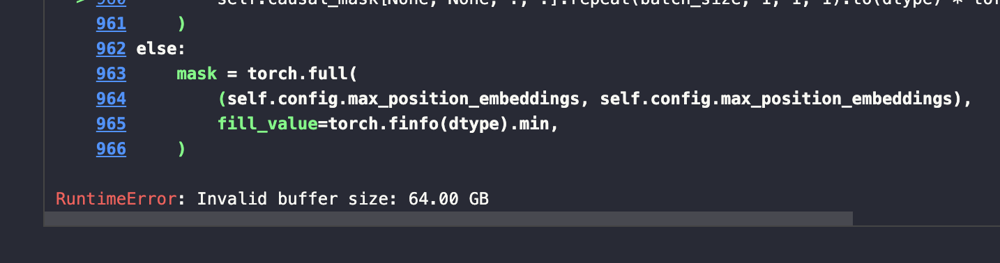
- Purdue Scholar
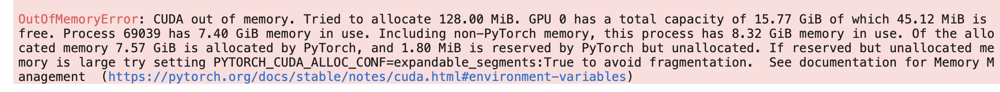
- stuff
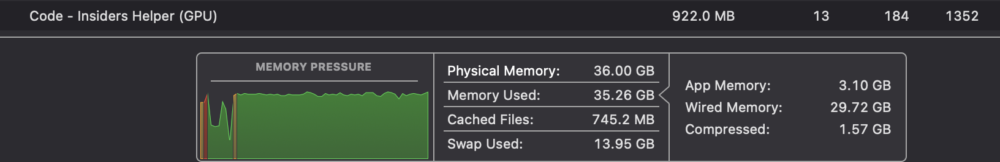

## Load Classifier (Reward Functino)

In [14]:
# i guess it makes sense they cant have the same tokenizer
model_class     = BertForSequenceClassification.from_pretrained(f"movie-model/final-trainer")
tokenizer_class = BertTokenizerFast.from_pretrained("bert-base-uncased")
print(tokenizer)

sent_kwargs = {
         "return_all_scores": True, 
         "function_to_apply": "none", 
         "batch_size": 16
}

nlp = pipeline("sentiment-analysis", model=model_class, tokenizer=tokenizer_class, device=device)

GPT2TokenizerFast(name_or_path='lvwerra/gpt2-imdb', vocab_size=50257, model_max_length=1024, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<|endoftext|>', 'eos_token': '<|endoftext|>', 'unk_token': '<|endoftext|>', 'pad_token': '<|endoftext|>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	50256: AddedToken("<|endoftext|>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
}


In [15]:
text = "For hearing-impaired university student Yuki Itose, silence has been a natural part of life since birth. Her world is small and isolated; she commutes to campus, interacts with her best friend Rin Fujishiro, and communicates through writing and text messages—a lifestyle that offers little to no change. One day, during her commute, Yuki meets fellow student Itsuomi Nagi, a multilingual travel enthusiast and friend of Rin. When Itsuomi learns of Yuki's condition, he takes it in stride, moving Yuki's heart. From this one simple gesture, Yuki and Itsuomi's lives start changing day by day as they let each other into their own worlds."
nlp(text, **sent_kwargs)

C:\Users\joeya\anaconda3\envs\its520v2\lib\site-packages\transformers\pipelines\text_classification.py:104: UserWarning: `return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.
  warnings.warn(


[[{'label': '28', 'score': -0.6236483454704285},
  {'label': '53', 'score': -0.26520615816116333},
  {'label': '35', 'score': 0.21349501609802246}]]

## Generator

In [29]:
gen_kwargs = {
         "min_length":   -1, 
         "top_k":       0.0, 
         "top_p":       1.0, 
         "do_sample":  True, 
         "pad_token_id": tokenizer.eos_token_id,
}

# find the index of the label to mimic
mimic = 'Horror'
output = nlp("a", **sent_kwargs)[0]
for mi, x in enumerate(output):
    if x['label'] == mimic:
        break
else:
    raise ValueError(f"couldn't find {mimic}")

C:\Users\joeya\anaconda3\envs\its520v2\lib\site-packages\transformers\pipelines\text_classification.py:104: UserWarning: `return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.
  warnings.warn(
C:\Users\joeya\anaconda3\envs\its520v2\lib\site-packages\transformers\pipelines\base.py:1157: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


ValueError: couldn't find Horror

In [17]:
mi = 1

In [18]:
output_min_length     = 4
output_max_length     = 16
output_length_sampler = LengthSampler(output_min_length, output_max_length)

In [19]:
pbar = tqdm.tqdm(enumerate(ppo_trainer.dataloader), total=len(ppo_trainer.dataloader))
for epoch, batch in pbar:
    query_tensors = batch["input_ids"]

    #### Get response from gpt2
    response_tensors = []
    for i, query in enumerate(query_tensors):
        pbar.set_description(f"{i} / {len(query_tensors)}")
        gen_len                             = output_length_sampler()
        gen_kwargs["max_new_tokens"] = gen_len
        response                            = ppo_trainer.generate(query, **gen_kwargs)
        response_tensors.append( response.squeeze()[-gen_len:] )
    batch["response"] = [ tokenizer.decode(r.squeeze()) for r in response_tensors ]

    #### Compute sentiment score
    pbar.set_description("Sentiment")
    texts = [q + r for q, r in zip(batch["query"], batch["response"])]
    pipe_outputs = nlp(texts, **sent_kwargs)
    rewards = [ torch.tensor(output[mi]["score"]) for output in pipe_outputs]
    print(batch["query"], batch["response"], rewards, sep="\n")

    #### Run PPO step
    pbar.set_description("PPO")
    stats = ppo_trainer.step(
                     query_tensors, 
                     response_tensors, 
                     rewards
    )
    ppo_trainer.log_stats(stats, batch, rewards)

PPO:   0%|                                                                                    | 0/1238 [00:14<?, ?it/s]

['Samantha Hart is delighted', ' The film also', ' This self-defined family is', 'In his homeland of', '  The heroes seem', 'Two Turkish anti-terrorist agents', 'One year after their incredible adventures', ' With these', ' Both sets are wonderful', ' Years later they gather', 'A subversive tale that interlaces', 'Ben, Gwen, and Max', '  Whilst there he witnesses the grim', 'In his early twenties, Sam', ' Two track that were performed', 'Medfield College science', 'So-jeong, who lives', 'A photographer in a', 'After being assigned', 'Elmer F', "If you're a younger", ' Eade and her dad', 'Whopper, Stan', '"For Sale! Including 500 violent', ' The plot of', ' It is because she promised', ' It demonstrates the skills of', 'Based on the extraordinary true story of', ' Will it be newbie', 'In response to the financial crisis set', ' Their destination was the 15th-', ' Follows his all', ' This time', ' The two', 'FBI agent Lee H', 'After killing one person and', ' Ara, who', 'Two sisters', ' 

PPO:   0%|                                                                          | 1/1238 [00:30<5:22:47, 15.66s/it]

['Samantha,', ' Ten years after an', 'The film is based', ' His plans go wrong,', ' Podge, a', ' This beautiful', 'Contemporary Rome', ' When they break down on a', 'The story of Balthasar Russ', ' Instead of showing all the worst', '  Meanwhile,', ' He goes on the run to', 'After being', ' In the end, good wins', 'Get ready for FAM', ' However, in the', ' However,', ' It details all of the movements in', ' Without her real', ' When she publishes her', 'It is', ' As financial institutions', 'Irving', ' Chased', 'Members of the controversial group N', 'Treat your entire family to', ' Somewhere in between the gilded and', ' But even in the', 'When an unknown object from space lands', ' However, Nob', ' Unbeknownst to', ' The writer (302)', ' A young bee sounds the bear-', "One of Hoppy's", ' As she traverses', 'An insane surgeon finds himself up to', ' Rick is obsessed with Ginger, watches', ' Dwight Yoakam: Pieces of', 'A group of people decide', 'Short film version of', 'Avery, a', 'Tw

PPO:   0%|                                                                          | 2/1238 [00:52<6:42:25, 19.54s/it]

['New adventures from', 'The story of a', 'Recorded', 'Lorraine and Mark enter the', ' Two millennials in a', ' Peter needs a bit', 'Mito Domain Samurai Seki', 'A beautiful deaf-mute is', ' Together, they', ' With the', ' At that night, two young ast', 'A psychologist interviews a death row inmate', 'Once the commanding officer of', ' Desperate for a', ' It is a romance of purest', 'A horror anthology of seven', 'Known for his', 'Plagued', ' Their intimacy', ' At the same time', ' On the', 'Siblings Kate and Teddy', ' If she had to choose between finding', ' \\u201cPlease watch them', ' Johnny has been willed her', ' They are unaware that', ' She\\u', ' The attending doctor Frank Holt gets under', 'The film tells the life of Tit', 'Taking place after alien', 'Set One: Playing In The', 'Unlike his', ' But the past just', 'With the', ' After a freak', 'A Civil War veteran', 'A gray wolf raised on a farm', ' However, when he', ' The two end up with the', ' When he is about', 'Disappro', '

PPO:   0%|▏                                                                         | 3/1238 [01:15<6:57:37, 20.29s/it]

[' Scrooge is visited', 'In this western, the sole survivor', ' All the victims appear', 'The Pals', ' For his many students', '" His family begged him not', 'Based on true story of teens Richard', 'After saving 10-year', 'Using found footage, several members of', ' The patients have to continue living', '"The Pocket Lover"', ' But when', ' Luffy and the gang end', 'Two drag queens', ' She magically', 'A very special online', "It's 1880's London, and", ' From bodybuilding to', 'Advanced technology, groundbreaking scientific', ' They are on the brink of', ' The awkward pair suddenly find', ' It was', "David Markey's documentary of", ' Scott Fitzgerald and his eccentric', ' Chris Pontius, Johnny Knoxville', " The production fulfills all one's", 'Tired of', ' It features footage of the', ' They kill an Indian', 'The diseased Dinosaur', ' At the dacha, the', ' With interviews from some of', ' Bringing two dead', 'Besides the', "After Will Spann's", ' Number 17, however,', ' They graduated 

PPO:   0%|▏                                                                         | 4/1238 [01:38<7:18:44, 21.33s/it]

[' To recover', ' Can father and son put their bad', ' As D', ' The latter becomes a marginal, while', 'Farsighted', 'A gung-ho', 'While hunting a', 'Our planet was contaminated by many', ' I wanted to incorporate these silent', 'The most awarded series in the', 'Swastik', 'When a', 'An abstract portrait painter is enchanted', 'Olga is', ' Two other races exist in', 'The story focuses on', 'A married couple on the verge', ' Unfortunately his mean--but not', ' Lizuca and the dach', ' Now an evil queen', 'In this sequel', ' Koko', 'As bombs fall on London, writer', ' Admitting that he feels threatened', ' An old woman once told me how', 'Imaginary', ' During his', 'A forest', ' Fearing the', 'A young family is forced to relocate', ' The trio creates', 'The Barber of Seville (in', ' As the body count piles up', 'After inheriting the family mortuary', ' And Jo has also befriend', ' Urtiga,', 'The wife of an American doctor', 'An energetic and fast-', ' Sadly, Alexandra with her lover,', ' 

PPO:   0%|▎                                                                         | 5/1238 [02:00<7:29:00, 21.85s/it]

['Failed', ' Topics include the', 'Historic Russian battles', 'Eight people embark on an', ' However, her flourishing career', 'Have you ever hoped', 'Katie Gatewood', ' Burke is in love', 'Jocke wants', ' Or is it Marc', ' The "sexperiment" works', 'A double portrait of two dictators who', ' Although Valentine', ' At the same time a reporter receives', 'A man involved in a horrific', 'Trey Parker and Matt Stone', ' Each segment is themed', 'Amidst rumors that the spirit of', 'Swarnaja (Koel Mall', ' He faces one of', ' Once there they', ' He works as a kites', 'Hacktivist and blockchain expert', ' Lawyer Jeff Pl', ' Ky\\xf4ko was cursed', 'Harry Hill embarks on', 'Telephone', ' Before his', 'Severino', ' Trouble brews when', ' Filming is interrupted', ' But his beloved horse Scout', ' The DVD', ' Y\\u014', 'The 20th', " Beth's anger and desperation for", 'In a world where culture has nearly', ' As Will tries', ' In 1967, on the', ' Dorothy,', ' When an unexpected tragedy forces', 'In 

PPO:   0%|▎                                                                         | 6/1238 [02:23<7:33:27, 22.08s/it]

[' His boss (played by Cecil Parker', 'During the Franco-Prussian', ' Rijk wants to check where', 'In the not too distant', ' Not only does', ' It is 6', 'Martha is', 'Mickey and Minnie', ' And when Grumpy gets stuck', ' It seems', 'In the', ' Then Ashoke changes his mind,', 'Philip', " Pierre's wildly ambitious mission is to", ' He surrenders himself', 'A two-hour Cat Power', 'A graduate', 'Princess', 'Four young people', ' Among them are Franz', ' When his younger sister temporarily moves into', 'Anthology film set in a', 'It\\u2019s', ' The film tells about the', ' Her father, Abraham', ' The debt collector', 'Cody, Chicken Joe and', 'Offering', ' A doctor uses an experimental', 'Near the town of Longwy', 'Yael Hers', 'The evil space pirate Gloomius', 'Singer and songwriter Willie', 'An undercover Texas Ranger runs', 'Newly separated Darla', 'Escaped criminal "The Fox', '\\u201', 'Filmmaker JJ Martin explores G', ' Instead, it is a conglomeration', ' As events become', ' He is visit

PPO:   1%|▍                                                                         | 7/1238 [02:39<7:02:31, 20.59s/it]

['A starving gendarme', ' When they wake up, some', ' Meanwhile, Inspector Zenig', ' Yumi A', ' Pink Lady they gained a', 'What happens when you', ' From high society gatherings to a', ' It creates', ' But amongst the uniformly looking', ' But, they still try to', 'Lola Bunny inv', " Gram's daughter Polly", ' Her head', ' It becomes Mad', 'Somerset Maugh', 'A journalist', ' During 2006, he', 'A creature', 'The documentary looks', ' His son Gabriel, a techn', ' When the music', " However, he's also", ' Waterman explores his journey', '  This unparalleled', 'In the 80s Paul', 'Dominic T', ' Amor features Latin', ' Encountering', ' The only hope of', '" They perform hits including "', ' Brothers Carter and', ' When Lot orders a dam to be', 'Tourists on a tropical island anger', 'In several unrelated', ' The strict, but admired, instructor', 'Two girls with unique abilities find', ' Romeo & Juliet', ' Kristin is grooming', 'Pluto', 'A witch', ' With no evidence against Mao', ' All this is 

Sentiment:   1%|▍                                                                   | 8/1238 [02:56<6:31:03, 19.08s/it]C:\Users\joeya\anaconda3\envs\its520v2\lib\site-packages\transformers\pipelines\base.py:1157: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(
PPO:   1%|▍                                                                         | 8/1238 [02:56<6:31:03, 19.08s/it]

[' But after years', ' Bill forestalls plan', '  The', ' A trip to the sender\\', ' But the rules', ' After trying to develop his career in', 'Three stories on one DVD', 'A couple', 'An epileptic', 'San Antonio Rose is', 'Prosecutor Etzel discovers that', 'Selma, a Czech', 'When a baby k', ' The film inter', ' We are in', ' His marriage is', 'This is Poe and Kr', 'Now that Ivan is about to', 'Four teen groupies kidnap their music', 'The Six W', ' This process is driven by the', ' A idle man', ' With jealousy nearing the boiling point,', 'During a', ' It features', 'In rural India, a child', ' Pastor Jess Moody recalls WW II deaths', 'An immature teenager', 'A reality TV crew charter', ' For Mrs Everton, the owner', '  Set', ' They manage to eventually clear the hurdles', ' These range from Evil Ways and Black', 'In the year 2019, where the', 'Romance in NYC', ' Things take a', ' After all it is', 'In a near', '  Having treated the', ' Cathar', 'Freddy Krue', 'In this', 'A livestream', 

PPO:   1%|▌                                                                         | 9/1238 [03:18<6:51:12, 20.07s/it]

[' Hilarious kitten', ' It ranges in reference from', 'A tour', ' Famous for doing nothing,', ' The only thing that', ' The tour was advertised', ' Upon discovering the nightmarish', ' His career is skyrocketing', 'First production of', ' She is persuaded that', 'A group of', ' Thereby he end', 'Ravana, the', 'Prafulla is married but', ' MacGl', ' Honda to see his new', ' In between her studies, she', ' In the film, the female lead', ' Slowly she starts to settle in', ' The traveller becomes', 'The downward', ' The maquiladoras hire', ' The Queen', ' After his arrival, he finds', 'The story', ' Explosively nuclear', " Meanwhile, Bram' friend Malcolm", 'A college professor reluctantly', ' A gang is out to', ' James Mayfield (', 'In Vera Cruz in', ' But then', ' To get to the mine,', ' Altieri thus begins an intriguing', ' The country has been hit by', " But Eleanor's", "London's Dup", " Tired of hearing him '", "It's 1989, and in a", ' Alejandro Sanz', ' During a', ' 25, Maurice', ' But

PPO:   1%|▌                                                                        | 10/1238 [03:41<7:04:29, 20.74s/it]

['Barney', ' Everytime he sees her walking around', ' The collection also features', ' The action of the picture', ' Due to his heroic act,', 'A two', 'When two people from two', ' This young', ' An African vacation with his assistant (', 'Mariko, coden', 'Helen', 'Several members of', ' They go home only', ' Installments', 'A girl who', ' Incredible faces his', ' In fact, it gets much more', ' The duckling is short', ' But as the mysterious past of', 'What is it about', 'A former American gangster', 'Zatoichi is sworn to protect', ' In an illicit affair,', ' A few weeks later', 'A reckless teenager', '14-year-old Lila', '  Their first reluctant', ' During Operation Bidone,', ' Jayakrishnan is', ' But Tala is', ' Promising', 'As the president', 'Spoof horror in which a', ' As time passes,', ' As Xuan Xuan makes her way closer', 'A man with a', 'A research scientist becomes the world', "Her husband's health suddenly", ' Meanwhile, Darth', ' His mind spirals out of control', ' Soon Villo

PPO:   1%|▋                                                                        | 11/1238 [04:02<7:17:13, 21.38s/it]

['A female cop goes undercover', 'A pathetic police chief, humiliated', 'A documentary unlike any other, The', " It's the story of what is", '  In the aftermath,', 'Ray loses his', ' He agrees', 'An award-winning', ' But they get arm-', ' His unorthodox boss, Mel (', ' Aspiring to escape a mapped out', ' Against the backdrop', 'Two youths,', '\\u201d The film captures', 'A New Yorker journeys to', 'In this globe-', 'On the 8th floor', 'Salt-of-the-', 'Settle in with the likes of', 'In her quest to uncover the', ' The aim is not to point', ' They leave a', ' Hear from the Clearwater Marine Aqu', 'With Istanbul mired in', ' Dejected, he goes to the', 'Stuck in a fishing village in', "Impoverished aristocrat's daughter", ' Hosted by', ' He is', ' In BECOMING COU', ' In a radically new', 'Four friends on their way to', 'In a world', ' Shailu, a young woman', 'The theory', ' Through this experience', 'Ridd', ' Iceal "Ham" Hamble', ' When Loring, one', ' He is coaxed back into service', '  *

PPO:   1%|▋                                                                        | 12/1238 [04:24<7:15:39, 21.32s/it]

[' When the police', ' Miss Roos and Gijs', 'An analysis of director Sidney Lum', 'As the new partner', ' Interviews', 'Young lawyer', 'Famous', ' Will he be successful', 'A mother grieving for her late', ' It tells the story of Wu Zh', 'When talented', ' La Capa', ' However,', 'Highly intelligent hacker Lillian', ' Part body horror, part crime', 'Murder is something', 'Tom Cameron must prove himself', 'One Kris Kring', 'After inher', 'UK punk', ' When three outcast brothers', ' Gradually', ' Based on a book by', ' Instead, he finds', ' Yutika is', ' Much of the', ' so he', 'Road Queen 13 unfolds as the moon', 'A doctor', ' Although fictional, this was one', 'A baby', ' Meanwhile, the Soldier with the Green', 'After a robbery at a', ' 25-26, 2012', 'Steve Holden, a secret service', ' The DVD version of Rub', 'Directed by the Singaporean', ' The game becomes night', 'A shy young high', 'Shaina and Rehaan take', 'An elaborate', 'The Old Republic: Rescue Mission', ' Upon arriving there sh

PPO:   1%|▊                                                                        | 13/1238 [04:40<6:42:40, 19.72s/it]

['An ex', 'An idealistic young', 'When a young soldier suddenly dies', ' Although Oakhurst soon takes', '30-year-old factory worker', 'The secrets feed the desires at the', 'A group', 'Faced', 'Police captains Emma and Adrien look', ' The film is', 'In the near future, "', ' During the summer of', ' The sheriff gives him a horse', ' Together, this unlikely pair become', 'Teenager Tsubasa S', ' Interviews', ' When Detective', 'Detective Inspector Campbell', 'The story revolves', ' Recorded in 2000, the program', ' In the background, but', 'In this home movie', ' Candy Boy, the most', 'A dark fairy tale', ' Their romance begins with a', ' When they', 'The year is', 'The Louisiana', 'A young,', '), and a', ' Bauer also', 'Gringo', ' They are considered classic Christmas cal', ' Tropp', ' Building on actor,', ' Lucy visited there four years earlier', 'An introverted teen sparks', ' When the two women were released', ' Deep in alien, isolated', 'Landing at a Chinese', 'A murder takes place 

PPO:   1%|▊                                                                        | 14/1238 [05:03<6:54:40, 20.33s/it]

[' Euphoria is a contemporary drama', ' Smith delivers a', ' After decades of opposition, a movement', ' The boys send', 'Syl', ' Behind the', 'The existence of mankind', 'In this supernatural horror film,', 'Police captain Aleshin is investigating', 'A race car driver tries to transport', ' Tex refuses', ' Determined to live up to', ' After Jerry finishes with the punching bag', 'The story of a', ' This film traces the', ' They soon find themselves in the midst', 'A vicious beaver blankets the', ' After a meteor shower hits the', ' High-end car dealership owner Max', ' In appreciation for the wonderful', " Following Betty's advice, he travels", 'A manic', '  A former student of', ' Together, he and', ' High jinks ens', ' The adventures that Ale', '  Turning', 'In a California desert town, a', 'An animated adaptation', ' It featured songs from Persona', ' He seeks his friends', " It's a", ' Akemi is unhappy with her marriage', ' His grandfather from', ' It is', ' However, their allianc

PPO:   1%|▉                                                                        | 15/1238 [05:24<7:09:13, 21.06s/it]

[' It turns out that Al', ' Cletus sets out', ' Focusing on the UN mission,', ' In a race', 'A gallerist risks her family', 'The Girls of Kappa Tau', ' However,', 'Steeped in a rich tradition', 'Assigned to accompany two', ' Her assistant', 'Cutting edge technology', ' It compiles the', ' After the release, he', "In the morning's", 'After her much older husband', 'Jessica, a young,', ' In Yoshiwara,', 'A rock musician and a free-', ' We hear a', 'Teenager Eric', ' It quickly', ' Sophie and Fritz', 'Based on', ' Sean\\u', 'On the eve', ' Tex Roberts and his', ' Together they find friendship', ' Although Uncle Chuen', 'A random card reading', 'At a mountain resort,', ' The three-act journey from b', ' They repel repeatedly Ali', ' On his way to', 'Twenty-Six Days', ' Great Bossa Nova', 'Based on real near-death experiences', 'An English actress is', ' One night, Marcus makes a terrible', 'A drug pusher grows', ' Despite their rivalry they collaborate in', ' With the help of his', 'Alice 

PPO:   1%|▉                                                                        | 16/1238 [05:48<7:13:22, 21.28s/it]

[' But while her husband is away in', 'Based on the 2000 book of the', ' When a body is found at the', ' Determined to', 'Thirty years after aboy', ' Her captor', ' The first DVD features', ' Out of jealousy,', 'Intrepid', ' This polarizes opinion', 'When The Neal Morse Band released their', ' Michael, a shepherd boy living in', ' Who cut the lines that sent', ' Finally, the grandson, after surviving', 'After her great', 'Elvira had a fight', 'Twenty One Pilots play the BBC', ' With her', 'Two former best friends reunite in', ' When the beast escapes, tearing the', ' When she hangs around other', 'Takashi,', 'In this western, a ranch', ' When they stop for the night at', ' This Halloween horror anthology from', ' Reason behind his determination was his', ' Henry Jekyll and Miss F', ' Straddling the line between her', 'A couple of college students', ' Inheriting her', 'Paula,', 'A profile of', ' The farmers,', 'When her parents go', 'The inept cast and crew of', " What's", ' But Brill g

PPO:   1%|█                                                                        | 17/1238 [06:10<7:26:11, 21.93s/it]

[' In order to stay', ' The impulse for this animation', 'Harry Burck has', 'When Iran\\u2019s ay', 'A military', ' When Perkins is', 'Friends since childhood, three', 'Jess and Andrea are', ' This bi', ' It is', ' His second in command is E', 'Tudor', ' The DVD features', 'A group of Australian', ' Words have never', ' Winston Hib', ' An overanxious', ' Asheng,', 'Based on', ' We meet those who are', 'Ready for', ' Performances range from', ' Louis Mandrin,', ' While Bob', ' As their consumption of drugs increases at', 'A washed up boxer searching', ' It is to', ' On their way back to Earth,', 'A group of five classmates', 'Lana, a teacher', ' While describing the task at hand', ' Hsuan-', 'Kathiresan aka', 'A young girl escapes her', 'The Gates family dream house turns', '" The program takes a detailed look', 'A gunslinger returns', ' She perfectly pulls through her work', 'An associative view of the days', 'Cross-dressed as a man', 'When a group of', ' While is notorious for his pra

PPO:   1%|█                                                                        | 18/1238 [06:28<6:56:30, 20.48s/it]

['A group of rappers and', 'Suspecting that', 'In this modern day version of', 'Nothing ignites the passion in', 'When the Rugrats', 'An obsessive doctor working on a cure', 'After colliding with', " But she's", 'Amarnath (Mammoot', 'An old', 'In depth highlights relating to the \\', 'A few months after a girl with', 'A con man and a would', ' Next comes a', ' Their time together will mend a relationship', ' As she lies in', 'An exhilarating celebration of the', 'FBI agent Bob', ' Inspired by real events, this', 'A juvenile delinquent is sent to', 'Concert film featuring', ' Released in 2010', ' The Olsen Gang tries', ' This footage presents the', 'To acquire ancient artifacts for a', 'Kaptein Sab', ' Along the way, Johnny also', ' Dhep', ' But when the', 'In this retrospective on', 'Artificial Parad', ' The set consisted of', 'The winner of the Miss World Virgin', 'A young mother decides to become a', ' The theatrical', ' Their distinct storylines each serve as a', 'Rita, a witty 26',

PPO:   2%|█                                                                        | 19/1238 [06:51<7:16:29, 21.48s/it]

['Red Ryder gets', 'Vinc', ' Noni, through kawawn', 'Spirits begin terrorizing', 'Kath', ' Together with', ' If you love Poss', 'The story of an', 'The tranquility of a small', ' Lucie is scorned', ' Zihao', ' Unfortunately, during the', ' Now, he', 'Terry Sugury is hired', ' Convicted', ' A top scientist will guide them half', 'Based on the real', ' Hutum', 'When he is captured in', ' The publisher takes the bet, and', ' In 1971, eight activists plotted', ' Starr is the man', ' High school senior Theodore \\u', " She doesn't always make", ' He has changed', ' Harris opened the show with \\', 'Two brothers who are forced off their', ' Hidden among the', ' Despite the difficulties and resistance encountered', ' It is soon revealed', ' Kinney asks the county sheriff to', ' There they', ' Aucoin knew from', ' Theirs is the only team standing', 'With the help of Charles Dickens', 'A lonely', 'After a drunk driving', ' Now, Micky', ' When the Outsider escapes', ' The very basic facts of', '

PPO:   2%|█▏                                                                       | 20/1238 [07:12<7:18:27, 21.60s/it]

[' It appears that', ' While being evaluated to stand', ' Brendan\\u', ' During the investigation process', ' The good times', 'A successful lawyer, with a new', 'To obtain a', ' Salesgirl June has', 'When strangers Re', 'A woman who dumps', ' But then he', ' He wants desperately to', 'The father, the captain of the', ' He has survived everything: electoral', 'After a one-', ' All murders bear the same', 'On the', '  Maria gets', ' Curiously, he will', 'Billy Carson is accused of', ' Nana returned to Hong', ' It\\u2019s adapted', ' Bob takes', ' Special guests', 'Gabriel', ' Now,', 'Jenny Neumann', 'With the holidays approaching,', 'The evil mastermind Fu', 'When a daughter becomes concerned', 'Yuki', 'Six young', '  Get unprecedented access to the development', 'The film centers around a', 'Melody Gardot performs her', ' Desperate to find out', "Theater manager James Guthrie's", '  For', '" Remembering', 'When a teenager suddenly', 'When Frank is', 'Intimate interviews,', 'When strong

PPO:   2%|█▏                                                                       | 21/1238 [07:30<6:45:27, 19.99s/it]

['Meico', ' After being forced to stay', ' Watch God\\u', ' But as sectarian violence engulfs the', '  Megan', 'The beautiful Florida Keys provide the', ' An act that had transformed Sen', ' Malic, a cruel scientist who', ' As far as she', ' The car is found having', ' Producer-direct', 'The story of how Britain\\u', 'A spacecraft is', ' Sammi also showcases her amazing', 'Golden Rose, an informant for the', 'When a boy', 'James, a college', '  If they could start again', 'Although not the first feature', 'Two foreign exchange', 'A story', ' Between the innocence,', '"D', ' But his reputation as', 'Journalism icon Gay', ' A military', " Part 2: '", 'A spontaneous holiday romance', ' "THE CHARON INC', ' Mico, a', '  The gorgeous Cody', ' Journey with Atten', 'A steel samurai blade that was to', ' However, they must prove their', ' When a killing that reflects one of', ' The puppetry here is top', ' Although her brothers are initially', ' An Animated Utopia', ' Under the spell of', ' Azi

PPO:   2%|█▎                                                                       | 22/1238 [07:52<7:01:32, 20.80s/it]

[' The rape of the 23 year old', 'Cat Stevens gave his final concert', 'These restless hearts are searching for that', ' But the hour', 'A stripper, desperate to', 'A Confederate Civil War', ' Her father', 'The first', 'Charting', 'After teenage ambulance driver Ernest', ' But how can', ' Uninterested', ' A beautiful but evil', ' But the kid builds his own', " It's not until", ' She met', 'The Fixies are', 'One Note Symphony: Live In', 'The first wedding anniversary of', ' After arriving at Chiaksan Mountain', ' The main characters are', ' There, she dons the original', 'Argentina', ' His conscience haunted by a bullet', ' As she fights for her life from', 'Based on the manga "So', 'This movie tells', ' The crooks want to find Durant', ' Sylvia must use all the', ' Sir Georg Solti', ' But, he', 'After drawing Betty Bo', 'The former dancer Christine Sims when', ' Starring the stunning Jillian J', 'In a cold tile operating', 'On board a riverboat', 'Born from the ashes of the', 'Set in',

PPO:   2%|█▎                                                                       | 23/1238 [08:14<7:12:05, 21.34s/it]

['Gerry hires', '  Drawing heavily on unbroadcast', 'A group of families on a', 'Sentenced', ' As she begins', ' With her newfound friends by', 'Ryuji tries quitting', ' With no', 'Two millennial entrepreneurs stage elaborate fake', ' The emotionally cold Robert is', 'After a', ' Helen later takes', 'Explores the revolutionary world', ' Determined to expel the insidious force', ' On April 20,', '  FEATURING\\r', 'In a post apocalyptic', ' When a freak snow', ' Charles Pierre B', 'A suburban teen', 'This documentary follows NBA superstar LeBron James', 'Jackie Moon', ' Hoping to', ' The battle', 'A street', ' Natasha confide to', ' Determined', 'While vacationing on', ' The film', ' Because the act of', '  Featuring damning', 'A strange', 'In a post-catastrophe', 'A police detective consults with', 'Talented musicians from around the', ' These childhood experiences', ' A neighbor knocks his door and wants', 'Two Brit', 'What happens if', ' She spends her time working a men', ' As things

PPO:   2%|█▍                                                                       | 24/1238 [08:40<7:27:44, 22.13s/it]

['During the Qingming Festival, a', 'Sara, who has', ' It becomes clear', ' At night, the', "  'Hungry For", 'The theme of death is heavily inter', ' Years later, their', ' This film, recorded live', ' Soon she goes on a', ' But when the', ' With no air cover protection for', 'In 1943, two British', ' He tells people that', 'Bank robber K', ' Why is it that every guy thinks', 'Eight documentary', ' A crack team of Chinese intelligence', 'Half-human', " When Steve's rebellious friend", '\\r The film was made in', ' "Lost and', ' An audience of 80', ' When he is murdered, investigators find', ' But then a strange woman bursts into', 'Part 2', 'Frantic to be free of', '  Chineke', 'Follow Alex Hon', 'In this dark', 'This DVD features', ' Before Tessa makes the', ' The event', ' Sixteen years later', ' Just three', 'In the', 'After unexpected loss', 'Bill,', ' Unfortunately for him his wife Amanda (', ' Increasingly unstable,', 'When the', ' I was a little surprised to see', ' Feeling unac

PPO:   2%|█▍                                                                       | 25/1238 [09:04<7:41:02, 22.81s/it]

[" It doesn't matter to the", ' In the debut release from', ' As the sinners \\u2013', ' He submits ideas', 'A boring commuter', ' Debbie Harry appears in', ' Brand Hauser', 'What is anime? Through', ' a world where gangsters close in', ' What follows is a very confusing story', 'Grant Mac', "When Elsa's three", 'Four Complete Films! All Male Cast', ' But the ghost of 19', ' Die Walk', 'A young security guard works the', ' Yet the people of', 'A storm chaser tries to', 'A vet returns', 'Nami is', ' But conniving Sheriff Wallace is hip', 'A group', ' After a brilliant research scientist experiments on', ' Director Thomas', 'Between the realms of fantasy and reality', 'After living 45 years in Germany', ' Charlie gets into', ' With an', ' But after taking the resident', 'Three generations of a', ' tells the incredible comeback', ' The sisters organize', ' Poor Walter', 'A group of', ' But when he refuses', 'An investigation', 'Six strangers are invited to', " He's missing an important", 

PPO:   2%|█▌                                                                       | 26/1238 [09:26<7:47:06, 23.12s/it]

[' Their relationship progresses to', ' Told from the perspective of', ' In order to clear their', ' When a highly-wanted hacker', 'A young woman faces', ' Santa Claus abandons', 'The story of Chinese', ' McCord', '  When Rachel (Amelia K', ' The versatile band performs just over', ' He met again with his old', ' With Logan working', 'Vampire Queen', 'When legendary', 'Huckleberry Finn', '" In the film, Kurt Cob', ' Doch als er erf', ' Elisabeth Campbell is', ' It features footage from', "After her mother's death", ' When he', 'This is multifaceted', ' Framed as tra', ' Guy and Blue heal each other', ' Genius actor and', ' Melissa is', ' After selling the shop to a local', ' She gracefully dispatches', " When the host doesn't show", ' He continues to reach for his', ' With the help of a wise and', ' After two centuries trapped in', 'A material science', ' Instead his skill is tested', ' Resident men', ' They then plan to', "The Emperor's armies have", 'On a hiking trip in the Italian',

PPO:   2%|█▌                                                                       | 27/1238 [09:50<7:38:26, 22.71s/it]

['When LexCorp accidentally unleashes a', 'Two cops portrayed by Michelin Men', ' There are four girls who', ' When Pablo is badly wounded in a', " Then there's that", ' They are to', ' After searching for and', 'Old Grandpa mouse tells', ' Worse, criminal gang leader', '  Short', ' There are no', " Daniels' perfect family when his free", ' The only thing', ' Recorded in Sydney, Australia', ' When one boy sees', ' Here she follows Julieta', '" In his all-new comedy', ' Nagamine and Asagi investigate', ' The dreams take on an', ' There, he attempts', 'Carlos and the', ' However, less', 'Crazy', ' They follow the trucks to', 'Stall', '  New production of the Te', 'Matt Malone, a highwayman', ' However, he in turn', ' During her captivity,', ' When Captain Jones gives Jesse', 'In order to escape', 'Two teenage girls in suburban Connecticut re', " Ned suddenly decides that he'd like", 'After his hatred of', 'Four high school teens are thrown into', " Yam's", ' As Willow Haven PD Detective 

PPO:   2%|█▋                                                                       | 28/1238 [10:11<7:42:03, 22.91s/it]

[' Brandi dominates sex slave Cher', 'The story of this film', ' With a simple mantra', 'Fran\\', ' One day', 'Gram', 'A forest', 'An unconventional hitman gets into', ' Their female acquaintances Annabella,', 'In this hilarious short film we', 'After the house is robbed', ' At a reception', 'In an attempt to shake off her', 'Mobster "', 'This documentary is', ' On their way home', 'In this interplanetary baseball story', ' The robots known as', 'A look at the life and work', ' Jane Blanchard', ' Only one of the escorts Len', ' Following a gang of', 'A look at the "Hell House', ' Levonna &', 'The romance starts with a million pes', 'Directed by Trude', 'When a frontier family,', '  Songs: Virginia Plain', 'This is an update', ' When their landlady is horribly', ' New prospects seem to', ' Gunther', ' In 1994, "Live at', ' However, when their recordings and money', 'For the', 'The crew of a reality', 'Five hapless inner', 'An inquis', 'A woman returns', 'The Super', 'Lydia and William s

PPO:   2%|█▋                                                                       | 29/1238 [10:33<7:33:53, 22.53s/it]

[' With his robot', 'Fast following', "TV's Whizzo the", 'At an', 'Overland', ' In process', ' Relive his powerful performance', '  Construit comme un film', ' Philomena knows absolutely nothing about', 'In an isolated', ' Her father agrees to', 'Vanessa,', ' Narrated by', 'Aporia', ' The latter has', ' Bart is interested in Grace,', 'In this', 'A pregnant', ' When their horses are stolen', ' The concert was filmed in', ' To make up for', '  There\\u2019s', 'Otto Sc', ' Their gestures', 'For one female entity', ' Staiva  06 Y', 'While attending a retrospect', 'By presenting archive footage along', 'Cathy', 'When plans for a', ' With no', '  One day, Jin-', "It's back to school soon", ' Believing Victor to be a', ' When she', 'Young knight John travels the world', "It's the summer solstice", "Set against Paris'", ' From the pool to the', 'Gerhard Richter has spent over', 'The film chronicles', ' He gets', ' Franju shuffles through the plot', 'An insom', ' A cop who, unhappy with', ' Ron

PPO:   2%|█▊                                                                       | 30/1238 [10:54<7:28:26, 22.27s/it]

['Justin Quay', 'In search of', 'When Maddy Stern discovers her', ' A delusion of persecution haunts him', ' In a quiet moment, C', 'When bookseller Buzz cons Diana into', ' Arthur isn', ' BOB AND THE MONSTER crafts', 'When his', 'A psychological thriller about a middle', ' Parisian refugees start to pour', 'Two small town Dutch', ' When Adam decides to finish his', 'Brendan', 'The twisted tale of', ' When Jackie kills', ' Now with his own life in', ' His grotesque pursuit to reun', ' Conductor Riccardo Chailly', 'In Spring Troupe', 'Cheonbong, a', 'Ranger', 'Wonder dog and', ' This film covers the story of the', 'A magical musical adventure about Ann', 'A charismatic New York City jewel', ' Her husband, Ance', ' His current', '  This', 'When new parents', 'When brave', 'An agoraphobic woman', ' The major battles of the', ' This was one of the', ' A filmmaker with a broken heart,', 'Since 1993', ' But when Jessica moves to a', ' They encounter many', ' Is it an alien visitor? Then', 'C

PPO:   3%|█▊                                                                       | 31/1238 [11:16<7:23:15, 22.03s/it]

[' Through a series of events', ' They seek refuge', ' Soon, many other children are', ' Ten years later,', 'Nick and Janine live in', '  Told through', ' all come together in', ' Meanwhile, the', 'Former pin', '  Clearly knowing what he has', 'On the riverside quay', ' A device she', ' Patrick on the', 'Korean foreign exchange', 'When a cynical ex-TV news', ' They keep the', 'Bored', 'A group of', ' First he is trying', 'Get ready for a big shake', 'In the British countryside, the Har', 'Documentary about D', ' The young couple', 'Kashira,', ' Before he can', ' It is', 'Elk jaar le', ' Frampton still remains one of the', ' Its soon revealed that', ' Meanwhile, Jin', " That's", ' Jason (2003), follow Ash', ' Unlike their previous tour, this time', 'A desperate,', 'Moms and their', 'A biopic of', 'During the Cold War, an', ' Peterson, however is', 'Swarthy', " The film's stunt coordinator discusses Jack", ' While on the run from', ' Running on the', ' There is Ilde', ' Her baby face', '

PPO:   3%|█▉                                                                       | 32/1238 [11:33<6:49:43, 20.38s/it]

['The film tells the tortuous', 'While witnessing a', 'When an', ' Fearing he will be replaced by', ' Tonight, a photographer hits it off', ' They travel', 'A friendship between two', ' As she fights', 'In the latest', 'When Flopsy', ' In the big', 'Cult musician Swamp', 'A fledgling producer', ' But when he falls', ' Memories real', "Dubbed 'the black Beatles", 'Bugs Bunny and', ' When Goofy comes', 'ICAC principal investigator William Luk', 'Kara and  Tyler are close', ' This documentary, based on the', ' When a thunderstorm forces', ' And even if you look at the', ' They make Dirty', 'Princess Ida and Prince H', 'A couple are given a camera', 'Set in', ' With Clint', " When he's spotted by the", 'A mysterious old', 'An alcoholic', 'A nerdy film student and lifelong', 'The love story, shown', ' Things don', ' But the flat she takes in', '  An opera about', 'In 1826 British-', ' She tries to make her', 'Venus and', ' Through this', 'The church', ' They can catch him but not', " Shortl

PPO:   3%|█▉                                                                       | 33/1238 [11:55<6:59:30, 20.89s/it]

['Humanity', ' They move from village to', 'Giuseppe Tornat', ' Isabel awakes', 'Major Lex Kearney, dishon', 'The digital revolution of', 'Through first person', 'Julita expressed', 'John Garrity, his', ' Five years', 'A happy-', ' While he is', ' All that is', ' The original play premiered in 1967', ' A TV-obs', 'A missing hard drive', ' But her soaring', 'A woman', 'When a museum professor', ' Distressed to find that people', 'An emotionally gripping family action drama', ' He runs off to Paris', 'Suzuki Shiz', ' In the', 'Mowgli, lost in', ' Her marriage is on the', 'Officially a Charles', ' Serrano kept proofs', 'When a Japanese', 'An aspiring actress gets a houses', ' The use of', 'The movie is based on', ' Both are reluctant to talk', 'A chronicler', 'Actresses talk about their', ' When Ehr', ' People close to Britney Spears', 'A single mother restores', 'When 8 celebrities from around the', ' Nishida Naomi (the ha', 'Adventures', 'Disturbed by the separation of', 'A woman drinks

PPO:   3%|██                                                                       | 34/1238 [12:17<7:08:20, 21.35s/it]

[' There,', 'Welsh', 'In New York', ' He seamlessly interweaves', 'Hot on the trails', ' In nary a', ' The show was performed with his band', ' Mark Richfield, the', '  Chicago', ' After losing', ' She was the first person Harris and', ' Sometimes it', ' As a hurricane approaches and', ' She soon', ' Gregory Arkadin', ' However, the program', ' Following his death, Mari starts', 'A group of people are invited', 'Kadamattathach', 'An animated retelling of \\u', '" While there', 'Four employees are in boredom with', ' As the revenge-', ' As gangsters gather', 'Hop, a wanna-', ' In the process, he', '  Pierre Cl\\xe', ' Twelve-year-', 'An in-depth analysis of the', ' She p', 'On May 24, 2000, the', ' Now in its 12th', ' There were', 'When a television', 'Quantum Project is the story', ' The story', ' Shortly afterwards, Horst', 'A young woman', ' Along the way back', 'The 3-day BBC Radio 1', ' After taking the gas', ' Desperate to find some financial relief', '11 Guest are summoned to', '

PPO:   3%|██                                                                       | 35/1238 [12:39<7:12:43, 21.58s/it]

[" Kashiwada's", ' It comes as no', 'When a young', ' The elder, Pro', 'While working as an E', ' Ha-neul and Jung-', ' Informatic', ' In recent years this curious organism', 'In the', '" Narrated by Roddy McD', 'Miss You Can Do', 'The decurion Rand', ' To survive, the men will', 'In June 1972, Slade showcased', 'Generation Startup takes', 'Veteran cop Nick Pulovski', ' After an', 'Having just', 'As part of', '" Soon, they find themselves trapped', '  The officially announced talent lineup', 'Blacklisted by the', 'In this low', ' He takes his victims to room', ' The film', ' His long-suff', ' Just as her dis', ' Local dancer', ' But with the help of a', 'This is a film', ' When a fading Hollywood actress', 'Jimmy is a committed child', " She's sure this position", ' When his long-time', 'Itsy is new in town', ' The link', 'A video camera turns into a looking', '  This', ' Fighting to rescue the', 'This intimate documentary explores the life', 'Set in the very near future,', 'In the yea

PPO:   3%|██                                                                       | 36/1238 [12:56<6:38:37, 19.90s/it]

['A group', ' Panic grips the town as Valerie discovers', " Now they've", 'The Concert for the Americas was a', ' Sent back in', 'Walk\\xf', 'After a shrimp-', 'The hero makes good with', 'A local don locks horns', ' Rama is frantic:', 'As curfew approaches, an everyday', ' "Onizuka" learns', 'Taek', 'After the Second', 'On the set of', ' Sheriff Thurmond Fowler', 'While searching for', ' In order to', 'While hiking in an isolated forest', ' But as their ritual of', ' Thinking this is the niece', 'The struggle between a', " She took over her boss' operation", ' From her early', 'The story of the stormy relationship', ' After their spaceship crashes', 'Jaded ex-', 'As other "B"-', ' One filled', ' But when they', ' Once inside the royal palace, two', 'Filmmaker Kip', ' The pair have a troubled relationship', 'Luis Candelas,', 'Gideon Blake', ' Joe faces', 'The Emerald City', ' Each man', ' Her very traditional, old', ' The film features an', 'A mysterious young man', ' His marriage fail

PPO:   3%|██▏                                                                      | 37/1238 [13:17<6:52:07, 20.59s/it]

[' The film is', ' Examine Al', ' In a \\u2018what', ' After another successful flight from the police', ' His comrades still want', 'Using two', ' When Bud', ' May dies and Joseph tries', ' Reeder, a somewhat', 'Lieutenant Alice Turner is a brilliant', ' "T', ' Alphonse Tram is', ' Jane\\', ' Eventually donning Confederate', ' The settlers attack the Indian camp,', ' After a', 'In a future where', 'Banks are being robbed', 'In this beautifully curated visual and cinematic', ' Working through her', 'Idol Kataoka decides to', ' Strictly focusing on', ' Approaching the end of his career', ' Now, the survivors must face', ' In their desperate flee', ' As the evening', 'The film charts', ' Discovered after', ' He joins a gang of', ' Suddenly, they notice', 'The truth is way', ' Mamdouh (Ah', 'When two friends open a Halloween', 'An American submarine leaves Tierra', ' Chise is not an ordinary', ' Transporting dramatizations and inc', 'A film about the Inner City', ' He decides to return to

PPO:   3%|██▏                                                                      | 38/1238 [13:39<6:55:19, 20.77s/it]

['When a', ' In between the chaos and', 'Romain', 'Miriam Yeung lit up', ' The Count and a', '"  Having perfected the sounds', ' James (Team-Captain', 'A group', 'As her marriage dissolves', ' Lia has to fuck the', ' As Darrel uncovers', 'The first and maybe', ' So his loyal', ' In trying to solve a series', 'Detectives Munro and', 'A scientist, Joyce, searches for', 'T showcased songs from the then', 'Duke Berne', 'A nurse from Ukraine searches for a', 'When a black', 'An elderly', 'So you', ' Ashok starts hating poor people', 'In this western, set', 'When his daughter', ' They share', " As a self-proclaimed'mother", 'When a', 'Imagine a pornographic film set in', 'The life and work of', ' The wanderings and', ' After Kou', ' Raju', 'A conversation', 'Two Hong Kong', ' Johnson and', ' Sheriff and Tony eventually leave to', ' They soon discover spirit', ' It draws the intimate', 'As a young New York', 'A disgruntled man creates', ' Written and', 'The son of', ' The concert features all

PPO:   3%|██▎                                                                      | 39/1238 [14:02<7:10:12, 21.53s/it]

[' To this end', 'On the eve of Christmas,', ' The songs comprising the', ' After being told to', 'At the height', ' In contrast', 'When Prancer', 'Al Shines', 'Recording', ' Herzog also takes some time', ' Her process is on full display in', ' WRACK focuses', ' She is told that', ' Min-joo, aware of', ' The sergeant', 'Just when George Banks has', ' The self-', ' Studio executive', ' Will Pororo and his', 'Among others,', 'Joaquin Lara, a successful', ' During the', 'Tempted by the thought', 'Taking its title from', ' In Pursuit of Honor we', 'Ayu', 'White Fang, part', 'Mum and Son', '\\u', ' Entering a', 'Aisah is a', 'Jank', 'After squ', ' With sawdust floors', 'Hard-as-', ' As the group exits', ' In order to return the', 'A people', 'Follows Candel', '  He soon learned that great films', 'Joan Wiswell, Ted Work', 'A mentally fragile woman is', 'Three people meet in the same', ' When Tae-w', ' When these amateur superheroes', ' 3, 1979 in Cincinnati form', ' When their friends Mind'

PPO:   3%|██▎                                                                      | 40/1238 [14:19<6:40:38, 20.07s/it]

['A German Shepherd Dog', ' When Made', ' After he discovers she has cheated on', ' The Lalaurie', 'A dark evening', '"  A', ' A multitude of objects found in', ' They and', 'When the young', 'The cartoon is based on', 'In eight minutes, animator Bill', ' Valkyrien', 'A floating', ' Following a successful attack by the British', 'A beautiful film', 'Through conversations with the', 'Family tensions', 'With Halloween only hours away,', ' They hire', 'This wrestling documentary', ' Things start to change when a', " He's just received a", '  Award', 'Twenty-five hundred years before the', 'An intimate reflection on life', ' This will be a supercharged', 'A corrupt customs official joins forces', ' There, he encounters a rigid and', ' It is up to', ' Bonus extras', ' What he doesn', 'Escape into a', 'Max Stricker, an old anti', 'A successful businessman goes to Italy to', ' Faced with endless corridors and', 'While in pursuit of cop John', '  With its narrative sweep', 'On a winter', "Afte

PPO:   3%|██▍                                                                      | 41/1238 [14:35<6:18:24, 18.97s/it]

[' The film looks', 'On October 16, 1992', 'A high-', 'With 2DVDs and 3', ' Some time thereafter she', 'When rogue stealth-fighter', ' Hoping to walk away from the', ' There\\', ' A man', 'A homicide detective realizes', " But if Dummie's", 'Budd', " It's love at first", 'Cattle bar', ' As various people on board fall', ' What seems at first sight to be', ' The father and the other children', 'Former professional skier Kat works as', ' The team is waiting', 'The destinies of', ' As she is recovering she begins', 'Azit, the', ' It is based on', 'A young Cheyenne', 'Sonja W', ' Through raw talent', 'Due to his honesty and', ' Started in 1988,', 'A adult', ' The idea is to', ' This is', "The continuation of Joe's sexually dictated", 'Karnataka is currently on', ' The government pac', ' Clair and the marginally', 'After being replaced by a younger cowork', 'The moment', 'In this fictionalized biography', ' His mother used to be always', 'Another stellar volume of', 'The story of a', 'After

PPO:   3%|██▍                                                                      | 42/1238 [14:57<6:34:18, 19.78s/it]

[' The An', ' With the help of', 'Alejandro is an ordinary man', ' It contains highlights', 'The New York Philharm', ' As the party quickly', 'After being estranged since', 'A group', 'Ydessa Hendeles', " But it's there he", 'Fear and Loathing on the', 'THE YES MEN FIX THE WORLD is', ' Her passionate life is', ' With no way', ' The piece', 'Norwegian immigrant Marta', ' But when Oliver meets wealthy', ' Ning Caichen', ' The story portrays the', " As the son's woman changes clothes", 'A man', ' A true legend', ' In the second story, BJ', ' Mary can', ' Club X is a hidden community where', 'Crowns', ' Chronicling the present, framed', 'Made when director Vladisl', 'To Hell and Back', 'Strugg', ' However,', ' One day', ' And through his travels', ' The teacher who accompanied them will later', ' Convinced that', 'Emil', ' His first', ' His friendship with Fidel Castro,', ' Danger begins to', ' The performance', 'Wyoming Dan', ' He must put aside his dwindling', 'Lily produces a', 'Tracey 

PPO:   3%|██▌                                                                      | 43/1238 [15:19<6:50:22, 20.60s/it]

[' Ethel, however,', ' Before she can choose,', 'Reno Bill,', 'As a string of', ' The escaping condemned man is also no', 'A group of young', 'Two sisters who tragically lose their', ' Featuring a new song', ' In the UK,', ' When a sentient female', ' As lust and betrayal threaten', 'Metallica Live Concert', ' Between her physical transformation', ' The video draws', 'When 5 students suddenly', ' Having seen', ' Erot', 'Somewhere In', ' Live in Anaheim features a documentary of', ' Tom and his wife', ' To name but a few: David', ' As she confronts her', 'Four superimposed rolls of', ' It features rare musical performances never available', ' What she found was a tribe,', ' As they get', ' He has traveled over 20,', ' One day he meets beautiful Mat', ' However Elizabeth starts', ' But an', ' \\u2015\\u2015Har', ' In October 1941', 'The definitive portrait of one of sport', ' Along the way he manages to bed', 'In 1994, New Zealand mountaine', ' They promise', ' Every night she', 'A group

PPO:   4%|██▌                                                                      | 44/1238 [15:41<6:55:04, 20.86s/it]

[' She gets hold of a', 'Due to the popularity', ' But what can she do', ' Until he', ' He is attacked by a', 'Lila, a grief-', 'Californian sext', 'After 40 years, a', 'Set in', 'A documentary anime retelling', ' Friedman explains', 'Eun-hee and Joon', ' Yur', ' Ma finds out and', ' He fails', ' Now his only hope to win', ' Arriving', 'The story of the forbidden', ' Even as the movement breaks into', ' Featuring interviews with key actors and', ' When the', 'A look at 1970s', 'Keely is agh', 'After taking a bullet to the head', 'A team composed of', ' Adapted', "A woman's mother makes a last", 'Set in', ' With the help of Vesper Lynd', 'The hero of the film,', '\\u201cLIVE AT', ' The only people taking him seriously', ' They also have', ' By chance the destiny of all', 'Stuck in the', ' In need of', ' Before long, the residents', ' With this spook on their tails', ' As Kyung-', 'Two Angola, the', 'A suave bank robber', ' Tanya returns from the', ' Saved by', 'This documentary explores

PPO:   4%|██▋                                                                      | 45/1238 [16:03<7:02:31, 21.25s/it]

['A young Mexican boy tirelessly tries to', ' In an', ' On a tip', ' Rich, young and beautiful Anna', 'Preeti S', ' A sinerg', 'Amidst a', ' Flip and his henchmen try', '  This was the', 'Roman Bask', 'A celebration of the Irish', 'Trapped', ' This coincidences change the courses of', "A man's", " Looker's girlfriend,", 'An extraordinary look', 'In a post-apocalyptic wasteland', ' Among the wildness is a fight', ' They loan him their last', ' Her idea', ' Meanwhile, Detective John Marsden', ' Marc Simon,', ' However, her "care', ' The amazing characters Alice meets are portrayed', ' Gaja has a sister', 'A team of researchers for', ' At the same time', " I wouldn't be shocked if Blue", 'With \\u201cT', 'Anti-drug cop Cao Ren', 'Billy Carter', ' Joining the fans', 'Blackout gags and music,', 'With holiday chores piling up', ' Stripped of power', ' With the incessant adult Barney', ' Then, the sound of', ' As the date of Shi\\u', ' Proving how', ' Under cover of darkness,', ' Convin', 'Fo

PPO:   4%|██▋                                                                      | 46/1238 [16:20<6:33:02, 19.78s/it]

[' However, ghostly', 'Balto', 'Bugs Bunny is abducted by Marvin', 'A neuroscientist', ' Some customers are special, though', ' Her journey transforms', ' It is an absorbing look at a', ' From "Tok', ' Sally bravely', 'When Guillaume Valmont', 'Bobby Lee (', ' From writing/recording', ' Only a few years after being', 'A man', ' Light The Wick showcases the', ' Donaldeen takes an', 'Thirty years ago, Ray Reiter', 'The President, an intern and two', 'Michel, a fifty', " Filmed on 1996's Autumn", '  Ominous', ' As the pressure of his budding', 'All men who want to', 'A young restorer (', 'Jeff Dillon decides to revisit the scenes', ' Dora', ' As his kidnapper', '  My sister-', ' When Lena, a young', ' A few days down', 'An immortal knight must', 'Are we in fact living in a', ' The setlist spans Burt', ' They find a', 'After serving', 'A musician whose career is', " Anne's story is intertwined", 'Upon taking her vows', ' Grimm,', 'while finding', ' Although, fighting', 'Inspector Betti (M'

PPO:   4%|██▊                                                                      | 47/1238 [16:42<6:49:44, 20.64s/it]

['A shoe company executive who has mortg', ' The story of how the boy Nik', ' He looked good and sounded', 'A nebb', '  Their first opponent\\u', 'Carefully', ' Candid,', ' When her estranged family', 'Wealthy American house', 'A rom-', 'After hearing', 'This is Gordon', ' Unfortunately, he has agreed', 'A homicide detective teams up', ' What begins as', ' Along the way they', 'A group of ghost hunters', 'We, The Marines takes', 'Expert', 'After getting fired from his job', 'Still Kicking:', '" Sure is', ' Add to this', ' It uses both original pop-', 'Johnny Mack Brown comes', 'A newly appointed', 'A group of ruthless gang', 'Voluntarily locked', 'The Biblical stories of Genesis', 'When Trace McNeil experiences a', 'The story of two newly enam', ' Can self-isol', ' With broken English and poor health', ' Barred from', ', who stole', 'Newly', 'A young woman fights for her life', 'After inher', 'The only', ' Soon,', ' One day, he has a', 'Former Brownsville,', 'Percy', 'Dj', ' Vercingeto

PPO:   4%|██▊                                                                      | 48/1238 [17:04<7:00:51, 21.22s/it]

[' After courageously protecting a', ' Dando', ' Emily Rodriguez caters an event', ' Milt Dale, who lives', 'A young woman,', 'In a rigged', ' Upon discovering', 'Celebu-', ' Rushing back', 'Something sinister', 'Operating under a pseudonym which means', 'Staged as a series', ' Later he learns', 'The Satisf', ' When the boundary between their worlds collapses', 'An English chef with a chic restaurant', 'Using previously unreleased archival', 'An unknown country military intelligence,', 'The story of Wilson Bond, a', ' When one', 'After leaving the', 'A thriller that revolves', ' Through the', 'The story of Sport and Spoon -', ' After hearing the heroic story about her', 'Catherine and Elizabeth', 'It shows a', 'Maggie Diggins,', ' Also featuring an exclusive', ' Dave and Alice', 'Recorded live from their sold', 'Danish journalist Mad', 'After releasing a mythical monster upon', ' In order to prove his', '" This dynamic performance', ' Because all three want to', 'In Tangier, disgraced 

PPO:   4%|██▉                                                                      | 49/1238 [17:20<6:31:06, 19.74s/it]

[' The two most brilliant strategic', 'Gil Kyle finds himself caught up in', " Testing they're friendship and passion Star", ' She graced the', 'A man searching for his', ' After making a', ' And something unidentified chasing them! A', 'The Emperor of a', 'A tramp steamer', ' In the process, he', 'A series of', ' After being left', ' Surviving a', 'A sixty-something mother', 'This is a', ' She is pushed', ' Initially appointed as an English teacher at', '  At the', 'A police', 'A nationwide man', " When he can't find a mouse", ' With bodies piling up, his', 'A group of', 'A bored office', '  Will she have to visit the', 'A contemplation of art and adventure in', ' I will always hold this', 'Zenobia,', ' Soon relationships are tested beyond the', 'In celebration of the Wildlife Conservation', 'In her first-ever HBO', 'Mark, a hitman', ' The "Fresh Hare', ' Throw in a fuck', ' After being separated from', 'Bernhard "Big', ' In the wake of', ' Armed with information from a', 'A spiritual

PPO:   4%|██▉                                                                      | 50/1238 [17:42<6:40:18, 20.22s/it]

[' Concerned with the degradation in water', ' Her folk-', '  But upon moving out', ' Pratap finds out that', ' Sommi', 'An untrained', 'A rich', 'Three people with different mysteries abilities want', 'Point of Order is compiled', 'When young loner Anna', ' Gino Quilico', 'Francis is a young gay man', "Michael 'Nug", ' Nadine wants their relationship', ' Lustful', ' And when the clash takes place in', 'When Sylves', ' Soon, however, the vene', 'Documentary of Anna May', 'WARNING This', ' While the German army', ' Torn between two women;', 'The che', ' Eric L', ' Desperate for love,', ' Zhang Yiqun knew', 'When Angelica', 'Watch as these', ' The scientific-', 'A married couple, who spend all', ' Suffering from amnesia,', 'A town is cleared of crime when', ' Over three', 'In 1965, the space station J', ', the Earth Federation launches a', ' The Admiral', 'A detective teams up with a young', 'Conniving and', 'The sensitive Onn', 'Having promised to find', ' Together they end up on a', ' 

PPO:   4%|███                                                                      | 51/1238 [17:59<6:16:46, 19.04s/it]

['With Ran,', ' Amongst many', ' Then in', 'A soldier', ' The story is a modern version of', 'A story about the', 'Fascinating underwater documentary filmed with', ' Once You Know, by director', ' His cleverly staged "opera', "O'Day, the terror", 'Pablo', 'Inspired by Georges', ' The organization was the one that developed', ' Their chiseled bodies', 'When a', ' They welcome transfer student', ' But this', ' One local resident', 'A modern', 'A look at the careers', 'A lovely dame with dangerous lies', ' Together with', ' With the wedding', ' And hear these Disney song', 'The story of the life and', ' As they provide', 'Meka Suri is', ' Through a series of', "It's the", 'A kind wanderer living around a', 'This film is', ' Forced to search', ' Walter is an inventor and the', ' Although he manages to cover up', 'Documentary about the invention', ' But when he learns', ' The countries are', 'In a religious', ' Robert Klein', 'until they were finally recovered by Miles', 'Ait', ' Kit runs t

PPO:   4%|███                                                                      | 52/1238 [18:21<6:36:52, 20.08s/it]

[' Once the furry beings are shaved', ' But fate', 'Three months after', ' In less than two years,', 'When a', ' Next, a ghou', 'Refusing to marry', 'Four friends', ' It also has some', 'A Yorkshire', ' Such is the case for', 'After divorcing his', ' The audio', 'Wedding planner Sienna Hart', ' With guns blazing, the', 'George and Lucia are newly', ' He declines and', ' Any questions and difficulties in', 'Kunjun', 'The thrilling,', ' New work opportunities are', ' What happens', 'Long ago in a far', 'A business man decides', 'Imprisoned for', 'Everyone has', ' Though Mentored, Gu', ' Living at the Shaolin monastery,', ' When her', ' But Michael Reddich himself has another', '  Setlist:', ' The men soon realize they', 'One hundred years', ' There, she begins to bond', ' He\\u2019', ' When a', 'A young man must risk', ' And now', 'A one night stand turns into a', ' On September 12', 'Following a fatal accident, a', ' However, when', ' One day,', ' Roundly criticized by Cabinet members a

PPO:   4%|███▏                                                                     | 53/1238 [18:43<6:47:55, 20.65s/it]

[' A Christmas', '01 People = Shit', ' Tom is welcomed', 'Tells the', '  BEYOND LEM', 'Indramalati is the second', ' Tom Thumb and', 'The film explores the', ' Former FBI', ' Even though he had', 'In this hour and a half', 'This superior Sp', 'Old professional killer Wagner seeks someone to', 'All-time classical favourites from the', ' Once he arrives, things do not', 'Back from a tour of', 'When a Professional Brides', 'The original buxom quart', ' There she meets Luke Martin, a', ' Few people', ' Moments later, his sister', 'The movie takes place again in the', ' He gets an unexpected visit from', ' As the two become closer,', ' Highlights include a breathtaking recreation of the', 'Barbork', 'Lauren, a lovely', ' The conflict between the', ' Ever since', 'On the', 'A deranged female serial killer', ' The decline has occurred amid a collapse', ' Released by HBO in 1999', 'Based on real events and drawing on', ' But when he', ' Impeccably turned', ' Never in the right place at', ' Hav

PPO:   4%|███▏                                                                     | 54/1238 [19:06<6:57:45, 21.17s/it]

['Bugs, the', 'After security', ' When the "ghost', ' McInterny is away on', ' Stealing credit', ' He hears about a', 'On a weekend camping', ' Television producer Choi', ' Are war', ' But while Tommi', 'Alice in Chains returned', 'A short', '"Adag', '\\u2019s run of', 'While planning the eventual DVD', ' While the story has ironic, romantic', ' Accompanied by', 'The story centers around a graduating', ' Remembering some of', ' His Rocky', ' Professors Eliezer and Uriel', ' The Financial Times declared this to', 'A socialite comes out of', 'Monte', 'The timeless tale of King Arthur', ' But his bravery seems without limits', '  This earthy horror blends the', 'Kiy', ' Every morning she becomes pe', 'Travis and Wendell are', 'As a new day begins in', 'A family of rabbits are having a', 'ACM Presents: Lionel', ' All of the people there', 'DVD release of the KMFDM', 'An extreme adventure tour group headed by', 'Following the murder of', 'Muthuvel Pand', 'Based on the', 'In the tradition of

PPO:   4%|███▏                                                                     | 55/1238 [19:28<7:04:44, 21.54s/it]

['Fisherman\\u2019s', ' With thoughtful viewing,', 'France, 1803: 11 years', '  But', 'Career driven Abby agrees', ' The traveller witnesses human', 'In a futuristic world that has', ' As crime', ' Along the', ' Eventually,', 'After suffering humiliation by', 'Successful yet recluse author', 'After the funeral of one', 'A hacker who is spying on a', 'Tracing the struggle of the', ' Also among the protagonists are', 'The Chipmunks and the Chip', 'A Retired cop', 'Whatever Works', ' Joined by colleagues and friends, including', ' It also shows her large', ' Originally designed', ' Lord Doha has fallen', 'Trying', 'Mafia don Joseph', '  Although', 'Santana - Full Concert', 'Zoe Walker is a food', ' The heroes of Aly', 'For the End', ' His resolve to stay unattached is', ' Because each feels all the', 'Despite his family\\u2019', ' But before he died', '  In the', 'Join the Spice', ' However, their love is', ' He asks her to', ' With society crumbling around them', 'An agoraphobic woman li

PPO:   5%|███▎                                                                     | 56/1238 [19:44<6:35:27, 20.07s/it]

['Unveils the crime', ' The two', 'Faith remembers her love story with Lily', ' The group have to reveal the mystery', 'In the wake of an alcoholic', ' Believing that was', '1989 recording of the San Francisco', 'Based on the', ' Kelly,', ' They ended with', ' Her lover, however,', ' The social media-crazed', ' When three girls', 'Five years have passed and Luther still', ' For the Beck group, a', ' French officials arrive', '" After meeting Katsutoshi He', 'In a tribute', "It's a story told over", ' At first this seems like the best', ' This first "battle" of the', 'Tyson', 'When Baton', ' They watch a series', ' Death Blow will lead you down', ' But when a friend', ' Max, for whom an apprentices', 'In a dystopian Los', ' As Joe starts down the track', 'The music of lovers', 'Pianists', 'Hosted by Jane', ' As the girls battle the Mob,', " Of course she'll need", 'Kenji', 'After a construction project begins digging in', 'An English teacher and struggling', 'Marcel', 'Fifteen-year-', '

PPO:   5%|███▎                                                                     | 57/1238 [20:07<6:46:20, 20.64s/it]

['The second', ' His theory', 'Peter, an', ' At the hospital', " Guided by his grandfather's", 'Three detectives become embroiled in a tense', ' Traditional toys developed', 'A film representing', 'Beautiful woman-on-', 'In this family adventure', 'The village of Kil', ' He sees his chance to escape by', ' Adapted from the book', 'A couple', '  Legends', 'Detective Cooper investigates the bizarre circumstances', 'An Arab', ' Although she was not', ' The work is', ' While he', ' After a boozy and', ' On a meeting place,', '  As the', 'The Ultimate Guide was a documentary', ' Hunse', ' Legendary, multi-Pl', ' Both of these personalities fall in', 'Fr\\xe', 'Scor', 'Eighties teen romp involving', 'A spoiled-ro', 'A woman trying to escape an', 'The Black Mask must stop', ' Drifting more', ' In this outstandingly authentic', ' Admirals Kornilov', 'Five years after the', ' Queen\\u2019', ' Back home, his younger brother', ' Three couples share', ' Each animator was asked to', ' Joan Mellen,'

PPO:   5%|███▍                                                                     | 58/1238 [20:24<6:28:00, 19.73s/it]

['Pork', 'Professor Hans Rosling', " That's why Yasaburo,", ' The death of Federico Garcia Lor', 'Erotica X', ' That changes, however, when they', ' Yet he', '  Although the', ' The technology is', 'As the sun shines down', 'The 47-year old', ' DeeDee sets', '  The three sisters are different', 'Reind', 'The film accompanies the', ' The discovery of the bug', 'The story begins when the sun', 'In an attempt to avoid getting', 'First part of the documentary series,', 'In this musical, an enigmatic masked', ' But this', 'A rich', 'A fugitive', ' Disregarding her', 'Adam looks back, with', 'After being discredited as a coward,', 'dey Dream is', 'Every day, almost every adult', 'After intrepid working', 'Ma Liang', 'Overcoming', 'Four youthful cadets are implicated in', 'The workers of a dye factory have', ' However, the', 'The haunting story of two incompetent', ' However, what he discovers under', ' Elder Call has been hearing over and', ' The journey ends in the middle of', ' Stars as th

PPO:   5%|███▍                                                                     | 59/1238 [20:46<6:40:35, 20.39s/it]

[' It had its first performance at the', ' Jagathalaprad', ' The threesome really have', 'A younger sister wishes to switch places', 'This documentary explores the', ' Along the way, he spends the', ' In return, the children love', 'A group of US', ' After a lot of ups and', 'After surviving', ' However, Su', " 'Erz", 'Documentary that goes behind the stats', ' When they begin a romantic relationship', 'When an entire town in upstate', 'Not wanting the same', ' If only the previous owner Josip', ' Locals assure him', ' This dramatization of his life', 'Farmer Vincent Smith and his', ' After nearly 20 years', 'SPring-8 Angstrom', ' The film was directed', 'A brother and sister who live in', 'In this terrifying', ' From the questionable', 'Jeanette, haunted by her', ' Emma discovers her unique', ' He decides', ' A pair of jewel', " The film's", '  This original', ' Through a series of', 'A diamond heist with colorful', 'A small Spanish town, Vill', '"O', 'After a comet releases a mysteri

PPO:   5%|███▌                                                                     | 60/1238 [21:08<6:50:14, 20.89s/it]

['In the tradition of THE WILD', ' When the ship', 'Lord Windermere', 'Cum enjoy four', 'Trek', ' A nightmare fight for survival ens', ' Meanwhile, the missing', 'An ambitious carnival', 'A family is trapped', 'David Callan, secret', 'James Mist', ' However,', ' The singer/songwriter also', ' Struggling to', 'The roguishly charming and endlessly', ' In order for Ah Fat to', ' Faced with', 'A pop musical featuring', '  This unique feature', 'Three engineers cannot', 'Dickson Hughes and', ' Lamb is convinced that', ' A reflective and entertaining glimpse', 'The sole', ' The films', 'Henry is', 'In the late 17th century,', ' When he checks into', ' But when a suspicious', ' His investigations', 'Bill Douglas plays a', ' Every day, Pao', ' Time for Josephine to transform', 'Librarian and real crime buff', "With everything that we've got going", ' Winslow', 'A young terrorist is trapped by', '\\u201d What', 'In 1940', ' Once there, she starts to', ' A bizarre old woman with', ' They learn t

PPO:   5%|███▌                                                                     | 61/1238 [21:31<6:58:48, 21.35s/it]

[' Assigned to go undercover, S', 'Filmm', 'When Unico, a', ' The din of the battle', 'The Mindscape of', ' In the Footsteps of the', 'Loosely', 'Iron Man and Captain', ' However, unbek', 'On the holidays, ten', 'Elly is asked by a', 'A lesbian in', 'Held', ' After singing the title song', ' Go deeper into Av', 'An American nurse living', 'Two high school', ' Overwhelmed by excess of', ' When local thugs', ' Erica decides to act and one night', ' Porthos, bored with', ' But a dying Uncle Dan', ' The man predicts', " Thanks to Britain's two great", ' Coal mining leaves', 'A continuation of the epic', 'Set in a poor', ' What Unoshin Mizuno', 'When Carly and Jason', 'The relationship between Japan and Keros', ' The UNCORP claimed that', "It's 'Footloose", ' The girl', 'Jimi, a computer', 'Vishal Krishnamoorthy', 'When the boy', 'The Rocketman himself', ' They keep to', " When that doesn't work, Colonel", ' When the cops try to', ' And laziness being one of the', '  With his uncompromising

PPO:   5%|███▋                                                                     | 62/1238 [21:52<7:05:15, 21.70s/it]

['A look at', 'After getting her start in', 'An unfaithful businessman rents', 'A valet to', ' Three months', 'This documentary film tells the', " In this '", 'Two hapless', '  The tragic', ' The Driver manages to destroy', ' Does this men', ' One of their', 'This DVD', 'When the young', 'Daniel, the leader', ' Innocent,', 'A master thief', ' However things start to go wrong when', ' So, Doraemon', ' On his search for the missing', 'Pawel,', ' One of', ' Grif', ' Ben is unmotivated', " In the serial killer's point", 'Beethoven spent three years composing', ' So starts the dramatic and violent', 'Multiple stories about the oscillating', ' \\u0424\\u', ' In order to save the 346 people', 'In this fun', 'This concert shows very rare and', ' Police Superintendent', 'An animated', ' He constantly sp', ' Friendships are', ' After the two larger lions', ' Eisenstein traveled to', ' Rita and Sergei pair off', 'Maria has been gifted to', 'Couple', ' His father\\u2019', 'Jill', ' She acceded to 

PPO:   5%|███▋                                                                     | 63/1238 [22:09<6:31:48, 20.01s/it]

[' Despite this and', ' When she joins forces', 'Compilation of three short horror', ' However, in actuality,', ' My Murder tells the true story of', ' Peter is also one of the most', ' But after spending time', 'With a plot', 'Through a hypn', ' Wallander', ' Tom strikes a deal with them:', ' IRIS portrays a', 'Determined to save the', 'The true story of airman Douglas', "Based on Mariane Pearl's account", ' Instead she wishes to join', 'SHAME', "Lehar's The Land of Sm", 'The Pink Panther keeps returning', ' Bullet hooks up with her old gang', 'In early 1950s Vietnam, a', 'A vigilante homeless man pulls into a', 'Agents Are Forever is performed by', 'Ho-', 'When you want fierce anal sex executed', 'Ray Owens is sheriff', ' This coincided with the inauguration of Wood', 'When young Lili', ' From a family business', 'Catboy Karl and', ' Baritone Eduard Akimov leads', 'Former high school musical star, Marc', '  Witty', ' If you take the satchel with', 'The spirit of a comatose', '"Az', '

PPO:   5%|███▊                                                                     | 64/1238 [22:32<6:47:02, 20.80s/it]

['A hard-', ' Although the', 'Sean\\u2019', ' Treat your child --', 'When Nora witnesses Abel being bullied', ' In fact,', ' When he learns that these', " Victoria's mother wants her to sign", ' Despite the war and the sav', " Fortunately, she's able to", ' Joon', ' As they fight to', ' Enter the', 'In 1940, a young', ' Five years have passed and now Yar', 'An ex-gambler helps', 'Episodes from entire', 'The girlfriend of the', ' Wanting a', ' The film tells the story of', " At his mother's flat, the", ' Looming', '\\r', ' Hendrix uses feedback and', ' Following their leader, they commit', ' It is Kells who brings about', 'Unable to escape from', 'A United', ' Using his technology to guide his patients', 'When El', 'Examines', 'Tragedy strikes the', 'Michael, Arjun', 'A fire started by Harry', 'The movie is', 'After years of', 'Adaptation of', ' Although T', 'In a subter', 'A cerebral revenge film about', 'A horde', 'In Sunray', ' He unexpectedly', ' Yet the', ' But when the woman he lo

PPO:   5%|███▊                                                                     | 65/1238 [22:50<6:22:01, 19.54s/it]

['" He is a surrealist', '"La Boh\\xe8me', ' But when she finds', 'We follow 24 hours', 'Police commissioner Funes and', ' Overkill  25', 'When his girlfriend goes', 'A young girl is possessed by', 'Each year, drunk people are selected', '200 kmh winds', ' She even inspires Alice, a shy', 'A boy, the son', 'A constant runaway', 'Four girlfriends take a trip', 'Following the', 'At early 16th century a', 'A space', ' But as', ' As the', ' After Ji', 'Running away', ' But they soon discover that no one', 'Elmer Fudd expects to', 'Spoiled 21-year', "The film chronicles George's adventures", ' Two years after, Jae-', '  When', 'Frontiersman Haw', ' Jeffery McDonald', 'A lawyer puts his family in', ' A college student gets deeper and', ' As they are plagued', 'On the night before', 'The famous Pink Panther jewel has once', 'Featuring the legendary line-up', ' His story has been brought to', ' His former comrades then turn on him', 'Aziz is chased by', '  Recorded', 'A down-on-', 'A powerful 

PPO:   5%|███▉                                                                     | 66/1238 [23:08<6:14:38, 19.18s/it]

['Three scientists are preparing three beautiful and', 'Kamel Helmy is', ' He fights back with a', 'The history of the United Nations', 'Lucien Bonnet, Jean', ' There is', 'Ever since', 'Penny and her family are lured', ' In his', ' Many scientists now think we live', 'Elisa', '"Uncharted" is', ' All that stands between them', ' The documentary will', ' He be', ' He called the effort', '\\u201', ' With that call', 'When young and', ' It is a period', ' This time, however, the', ' Before signing the deal of the', 'A survivor of the Jonest', ' When a', 'When Kylie Bucknell', ' Can Nathan Explosion look beyond', ' He saves the day by rolling', " When the girl's sister is", 'Calvin is a young novelist', 'Chang', 'When a new celestial body appears in', 'Though a sequel', ' Tooling himself up with the', 'A feature documentary about the enduring appeal', 'Phineas and Ferb travel', ' All this takes place', 'Years after serving time for betting on', 'The Coyote tries, with no', ' As one of', ' 

PPO:   5%|███▉                                                                     | 67/1238 [23:30<6:38:55, 20.44s/it]

[' This documentary displays', ' First appearing in 1979,', 'After a family moves into the', 'Jenny', 'Comerford\\u', ' However,', ' A cover girl in', ' As gunmen break into the', ' With the aid of Captain', 'After losing her father', " Singin' &amp;", ' In a rush of', 'An American hyp', 'Four women', ' Although he can recall details of life', ' It is transferred to', ' After that', 'The story of Anne Frank,', ' This new film offers viewers', 'A fledgling sorority has', ' Macy, featuring', 'THE STORY WON', 'Group of', 'Two mysterious souls meet at', ' Meanwhile, a CIA field agent who', ' A precocious', ' The film follows', 'An aging poet summons his estranged sons', 'Stage Left album), represents one', ' When Low', ' With the general', ' The characters are all ten years old', ' However,', 'Fight for', 'Guoh', ' The prog', ' En route to purchase a herd', 'In 1934', ' Within moments', ' After the arrival of Melati,', "Pop music wouldn't be the", ' Marshal Tim McCall, posing as', ' The op

PPO:   5%|████                                                                     | 68/1238 [23:52<6:47:23, 20.89s/it]

['Conrad Sus', '  This', " You'll love watching", ' With individual performances of certain tracks', ' And the only man who can', 'The film follows Kristi Jones', "One Direction's first", ' Josephine, a', ' His life is complicated by a cold', '  Heroes', 'Since 1998 the', ' Before long', 'From the director of "Eden', ' One of the few friends', ' Strange pictures and sounds are received', 'After the big success', 'Retired Ohio police officer', ' Follow Ephraim', 'A pregnant woman\\u', 'Married', ' An unspe', ' When the ninja council makes', ' At this time, Major Kenji', 'In a small Jewish', ' Mozart was commissioned by Gott', ' There, he meets', ' The grateful', ' Older brother Dragoslav, a', ' This experiment', 'A destitute 14-year-', ' Throughout his remarkable life, Kony', 'In this animated contemporary', ' Not realizing', 'Traces is', 'Albert is the story', ' Highlights include energ', 'A vacationing family encounters an alien', ' This son, Fidel', 'A magnificent cardboard spaceship

PPO:   6%|████                                                                     | 69/1238 [24:19<7:15:12, 22.34s/it]

['  Setlist : Heroes', ' The wife of the boss finds a', 'A girl from war-devast', 'La Travi', 'When the future empress Wu', ' However, as the day goes on', ' To show his devotion', ' With his bumbling grandson as his', 'A look', 'In the', 'When a sudden', 'Follows the D', 'LiVE is', ' Gradually befriending the spoiled', ' His best friend', 'After a whirlwind courtship', 'Six men', ' Overwhelmed,', ' Set in a futuristic world,', 'Reports of strange activities out by the', ' By participating in several robberies, he', 'Eri (', 'Join Thomas and his friends in', ' The Belfast born \\u2018Van', ' The young', ' Starwoids', 'Within the course of a night', ' Does Jack really exist', ' From Swinging', ' However,', ' His daughter Stella claims to have killed', 'Various members of the insect', ' Debt collectors Fei', ' Christopher Reeve and Amy Grant', 'This 1986 documentary features', '  The set list', ' Information and video footage over flow', ' To protect his career,', ' Co-worker and ad w', 

PPO:   6%|████▏                                                                    | 70/1238 [24:48<7:57:11, 24.51s/it]

['Bugs and D', 'A boating accident off the coast', 'Chuy', ' Thirty years later', 'An old man', ' Transcending the surf', 'In a small town a wealthy', ' Wadds', ' When the local', ' To save Earth', 'The Space Shuttle', ' They are displaced, belonging to', " The family's", ' The "Running the Sahara', ' Recorded at Universal Studios, Holl', 'Mise-en-', ' The scientist Rumata', ' Born on athletic fields across the', ' The couple must', 'Somew', ' A new girl arrives who', 'Li and his wife A Yu', 'A group of five Confederate mercenaries', 'This Video captures the Canterbury Sound', 'This documentary about', ' Wu and his new', 'A portrait', 'A young American couple inherits an', 'Different experts', 'An amalg', 'A young French police inspector, Christ', ' Everybody likes', ' Together the two face hostile', '  At the Arts', 'The clerk of a trading company happens', 'Due to an accident', ' The only two living', ' With their deadline fast approaching, Mind', 'A small group of people', '" It', '

PPO:   6%|████▏                                                                    | 71/1238 [25:06<7:16:53, 22.46s/it]

[' Lady Alys and', ' While on vacation,', 'After losing his mother', 'Sierra Nevada Mountains, 18', 'On October 15, 1986', ' But who has the', ' The b', 'Established', "After Lisa's brother mysteriously dies,", 'The official website for', ' After an', ' His secret will be', 'Investigative reporter Jack Anderson hosts', ' Along the', "A married couple's difficulty", "A writer's career", 'After a swift courtship,', 'An 8 year', ' By becoming "', ' Experience the', 'A \\u', 'Enter the Samurai is a', ' The homeowner is just getting used', 'Dais', 'A family', 'On their', "Pollstar's Top Female Country", "The true story of a woman's", 'A mysterious virus hits', ' Once,', ' Grounded is a metaphorical', 'The Iranian', ' Prison, however, introduces them', 'This is a feature-length', 'A biography of Winston Churchill', ' What starts as a quick trip to', 'Barely escaping an', 'On the', ' Within the names', ' After an intimate shaving', ' The cat really', 'Ana, a nine year old', 'Something fish', 

PPO:   6%|████▏                                                                    | 72/1238 [25:30<7:23:18, 22.81s/it]

['When the mother of two little girls', ' Join Katy as she does behind-', ' Various filmmakers', ' The boastful', ' To become a team,', ' There is a ner', 'Middle-aged Ann and', "It's FI", 'Blending lively', 'A hearing-impaired woman', 'How, in 1945, after the', "When a mother's love", " What Carol doesn't know", ' Claus have the North Pole running', 'An evil caliph (Christopher', ' By using', ' Oppos', ' Among the', 'A comprehensive look', 'Young Scottish doctor, Nicholas Garr', ' Soon after,', ' received an invitation', ' It was in 1977, at a', 'Mustafa Kemal', 'An American military officer and', 'France,', 'Around the turn', ' A member of the first Japanese expedition', ' He then teaches his girlfriend', 'An unknown middle-', ' When an increasingly', 'A conc', ' To prove his innocence', 'While waiting for', 'P\\', ' It illustrates', 'On a peaceful, pre-', 'Salia, an orphan,', 'A homicide', 'Short film directed by Sophie Muller,', 'What is the state of cinema and', ' But he considers

PPO:   6%|████▎                                                                    | 73/1238 [26:00<8:04:48, 24.97s/it]

[' Fox), a beautiful detective assigned to', ' The concert featured material from all three', 'A 16 minute', ' They make a', 'In 1950', 'A new season of', ' Scientists rush to the scene of', ' However, when they arrive,', ' Bodies', 'A neurosurgeon who is', ' Setlist: Cre', ' Twigg,', 'Your favorite cozy', 'Driven to investigate the', ' A document of the bands triumphant show', 'The magical mermaid of Maas', ' But behind the gilded curtains lies', ' As time passes, however', 'In 1977, Thor Heyerd', ' E = mc2', 'Billie Bless', 'Old Si Sp', " But when that doesn't produce a", 'Showcasing the', ' Elsa Seifert', ' lead singer Michael Stipe (also', ' After taking seemingly', 'A man coming off', 'On the run', 'Superman and Super', ' Apparently a renaissance woman', 'Little Lulu goes on a', 'After Cokro', 'Traged', 'Experimental film fragment made with the', ' His ex-', 'The Miami-Dade Community Mental', 'Jade presents the story of a', 'Harlin Garret loses his', ' The boy feels safe with his'

PPO:   6%|████▎                                                                    | 74/1238 [26:16<7:21:45, 22.77s/it]

['A short film based on a', ' An eclectic performing', ' The unprecedented intimate streaming experience', '01 (sic)\\', ' Now Reverend Foyster and', ' Complications threaten her scheme to', ' Hungry for new erotic adventures,', 'Juliette, a', '  David Hyde', ' It features guest', ' Now alone, grown up', ' When Jared', 'A high-class call girl', ' But now', ' Staged', 'The desert can', 'Shiv (', ' And with all the', 'An infectious epidemic spreads through', ' Could the debt collector', ' There was chaos during filming', ' In the 40th year', 'Katie', ' Instead he hops', 'Beryl acquires a new Dig', ' self-', '7-year-old Mia', ' As the commissioner enlists the', 'Seven years after', 'When Chance (Brian Presley)', ' Chris explained that "Yellow', ' This film captures the original quartet', 'Nade', ' The agent finds out that he', ' The half-hour special will', 'A criminal attorney struggles with his sexuality', ' Mafia member Tomm', "Just as Amelia thinks she's", " Now he'll have", ' They mu

PPO:   6%|████▍                                                                    | 75/1238 [26:33<6:46:44, 20.98s/it]

['Go behind', ' Our heroine soon learns that', 'Billy, the coolest kid in high', ' Its mac', ' Shortly after her', 'Veteran wildlife conservationist', ' When a group of British', 'In-', 'A washed-up private security', 'A trio of', 'Five undergrad', 'THE LOT', 'A shrewd', '" To familiarize', ' Brilliant American composer', 'The marriage of', 'In Helsinki, an', 'John Legend: Live from', 'A black Union', ' He tells Christmas in his', '  Unfortunately,', 'Cowboy and', ' \\u', ' However, his', ' Maitland;', ' Her music and incomparable', ' As her', ' Fearsome battles', 'In this mesmerizing experimental film', 'Set in the', 'The Brothers Bloom are', ' There she rents', 'Some sorority sisters opt for camping', ' Father McEnroe supports', ' Lampman\\u2019', 'Janan is a film directed by', ' Marco has', ' This episode teaches the Biblical', ' Though all', '  Determined to', ' Her majestic natural breasts meet this time', ' The beautiful and rebellious', 'After saving', 'Once upon a time, there w

PPO:   6%|████▍                                                                    | 76/1238 [26:51<6:22:04, 19.73s/it]

['On Be Kind to Animals Week', 'A rich man gathers together friends', ' Ernest sets', ' A classic view of consumerism,', ' Using these', 'Kimberly', 'A wide-eyed camel', 'A BBC miniseries about', 'A young woman dealing with', ' The machine is discovered to harbor', '  When Ferdinand conveniently goes', ' The disparate group includes rebel', 'Since the death', ' Archive footage of the war and', 'Puck and Einar', " And his father's likely killer", '" To succeed they must', ' Sullivan views Rooney as a', 'In the second film of the', 'Chiara Ferragni', 'Two colleagues at', 'A small West Virginia town', 'This is the story of', 'Intrepid teenage private eye Nancy', "When Kim's", ' Included numbers are "Neighborhood', 'A concentration camp survivor discovers her', ' Still wondering about what happened to his', 'During the Showa', ' Set during', 'This controversial', ' Nina Land, the actress', 'The Pink Panthers have stolen', ' While hiding out in the haylo', ' However, unknown', 'An American 

PPO:   6%|████▌                                                                    | 77/1238 [27:14<6:42:14, 20.79s/it]

['Several employees on', '  With enhanced', 'Dark Roots of', 'A bright and promising', 'In the', ' Coryell is a monster on', 'A beautiful', 'A visual social examination in the', ' Bart is eventually able to', ' His killing room, a', 'Ennoi after struggling through a', 'After experiencing her first', 'A thriller about the passengers', ' If you like watching hot sexy', ' This biographical', 'Whilst doing their last concert', '  The boy, of course', ' Suspecting foul play, N', 'This Technicolor short', ' the world watched as a hundred students', ' Some stuck to one, some', ' Gardner Sullivan mislead', 'A reunion between two couples', ' In an effort to save', ' Julie Worm', ' All in', 'Taking place after', ' As a', " The convict's heart saddens", '"B', 'Betty', ' After a tiff with his girlfriend', 'When Tommy was a', 'A brother and', 'A group of teenagers living', 'Over 100 years ago', ' Complicating matters for', 'Dai Davies (Eric', 'Daffy Duck must double', 'But when they are going to ge

PPO:   6%|████▌                                                                    | 78/1238 [27:49<8:10:35, 25.38s/it]

[' Murdock is foiled', ' The owner of the motel,', ' When the young woman realizes', ' 8 in C minor  (', 'A man convicted of', ' Confronted by their', 'The wealthy Rodney Langford, who', ' But when Jacob disappears one day', ' But her life is', 'An innocent man sentenced', ' He must', ' Paolo and Mario leave for a', 'Rock and', " Just when he's reached", ' However, when things', 'Shedding new light', " Zack doesn't", ' In order', 'A journey through the psyche', ' Her film', 'In April 2007,', ' In the ensuing, very', 'Members of the we', ' In this twisted romance short film', 'Take a ride with', ' The Zombie Horror Picture Show', ' Famous Bob Ross', ' Unaware', 'Kanden movie is', ' For Bob', " There won't be", ' The Danish National Symphony', ' Years later Philip gets', ' As Nami', ' In retaliation, a', 'At a hospital in New York,', ' Passing them off as her "', 'A group of', 'Pink Eye is set', 'A young soldier trying to', ' He tells his bound', ' Based on the game "', 'A documentary on

PPO:   6%|████▋                                                                    | 79/1238 [28:12<7:55:53, 24.64s/it]

['The story', 'On April 5, 1968,', ' Unjustly accused', '  Nearly forty', ' Andre telephones Max von', 'This is a', ' Things get worse when "el', ' Momo', 'A group', ' Veteran detective Leo Kessler is convinced of', 'Cristina', ' He finds that rancher', 'After a plane crash, a', ' When close friend Joey is murdered,', ' However, while he was serving', " She's gone from happy wife to", 'The wicked', 'After a', ' The film features exclusive interviews and', 'This rive', ' Those seeking a more conventional production might', 'A director struggles with a difficult sex', 'A magician encounters', "The film's story", ' With his pim', 'In pre', ' Steve goes undercover in territorial prison,', 'In 18', ' But the kidnapper constantly out', 'A high-profile defense', ' The mission: To move back', 'When a deadly assassin hijacks a', 'Jack Sparrow, a fre', '  Vincent', 'In a small mountain', ' And as the media', ' The movie addresses', ' The ensuing meeting with', 'Without a book', ' Misuzu is a jun

PPO:   6%|████▋                                                                    | 80/1238 [28:35<7:44:04, 24.05s/it]

['Soundie of the International Sweet', ' His success was overshadowed by child abuse', ' He gives the kids', ' Seven characters, based on real-', ' Jackson tries', 'A cowardly, weak-eyed', ' They take him to', 'Jeab hears that his childhood', 'Unaired 14th episode', ' Only to discover that', 'When the farm boy Felix is born', 'Escaping the law, Jim Parker', 'While stationed in France during', 'After a', 'Everyone in town knows the old', 'Bugs Bunny single handedly takes', ' It was either 68 or', 'After his wife', ' Joji', ' The villagers', ' As he scrambles to unlock the', 'A psychopath with a mother fixation', 'The 90-minute DVD includes 30', '  On "Live At', '  Once an', 'When a', 'After the mysterious death of his', ' In a decadent seaside', ' Our lusty stars Sirale', 'George, a lonely and', ' Enter the exiled gypsy Zant', ' Confused and desperate to figure', ' After battling', 'Brie Traverston is', '  Even as the ghost', 'In a', 'Brought together through respective heart', ' After 

PPO:   7%|████▊                                                                    | 81/1238 [28:57<7:35:59, 23.65s/it]

[' Two brothers must travel', ' After rehab, Michelle', 'In Roy', ' When the circus comes', ' The special will', 'A girl inherits a miniature horse', ' Penny\\u2019s love for', 'The unlikely friendship', ' Together, Bobby and', ' When he reads', 'Set in the world', ' Russell washes', ' Kulik faces', ' But when the dragon wakes', 'A young musician and singer', ' Addict or', 'Jones played Tom McKenna, a', ' Suspicious', ' managed to play a great', ' The Johnny Cash', ' They live together in the dormitory', 'The classic illustrations of Paul', 'Widely regarded as', ' But when a crooked promoter l', 'A priest', 'An estranged family gathers together in New', ' He is led ast', 'Anu, a dreamy', ' When Jessica', ' A demanding studio boss demands extensive', 'Since the', 'Cemetery', 'Real un', 'When Jo', 'Gregory Porter', 'Bestselling author Skye', ' Although everything seems', 'A striking elaboration on a signature', " In the late 1950's", ' F\\xe8', ' Well-', 'Outlaw', " It isn't until Kayla"

PPO:   7%|████▊                                                                    | 82/1238 [29:15<6:53:10, 21.44s/it]

[' Through his journey, the Velve', ' He observes valuable transports', 'Join renowned Israeli-American', 'A BAFTA', ' This documentary, produced by Steven', 'The Abayudaya are', 'To ensure a full profitable season,', ' Before long, Hyo-', ' When Flo is badly hurt in', ' Though Hitpig initially sets out', 'A college student takes a', 'Five friends play a game in', 'In 1977 a group', 'Yeon-du asks', ' The Feds catch', 'Celebrating 35 years of hit', ' Then one', ' Three stories of perseverance', ' Her mother, on the', 'A documentary following Wong Kar-', ' Nasty councillor Mr', ' Gorilla General Ald', ' Through her portrait, the', '  This', ' But what', ' One day two young', 'A few days before', 'In 1950s', 'Sex is', 'A retired', ' Recorded in 2003,', '  Mans', 'Edmond,', ' One day, despite the', " It's hell:", " It's hard to deny the truth", ' Money God guides', ' In Lost on Everest', ' When Eugene asks', 'When a', 'Crowded House captured live during', ' With unflinching', 'Neco-Ban Cat

PPO:   7%|████▉                                                                    | 83/1238 [29:32<6:34:01, 20.47s/it]

['Young armed robbers', ' Its worldwide success', ' That is unless you', ' Among the \\u', ' Luckily, inspiration strikes in the', '18 years', ' Edit also has a', 'When a high', '  They hire a full', 'Six different writers', 'A true story about an Englishman', 'Some school', ' The short films of', ' Armstrong, a', ' His memories fade', ' Spending time', ' A painful economic transition,', 'The second of a series', 'Five young', ' Olivier is at his most inspired', 'Due to a genetic disorder', '  Through film', ' The police and host Kemal', 'In a race against time', ' The murderer is caught and confesses', '  Meanwhile, Shinji', 'While playing Indians two Czechoslovak', 'Unhappy after his', 'A bi', ' Indeed, he often assails', 'A British commando team heads into', "Five of Hollywood's leading", 'Natasha Nice and Giovanni Francisco star', 'Based on', ' The Stasi finds traces', 'SEVEN unfolds in a stunning h', ' After agreeing, he is led deeper', 'In a life full', ' The screen practically e

PPO:   7%|████▉                                                                    | 84/1238 [29:54<6:44:26, 21.03s/it]

['Sheriff Tom Tracy ', ' Hip-hop is', 'Jim Killian arrives', 'Set 1:\\r Good Times', 'Women know what women want', ' After finishing his', 'Roy and his', 'A warlock', ' Against all odds, the protesters', ' Dallas is determined to bring his father', ' The subjects are interviewed as to the', ' In the', 'A shooting accident in which a d', ' Verdi expert Gian', 'Synopsis: Earth has completely succumbed', ' And while sex is', 'FBI agent Barney Coopersmith', ' What started as a simple camping', 'Inspired by the', 'In this spot created by Kirst', 'Film shows the struggle of', ' Along the way,', ' Steve Jones,', 'When a private eye takes a case', 'The Wright', 'Namie Amuro', 'This film stays very faithful', ' While running final', ' Zeon Zum Deikun', 'After the Civil War ends,', ' Helen and her significant', 'A group', ' He then embarks on', ' This is about', 'Made-for-', " Geraldine's boyfriend", ' only to discover his business partner', 'Six newly-married, diverse,', ' Lyonya', 'Comed', ' T

PPO:   7%|█████                                                                    | 85/1238 [30:17<6:52:09, 21.45s/it]

["When workaholic Tommy's", 'When a young boy accidentally triggers the', 'Five substance-abusing friends decide', ' Unfortunately, the girls are uncontrollable', ' But as we travel with', 'What would', ' So, can the sophisticated', 'The monstrous offspring of a violent', 'While Rena and', ' When one of the Ancients tells', '  Jacques and', 'In the middle of the night', 'Jane,', ' Although Em', ' She seems to have', 'This concert program, from the London', 'Eccentric consulting detective Sherlock', ' He brings her', 'In a post-apocalyptic', 'Elizabeth, a woman', ' One of the women who loves him', 'This true-', ' During the', 'The cheerleaders in this', 'Loukas has been living in Africa', ' It is now up', ' Mysteriously, the body was', 'Brijes are magical animal', ' She accepts help', 'In a media', 'Called', ' A heroic carrier pigeon delivers', 'During the 1980s the US', 'The gang that created Airplane', '  Joe portrays An', ' As it rapidly spreads,', 'Overburdened and stuck in', '  Cli

PPO:   7%|█████                                                                    | 86/1238 [30:41<7:00:36, 21.91s/it]

['\\xa', ' The story', "A courtesan's", 'Chip has', 'The chronicle of the political', ' He has had', ' Enter horse wrangler', 'After tumbling into', ' In 1939, when', 'US-agent West travels to', '  These prolific', '\\u201cHaving broken', 'A new friendship develops between two', ' As their journey to clear their', ' Her huge, brut', 'A journalist makes a', ' In the first five', 'Selected scenes from Roman Porn', 'Diasporadical Tr', 'Maria grows', ' Once Frank becomes his', ' After graduation they', ' In fact, their true identities were', ' Lord Thurlow is attentive', ' Lennix stars as trailblazing', 'In the near', ' The studies carried out by scientist', ' On Christmas Eve', ' Nearby, an uncontrolled', 'Due to economic', '\\r After she', 'After receiving a', ' Their evening routines become performances for', 'In the', ' As these', ' They would come to', ' As nanny', 'The plot is motivated by a pearl', 'An intimate and moving', 'A shy', ' Murphy and Cooper', 'With Babies and Banners', '

PPO:   7%|█████▏                                                                   | 87/1238 [31:04<7:10:01, 22.42s/it]

[' Not long after', ' Unlike their happily matched offspring, the', 'When a group of', 'Spike waves to', 'Set in the Balkans, this story', ' Before hospitalization,', ' Godoy discovers', 'An ex', 'In the shady campgrounds of Yosemite', 'The film is about Hatim', ' Today however, all', ' Chow would rather quit the force', 'A mad scientist creates a monster', ' At least, helped by two', 'Driving home to her secluded', " There's also a roller skating fantasy", ' Jong-gyu, an exorc', 'The Caribbean swamps which is', ' On paper, the meeting between Chicago', ' Now Mack is in a race', 'A deeply', ' The latter tells them there is', 'In the', ' Jong-w', 'Francis Barclay, a former', ' Instead he defies the', 'The lives of the', 'Pau', 'After a plague devastates mankind', ' The film tells', ' As they', ' Finally, Daisy (Daisy Taylor', ' What will he do if his worst', ' One day Tip escapes, after', ' Alien Planet creates a', 'Luci', ' One of the', 'Estrella,', ' However, contrary to', ' Unaware o

PPO:   7%|█████▏                                                                   | 88/1238 [31:26<7:12:42, 22.58s/it]

['  Just as Queen Poppy', 'When Tess Kelley realizes her daughter Jenny', 'Chander Pahar', 'A scepter is stolen,', 'A struggling chef living', ' Things get worse when her', ' The daredevil woman', '  Two giants of C', ' Blonde', ' A Cricket', 'During the Civil War, at', " Meanwhile, Becca's friends contend", ' When her', ' It focuses', ' When the new', ' Except that Emil', ' Hambleton knows the area he', 'A celebrated new', ' But has Leland really', ' After skilfully manoeuvring', 'Comeback showcase aired on', ' One summer, all', ' Then the colors', ' Glen has now moved away and', 'Swarupa,', ' After her castle vanishes, too', ' The era', ' Their rescue mission leads them to', ' After years of', 'Jenny Slate proves that being brave', 'From Star Wars to', ' Hal wants to', 'Yankie director Don', 'Olly wakes from a blurry', ' Along with', 'A police inspector comes into', ' And Walter never', ' Could it be the', 'Despite repeated warnings', ' The locals suspect a wild animal', ' Director A

PPO:   7%|█████▏                                                                   | 89/1238 [31:43<6:35:45, 20.67s/it]

['Two elementary boys, who are best', ' When he gets there', ' When the group finally arrived at', ' It\\u2019', ' marshal discovers', ' The happy-go-l', 'On a rain-so', ' A wealthy grammar school', 'Rayne, a', 'A lumberman', 'Danni is', 'A French', 'In the Ays', 'Liana and Alexa', 'Tracey', ' Yet, as the movie was', ' This documentary follows investigations', 'A single mother', ' He gets', 'A young girl reflects', 'Courtroom drama where', ' After this, a string of', ' Seven armed', ' Following World War I,', "M\\xf4nica's", 'An idealistic first-time', '"Libidine', 'Vallois, a', ' Interspersing', ' In addition', 'A woman on the run', ' Soviet and', 'At an isolated frontier outpost, a', 'When Alana, a na\\', ' There, they will use', ' When Rolie and Zow', ' On July', ' See space as never before,', ' The case becomes his obsession, to', ' While Dori wrestles with', ' The alcoholic man is', ' Jimmy and Cannon', ' Doubtful at first,', 'Pooh gets confused', ' The man he suspects', 'When Aar

PPO:   7%|█████▎                                                                   | 90/1238 [32:07<6:50:48, 21.47s/it]

['Three flat', ' When a deput', 'The 17th shocking psychic documentary', ' George, the Dragonslayer" finds', 'Suspecting his wife', 'To save her family from being', 'Julie, an American', 'Following a daring escape from a Vietnamese', 'A short film', ' Antonia\\u', ' For iconoc', ' When another murder occurs', 'This is a story', ' Unexpected', 'One day, Pororo', '"A Bird In The', 'Martin Schell, Professor of', ' While his attained superst', ' This was', ' Even if', ' Kimiko is desperate', 'Deep in My Mind plays', 'In the polarized', ' The film shows both the devastation', ' The band played new and', ' But suddenly, right while', " The world's polarity", ' The schoolboy Tim', ' As the lifeless lovers drift', 'Based on', '  Wilhelm Reich', 'The First part of', 'Saeki,', ' Rachel is determined to', '  Meanwhile, because of Satoshi', 'Tylers got his hands', ' Faced with', " The world's most vor", 'Mar\\', 'The parents leave', "'s Guitar Solo; I", ' Jesse is a 16-year', ' All the people equi

PPO:   7%|█████▎                                                                   | 91/1238 [32:24<6:27:36, 20.28s/it]

['In San Francisco,', ' As part of their', ' These moving artifacts along', 'Do gadgets and gimm', ' Bush should', 'A fashionable', ' Nervously, she faces the', 'As some friends prepare a birthday party', 'Abandoned as children, three', 'Young spy Harriet', ' This feature-length documentary', ' But she', ' As events turn', ' Edith Evans plays a', " He's reluctant to murder innocent people", ' The initial release is a modest', ' He soon discovers that', ' Sesha Rat', ' He follows', ' Despite the cutesy decor,', ' Kessler races', 'The surviving Resistance faces the First', 'Redemption, violence', ' At night, the "werewolves', 'Nemo Nobody leads an ordinary', ' Cool finally admit his true identity', ' His elegant brush work and iconic imagery', 'Two lifelong friends head up to', 'The plot', ' But are they', ' Who is behind', 'After Ben Garvey foolishly turned', 'A distraught young', 'Kali a 16 year old', "Valeria's joy at becoming a", ' When he gets no', 'Before Lance', "From Hanna-Barber

PPO:   7%|█████▍                                                                   | 92/1238 [32:47<6:42:05, 21.05s/it]

['A San Francisco airplane bound for', 'A drama that follows', ' But as she grew older something', ' It soon becomes clear that Alison was', ' Touching the lives of people from', ' Philip Kwok), famous', ' She decides to', ' Over confident in his new student', 'One day,', 'Teen romance is complicated for', 'A comedy that follows two high', ' Joining the', "Watch 'Prin", " She's the president", 'Hosted by Pop and Latin singing', 'To celebrate their engagement', ' The film', ' Subtle suspicions build', 'With a serial strang', ' When his man does turn up he', 'Zef', 'The ever', ' Ray Fitzpatrick', ' Alcohol is available everywhere and this', ' A few days later', '  Citing the', 'At the Total Drama', 'Silent Madden and', 'After hearing a', ' When word gets to England', 'Teenager Winnie Foster is', " He'll have to put up with", 'The son of the', ' At first, the', " Yet Osmin and Selim's", 'Two Starfleet officers from USS Enterprise', ' The King of Spain has ordered', 'Outlaw Joam', 'A filmm

PPO:   8%|█████▍                                                                   | 93/1238 [33:11<6:56:52, 21.85s/it]

['After suffering a traumatic injury', ' Not appreciating', ' Soon, however', ' Features tracks from throughout', " Yvette's husband has died", 'After a genial spirit shows', ' Alone in the', '  Fan Cans are', ' When they fail to halt', 'A small task', ' Now grown, Sarah is haunted', 'To bar', ' But Ki', 'A young', ' But when Jim wakes up', ' Then Lisa', 'A comedian replies to the "', ' Probably thanks to Cam', ' Things soon', '  Finally, Patrick discovers', ' They also discover that a', 'Rory is an ambitious entrepreneur who', 'A brother and sister are plane-', 'When Lucy Honeychurch and chaper', 'The Noh', 'Two veterans of the Bosnian', 'Wild Dog aka Vijay', " With Val's", 'Chadwick, the', 'Cast and crew, as well as', ' When an experiment goes', 'Setlist: Love B', ' The author attempts', ' Part of six-', 'A loner fresh out of', ' He played with', 'When Joan', 'Years ago,', '  Now those two', ' The policeman begins to suspect these', 'A girl', ' When a stranger offers a', ' The true s

PPO:   8%|█████▌                                                                   | 94/1238 [33:33<7:05:10, 22.30s/it]

['Young hob', 'A heterosexual man pretends', ' Follow the adventures of', ' Ever the helpful friend, Dug steps', 'Enter the', ' Separated from humans in a', ' A young girl named', ' Ten years later', 'When the Lotus Cat Food Company', 'A group', ' However, she', ' Criminals always', 'On a yacht sailing from', 'A play', ' From that', 'The 69rd installment', 'The women in a small', ' Immediately, he falls ill', ' An homage to Man Ray,', ' They meet people \\u', 'Michael Lanyard', ' The professor then teaches the lad', 'The extraordinary story of how Hollywood', ' Gradually he becomes', 'In the 3D-movie \\', 'When a young couple abducts', 'In the Harlem neighborhood of New', ' Before actually meeting', "A young boy's grandfather tells", 'To avoid the life', 'A story about Rain, a', ' During a', ' In the', ' She was happy to', 'Tuner Downing', ' In Liquid', ' One day', ' Aubrey sets out to find the', ' The home is filled with', ' This ghost then', ' Sadly, they just seemed', ' Caught up in

PPO:   8%|█████▌                                                                   | 95/1238 [33:51<6:32:08, 20.58s/it]

[' A fateful sea trip from Egypt to', ' Zak quickly learns how to manipulate', ' Their confrontation reveals', 'Billy the Kid and F', 'Yoji and Kei', ' Herbert West continues', ' So, the fawn leads him', ' After barely surviving', '  In', ' Following the address', ' Maradonia', 'Red,', 'Based on chilling real life', ' The end of a relationship causes a', 'Young Phoebe Mose', 'Trapped in a damaged cryogenic', ' From an', ' Maar voor', 'A young girl goes with her father', ' Taken to Sunset', ' Concert production', 'When Florence, his companion of', ' The film is mainly about how', "he's still married! ", 'A couple', ' White, who reveals that', '  To help him solve the', ' Using dynamite', 'This video companion to', ' If things', '  Min-soo stops', ' The only way they can get', ' As the cust', " Claire's husband,", 'A horror/thriller about', ' District Attorney Henry Harvey is then put', ' They are being routed by', ' Presents a Frozen', 'This French thriller', ' She quickly learns', 'Whe

PPO:   8%|█████▋                                                                   | 96/1238 [34:14<6:46:09, 21.34s/it]

['Documentary', 'When Tommy goes on a', ' Now that she is eighteen,', 'Elmer F', 'In the throes of', ' The edible', 'Fresh,', ' Abu,', 'Socially inept 17', ' New Port City is', 'Everyone\\u', 'True story of thirteen totally normal', 'Vanessa proudly shares all her', 'From polar', 'Mackenzie goes to Costa', ' Plagued', '  Bill McCartney\\u2019s', ' He struggles', ' During World War II,', 'A Freshman College Girl on', 'The clues', ' Shyam', ' It tells', ' Banded together,', ' Directed', 'Chris has to change school to', 'Newspaper', ' Because,', 'Dong-Ki', ' Kilink proves to be the most', ' That night as Jasmine', 'The second adventure of Alice who', ' Once she gets hold of', 'A sports promoter tries to matchmake', ' Gathering a few for analysis back', ' To hook up with her,', 'THE R', 'Galin', ' Their exploration', ' When James starts stalking Stephanie and her', 'Picking', ' But observing the', ' As his anger grows', 'Two cops', 'In different parts of', 'Wreaths at the Foot of', 'Experi

PPO:   8%|█████▋                                                                   | 97/1238 [34:37<6:56:31, 21.90s/it]

[' In keeping', 'Haunted Prison - AKA', ' It is an invaluable training', ' Brooks and Yearwood performed live', 'Testament of Youth is a', ' The life of', ' Finding themselves in a chase across the', ' He offers to help Lindsey get back', ' Brother Peter hears', 'Earlier this', ' A new intern', ' She soon finds herself in a', ' When life gets too difficult', 'Join your "', ' This special', 'Following a ridiculously', 'When a young', ' On the', ' He soon', 'Madonna: The Virgin Tour', ' Meanwhile, in', 'Jerry movie begins', 'In this film,', ' After a crazy', ' It shows what happened during the Football', ' Sanada tries', ' She imagines that things have not', ' When her father asks her', 'The production by Cal', 'After months of no communication', 'Tells the inspiring story of', ' This dream takes her to a', ' At this point', ' But the hunters', ' It would seem', 'An ancient mythical', ' Fifteen years', ' The investigation leads detective Agu', ' Emphasis', 'A mere decade', 'Travellers', 

PPO:   8%|█████▊                                                                   | 98/1238 [35:00<7:04:15, 22.33s/it]

['A down-on-his-', ' Named Il-Young', 'The story centers around two', ' It is', 'After a', ' Superst', 'If the walls in the', 'Twenty-', ' Aliraj won the Best', "Andre Toulon's diminutive", ' Kumar and Rocky must now find out', ' The two', ' Now the surviving passengers', 'Roughly chronological', 'At Arkham University, campus', 'After being infected in the wake of', ' Behind each door,', ' Tom Horn finds that the simple skills', 'A mid', ' He does the Cool Hand Luke', 'Bernadette', '"On', '  As the new', 'Having el', ' The helpless Spirit World Snake', ' Will you believe', ' But as the two become friends', 'Live recording video &', 'A man named Love joins the', ' However, he finds that', 'Risking his life, Luke', ' The five', ' Beck and', ' Medical practitioners, survivors, and', 'On a snow-covered Christmas Eve', 'Skyler, an', 'Several survival contestants return to the', ' The cruise serves as the', 'Join Louis', 'In 1958, during the Cold War', 'In the 18th century were', ' As Nadia 

PPO:   8%|█████▊                                                                   | 99/1238 [35:24<7:07:00, 22.49s/it]

['King of', 'The family, who had gathered', ' Steven Greer\\', 'Scream Team', 'Set in 1920s Shanghai', ' However,', ' When a wealthy', 'The story is about a superstitious', 'In this', 'Sherlock Holmes investigates strange and', ' The 3 Ninjas', '  Caught between the', 'In the aftermath of Cassius Clay', '\\r The high voltage causes', ' While a small band of rebels search', ' but who is he and what is', 'A long-standing', 'The audience is watching genderque', 'When the King', 'After being dumped at the', ' For this special,', ' During one night spent camping in the', ' From this familiar', 'In a small suburb on the outskirts', ' Stoya warms up her', ' After the police discover', 'While touring abroad', 'Prospector', 'In Laos, 1954', 'When a promised', 'A man escapes from a Russian prison', ' With a motley', ' Along the', 'Mia Conti', 'Stranded on', ' After the', ' Even if underrepresented women have always', "Broncho's former", 'Kind caregiver Eri falls for', ' A team of British and Ame

PPO:   8%|█████▊                                                                  | 100/1238 [35:46<7:13:59, 22.88s/it]

['Jim Douglass arrives in the', ' In fear', ' The only person who can stop', ', Darwin Hobbs, Aaron', 'Ilya stutters', 'An arcade machine and', ' As they', ' On a construction site for', ' After becoming involved in a car accident', ' To her horror, Laura realizes', 'When an internet', ' As the spirit\\u2019s', 'Witty narration follows the history of', ' Except one', 'Documentary', "Charlie's visit", 'Seemingly', 'The scene opens on the', ' A professor, however', 'In this mouthwatering installment of', ' This time the', 'Who really did win the war', ' The program defines everything that is fresh', ' The foursome concoct an elaborate', 'A special Christmas tree decorated with handwritten', ' A young', 'One of the leading bands of the', ' There, she reconnects with her', 'Hill, convinces his', 'Noted team of', 'The list of fantastic, mythical animals', ' Not only was Ki', 'Strawberry Short', 'In a world', ' His quiet, ordered life will fall', ' Unsurprisingly', ' Warmly dubbed', 'British

PPO:   8%|█████▊                                                                  | 101/1238 [36:09<7:10:43, 22.73s/it]

[' In this Arabian', 'Scooby', 'Documentary containing interviews', 'During the 1930s in England', ' Part II : A', 'A fatalistic car crash', ' Karl V was the last', 'A woman on her way home tries', ' Erik falls in love with', 'A scientist investigating reports of the Second', ' They want to bring about now', ' After winning their', ' So-ri', ' Apart from the political heritage and', 'After a mysterious death', ' Army intelligence', ' Years later, when the mirror', 'A packed cruise ship traveling the', ' She gains employment as a', ' Adel was supposed to stay', ' She takes the women', 'Simply Mad About the', ' Baby Boost is here', 'Girlfriend in a Coma', ' When sex', 'I Love to Singa depicts', "Reflecting Peter O'", 'A man', 'An intimate portrait', 'Alice and Julius are getting ready', 'Acting on impulse', ' About a half-hour longer than', ' Soon after', ' Narrated by', 'After a mountain', 'Based on a New York Times article', 'Has the world suddenly split', ' Following their success in'

PPO:   8%|█████▉                                                                  | 102/1238 [36:32<7:15:13, 22.99s/it]

[' The reporter', ' Arrested', ' When he finally gets to', '  Soon, athletes and entertainers', ' He provides other services to women who', ' Cirque', 'After she bet', 'A television program', ' Are the', " Thinking she's going to lose him", ' Then someone tries', " But when it's time for", ' She decides to escape to Lebanon in', ' Stories of', ' Now, her', ' Meanwhile, at', '\\u201', 'Victoria St', ' Broncho', 'This is the story of', ' Trying to do his', ' As the footage rolls', "An errant salaryman's", ' It\\u2019s time', 'An installment', ' The search leads them to', ' Includes interviews with the band members,', " It's a story of survival,", 'Despite negative psychological evaluations, Mike Wong', ' Together with Silkie Mau, Rem', ' The small', 'When Bob Carey', ' What he', ' This stranger (Sus', ' But when they', ' Considering some of them', ' The events unfold in Bela', ' fuses the narrative', 'When notorious criminal Jacob', ' Stephon Marbury, Ron', 'A fugitive starship (MEAD)', 

PPO:   8%|█████▉                                                                  | 103/1238 [36:55<7:11:33, 22.81s/it]

[' The murderer, Doctor Clement M', 'Six children genetically', 'Audie and Dan Duryea', 'Archie Rice, an old', ' Four brothers', ' As it turns', 'The land marks', ' As Halloween descends upon', ' But when', 'The Prodig', 'Young lovers Or', ' Wade proposes marriage to his beloved prote', 'In the fourth installment, Musashi', 'Also released as Valley', ' At the exact same time, a', 'A group', 'In a', ' Inspector Mo eventually discovers', 'This live concert experience', ' When Benji, a', " Unfortunately, there's", 'During the carnival in Rio', ' Burden notes: \\u', ' Partners in crime (burgl', ' A thrilling, original, ultra indie', 'The controlled explosion', ' Fighting to', 'How would you', ' Swamp monsters,', ' The three of', ' Also includes extracts from archive interviews with', ' When Allie forms', ' Moving in with his estranged son,', 'An espionage thriller set in', ' Now he senses an opportunity to', 'In a', ' They move', 'After breaking out of a rehabilitation zoo', 'This short fi

PPO:   8%|██████                                                                  | 104/1238 [37:17<7:09:33, 22.73s/it]

['A scientist, Dr Holander', 'The virginal Bella has', 'THE GAME IS DEAD follows the gripping', 'To help', 'Three college', 'With clear stylistic references to the', 'While searching', ' Robbed of his gadgets', 'Set in the Little', ' After weeks their', 'Revak is an Iber', 'While on a leisure', 'A home, a', 'Fraternity and sorority', 'Featuring members', ' Unbeknownst to', ' Gibby helps her', ' As the mysterious events become more', ' While babysitting for single mother Sonia', ' When unlikely candidate and big city doctor', ' But when some', ' She would never trust her', 'Decades since their successful', 'Unfairly exiled', 'High on shock and light', ' to track down Cristabel', ' Removing the', ' After being electrocuted as', 'Blacksmith Pinto', ' Realising he is being set up', 'Martians come to Earth to build', " But Logan's attempts to hide", ' It is loosely', ' In the', ' government veterinarian, rides', ' They discover that they are the subjects', 'Recently, Xiaowen', 'A man sedate

PPO:   8%|██████                                                                  | 105/1238 [37:40<7:08:57, 22.72s/it]

[' Lost in a succession of affairs the', ' She then learns that her father was', ' Now determined to exact', '  With time running out,', 'A group', ' But one', ' But when he gets taken to a', ' He soon crosses paths with the', 'Cowboy Lin', 'A film crew is ravaged by a', 'Ray Nettles,', 'In this modern', ' The movie centers around a star b', 'The backdrop is fifteenth century France', 'Bill Me', 'When an imprisoned', '  The evening', 'For his', ' Intrigued by this discovery', ' After learning a secret', '  In', 'A short documentary profile of the', 'An intimate, soul', ' Once finding it, they realize', 'Ancient esoteric arte', ' Things start', 'In an isolated rural community of', 'Princess R', 'Ecc', ' Leaving the', ' The film was an important work', 'Following a Halloween party, an attractive', ' Laurel herself is', 'The story of a', ' Friends and colleagues gather to', ' Opening the show with', ' A young girl tries to escape', 'Is building our', 'Journey through', '\\u', 'A controver

PPO:   9%|██████▏                                                                 | 106/1238 [38:05<7:09:13, 22.75s/it]

[' Other mysterious clues show', '  A group of', 'Tribute', 'On December 12, 1969,', 'An in-', ' The special', 'A year after', 'With one million', 'As part of a last', 'Young writer Tam', ' Maybe it', ' During the', 'Having a self-absorbed New', ' Along with the male lead,', ' Since Chinese', ' However, the c', 'Filmed in', '  Setlist: I', ' After many years of struggling with corrupt', " But as Brent's rise and", 'When global catastrophe', 'Young-suk', 'In this pilot film that', 'Yuga movie', 'Three American college', 'Famed composer Gustav Mah', 'originally shot', "Rick Wakeman's", 'British military historian Professor', '  During', 'In late 19th-century England', ' The footage shows children at play', 'To prevent a world', ' With the help from', ' Somehow, it', ' Even though he\\u2019s', ' Gabrielle Martin', 'In a', ' The young man settles into the apartment', ' Things go aw', ' As his final summer vacation', ' Once in the capital, the fearless', ' From its 1968 New Jersey birth', '

PPO:   9%|██████▏                                                                 | 107/1238 [38:28<7:19:51, 23.33s/it]

['Defying the state legislature that', 'Explorer follows Bob Ballard and', 'A rebellious teen', 'This DVD shows Johnny Cash', ' He has', ' However they discover  there it', '  She finds a song on', 'Rogue Trader', ' The city was a vital rail hub', ' Filmed', 'A soldier at an elite military institution', 'In addition to', 'What could', ' But the lethal chemical proved to be', "Woody's vacation in", ' Though the serum is a two-', 'In a', ' The odds were stacked against them when', ' Kurt has always been in older brother', ' From her', 'A thriller that follows', 'Join Elmo as he', 'Based on the tales of Chinese', ' Tikoyo believes', ' That band, Cream,', ' His brother and sister-in-', 'A spaceship lands next to the', 'A collection', 'When Clay Santell stops', 'The American Dream becomes a', 'When Aaron finds', ' Miyu is', ' Their grown solidarity', 'Revolutionary French New Wave director', ' The mission is threatened', 'Near the end of', 'The earliest surviving film featuring Lon', ' Alon

PPO:   9%|██████▎                                                                 | 108/1238 [38:50<7:12:58, 22.99s/it]

[' As tensions rise', ' The young', ' He institutionalizes his daughter and moves', 'Ismael and', 'A journalist who intents to', ' Their relationship is volatile and intense', 'A couple agree to have', ' While the patriarch,', ' When Wei is promoted', ' The group gets puzzled and', ' Their slump continues, but', 'While on honeymoon with', ' It commenced with two shows in', ' Charles and Chi take the Princess and', ' To escape the', 'On the afternoon of July 1,', 'Two young men, David Daye', ' This film traces five', 'In 19th', ' After their turbulent journey', ' Their against', 'In Seattle, detective Quentin', 'An impoverished teen seeking', 'Performed live in front of 15', ' As Dust', 'Jimmy Wakely and "Cannon', 'After her husband runs', ' Bobby, also having an', " When he doesn't show", 'Explores the', 'This historical and critical', 'A pretty young Mexican girl', ' Later, as Chow and', ' He soon discovers from doctors', ' This is the story', "The army's effort to capture Apache", ' 

PPO:   9%|██████▎                                                                 | 109/1238 [39:13<7:09:11, 22.81s/it]

['On December 16th, 2011,', ' Piling into a van', 'Niko the reind', 'Hired', 'A fatally wounded white', 'After reconnecting with his unstable', ' What chances do a', 'If you were a', 'During a winter walk, N', 'A tension building thriller at', ' What if there was someone who', ' The busy-bee work is interrupted', 'Brothers Martin and Simon', ' A specially', 'To regain his strength,', ' The cartoon satir', ' But as he enters the theater', 'Faye Han', '  Performed in the round in', ' She begins', ' Now at the', 'Various celebrities and news', 'Slash featuring Myles Kennedy', ' It was released on July 31', ' But who shot that video? And', 'This historical drama', 'The career of', ' Beautiful woman', ' With the help of', ' When he wakes up the morning after', ' This is the first film to', ' No matter who the feelings are towards', 'Freelance photographer Cliff', 'How and why feelings of depression carry', ' Its co-', 'On her', " She rises to be the land's", ' When the cloud reaches Fantagh

PPO:   9%|██████▍                                                                 | 110/1238 [39:35<7:07:52, 22.76s/it]

[' After a shadowy figure', ' Meanwhile,', 'A couple and', 'A mother tries to', ' The drama shows a civilization', ' Aida', 'A foreign university student tries to fit', 'A handsome young drifter is', 'Before boxes are', ' It consists of testing', 'Five down-on', ' It contains video', ' Gammon is suspected of dealing cocaine', " Yin-fong's", 'When a long list of shenanigans', 'A man who is being', ' On her', '  The seven parts of the Requ', ' But when a', 'Cast and', ' However,', ' He meets and falls for', ' But Chise has a secret', ' In doing', 'One evening, when', ' When her friend Sophie', 'Kid U', ' Then over the passage of', 'The greatest diva delivers a unique', '  This performance at the NHK', 'The 1946/19', ' Under pressure from the villagers', 'Music &', ' But after firing a staff member on', ' Popeye comes down', 'Women are put', 'When a', 'This brief documentary skillfully walks the', ' An Italian ship leaves a handful of', ' This species bears witness to an evolutionary', ' 

PPO:   9%|██████▍                                                                 | 111/1238 [39:57<7:06:04, 22.68s/it]

[' It consists', ' A bloodbath is set to happen', ' This is a story', ' Diego fucked with', ' He also finds himself', 'Shaggy is turned into a', ' The more involved Garrett', ' The documentary takes viewers', ' Maroni, the', 'Michael Ir', 'Former indie film "guru"', 'A captain and his sailors investigate', ' 25 years later the hybrid', ' Featuring Quentin Tarantino,', ' Everybody Street explores the', " When Ginny's press", 'Student Inna', ' The eclectic cast includes', 'Liu Bang expresses his love to', ' But they are also men', ' So Kidsville, with the help', ' He wants her dowry to', 'A divorce', 'A government funded project looks into', ' A misunderstanding with the', " You'll be propelled", 'Newlywed', '"Alive', 'A young', ' Soviet soldiers conducting an operation to rescue', 'In the second part of the', 'This film', ' The four people alike,', ' One day, Alucard is', ' Much of the story', ' As she tries to regain', ' After becoming', ' When Jade K', "A women's prison on a tropical"

PPO:   9%|██████▌                                                                 | 112/1238 [40:20<7:03:55, 22.59s/it]

[' When released after', '  For those who can', ' That is until Dean hears', ' Helped by the love', ' He discovers', ' He cannot', ' A dude ranch', ' When the Koster men must', ' Now, Nat', 'A crashed', 'Since the sudden and suspicious', ' His enhanced', '\\r - Bagen', ' The boy forms an affection towards', 'Two siblings, looking', 'A destitute,', 'Young Shakespeare is forced to stage', ' What brings together these strange bed', ' A vampire is awakened and discovers that', ' But as Sean becomes more', ' An excellent', 'When Ace, a cock', 'Team up with Team Umiz', 'Karutha', ' They find themselves', '  On', 'Based on the real-life adventures', ' The Italian', ' Once there', ' To save their', 'The heiress of a multi', ' If we knew so', ' When the youngest', '  In the second', ' With the', ' When Siouxsie,', ' Pitted between a ruthless crime boss', 'Fred MacMurray stars as a US', 'Ninako Kinosh', 'When a young', 'Set against a dreary small', "Internationally released Director's Cut of", '

PPO:   9%|██████▌                                                                 | 113/1238 [40:42<7:01:25, 22.48s/it]

['Margar', 'Take a virtual front row', ' Hajime is a handsome young', 'Often discussed as an', ' To survive, she must', ' Most of their time', ' The police believes his', 'Princess Leia is captured and held', 'Johnny Brownell,', 'For nearly three years, director D', "It's time to show", 'In this future', ' In his own in', ' They must', ' A small-town boy accidentally', ' Lilith attacks them in their dreams', 'Pique Dame', 'A musical romantic movie', 'A member of', 'Port City North Carolina', ' Finally, composer Igor Strav', 'An unconventional scientist, struggling to', " The couple's peaceful existence is", 'A mad scientist captures', 'A movie star', 'Set in Mexico City', ' He has a chance to', ' One of their officers travel', 'A student and', ' Her journey takes her to', ' A couple creates their', ' This time,', ' As the scalpel is', 'As a night out', ' The set', ' Filmed in HD', 'Documentary profile of the', ' Her good looks', 'When popular mother/daughter', 'Spies Sneak, Snoop and',

PPO:   9%|██████▋                                                                 | 114/1238 [41:04<6:58:49, 22.36s/it]

[' Goro', 'An investigative', ' A professor', ' However, when aspiring writer Clark learns', 'The Justice League faces', 'A bartender and a domestic', ' However en route they', 'A spine-chilling', ' Along the way they experience defeats and', '  The element of love', ' When they lure M', ' When one of them finds his wife', ' Forced to confront a powerful', ' Some of the', ' Equal to God, Sultan Bey', ' Willy realizes that he cannot', 'Dieudonn', " It's an", 'The story follows the social intercourse', ' As characters face second thoughts and', 'When their car breaks down, a', ' After that day, whenever', 'After resolving a', ' In this film, real women and', " She's got", ' Taking us', ' Bo-yeong enjoys her', 'Maya is a', ' The film moves to the present', ' Her colleague (Sal', ' It isn', 'Blind traveler Z', " Montgomery's story of Anne Shirley", ' After a string', 'Recounts', ' Almost everyone in the tiny town', 'Some youngsters', ' because all the', ' To get', 'In a desert region, Mart

PPO:   9%|██████▋                                                                 | 115/1238 [41:25<6:59:13, 22.40s/it]

['During a test', 'This is a story', ' The women become bonded', 'When a group of elite online', '  \\xa', '  Traditionally, the Royal', ' Su-', ' An Italian cook meets a young American', ' The only', '\\r He', '  The key to solving the', ' One by', ' While getting back on their feet', ' As a meteorite debris', ' 28A has been brain', ' His rival, liberal-', 'Gladys Glover has', "Monogram's Whip Wilson western", ' Tom is', '  In', ' Ilham Ot', 'A small', 'A Girl and A Guy', 'Adaptation of an', 'Renowned gunman Richard', ' Stalk', ' Together they', ' Although referee "Clean', ' Finally only one man,', 'An Eccentric haunted house owner invites', ' Maria is', ' The Runaway is a stirring', 'Fired', 'Steve Stratton (Macdonald Carey', 'A documentary about the production of the', '  When success came, so did', ' After loading her into the vehicle to', ' It is likely to be even more', ' Filled with righteous indignation,', " Leon's", ' Pete Way', 'Mater and', 'A tormented woman believes', ' But

PPO:   9%|██████▋                                                                 | 116/1238 [41:42<6:21:57, 20.43s/it]

[' When the wife is found', ' One evening Robert sees Sandy', ' With the images rescued in 2005,', ' Michael explores a way of life', ' Their every', ' Through powerful testimonies from patients, nurses', ' The Italian libretto was', ' From the mean streets of Los Angeles', 'Behind the scenes material', 'The creation of', 'A hip, very', ' Some of the locals', 'The mysterious', ' Shuichi', ' The concert features compeling ragga', 'A young man meets his fianc', 'In a', "The story of America's first", ' While they try to keep their', 'In this dram', 'After NASA picks', ' Whatever was on board has fed a', 'Alex Whitaker and three other', 'The astonishing', ' Although the beach is evacuated before the', 'Masuo', '  A former', '  The confident and cool Lee Hy', '  Tommy tells her that', ' A space-age', ' Everything should be idyllic', 'The moon is black and the wind', 'A group of three survivors must', '"To Catch a Killer"', ' Surrounded by the', 'Big Chris leads', 'Short animations based on

PPO:   9%|██████▊                                                                 | 117/1238 [42:04<6:30:34, 20.91s/it]

[' When Calloway escapes police custody', ' Can they catch the', '  Along the', ' Full of', ' Big E', ' She trains a group to win', 'Get ready for a battle', ' First, his affair with', ' Before being blindfolded again', 'Bingo,', 'In need of a', 'Their most ambitious staging to date', ' With support from his best', ' He is hired to investigate the death', ' Mai is', 'A bioengineering company releases a', 'Heather bumps into Car', 'On the', ' Melanie soon learnt that her very existence', ' As they investigate the', ' Caltech is annually considered one', 'Shot at', 'Ten years old Alexis uses his bird', 'The Big Crunch is a', 'This documentary', ' Jim Howe and his', 'A juvenile court services director', ' Having only', 'Happy Halloween from', ' Based on true events', "A'm", ' Three of', ' Interviews', ' At the helm', 'The Choice Music Prize', ' Then the Pent', ' Why not decompress with', 'A wonderful', 'Andrea falls in', ' Surrounded by incons', 'Julie and Gregg are about to', ' His illeg

PPO:  10%|██████▊                                                                 | 118/1238 [42:26<6:34:45, 21.15s/it]

['James Reese has a good', ' The girl immediately falls for the guy', ' The film portrays', ' He also meets up', 'The Lupin gang is', ' When he sees human po', ' He is encouraged', 'A young rider seeks revenge for', ' Saddle up and', " When the writer's wife", 'Meet Pocoyo, the', 'After spending several months in an orbiting', ' With the moral courage and', 'Six months after the', 'Ex-con turned private', ' After Hibari', 'Celebrating', "' Also, shortly", ' This ang', 'Former radio', ' But what he', ' Chief Constable Leng Tian', 'The Governor of', ' This gets', ' They decide', 'David is sitting in a', ' Money problems', 'Lalo is a', 'An out-of-town he', 'A soldier in a', 'Heizo "The', ' But Palmer knows', 'Young Marco Polo', 'A group of young illeg', ' But unknown to them, the', 'An emotionally fragile older woman', ' We all know her characters', " On Chief Barton's order,", ' Beneath the laughter and chaos', ' In order', 'The Earth is hit', 'The train', ' Charged by the notable with',

PPO:  10%|██████▉                                                                 | 119/1238 [42:48<6:38:04, 21.34s/it]

[' Neither the d', 'A hustler who gets in trouble', ' Along the way he', ' As a romance brew', ' In this alternate universe, the', 'A young boy', 'A young girl buys', 'Ace is standing in', ' Now forced in a race', 'On the eve of', 'Filmed on June 9, 2010', 'Tiago', ' The Three Musketeers break loose', ' Delta Pi', 'Dangerous secrets are', ' Amid this chaos', 'One of the great iconic filmmakers', '" Joe learns the', 'Dwarf Nose is', 'Fresh out of prison,', 'An astronaut struggling to maintain his grip', ' Take a thrilling trip into', ' Determined to thwart his ambitions,', 'A former robber (whose partner was', ' The latter frames Bill', 'Kindaichi, Miyuki and', ' Their mother Lucia is the', ' Come midnight,', ' However, as the', ' He tries a gl', 'A man', 'An accidental', 'How the mysteries surrounding Jeffrey Epstein\\', 'Detroit, 2029 is', ' However, many inconsistencies', ' She meets Justine', 'As a boy, Dominik watched', ' Follow several of these survivors', 'The history of', " Broo

PPO:  10%|██████▉                                                                 | 120/1238 [43:10<6:45:03, 21.74s/it]

['The wealthy president of a company', ' Where other', 'The horrors and isolation of', 'A private detective is drawn into', ' They decide to', ' In the', ' When his wayward sister,', 'After losing a fistfight to his', ' In his career, Philip Kindred', ' When a returning', ' Opened on', 'Taking place after the Second Season of', 'In this', ' As a reward, he', " Mami's family will not accept", 'A love story based in Munich in', 'An American businessman returns from a hunting', ' Ji-cheol,', '  These illicit relationships slowly unravel', 'The boys from lost to the', ' Overweight and slow on', 'Everything changes in', 'When his girlfriend', ' When the Nazi-like', ' "Act Two" has', " And they'd", ' Next to the cargo they find a', '  Among', ' When his', ' Although his "drop', 'Wilfred Owen and Siegfried', ' By the time the', 'When private investigator Frances', ' In the', ' Arth', ' This is no ordinary kidnapping', '  The film explores the many facets', " This time it's their kids", ' But 

PPO:  10%|███████                                                                 | 121/1238 [43:31<6:46:24, 21.83s/it]

['A psychiatrist delves into the the', ' Leigh now lives in self', 'Senegales', ' Comic and Musical Geniuses the', " Thing's soon spiral murderously out", ' Authorities brutally and successfully quarantine', ' "Hell Spit Flexion', 'A princess awakes from her sl', ' After his involvement', ' And let me just say that this', 'The Mormon Tabernacle Cho', ' Marshal Wild Bill', 'Julian (', 'Many years', 'Dolph Lundgren', ' Seeking the right', ' In one fateful night', ' Returning home, she finds', '14-year-', ' Upon developing the', 'Elaine,', 'While many', ' If Chob', 'An ambitious', ' Griffith\\u', 'Vent', ' They are both outstanding at their', ' Unaccustomed', 'Ludwig II of', ' After the group', '  With  Lee  away ', ' Chronicling the everyday', 'A lost alien seeks help from', ' Returning home from work one morning', ' El Faza can\\', ' Nonetheless,', ' army officer stationed in West', 'A single mother', 'Follow two young fish', ' His mother', "Miller's Tale is", ' The apes try', 'Shelley 

PPO:  10%|███████                                                                 | 122/1238 [43:54<6:41:46, 21.60s/it]

[' But they soon find themselves', 'An elaborate heist unites 8', 'As the release of the \\u', ' When Roman', 'The story of Os', ' This special event will remind audiences', 'This Crime Does', ' When they find themselves stuck at a', ' When they hit Earth, they', 'A 4rd short super 8', ' As they recount tales of', 'Meet a worm', ' But rather than kill', 'Two neurotics, working for', 'On October 17, 1961, the', 'Believe', ' Thanks to a', 'Saloon owner Barnet wants', 'An account of', 'A mix', " The girl calls his boss ('G", 'After a violent', ' Specialised in poisoning', ' Nearly 65, he', ' He has invited', 'A skeptical writer shows up in Ever', ' The Nighting', ' A number of top musicians', 'Freshly installed', 'A sensitive but', ' But when Karen learns', 'The construction', ' Beyond John Hust', 'Keiko, a beautiful', ' Carl Gure', '  American', '  Can Raj', ' The local police are investigating a', ' The music takes us', ' Her intuitions are helpful to Chan', 'A massage therapist looking

PPO:  10%|███████▏                                                                | 123/1238 [44:16<6:45:59, 21.85s/it]

[" It's a fresh new adventure", 'Meet the Wingits', 'Suspense tale -- a pilot', 'When Joe invents a new', '  CD 1 ', 'This German \\u', 'Julie Walters tells the story', 'When a feisty', ' As Mother\\u2019s', 'Leah is', '"is', ' First up, blushing bride', 'This B', 'Takada, a Japanese fisherman', 'Offbeat documentarian Chris Smith', 'The Grimaldi', 'A behind-the-scenes look', ' After a series of demon', ' It is also the first double', ' Rather than', ' Biff pummels', ' After reading one of them', ' Along the way, it del', ' Meanwhile, Tadashi N', ' Luckily her grandmother gifted Maya with', " Tom's father is wary & begs", ' When the publicity revives the', 'A high school senior\\', ' One night', ' Taking it', 'Pro Wrest', ' After leaving the', ' The leader of the rust', 'A wealthy Hollywood ty', ' Spending most of his time as a', 'An experimental submarine with', ' But with the help of her', ' When Koush', 'FlySp', 'Hoping to', " So he's trying", 'Based on the', 'Lola, a Mexican waitres

PPO:  10%|███████▏                                                                | 124/1238 [44:38<6:48:02, 21.98s/it]

['A semi-', ' This woman, who has', 'Somewhere in Northern', ' For the K2 dubbed "', ' At his disposal is a', 'On her way to', ' On the trip to Buc', 'A shell-shocked', 'After moving to a small town,', 'Recently orphan', 'A woman', ' This short film', 'In Le', '  From the opening scenes of a', 'WHEN WE ARE B', ' However, with ambitious royal schemes', ' At the same time,', 'In 2035', 'Forced to trade his valuable f', '  The Civil War', ' The three', ' She decides to travel to', ' The fact that', 'TOY BOX is a true-', 'Two South Africans set out to', ' So what happens when you', 'As Chicago', 'When secretive new neighbors move in', ' Learning Dane is', ' Jae-bum believes that', ' However, it was not until he', "During America's Civil", ' All women go', 'When ants, displaying never-', ' deputy marshal has to battle', ' to buy weapons, Frankie', ' Even though he withdrew', ' He roams the', 'When a long-dead foe', '  Sally Edwards was sent down for', ' In a', ' As he winds up', ' Rod had',

PPO:  10%|███████▎                                                                | 125/1238 [45:03<7:04:06, 22.86s/it]

['Story of a young woman who', ' In the heat of the', '"Rusudan of', ' When his', '\\u2018', ' He creates his own band, acting', '  Office romances, sexual harassment', 'Single mom Maggie is facing', ' Ken claimed that', 'A short film produced', ' First of all, Gels', " There's", 'Massive development projects are threatening', 'As the first test', ' Still, overall', 'Two men', "A police officer who's", 'An inept', 'A robotics company', 'NyMpha is the story', ' Led by the', ' "Who was', ' After Walsh beats the decent teenager', ' We are introduced', ' While she', ' Watch Snow White try her', '  What most certainly isn', 'A boy preacher named Isaac goes to', 'Rainfall Films and director Sam Bal', 'In order', " There's also tension with the neighbouring", ' The artful but', 'Count Cagliostro', ' 311 Squadron, which was mainly', ' Parallely a serial', ' All 50', ' In a colourful series of', ' Now a', ' In order for the government to study', 'Siblings, Brad and', 'The first victim is the bu

PPO:  10%|███████▎                                                                | 126/1238 [45:26<7:01:54, 22.76s/it]

['The K', ' In modern day Moscow', 'A psychiatrist becomes romantically involved with', '  As', '  The', 'With Tschaikowsky', ' Only after their', 'July 15,', 'Sean Bean is', 'During the Warring States', 'Gerald Blanch', 'A young couple plans to have a', 'Love Struck is a', ' Narrated by Peter U', 'The Earthreal', ' Against this', 'With barely', ' When the girl goes missing', ' The unwield', 'A group of young archaeologists flies to', "After India Stoker's", 'In the great white north, a', ' Tom\\xe1', 'On an airliner bound for', 'Somewhere behind the early 1960', ' The problem is that', ' Forced to put', 'Fred Beckey is the', ' Meanwhile, the villains install', ' He begins to doubt that his fellow', 'To win back his girlfriend after', ' Featuring SEPULTURA', 'A chronicle of the unconditional', 'George Maxwell, a young', ' The park manager, Doyle, who', ' In the chaos', 'Follows the struggle', ' Morten', " Marine Corps' deadliest sniper,", ' Presiding over', 'During his thirty-year', ' 

PPO:  10%|███████▍                                                                | 127/1238 [45:49<6:58:40, 22.61s/it]

[' As the', ' Mu-Lan is the legend', ' The friends then', 'Pat Tate', ' Released a decade after', ' Brockton', ' When a cyber friend asks', 'Er Woo', ' Their friends', 'Live concert', 'Gold miner Roger Hazard brings his', 'A group of schoolchildren come upon', ' Now, in an induced coma,', ' Dropping', 'In the', ' The two suitors attend', ' Featuring acclaimed Hollywood talent that includes', ' Suzanne discovers she is being monitored through', 'When ', ' However,', ' But warming seas', ' He wanders across the', 'Anna returns home after spending time', 'Daniel and', ' Among the main', ' His case', 'A financially strapped couple makes an emergency', 'Gordon Buchanan goes to meet the world', ' It is owned by a Norwegian farmer', ' In a near future, Jeremy,', 'Two physicist collaborators use', ' Unfortunately, his scheme', ' When his', " However, when Elmo's", '  That new connection', ' A female bible student corresponds with', 'Stay on', "Felix's school", ' When Harry comes into possessio

PPO:  10%|███████▍                                                                | 128/1238 [46:10<6:59:36, 22.68s/it]

[' Verbal lures his interrogators', 'Two self-obs', 'A wife begins to confuse fantasy with', ' A police const', ' In 1844 in Paris, he', 'The accident leads a group', 'Filmed live at', 'The Gunslinger Nobody refuses to suck', ' Along the way, Rodrigo recounts', ' Smoked by generations to little', 'This was an official', 'When Nuri accepts', 'Veteran', ' In this', ' The uncle has been hired to lead', ' In the Chicago stock', ' This is the true story', 'In 1957 a fiery object crashes into', ' During the winter vacation', ' On their', ' Adding layers of plastic, Man', ' Desperate to', 'The movie tells', ' Local authorities and', 'The classic children', ' Leading scientists and engineers', ' At the age of 23, he', ' As his inner journey', ' It is a story about four', 'Three oddball', 'A historical journey spanning', ' But has she ever seriously thought about', ' After he kidnaps and', ' If he', ' This made happen a love', " As more evident of the murderer's", ' It holds the', ' Locked in t

PPO:  10%|███████▌                                                                | 129/1238 [46:32<6:54:22, 22.42s/it]

['An ultraconservative family father must', 'An epic journey of a young hero', 'Coming upon a burning cabin', ' Things change dramatically with', 'Three people', ' It is a most original and exciting', 'From massive waves to melting', ' Native customs', " Now he's back", ' Meanwhile, Billy', ', the bone-ch', 'A horrifying hybrid of genetic science', 'Doraemon and Nobita discover', 'A declining writer arrives', 'Tom\\xe1s', 'It\\u2019', 'This is the', " Even though it's clear", 'Animation - Swashbuckling heroes', '  With the holidays just', 'When a rich', ' With help from her loyal mice friends', 'When a Delta Force special ops mission', 'After Faye and', ' A lovelorn young', 'Callum Crane,', ' Upon arriving', 'New 2019 version of', 'In a world', 'A bad day', ' The journey began', ' Navy, a naval flight instructor demonstrates', 'Charley is a', 'Iw', "When a women's", ' To keep alive the memory of his', 'Sparks exploded onto the music', 'Bernie and', 'After someone is killed', 'Kimi', ' 

PPO:  11%|███████▌                                                                | 130/1238 [46:55<6:52:16, 22.33s/it]

[' She develops some kind of', ' As the last', ' Muth', ' But Vanya,', ' The necklace turns', 'A precarious con artist', 'While struggling on a solo backpacking', 'On The Road Again is', ' The commando believes his brother', 'Tom enjoys the role', 'Over 5 hours of full-length', ' The man', 'A portrait of Lord Longford', '  From the playground in Hong', ' She goes to the', ' Now, Katie finds herself', ' The band', ' On the bus are an', 'In the', ' Things get direr', "Based on Lee Smith's", ' When Leo Handler gets out of', 'A couple hires', " He's about", ' A powerful tremor', 'Emma Watson breaks the mould of', ' Now he must run from', ' Together with Albert the Elf,', 'To gain lands from the prince of', '" One such survivor is', ' Thomas finds', 'A nurse, a paramedic', 'When an ancient and', ' Johnny takes up', 'Mous', ' to fight for the', ' Despite all his desire', 'Mary Lou, the prom', ' The Jes', ' When seasoned police', ' One Sunday,', ' Chyna survives, but', 'Retired actor Jack Hol

PPO:  11%|███████▌                                                                | 131/1238 [47:18<6:55:02, 22.50s/it]

[' A striking twist will', ' Bruckner himself called it his', 'Wang Yu plays Hsiao', 'A female film crew journeys', 'Will any', '  It', ' He asks Tae-', 'When a rash of', ' The Annals of the', 'The lives and', 'Documentary filmmaker Frederick Wis', ' After his life is saved by', ' Featuring archive', 'Realtor Eguchi has', 'Romantic and storm', 'The adventures', ' However, Frank has a', 'A man goes in search of', 'Sex, drugs and', 'After taking control of', 'Rocker', 'Documentary about George', ' Andrews plays a TV', 'The story of', 'Dueling cat-and', ' After signing papers', 'Nichelle Nichols', ' In an attempt to prove the', 'While Joel and his older ship', ' The king wanted a male', ' In a', 'Danny Abel\\u2019s documentary', 'Enter the', ' The incident not', ' With a corrupt', ' And when she starts', ' Olivia also performed a', 'One man stands alone against night', ' In contrast to', " Weaving an insider's view of", ' Some of the', 'Italian potter', 'A young lad', 'Sultan thought that

PPO:  11%|███████▋                                                                | 132/1238 [47:40<6:54:58, 22.51s/it]

[' They became friends from childhood to', ' They are arrested, fear', 'After watching their best', ' This incident allows a', 'When a single mom hires a', ', they too perished while climbing', 'The adventures of a', ' A powerful portrait of the lives', ' With nowhere else to turn', ' The event', ' When the girls aren', 'Three college students', 'Margaret Powers\\', ' But a new force, the arist', 'With their women having been', ' Following the', ' They must use their', ' As they discover that they share', ' However, he rebels after', 'At the Hodge P', ' With his patience', 'The life and times', ' When both', 'A businessman in Italy', ' On route, she', ' The challenge', ' A not so', ' Mort then offers Cosmo', 'In My', ' Seen through the eyes of a Polish', 'The invasion of a village', 'Visual Sound The', ' A couple visiting the', '\\u201d', ' Two writers', 'Akira Saito,', ' As Katie spends time in the castle', ' An unruly', ' He falls in love with Mad', " Burrough's has discovered the te

PPO:  11%|███████▋                                                                | 133/1238 [48:02<6:50:31, 22.29s/it]

['To help Francis Hall\\xe', ' One day, Fum', 'Johnny is', ' Once reported, will she', " Gruman's beautiful", 'Feeling under', 'Three kids sneak into a', 'A lone traveler ventures into the', 'Katy McL', ' After staging', 'Is this a', 'While searching for her missing', 'When the creator', ' To earn a living he', 'The film predates the Syrian Civil', 'From the rains of Japan,', ' When he meets Sil', 'Mickey Mouse and', 'A bible salesman finds himself', ' Nutcracker Del', 'In the 1950s,', 'An anthology of', 'After a bet with', ' When they catch the', ' When Brock Masters', ' Shot on location in Pal', ' When he announces their move to', ' In this case that', 'Not long after they', ' When this man is', ' While staying at a training camp', ' The theme of the movie encaps', 'A sequel', 'A man realizes that his', 'Two survivors', " The film's", ' They vow', ' One day', ' Meanwhile 630 years earlier during', 'In a dystopian Detroit,', 'The abandoned home of Wilfred', ' The piece comes', 'This s

PPO:  11%|███████▊                                                                | 134/1238 [48:24<6:50:18, 22.30s/it]

['A star quarterback ign', ' Six different stories reveal tender confessions and', ' A strange gentleman appears in front of', ' The Kid is a young artistic soul', ' The members of', 'Four scenes of intense sexual play', 'An investigative journalist', ' His mother, surprised by changes in', 'After suffering life changing injuries in', ' There are the three head characters,', ' With the help of her', 'An investigatory story that', ' He quickly gets swept up in political', 'Cynthia Kyle enters', 'British Captain Terence Stevenson (Robert', 'Although this video is tailored', 'Devastated after her mom', 'A unique behind-the', 'When an', 'A veteran chef faces', 'Renowned', ' When he rescues a woman from', ' Oswald Tr', ' Things take a terrifying turn as', ' The living situation quickly takes a turn', 'Ludo is about the butterfly', 'An IRS agent', ' On the journey, Ab', ' When Nellie comes to', ' When Andreas', ' On the other hand, Berg', 'Natalie Morgan is an author', ' When the', ' Expecti

PPO:  11%|███████▊                                                                | 135/1238 [48:46<6:46:11, 22.10s/it]

['Schoolgirls before', 'When a', 'Brittany, while', ' Finally, he gets the', 'An erotic horror tale about a v', ' We created', ' No wonder the space station soon', 'After being arrested for solicitation, a', ' Tom,', ' In pursuit of the bandits is also', ' But when their grandmother', 'Desperate', "ABC News' live special examines", ' One day he is interrupted in', 'After a', 'Set entirely inside', 'A Boy and a', 'Hummer is spun into a dancing', 'While trying to prove to her', ' Through her, Lance', 'An aging and injured former', 'Italian immigrant Francesca Cab', 'After narrowly escaping arrest in Prague', ' Luckily, heroic young Flash Gordon is', ' A troop of', 'In late 1997, Anu', 'Adapted from James Joyce', 'A first-', ' He meets', ' Roland helps Dick escape', ' The unlikely pair and the three women', 'After a terrorist with an implanted', '  This amazing show and free', ' The girl and the troll become', ' Keen to please', ' Songs include "', ' 1912)', ' But the crooked', 'A senator

PPO:  11%|███████▉                                                                | 136/1238 [49:03<6:19:18, 20.65s/it]

['Ryan Seacrest hosts', ' Slightly drunk from the', ' But as Farrag', 'Inspired by the terrifying', 'For his final film,', 'A wonderfully charming and bittersweet', 'On Any Sunday, The', " While realizing they're both", ' A quarrel starts between Jack and "', 'Alice Cooper at his shock', ' Barney makes', '  In order to pay the', ' Made by magician turned', ' The government calls 9/9', ' After many days', ' On a routine mission to', ' In parallel to', ' This can only be accomplished if', '  This release is unique in', ' 2 - ST', 'Altruistic Jane finds herself', ' To save himself,', 'Chilton', ' Soon evidence begins to mount', ' A classic hardcore', 'Rumi (Yoko', 'Marcos', 'A prologue short to Alien:', ' Each animal is represented', ' The two first meet in', ' The imp', ' His partner,', ' They emigrate to', ' This take on an old classic', 'The Chief of Detectives of the', ' Gradually discovering the power of her', ' The result is a', 'On the eve', 'Narrator', 'A con artist sed', 'A depic

PPO:  11%|███████▉                                                                | 137/1238 [49:24<6:26:02, 21.04s/it]

['" "Fisher', ' The village is deserted, with', "When a gay couple's impending wedding", ' When he is', 'Shifty, a young', ' Town marshal Dan tries his best', 'After a tumultuous decade-long', 'Based on the events that happened', ' The girl', ' Within minutes of arriving,', ' What is it about Zombie B', 'In the Wild West at', 'An ex-Boer war', 'In the distant future, a spaceship', 'Juan', 'Essentially one long chase scene,', 'Dancer SHEU', 'Philippe Jordan ensures that Massen', ' Once you accept the fact', 'In a luxurious', ' Army colonel', ' Six weeks of extreme', ' And W', 'Gaga', 'A psychotic killer is on the prow', 'For more than', 'Your Vacuum S', 'The young girl married off at an', 'Klara', ' The Golden', 'Sylvester Cat', ' She has unhappy memories of the', ' They prepare for rock', '30 years after the 1985 Chicago Bears', '  While alone, our hero has', 'The city', ' Even though police', ' When she comes to,', ' The moment he thought that everything', 'The Snake and the', ' It sh

PPO:  11%|████████                                                                | 138/1238 [49:41<5:56:12, 19.43s/it]

['Featuring collectors, dealers,', ' Unfortunately for him the', ' Eighty-six minutes', ' Crossington, the "clean', 'A man, after being', '\\u201cCreepers', 'Mark hosts obedience classes that', ' Highlighted', '  At', '\\u201d Ry', ' On the verge of going', 'Two sailors try to hide their', 'What happens when six lucky strangers,', ' Myeong-', 'MegaForce is', 'Maurizio, tiny', ' But pulling the dagger', 'As a small-town girl', ' Produced to commemorate the 20th', 'that this', 'Desperate for a clue', ' Though discouraged', ' Aggressive birds from an island covered', 'La Scala went all out', 'Valemon: The Polar Bear King', ' Helping the Captain along the way', ' Based on', " It was Jennifer's", ' As Christmas nears', 'A shy teenage boy', 'A wounded Greek partisan', 'Three IJN flyers', ' Though fearful of their', '1930s Hollywood is', 'An exiled filmmaker finally', 'Andrew wins a radio contest', 'Eleven-year-', ' Various religious and scientific perspectives are examined', 'This is the lur

PPO:  11%|████████                                                                | 139/1238 [50:03<6:11:38, 20.29s/it]

[' But she is', 'A court-appointed psychiatrist must', 'The harrowing true story of', ' When the most important of these computers', ' A moving tale', ' One day Zhang and his', ' Along the way', 'The horror-thriller', 'Two 20-something club hopping', ' But until she finds an opportunity,', 'Seemingly opposite street hoopers', ' It so happens that the girl is', ' Inspired by the work of', 'Released in tandem with the tribute', 'The extraordinary adventures', ' Dolores, a dancehall', ' Fearing', ' While she', 'In the City of Angels,', ' She collides with Babs What', ' What is the kidnapper', ' Unfortunately for her', 'When brilliant surgeon Ukyo', ' It quickly turns to be very', 'In 2047, a', 'When Callie returns home', ' All four band members--', 'A married couple', ' Happiness leaves her', 'A "metal', "After assuming his dead cellmate's", ' Featuring Bun B, EVE', 'Carmen Got Expelled!', ' During a weekend memorial service marking the', 'A group of', 'A good-natured cowboy', ' Later, Do

PPO:  11%|████████▏                                                               | 140/1238 [50:24<6:19:48, 20.75s/it]

[" As Charlie's", 'Ars\\xe8', 'Live at Shepher', ' Only the personnel in', 'A look at the', 'Die \\xe4', ' The film takes this', 'Tom Evans', 'During the worst days of World War', 'The daily routine of zombie', ' However, Lazarus meets a', ' Several years later,', 'Diplomats', 'Helpless to stop', ' Andrew Weil, the Grateful Dead', 'After experiencing traumatic', 'Featuring', 'Many years', ' Yeong-cheol finds out', ' Donald decides', 'When Eyal finishes', 'Mina has', ' Interviews were done', ' An unparalleled', 'A simple woodcutter named', 'Based on a true story,', 'Alison is giving birth to', ' The job goes horribly wrong', " Headin' South gains quite", ' Learning this, Helen climbs', 'Music producer Sam and his', ' First Kettle gets', 'Stars and creators', 'A young woman, born in', 'A variety of aviation professionals such as', 'Chef Lia\\u', '  Ben becomes targeted', ' Fortunately,', ' As for all the', 'Two dangerous and', 'A teenage', ' This Malayalam-', ' Under the weight of his co

PPO:  11%|████████▏                                                               | 141/1238 [50:47<6:22:34, 20.92s/it]

[' Her passion for pleasure is legendary', ' The film played', 'Three young girls - Mon', 'Carp', ' Foran plays', 'Gene Rodd', ' Teen, along', 'Tourist  Trap', ' In 1957', 'After a deadly disease breaks out onboard', 'Looking Down The Barrel Of', ' Together, they take off', 'The end of the world -', 'Horror about three journalists who', 'Monsieur Hul', 'A real estate dealer', ' Through a series of candid interviews conducted', 'Lukas, a', ' It follows the story', ' TIPTON embarks', 'Dramat', ' When a', ' Older generations', 'A documentary that', 'In a', 'Using testimonies by', 'Organist Kor', 'A group of young', "Ad\\xe8le's life", 'A three', ' But X', 'Young Jim Hawkins is caught', 'A group of actors gather', ' The film features members of Reel', ' When she', " Naturally, she's", 'What can', 'One of Richard Kern\\u2019', ' In the conversation that ensues', "The girl Eva's", ' From its dark past in pre-', ' But things never', 'Opportunist and', ' Exploring the man behind', 'As a math',

PPO:  11%|████████▎                                                               | 142/1238 [51:09<6:33:35, 21.55s/it]

[' Join Rudolph in an adventure', 'Ray Ashford,', 'In 1938', ' The most celebrated Black', 'A man on the', 'Victim of', ' This time, Gene tries to', ' Until one day, a psychologist in', ' Unfortunately diplomatic officer Kirsten B', 'Friends Mot', ' An investigation follows, taking the officer', ' When Pelle sees the', 'David and his adventurous group of', ' But when trouble hits,', ' With construction cranes looming from an', 'After receiving an unsettling voicemail,', 'Welcome to the latest in a', ' Neha is a young', ' The wife sunbathes', ' He settles', ' Starting with a blank canvas,', ' Through the adventures', ' The latter was murdered by outlaws', ' Keenly working at', ' Recorded right after', ' Meanwhile, he has made', 'A bored, retired rock star', " Unfortunately, the boyfriend isn't", 'A jazz bandleader, falsely', ' The young pilots must use all', 'Funded by the American', ' Extras include additional', 'A mechanic who wants', ' Needing a', 'Hiding behind the shiny', 'Alison, 

PPO:  12%|████████▎                                                               | 143/1238 [51:32<6:37:43, 21.79s/it]

[' Suddenly, a cyberbully is', 'The Surete Commissioner orders Inspector', ' Henna, the evil butterfly', ' At the behest of the', 'The story of a man', 'A Nazi scientist, wanted', ' Flying Fox', ' Together they descend into the Abyss', 'A vampire attacks a', 'On an African', ' Howaida meets (Sher', '  Man', ' As a child', ' But the plan goes completely', " If you've", ' The film was awarded', 'Michael is', ' Christmas seems lost', ' But in the hands of director Marc', 'Estr', ' During the war, he contracts sy', ' During the filmmaking', 'A thinly disguised', ' This trait interferes with his', 'During the Blitz of World War II', 'When a group of teen', 'The story revolves around', ' The business', ' In collaboration with producer Ric Wake,', ' Stuck between a', ' While they', ' When the American heir arrives to', 'Georgina is an', ' They awaken a couple', ' The uninterested Canadian', ' In 1721', 'Sinbad, armed with', ' We see it from space', ' Hear it from the boys', 'Nikander, a', 'Al

PPO:  12%|████████▎                                                               | 144/1238 [51:54<6:39:09, 21.89s/it]

[' Facing a terrible decision to choose', 'Young women in', ' Following the saga of', ' Following this release Ian', ' Bessie', 'Several people get locked in a', ' The sizzling spectacle', '\\u201d Cameron be', ' But when Twinkle Toes gets', 'Passionate about ocean life,', 'In the near future, a virtual', ' It\\u2019s up', ' Joined by Chris Redfield', ' Because Charles refuses to share his wealth', 'Echoes', ' Kind and sympathetic', ' A strong man is', ' A contentious crew of wild', 'The last years of Bettino Cra', 'This time around Edmund', ' Qin Nan, a city boy,', 'The story of Mark a tech savvy', 'A horrific murder that', ' Supported by her', ' Wahl', 'Literary characters come to life', ' Olive convinces Popeye to go', ' In order to calm the', ' We turned them loose', ' The MC started out', ' How was the', ' When she wakes up he must', 'A documentary on', " You'll love this toe-t", 'The moment where', 'The Flash finds himself in', ' To protect them', 'Featuring ten-', 'German forces

PPO:  12%|████████▍                                                               | 145/1238 [52:16<6:39:49, 21.95s/it]

['Blu-ray release', ' Director Michael Hampe', ' One night, after a double shift', ' Now, investigative journalist Arthur Stuart', 'From myth to', ' The plan seems solid, but', ' From that moment on Don Salv', ' Mayuko', ' Tickets to', 'Haley is bored', ' Nachan, Isobel', ' With an', 'This film gives', 'In this "c', ' During that absence, it', 'Three YouT', ' As the night', 'Live in the LBC & Diamond', 'Produced for', ' Two masters of k', ' After her grandfather dies', ' During a stopover,', ' At the center of', 'Inspector', ' Devy', 'When two brothers organize the robbery', 'Will Gerda be able to', 'In this', ' Enforcer Tomomi', ' She is finally beginning', 'A married', ' They documented the demonstrations', 'A murder investigation is reignited', ' Unable to find the true meaning of', ' When the', 'While on a last-minute European', ' He was banned from', ' At the end of the', 'A story revolving around two friends', 'A mom', 'A stage actor from Bombay becomes entangled', ' The magician

PPO:  12%|████████▍                                                               | 146/1238 [52:38<6:40:00, 21.98s/it]

[' Shortly after arriving she meets', ' In order', 'A series of', ' They are opposed', 'After starting learning in a technical school', ' His son Vito,', 'Archive film showing possibly the', ' Focusing on the good', 'A love potion works its', '12-year', ' Luckily for Max, he', "At New Mexico's Empire Z", 'Heated tempers, frustrated', 'Lawman Wyatt Earp and', ' Their fight for survival is hampered', ' The range goes from a lesbian quick', 'In the late 1950s', ' They not only want', ' When Esposito manages to flee', ' The already traumatized Martha', ' As thoroughly unlikeable', ' As legend has', 'During World War II, Captain', 'Film-makers and', 'Discover Spain\\u', ' Relishing in his new found', '  His dynamic West', 'Parents David and Andrea lose their', 'Rome,', '01 Radio Girl | 02 Sad Man', ' Transforming the', 'When FBI Agent', ' By lucky', ' Things get complex', ' Her husband', 'The story of Nathan, a', ' Tired of defeats,', 'A couple decides', ' This documentary captures', 'Durin

PPO:  12%|████████▌                                                               | 147/1238 [53:00<6:39:53, 21.99s/it]

['Six years in the making, this', 'A spoiled, wealthy yacht owner is', 'Based on the Emmy Award-winning', ' At the vacation house', ' Twenty-five years after the release', 'Reverend Brooks leads the', ' A plan of', 'Simon, a deeply religious man', 'A group of heroes assembled', 'After spending time in', 'In town for a job interview', ' The event, aptly titled', ' But both sisters', 'Spock\\', 'Jealous, harried air', ' \\u201', ' In seeking out the truth behind', ' During the investigation,', 'After losing his job', '" One', ' "The Work and the', ' The bleak situation gradually grows worse as', 'Acting Lieutenant Hornbl', ' Nightmares or pre', ' Surrounded by', 'The deceased have risen with', 'An invisible male', ' After being nursed back to health', ' While a documentary', 'A tiger shark bred by the Navy', ' Things only get more confusing', 'A Perfect 14 explores the fascinating', ' The ruling Antique', ' The dance of the', ' Army and Army Air', ' The old bachelor Baek', 'Three young q

PPO:  12%|████████▌                                                               | 148/1238 [53:23<6:41:20, 22.09s/it]

['After waking up from a lucid dream', 'In 1993, spectators at the', 'Sudhi (', 'Casey is upset about having struck', 'After a traumatic situation that', 'Coming just before the mature', ' When Linkhorn learns the', ' After nearly 25 years', 'Pressure Points', ' Himesh plays', ' Unemployed, he spends his days', "After his mom's funeral,", 'Louise James', ' history, Marc Dreier, a', 'The perfect "Granny', 'It\\u2019s Halloween night', 'A small-time talent agent discovers', 'Following the Heath', ' On the way he helps', 'Hong Kong businessman YU', ' Soon afterwards, he thinks he recognizes', 'An artist turns to his android muse', ' A modern-', ' Arriving at the Harthouse Hotel', ' In order to continue the hope', 'After his wolfdog', 'An American', 'On a mission deep', ' The young ninja', ' His showmanship was', "Famous private detective Tip O'", 'When the', ' He said that in', ' The show featured seven of', 'Speedy has', 'Two co-dependent sisters, a', ' The other driver involved finds', 

PPO:  12%|████████▋                                                               | 149/1238 [53:45<6:48:49, 22.52s/it]

['When their bus is crippled on', ' Their mermaid adventures', 'Key figures from', " It's also a", ' The urban landscape transforms', ' Seeking redemption, Jones rides through', ' She finds five other inmates that', 'On his way to a', ' The tour', " But it isn't long", ' The unknown artist on', ' And this is what happens', 'While working as a', 'Vice Lieutenant Eismayer', 'In South Dakota, in an', ' Unbeknownst to', ' The 93', ' A female social', 'In Argentina,', ' But in', 'Laura, a young Lebanese woman', '" Even a r', 'A young reporter falls', 'A documentary', 'An in', 'A former outlaw', ' As a life-long fan', 'A cop (', ' The Forest Rangers, under Cliff', ' Meanwhile, his sneaky business associate Maurice', ' Before the repression by', ' Together, they must save mankind from', ' "There', ' Expensive villas with exquisite', ' The boy gradually falls under', 'Singer and songwriter Hank Williams', 'Inspired by the flamboy', ' Khanzh', ' How director', ' They use park', 'Flooding in Kru

PPO:  12%|████████▋                                                               | 150/1238 [54:02<6:15:45, 20.72s/it]

['The days leading up to a toddler', ' When he discovers that Princess Sophie has', ' Now Finny and Leah struggle to', ' The film explores whether peace can', 'Master of Puppets (with', ' A steel monster spiked with can', ' Commander Grabinski decides', 'During the final days', 'When a hard-', 'Sir Harry O', 'Brendan', 'As humanity picks up the pieces', ' consultant, Ed', 'Real zombies arrive and', ' A cat', 'Hungry', ' When bohemian Jess finishes her', ' As they', 'After his daughters untimely', ' The program featured musical performances', 'Although she', 'After their', ' Written under a time', ' At the san', 'Nearly 20 years ago', 'With as much delicacy', ' In this documentary,', 'Handsome silver spoon Texan', 'A 17-year old Missouri', ' Justice League works together as a team', 'An ambitious', ' As Hope\\u2019', 'Based on Guimar', ' Finally, she finds out that Hawk', 'A lawyer', ' The hank slowly', ' The only chance David, his', 'On Christmas Eve, Grandpa', 'A group of medical', 'T

PPO:  12%|████████▊                                                               | 151/1238 [54:24<6:21:42, 21.07s/it]

[' The film, soaked', ' The latter', 'In 13th', ' Her cookie-cutter husband', ' During his absences she tries', 'The top', 'Special featuring Cilla Black and', 'After she', ' No one has a monopoly on', 'Captain Drummond and his girlfriend', ' Pay day finds the', ' Through an ingenious use of', ' Things take a sharp turn', ' In the future, Chris', 'On February 12, 2008, in', 'A drunken playboy stands to lose', 'Despite the', ' Before their', 'A killing spree takes place', '" Watch as', ' This film profiles a group of', 'A botched diamond burglary and a dead', ' Together they', ' Treading the near-', " He didn't want", ' Alim', 'After being granted immortality by the', ' And while the tides of', 'In the second "I', ' The mayor from the', ' Sophie has to find', 'American Raphael talks', 'Live & Loud is a live album', ' As they struggle to make their marriage', ' Setlist: Whisper My', 'An ambitious young man', ' A colorful fusion of real image and', ' Deciding to track down the letter', ' 

PPO:  12%|████████▊                                                               | 152/1238 [54:46<6:25:26, 21.30s/it]

[' Schneibel has', ' Their mother died', 'When a', ' Recorded live at Rod Laver Arena', 'A preteen prodigy is', 'Ra\\xfal, Edu', 'In an', 'An in-', 'Heavy Metal Parking Lot documents', ' The fourth girl, Eun-', ' Shyam goes back', ' The global financial meltdown', 'A new family', 'Documentary about the making of', ' Now Aud', 'But when her', ' The Chief wants', ' A man who', ' He pays a visit', ' As you explore this pristine refuge', '  A female', 'Satan, a wrestler who sold', ' With most of the men away having', 'A father hires', 'On the set of', 'In S\\xe3', ' When one of their own goes', '  Several of', ' She takes out a dusty', 'A group of students become', ' When Sebastian becomes serious about his relationship', ' More importantly he touches', 'As young French', 'Over 20 years', 'A simple', ' He is reluctant to', 'Cowboy Andy Hubbard', ' While the man wants desperately', ' As she grows', 'Over the dark and', 'After an alien species destroys most of', 'A German artist', ' Georgie 

PPO:  12%|████████▉                                                               | 153/1238 [55:08<6:28:08, 21.46s/it]

[' Larry finds his jewels in', 'Blond', ' With his', ' In the early 2000s a pastor', 'When Sarah becomes a remote carer', 'Set in', 'A follow up of a', ' Meanwhile, a married teacher', ' After a flare-up', 'The ladies of the Lesbian TV Network', ' But when the', '  Romantic Night', 'Alvin A', ' In a makeshift shelter,', 'After moving to', ' This one pits Rapeman', ' While exchanging ghost stories around the', 'In the depths of the', ' Her husband steadfastly refuses to believe', '  Robert Lloyd\\u2019', ' Furious Rocky decides to take revenge', 'A group', 'Tired', ' She returns his ring,', 'Arjun is unemployed but tolerant and', 'A very', ' Jjang-d', ' The three farmers take it upon', 'A boy travels to the city to', 'Archaeologist Nicholas', ' Tommy is', 'When a Black oil well worker is', ' By accident', 'A man constantly working on', '"Ao Vivo em Cop', 'Colette is an attractive ex-', 'When a distant', ' All my reservations', ' This is a perfect companion', 'A young stock', 'On a cold 

PPO:  12%|████████▉                                                               | 154/1238 [55:24<6:02:51, 20.08s/it]

[' Suddenly, dark clouds are gathering over', 'Picking up where Shark', ' All of this is', ' The adult Mitsuo,', 'Vacationing at a', "  Peter's commander receives", 'Dong-wook', ' With only a few days', 'Animated TV-film version', 'The touching drama', ' At the same time, they', 'A string of sex murders', ' What Rowan', ' The children', ' Karma decides to release', 'A shocking crime forces', ' Soon, he finds himself in', 'A woman who wishes', ' In a confusing and confused society', 'Watched by over 65', ' He smiles in her', 'Paco, a truck', 'Years of trying to fit in with', " That things aren't that", ' When women wind up knif', ' When the femme fat', 'A noir action wh', 'Armed soldiers, thirsty', ' In the pilot episode, Carm', ' Meanwhile, The R', ' There, he passes', ' Johan', 'After the title,', 'The evil wizard Gargamel creates a', ' We also learn', ' In the', ' Once a faithful believer', 'unless you have a friend to invite', 'Shakespeare', ' In fact, Jesus said', ' Realizing', 'Vi

PPO:  13%|█████████                                                               | 155/1238 [55:46<6:08:43, 20.43s/it]

['In \\u201cThe', 'A Qing encounters', 'A Turkish ambassador arrives in Paris', 'Alex Trebek hosts', 'A contractor and his wife move', ' When Lotte is allowed', 'An ominous, bloody help note', ' Top orchestras &', ' The dog rushes', ' But the more she', ' While the media back home becomes', ' The boy is sent', 'The story lives forever', 'Tracing the beginnings of', "Donna's senior prom", 'American car designer Carroll Shelby', ' By no means', ' As she researches his case,', ' Will their final show break them', 'The story', ' The two', 'In the 1990s, during a', ' The arresting officer, however,', 'Guit', ' Amani and her staff of doctors', 'A young', ' Her father helps her', 'See the monumental 1975 London concert', 'Take an in-depth look', ' With an all-', ' They embraced France, some developed an', ' Marya shares his feelings and', 'In the countryside of Rio Grande', ' Soon after, she', ' With her assistant Y', ' An English teacher who travels to', ' It had great relevance', 'After two

PPO:  13%|█████████                                                               | 156/1238 [56:08<6:16:40, 20.89s/it]

[' Now Joseph decides to', ' With the exception of', ' Interspersed: a', ' The site is closed, the metro', ' Upon arriving', 'Set in Los Angeles City, 20', 'A bearded man hangs', 'Looking past caricature', 'A team', " Can Cupid's arrow make", 'The journey of a robot', ' However, a phony clair', ' But behind the', '  The', ' Fredrik Hognerud Tr', ' Shuntaro Amano', 'Through a compilation of clips', 'Four couples reunite for their annual', ' He commits himself to', ' Good-natured', 'Filmm', "It's been five", 'After losing a powerful orb, Kara', 'Burnt-', ' When his handler turns on him by', ' When their company hosted the', ' Lou-Jean gets', ' Their band', 'The 1970 finals saw the emergence', 'Deformed since', 'Rocky IV is d', ' With a little help, she captures', ' The legend shows off his', ' Meanwhile, an', ' As they desperately cling to the foundations', ' state, stories of monsters', 'A burglar', 'In a city where fire,', 'Two young survivors', 'Police detective Clayton', ' But when N

PPO:  13%|█████████▏                                                              | 157/1238 [56:30<6:22:59, 21.26s/it]

[' He tells us how Kir', " The two sequence directors were Porter's", ' With a', ' A young man inspects', ' which means Blue needs a new', ' Along the way,', 'A post', 'Alan Fishpaste and his new', "Steven Berkoff's own", 'A comic drama about a time in', ' One day he', 'A man who', ' We want to show, as well', ' Hertz', 'Many engineers from', 'When the marriage between', 'Wilbur', ' After her husband commits suicide, she', 'The first ever documentary film', ' But soon', ' Tenor Stephen Costello is her', ' However,', 'An unlikely connection sparks between two', ' En route Frankie', ' Unex', 'In the late 17th', "George Murray's fianc\\xe", ' Both are', ' What would', 'Writer and filmmaker Llore', ' She and her childhood friend Ar', 'On the eve of', 'Fleeing 1930s', ' Focused on drugs', ' With the help of a mind', 'A group', " Sam's character", 'In 2005, after', ' When the time comes for', ' Gus is forced to', ' She believes they', ' After the fall', ' Recorded in New York', ' When his br

PPO:  13%|█████████▏                                                              | 158/1238 [56:52<6:26:18, 21.46s/it]

['Following the', ' Army, Chaplain Darren Turner faces', ' They reveal in their own words', ' Therefore, Recep decides to', 'The story', " Unaware of Ivan's secret", ' They decide that the', 'The first World War is in its', ' The Neurot', 'Working under cover, Tex', 'Chasing women for', 'On March 13th, 1997 one', " That's", ' Her strength', "Director Michael Raven's penetrating journey into", 'In Cross Now, during', ' Taking several hostages along', ' Criminal attorney Elisabeth Adelman', 'The Baz', 'Settling into their new home', ' As a result', ' She discovers a sleeping man in', 'Multi-platinum', 'Caroline DuLac, a', 'Leader of a tribe', ' Things, however', 'The film depicts a', ' From that day', ' Martin starts coming up with suitable', ' More than a fashion film', ' The plot, such as it is', ' They eventually get the food down,', ' They spend', ' After a misunderstanding, and', ' When her niece', ' Father asks son if it is true', 'ETTORE FIER', '  Never', 'Ocean Souls', ' His moth

PPO:  13%|█████████▏                                                              | 159/1238 [57:15<6:29:32, 21.66s/it]

[' A montage mixing original drawings by', 'In the remote Ukrainian', 'A do', ' Sam Crosby, an odd man', 'A masterpiece of classical dance, this', ' She is being set up by the', ' One day he get', "S military's Guantanamo Bay detention center", 'Bored', ' Just when he', ' Sir Robert turns', 'Two seemingly', 'Attorney Asab', ' Kayla is nervous', ' Action, comedy', ' Later, the friends find themselves', ' Once there,', 'When a', ' They score a', ' This causes', ' In a two-hour', '  Wheelchair', 'Ets', 'The owner of a', 'A lazy and fat cat, named', ' As the sun rises', ' One night,', ' When Karthik', '" Due to its controversial content,', ' Tsilla Chelton plays the title', 'The lack of communication between', 'Newly graduated Miyamoto', 'A young private investigator in', '  Feature version of the same', ' At a bar two hours later', 'Concepc', "A lawyer's family", 'The death of punk icon and X', 'Strife', "Learning multiplication doesn't have to", 'After being dumped by his rich girlfriend

PPO:  13%|█████████▎                                                              | 160/1238 [57:36<6:35:25, 22.01s/it]

['Aishah (Diana Danielle', 'Three young', 'Kern has', ' "Where', ' Sinbad,', "In the middle of the '", 'Just before Christmas, department store', 'As the Allied', 'Ellen McN', 'The Captains', '  It', 'Allen Colby, heir', 'A down on his', " In Danny's", ' With much riding on Bly', "A guy's life is turned", 'FRENCH BLOOD', 'Man in the Arena is a', 'In a world', 'Based on the book of the', ' But the local wizard', 'Come Out With Me\\', ' is a bittersweet', ' A story about Paulo is', ' Unfolding during the year', 'Superhero Captain', ' This is Jurassic judgment night for smoking', ' Take a ride with Dorothy and', ' Over three programmes', " While out with friends on her '", ' In front of', ' Together, they collaborate on versions', ' The peaceful civilization of the', ' The doc', " When the latter's daughter decides to", ' With an insatiable sexual appetite', 'Unle', 'A young woman is lured to the', 'When sorting out her', ' This film uncovers the most', 'Jesus Christ Superstar', ' Althoug

PPO:  13%|█████████▎                                                              | 161/1238 [57:58<6:30:47, 21.77s/it]

[' After her parents died when Ki', ' Containing primarily Broadway show', ' Now that he', 'When the body of a', ' This opens the floodg', ' They find themselves caught up', '\\u', ' This movie shows it is unscient', ' She breaks up with her', 'Describes the events', ' Fran\\xe7ois', ' Graduate school', 'An overprotective mother tries', '  Can', ' Seeing a rift', 'A disparate variety', ' They face many challenges along the way', 'This compilation film', 'Hidden in the darkest back', ' David Reynolds does an excellent', 'A man wakes up in the desert', 'Combining', ' This traumatic event makes', 'TOMORR', 'After the death of', 'The inaugural', ' An epic snow', ' Along the way they', 'Seven clumsy dwar', ' At first his warning calls go', "  3) 'My First Day", 'Edna Graham is advised', 'Young-', 'A grounded', ' As the venue fills', ' This leads the survivors to', ' While Vikram is battling', ' When her enemies', ' But the minute they achieve their', 'On Anna', 'This is a documentary', 'ABY

PPO:  13%|█████████▍                                                              | 162/1238 [58:20<6:34:02, 21.97s/it]

[' Woody shows up', ' Johnny comes', ' Working together with', ' An old toothless man', '  As they', ' Variety complimented the picture by comparing', ' The elder son Vikramjit', ' From as early as 1964', ' Follow their emotional journey as we', ' Nancy (London River) turns a', ' Forming', ' Betty was just a pin up girl', ' To distract', '5 professionals rob', 'Alistair, a', ' Relive one of the greatest tales', 'As a severe drought pun', '" With 16 million records sold worldwide', 'When Brooke discovers that her', 'This documentary focuses on the', 'While holding', ' Based on two', 'In 1972, dis', ' With advanced automation and artificial', 'An absent', 'This outrageous time', 'In this thriller', ' Believing that only an', 'A hired killer pairs', 'Speedy', ' Without political experience or corporate money,', ' That night', 'A sn', 'A woman acquires a', ' Scar is the brother of Alice', 'A misguided museum guard who loses his', ' Feeling he is letting down himself and', ' Heavily out', '

PPO:  13%|█████████▍                                                              | 163/1238 [58:43<6:34:32, 22.02s/it]

[' Desperate for money,', ' Every chapter of FREN', ' And because', ' The nightmares', 'Joanna is a woman secure in', ' The four hour', ' Retiring', 'A New Jersey', 'Professor Popper develops a shrinking', 'A mysterious women out', 'Director Richard Qu', ' The cemetery gravekeeper, who is', 'Rockers Tokyo Blade saturate', 'Hans von Arnam travels', "Boy George's", 'The citizens of Gwangju lead', 'Follow three professional video game players as', 'As Alyssa and', ' He goes home', ' On his journey of discovery, he', 'Glim', ' Their life', ' Chapayev', ' Even before departure the girls', ' Maggie O\\', '  The film depicts the', ' Doris flees', 'Lena', 'Lin was unknowingly cast', 'Jobless since four', ' Taking matters', ' However, things', 'The film takes place in an', ' Ram begins a long', ' Walth', ' Kildare', ' For decades, their', ' Joe Friday -- the equally', 'What does it mean to be', 'The defense attorney', ' They leave it in the pond at', 'In late 1700s Korea', 'Dusty is a', 'Just d

PPO:  13%|█████████▌                                                              | 164/1238 [59:00<6:09:04, 20.62s/it]

['Based on the Take', 'Kronk,', ' The homeowner can\\u', 'Stage line owner Brent', 'Minori Oyamada, a', 'A group of', ' A being whose blood is said', ' The tension mounts and the', 'Inugami Sa', ' Later adapted into', 'To win the girl of her', ' Her teenage son is testing', 'One hundred', ' But one day the Monkey', ' Ted is now faced', ' Injured in', ' As they unravel the mystery of her', 'Follows', 'Three one-act oper', ' Nice Side heroes', ' In search', ' When her husband dies in an', 'A thriller about four young', 'A cop,', ' After playing', ' She confess', ' County political boss', ' Could all the', ' A military officer is', 'A lab accident gives a beagle', ' In X', ' When Boon sets a group', '  From the very start things', ' Stoney visits the', ' To get back home to her parents', 'Musical film', ' As Natalie prepares to', 'A commercial diver is stranded on', ' The world has unified around the', 'A man', ' Trapped and tortured, Sam tries', ' Told', ' Their journey ends up leading',

PPO:  13%|█████████▌                                                              | 165/1238 [59:22<6:17:40, 21.12s/it]

[' As chaos sets in,', ' A San Quentin Death Row prisoner', '  A boy offers her', 'Detective discovers that a', ' Looks like Saamri', 'The movie is about a psychologist', 'Puss', ' The songs "Hell Ain', ' A Missouri boy (Jack Pickford', ' Battling a looming', 'A frustrated Boston detective searches for', ' The young man, like many of', ' Tired to see him', 'Sent to the Berksh', ' However the naive,', ' The reunion', ' Vicente Ferraz explores the', ' Their happiness, however', ' Her lover, Nelly, is', ' With Pulitzer work read by', '19-year-', ' Balancing family and', 'Setlist:\\r', ' Together with a crappy', ' Massimo spreads his hole wide to', 'In this musical, an', 'Why are white men poised to get', 'In 2013, a filming unit arrived', '  Keita', ' Over the course of the film their', 'A sinister force permeating a', 'The incredible story of', 'Each member of', 'Based on a Japanese', 'When Sarah Marshall dumps aspiring musician Peter', ' Their tragic love story sees the', 'A young girl'

PPO:  13%|█████████▋                                                              | 166/1238 [59:45<6:23:56, 21.49s/it]

[' Cheng Rui', ' But this mysterious family has a', ' Russians Rosa Klebb and Kronsteen', ' Laughed at', ' The couple takes the', 'Following the success of their', ' When the Rajah', 'Rahul', ' He is sent tumbling down the', ' Despite success in the', ' Now he must decide whether or not', ' But caught up in the', 'A skilled young female agent is tasked', ' The prince (now a nutcr', ' On Halloween night', ' Scott Cruz lives a comfortable life with', ' And as if', 'In WW2', 'The live streaming of', 'Interviews include', 'Composed of', ' Once she realizes her guilt', 'Get to know the', 'Wannabe filmmaker Jason Murray creates', 'A college student joins a group of', ' As a series of unexpected delays', ' The battle for Pride Rock is ravaged', ' Their ongoing battle with a rival,', ' Hungry, homeless, and plagued by', 'As part of', 'An Army', 'A young low', 'Tensions are high after', ' Screened in the', 'San Siro 2007 is', 'Ringo the Rat (', ' To make their get', ' She spends her', ' Mormon 

PPO:  13%|█████████▍                                                            | 167/1238 [1:00:07<6:26:35, 21.66s/it]

['Wells Fargo hires bounty hunters to', 'Sing, dance', 'In the', '  Bl', ' In this classic release, Gene', ' The thought', ' With the advice of', 'Mountain Rivera is', ' Marie stays and serves Frau', ' As K', ' The inn is the', ' Together, this unlikely pair must', ' She starts to worry about', 'Frank R', 'When Rudy', ' La Sylph', ' He keeps the', ' The dynamic reverend is', "The Legion's mascot", ' This ancient object has surre', "The next mayor of Seoul candidate's", 'Exciting music and entertainment special', ' Their intertwined lives', ' One day,', ' She finds herself, then,', 'On July 22, 1997,', ' The Legend of', ' He even meets new friends,', 'When successful', 'Violeta is a', ' It turns out', ' Alan Yent', 'This is', 'Frank is working away in his', ' Through sound,', 'In the midst of', 'James Cameron', "At the Tanglefoot Children's", 'The Cast Aways saga', ' After an absence from the stage', ' Claudio Abb', 'Sheriff Tate has infamous outlaw Jack', ' At the height of their fame'

PPO:  14%|█████████▍                                                            | 168/1238 [1:00:29<6:28:54, 21.81s/it]

['Judith', 'Prop & Berta', 'Pop superstar Jordan Jay', ' Pursued', ' The detainees, along', 'Metallica perform', 'A suspense thriller', 'Armand Duval', 'A sex-c', ' Years later,', 'When a spirit medium is', 'Laura and Harrison have', 'Bound by', ' Under Valentine', 'J-Pop Girl', 'Trying', 'Disney Channel\\u2019s', 'Cisco', 'A tough marshal with political', ' Then one evening while drinking with his', 'Ichi travels to the', ' After she saw the', ' So, Graham stacks the deck', ' Helen gains the friendship of Butler,', 'A feature-length tribute to', 'After years of separation', ' The town gets', ' While traveling home', 'Emmanuelle teaches', '" Unfortunately, a gang', 'There is hidden', ' Now all the', ' But his feelings become complicated', ' One day, Kai, the hero', ' Elton', ' In the midst', ' Beautiful women with perfect bodies encouraging', ' Hoping to win back Tessa', ' Two decades after', 'Peter and', ' When he is sent to', 'A fast-talking lawyer', ' She not only corroborates', 'wi

PPO:  14%|█████████▌                                                            | 169/1238 [1:00:50<6:30:41, 21.93s/it]

[' As he', 'A woman during', ' The heroine walks through', ' When the truck suffers a blowout', "'W", 'The film depicts the beautiful and', 'A group of', 'A classic', 'The Appar', 'A military drone operator', ' Episodes', ' They force the', ' Caught in a deadly race against', ' When she is shot in the shoulder', ' After a long and', ' Alan is', 'Imagine being able to travel back', ' The next day, still excited', ' Yet his reputation rests on only a', 'A horrific triple child murder leads', ' When shady characters are murdered one after', ' Upon discovering that his', 'At the', ' But once there, he unco', ' Now, little', ' Adding to the Western pedigree is cost', 'Nearly a year after a', 'In Bangkok, construction workers', 'In 1973,', 'When a beautiful woman meets', 'Casey is attacked', ' Hope for replenishment collapses when the', ' Blanket', 'On Christmas Eve, Kelly is', ' With two pals he decides to', 'A true', ' From this stress, Vad', ' Soon the body of the second criminal', 'A psy

PPO:  14%|█████████▌                                                            | 170/1238 [1:01:12<6:27:35, 21.77s/it]

['Sometime in the future, mankind', 'A fast moving, fun', ' When a group of local', ' Meanwhile, the lovely Anna', ' Now young women are dying', ' One evening,', '  Francis Poulenc (18', 'In the year 1590', 'Following the cryptic instructions from a battered', ' When a young', ' Kruger plays William Mellon, a', ' Is it a nightmare or', 'A dark secret', ' This documentary,', 'Songs Include: Dream', 'The pirate Sandokan,', ' To complicate things', ' She grudgingly', ' After he makes the', ' Now the', ' He loses', ' If you enjoy masturbation, you will', ' Since that early age, audiences split', 'In this world', 'In an alternate history of', ' A careless', ' But disagreement among the ranks leads to', ' Feeling lonely, she', 'Hyapat', ' But when at last her dream-', 'When an unbearably adorable', 'During an', 'This movie deals with the', ' When the judge is forced to rule', 'Bill Underwood falls', ' When he finds out they', ' When the pirate vessel arrives', 'In San Francisco,', ' An obvio

PPO:  14%|█████████▋                                                            | 171/1238 [1:01:35<6:27:10, 21.77s/it]

['Filmed in part in', 'Hope, an abandoned crew', 'In this gossipy film, the', 'Aiming to find', 'An ancient myth of a massive', ' Cultures clash and tensions', ' When the beautiful, young widow,', ' Now forced to do vaudev', ' During her adventures', ' They soon find themselves', 'The film will', 'Sierra Jim', ' When he won the Junior Wimbledon', 'As a corporate', ' After a', 'Bourne is brought out of', 'Fung looks like', ' Pursued by grotesque', ' The situation gets even more', ' There he is', ' What is it', 'Buck Rogers and Buddy Wade', ' As their first year of marriage', 'Young, impulsive', 'Violinist Midori', " McBride's self-discovery", 'This is the story of', 'Friends from the land of', ' A teen runaway', 'This story of love and', ' Director Jan Harlan, Kubrick', ' The asylum seems somehow connected', ' After an', 'A small town is taken over by', ' Shocked by', 'Vowing revenge', ' When the', 'Lady Jo', 'Agnes C', 'An ex', ' They escape the base in a stolen', ' His bootlegging pla

PPO:  14%|█████████▋                                                            | 172/1238 [1:01:57<6:33:13, 22.13s/it]

[' Once there,', 'Marilyn Chambers plays', ' While the paranoid King Lee Jo', 'A v', ' They begin', ' One survivor is found on the', 'A female sniper on military leave promises', 'A priest (Park Hyukk', ' Instead of collecting unemployment,', '" Redding\'s performance', 'In Paris a leading theatre imp', 'The recording of the first', ' Not far away', ' That night at', 'In an', 'Based on real-', 'A mother goes to extreme measures against', ' Vitya', 'On their journey to', ' The math', 'Neelathamara', 'A tilted figure, consisting largely', ' The film follows Xu Ruo', ' The first is', ' A guest artist agrees to help them', ' Filmed in', ' Preparations with his family and friends', ' The hapless', ' Li Xunh', 'A Christian girl, Rachel Whitaker', ' John Adams', 'Heather Mason and', 'World War', 'Afflicted with a terminal illness', ' Unlike the Bad and', 'On The Job', ' Jeff, a dynamic young journalist', 'Set against the glamorous backdrop of', 'A bike messenger, an electric', ' After the arm

PPO:  14%|█████████▊                                                            | 173/1238 [1:02:18<6:30:41, 22.01s/it]

[' Supervision sessions create', 'Henry, a newly resurrected cyborg', 'An exploration of 20th century', 'A psychic goes', ' Daughter Lin Xi inherits her father', 'A bizarre don', ' When she meets', 'An eclectic group', ' While Rome tries', ' Her erotic dance', ' The only chance', ' Gazz', 'Ex-Federale agent Mac', 'After producing a', ' To stop', 'In 1950s Italy, a farmer', '  While Bheem and his', ' Following a trail of', 'Vera Jenkins is a beautiful ex', ' But more telling are the', '"  During the', 'The Tutor', ' Sitting at the grand', ' They come', 'Tweety is set upon', ' The third and', 'Beautiful, workaholic Bo', ' In the', ' To make matters worse,', 'Following the death', ' Bonding with', 'A gritty psychological-', ' The military', ' Her husband, Thanh,', 'A man', 'Chico wakes up', 'Love-starved', ' An old goat with gout checks', 'When brain-', 'The special, a', ' Meanwhile, Arthur\\', " He's welcomed by the inmates because", 'Elvira is travelling through the', ' This adds stress

PPO:  14%|█████████▊                                                            | 174/1238 [1:02:40<6:27:23, 21.85s/it]

[' He quickly finds himself the', 'Recorded live at', '  She suggests', ' At that', ' This year marks the 20th', ' Sitting on the tree', ' Nevertheless, Zorori has the', ' He lives', ' As the average bl', ' Urged by her friend Zhang Ying', ' Mild-mannered', ' Legendary General Cypher Raige', 'A quiet and', ' But when he worries he', ' Her free-', ' Following the leads left by his unfortunate', 'This is the tale of the', ' The mayor', 'Girlfriends Films', " But Galena's leading", ' Before her new', ' Suddenly, an uninv', ' In middle of the night,', ' They shape', ' The band', ' However, the vehicle keeps breaking', 'When neighborhood kids', 'A charismatic psycho suspected of', ' Rather than appoint another', ' As his wife lies', ' His work has reached a wider', ' In Search of Darkness:', ' He loses his', ' Brian Grant directed these innovative musical videos', 'In early', 'A young man falls in love', ' This film is a celebration of the', 'A police', 'In a blue-collar', ' After Pearl', '

PPO:  14%|█████████▉                                                            | 175/1238 [1:03:02<6:24:47, 21.72s/it]

['Despite his family', 'Three cheers for compromise as', ' Joanna finds herself searching', '  After a decade of f', 'When Sara takes Beethoven', "Disneynature's international team", ' The film relates their part in the', 'A young classical musician becomes the', ' Meanwhile, having lost', ' Can the interaction of these characters and', 'Amar, a', ' He reaches', ' Yet, through remorse and regret', ' The key to', 'In 1891, the French', ' With a few', 'The photographer and family man', ' Determined to get back on', 'Three low-life criminals attempt to', 'The spoiled daughter', ' Sequestered', 'An ambitious New York social', 'Housewife', 'Monkey King comes to life', ' Twenty years later in', 'A rising Boston gangster', ' But recreational romance becomes', ' The carefree', 'Sebastian and', 'In a near-', 'The film follows two student', 'A true story', ' 2, an arrangement', " Olda's previous team mate", ' He wants to do', ' One day, a particularly', ' Ted Haggard had it all', ' Is it because

PPO:  14%|█████████▉                                                            | 176/1238 [1:03:25<6:25:45, 21.79s/it]

['An orphan named', ' Drawing on the strength of', 'Dot comes to the', ' Working with screenwriter Stephen', ' Queen Kri', "After Piper's alcoholic boyfriend sends", ' However,', 'The inspirational true story', ' When the group arrives at the property', 'Elis', '\\u201d', 'Neil Agar, a security', 'Inspired by the true story', "In Red Son, Superman's", 'Out to Win is a documentary', ' and on this', 'A doctor hires an escort to sed', ' As the planned heist approaches,', 'Triad member Chicken is designated', ' Gridman came back from the', ' While being', ' Night Shyam', 'The legendary', ' The film', ' Baritone Will Liverman, one', ' The internet is an amazing place', ' When he', 'Ex-lumber', ' She knows she', ' And so begins a treacherous journey', ' After losing their father, their mother', ' Treated', 'Hoping to save his sick', ' The rescue mission', ' Daily Dispatch editor Mac', 'Scooby-Doo and', ' From the very beginning, Thib', 'Rejected by her', ' Also included are several', ' But t

PPO:  14%|██████████                                                            | 177/1238 [1:03:46<6:31:23, 22.13s/it]

['As Ann Hedgerow - an', 'Kristen feels', 'Set in the waning years of the', 'Two doctors in Victorian', 'Bun, a schizophrenic', ' Attention, high-flying show', ' When Tamara has the troublesome', '  As it was,', ' The only', 'Vincent, a police officer,', 'In a', 'When 6 strangers are', ' As Jin-', 'Stonehenge Dec', 'After the Civil War a former', ' Arriving in a small town,', 'A series of worldwide blackouts cause', 'When Ralph persuades his girlfriend,', 'Frozen Heart visually tells the tragic', 'The films spans two decades as the', 'Baby Bach', 'In 1970s', 'The neurological inner workings of romantic relationships', 'The last surviving veterans', 'Follows an', ' Eventually he leaps over towns', ' Amidst', 'A group of Colomb', 'Children who refuse to live', 'Overweight', 'Nicolas Bannister, a', 'Desperate for her three single sons', ' Legal technical', 'The conductor of this New Year', ' With Maggie at his side,', ' As the drug trade begins', " Nicholas' eve can't", 'Having been gone 

PPO:  14%|██████████                                                            | 178/1238 [1:04:03<5:59:22, 20.34s/it]

[' Her family immediately suspects', 'When five friends vacation at', 'Woodentop became the fore', 'Marisa, a 20', 'Tony Leung Ch', ' Followed by Nazis', ' The princess of the film Marie is', 'Gay, alienated Los Angeles teens have', ' Desi Romeos\\u', ' Fascinated by art and', 'An Estonian student', 'Eight Early', 'Pim is unsatisfied with her', ' The adventure will last', ' Recorded May 7', "A couple of angels, O'", ' However, once inside he learns of', ' John Drummond, who', ' The same', ' Through timeless songs', 'The story of', ' The gang has to stick', ' As always,', 'Isla Gray (Amy Kinder)', ' Rodolfo\\', ' Chance runs into trouble when', 'A fishing-', 'Clim', ' Hosted by comedian Jimmy', 'In an old', ' While on the set', 'Lynn, a brilliant student,', ' People in the village', 'A series of v', " She is Molly's sister", 'THE FLAGMA', 'A chess grand', 'Four inner-city Black women,', ' The minute he leaves the spot the', ' Having never been charged with', " She's ready to get fucked 

PPO:  14%|██████████                                                            | 179/1238 [1:04:24<6:09:30, 20.94s/it]

[' The film was shot by Georg', ' A true story', 'Oropo and', ' Fixed on repairing her career, she', ' What lengths will', 'Orphaned as a young child', 'Upro', ' But how could she expect that', ' This is a', 'The story of', 'The young secretary has an eye for', ' The heavy of the piece, grim', "A wealthy man's son, who", "An estranged couple's", 'In 1843,', 'After drug crops are sprayed', ' The popular horror tale', 'An elite group of American operatives,', ' But things get complicated when', ' The two drivers are surprised', ' A young detective goes into a', 'In custody in', 'Has been an year since', ' He befriends Emil and Elsa,', 'A psychopathic', 'The Quireboys live', 'Eight young people from', 'A series of murders happens', 'From pre-production to', 'Produced by Crazy Racer director Ning', 'A woman', 'The "cover" story is', ' As they', 'Love never hurt so', 'The cultural roots of coal continue to', 'A group of friends purchase an infamous', ' In our', ' In another hospital,', ' Wi

PPO:  15%|██████████▏                                                           | 180/1238 [1:04:47<6:11:28, 21.07s/it]

['Denise Esteban versus Rose', ' Falling in love with', 'Satya is a', ' When they', ' To win the', 'In 1996, the', ' as the Atlanta serial', 'When Elliot', 'In the first', 'A trio of small', '  Facing', ' An official of', ' It will be for her that', 'Karen, Kristel and Jos', 'In order to escape a', '  The', 'Setlist:', ' It is set in Nome', ' One little seal would rather', ' With the', ' A series of mad', 'The descendant', ' The hosts also interview scientists', ' A select group of Aliens have', ' When a sleep', 'In the Th', 'Seth', 'Sylves', ' The Princess must try with all her', 'A meeting of two world famous', ' As their dreams of sun-d', 'The relatives', 'An advertising executive investigating', ' The mother disappro', ' A film that explores', 'Doctor Who and his companions are hurled', 'Hailey Dean knows District Attorney Paul', ' Twelve-year-old Timmy', ' But while the case at', 'The story of', ' Overnight, an all-', 'Charley Pearl, wealthy', '  He swears', ' As the summer holida

PPO:  15%|██████████▏                                                           | 181/1238 [1:05:10<6:21:35, 21.66s/it]

[' Under thundery skies and in', ' Set adrift', 'A lonely drifter in a post', ' In the rich', 'CIA agent', 'Cast and crew from earlier A Nightmare', 'Through animation and re', 'Parallel stories: 18th century', 'Music store', 'Anton', 'Inspired by actual', ' With the enigmatic girl', ' Shochiku Moving Picture Laboratory shot', ' But there is', ' After his', ' One is on', 'As word', ' Marc-Andr\\', ' With his wife Laure', 'As part of', "Hacken Lee's perfect voice finds", 'Experience an inside look', 'In a moment', ' Lo-Tov, of course', 'After her', ' Once the', 'During a bachelorette', '  \\u201', 'Brandon, a thirty-something man', ' The sole survivor, he was', 'Set in', "A woman discovers that she's", 'The oral history of', 'Belle, her little sister,', " It's", ' Woody goes to', "Michael Jackson's death in 2009 left", 'Hoppy', ' They find themselves interviewing a', ' As an insider to the negotiations', 'Feast your eyes', 'Raquel!', ' This is not an', ' One day, in', 'When two sisters'

PPO:  15%|██████████▎                                                           | 182/1238 [1:05:32<6:24:05, 21.82s/it]

['Wealthy and', ' In this hot', 'A Japanese bullet train is threatened with', 'Soon after newlyweds Olga', 'French top secret agent', ' Job Hardcastle, the', 'A ship with toxic wastes was hijacked', ' Miyako suggests that Shint', 'Having been discharged', 'A priest from a small', 'On April 28', 'Anne, a brilliant and dedicated advocacy', ' Tarzan', 'Frontman/g', ' Ouyang and Yang want to', ' On the discovery of', 'A flight attendant and her boyfriend must', ' Based on', 'From an early', ' When Dora reappears hidden', ' When two other students vanish, Corey', 'Paul Joyce', ' They were trained by animation', ' The lineup of talent,', 'In 1987, during the austere', 'An unexpected affair', ' This hip urban thriller', ' Meanwhile, private eye K', 'An aspiring actress is', ' Terrified,', 'Armed with every', ' Fausto', 'A newspaper publisher and his Korean servant', 'More interested in partying and flirting', 'A corrupt police', 'The theft of', ' When her nurse is injured en route', ' He ends

PPO:  15%|██████████▎                                                           | 183/1238 [1:05:53<6:25:04, 21.90s/it]

[' Diagnosed', 'Covering', 'A famous author hires a', ' Will Agnibha be able', 'A drama depicting a per', ' They organize themselves', 'A male diva sings', 'A woman is plagued', 'David is', ' Their music spreads the romance of', ' The intrepid', "Greg Kielty's life is", 'A married couple, trying to rebuild', 'Bank accountant Thomas Lie', 'Lupin investigates the kidnapping', ' Recorded in 2018, Foreign', "It's the ultimate fairytale", " You'll", 'When his brother', 'The Last Belle is', 'During the summer', ' When tragedy strikes the family,', 'In late 1941', 'In post-', 'A man', 'A startling expose of rape crimes on', "'Sting: 25 Years", 'The neglected common', 'A secret vampire cult,', ' As T', '--and they', ' As she uncovers', "'Egghead' Wentworth", 'Recorded in 1992,', 'Sent by Fearless Leader', ' They take time off', 'A paraplegic computer engineer', ' A sea that gradually went away,', ' There he is drawn into an illicit', ' Eventually Beauty breaks the spell which', 'On the day', '

PPO:  15%|██████████▍                                                           | 184/1238 [1:06:20<6:49:53, 23.33s/it]

[' They continue', ' Plenty of suspects to choose', ' During their', 'Originally written for Pearl White, this', ' It seems', ' Her boyfriend Carter is now', ' In 1978, DeLorean', ' Furthermore we can proudly say', ' Based on interviews with active high school', 'An emotional journey of', ' One day, a couple lands up', ' Woody next tries to sneak into', ' Through their first film', 'After finishing law school', ' One night', ' Who is Sir Reginal', ' As he reads the letters', 'Woman grabs a', 'In this WW II', 'When a', 'A remake of', ' But then Ginny actually meets the', ' But when a', ' They studied time', '  Nanjing, Tokyo, Las', ' It contained footage from a', ' Haunted by the ghosts of', ' However, he is', 'A grieving widower seeking the', ' But fame', ' As a', 'Spanish filmmaker Isabel Co', 'The story of the descent into madness', 'In 13th century Italy,', ' In this', 'During his 18 years in', 'To regain her sense of', ' Hye-mi', 'A kind hearted,', ' As the unwitting pawn in a', ' 

PPO:  15%|██████████▍                                                           | 185/1238 [1:06:42<6:41:08, 22.86s/it]

['After a one', ' When the', ' Explorer Allison, jungle girl Synda', 'Aspiring', ' Despite this', ' The film is', " It's now time for", ' His desire to enjoy', ' As time', 'An orphan', 'Elam Harnish, known', 'Tells the story of Fisher', 'The chilling true story of a newly', '\\xc1ngel feels', 'A female executive and a night jan', ' Pacha offers to help K', 'In 1896,', 'A petty', 'Widower Ced', ' But has', 'After a meteor collides into Earth', ' The Kellys proliferated through the', 'Billed as', 'Simon Pumm', ' But if your sperm is', 'When a man purchases', 'After a', ' But are circumstant', ' But all is not what it seems', 'On the night of May', '"Kemo g', 'The ninth short film of the Mi', ' The young woman, who', ' When they try to retrieve the belt', 'The appearance of a corpse on P', ' Sinister rumors', 'A police officer must clear his', ' An intimate and epic portrait', 'A grieving mother transforms herself into', ' The DVD', 'The true events of Lieutenant Commander', '  It never o

PPO:  15%|██████████▌                                                           | 186/1238 [1:07:04<6:34:04, 22.48s/it]

['(Nahid) is', ' However, things get complicated', ' Despite her husband', "There's a deadly zombie epidemic", ' The current string of murders by "', ' She hesitates but', 'A woman with a butterfly', 'After an aging voodoo priest', 'A scholar falls for a beautiful', 'In search', ' Academy Award-', ' Claire, who works', 'On a night just like any', ' However,', ' After forging an unlikely', ' Merle (Eric', 'When Red Hawk Dugan and', 'After an incident, a brilliant', ' battle tripod', '  Both long for the end of', 'The lives', 'The legendary frontiersman and', ' His chance comes when he', ' While Din', ' Gene eventually', ' Emerging from the', ' But a strange man', ' After only three hours Rav', 'In the early', 'Two friends', ' The film revolves around two small-', '2 high-school', ' Having grown into a respectable', ' As the resourceful band of thieves', ' Blackfish shows the sometimes devastating consequences', 'Lisandro Alonso creates a face', ' Kiriko, also', 'Filmed', 'A lawyer tries

PPO:  15%|██████████▌                                                           | 187/1238 [1:07:27<6:32:58, 22.43s/it]

[' However, Maquia has always', ' When he meets Philip', 'The fourth of Frank', ' In those same years, under', ' Polish refugee pilots join the', ' Moreover, while', 'From the sick', ' Tune in to watch him', 'An experimental study about the love between', ' The landslide formed a 250-', ' Her operation was broken', 'A group', 'A romantic', ' They love the', 'A look', "It's a sun", " Also back are Ryder's perennial", 'The first female led En Let', 'Dave Saulter, a', ' But, by a loop-', '" This is especially', ' Grady hen', ' Learning to', 'Ten-year-old', ' In a time when the barriers', 'A youngster realises', 'After successfully assaulting an armored car', 'The therapist gave Lynn', " Simpson's Lawyer Robert", ' Unfortunately, this will be no', ' When they meet', ' But her way there is a', 'In the 20th century, the', ' The evil Ru', 'A policeman and a', ' Because he has the film which would', ' Featuring on set goofs with Jacob', ' This is', ' Directed by his', 'With the Government Remo

PPO:  15%|██████████▋                                                           | 188/1238 [1:07:48<6:32:50, 22.45s/it]

[' The nephew', 'College student Bec', 'Jel', 'Theseus is', '  Jingle Bell', '  "', 'A story about a paranormal', ' However,', ' No sooner does he arrive', 'This special sees Louis travel to America', ' A significant portion of their work', 'While most sports films', ' As the visions get', 'Three friends come together to defend their', ' From the volley between Mandarin', 'A classic', ' Once Donald is in the water in', ' Weiss knows he', 'Shere Hite', ' With the question "What makes you', ' The authorities target', ' In trying to determine why', "'One Man", ' They overcome that hurdle, but later', 'This educational video uses a blend', 'In a', ' Realizing his family', 'A 20 year old, runs', ' Encouraged', ' They marry and he tries farming', 'An ancient ring', 'Alisha finds herself', ' Once she arrives', 'In the bleak', 'In this', ' Partnering up', ' Meanwhile, government officials begin a', 'A veteran detective', ' With archival, unseen and new', 'GI Jews: Jewish', 'A button factory wo

PPO:  15%|██████████▋                                                           | 189/1238 [1:08:10<6:27:07, 22.14s/it]

[' They soon find themselves thrust', ' Falling prey to her suspects', ' Within the town, under the leadership', ' A remounted', ' Soon she is', 'What would American democracy look like in', '  Media experts, including', 'Insurance agent-physician', 'A psychosomatically', "  Carter's bold reporting and the", 'A washed', ' Having endured', " Ultimately, Donald decides he doesn't", ' The well-hung black', ' The Kamen', ' The only thing that stands between them', ' There is an authentic air of', ' The angry parents', ' Masato', ' A sure-fire setup for', 'Born a lower-caste', 'Luc\\x', 'A group of former', 'Schoolboy gang-leader Mats', '"One Direction: This', ' A cottage in the mountains', ' or perhaps a', 'That hipster ring that special agent', ' Adam, a successful young chef', 'In a not-', 'Psychiatrist Ann', ' New deputy', ' Guy is', ' But his views are challenged', 'After the Author', ' Now preparing for the', ' On the eve of her 18', ' "Yessongs"', ' After a', ' She and', 'Alex Gibney

PPO:  15%|██████████▋                                                           | 190/1238 [1:08:32<6:25:26, 22.07s/it]

['Since self', '  The franchise has inspired', ' Director Lorenzo Corv', 'A video installation', 'Hey Cinderella!', 'In 1935 two German', '  This musical release from iconic hard', ' Sang-in and Yeon-', 'Norman falls in love with Kat', 'This milestone 20th Anniversary Cere', 'The Straw Hat Pirates landed', 'Mi-yeon', 'A blind man is witness', ' Equal parts human drama and speed,', 'Charlie, a charismatic', ' When they manage', '  Dead', ' However, he finds out that in', 'A young wife hopes to convince her', ' Until, one day, she discovers', 'After a heroic job', ' Transformed by', ' The mission is successful, and they', ' With nowhere', ' This past', ' The only', ' Already strapped for cash and trying', 'This 1967 footage shows', 'Inspired by', ' It\\u2019s hard for', ' The more desperate his behavior', ' Accompanied by', ' They are gentle with', 'Wars of the future will be', 'While escaping war-torn China', 'Hoping to overthrow his', ' ass fuck that babys', 'A doctor', 'Dark X is prou

PPO:  15%|██████████▊                                                           | 191/1238 [1:08:53<6:24:36, 22.04s/it]

[' Taking place in', ' And as spiritual accidents happen around', 'The reunion of three friends', 'A car magn', ' Things are', 'A teenage boy investigates lucid', ' Deaw keeps on', 'On December 10', ' After killing each one of his victims', '  In 2008', ' It picks', 'When Brandi takes a shot at', ' They realize they must protect', 'In Anaconda', ' A bunch of', 'On his first', 'The Steamies', '  To commemorate their 11', 'Portrays the power struggle between', ' soldiers, alone', 'A old man from the', ' The wife of the', 'In this thrilling martial arts twist', 'A widowed reporter', ' Mary Morstan, a young govern', 'We Rock - Consists of', 'When the detective in charge of', ' Central to these were themes that', ' When David', ' Nevertheless, a romance grows between', ' Henk', 'When the', '  Eminent mathematicians', ' Fairbanks stars', 'Klaus k', ' The night before her birthday she', ' Mark Cousins', '" One day', 'In the not-', 'An epic journey', ' Whilst protecting the child', ' Crazy sup

PPO:  16%|██████████▊                                                           | 192/1238 [1:09:10<5:54:39, 20.34s/it]

[' During his', 'Iemon T', 'Archaeologists believe that', 'In 2001, where all correctional facilities', ' >> SETLIST: Oceans', 'When a rash of', 'A melodrama about a', 'After witnessing', ' It falls to Police Inspector Halloran', 'An American student living a', ' The gift is many lifetimes', 'When a', 'The inspiring story', ' But new team members', ' They also become acquainted with', 'The Snow Queen holds', ' Their coach', ' The consequences of his', ' After the success of', 'Adaptation of', '"Yoko Shimada', 'The entire concert filmed', ' Once her eager mouth', ' One day, an old', 'Katnip is', 'After a successful bank', " With Xiao Ya's assistance", ' When Entei kidn', ' With the signing of', 'Right before', 'Private investigator Leo Gordon', ' Audrey finds that', ' When he lets', 'After recovering from a', ' In a film as imaginative and whims', 'Dramatisation', ' In addition to having to please', 'The theater director V\\x', 'An ex', 'In the early 1990s', ' As a measure of their', 'A

PPO:  16%|██████████▉                                                           | 193/1238 [1:09:32<6:03:32, 20.87s/it]

['A debt collector strikes a deal with', ' Within a stone\\u2019s', ' But when she', ' For the woman is actually Rin', 'Set in Argentina in 1965, the', 'For the first', " However, with Dixie's", ' Named in honor of', 'Reclusive Rubin Farr', 'Hank Kinney, a ranger', 'Over 2 Hours of hot sens', ' However, a rare few', ' Despite the fact that they are', ' Three years later the', 'A deaf criminal with', ' Although in his', ' Twelve years after his birth,', ' Includes an introduction by Alan', ' Manual Makarov, a', ' With the', 'In the tradition of The', ' Elusive characters and fleeting', ' As a touring', 'Chip and Dale are busy collecting', ' Bill, who is totally against', ' A single act of kindness,', ' Jerry gets to the', 'Frustrated with', 'Mickey Mouse', ', Dance On Stilts', ' At this time, Ikeike', " She hasn't written a worthy", ' One day, on the way', 'A behind', ' She tells him about', ' The American invents a', ' Fed up with his scams and', ' Max obliges,', ' Robert Ordway is sum

PPO:  16%|██████████▉                                                           | 194/1238 [1:09:54<6:07:32, 21.12s/it]

[' With the use of Ruf', 'A reluctant bride to', ' Shifting in succession from the', 'Follows Call', ' Featuring some of Pu', 'The five days when Copenhagen was held', 'A young', ' Though Wan-lu is', ' But both the', ' Until one day, John gets', "If you're not", 'Two film students document the fate of', ' The spirit of celebration', ' Edited by Bruce\\u', ' The leader of the', 'Documentary', ' In 2006, St', "Aaron's", ' Mountie Jim Sullivan arives', ' The brothers move in to', ' Challeng', 'Based on a true story, the', 'Flower', 'Using the backdrop and excitement of a', ' These human encycloped', ' The towering building', ' From here, Jasmine\\u', ' However, Antonio', ' It\\', ' The on-shore leaders', 'Yann Kerbec is a', ' It was picked up by HBO,', 'Haunted by her husband', 'Uncompromising and', 'From a torturous cell in Africa', ' On their', ' Encounters with strangers', 'A young', ' After Olivia nearly drowns', ' Beth and', 'Chron', ' Billy has returned to the land of', ' And if it'

PPO:  16%|███████████                                                           | 195/1238 [1:10:16<6:13:52, 21.51s/it]

[' After his', 'On October 17,', ' This is', 'A group of men', 'Carole is ready to', ' The work was created in', 'While dealing with the worst trauma', ' By revealing her heritage to', ' A posh', ' They move to', ' She suddenly learns', ' A man goes into a parallel dimension', ' Highlights include an epic', ' Along the way, both women', 'While decluttering her home,', 'Squads of privatized police officers', 'The mice are having', ' Isolated in her', 'A shocking investigation into', ' It turns', 'In a zombie-inf', ' When a young', ' She then emb', 'A hunter, who', ' They build replicas of', ' However, Satan decides', ' As the horror that has', ' However,', ' The music', 'Catwoman attempts to track down', 'Map of the Soul ON:', '  While', 'The Cat in the Hat is', ' Filmed in the fall of 2017', ' Using neither period costumes, nor set', ' It will be', 'After Bala', '; DVD3 A CLASSICAL', 'A journalist gets caught up in a', ' Mabel Clark, a squ', 'Three couples of young students', "Basketba

PPO:  16%|███████████                                                           | 196/1238 [1:10:38<6:14:59, 21.59s/it]

['Anzhelika is', ' More precisely, this 5', 'While pulling lobster traps from the', ' However,', 'In March of 2011, three', ' Soon falling through the written page', ' federal laws that consider marijuana a', ' "It\\', ' They spend a decade filming', ' Meanwhile, sloppy roommate', 'In this witty father', "Julien Temple's second", ' The two women start a successful business', ' Meanwhile,', 'A man falls in love', ' Doraemon, Nob', ' When the ha', 'When Ayush', 'Police Commissioner Verrazz', " Along the way, he'll", 'Reality blurs as a', 'Shin-chan is approached by his', ' Unfortunately the project', ' Before leaving the country with Manou', 'A show about', ' The handsome servant', 'Inspired by events from the late', 'A hotel room shootout between', ' In the wake of', ' As these lectures have', '  The', ' He believes it is his right to', " But it's not until", ' This experimental short film addresses the idea', ' They agree to share the', 'Anthony Dean Griffey creates a haunting', ' Upon

PPO:  16%|███████████▏                                                          | 197/1238 [1:10:55<5:46:59, 20.00s/it]

[' When he brings a mysterious', ' On the day the wires are finally', ' During the fights,', 'When the diabol', ' With Reri Grist', 'When young genius', 'Dorothy Sloane,', 'A group of former', 'Three track star sisters face obstacles', 'Golden Swallow', 'An anthology of', 'A University professor is being', ' But when a', ' For the first', ' On arrival, he finds the', 'During the Mexican Revolution, Panch', ' How has J', ' Left with no other', 'Follows the fate of', 'Clara and her two sons escape', ' After leaving', 'After a huge', 'In June 2018,', ' Along with a little help from the', ' Wade era \\u', '\\r', 'A beautiful and talented woman with highly', 'The theme', 'Army Second Lieutenant Hiroo', " The band's electrifying", ' Their shocking deaths', ' In the third', ' They\\u2019re', " However, there's a more", '  Meanwhile, CEO Cho', 'Unpre', 'Carpet dealer and', ' These two elements suggest an implicit', 'The first part of this', "A's sold-out Universal Amph", 'Dragon Hunters is a',

PPO:  16%|███████████▏                                                          | 198/1238 [1:11:17<5:59:34, 20.74s/it]

['Maggie is having', ' Setlist:', ' Where is he? When', ' And being just what', 'Suray', 'During that summer', ' Enter two well', ' After this initial', 'Ambitious documentary chronic', ' PLUG is a short', 'Genji Nakamura', 'Buck Roberts is leading', ' Bobby confides', ' The film focuses', 'After moving into', ' Everyone, including her gay male roommate', ' She tracks down the cause', 'Un Chien Andalou', ' As Andie starts falling for Bl', ' What emerges is an elegant', ' When his older sister', ' What transpires', 'Interviews and arch', 'A group', ' Driven by', ' She realizes that her parents', ' As she prepares to', 'After years of running', 'Following the suicide of her', ' As they progress to what they', ' During the Cultural Revolution', ' This disc,', 'A new investigative documentary exploring', 'Set in the early', ' Convinced that his students', 'Marcus, an', 'A brilliant but eccentric', ' Whether the two', ' This collection also includes adventures', ' The pandemic is understood

PPO:  16%|███████████▎                                                          | 199/1238 [1:11:40<6:12:26, 21.51s/it]

[" Didn't she sleep with her", 'In this musical, a talented', 'Following the recent imprisonment of Jackson', ' And after being locked in', 'Shepherd is the detective', 'After carrying', " As he can't", "'The", ' Viewing figures have', ' Joe manages to steal and hide', 'It is the story', '  Wagner', ' At that time, pop music fans', 'To stop a terrorist bomber', 'Robin Hood steals from', ' Kate Palmer', 'An Ivy League professor returns home', "Two fathers' lives intersect", 'A graduate student', ' It is based on', ' In classroom, he meets the', ' At 32', 'Piano Vladimir Horowitz in a', 'In the aftermath of a', ' Due to delay', 'The very specific activies', ', and is about', 'Forced to kill a young Ab', 'Don Jose disguises himself as Z', ' With a', ' Patricia as a', ' Being the', ' As his criminal', ' Finally,', ' The history of the case of', 'A rich man from the capital', ' This is the', ' This includes rare and', ' Ko plays Croc,', ' And now Doctor Dysert is treating', ' The serial cha

PPO:  16%|███████████▎                                                          | 200/1238 [1:11:58<5:47:53, 20.11s/it]

[' Fortunately, a chance meeting', ' We will see', 'Lancelot is', 'Bestselling author', ' What begins', 'Royal romance and epic tragedy', ' Amid the chaos, the burglars', ' The hero', ' Stuart,', 'During the Zhengde', 'Galinha', ' The best live', 'This concert film takes fans on', 'Noera', 'Pilot movie for the short-', 'Sam has a', 'In 1966, Helen Reddy landed', 'Henry and Jack are', ' But when two of her', ' As pictures begin', ' The vast distance', 'Miserable after the shooting', 'Jim West, foreman', ' Narrated', 'Laid-back private eye Jim', 'In his first', ' Sa vie bas', 'In 1973, when Frank B', "A Sheriff's department, Dial", ' Not wanting to', ' And with so much to see', 'Link and his brother flee', " Cairo Yazid's only chance for", ' Beginning as a', ' As the weeks pass', 'When six pals escape the chaos of', ' Along the way he meets Atoll', ' The Equal Futures', ' Meanwhile, the torturing', ' Whenever Ayeka and Ryoko catch', 'A sacked', ' The French', ' Doda\\u', ' The hero, conf

PPO:  16%|███████████▎                                                          | 201/1238 [1:12:20<5:59:35, 20.81s/it]

[' Faced with', 'A moral tale and', ' Instructing some errands meet', '" When', ' Widowed father Ty and', ' But water leaks, a loose', 'Tasha Brooks is', 'What happened to the children', ' But as he yearns', ' Shot in the real', ' As they', ' Narrowly escaping death', 'This gig was filmed live in the', '  In reading', ' Unable to report to the', ' Jung-hoon arrives', ' Filmmaker', 'Greg Wise (Sense and Sensibility', 'In 1942, a young paratro', 'A young boy must restore', ' Srivalli loses', 'A group of graduate students and', 'Old friends gets', ' This incredible', ' A despot', 'The incredible story of the 1992', 'Farhad Bandesh', ' Includes perfomances', 'A husband is on trial for', 'Jud Crandall recounts the', ' Rare interviews with Sir Run', 'On his twenty-', 'Two rival brothers vie', 'Unedited interviews from in front', ' But when circumstances', 'Just as the', ' "Guitar genius', ' Detectives', ' She soon learns', ' Nard didn\\u', ' After a few shoots, things start', ' It\\u2019s im

PPO:  16%|███████████▍                                                          | 202/1238 [1:12:41<6:05:38, 21.18s/it]

['Six fearless', ' When they cross', ' This adventure', 'Chief Sitting Bull of the Sioux tribe', ' Youll share the fun and', ' Inside,', 'This movie was produced', ' His girl-', 'A struggling mixed martial arts', 'Queen Poppy', 'Three girls -', ' Meeting her again at his wedding', 'After years of', 'Sid', ' Each of these reluctant warriors', ' The younger agent trained', " Kennedy's war time", '  Back at her', ' It seems the mythical', ' John carries his grudge against Jeremy', 'Eight people experience sleep', ' They have lunch and talk and', " Her ghostly lover's ins", ' When his future son', 'An otherworldly traveller phases', ' With no', ' While there, Christine finds', ' The gentle', 'An impressive and epic commemoration', ' She gets into a fight', '" Presented in vertical format', ' The tribe has just', ' He decides to take', 'After discovering they are all', ' These may be silly clich', ' Pilgr', " At this the mother's pride is", ' The plot - twists and turns of', 'All hilarity b

PPO:  16%|███████████▍                                                          | 203/1238 [1:12:58<5:38:56, 19.65s/it]

[' As the protagonists are driven to their', ' They trek the globe', 'The Super', 'After bow', 'The Magic Show is a one-', ') stifter be', ' The two', 'Film director Shun', 'Young and', 'Inside the', 'Follow the story of artillery from the', 'In Germany, 1941', ' Another bright', "A young couple's life", ' The film also', 'James,', 'With a', " Ella's shrew", ' Vulnerable', ' Because she picks', ' Surrounded by students,', 'A pastor of', "  The children's", 'A contemporary musical set in', ' But her ambitious', '"The', " Feng's", ' Now, it', ' When she goes missing', 'In modern', 'A feature film', ' From a challenging', ' Little do they know they are', 'Shows children ways to create many', ' He signs a contract', 'German journalist Peter Hol', ' For those', ' The film contains the first', ' Fearing his misdeeds will', 'Zhang Sanye, the', 'Following a break-up with', " But now he's accidentally", 'The bandit', 'Dante journeys through the nine circles', 'In dark', ' With only', ' El prime

PPO:  16%|███████████▌                                                          | 204/1238 [1:13:20<5:50:12, 20.32s/it]

[' However, their purifying experiments', 'Based on the', 'Four female convicts break out of', 'The Space', 'An English-German', ' The village', 'A serial killer (Woong-', ' Set in Tokyo, the capital', ' 18-', ' Amid the militants,', ' Liu Xiaojun (', 'Frankie McGuire, one', 'Women Seeking', 'After enduring a heart-', 'Set in a small politically unstable', 'Shin-', ' Frustrated beyond reason, Crist', 'Thanks to', '  Based on the work by', ' Confined in', ' The girls then experience unusual occurrences like', ' Phoebe', ' From a look at', 'This animated comic goes back', ' However,', 'Ghanian', ' After a colleague', 'A tragic tale of an Asian', 'Fresh wounds are reopened when Jas', ' He enters', 'After leaving', 'As executor of the', ' Interviews reveal deep fasc', ' After a strange night', 'The team of Chinese', ' With the passage', ' Soh, a righteous man with', ' Unaware of his', 'A young man believes that his country', 'A blind cobbler is', '" The story of Ernie', ' his mission', ' T

PPO:  17%|███████████▌                                                          | 205/1238 [1:13:42<6:01:38, 21.01s/it]

['When big city detectives', ' He sets off', ' An extraordinary duet of a', 'The Arizona Kid, a', 'Upon discovery of a', 'Kyuukyuu', 'A road-movie narrated by', 'Nang Nak has come back to', ' But Joan was driven by faith and', ' One night when the', ' Sir Cliff will', 'University student', ' While repairing the vehicle of ancient times', 'The epic story of', ' Chore', ' One, in', ' However, when his family commits an', ' Between using sneaky plays-on', ' A federal agent is assigned to', ' Separated, the two', 'Dave,', 'When Claire', 'A 12 year-old', 'Inventor Flint Lockwood creates', ' Determined to ridicule the establishment,', " Her personal life isn't", 'The daughter of a man on', 'August 1944: proceeding with the invasion', 'This performance by British', ' Doofenshmirtz', ' Hunted down by mutated creatures', 'Moms and their daughters', 'Modern grave robbing "archeologists', ' Army air field, Bugs', 'After receiving an exciting new job opportunity', 'Two overworked and underpaid ass

PPO:  17%|███████████▋                                                          | 206/1238 [1:14:04<6:03:49, 21.15s/it]

[' Centered around 4 characters', " Jane is from Jimmy's first", 'In an', ' As Beavers notes in his', 'A middle-', ' The police', 'While taking pictures in', 'St\\xe9phane Bl', "A retired assassin's", 'The high school girls,', 'The Childlike Empress lies in', 'A contemporary', ' Their journey tells', 'In ancient', 'Five experimental animals that looked like humans', 'During the', 'A group of treasure hunters', 'Seventeen year', ' While raiding the Catacombs he', " But it's a delicate", ' Weaving', "When twins Nora and Nita's", 'River Gallo stars as a', 'Sach', ' While they live together', ' Unaware of', 'A man', 'Tells the', ' When Bob returns home,', ' Their life together is', ' Through her newfound', "\\r To say that Michael's", 'Ex-championship diver Victor', 'Three human females born of', ' Tension is added when', 'After 95 years of comfortable living', 'A young boy', ' The two boys meet and decide to', 'Upon helping her friend audition for their', ' Neighbor David', 'Sthiti Mohap'

PPO:  17%|███████████▋                                                          | 207/1238 [1:14:26<6:11:26, 21.62s/it]

[' Among them are', ' After seeing', ' Born in the period between the Great', 'A cop from the future goes back', 'A prosperous couple find the perfect live', ' But before her', 'Some Say No is', 'In 1941, overpopulated Japan', 'The cartoon tells about the adventures of', ' Dodging cutthroat pirates,', 'Endless Sea', ' Though she is hired for', 'Trying to', ' When Go', 'Plagued with grief over the', 'A department store manne', 'After an Afghanistan-', 'Bavaji, an intelligent', ' Fate, however, steps', 'A man referred', 'Patricia Watkins and her father are', 'Goofy shows us', 'Adapted from Sh', ' Finally, attorney Brandi', 'The story is', 'A poetic adventure', ' Will the children be healed? Can', 'The murder of', 'Young-cheol, faced', ' When they meet a well-off', 'Brad and Kate have made', 'A working-class mouse', ' Fortunately, Hobo helps to', 'Bob Muldoon and', 'During the winter season', 'In 1980 film', ' The Choud', 'A journey into the American Wild West', ' While waiting for the', 

PPO:  17%|███████████▊                                                          | 208/1238 [1:14:48<6:10:52, 21.60s/it]

["Miranda's Marionettes tells the", 'Nuria is', 'The Griswold', 'During the Great Depression,', ' As her', 'A successful', 'Emma has a wonderful', ' At night, the', 'Twenty years after the', ' His political career', 'True-crime', 'After being brutally murdered, 14', 'Following the life of Japanese artist', 'An intimate look at', " The family's", 'On their way to a', ' A bit of an', 'Most people live', ' The two find themselves in', '  Since suffering a life-', 'Unlike the', ' However, when his best friend gets', 'Driving home from a deep', 'Ferdinand, a', 'Three merchant seamen fleeing the', ' She is accompanied by her band,', ' Unlike his peers,', 'At some point, somewhere in the', 'Young Ondra has asthma and', ' But Amaury', ' But he has a mission', " Since Stella isn't interested in Eric", 'The gypsy Esmeralda', 'A famous', 'Derek, a', ' Their attempts to consummate their', ' One of his students, William', ' In this', ' Meanwhile,', ' Recorded live at G', 'One of the most ambitious 

PPO:  17%|███████████▊                                                          | 209/1238 [1:15:10<6:11:33, 21.67s/it]

[' Enter the', 'This film', 'In the distant future,', ' The occupants', ' The concert was', " It's the sequel of", 'Phantom Lake County is known', ' There are', 'Navy frogman', ' After Day\'s "', 'Renowned actress Joan Crawford', ' Anna and Morgan are part', ' Through intimate interviews and', ' Depressed and confused, her best', '000 which was hidden in the last', 'A newly married couple receive an unexpected', ' But there is trouble between the ranc', 'After a former', 'Ted, his cousin', 'With S', 'After his wife and daughter are murdered', ' This production was captured by', 'A mysterious', ' Will Snow White and her pos', ' Who thought', 'After pining for one another', ' In the', 'The accountant of the commodity', 'Based on war-themed', ' To escape and bring the', ' Outside their', 'Yotsu', 'A "remix version', ' Lick and suck and spit', 'When Simon, Rich, and', ' Ratz', 'A young officer', ' Fearful that they', ' Fremont and Abraham', '  However, the five cannot come', 'A deadbeat we

PPO:  17%|███████████▊                                                          | 210/1238 [1:15:32<6:15:57, 21.94s/it]

['In a small', ' According to the planning', ' Together with Mrs Windu, the', ' Together they fight now against the unsc', 'A young mother and runs from', ' Filmed during', 'An English family is forced to come', ' Freddie suddenly finds herself embarking on', ' Their goal is the mighty', ' When she starts to', ' He meets Sharon who is in pursuit', 'After his friend, a', 'A prominent', 'A man', 'Join Heart, the revolutionary', ' As Am\\xedl', 'After an innocent man is executed in', ' The events', 'Passed', ' All his fortunes lie', 'Part two of a three-', ' After she finds out that', ' Will honor and respect win out', 'Focusing on the', 'In this hybrid political', ', who is determined to find a', 'An all-too-real', 'The story revolves around a Bas', 'and unless they', ' Discovered by MC Hammer', " Guy's research turns up", 'A few years', 'Woman 1 (Black', ' Although the Walk of Fame is', ' But there', ' He tries to plant', 'The film narrates a', 'The story of Javier who', 'Unable to endu

PPO:  17%|███████████▉                                                          | 211/1238 [1:15:53<6:13:20, 21.81s/it]

['Even though Kumiko realizes that she', 'An adolescent girl', 'The restatement of events', ' Needing to', 'All is peaceful in the', 'Beneath the desert lies a', 'A forensic investigator begins', 'Do-kyeong (', ' Everything might be', 'Swing', ' Punct', ' The Pilgrims explores', ' This is the incredible', ' Eva orange but', ' Soon he discovers a conspiracy of criminals', ' This program captures', 'The romantic myth is', ' Next, Tabbi becomes', ' The film tells the journey', '  New research is up', ' The show focuses primarily', ' In repr', ' Three years of', ' He challenges Pancho to', 'When the honest, unsuccessful Insurance Agent', 'When some', '  After the rich merchant', 'Barbie', 'Every few hundred years, the most', ' When he meets', ' On his way back', ' Cassidy and his pals shoot their way', ' When Abigail fails him for', 'A young woman battles against a', ' He burst upon the scene with', ' They both', ' Interwoven with charming home footage', 'A disgr', ' In a', 'When carefree 

PPO:  17%|███████████▉                                                          | 212/1238 [1:16:09<5:41:09, 19.95s/it]

[' He searches for Kun', " However, Sandra's childhood friend Jos", 'After Rocky goes the distance with', " But Brennick's not", 'Only one man can stop a', ' When war', ' Self-described', 'Dor', 'A Civil Rights attorney must fight', ' They receive three pieces, that', ' As the clock counts down to self', 'A newly', 'With varying', ' So typical', ' To get close to the aristocrat', 'A small', ' Juror', '  After starring in almost 200', 'Never-before-', ' In addition, original recording engineer', 'After a mysterious school opens across the', ' That night, Sayuri', ' the setting is in a near post', ' Unable to escape, she takes', '\\u201cStop', ' Mimi announces that there\\u', ' When Jimmy is lured away', ' As part of their studies', ' Piaf became one of France', 'A mother helps her daughter', ' But when her', ' But no matter how big our junk', ' Today he', ' But a strange virus infects animals', '  Lineup: John Goods', '"Diamond Dogs" is the', '  When this news reaches G', '8 x 8: A Ches

PPO:  17%|████████████                                                          | 213/1238 [1:16:30<5:51:18, 20.56s/it]

['A 30th anniversary retrospect of the', ' Seriously affected, he stops writing', 'A department store Santa', 'When Nicole Atkins', 'Like many boys and', ' On his journey he', ' Unexpectedly for herself', ' Carlos and Catherine disapprove of Chi', ' With the help of her', ' Five months and an endless', 'Gomp', ' From the exotic', ' The third', ' Soon he finds himself chased by', 'The story is', ' When a charred body', " Billy's", 'Satan saves Joseph Ashley', '" It wasn\'t too long', ' The DVD also features a', 'Both The Doors and Led', 'Atrocious is a film', ' But when', 'Sarah Davis heads to her uncle', ' When he ignores the evidence, he', 'After the sudden', 'Starts with "Anderson Family"', 'Captures a generational moment', 'Singer', ' For music lovers, it', "Studio Ghibli is Japan's", 'Jenny', ' He soon discovers that the town is', ' Sudden fires, cars braking', ' If an individual cannot find', 'Contemporary Christian rockers Israel', ' But is', 'A mysterious criminal rolls', ' The 

PPO:  17%|████████████                                                          | 214/1238 [1:16:47<5:25:27, 19.07s/it]

['In this short,', 'Through the travelogue format', 'Lizzie Borden T', 'Velu', ' Their creepy and', ' In each new number she passes through', ' In the event', 'One of the most', ' While helping his father', ' When his dour', 'Filmed', 'Min is an illegal Bur', ' She says that she has not been', ' 22 years', 'The year is 2002 and an invasion', 'Armed with boyish', ' Simon runs away but loses his wallet', 'King Edward asks', ' Tom, a young man', 'Women are lucky,', ' A conversation with Professor', 'Schoolgirl Masha gets into', 'An anthology film featuring three true-', '(Long Synopsis) "In', ' On a cold, rainy', ' Quirt has been wounded', 'Experimental film', ' When he finds out that', ' Looks at censorship from the perspective', ' Ultimately, it is the', ' Se trouvant face \\xe0', ' Josiah Hedges', ' When the father of a Chinese', ' Varela', ' Battle Skipper The', ' The film', 'A pudgy but tough-', 'Kids will be', ' The discovery leads him on the', 'Le capitan is a', 'Plagued', ' The Pa

PPO:  17%|████████████▏                                                         | 215/1238 [1:17:10<5:40:18, 19.96s/it]

[' Wong finds two captains with', ' This movie attempts to re', ' He finds', 'Rancher Reynolds has', 'An occult criminologist investigates', ' A father and his two', 'A cat and a dog', 'Vikki, an innocent young', 'Stuck in their', ' After nearly two decades', ' Kit Latura is', ' Now, the documentary Thread', 'In order to', ' Bonus features include scenes from his unfinished', 'When eight', ' Lutobor,', 'A huge solar flare', ' When his', 'A troubled and neuro', ' From old-timer Dusty', 'Netra', ' Meanwhile, the renowned', 'October 1918', ' Pluto does not want to share', 'Peter Winter is a young', 'Treasury Department Steve Waring,', ' Her career as a successful playwright', ' Frontman', 'When a girl', 'School for fairies Alfea', ' In Law of the', 'In the 15th century, in', 'London Paris New York', ' Alex introduces Holly', ' While she\\u', ' Rafid', 'An epic music', 'In an', ' Although there have', ' However, Janani', 'This social romantic satire delight', ' As the investigation', ' But

PPO:  17%|████████████▏                                                         | 216/1238 [1:17:36<6:16:32, 22.11s/it]

[' But by the 1970s', 'Scientists are in a race against time', 'Filmed', 'Starts off in the 15th', ' By re-', 'A couple stay in a dingy', ' The video includes', ' The gold was never recovered', 'This spin-off movie provides', 'In a world where couples would rather', ' Not only a man of', 'A horror based psychological thriller', 'Three New York businessmen decide to take', 'Whirld', 'Best known', 'Major Ben McBride organizes', ' With deeply personal interviews,', 'Winwood and Clapton', 'Volume Two of a', 'Ghost is', ' While Kip', 'Betty takes a', ' But the son of the owner decides', 'The giant squid is a', 'Julie,', ' Not to mention about', ' When the', ' At these parties, which are attended', ' However,', ' And as if that', 'This video', " Of course, he's", ' Medina is cast', 'Having recently', 'This is the', ' Readers turn to her work', ' Shi Chuqi', ' This is all', ' Einen K', 'Chow is an undercover', ' But after', 'Ellen Carson is', 'An adult animated comedy', ' But her', 'Hell-bent

PPO:  18%|████████████▎                                                         | 217/1238 [1:17:58<6:14:56, 22.03s/it]

['Allading', ' Helped by Inspector Sharma (', ' Just when the slaughter', ' He reveals that during', ' This documentary', ' Just long enough not to', ' Meanwhile, 203,', ' Initially, Chip', ' Upon understanding the fact that all the', 'When an American of', ' Dave Grohl', ' To complicate matters,', 'Ex-soldier Frank Bray', ' With contributions from inside the', ' When Swat begins a', ' Gretchen\\', ' Convinced the family needs', ' Alex must find a', 'After an outlaw abduct', ' Backed by drummer Toss', ' Her parents', 'Follow 20-year-', ' Merrill leads the', 'Keeping secrets can be', ' He discovers that Theo and his best', 'A mysterious and immortal', ' Through a series of failures', 'Accompan', ' She uses the', ' Jomo', "Hell's", 'A homeless cat (Claude', 'Some time after the', ' The plot includes Suz', ' His dilemma:', 'With the help of all the', ' Consumed by ambition and spurred', 'Former President Barack Obama', ' But their trip', 'When heiress Jean Court', ' It helps Gau', 'Some t

PPO:  18%|████████████▎                                                         | 218/1238 [1:18:21<6:14:45, 22.04s/it]

['An aged', 'A romance novelist (David Arqu', ' After a', ' He also has special guests', ' The workshops employ', ' Because beyond', 'Tae-hun', 'According to a high', ' Aside from the', 'A disgraced chef tries to restore', 'A struggling father purchases a domestic SIM', ' They set off to Japan, without', ' Lieutenant Parkman', '  The DVD features', ' Can the two unravel the', 'George McAllister, the black', ' Kenna James and Tara Morgan', ' The documentary provides insight and empathy on', ' With three wives already,', ' In Crossing Over, writer-director', 'A thousand thousand years ago', ' Unfortunately for her, her he', ' The first performance', 'When a women', 'In the long', ' Then one day', '  No one thought that Ah', 'A unique documentary', 'The story of a young', 'Operation Bos', ' On the other hand, Mi-', 'In 16', 'During the Japanese', 'Cannibal is based on the', ' To inquire about', ' Selections include "The Last Lev', ' Ride along with', 'Dick Benton', 'About to', ' Only "Mar

PPO:  18%|████████████▍                                                         | 219/1238 [1:18:43<6:18:34, 22.29s/it]

[' Intertwined in', ' Meanwhile,', ' Alex tries to', ' Commanding three deadly dragons with', 'Sorcer', ' Velma casts Thaila', 'The Swedish tabloid', ' For 10 hours, 10 millionaires from', 'A convicted murderer', ' So Pierre has no choice', ' They spent between 6 and 13 years', ' Australia\\u', ' Fifteen years', ' Using expert and comic book', 'The continuation of a story about a', ' He and his friends set up a', ' Thawed out by scientists', 'Take a look at Tarantino', 'Here come the ABCs by They', 'Little known actor,', ' But when forced to', 'When a workaholic', 'Vampire housemates', 'When a', 'Mark K', ' The child grows up fearing and adm', 'Visual Futurist Syd Mead ("', "'I Used to be Normal", 'Iron Maiden', 'After an', ' The film focuses on', ' On his quest, Mickey', 'A surreal, isolated village sees', 'Never-before', ' Then Mickael makes a decision', 'An illustrious British boarding', ' After much contemplation, he decides to', ' One day,', 'A widow, Deputy Sheriff Jane', ' Rex c

PPO:  18%|████████████▍                                                         | 220/1238 [1:19:06<6:18:49, 22.33s/it]

[' From his home, the', 'It is the Christmas Holidays and', 'Sister Cristina is a', ' In her quest,', 'Spookley', ' He wants to be', '"BLOW', 'Follow ocean legend Sylvia Earle,', ' Through many life choices', 'A young girl with mal', '"Four Episodes', ' To complicate', 'The craz', 'A musical about love that spans', 'In a violent,', ' Through a long-', 'Winner of 7 Tony', 'They say that Russia is', 'When a terrorist who specializes', ' As the', ' Will everything be finished', 'A modern-day lawyer is', 'Driving back to Norway', 'The discovery of a', " That summer Taylor's", ' The Tiger Master, played by', 'Tex and Shorty', '  However,', ' When a', 'A showman introduces a', ' He lives quietly at the', 'A tour of the', ' On New Year\\u2018', 'Construction worker Douglas Quaid', ' Although he', ' Using this power he attempts', 'Wicked tells the story of El', ' Martial arts expert Ma', ' Po is', ' Unsure of who or', ' The show takes a turn', 'A successful high-end', ' Mientras seas t\\x', 'T

PPO:  18%|████████████▍                                                         | 221/1238 [1:19:27<6:19:48, 22.41s/it]

[' The penis is bigger than before,', 'A food safety officer and', ' The insanely jealous', ' To keep Kuiba', ' After Wang was tortured', 'An explorer, Stanley, leads', 'Fresh out of a spell in prison', ' The Lords chase girls', ' With a', 'While Tom Thumb is very,', 'Master Wong and his disciples enroll', ' Jeremy, an insecure', 'Billy Bucklin escapes while being', ' Unfortunately for the', 'Angela was once a talented', ' This is the true story of the', 'A year after training', ' Unfortunately, the resentment', ' Finally,', 'After an encounter', 'A scandal', ' Jones is cast as Indian', ' These moonstruck individuals all', ' Even while they are breaking up,', 'A star quarterback', ' Like sneak into', ' They clash at', ' Fed on a diet of semi', 'A father', ' The selection of songs includes many', 'The Daywalker known', 'A woman who works for a', 'In this parody', 'Cowpoke Sandy Adams', 'Filmmaker Godfrey Regg', ' After celebrating with', 'Echoing the comic tone of', ' When the ship gets

PPO:  18%|████████████▌                                                         | 222/1238 [1:19:50<6:14:36, 22.12s/it]

['A conversation', 'Bella Jane, Kar', 'A nutty inventor, his frustrated', ' Years later, a weird mark', 'Sic', 'A retired boxer intends to return', ' this will be a', 'Though he fought for the North', 'A group of European explorers returning', 'Between the South Bronx and', ' A young Apache - named Cuch', ' The sound in the video', 'After Santa', ' Two years after being lovers', ' Across the 90-', 'Set in VA during', 'On parole from prison for a', ' Fed up to the back', ' Chief John Hawks insists the', ' Before long, the extremity of', 'Documentary film that tells the', 'At once', 'Jason Voorhees is', 'The singer performs selections from his', ' A young', 'Seen-', 'A thrilling mystery', ' But the girls\\u2019', 'A woman', 'Examines the often overlooked,', 'Inspired by', 'After the tragic loss', " Joey's", ' It is', ' Unfortunately, Dorothy is promised to Bud', 'A 1955 Italian', '  After', 'A classic', ' The king said she would become a', '  The use of', 'After the sudden and', 'Sisters

PPO:  18%|████████████▌                                                         | 223/1238 [1:20:12<6:14:35, 22.14s/it]

['When the god', ' One of', ' But how', 'A UK-based military officer in', ' Their struggling act', ' The band', 'Brayan', 'After the disappearance of his wife,', 'An aggressive', 'Asia is home to', ' The new boarders appear nervous about', 'A collaboration', 'Delving', 'This new', 'A pet steer, Sancho', 'Indie folk heroes Edward Shar', 'A film', ' A sudden stranger', ' They agree to', 'There was a', 'The year is 2003, and', ' But by switching the', 'Scored by Australian', ' Her parents have to live in', ' As Bhask', ' Her father, whom', 'This music special is dedicated', ' The arrival of cousin Charles will', '" The film', 'This silly short-film sequel', ' When he winds up in', 'A battle is on to', 'As war-ravaged South Sudan', 'A vengeful', 'Fire Ball is a 2005 Taiwanese animated', ' While trying to figure out if they', ' The movie tracks the rise', 'The daughter', ' He knows he must do what he', ' Ohtaka, who', 'When the Primm family', ' But with', ' Hacken', ' How much should', 'Mar

PPO:  18%|████████████▋                                                         | 224/1238 [1:20:30<5:46:28, 20.50s/it]

[' When the life of his', ' Alice comes', '  The', 'Documentary', 'An outrageous road movie about The Old', ' Born and raised in a family of', ' Honney Bunny &', ' This is what', ' When a dwell', ' The Ninningers', ' When he', ' cavalry brings Z', ' But as their group therapy sessions become', 'A 13 year old boy wants his', ' Guy who use to', 'In the middle', " Grimshaw's", 'The plot thick', "Donald's got the day off,", ' However, after meeting', ' Classic tunes include', 'A detective becomes entangled in a', ' Also, "Dinner and', 'A man who lost his family', 'Scottish documentary which tells the story', 'In 1921', 'High-priced prostitutes are', ' They discover each', 'Starting as a', 'In the', 'Carmen, a brave journalist', ' But when a storm comes up and', 'This low-budget Asian-set', "Sam Clayton's marriage to", ' On September 29,', ' The boy can', 'Hal,', 'Pages of', ' Archival', 'This documentary tells the story', 'A lesbian private detective dives head', 'The story', 'The Snooks',

PPO:  18%|████████████▋                                                         | 225/1238 [1:20:52<6:00:37, 21.36s/it]

['Harold L', ' It stars nationally televised', ' The screenplay', 'After having resigned from his post as', ' It also features cult', ' But when a fellow inmate', 'Phoenix cop Ben Shock', ' That night,', ' Little does he know', ' Paul in March', 'A prisoner in a state-', 'Lines between', 'A girl arrives from London to visit', 'Richard Pryor delivers monolog', 'Three young Israeli men', ' What the brokers deal with as a', 'The am', ' Luthor plots his ultimate revenge that', 'Overwhelmed widower Seth Webster', 'A seemingly mild mannered man', ' When a pretty waitress is', 'The Dwarves', 'On the', 'In 1969, a young', ' He was surrounded by', ' Steve soon suspects Pad', 'When a', 'The story of Su', ' After a pair of chance encounters', ' Kyle Cameron', 'Set in a gritty and', ' Capturing moments', ' Narrated in the', 'Ziemmassvetku Jamp', ' The teacher is admired', ' As she goes on a rampage', 'Recorded in 1992 at the Lud', ' She had a fresh start, and', 'A young Asian American martial', ' 

PPO:  18%|████████████▊                                                         | 226/1238 [1:21:14<6:03:53, 21.57s/it]

['In the', ' All they', ' Eva Rojas, a beautiful', ' A mysterious figure, living beyond the', ' But when', ' It is a behind-the-', ' Ripper initi', ' In these turbulent times', 'In two lectures and a 45-', ' Private investigator', 'An Indian', ' With dev', 'This is the', ' What first seems to be a', 'A father and his four sons during', ", the Easter Bunny's teenage son", '\\r Like so', ' When a team is sent to access', ' Viewers will blast', ' Snuff', ' His son', ' Lorelei looks just', " But maybe there's", 'The witch from Pixar', 'The ongoing Vampire saga that started with', ' Surprisingly, she receives a', 'Set in a', 'Thule finds an ancient amulet,', 'A soldier recounts his relationship', '  This', ' From there', ' Too often these debates have fallen', ' Jack agrees and', 'In the wake of', ' Fuelled by the unfair arrest', 'Historical', 'In this short film', '  Humming, growling', " He's also a closeted gay", "Christa Bright's", 'At a prestigious all', ', a', 'Dae-jin, who was', ' Fr

PPO:  18%|████████████▊                                                         | 227/1238 [1:21:36<6:08:13, 21.85s/it]

['A man decides to cook for himself', ' Through their photographs, films', 'In this story', ' Will she', 'Uses accounts from', ' When his wife claims their baby is', ' The movie is an edited version of', 'How long can you', ' Pretty Marjie dressed herself', 'The legendary true story of', ' In the wild', 'After finding her boyfriend', ' In the absence of', 'A colorful feature film that mixes exile', ' Little do they know', 'Toshiro M', 'Three students endeavor to clone their', ' With deep divisions in their ideology,', ' Along the way, they use a', '  Corbell', ' Discovering a', ' Chief Inspector Lee Yinming and Inspector', 'The members of the Lambda Lamb', ' Follow the Southern', 'A struggling actress', 'In a futuristic dystop', '  She rents', 'In an effort to capture amateur video', ' When Carlos,', 'Shirin is struggling', 'In March of 2017', 'Inspired by true events', ' At first ridiculed by', 'A compilation of TV appearances', 'It\\u2019s', 'Executive Producer Sean Penn', 'Visual ac

PPO:  18%|████████████▉                                                         | 228/1238 [1:21:58<6:07:14, 21.82s/it]

[' Still in love with her, he', 'A mute gunslinger fights', ' One look at the audience that', ' The film follows this process', 'Set in', 'A man', ' We have obtained permission to enter', 'An assassin', ' The feature', ' They are led down a', ' As the climax of the tale', ' Yuuki soon comes to the conclusion', 'A film', 'On March', 'Owing to the', 'The first', ' Also uses re-', '" With', ' But in the summer of', 'With a beautifully painted Arabian', " What's worse, after mysterious strangers", ' In the video below, Tweedy', ' Looking to reunite the', 'Master burglar Max', 'The beloved children', ' Paul is assigned to', 'A sequel to "A Cricket in', ' These words deeply affect Eun', 'Honeymooners,', 'A couple of youngish adventurers go', ' Chengh', 'An ex-marine who', '  This', ' Her family attempt to talk to', ' One of his soldiers protest this', ' His first documentary, Return to Florence', 'An evil spirit', 'Jimmie Rainwood', ' Neil has always fantasized about', 'When Clawdeen dreams 

PPO:  18%|████████████▉                                                         | 229/1238 [1:22:15<5:42:59, 20.40s/it]

[' DREAM BIG is', 'Days before graduation', 'In the early nineties,', 'After the end of', ' The show brings together', ' But with just days', ' He is charged with leading an anti', 'Do you really go to heaven when', '  Between her', 'An incarcerated musician struggles for', 'Julius the Cat tries', ' Can faith and family survive an', ' Na-ye', ' He contacts the newspaper about it,', ' Murrah Federal Building in Oklahoma', ' The legendary', ' Although Sabu is still an', 'A morbid and', 'Robert Lep', " Ginga's enthusiasm", ' The two', ' Syafiq is', 'This expansive Hindu myth', '  The Octopus, who kills', 'When a', ' The film offers a complex story', 'Four friends', 'A sex therapy', 'The waste of the toy factory', ' From the horror of grief to', ' On the day he', ' This non', ' Yuna, who plays the role', " Jerry's friendship", ' In his illusions', ' On a journey across the length', ' Mark G', 'The men are happy to', ' Jean-Luc Godard', ' Once there he finds', 'A lovely female thief, and di

PPO:  19%|█████████████                                                         | 230/1238 [1:22:38<5:51:28, 20.92s/it]

[' 7 in E major', 'Sir Simon', 'Mythical and fantastic', ' Recognized Ukrainian and foreign', 'The film follows the', 'A woman convicted of fraud aims to', ' As she finds herself hunted', ' from the Peace', ' Relying on his wits (', ' Maya meets', 'Los Angeles', 'All the little ponies and', ' Young Patrick, on his 121', ' Hiroki Matsukata', 'Having fought in the First', 'Tintin finds', 'A mysterious fi', ' This decision spurred massive protests', 'A man (L', 'A suburban family', 'A small', 'The Christmas Tree is a 1958', ' The simulated Ariadne', ' When Moriarty escapes and proceeds', ' At first they succeed, but the', '"Downton Abbey" star', 'When a', 'Edmond', ' Created to', ' Duncan Renaldo, actually', ' A husband and wife step out of', 'When three red', 'Young-', ' Chun Yi teaches Ai', ' Jack Douglas, Frank', 'The Plot of the movie', ' Soon after arriving', ' Following a pair of gospel', 'Marc Delv', ' Eventually, Fella', 'A very merry', ' The survivors', ' Cabaret star', ' This is

PPO:  19%|█████████████                                                         | 231/1238 [1:23:01<5:58:21, 21.35s/it]

[' A convent', ' And a transfer student, Yot', ' Big Fool (William Ho) and', ' Patrix was not', ' In an attempt to at', 'Every year, thousands of', ' Bond then joins forces', ' Even the', 'Leonardo da', 'Produced', 'The Beach Boys live at the', ' With nothing else', ' The company of cossacks', ' Opening the book releases a band', 'Working as an ordinary artist', ' Henery set', 'An eye-opening', 'In 1990s Scotland', '" They realize only after', ' The original footage was reimagined', ' Oblivious', ' Voc\\', 'A device that controls a powerful Russian', 'As bare-knuckled boxing', ' The only man Yo Yo loves is', 'After the liberation of Auschwitz, an', 'In a', ' After he sees his brother', ' So she decides to leave', ' Anxiety builds as each stop along the', ' As they set', ' The township community is excited and', 'A woman', ' They are having water balloon counting', ' They agree to hide', 'Three children are accidentally transformed into', ' To complete his', ' The journey of these', ' W

PPO:  19%|█████████████                                                         | 232/1238 [1:23:22<6:06:20, 21.85s/it]

[' The film follows Captain', 'After a woman is framed', ' Who is being', 'Eddie Fox,', ' Leaving it in a', "Carrie's dreams of", ' Hoping to find a', 'When Izzy', 'The 2024 Elimination Chamber (known', 'A series of mysterious accidents at a', ' The film melts the two stories by', 'The Kingdom of', 'At the Swiss', "When Casper's been", ' Amongst the group are the', '  In a kind of homage to', ' Trying to protect their freedom of', 'Haunted by the', 'A young, Scottish', ' Six years later,', 'In this', 'B\\xe1tky', 'When a dru', ' Chow, the bustling', ' In this snatched, short', 'Luka \\u0160', 'When National Guard soldier Samantha Harrison', 'The lovely and', 'A baseball legend', ' When Janet returns the next day', ' But she was', 'What starts out as a relaxing', 'Girlfriends Films presents Women Seeking', 'While on an afternoon', 'An indigenous teacher implements the use', ' Not knowing who', ' There, Po', ' Over the course of approximately 8', ' The festivities culminated on Bernstein

PPO:  19%|█████████████▏                                                        | 233/1238 [1:23:53<6:05:30, 21.82s/it]

[' His business partner has evidence', '\\u201', ' It contains all', ' The original songs', 'A young witch in', 'Award', 'The story of four soon', '25 composers,', 'Mel T', ' Lia, an unconforming young woman', ' Ahab', 'A family from the underpriv', 'When V', ' Follow Marie and', '" Guided by a c', ' Her older brother Har', ' Following the results', 'When Tilda wakes up to', ' Chasing notorious, mythical legends and', 'Three strangers arrive one by one', 'Born in', ' Linhein, "', 'Matt Helm is called out of', ' Newlyweds Jeff and Krissy', 'In Hyder', 'Oprah Winfrey hosts', 'Setlist', 'See what happens when the', 'Tae', '  In', 'An apparently', ' A young officer -', ' Luism', ' Originally part', ' All of them are', 'Stripped of his medical', 'A der', '  As a', ' A spider wakes up and plays his', ' The incredible journey brings Jack face to', ' Min-', ' Tom Rork has found a', 'A sex-craz', 'After a rich mine worker dies', 'With her', ' So when Sophie, a witty musician', 'During the murde

PPO:  19%|█████████████▏                                                        | 234/1238 [1:24:15<6:49:40, 24.48s/it]

['Upstart payment firm', ' Bing Crosby', ' During this time', 'Every cam', ' The DVD is', "Here's what Judge David Johnson has", 'Private eye Philip Mar', ' Trying to solve the crime', ' But when Buddy steps', 'When an all-powerful Superintelligence', ' Ella Gouws,', 'A rock musician looks', ' Teaming with', " But she'll be required to use", 'A surrealist neo-noir', ' Using that eye to blink out his', ' Director John Cameron Mitchell starts', ' However, unlike her expectations, the', ' In addition, the new performance', ' Conversation begins and it quickly', 'Yuan Xiuling, a former', 'For the past 4 years', ' Frank Moore (Her', 'Biography of the', ' A pathologist helps the police', ' What the suitors do not know', ' She is soon put', ' Just when he thinks he', 'A confessional, cautionary', ' This film is a', ' Learn how to remember', 'Fisherman Chen Yue is hired', ' Finding that faith is a', ' Modeled by incredible, diverse talent', 'Caroline Cherrier, director of', 'Melissa has a bad 

PPO:  19%|█████████████▎                                                        | 235/1238 [1:24:36<6:34:33, 23.60s/it]

[' Wheelo, his body having', 'Searching for an escape from', 'Lamont', 'The mostly', ' The remaining 8 villians were', 'An MP', 'With their careers on', 'Determined to find out the', ' The total length of the DVD in', "Mallory's life turns upside", 'A hidden memory sends David across the', ' Stagecoach', 'The submissive assistant of an', 'Spanning four', 'Set within the stark Icelandic landscape,', ' Karaoke', ' A range of celebrities and', ' Johnno and Spanner are', 'Around 1820 the son of a', ' On the', 'Man\\u2019s', ' Now, when his grandson st', ' In a parallel act', 'The untold story of', 'Told', ' However, a new', 'The story', ' Prissy believes she laid the', 'Chris Carden, an employee of', ' As the team begins to investigate', ' Faced with the stress of', ' When Curt and the', ' He rallies his fellow ants, and', 'District Attorney Tom Logan', 'One year later', ' They decide they', 'An operation in', ' In parallel with Turg', ' Completed by', 'In his 10', 'Soundstage', ' Intervie

PPO:  19%|█████████████▎                                                        | 236/1238 [1:24:58<6:22:54, 22.93s/it]

[' A few', " Melanie wasn't informed about the", ' Baby dragons hatch at Ever After High', ' Realizing unsurpassed physical', 'Dandelion Records and', 'After the passing of his', 'Hal is', 'Witness the behind-the-scenes', 'With a', ' With the help of his best friend', ' Ratchet,', 'Firefighter Charlie Chaplin is tricked', ' Long John then', 'When a gunman killed', 'Florian and Macy', 'Two Englishmen', 'Dora and Boots embark on an', 'The eighth sequel of the series by', ' There they encounter', 'As Bruce Lanning posts a', 'A small town detective', 'The feature tells the story', 'A thought provoking documentary feature film providing', 'Director Charles Burnett (', 'A woman falls', ' The eight short films', ' Following a calamitous European tour,', 'Shadows on the', 'An anthology film', 'Confirming his', ' On the same day,', 'The modern', ' Meanwhile,', ' Though there is at', ' However, instead of taking her', ' It looks like a', 'A fantasy film', ' Bruce Banner and brought him to Asgard

PPO:  19%|█████████████▍                                                        | 237/1238 [1:25:15<5:50:23, 21.00s/it]

[' The search for identity leads us back', 'After rigorous testing', ' As they uncover', 'With the help', ' Witness g', 'Private captures on camera the very', ' (Adham) falls in love', 'While an', 'A cautionary', ' Eva Marton is the', ' A few', 'After moving to America from', ' Then, in short', 'A pierced', 'Dick Bakker convin', ' His mother dies shortly', ' With the clock ticking to', 'Bert Kreischer faces a familial', ' Pauli is a 1969', ' After he falls in love with a', ' Faced with supernatural', ' Santa must rely on his friends who', 'Social conditions of Los', 'When a massive hurricane threatens the Bro', ' A lightly labile journalist (Fel', ' Enter a hateful person (played', ' This time', ' On the eve of a big', ' Judson hires Easy to pose as', ' Join trailblazing scientist', 'Intuorn has inherited', ' Digitally', ' Their relationship develops', 'A conversation', ' Everything changes when he meets the', ' To bring this idea to life,', ' Ed is shocked', ' This leads to Hye', '  T

PPO:  19%|█████████████▍                                                        | 238/1238 [1:25:31<5:30:43, 19.84s/it]

[' They date at a fast', ' Following the principle of setting the novel', '  Thirty years', ' Includes 23 songs played', ' The police led by', ' Alex stands', 'A hundred years ago, during', ' Capturing', ' Get Ready With', ' Now that she knows all the family', 'An African American male is imprisoned and', 'An undercover narcotics officer', ' The police', ' Everything is', ' Soon after, Jessica', ' From  being', ' At his side is', "Philip Ford's crime thriller", ' He is "purchased', " You'll also witness an", ' A string of droughts and', 'Ivan Demarin', ' The first one because they were', 'Thanks to', ' Over the course of one', ' Men s\\xe5 kom', 'When the Philistines attack,', ' In this case', ' Until one day he discovered that his', " If townspeople don't", ' Or to quote Gilles Mac', 'A vigilante killer becomes', 'Scott is a very rich', ' He will fight against the army of', 'Bernadinho and Pedro are', 'Fleeing from', ' Their small community is one of', 'In 1885', 'An old psychiatrist'

PPO:  19%|█████████████▌                                                        | 239/1238 [1:25:52<5:35:47, 20.17s/it]

[' He produced more than 2000 films', ' He comes', 'Cedric', ' As the combine har', 'Laci is facing', ' But they', ' He devotes all his strength', 'When a', ' Since Emily is cultivated', 'In downtown Madrid,', 'Unlikely heroes must overcome', ' But Marge', 'Friends, family,', 'In order to enjoy his retirement', ' Replacing O Canada!, Canada Far', 'Revenge', '"Sleep Awake" is the', ' What emerges is', ' Now the rising star in', ' It is a video guide that ships', ' But when Vernon tries', ' After a bookie is murdered,', ' Soon police,', ' Advised and mentored by', ' When a Rembrandt painting is', ' Stranded', ' Driven by terrifying nightmares', ' Go behind the scenes to see', ' This live', '  But time is not on', 'Charlie is a factory owner struggling to', " Whether they're the girl in", ' When she doesn', 'Lydie, a physically unatt', '  Listen to two', ' Mari, a gentle', 'After their production "Princess Id', 'The nerds are now in control of', 'Egyptologist Zahi Hawass', ' It shows Akar

PPO:  19%|█████████████▌                                                        | 240/1238 [1:26:15<5:44:18, 20.70s/it]

[' Haunted by the sense', 'When Pratap learns that', ' Some years ago, during', ' A retiring', ' Meanwhile, on', 'Gangseo, while having', 'In 1869', 'Two people meet each other after', 'Black White', '28 lost adventurers must', 'Do-hyun, an artistic', ' After being forced to dump his cargo', 'Four men work up a sweat', 'After a car breaks down in', 'Pidetta, a', ' Having been pals', ' The announcement was released', 'A restless security guard, Lou', 'Waking from a', '  In trading their stages and', ' After his funeral at', 'Despond', 'This is', ' This concert is perhaps', ' The programme was rounded', 'Charilaos (Orest', ' Burton,', 'A modern re', ' In the 11', ' Imad', 'Mona\\', ' During a fierce', 'A man esc', 'After a girl', 'The Elric brothers\\u', "Patrick Collins proudly presents, It's", ' Cabrini sets', ' Told through the eyes', ' However, the', '16 year old teenager Chiara', 'When the crew', 'After capturing an illegal act of police', ' But their crime comes', 'Newly appointed 

PPO:  19%|█████████████▋                                                        | 241/1238 [1:26:37<5:53:09, 21.25s/it]

[' Now, as the', 'Edgy In', 'When a foreign exchange', 'A hurdy-g', ' Becoming more', 'Animals band together to save', ' After founding her own trekking', 'On August 24, 1981', ' Actor Seongcheol', ' But, is this scenario as', ' Marshals Bill Gun', '  The discouraged', ' Based on', 'Posing as', 'A scientist at a Florida university', 'An underwater voyage', ' But Speedy Gonzales won', ' Officer Charles Banks finds', ' Soon after', ' Against this background, affection bloss', ' Brandi Love, Ash', '  As a special bonus we', 'Three moments in Tak', ' When the Sheriff ch', 'Clapton,', ' These sl', ' He convinces the luckless guy', ' Subsequent tests', ' The headquarters', ' However, he and his 76 crew', 'A young Austrian soldier in World War', 'in mention of documentary of', 'A semi-autobiographical account', 'The bold love story of a', ' Overcoming trials and', 'A gathering of friends', 'The German tourist Kiki and the', ' She happens upon a film sales', 'Evening', ' All the while, quirky 

PPO:  20%|█████████████▋                                                        | 242/1238 [1:26:59<5:57:06, 21.51s/it]

['A beautiful, award', 'Narrowly', 'During the last days of summer before', 'Ryan and Pete are 27', ' With Gabriel unable to shed', 'Set in the tumultuous N', ' This short film sets the stage', '28 songs', 'Baseball fan and would be-', 'A coming-of-age story', '  In spite of', 'My son came to greet a father', 'A brief look', '  When a mysterious woman in', 'A decade', ' Is our planet in trouble? And', 'Dollmaker Har', ' This film goes', ' The honest, unadulter', ' The result is a gripping account', ' Dad Mathews,', 'The stars', ' Denis (Pollet),', 'Five Spec Ops, Alpha', 'The story of a young man', ' It also features archival', ' Each has a personal interest in', ' Many years ago, local residents', 'The story of the abandoned', ' Alex quickly turns out to be', 'Famed romantic filmmaker Frederick', ' Santa Claus, laughter,', ' Olympic hockey team found', 'A psychiatrist is drawn', " To Jan's great surprise", ' Against the', ' He leaves', '  Also on board', ' Avenging', 'On the', 'A teac

PPO:  20%|█████████████▋                                                        | 243/1238 [1:27:21<6:00:13, 21.72s/it]

[' In her solitary moments', ' On the hunt for', 'A Christian man dies and', ' The Professor (who was Mor', 'Under pressure', ' Looking to', 'Living quietly under the assumed', ' To settle the', 'The employees of a radio', 'The magician', 'In this sequel to', " Problems include Danny's jealous father,", ' Accompanied by', ' Even during backstage interviews and recording studio', 'Colin, an ambitious', ' Things go smoothly until they', ' When Lo catches', ' Her sleepless nights digging', ' The duo, called "Boso', 'Girlfriends', 'Jupiter Force is the first in', 'An unprejud', ' Although it has the', 'World renowned pianist Lang Lang', 'A girl goes to sleep', ' The party', ' In a story of family situations', 'CHINA: A', ' Most likely released in 1929,', ' Wells purs', ' In order', ' gang is', ' Awaiting the', ' agent gone bad and teaming with', 'Originally recorded', 'Four battle-', ' His seemingly perfect life suddenly collapses under', ' Gertrude', 'On the beaches of Alexandria,', 'The 

PPO:  20%|█████████████▊                                                        | 244/1238 [1:27:43<5:58:09, 21.62s/it]

[' Chilly immediately sets his sights on', ' A secret mind', " When Vivek's sister mar", ' Yet the new classmates become buddies', 'Big Time gets up close with Danish', 'A well-preserved', ' However, after customs officials confisc', ' When Otis', 'Set ahead of the', 'Eighty Acres of Hell', ' Two couples', ' His music wandered', 'Set 6000 years the', ' Some may prefer the', 'Somewhere', 'This is', ' When he gives it', ' The documentary features real people from', ' It also re', ' Not only is she seeking to understand', 'In 1871', 'Four horror tales', 'This loosely plotted coming-', "Set in '50s Spain", ' Meanwhile, the city is threatened', ' While incarcerated, Jonathan tries to mend', ' A dramatic', ' Her mother', 'Tom Rath is', 't=E/x\\xb', 'Forced', 'A former high-school', ' The special captures', 'F\\xf', 'The man behind the legend and', 'After bouncing from foster', ' The State Security men', 'These girls', 'Hik', 'Two people who', ' Pushed by his', 'Hoot is', ' He meets her older

PPO:  20%|█████████████▊                                                        | 245/1238 [1:28:05<6:02:26, 21.90s/it]

['Zebra City', ' Once ensconced on', ' Not only has', ' Unfortunately,', 'How does a', ' His gruesome', ' His first', 'When Liz returns home', '  He seeks revenge against his daughter', 'In this light-', ' From across the Atlantic, the two', '  Despite being from different worlds', 'Howard, a shy mor', 'The story takes place', 'When Sonny Capone', ' Super Sentai is a', 'Story of two gorgeous', ' Instead,', 'The Flying Sailor', 'The short follows a teenager as he', 'Drag queen Arach', 'Madeleine steals', ' But when', ' When a court', ' Narrowly', ' In this tradition, Sheeran', ' A noted Russian-', ' While cleaning out her', "A complex children's f", 'A fantasy depicting Madrid in the distant', 'A photographer struggling with memory loss discovers', 'When Blinker is', 'Two young women in love communicate through', ' It had the same action,', ' Late at night, while', ' Unfortunately this causes adverse reactions', 'This comedic', 'A storm threatens the already damaged', 'The widow has an 

PPO:  20%|█████████████▉                                                        | 246/1238 [1:28:26<6:00:43, 21.82s/it]

['Based upon the play', 'A revealing', 'Conrad, a sailor aboard', 'Mike Tyson escaped a life of', ' The United Kingdom handover', ' Both coming out of failed marriages,', ' Viewers are transf', 'Directed by award winning filmmaker Ben', ' The costume designer must design clothing that', 'Dewi', ' Philip Markoff, a charismatic and', 'A joyful look at Canadian music', 'The kidnapping', 'Within the decad', ' Under the', 'When the citizens of a small', 'A group', ' When her mother dies, she is', ' Now, in the 2000s,', ' He recovered', ' Roger Baron, newly graduated from law', 'A couple becomes', 'Released in 2003, it', ' Director Lau Ka Leung (', 'Carolina will', ' After their last mission together, the', 'You hear', ' Finally, Bart finds', ' Wallander thinks one', 'In the', 'Danish brilliant pre', ' Can the Mayor of', ' The delightful world of Red', ' Will Bane, Poison Ivy, The', ' They quickly discover their two week stay', ' With the aid of a German professor', 'A comedy that', ' She is

PPO:  20%|█████████████▉                                                        | 247/1238 [1:28:48<5:58:13, 21.69s/it]

['For years, the land', ' On a', ' As they finish their third', ' Nevertheless, Nero gets weary', 'According to legend', 'In a dystopian future,', ' As she prepares to', ' As each', 'It looks', ' In 1959, his collection of short', 'A satirical documentary chart', 'A fashion shoot in the desert', ' Rescuing Tatia, a', ' Despite her growing distaste for', ' Accompanied by her shape', ' Shep managed rock stars such', 'A Gulf War veteran returns home and', 'Director William Witney puts', 'Despite vocal objections from Warden Blakely', ' Frustrated', 'A young man recently released from', ' Soon will come out', ' Besides calling the police, her husband', 'When Joris (Martijn N', 'When a', ' Miss Lovely follows', ' However, for', ' The 2008 Madison Square', ' The red', '  Joining Lukather, Williams', ' At this point, tensions rise', ' The cat is the first to', ' Now at last', 'Follows Hazel King,', 'Three young models of Eastern', 'This kale', 'Seven Days Live is', 'Guit', ' One night Dr', ' 

PPO:  20%|██████████████                                                        | 248/1238 [1:29:10<5:59:20, 21.78s/it]

[' When Avery finds out Brenden blames', ' Along with his assistant', 'On the night of', ' Thus was born the legend of Fel', 'To a', ' Disturbed by the gloomy', ' The story takes', ' But things turn', ' Carter doesnt waste any time either,', ' Full of ego and ambition', 'Convinced that', 'Set in 1886 America,', ' When he accuses Buster and Chaun', 'As they enter sophomore year at', ' In "Gl', ' One day, a high', " Inspired by the Church's use of", ' All the while', ' Guitarist Hillel Slovak', ' When one of', ' Demons, cannib', ' While the great wizard', '"Wild" Bill Elliott is', ' When the relationship starts to break down', ' The only ones who', 'The spirited Bor', 'Four fragile young', ' But one', "A flower seller's son ends", ' Trouble is,', 'To mark 25 years since Ger', ' Led by young female president Rui', 'A man', ' Colonel Denn', ' International style ballroom dance consists', 'A biography of American actress', ' With his friend, Barney', 'Rhino Records is', "Jane's dad (Tomb", 

PPO:  20%|██████████████                                                        | 249/1238 [1:29:32<5:59:01, 21.78s/it]

['The story of the sk', 'Jessica, a', 'Two disconnected sisters', 'Warring tribes desperately seek the', 'The unlikely pairing', ' With simply the', ' He reads one and', ' Kenzo, a reportage writer', ' Taking a solemn pledge', ' Reporter Jongh', ' When Mukesh meets Sar', ' Aurora, a brisk and', ' While dodging dinosaurs, the kids find', 'The gang from Dorm Daze', ' On Canadian Wings begins with Canada', 'In the late', 'A gambler and a prostitute', '"The Terror", a', ' Along the way', ' In the Potengi Mill she', ' Also features interviews with a survivor,', ' congresswoman), and Beth McL', ' There he meets Duarte', 'Agn\\xe8s', ' Kimberly attempts to press charges, but', ' Whilst there she makes a', ' On her final Sunday,', ' Originally filmed under the title "F', 'A man who is', 'With insight from investigative journalists and criminal', ' When the dinner runs long', 'A look behind the scenes of Christopher', "One of the world's greatest singer", ' The re', 'With unprecedented access t

PPO:  20%|██████████████▏                                                       | 250/1238 [1:29:54<5:59:21, 21.82s/it]

[' Her best friends Mukhl', ' Interviews, archive footage', 'In a Parisian girls', 'Chicago cop Johnny Kelly', ' This evangelistic,', ' The corpse of', ' As the season', 'Mi-yeon, as', ' The beloved', " Can a year's worth", 'Nena, a journalist and', 'Two brothers, ambitious', 'Kept locked inside the house by', ' The Scarecrow is elated to', 'Amateur sle', ' One family', ' His mystic girlfriend Liz travels with them', '  Two days', ' When a walk through the woods', 'Simple Italian postman learns to love', 'Exploring the rapidly growing marijuana industry', 'A group of friends fight', ' The on-', 'Frank and Paul are', ' During the lively gathering Paolo reveals', ' Led by Fl', ' In this prosaic setting,', ' For the first', 'This 1952 western stars Randolph', 'Li Ching,', ' To save the world, the elders', 'Two filmmakers asked to', ' Seuss, aka Ted Ge', 'It\\u2019s a revelation', 'Donald steals Chip and Dale', ' Meanwhile, a revengeful witch', ' However, an evil creature that was', ' Howe

PPO:  20%|██████████████▏                                                       | 251/1238 [1:30:16<6:00:51, 21.94s/it]

['Kim Ji-young,', ' Palit (K', ' Things take a turn', 'Russell Hayden', ' Over time, she gives', ' With his', ' In the 20', ' The bunny takes his', ' A silent reinterpret', 'Four friends from the rough side', ' She decides to calmly follow the', ' An enormous triumph by any musical artist', ' He meets and', 'Allullostunnaru is', 'Today is', ' His girlfriend Rachel frustrated herself', ' Promotes language and listening', 'When a big storm destroys', '  The Doobie Brothers celebrate', 'A mysterious stranger seduces three', ' After getting out of jail', ' This is the first time any', ' John and her college', 'School friends Lee Wan and', 'With help from his friends,', ' But Hartley is on hand', ' In an', ' Army contract', ' Minimally plotted', 'In this comedy special, Jon', 'The second of three pilot shorts', ' Included are such well-', ' This outrageous satire', 'A young man', 'Live at F', ' In the finale', 'Garfield and Odie fantasize', ' They interview witnesses, but they did', 'Bored 

PPO:  20%|██████████████▏                                                       | 252/1238 [1:30:39<6:01:38, 22.01s/it]

['Several years after Shuzo', ' Stan continues to create', 'Three filmmakers embark on a paranormal', ' \\u0412 \\u', 'In the', ' He begins to rebuild the duke', ' Three friends encourage', ' "We\'ve', 'The historical story', ' From that day onward', ' During the year he shot', 'Angered', 'Set in a futuristic world,', ' All evidence points to Dupin', 'John Pearson', ' This summer, he has', ' There they are drawn', ' Their illegal racket', ' Left with no', ' It is his job to befriend criminals', 'Based on', ' While this', 'A group of boys', 'Several years', 'Jimpy leads a', ' With suspicion and', " Children's horror stories which he once", 'The one-night', 'The life', 'A sailor', " Though it's widely believed the murder", 'Joe Calvert (Fernadel', ' Heeding the call of the warriors', 'A reporter and', ' the Ice Age', ' In the second moment, we can', '  National elections', 'Sir Tom Jones in a unique session', 'The 1980s snook', ' In a series of meetings,', ' Unbeknownst to him', 'The fas

PPO:  20%|██████████████▎                                                       | 253/1238 [1:30:55<5:36:23, 20.49s/it]

['In the early', 'If yoga gets you hot,', 'Once in his life,', ' En route', ' He then wants to', 'Rebbe Mendel is', ' Happy and tight-knit, she', ' As Noah attempts to', ' Chang believes that Fai is innocent', ' Even more perilous is the abduction of', 'Traveling back to the places', ' This hot video', ' What is he', 'A beautiful, pure', 'Headstrong', 'The 26th Annual', ' One day, the troublemaker discovers', ' In her distress', 'Kaada/Patton Live is', '  Tracklist:\\r 1', 'A race of Amazon', '  Z', ' As they progress', ' Her story and career are portrayed through', ' What really lies', 'Five nuns', 'The untold and intimate', 'Reunited', 'With the keyword "', 'A black duckling', 'A lady marine', 'After Seon-yoo', ' Conceived by the Teatro', 'Macedo,', ' The movie', ' This amulet was on a quest to', 'Girls Sex Tricks reveals various ways', 'Discovered at age nine', ' In the meantime, a', 'A legendary', 'By filming', 'Live performance of Opeth\'s "', " 'Leatherlip' earns a", ' Attempts',

PPO:  21%|██████████████▎                                                       | 254/1238 [1:31:12<5:15:42, 19.25s/it]

['A new movie by Jonni', 'Biographical film depicting Japanese', 'Two episodes of the 1957 TV', ' The film is maybe one', " Susan's home life is uncomfortable with", ' Ann feels it! When Zeb', 'A passionate love story set against', 'Tessa Young is a', 'A woman mysteriously wakes up in a', 'Three beautiful', 'A psychologically thrilling portrait', 'A documentary that', 'A strange meteor lands in Japan', 'Dolly', 'Pacino', ' After decades of compiling an enormous database', ' But once on the road, the', 'Inspired by', '" Arranger', ' A philosopher', 'Broke', 'When a strange group of men attempt', ' They try', ' Naveen', ' Things begin to change', 'Francesca, a beautiful', ' The concert footage is from Stone', ' Will the spoiled rich girl get used', ' She yearns for', ' Arahata, to ask him', 'Andr\\xe9 Mah', 'During the winter', ' His shifting eyes reveal his nature;', ' The coveted military', ' The two young men will', ' She is taken advantage of by', 'A young and talented architect come

PPO:  21%|██████████████▍                                                       | 255/1238 [1:31:34<5:32:28, 20.29s/it]

[' You have never seen', 'From award', 'When her identical', '  In 2011,', ' A strange visitation one night by her', ' Oliver hoping to meet', 'An attention-craving', ' But Bobby', 'A woman seeks', 'A demoted reporter (', 'A bite from a giant spider', ' When the rugged', ' Ryan is rattled, but G', ' Refusing to pay up, Clifford', 'Parched, ragged, and', 'A painter', 'What do', 'With the', ' Jan is the daughter', ' In the urban maze of', ' The joy of the original band together', ' The man', 'Space Pirate Captain Harlock', 'A member of an elite', ' But when', ' protested, but a jury decided', ' Driven mad by his inability to', 'Set 1:  Here', 'When a young man,', ' Deep in', 'Following the mysterious decapitation of', 'A man has an encounter', 'The prot\\xe9g', 'A priest-doctor chasing a', 'A switchman at', ' Accompanied by wild,', 'Recorded', ' To achieve', ' But when one seemingly', ' As he struggles', ' Together with her new boss,', 'A disheartened motivational speaker', ' Along the w

PPO:  21%|██████████████▍                                                       | 256/1238 [1:31:56<5:39:37, 20.75s/it]

[' When they get there they find', 'Over the objection of his girlfriend', 'Drop your socks and grab your c', ' His existence there was happy,', 'Motocrossed!', ' What\\u2019s justice?', 'Jimmy and Cannonball escort Anne Lam', 'A man feels obligated', 'In a modern retelling of T', ' Meanwhile,', ' A group of friends, while on', 'Including snippets of interviews and behind', ' But now', 'Stefan learns that', 'More people are', 'A one', ' Though saddened by', " He's a walking encyclopedia", 'Ancient sea-magic turns a dolphin', 'Rainbow', ' There, around the', 'A young single mother is held captive', ' They journey', ' After a chance meeting', 'Four college', 'About a family', ' So she arranges for', 'In futuristic Los Angeles, a crime', ' When the killer begins', ' apartment building and sink their', 'The true story of the 4-', 'An intimate journey', ' Their love touched the heavens', 'The story of Leon Vital', 'Narrated by', 'Taking place between June 1675 and', 'A single mother', 'Some

PPO:  21%|██████████████▌                                                       | 257/1238 [1:32:18<5:43:29, 21.01s/it]

['A secret military project endangers', 'Four giants', ' Instead, a mysterious stranger (', 'At the', 'Toro', ' From past to present', 'Gorgeous IRA operative', 'A poor medical student, falls', 'A conspiring teenager takes it upon', ' The population', 'A neglectful mother', 'A devoted', '1\\u2019s, 10', ' The film also features insights', ' What begins', 'A young woman accepts', ' The film explores the themes', 'Captain R', 'but is she?', ' They are the sons', ' And Philip soon discovers that', 'Jacques Perrin and Jacques Cl', 'The opening', ' Chief among his concerns are his mother', 'Hani, a junior manga comic', 'The ruthless extremist Bazgaev', ' When he attempts to', 'Struggling with a', 'A narrative', " Artie's love for", ' When Harry is fired from his job', 'Twenty-year-old', ' Falling in', 'A very creative young boy', ' Some of the', ' Nano and', ' Hidden beneath', ' Jonah not only secures', ' Sammy and her 2', ', a futuristic new world order determined', ' It\\', 'Georgina is a

PPO:  21%|██████████████▌                                                       | 258/1238 [1:32:40<5:51:23, 21.51s/it]

[' Isabel Leonard is the', 'In the middle', ' But when two masked gunmen attack', ' There he visits', 'Three stories set', " With Lili's help, the", ' A group of high school boys are', ' After a', ' A series of murders', ' The koke', 'When The Wiggles and their', 'Frank Serpico is an', 'When Chelsea', ' When Bianca, a', ' His theory: Mary', 'Veteran BBC Radio DJ John', " Instead it's a sort of", ' Now he must', ' Andreas and Anna pursue a love affair', 'A man who', 'George Ingraham', ' The film recounts his struggle to', " It isn't until the eve of", 'A thigh investigator trapped in a trap', ' Patent Trolls', 'Country chante', ' As Vaaliban continues his', 'Somewhat', 'In an attempt to win back', ' He also must look', ' Andr\\xe9', ' It brings bad luck to anyone who', ' Little does Estelle', 'Over the summer of 1976, thirty', ' Army takes over a large area', '\\r The young aspiring artist gets', 'This is a feature-', ' The upstairs', ' Using a series of Christmas', 'A documentary speci

PPO:  21%|██████████████▋                                                       | 259/1238 [1:33:03<5:51:35, 21.55s/it]

[' Now Mac and his', ' Pedd', ' His subsequent investigations,', 'A short', ' While unravelling a web', 'While backstage on opening night of', ' How does a', 'A psychopathic young', 'After surviving a world wide cat', 'A family comedy about a young', 'Love Live! Nijig', 'Determined to', ' Looking further to solve the case', 'When her husband abruptly ends', ' Environment was primarily shown in high', '\\u201cTrapped between', ' His daughter, however, gets', ' The latter will show', 'In Casablanca', ' When the Government announces the land will', '  The secret spreads', ' However, she sees the', 'Philippe and', 'Here Richter plays an Armenian', ' But will he remember', '  The Lost M', ' The movie', "Aardvark's", ' She summons', 'This is a true story about', 'The suicide', ' While home, Christian reconnect', ' If Shannon has any', ' For the', ' In Yongning Village at the', ' When a', ' After a', 'A brother', 'Enjoying college life as a', '\\r', ' But Sh', '  Both sides expected a', 'In t

PPO:  21%|██████████████▋                                                       | 260/1238 [1:33:25<5:56:19, 21.86s/it]

[' Well, maybe', ' agent Nick Adams', ' When a lost tourist arrives', 'A security guard is enticed to', ' Novelli, a', 'In a future where', ' Larkin switches the', '\\u2009Original sin) is', ' One is mort', 'Drug-dealing and sex', 'Concert film featuring Mizuki N', 'A spring is hidden in', 'The mysterious death of a', 'They are tired of limp dick', "Kaufman's", 'Wendy, her', "Robert Zemeckis's Back", ' Popeye comes', 'Charles Van Horn,', 'Mike Hoolihan', ' When all of the nuts end up', 'The idols of 7', ' He takes a group', 'Four girls in a', " Lord Niwa's two", 'Love Live! Nijig', 'A little', '  At the', ' But naughty old Messalina', 'Sivandha', ' When dashing Tony Driscoll', ' Che G', ' In truth, he had', ' A gang of car thieves', ' Rob Corddry also', 'A Malaysian Chinese short film about the', ' After receiving a lifetime', 'A group of friends start', ' Girl with the Purple Hair', ' Briefly amazed by this impossible situation', ' As these forces collide', ' He forms an unbeat', ' No

PPO:  21%|██████████████▊                                                       | 261/1238 [1:33:43<5:31:54, 20.38s/it]

[' one whose', 'In order to plac', " He's left no", ' Surrounded by police', ' A rejected lover dies in Miss Manning', '  The three had planned to', ' One day', ' The war builds to a deadly end', ' Things change', ' The squirrel retali', ' As Lucy questions who is really', ' Ll\\', 'Topical wartime short', ' Carlos, his feist', 'The Unbidden is a', ' Determined to remind his family', ' Although her family', ' Torn between the', 'Air Force Colonel', ' When bizarre accounts begin', 'Luscious Danielle learns', 'An Anglo-Indian', ' The music on this recording was composed', ' Naturally,', 'When Bill', ' Although SIM', " He even has Bogie's Baby", ' Wishing to take', ' Pilar, a pious', ' With his girlfriend, Erica,', ' But during', ' Hyeri,', ' He and Tom', ' At the same time, after', 'British officers of India is jeopard', ' The movie shows the', ' But when Deed', 'An American officer on a Landing Craft', ' The playlist includes', " Mom doesn't know", ' Jack finds', ' Under the awesome', '

PPO:  21%|██████████████▊                                                       | 262/1238 [1:34:01<5:29:04, 20.23s/it]

[' They live for over two years', ' Walter and Danny, who anticipate', 'When an exclusive', '  Dave &amp', 'James and his', ' Forced to come', 'A woman fights', ' Leafy', ' Soon, they', 'While Tom Cat goes away', 'Four years after', 'As the world', ' Another person the doctor meets', ' As a', "When his grandfather's drive", ' When Donald', ' The ghost, which aims to continue', ' Using a mixture of super', 'When a sudden', 'An engaging adaptation of', 'A Hawaiian beach bum finds himself surrogate', 'After rel', ' Alone, seeking others of', 'The local rocket', ' As the investigation proceeds, various phases', 'Gabriele is a', 'The ever-p', 'The sex appeal factor shoots sky', 'The Kimagure Orange', ' The Freeman family, Jack,', 'Orphan Rajoo has always dreamed', ' With the help', 'Eddie', 'Three 17', 'A young archaeologist is', 'When a couple of scammers', ' Having already lost two friends', ' Split into a', 'The murder', 'At the end of', 'After being diagnosed with dementia,', ' Jack scr

PPO:  21%|██████████████▊                                                       | 263/1238 [1:34:23<5:35:28, 20.64s/it]

['86-year-old Irving', 'An investigator seeking the cause of', ' Featuring characters created by Agatha Christie', ' Daly expects to be elected', ' After the Mooneys', ' This film allows the audience to not', ' It features', ' After managing', ' The high school girl', 'We wanted', 'A young boy named Max who', ' The Lupin team then faces', ' \\u041d\\u043', "It's", 'The story of', 'Two women private detectives', ' As he waits he', 'A young pilot, fresh out', ' He turns to his ex-girlfriend', ' But a bigger', '" In', 'Tragedy strikes', 'Some 120 million years ago, a', 'A technician conducting empathy tests on', 'The story', '  Every year', ' Both hotel staff and guests risk', ' What is the secret', 'Huo An, the commander', 'Eddie lands his first', 'A young man named', 'Rookie policeman Shing', 'Chieri', ' When he finds a', '  In the course of their journey', 'A group of misfits encounter', 'A cat learns the', ' A filmmaker (', ' She writes', ' Because all of the remaining people', ' They

PPO:  21%|██████████████▉                                                       | 264/1238 [1:34:45<5:41:38, 21.05s/it]

[' These hits include, but are', ' It is up to spirit medium', 'Middle-aged widow Beatrice Hun', 'Sarapee and', ' Repulsed by him', 'The brave', ' This stunning', ' One of these little folk', 'The gripping story of a handful', ' When lovely Barbara Allen', ' Featuring groundbreaking', 'In Argentina, between', ' However, the complex computer', ' Still,', ' Directed by Jim Abrahams,', 'Blending fantasy and reality, this', 'Mar\\', ' Events include the Biathlon with a', 'In this Southern Gothic coming', ' As a new attack breaks out', ' Driven by ambition and a', 'A troubled', ' A mentally disabled man named', 'In the little town of Dorado', ' Moved by his kindness', 'A school', 'When an abused', 'ABC News anchor', 'A police sniper teams up with a', ' The fianc', 'Rudy Wallace arrives home', ' Stealing the identity of', ' But Evelyn\\', 'Dracula and Renef', 'Poli U', ' Already at the beginning they are', 'The exchange', ' The soundtrack was', ' But when authorities', ' After ruining yet', 

PPO:  21%|██████████████▉                                                       | 265/1238 [1:35:07<5:43:39, 21.19s/it]

['Diane Sawyer sits down', 'Shanghai', 'According to the legend,', 'org, Murlot, Jo', ' As pressure mounts', ' Claiming he is being persecuted by', 'The wife of a rubber plantation', ' The correspondent has nothing but to', ' Starring Ron', ' After one drink too', ' He takes tourists on day exc', ' The second night on April 29', 'Young newlyweds Sunni', ' Upon the success of', 'A man goes to', ' When he falls in love with', '  In', "Recorded in London's flamb", ' But fantasy', ' The film was shot in Taiwan', ' versions), "', 'Set in the early', ' Truckloads', ' He was also one of history\\', 'When an overworked mother and', 'When a', ' But now, an international', 'A former', ' Romance blooms, but after the', 'The Man sits alone', ' Never before seen interviews are presented along', ' He would love to', 'Sparks are reign', ' Pursued by Lord Carnal,', ' These disparities sparked passionate and', ' His mission', ' As detectives investigate, Walter Banner', ' Il fait la connaissance de', '

PPO:  21%|███████████████                                                       | 266/1238 [1:35:24<5:21:36, 19.85s/it]

[' Meanwhile, the island police', ' When Philip is killed by a', 'The story', 'A large government official from Moscow,', ' The Lil', 'Pippa', ' Anjo Leung, in his', ' They lead a quiet life as Hen', 'April 5, 1943', ' Those are among the some two', 'If you listen to 1970s pop', ' On the ground, reporter Najib', 'When ad agency executive Pooja', 'In the third and final', 'An eccentric screenwriter', " Sarah's path is", ' Unfortunately, the', ' Much to', 'After getting', 'After being', '  From', 'Luisa', ' A video journal', 'When Daffy hears that', 'Soulmates Eric Draven', 'Kuros', ' Alone with this particularly obnoxious little boy', ' But when Kazuko returns from her', ' There is', ' The only condition', 'A retelling of Dragon Ball', 'Lam Ching', ' When the chef complains', 'Six zombie hunting teams compete', 'Recent college grad Jaime', 'Betty drudges in the', 'Skillfully framed by an unknown', ' Thus,', 'As hei', ' Soviet intelligence', 'This darling compilation', 'A timid young man

PPO:  22%|███████████████                                                       | 267/1238 [1:35:46<5:34:21, 20.66s/it]

[' The transition works well until work', ' beast named Mongkut and', 'When her mother is killed in a', 'Set high atop snow-c', 'Caius Mart', ' When she moves into old', ' This spectacular live concert stars Elaine Page', 'For as long as', ' But when their families find', ' Ray tries to help the whole family', 'An updated version of the 1980 musical', ' Together, with help from', 'Following Clay and Bella through their', 'A womanizing reality', 'The Ultimate Hits is an', 'An archaeological', 'As Los', 'A traveller', " When Jesse's partner Mac", 'Rebecca,', ' Later, when', ' During the weekend, as', ' The feature documentary includes', ' When Fuwa is captured by', ' He will', ' He assembled a team of inspired', ' Porky sleeps too soundly', 'In Lethal Crisis', ' They call', 'Filmed at the', 'Kim Ye', 'Get ready for the biggest', 'Based on the', 'Light your black candles and start', ' Arthur, who claims to be the', 'Two university students fall', 'A pretty sex researcher is writing a', 'W

PPO:  22%|███████████████▏                                                      | 268/1238 [1:36:07<5:39:24, 20.99s/it]

[' The sudden dropping of a', 'Carrie Underwood performs songs', 'Walter is the chief of police', 'Died in a', '  After Ryan', ' Erica is already', 'The army of', ' The destinies of all these', ' All the', 'The aquatic adventure', 'David Blaine will redef', ' The film', ' Tracks featured are', ' When her plans mis', 'A nonverbal voodoo', ' They have banned computers and', ' However, Orine boards the', '  Nicholas Hytner', '  Features the', 'A group', ' While the mother', 'The thing that waits under your', ' Peter Holmes', ' After the passing of their', 'Orange picker Leroy Jones inadvertently', 'A father, his son and their', ' Momonogi who', ' Sexuality is suggested through the', ' Yet so many men', ' The third is', 'A man', ' But the lords are secretly planning to', 'Beckman driving', ' Seonmi, who', 'The happiness of Lita and', ' Based on a painstaking', '  Ell', ' Nothing is hotter than these gorgeous transgender', 'Two prisoners,', ' Charlie lives in', ' He remembers Marie, with wh

PPO:  22%|███████████████▏                                                      | 269/1238 [1:36:29<5:42:16, 21.19s/it]

[' When Jeremy is killed in a home', 'Far from Standardised visual recording', '  A video', 'Set in Palm Springs during a', '  The brothers left to their own', 'The adventures of', ' Masseur Ryan McLane persu', 'The film', ' The film turns out to', ' The journey', 'A look at the', ' Their unfortunate', 'Million', ' "Spirited', '43-year-old Armand', ' He has spent', '  A small town where everyone', ' The central figure', ' As Robert descends into', 'While mainland Britain sh', ' The plot', 'Set in', 'A mad scientist changes', 'When the world', 'This live recording', 'Leontes', ' The story of unrequited love', 'When Brent turns', 'Ursula Mc', ' Najib from war torn', ' While returning from a town dance,', ' Once, during a party, a', ' Following its pre-programmed', 'In this gangster movie', 'Zorori, Ish', 'A year after the incident at the', 'John,', 'Stephane, the', ' Very little', "Car racer Burn 'em Up Barnes", ' At first, these opposites do', "Robbie dreaded meeting his girlfriend's", 

PPO:  22%|███████████████▎                                                      | 270/1238 [1:36:52<5:45:23, 21.41s/it]

['  Featuring', 'Detective', 'Captain Andreas,', 'To make', 'Five sorority', ' Hu Ba Yi and his', 'More than a decade after the release', ' As she tries to', ' Eun-seo falls in', 'Parallel and', ' Now she must embark on a quest', 'The legendary', 'While Akari is shining brightly as', 'Based on the wra', 'Based on true', 'Sunspring', ' The two are trying to obtain', "It's time for the stage", ' The eldest son', ' When their SUV', ' They explore LA relationship struggles and share', 'La Cenerentola, o', ', where the', 'Curt Mason saves Doc Henderson', 'A hilarious collection of animated', ' Tired of', ' Ra proclaims', ' Yukio Hamaguchi,', ' The cast is also joined by Allan', ' Now,', 'After her outlaw husband returns home shot', " Today's mountain", ' Persuasion fails and he', "'Esc\\xe2nd", 'James Cameron and', 'When his client', ' PP KRIT\\u', ' Their first customer commits suicide and the', ' By that time', ' So why does no one remember any', ' Starting small and building step-by', 'N

PPO:  22%|███████████████▎                                                      | 271/1238 [1:37:15<5:49:56, 21.71s/it]

['Sweetheart presents a coming-of', ' As they drive through a desolate shortcut', ' But Father Sullivan and Eddie believe', 'Graduate students,', ' But how shall he manage to get', ' From intimate backstage moments to', " But what's waiting for", ' As you see the', 'A secretary sends', 'A collection of', '\\u2019s only in-', 'In Kabuki style, the film', ' She wants to know why her boyfriend', 'A computer', 'Ji-ha', ' However, after his unusual', 'Charlotte, an alienated sound', ' Why is Paul always away on', '\\u201d', ' Strange events lead him to', " The Baron takes up his cousin's", '  When a', 'From a r', 'Two troubled adolescents chronicle', ' After discovering that Momo Kaw', 'Romulus and Remus, two', 'The recently', ' He becomes', 'The first British 3D short', ' Joining him', 'An FSB officer', 'In a', 'The 22-year-', 'After a string', ' The video was shot', 'Cole Baird has everything\\', 'Marvin Gaye: Live in', 'After the death', ' When he', ' The stories begin to merge', ' From 

PPO:  22%|███████████████▍                                                      | 272/1238 [1:37:37<5:56:40, 22.15s/it]

["At the Johnson's house in", ' Five-year-old', 'Paan Singh Tom', ' A billionaire inventor soon', ' Suspicion about the research', ' Meanwhile, Megaw', ' In a set', 'Jeong', ' When skeletal remains are found in', 'A behavioral experiment treating humans like animals', 'While visiting', ' Mario dreams of becoming a real', ' Despite the circumstances, and her', ' He terrorized a city, seeking', 'Trailblazing', ' With the help', ' While discovering animals that', ' So when he discovers that', ' To understand why the sharks', ' Richard Merivale, a wealthy', ' John and Taj Mah', ' Cooney, a', 'What does it mean', ' The Saint', ' The Territorial Governor', 'An erotic mystery about widower seeks', ' Why do we tolerate the death', 'Doris simply', 'InuYasha is', ' Three ages, three', 'A team of US Special', ' Consumed', 'After his wife and son are killed', 'Noah spends the perfect first night', ' As the two', 'A little feminine and timid Jinw', 'New York', 'A prospective', ' When he stumbles on

PPO:  22%|███████████████▍                                                      | 273/1238 [1:37:59<5:57:12, 22.21s/it]

[' After Hidenori catches Nan', 'Arms', ' Taken to the cleaners', 'Agum', ' The first concert of', ' What first appears Instagrammable ends', 'Hong Kong police officer Mina', 'The film starts with a', 'This made', ' Besides footage taken at', 'Taarzan: The Wonder Car', ' His fore', ' forever! BATTLE FOR THE BOOK', '"This Is Sp', ' Meanwhile Ziemow', 'Miyo Han', ' termination!  At first', 'A follow up to the 2009', ' Six years later,', '  Episode 3 O', '  Cheshire Cat: A woman', 'The story of 3 detectives', '  But  what ', 'This surreal cartoon follows', ' These horny lesbians', ' Director \\xd6zg', 'Two Los Angeles vice squad officers find', ' Maestro Sper', 'Working-', ' And maybe in attempting', ' Fry tells the story', 'Set in', ' Waking up, the solicitor', 'During a career', 'A radio DJ begins questioning', ' Though, like Detective Nick Curran', ' Across the back', 'Bridge In', 'A computer scientist invents an experimental', 'By the early 1980s,', 'A passionate', ' Because Yog', ' O

PPO:  22%|███████████████▍                                                      | 274/1238 [1:38:18<5:27:22, 20.38s/it]

[' In the meanwhile, the local authorities', ' This third film', 'Alone for the', 'A making-of documentary featuring interviews', ' Novica is exposed to', ' But what makes the', 'South Korean cinema is', ' One has a sexual', ' What is the', ' There, joined in', ' Confident of his', 'A kite with', 'Tourist gets bonked on the', 'SUPERHUMAN:', 'A repressed gay man develops an', 'While vacation', 'The Odyssey', 'A tribute', ' The kids believe that', 'Miles Monroe, a clar', ' The portable altar is', ' Along the way, he becomes the', ' When the mob kills', ' The trail to the tomb is', ' The good man tries to show', ' When Ben', 'Manne, Harri', 'An ex-', ' Broncho finds', ' Second entry in', 'The chance-shot fired by', 'A visit to a natural', 'Young businesswoman', 'Roselle, Vera,', ', history, becoming', 'The film mainly follows the famous 15', 'The charming', ' Charley has a map', 'Emmanuel', ' As he and his wife endure the', 'Two cops who are best friends have', ' One day while Bron', 'Aft

PPO:  22%|███████████████▌                                                      | 275/1238 [1:38:40<5:46:03, 21.56s/it]

['Filth &', 'Acting: The', ' An intense struggle between', "Washington Irving's tale", 'An attractive woman enlists the help', ' A government agent,', ' She then', 'At a building site, the Pink', 'In Fort Lamy', "This children's adventure movie is", 'This DVD', 'When event planner Chloe is hired to', ' They cannot speak, they are', ' In this gripping adaptation,', " She's trapped in", 'When obscenely rich hedge-fund', ' Suddenly their compasses fail', 'Ozzy, a friendly,', ' With the help of his new', 'The film revolves around the', ' Follow the riotous', ' Xiaogin and', ' The white unicorn and the black lion', 'This distinctive documentary portrait', ' Throwing', 'When band members are stranded on a', 'In the', ' Jennifer becomes further plagued', ' Track Listings', 'A crusty', 'When an alien force wages war on', ' When things calm', ' Since opening', ' When her', ' However, Car', ' After his', 'When doctors diagnosed 19-year-', " Director Gregory Doran's", 'During World War II, one', 

PPO:  22%|███████████████▌                                                      | 276/1238 [1:39:02<5:49:48, 21.82s/it]

[" However, Rani's", 'A Youtub', 'Inspired by the true stories', ' So, the corrupt', ' Most men', ' Clifford sets about avenging his uncle', ' Palmer takes him under his wing,', ' Julius tries to remedy the latter injustice', 'Failed', ' Officially', ' Helen comes to the', 'In celebration of the 50', ' He also develops', ' \\u0410\\u', 'Lost in a book of fairy tales', 'Isabella Rossellini,', ' He and his sidekick from the', 'Legend has it that', ' Now David must run from the police', ' When a NASA scientist discovers', 'Abby Russell, a beautiful,', ' What she does not suspect is that', ' Samantha is chairperson', ' Everyone is smitten', 'An Italian', ' They hoist the sail in an', 'A semi-autobiography of', ' Unfortunately, with the rubber glove', ' Narrated', 'The iconic "gentleman thief', ' This alarmed him, especially', ' John later finds the', ' In the next', 'Sarah returns with her father', 'Taking inspiration from The Human Cent', ' Along the way they meet a Korean', 'Based on the

PPO:  22%|███████████████▋                                                      | 277/1238 [1:39:24<5:51:47, 21.96s/it]

[' As Allen has been', ' It is the astronomer S', 'After a horrifying PredAlien', 'In 1944,', ' The more she gets close to', ' For jazz musicians, playing at', ' Suddenly an', ' At the new school', ' In "', ' Abandoned by his loved ones,', 'An injured Edo', ' Hopefully,', 'A struggling commercial actor camps', ' He carefully', ' Now with secrets coming to light,', ' The decision leads to', 'Model Starlet, leads a', ' But self-centered Rhoda has', 'A governess is hired to look', ' However, this spiral of desire', 'A mysterious', 'In the 1980s', ' The film offers a satirical', ' All but the last', ' As he', ' Of course', 'For the', ' Aces High', ' The talk', 'Follows the', ' When the strangers enter into his domain', 'In this Western, Ken', 'Lucy van P', 'When the', 'Malihe', ' In his staging of the version', "Devil's Whisper", 'A fictional documentary-style expose on', 'Set sail for comedy', ' And despite his', ' At the same time, he', '  This unique concert video', 'John and his buddy,

PPO:  22%|███████████████▋                                                      | 278/1238 [1:39:46<5:48:58, 21.81s/it]

['Stan Romanek is the center', ' His investigation is', 'Celebrate the Christmas holiday', ' While an', " Benson and Montana can't stand each", 'Based on a real murder', 'Lucio, a prestigious university professor', ' As he attempts to destroy', 'An American in Istanbul gets entangled', 'Tokyo Family Court', ' Broncho Billy', ' Ashamed to return home empty-', ' His mission is to', ' Believing they', 'In the alternate', ' Delighted with the', 'Told through performances,', ' A young doctor', ' A middle school science teacher, Young', ' Marie Kondo is a cleaning', 'A 30-something urban', '  Their encounter with', ' Olivier is', ' Thus begins a dogged investigation by a', ' They arrive to a small farm', ' A gripping tale', 'Radio psychologist Jack', ' When the gourd proves', ' The film reveals that', ' His latest assignment is to discover the', ' Drawn from the filmmaker', ' Having seen the tell-tale', 'After being used', 'Guided by Liv Ullmann', ' Hoping', ' Soon, Donald finds he can', ' A

PPO:  23%|███████████████▊                                                      | 279/1238 [1:40:09<5:52:22, 22.05s/it]

['Penet', ' Meanwhile, Kate\'s favorite "', 'Set in 1869, after the', ' Dr Louis', 'Kevin Hart serves up laughs', ' This is the story', 'Luccas and Gi embark', ' Shortly after', ' As the pair heads', 'Catalina', ' Her boyfriend Randy refuses to step up', 'Set in I', 'The Cusp', 'Safari is an American,', '  Once the Sergeant is killed,', 'Skillib', ' She realizes', 'Pinocchio 964, lob', 'An enchanting fusion of choreography', ' Forced to attend a wedding', ' Meanwhile he is being', ' The imperial court', 'A TV', 'Iris, torn out of', ' While the sports counselor is completely ignored', 'Extrovert Corinne convin', 'After numerous', ' It was a decade when', ' Throughout the night, the girls', 'George Fowler arrives at the Mias', 'A singer-', 'When objectively considered, does', 'Dublin teenagers Matthew, nihilistic', " Joined by Austin's", ' King Richard, who had been captured', 'Stan Laurel and Oliver Hardy', 'Witch', ' Braddock plans', ' Eventually,', 'Cop and accomplished fencer', 'When

PPO:  23%|███████████████▊                                                      | 280/1238 [1:40:31<5:53:28, 22.14s/it]

['When teenage Molly Hartley', 'Lindsay is faced with a', ' One day, while', 'Another episode of V', '  Fifteen years had passed', 'In the', ' When the hen', ' Budapest is a beautiful city, and', ' Whilst running away from', 'I"', 'Osh', ' It was', ' One by', ' The trip soon takes a det', ' But when', ' But are these troubling', ' When he catches him', ' Meanwhile, attacks continue', '  But her degener', 'Mitsuhiko', ' Doc and', 'Enjoy favorite musical', ' Their journey together takes them', ' When T', ' The daughter', ' Initially she is annoyed', 'When two cash', '"Say Hello for Me', ' The crimes committed', 'To the outside world,', "A family's getaway to a", ' From Superman', 'BREAKF', 'Hatred generated from', 'Following the Thai custom to cheat death', ' As she was finding her way,', ' In the', 'Westminster Choir College presents', ' The premise has legendary guns', 'The story behind Bl', 'The documentary', ' She receives a mysterious', ' Jay quickly', ' Det lilla sp\\xf6', 'With on

PPO:  23%|███████████████▉                                                      | 281/1238 [1:40:53<5:51:50, 22.06s/it]

[' The two soon', 'An appreci', ' The award recognizes', 'An FBI agent, on the', 'Eddie Howard,', ' At first', 'A beautiful', ' A team of Muslim', 'A young couple leave behind their', ' Who, despite not being young', 'Notorious Bandit', ' As he recovers in the Indian', 'Prudence resigns from her', 'Police Commissioner Jules Maigret', 'With the intention of appearing in', 'Reformed jewel thief Simon', 'On the afternoon of', 'More than 300 fans from', ' It featured songs from', 'In the silent film era, attorney', ' After arriving at the hell', 'This Barnes Brothers film starts', ' As for Tang,', '  This movie', 'A powerful spirit that had never', ' But when his', ' Someone is trying to', 'Antoine', ' Reformed outlaw John Marston is', ' When Vanessa', 'When an underwater ocean lab is', 'Cate', 'A group of', ' Eleven-year-', ' As long', 'While visiting', ' As he and a reporter', ' His mother persu', " The Na'", 'An accountant, who never', ' In Michael\\u2019s confined', ' Meanwhile, a gang

PPO:  23%|███████████████▉                                                      | 282/1238 [1:41:16<5:53:41, 22.20s/it]

['Jerry, not a member of the', "The young poultry worker's", 'H\\', 'An indigo child contacted by', '  Forensic Architecture', " To avenge her father's", ' But when a', ' He willingly accepts the fate of becoming', ' This second story is also followed by', 'Married', 'A love story between two savants', 'When the most mis', ' When Anna and', ' He invites actors to take part', 'Residents, who are evicted from', 'A young pathology med student suspects', ' But when', " Jerry's spiritual mentor appears again", 'As the Iranian revolution reaches', ' Eventually a woman goes', 'A recorded live performance of ventr', '  The', 'An aging military', '1 SURROUND MIX -', ' The Ladies of Soul consists of', 'In a moving', ' In the', ' Aided by', 'Ocean of Fear:', " It's up to", 'A single mother', 'Science-fiction comedy: Junk', 'In lawless badlands', ' But when she meets a', ' By now you can hardly', 'Fourteen-year', ' Unaware that Mathews was actually', " When Philip's idol Ike", 'A young woman meets

PPO:  23%|████████████████                                                      | 283/1238 [1:41:37<5:54:05, 22.25s/it]

['This 2008', 'Two men awaken from a', 'In an overpop', ' He soon', ' Things go well until the hostages learn', 'A group of friends decide to', 'Peter Parker is', ' When discovered by the', 'A German scientist', ' Marine, three women intimately invested in', 'After playing with friends', ' When he stands', ' Alone and disoriented, Thor', ' Soon dancing', ' The ensuing civil and military investigations', '  As', 'In a small town', 'In the', '  Arun Ramprasad and', 'On Christmas Eve, Greg, a', ' A romantic love story like \\', ' and head for', ' The story unravels around', 'A New Yorker inherits', 'In the', 'Once in a', 'There is something exotic,seductive', ' Randolf', 'What happens when a 12 year', ' In this', 'Looking for an escape from', ' Teaming up', 'Quique is', 'Sadistic low-budget thriller', 'The carefree life of a', ' Besotted, Ak', 'hold on', ' After a hard', ' There you', 'A dark twisted apocalyptic shocker about', ' Blige, Ron', 'Childhood chums Rocky Sullivan', ' Sharks are

PPO:  23%|████████████████                                                      | 284/1238 [1:42:00<5:51:43, 22.12s/it]

['A very personal and dynamic meditation', ' While in their car, the', ' This blockbuster program presents', ' This feature', 'Join Barbie and', 'In a', " Banji's status conscious", 'On a desperate quest', ' From now on Anne doesn', ' With her father the', 'Hoppy', ' Christensen (Praise to the Man', ' Immaculate', ' After an', ' Some of the', ' Omar must get', ' Idolized', ' Fastball is a look at how', 'Aspiring songstress', 'Traveling through Egypt in', ' After receiving an offer that promises', ' Shot using a drone in', ' Smith soon develops strange psychic', ' Unfortunately, she', ' To make matters', 'A series of episodes', ' Hunting for more and more information', 'Featuring behind-', ' The main operating parties are two private', 'On a cold Christmas Eve', ' Even as they', " It's 1946 and", 'Trevor is a true', 'The Strawbs perform tracks from', ' Rome\\', ' With the', 'A poor man leaves his village', ' The hero,', 'A dark, hip,', ' Cutler has a hard time', 'Two people separated by

PPO:  23%|████████████████                                                      | 285/1238 [1:42:22<5:53:23, 22.25s/it]

['A hunter hired by', ' Now, a ruthless CIA assassin will', ' It turns out he is the', 'In this documentary, survivors recall the', 'When his', ' But during their honey', 'Devout Christians T', 'In 2007,', ' Bellef', 'With only three weeks left in', 'Symphogear Live 2016 was', 'Masaharu Fuk', ' She then starts an anonymous relationship', 'Since the early 1990s, Quentin', ' She is a beautiful young creature', ' Steve Holden, an agent', ' The film is a bit confusing', ' Steven Spielberg imposed', ' An outcast from his own', ' With help from a bud', ' A father hides his daughter on', ' When these', "After witnessing a woman's boyfriend", ' While Gig', 'Inspired by actual events', ' The principal suspect is dishon', ' Valya, who returned from Venice', 'When madly in', ' With only a few hours to go', ' The goalie', " Whether it's staying late for a", ' One day', 'Detective Kl', 'Renegade FBI agent', 'Based on the story "Al', ' His suspicions soon lead him', 'An American scientist is sent', 

PPO:  23%|████████████████▏                                                     | 286/1238 [1:42:38<5:26:58, 20.61s/it]

['Continuing', 'A tale of', 'Poet, singer / songwriter', "After her mother's", ' The parasite', ' Leaping', '  The Boss', 'A dark', ' The headmistress', ' Natalie quickly learns that someone has been', 'An R', ' In a', '"Biotherapy" is a fairly', ' An award-winning novelist overhe', ' The trio move to', ' He soon learns that his', 'When a pacifist', ' They enter', 'Teenager', ' He then exchanges this nug', 'Soviet cartoon film, filmed in', ' When Eli', 'Irwin Cotler and his', ' It might be one of the', 'When two hot-to', 'Tsar Ivan The', 'The angel from heaven asks a man', 'The true story of the', ' But when cracks in their id', ' Detectives capture two of', ' Her efforts ruined, she joins', ' All parents come together \\', 'In the working', ' The film follows a', 'This is', ' At the height of his', 'Jessica and', ' In the middle of', 'Concert', 'A schoolteacher with a ph', ' The film', ' Hidden passions ignite', ' Through his journals and other', ' As the confined space', 'The girlfri

PPO:  23%|████████████████▏                                                     | 287/1238 [1:43:01<5:31:44, 20.93s/it]

['Sex-hungry', ' Songs:', ' In order to keep Neverland', 'Police Commissioner', 'Assassin John Hunter', 'A young woman', 'A Union soldier fle', 'One of Tony', 'The visual', 'The first GRIT', 'After the', 'A newly married', 'A woman', 'Alienated', 'In 1990, SEGA', 'Explore the horrific', ' She and two of her friends', ' Can these', ' She meets a mysterious girl', ' Once they begin towing the', ' When the young man', 'An engaged professional man meets a capt', ' Art is', ' At bed', ' His horizons', 'Felix', 'Kunieda Ke', " With Sands's", 'Griff, office worker', ' The Actons refuse to believe', ' But behind the frumpy facade,', 'Fed up with the cruelty and stupidity', ' To unlock the', ' Murray receives', '  As the British military leaders', ' The monkey king and his', 'Jenna seeks out her', ' His attempts', 'On arrival at their', 'Peter Fin', 'For millennia the Alien force', 'Captain Hayes of the mighty law enforcement', ' Michael sets out to rescue him from', 'Four American', ' On "Unle

PPO:  23%|████████████████▎                                                     | 288/1238 [1:43:23<5:40:16, 21.49s/it]

[' Gautham', 'Harry and', 'A young', ' But later', 'The knight Henri de Lagard\\', ' They film the tortures and send', 'Living a bleak existence at', 'In N', ' In fact, he was', ' Home-sick and', 'Lucio Bordenave carries', 'After serving nine years in', ' The wood', ' Aspiring jazz musician and future', 'An astronaut must choose between a', ' Moments later, as the', ' Eugene is the son of', ' It tells the tale of', 'The outrageous life of', ' Her restless longing spreads', ' As Detective Dee proceeded with the investigation', '  Since that first moment, however', 'A family wedding reignites', 'This adventure movie features', 'Two pretty chorus', 'College students', ' Their expertise is brought', ' But after finding', 'A book-smart teenager joins his', ' Title sequences and end credits were changed', '\\u201', 'After a fierce battle in the', 'Narrator John', 'Your Job In Germany is a short', 'After inheriting a house from', ' Then, in the 1920\\', ' It is piloted', 'Set during the peak 

PPO:  23%|████████████████▎                                                     | 289/1238 [1:43:46<5:43:12, 21.70s/it]

['Richard Eyre', ' The "double trio" formation', ' Gestapo captures a Home Army', ' Satoshi, Pikachu and his', " Now, he's stuck in", ' When a', 'The narrated film describes', 'Writer/Director Danny', 'Nearly every major', ' Did she deliberately vanish,', '  The ballet relates the drama of', ' The detectives of the 87th', 'Overwhelmed with his King', ' The witch hates neighbours and through', 'A journey through the', " She's", ' Nobody takes the', ' It\\u2019s the time', ' Prospera (', 'Micha', ' One day, by', ' One-by-', ' This production from', 'True Blue begins with the marriage', 'French Secret Service agent', ' She hears a noise in the', 'It depicts the lives of several', ' Ravi, An IPS aspir', ' However, all is not', 'Disgrace is the story', ' Over the course of the', 'A rancher, smitten', 'The daughter of a thief', 'Based on the famous book by J', ' The ladies are initially frosty,', '  Back in', ' Jonesy proceeds to', ' And now, after a', 'With the coming of', ' Plus Pete', 'Ta

PPO:  23%|████████████████▍                                                     | 290/1238 [1:44:08<5:46:23, 21.92s/it]

[' Featuring the present day story of', 'Paleont', 'Arya, a woman who', 'Cyber expert Ajay', ' Having climbed to', ' They are soon', "'Bandito", ' However, when people with links', 'When cops Schmidt and Jen', ' When she', " Now, it's", ' But that night she is', 'Smarmy opportunist', 'Photographer Estev', 'An up', ' Discussing an', ' Jacques is determined', 'The plot of', ' Not exactly friends in', ' At a gas station on', 'When the Queen', ' He falls in love', 'In this Western', ' Theodore is assigned', ' After repeated failures, Meng Da Wei', 'To obtain the magical powers of a', ' The atmosphere of the earth was completely', 'Gay detective Donald Str', "As Valentine's Day approaches,", 'Lady Diana Spencer', ' Now, the complete story', ' Determined', ' Did he jump, or', 'Biqu\\xed', 'Six months ago, Marty', ' Also included are interview segments, behind', ' Unfortunately, the daughter', 'Short musical subject featuring the work of', 'An evil land baron', ' The four spouses of their dau

PPO:  24%|████████████████▍                                                     | 291/1238 [1:44:25<5:23:46, 20.51s/it]

[' Even though', ' With the successful show on the', ' They soon', ' Beecher,', 'A law student finds himself in a', " It's a fun", 'Three bank robbers on', 'Moms and their', 'In a utopian society', 'A once-great basketball coach', ' After a', ' Audacious, ambitious and', 'Girlfriends Films is back', 'Construction workers begin', ' His own son is accused of the', ' Once, Shyam and Sita', 'An increasingly', ' Ji-hyun,', 'A family of', ' She desperately wants to escape this world', 'A man,', 'Contest', ' Shot by', 'In a', ' And he would have', 'Zhi,', ' The testimonies', ' The DA kills him in', 'This winner of the 1993 Academy Award', ' Now that her husband has died,', 'At Eureka Experimental Hospital', 'A deadly meteor', 'Wu Qing', ' Luca hides this from his', ' However, Max confides', ' With the help of the friendly', 'A Year and', ' Relentlessly hunted', 'Isolated on a remote property', 'Mohammed', ' Her intense concentration prevents', " During Chile's transition from", ' Who will', '

PPO:  24%|████████████████▌                                                     | 292/1238 [1:44:48<5:31:42, 21.04s/it]

[' "Hercules', 'Rod Taylor plays a United Nations', 'A beautiful and naive college freshman discovers', ' But his Mother is not pleased with', ' Disguised as a fearless', ' They both go', 'Locked is', 'A pictures', ' Hideki Futamura\\u2019', 'A man, who after', ' And Homer Macau', 'Powerful Four boasts an all', ' The bike owner appears', 'An intimate look at the Oscar-', '" Naturally, "', ' Xiaogin\\u2019', 'A passenger train has been hijacked', 'Othello, a melanch', ' With most of the members', 'A portrait of Norma McC', ' The first', ' Penny is crushed, and Raylene', 'A short', ' The setlist', 'A mild-', 'A documentary', ' But as the team goes deeper into', 'The story tells the', ' With Pumpkins', 'George and', 'This psychological mystery/thr', 'A bickering', 'Michael Wolff', ' As the detectives scramble', 'Aussie', 'Lawyer Chen Zhi Qi', 'The film is', ' Unfortunately, this ambitious Allied', 'While Aya has dreams of becoming', ' In a new capacity,', 'The story', ' Tracing the impact

PPO:  24%|████████████████▌                                                     | 293/1238 [1:45:10<5:38:05, 21.47s/it]

[' Subtitled as a cin', ' These unique interviews from figures', ' But before they', 'The life of a teenage boy', 'On the run and', 'Exploring', '\\u', '  At age', ' They thought', " When Shekar's", " Mona's heart is bound", 'After receiving a VHS tape', 'A young and', 'A man accompanies his', 'A washed-up Marseilles', ' and damned to hell!', ' But life takes', 'In 1963 a cow goes missing', ' Her brother, Buddy, helps', ' Holed up in a room in', 'In a', 'Posing as a wealthy,', ' Unfortunately for Johnny and', ' To carry out the murder plan,', ' Nick (Crowley', ' Kid (Christopher "Kid', ' The nocturnal', ' As Nell', ' Russian soldiers wake', ' When her tormentors pull a humiliating', ' With appearances by Albert Maysles', 'Based on a miraculous true', 'On a', ' Drifting and living out of his', ' A visit from a scrupulous FBI', 'The film follows Yu Rim', 'Cosmo Jones, a', ' Keroro was', 'While trying', 'Ostracized', 'Broadway producer Jerry Flynn', ' Trained under the', ' However, when h

PPO:  24%|████████████████▌                                                     | 294/1238 [1:45:32<5:41:30, 21.71s/it]

['Ram Chandra is a Tamilian who', ' But when the', ' Now that his mission', ' Five years later, he', 'What does the energy harness', 'A privately-financed scientist', ' Mistaking the cries', 'Filmed on August 16, 2002', ' Even so, they', ' Resistencia: The Fight', ' The celebrating family is conf', 'Ever since Margaret was six years old', ' Soon, however, with the', ' After a', ' They experience the strang', 'At the end of the Southern', 'The swishing fop', 'In 1980s Italy', 'The Police Re', 'A b', ' Three stories told in three', ' This film not only', 'A high-profile', " It's eleven scenes of erotic", 'This DVD presents the last night of', 'Andy Lau', 'Boober Gorg: After being', 'A fictionalized account of the', ' When he meets a girl named', 'Devoted', ' Harding takes a deep interest in the', ' They believe that', ' Taking these insights as a starting', 'Shot entirely without dialogue', ' When Moody, the man', 'Over two hours of', ' Except with psychopath Dori,', 'A chronicle of the 

PPO:  24%|████████████████▋                                                     | 295/1238 [1:45:54<5:43:49, 21.88s/it]

[' A couple of idiotic detectives', ' Charly relies on seduction to', ' These girls are about to encounter a', ' Bob, Irwing', 'A luxury', ' His Creation is not the', 'Angelica', " Reardon's police reputation st", 'Husband', ' But stuck that he is still a', ' Martha leaves', " There's only one catch", 'When art gallery assistant Kate Miller', "In humanity's distant future", 'But she chooses to be', 'In the early 20th century', ' Uninterested in making a traditional', 'A teenage girl, struggling with', 'When a', 'A 17 year old finds out', ' When the boy grows up he', 'After environmental activist', 'A seemingly happy couple', ' Facing', ' The robbery', 'In a', 'Detective Carly Segan,(', ' Inspired by the transactions of', ' Their marriage', " He's barely joined the", ' By now, the formula was a', 'Singer Josef Locke fled to', ' Director Andrej Lupin', ' The moment they arrive, they', ' Guided by', 'The story', ' His life begins to unravel', " Now it's summer and she", '  The whole villa

PPO:  24%|████████████████▋                                                     | 296/1238 [1:46:17<5:43:08, 21.86s/it]

[" What's to blame", ' Quint Munroe,', ' Told', ' They have to crash', '"Between Two Worlds"', ' Even though Tonoin is a strict', ' agent Frank Moses reun', ' Pilots to cooperate is only', '20 years after three teenagers', 'An ungr', 'In "', 'When an evil spirit known', " But Dylan's", ' As the', '" The Evening of', 'Freddie Mercury', ' I have missed performing live', ' Jung-tae suggests something to', 'God decides to take a', 'A female private eye joins forces', 'Three children seek the help of an', 'In the year', 'In 1960s', ' The story is told by', 'Vaser Claw, the prince of', ' A tor', ' Karel V', 'Gabrielle is a young', 'In the vein of SPEC', 'A team', ' Each recipient, ranging', 'A Hindu doctor with dementia and a', ' Needing to buy a ticket', 'An ex-', 'A thief, his prot\\xe', 'An experiment gone aw', ' Run-ins follow with', ' Queen Atl', 'On a quest for insect paradise', ' Emotional and', ' Apparently the Kirghizian', 'In the year of 20', 'On the soundtrack, the US', ' Facing c

PPO:  24%|████████████████▊                                                     | 297/1238 [1:46:35<5:21:17, 20.49s/it]

[' After a particularly brutal fight in', 'Swain', 'Bill & Gloria Gaither', 'In the 9th', ' The couple clothed Min-ji', 'Merlin the Magic Mouse and his', 'A German living in India during', ' In the present day, Santa', ' At the', 'Glend', ' When her father', ' Sabark! What is', 'In the year', ' It is the', 'When an unsuspecting woman stops at', 'A version of El Est', 'Victor (William Levy) is', ' In order to', ' This moving film speaks, with', 'A determined TV reporter is out', ' Trying to create the perfect proposal,', 'In this non-canon', ' The totalitarian government per', ' Furthermore, with the arrival', '  Introducing', ' A group of soldiers is sent to', 'Gabriel, aged 10, lives', 'Learn the incredible', 'Daniel Mat', ' In the days', 'A WWII veteran', 'Based on the comic strip', ' A long game of', 'Before the rise of', 'After spending time in', 'Sara is a teen girl', ' Will the Femaliens put', 'Ezra Brid', ' Sara has always wanted to have a', ' This priest', 'Two men, why', ' It 

PPO:  24%|████████████████▊                                                     | 298/1238 [1:46:57<5:33:43, 21.30s/it]

[' Also,', ' They meet up', ' What he is yet to find out', 'Lakhan, an evil', ' Rough, who worked on the Bar', ' Winnipeg based multi', 'Shigematsu', ' Long time fans and', ' Relentless in his pursuit and', ' From the', ' But their pastoral', ' Three worlds', ' Julieta and Alberto are a', 'Industrialist Fran', 'After being thrown out of', 'In August 1952, a', 'Twenty year-old', 'A class of graduating high school seniors', 'Alexandra Pelosi looks', ' From pre-production through post', 'If ghosts can think and remember who', ' From their plunder', ' Teenage girl abductions and', " But they aren't prepared", ' Their mission', ' At a g', ' He is captured by the aliens', "Shaun's seasonal excitement turns", ' Their well-ordered universe literally changes', ' While on location', ' Here he will be challenged to help', 'When a psych', ' Stephen(', 'After an accidental drug overdose', " It's Bob the Builder", 'Intent on seeing the Cahul', '  While the great punk-rock', 'Confirmation of extrater

PPO:  24%|████████████████▉                                                     | 299/1238 [1:47:19<5:38:02, 21.60s/it]

[', an 11', 'A story of girls aspiring for an', ' 3) "', ' We find comments from', ' Lisa is', 'After snorting a line', ' Documenting', ' Syren and', 'The tale of a', ' As the', ' Soon she begins to', ' This sparks his', ' This perfectly ordinary life means Momo', ' He takes the baby in search', ' In 2015, Pope', '"  Scene', 'First live of', 'Anita', ' In which, Sachidananda Mur', 'After only', ' Opera fans', 'As a small-', ' He assumes a new identity,', ' Gurdjieff an Asian', ' With little to do', 'The story circulates', 'Vincent LaMarca', 'An idealistic British drama', 'Historian Lucy', ' This spectacular performance', 'When a new friend is brutally assaulted', ' Her world is static,', ' Performed during a tumultuous time', 'Sci-Fi -', "Layla's the co", ' But her joy is short', ' Slowly, his', ' Romeo and Juliet figure', ' Through 24 stanzas the film', ' The trip takes Fred', 'A group of friends plan a holiday', ' However,', '  The irrep', 'Only the', ' With her parents', ' His story

PPO:  24%|████████████████▉                                                     | 300/1238 [1:47:41<5:40:20, 21.77s/it]

[' Who is really inside the little girl', ' As increasing chilling', "A Mumbai police officer's", ' Principal players in this documentary are federal', ' Dandar, an about', ' Lee agrees with Scott and forms a', 'Due to his incurable disease,', 'A documentary on', 'finally', ' They, as the rest of the', ' Upon her arrival,', ' Starting the morning off with a shaving', 'A fugitive couple goes on a glamorous', 'It is a love story', ' Welcomed by her new landlord,', ' The snowboard', ' Her reclusive', ' Arriving at her new', 'A photographer and his', ' Fong trains', ' The two men', ' On the', ' Martin caves in', 'The lives of', ' Now separated by the', 'Held for Ransom is', 'Marta may be an', 'In the future, the Japanese government', ' And, when the body of a', ' Awakening from the grave, she claws', 'As a cowardly farmer begins', 'The young Zuz', ' Raw and', ' While French Police Chief Maurice', 'Three Union POWs fleeing across', '  Inspector Lisa Kuen', 'Louise,', ' Pue', 'An unlucky wom

PPO:  24%|█████████████████                                                     | 301/1238 [1:48:03<5:40:04, 21.78s/it]

[' On March 1, 2007, he', 'Fernando', "Lil'", '  Will Mya', 'Lieutenant Natee, a', 'After serving three years in prison', 'In this fantasy with dragons and', 'Tom Turkey and', 'When a catastrophic', ' Nichols fairy tale interrupted by', 'Yawara In', ' As kids, their parents Mith', '12 American military', 'Driving home from the airport', 'A dramatic and penetrating examination', 'Steel Panther playing an acoustic set', 'Family man Peter', 'A look at three key numbers that', ' In a confused confrontation', " Lucas and Sylvia's initial animosity quickly", 'Construction workers', 'When they were young', ' To survive, the girls must band', 'Catherine is a', ' From the immense, custom-built', 'Texas John Slaughter is', " It's", ' In actuality, M', ' When a married friend', 'The eighth edition', ' New in her power, she learns', 'Salzburg', ' Gautam', ' The subjects of the four episodes are', ' In living up', 'The film analy', ' That night a burglar breaks', '  Ryo', "Erica's", ' The famous di

PPO:  24%|█████████████████                                                     | 302/1238 [1:48:25<5:39:56, 21.79s/it]

[' \\u201cJ', 'The Arena di Verona', ' Based on the novel and', 'Sparks fly when', 'Bol\\xedvar', ' Jim, forced to', 'Two Japan-obs', ' Of course, after a few', 'After completing a', ' Yet director', " But it's a lovel", 'There is an old wives tale that', 'Since Archie', 'Lan Hua Hua', 'George Stephanopoulos sits down with', ' When she starts feeling lonely and', " What they don't know is that", ' Spending the first', 'An investigator travels to an', ' Captain Akuh and his crew are', ' His stunt', 'Pink Floyd Video Anthology (', ' When a body is', 'No\\xe9mie', ' One day a band of black men', ' The impossibility of going there', 'A group of female inmates wanting to', 'The parents of', 'Holed up', ' As in the works', 'Sam Von Schamm The Hessian', 'In the near future, a', 'HAUN', 'Cookie', 'A magic ruby ring transports fifteen-', ' He secretly enlists', 'American marines are sent', ' But when', 'Conan', ' Shot in the Villa la Piet', ' A wanted fugitive,', ' It attempts to', 'When 17-yea

PPO:  24%|█████████████████▏                                                    | 303/1238 [1:48:47<5:42:56, 22.01s/it]

[' After passing a hedge,', 'Takato Saijo has', ' Although it began as a', ' Mushu is determined to drive', " It's up", ' When mafia thugs', 'This highly', ' There is', ' Learning what', ' To avoid working on weekends', ' visits the', 'Lea', ' Central Command wants Alex captured alive', 'This film follows the path of the', ' Jim overhears the', ' With its', ' Angelica, in turn', "Santa's in", ' However, the older boy,', 'After his five-year-', ' In the year that follows', ' Thomas is searching for the', ' The lost arts are being oppressed', 'A lost dog', ' Combined with', 'In a cluttered', "Dream Theater's", ' She wanders the world,', ' Prompted by some startling', ' One evening, she hears', 'For years, Andrei Evil', ' Two best', ' The three team up', ' All participants in the program - present', ' Serving up', ' At various stages of life', 'Onyx rapper Sticky F', ' So, when he dies', 'A young Vietnamese woman', 'Katie, a shy newspaper', ' But when', ' Then we see what happens when the

PPO:  25%|█████████████████▏                                                    | 304/1238 [1:49:09<5:39:51, 21.83s/it]

['This movie adaptation of the', ' Through melodic and heartbreaking music', ' He embarks upon a long,', 'Do you ever', 'Bernhard, an actress-comed', 'Rakshit and A', 'Chaco,', ' Gathering a mot', ' Margot starts distancing herself', "After escaping Russia's communist", 'Boo-Boo gets fed up', 'When ambitious New York attorney Sam is', 'An officer of the', ' Composed from four break through films', ' But while a pregnant', 'Hobo Spike pretends to', 'Wine Road', ' His friend is in charge of', 'Narrated by', 'As Tonya Keating grapp', 'Fahim is an impr', 'On a journey', 'After his wife', ' With Waldo the', 'In the tradition of classic horror movies', 'The nasty babes in this', 'A behind-the-scenes', 'Buck Bonner, posing as', ' However, a few', 'EMO is', ' The resulting', 'Counsel', 'During a ride with his new pony', 'Franjinha, the inventor kid', ' This intimate', 'In the pan', ' C\\xe9', 'Join Peppa in', 'Li Yang, a', ' Here, Casanova meets the great', ' But when the greedy P', 'Besieged 

PPO:  25%|█████████████████▏                                                    | 305/1238 [1:49:30<5:43:35, 22.10s/it]

['In 2015, thirty year old', ' The hospital that holds the feud', ' However, in', ' When a mission requires', 'A deranged man hides', 'Three brothers,', ' An angry', ' His ride will take him straight', ' With sophistication', ' Vivid blend', ' Theirs is', ' The only survivor of this worship devoted', ' It was produced at the Soyuz', 'In this feature-length', ' In typical fashion, Big', 'Follows Joseph Ferdinand Chavel a', 'On their', ' He is found with', ' But a trip that should only', 'A dockworker seeking revenge', 'After an experimental drug trial goes', 'A brother and sister con', ' She reveals she', 'A businessman', ' Unable to tolerate', ' Healing Hearts was', ' Meanwhile, Muruk,', ' He is acquainted with Larry,', 'Filmed in his London studio,', 'Larry Nelson,', ' He goes in her', ' Trapped in a cabin by a', 'Austrian farmer Franz J', 'While the Chipmunks are', 'A haunted', ' Joel ignores the', 'A tribute to The', ' During the brief period in which', 'A happy-go-', ' Following a 

PPO:  25%|█████████████████▎                                                    | 306/1238 [1:49:53<5:38:57, 21.82s/it]

['Following a series of child', ' House of Numbers', 'They are neither adults nor', ' As he tapes', ' When the relentless but sensitive Cl\\', 'A young boy caught with his hand', ' The project takes shape with the', ' There can be only one solution', 'World-', ' Get ready to be', ' Once he met a neighboring beauty', ' He has used this', ' The film', ' But one', '  And', 'After being run off', ' She is', ' He is just about', ' Includes a comprehensive analysis of', ' Assisted by the seductive G', ' A tale', 'A fascinating and unlikely reinvention', 'Competition among', 'Ballet star Petrov arr', ' Looking to save the massive building from', ' He has', ' They set out to find', 'RayShawn "Shawn"', ' It is a', "A 1950's", 'Eye 2 Eye: Live In Madrid', ' The story', ' Only,', 'Under a', 'Lola, who lives', ' Her mother died giving birth to', ' Although the primary cause of', ' Kari has mixed', ' Anant Nag plays Muthanna', 'In one of the most', 'After three children', 'Someone is trapped outdoo

PPO:  25%|█████████████████▎                                                    | 307/1238 [1:50:16<5:42:46, 22.09s/it]

[' Aaron plans to', ' He is starting to become despond', ' She finally decides', ' Dusty', 'When a single, successful female lawyer', ' Their intimate', ' To please her, Philippe', '  When', 'Three 40-something women', 'In the city of Cochin', 'From the album of the', 'Donald moves into a new', ' The intell', ' In a shantytown he', 'Makey is a', ' there are', '2 bored gurl', 'The cartoon', 'After the first manned', ' Who were the', ' Today is', ' Released in', 'Documentary', 'Classic film star and queer icon Montgomery', ' Before dying, Harley tells them that', 'The four men --Pet', 'Accompanied by', 'Ted lives with', 'A ghost and a French marquis', ' Following a', ' Three years', ' The investigation takes Beck', 'It tells the story of a', ' Good times are cut short when', 'Donald and the chipmunks,', 'After a Tibetan', ' After enlist', '  Tracklist', ' Now grown, serving in the', ' In its hey', '  We shot in a', 'At the end', 'Reporter John Klein is', 'A detailing of the', ' As the co

PPO:  25%|█████████████████▍                                                    | 308/1238 [1:50:37<5:43:54, 22.19s/it]

['Crotche', ' Famed artist and', 'Macho Callaghan is a lieutenant', ' Harper undertakes the investigation despite the', ' This film', 'Winnie,', ' He brings home a desk,', 'Yoon-Jung', 'Thybald asks', 'A look at modern-', 'Contemplating the future', ' The preacher\\u2019s', 'Roque, 28 years', 'The untold origin story behind', ' To obtain this sum, he', ' When he reaches his destination', 'Shin-', 'Kirsty Young,', '  Inside the Zone every instrument instantly', 'Country-western favorite Roy', 'Mariano is a psychologist who', 'Animated', ' The monks in residence quickly tire', ' In such an', '" While they', ' Called KV 63 - it is', ' Deepak (', " It's an exploration of the", 'Wimpy young executive Michael', ' When \\xc6', 'A man suffering', 'Arne Dahl - Misterioso', 'When their plane', ' 30 years later', ' Before he calls it a day,', ' Patricia, 18, is', 'When barbarian hordes threaten her', ' The official ob', ' Now it', 'An account of the life', 'David Bowie recorded an', 'Long, long a

PPO:  25%|█████████████████▍                                                    | 309/1238 [1:50:54<5:16:05, 20.41s/it]

[' Armed with buckets of', 'Svitl', 'When her family goes', 'After one short blind', 'The Spirit Stalkers reality show', ' Its union of image, music and', 'Volcanic activity frees', 'Newly-disc', "Calvin and Iris's dream", '  This film was originally', ' A fable on', ' However, when a new school', 'Raised', ' These nightmares become too disturbing', ' All previous lawmen', 'Twenty One', ' But when a mysterious murder', ' But when', "Shows James'", 'A Texas Ranger poses as', ' Ming Toy', 'Grown man', 'When a family', ' They are', 'From Gaza\\u2019s Jab', ' There are the', ' The determined dad fights to uncover', 'Here\\u', 'Ready for the countdown', '\\r One dark,', ' Should he', 'Redrum - A Love', ' But when', 'In this violent spaghetti western a', ' Dick (1928-', ' One evening he meets Eddie McN', 'A reclusive', ' Zanuck and John Ford combined to', 'A college', ' Geeky Teenager NAT', 'The London', '" Lonnie Frisbee provided', ' In the process of', ' During his travels he meets', 'Rie 

PPO:  25%|█████████████████▌                                                    | 310/1238 [1:51:16<5:24:22, 20.97s/it]

[' Yuki Mori', 'Centers on a single father', ' 6 years later', ' But the forest is', 'Pogo Possum is fin', 'Susan Shelley is released from an asylum', ' During a a', 'A young photographer Thun and', ' Anisty appears, and there', 'A cowboy called', ' Leontes exiles his newborn', ' Nod', 'After sacrificing himself to save the', ' After the collapse of', 'Gaami, chronicles the adventurous', ' Their adventures turn into mis', 'A film crew', 'It is one', 'A documentary that focuses on the', ' After one year, while the are', ' Momo, a resolute', ' As he is tortured by intelligence agents', 'A teenage girl is confronted with her', ' When she', ' Anna believes that', ' So now', 'This award-winning, laugh-', ' Then they cull through all', ' But The town is in', ' Donald sends', 'An abstract', 'The suicide of an old woman from', ' But he has a', 'Cody and Fiorelli', 'Documentary about', ' Based on the best selling', ' He gains the reluctant help', '"Khurafat', 'Two best friends, Elle', 'After a 

PPO:  25%|█████████████████▌                                                    | 311/1238 [1:51:38<5:28:47, 21.28s/it]

[' Squarely confronting', 'While Aurora "', ' Haunted by', 'An experimental romance', 'Sly and dry intelligence agent', 'During the summer holidays, a', ' The second part contains a live concert', 'When suppressed memories of an', " It's difficult to blame", 'In 1940, in the immediate', 'Gang leader Tony pulls', 'A sunbaked Sicilian', 'Pandi', ' Is Val blinded by', 'A biker', 'With IF DREAM', ' An unexpected', 'Deputy General Secretary at the', ' From then on', "A man's family is torn apart", ' This includes', 'Based on real events', 'Struggling martial artist', 'A woman watches time', 'During the', 'Euphoria brings', 'Somewhere in Bosnia in', 'In a', 'People from Sait', '  AIRPLAN', ' His only real friend is the', ' The concert', 'Fighter "Scotty', ' A TV news program PD', 'Joe and', ' In the', ' A mysterious man from', ' What has given', ' After the former', 'Sakurano plays', 'Ogden Spencer Trul', ' The final', 'A man is imprisoned by a', 'A live performance from legendary percussion

PPO:  25%|█████████████████▋                                                    | 312/1238 [1:52:01<5:31:28, 21.48s/it]

['The wolf,', ' One of two feature film bi', ' In his mature and, in', 'The owner of nightclub', " But when Baby's dim", 'In the spring', 'During the 1980', ' The film follows six', ' Every time he is', ' She stays overnight, and during her', "' The holes are ready and these", ' Visiting the old doctor', ' However, Ushio is surprised', 'Women Seeking Women is', 'In a typical American suburb filled with', ' However, the daughter', 'After a crippling injury leaves', 'A young boy betrays his family', ' One day', ' There is no indication', 'The film', 'Fresh insights', ' She soon clashes with the severe', " What exactly is a companion's", 'Six men', 'Professional drivers on the international Formula E', 'Tom Weston arriving in town just', 'The surviving', ' The show opens with a', ' Following the order of his boss and', "A financial executive who can't", 'Story of Kyoto:', 'Dora,', 'As her wedding day approaches the', ' Will Shone notice her efforts', 'The action takes place', ' The film i

PPO:  25%|█████████████████▋                                                    | 313/1238 [1:52:22<5:38:05, 21.93s/it]

['A Royal', ' Both struggle to learn to', ' After he', 'A woman looks to a', 'In Fucking Different XXX,', ' Is there', 'Set in the blooming 1960', 'Although loud', " Tod has proof of Gordon's", ' Acclaim', 'Clara and Diego', ' There he gets', ' All he wants', ' Wakely and his singers hide', ' When the priest finds himself', ' Torn between gang politics, prison corruption', ' As a result of the morning gl', ' Things go wrong', " It was Elvis' third", ' What happened next resulted in a', ' Faster than', 'Some time ago, Shunsaku', 'Gaspard, un', ' Later that night, a tough gamb', 'When 15-year-old Joey', 'A warrant brings', '  Director\\r', 'Air Force Major Lloyd Gru', ' It turns out that this', ' Along her', ' The second film William &', ' For inmates like Danny', ' When a mysterious', ' But should such', 'Uptight and straight', 'During World War II, a brave', '  While Norton develops a', 'Keen to', 'A young couple', '  Interviewees recount his', 'During his entire existence, art teacher

PPO:  25%|█████████████████▊                                                    | 314/1238 [1:52:46<5:35:37, 21.79s/it]

['In 1974, 24 year-', ' Vitaly Boniv', '  Anderson personally participated in the strike', ' Who is', 'A discarded silk', 'A tough prosecutor who has', ' The Grateful Dead, Janis J', 'An "absolutely authentic account of', ' By weaving together a lyrical mont', ' But Ricky', 'See Michael Jackson, one of the', 'Chloe Keane is', 'The larger-than-', ' Gabriel asks', 'A childish', ' The reconciliation could have gone smoothly,', ' They are toys in his game,', ' Day in and day', 'Tracks an unknown man\\', 'Steven and', 'Documentary celebrating the', 'A young post-graduate from M', ' Having just recently regained her own sight', '"The Big Wait" follows a', ' When the children', 'Three young boys drunkenly rape', 'Recently fired', '  The performance', ' Performers include the Avett Brothers', ' Now firmly established as one of', 'A writer of pulp fiction imagines', ' What should fare? The', 'In 37', ' The local sheriff investigates and', ' Between the', 'Ashionye', '3 billion inhabitants as a 

PPO:  25%|█████████████████▊                                                    | 315/1238 [1:53:09<5:41:49, 22.22s/it]

['Daisy', 'Tristan,', ' The arrival of Mushroom,', ' FRONTLINE', ' Unknow', 'Billy and Lucy have grown', 'Carlo,', ' Anna, a teacher, intrigued by', ' The residents begin to suspect him', ' Adapted', 'An intricate tale of "', 'Celebrating twenty years', ' Raffi', 'Ayako, who', ' Gabri', ' Together, Iron', 'An elderly ex', ' Along the way, they', ' There, Finn learns that Hy and', 'Keeripulla is', 'On their home planet of', ' Stacy, along with', ' Sreen', 'Meet the cheeky,', ' Promoter', 'Four young men in', ' Still unlicensed', ' After a night out together, Madd', 'Once-menacing, anger', ' Rachel, the expect', ' The film follows', 'When Merlin cast a positive spell to', " Recorded at Harpo's", 'A grizzly bear who', ' As these two worlds head', ' His son Don favors keeping', ' Dong-ho, who insisted on', ' But fate works in mysterious', 'An unlikely trio of heroes \\u', 'This short', 'Set in Europe during WWII,', ' However, the gang', ' Double-cross', ' Because he cannot', 'In this', ' J

PPO:  26%|█████████████████▊                                                    | 316/1238 [1:53:31<5:45:19, 22.47s/it]

[' Gus,', ' These cover stunts and action', 'In a nonaligned country,', '  That', 'Set in 1962, a', ' But the game triggers a', ' With Rusty as their guide, your', 'Followed by a man she', ' Their friendship', ' Helen sees the cro', 'Set in German-occupied', 'A noble', 'In her own words Sarah', ' Donald helps Pluto win the fight', 'Ajat', 'Sacrificial', ' Jingles goes on a bloody', 'A deadly cybernetic organism', 'In Acapul', 'During tough times and lonely afterno', ' The inmates try to', 'A grandmother has a passionate affair', 'Legendary Buddy Guy surprises viewers', ' His main influences as', ' Just after the release of his', 'While Batman deals with a de', 'When his car breaks down out', 'The annual', ' It does not take long indeed before', 'Four men from different parts of', ' Over time', 'An enigmatic drifter', 'When the President', ' He gets his', 'After waking up from a horrific car', 'In 1968, musician Irmin', ' The film', ' The contents are all recorded in', '" Gary', ' After

PPO:  26%|█████████████████▉                                                    | 317/1238 [1:53:53<5:42:10, 22.29s/it]

[' Dubois offers', 'An American agent discovers that the', 'Simon, a traumat', ' When Sylvester "reels', ' As he attempts to improve matters between', ' Posing silently', ' The faces of', 'The narration of Sigourney', 'A woman escapes from a mental', ' Unfortunately, when', ' When she goes undercover to take', 'A quiet woman receives a', ' Shot the evening of August 26,', 'An outrageous collection', ' Then they incite the locals', ' The group successfully escapes,', 'The American', 'A serial killer', ' Younger and less brutal, Kag', ' Because when they arrive in the past', " Her sister's husband", ' Featuring the songs: On The Road', ' But one dull English', 'The minds behind Robot Chicken expose a', ' The ex', ' Jack has two', ' When Burke himself', ' Cinema theorist Kate', ' They have a hot', ' But D', 'As a young couple stops and', 'A young boy finds a magic lantern', ' There he meets with other doctors,', ' In return for her', 'A favorite plot at the', 'During the summer', 'A group

PPO:  26%|█████████████████▉                                                    | 318/1238 [1:54:15<5:39:56, 22.17s/it]

[' Also contains', ' The JUST GIVE ME A RE', ' When her enterprise doesn', ' The failure of an operation', 'Following the tragic death', '\\u201d', "We're Going on a", ' Should she', 'Ra [also known as The', ' As he investigates the building', " Presidents pushed the country's", ' After Kwon', ' Linda embraces Martin', ' But inside the house', ' A relentless woman has', 'After leaving their company Christmas Party', ' When he enters his school', ' Theirs is among a', ' The ageless bandleader', ' Sheppard,', ' Featuring special guests from the series', 'The chilling true story of', ' They start realizing', 'A smoke-filled journey across the', ' However, when a knife', 'Directed by the wife of', ' She is instrumental in getting the', 'An ambitious', ' Although the evidence against the', ' Kjartansson is sometimes visible', 'An isolated tour', ' Due to an experiment gone', ' Meanwhile, Kind', ' Join the conversation and learn', ' The film takes a behind the curtain', ' Meanwhile, the chip

PPO:  26%|██████████████████                                                    | 319/1238 [1:54:37<5:38:56, 22.13s/it]

[' Her silken voice and outspoken', 'Set during a retreat', ' Instead of finding treasure,', ' They waged massive sea', ' Because she harbors anxiety and perce', ' Traveling through the Old', 'In the pursuit of', 'An unlikely friendship', ' After a', ' It manages to', ' This landmark', ' To her surprise, Alexa has magical', 'Rosie Ming, a', ' While her kidnappers figure out', 'While making a movie in Rio de', 'Shaun lives', ' But what are', ' With time running out, Humph', 'A gripping', ' We are privileged to witness this', ' When her boyfriend,', ' Constantly mocked', ' Herman,', 'Panicked after finding out that', ' Their progress is impeded when Hod', 'Bugs Bunny exploits the situation when', 'Cowardly rogue', ' When terrorists', 'In 1922,', 'Another of the series of "', 'Two friends driving in', ' Singing cowboy', ' This bizarre film', 'In 1971, air', ' Arriving there with his double', 'The 8 year', 'HENRY FORD paints a', 'Thor is imprisoned', 'Directors Stephen Spielberg,', ' Some 

PPO:  26%|██████████████████                                                    | 320/1238 [1:54:58<5:39:29, 22.19s/it]

['High school', ' She goes', 'A search and recovery', ' The competition', ' When they refuse', 'A Jewish family, new to the', 'Blind man and', ' When all four are rejected,', ' When a tragic fall leaves her blind', 'Scientologists at War examines the independent', 'Actor / director', ' She and her', ' He says', 'The poor,', 'When Dick,', 'When struggling', 'He has been with the company', '  Special', ' until two years later, when', ' At first,', ' \\u201c', 'A satirical take on', 'A community rushes to a', ' North Korea acknowledges abduct', 'By day,', 'Released from', ' When they explore', ' But when she finally', ' He meets a photographer for a', ' They live deep in the', 'The hunter becomes the game when', 'Longing for a brighter future,', 'There\\u2019', ' Except for the titles of', ' Hyde, but the source material', ' Her name is', ' 262, Perfect Water', 'A newly married couple', ' In the', ' In 1860, after wandering', ' But with the tyrannical King', ' He constantly drives around 

PPO:  26%|██████████████████▏                                                   | 321/1238 [1:55:16<5:10:51, 20.34s/it]

[' He unwittingly sells', 'A man discovers the', ' It is a world of', ' Scarlet soon proposes', 'A gambling-addicted old', " Styler's completed documentary,", ' While grief stricken', ' These Japan', ' Chased', ' Floating Memory contains these photographs, along', 'Villain', 'On tour through Sweden,', ' The story revolves', ' And since she', 'In 1692 in Salem, Massachusetts', 'A data mos', ' Alas, what they don\\', ' She must find', ' Bertrand can\\u2019', 'After more', ' Radar Defense Bureau operative Chris Cal', ' The result', ' As he', ' This is the landmark story of', ' He also finds a town and sheriff', 'In this Frenco-Italian', ' Henry Darger was', 'Just retired', 'What is', '  With his', 'A sadistic small-town', '  (', '  This fascinating 2-part documentary', ' Determined not to be pigeon', " They're soon met with", ' However, Sandrine', 'Zenon Kar, a teenager', 'In Kansas during', ' When a company field agent', ' Everything looks good exept one detail', ' Is there room for ecce

PPO:  26%|██████████████████▏                                                   | 322/1238 [1:55:39<5:23:14, 21.17s/it]

['Always a big', 'Martha Barlow, a', 'Hands', 'The life of', 'The Chinese colonel agrees but asks', ' To make matters worse,', ' However, as Alice reflects on', 'Felix goes', ' The only one who believes in the', ' Finally On June 18, 1975,', ' There was a prophecy that a fallen', ' They like nothing more than', 'A dark expressionist', ' Alone and friendless, Louise', ' A fierce battle between Milky Holmes', 'When his next', 'In a malicious world', 'The Hunger', ' As the villagers become increasingly', ' While arranging', ' She then finds her', ' Convinced the playboy', 'Bisthor', ' Blamed', 'With the recent release', ' During their', 'When she learns', 'On the inevitable 104', ' They journey', 'Lincoln Loud gears', ' In a time', ' The relationship "', ' Enter wandering', 'In his latest documentary, Sean Men', ' No film elements of Paris are', ' Close to nature, and', ' Burning attraction brings them', 'Set in', "There's", 'A young drifter', 'Sidney Prescott, now the', "'Will Young", ' 

PPO:  26%|██████████████████▎                                                   | 323/1238 [1:56:00<5:28:40, 21.55s/it]

['Occupy Un', "The film's highlight was a", 'Down Below centers around a young sheriff', 'Bamboo Boys movie tells', 'A documentary about branding, advertising', 'A look at the relationship', ' Relying', ' He knows that the attack will', ' Dalton is the neighbor of the young', 'Blues', 'A story about one team that', 'Saturday Night', 'Smilla Jaspersen,', ' The premise has', ' With no identity', 'Would-be', ' Her interpretation surprises with fresh insights', ' Wanting vengeance', 'A murderous sociopath', " When one of Lila's", "Little Annie's father dies", ' But their ideal home', '  Max', 'The main part of this', ' Shaw Brothers', 'Lisa Simpson is discovered by', ' on Broadway was a 1969', ' The Jew Chief', 'International Flight 42 is on', "Evelyn's crush on", 'After a group', 'The film tells the', ' Back home', ' Perhaps this is just a rehearsal', 'When innocent', ' It is considered to', ' Her husband John would spend the', ' During their first night,', 'Porky and Sy', ' As the girls 

PPO:  26%|██████████████████▎                                                   | 324/1238 [1:56:18<5:04:52, 20.01s/it]

['Young lawyer', 'This future-set sci', ' Get ready for high speed thrills', ' Their ambitions are high, their passions', 'Surrealistic and strange, cast', 'William Walker and', ' Unable to find her own "', 'The pilot for an', ' Crippled by controversy and', ' While she sorts out her feelings', 'An obsessive-comp', ' Tragedy', ' As the', 'The fragile ecosystem of', ' He be', ' While Carter wants to party and meet', ' After their first song becomes an internet', ' Members of the committee', ' Emmett hangs around with', ' Peter is so drunk that Joe is', ' But David has', ' Hayden has', ' Filmed in 2000, he is', ' The encounter', ' The child instantly bonded with a mysterious', ' Unfortunately,', 'A serial killer whose', 'He appears in', ' But when', 'The stories of three', ' Using stunning NASA footage, this', ' He partners with a no', 'A Brazilian', ' The other problem is', 'Charlie and Itchy', ' The school is ruled by a', 'A newly', 'Also known as "Dragnet 1966', '  Through this summer

PPO:  26%|██████████████████▍                                                   | 325/1238 [1:56:39<5:16:14, 20.78s/it]

[' The resulting inbox of lewd', 'Homesteaders Mace Corbin', 'You\\u2019re invited', 'To the tune "I', 'A chronicle of the', ' Kostyan "Kot', 'A recent high school', 'After losing', 'The Talking Parcel is', 'Set in', 'Milo works as a bartender in', 'When the green box is being delivered', ' Then after conceiving an infant', ' While Jim', ' Eloise, who has', 'Nolan Mack,', ' The model for him is his brother', ' But in just', ' To the horror that comes', ' He ponders', 'After an assault leaves Amanda', 'A young woman named Katherine Ald', ' But how does he know?', ' But their adventure quickly becomes a nightmare', 'Captures John Malkovich imperson', 'Kati has had her dream', ' As they drive', ' Her brother', ' Such a portrait', ' But the cunning Elberd manages', 'A detective tries to', ' When these two', 'In the post-', 'When a', 'In June 2013, Laura Po', '  Plus 10 Disney', 'On the night of', 'On a hot summer afternoon', '  Kasumi', ' On one such show the presenter introduces', ' From 

PPO:  26%|██████████████████▍                                                   | 326/1238 [1:57:01<5:20:36, 21.09s/it]

[' There they get confused with', ' Instead of letting the entire trip', ' FKA tw', 'In this story', ' He struggles', ' When Maria has a heart attack and', 'On the night', ' Ultimately his investigation leads', 'After a problem with her computer', ' In no', ' Stumbling out from the bushes', 'After an attempt on', 'In this classic', 'When inventor', 'Was Judas Is', '  As one day he takes his', 'A mythic motorcycle tale', 'An American', ' On the first night in the new', 'A detail of random', ' The show was', ' a super warrior, created', ' On arrival, he is greeted by', ' With lack', '  This DVD presents', ' Through a series', '  Monty persuades', 'A day', ' While waiting for Ge', 'A ship carrying a touring circus trou', ' One of the most important resources', 'When best friends Daniella and', 'A down-on-his-', ' With a lot of humour,', 'A reinterpretation of', 'During the break of her theater', ' It is between a circuit nurse', 'Louis Ther', ' Fourteen', 'Ayumi Hamasaki Countdown', 'In a

PPO:  26%|██████████████████▍                                                   | 327/1238 [1:57:23<5:23:30, 21.31s/it]

[' The most comprehensive history of Planet of', ' The follow-up to', ' She seals a', ' Problem is', 'Based on Satoshi', "Seventeen's 7th fan", ' On the', 'The band began', ' Over time, a friendship develops between', 'Self-described misan', 'A group of covert CIA operatives trailing', ' Between a complicated personal life and her', 'In this festive one', ' With their 30th birthdays', 'After witnessing the rape and', ' She starts receiving obscene phone calls', 'G\\xf', ' Now in his teens, he returns', ' Living with the same wife in', ' In the early evening, many', 'The two odd stars that', 'After a small earthquake in a', ' Kinross', ' Everything becomes even', 'Young C', 'When Tina arrives', ' Despite efforts to keep family and', ' Iago, Othello,', 'Torben is', 'As bass guitarist for a', ' He fights against self-destruct', ' Many critics were not impressed with the', 'A coming-', 'In this film,', ' While riding', 'The story tells a love story', 'After professional stickup man', ' The

PPO:  26%|██████████████████▌                                                   | 328/1238 [1:57:45<5:25:38, 21.47s/it]

['Onimasa is the eg', 'Led by Kim Phil', 'In the middle of a', ' Katrina Bryan from Nina', ' One witness and', ' A "', '  She uses the book', ' Stranger, Laurel', ' A unique perspective on the', 'After his last assignment', ' Drawing on this legacy,', 'Former football player and wrestler Chris Now', ' Hisae (Kaoru Sak', 'Paris is', 'A rebellious', ' Joined on this', ' A biting satire on the highly popular', ' She suddenly finds herself', ' While her friends', 'In Manhattan', 'A documentary series that focuses throughout', 'This is', ' Marjorie Wood', 'When American soldiers inadvertently steal Att', ' To win the respect of his', ' One day a circus acrobat named', 'Mich\\xf4d and', 'An elderly and retired', 'The Dreamchaser', 'Five story', 'Song for Cesar', 'Woody goes to Yellowstone National', ' The intriguing-', 'Ruby Gillman, a', ' Another boy', ' The road is depop', ' He leaves his wife', ' The film follows the', ' Despite the somewhat', 'The second film of the Pandemic', 'In the 15

PPO:  27%|██████████████████▌                                                   | 329/1238 [1:58:07<5:28:57, 21.71s/it]

[' From his days as a young', ' This celebratory homecoming', '  Orpah agrees', ' The woman goes to the police', 'Ahead of a promotion,', 'King Kong,', ' In the poetic fairy-tale grotesque', '  By 2011, the shooting', 'Chronicles the making', 'Edgar finds himself in the middle', 'Horrible', ' White)', 'Italian explorer rescues the daughter of', 'The families of twin sisters are "', ' They begin a love', ' But when a way', ' As payment for his pains,', 'Charlotte Cast', ' Sylvester gets the dynam', ' Trapped in an endless cycle of', 'Once a rising', ' Almost as soon as', ' While acting as the upstanding citizen', ' The film examines our current agricultural', 'A doctor and his staff', 'A group of high-school friends', '  Sioux', 'When Eun-soo gets', 'Sandra (Sandra Ng)', ' The true identity', 'Take a peek', 'This adult comedy follows', ' The police close the case as a', ' When his childhood friend, Dario', ' For 17 years,', ' HIStory', 'A white child is orphaned', 'In the African', 'TV 

PPO:  27%|██████████████████▋                                                   | 330/1238 [1:58:28<5:26:31, 21.58s/it]

['After Dexter is confronted with', ' The killer,', 'When a children', 'A young', 'An epic that', 'When Commander Kellie is falsely', ' This is one of', 'Hero is center of', ' After assembling a team of hot', ' Motivated by his father', ' His life changes', ' Grot signs Plocki', ' While Jane is on the', 'Looking to mine for', 'The authorities of Springfield', ' But when Chikara Dou', ' Bounced between their m', 'Loyal gang', ' When the thief escapes, Merton', 'A psychological thriller', ' During his stay in the Bronx', ' The kind Muslim like \\u', ' Is this missing', 'A boatload of Western', '  This transform', ' Unable to control', ' In this intensely competitive environment, C', '"S', 'Wendy Alden, a', 'The Avengers gather to celebrate', ' By convincing a girl named Casey to', 'Fifty years of performances from', '\\u201d', ' He frees her,', '5 amazingly erotic scenes featuring', ' Uncle Anders therefore enrolls the', "  But that's nothing", 'A young woman attempts to cure', 'He was e

PPO:  27%|██████████████████▋                                                   | 331/1238 [1:58:52<5:26:55, 21.63s/it]

['A young woman -', ' Without a safe', '  Including a', ' But Isabella thinks Tucson is her', ' They become famous detectives', ' Mocata has', ' This film is intense!', ' Tales of shapeshifting,', ' The more than', ' As the Christmas spirit washes', 'Sixth-grade pupil Katka', '  The short was originally', 'Liza', 'Quiet and unassuming church', 'The daughter-in-', ' Seventeen studio albums under', ' Later,', ' At the funeral', ' Unfortunately, Robert', ' Pinocchio can himself fulfill', ' The public is told that Air', 'After taking a new form', ' Megu', ' Added to', 'An anthropologist and an alcoholic helicopter', 'In a corner of regional Victoria', ' One is', ' After arriving at his new post', ' The Bolsh', 'What would have', 'A fun-filled', ' Lucile initially tries to ignore Bruno', ' Flashbacks', ' Thus begins the battle to', '  Over the course of several days', 'The Wonderful World of', ' Behind the locked doors of the', 'A Victorian English', ' The production stars', ' But as the da

PPO:  27%|██████████████████▊                                                   | 332/1238 [1:59:14<5:34:02, 22.12s/it]

[' Shot within the', ' Gianna', ' Because she has entered the country', 'While hanging out after school', 'A lovely relationship', 'Akito Kobay', ' Everybody close to the', 'A group of', '  Once they learn', ' Fran\\', 'Adventures of Jur', 'Emma', ' homicide detective', 'Young Cedric Errol and his', ' The concert was part of', ' The man stationed outside suddenly', 'A professor', 'was she even hurt at all?', ' Hounded', '01 Blick z', 'During a scorching summer in a', ' It cares for', 'An old', "Rino Sashihara's", 'One of', 'A little', ' Mabuse has this', ' It offers a unique opportunity to', ' This profile of East Harlem', ' As he sets', ' However, after a fatal', 'It is', ' Years later, as a result of', 'Magical Dragon', 'The B', ' Others who know', ' When Barney meets', ' Valentine,', 'Captain Stanton, who', 'Internationally acclaimed American s', 'Jarman', 'Based on', ' The Makaton signs', 'Bob Hope stars', 'In this', 'Two Los', 'In this video-short', ' Returning to Istanbul for the

PPO:  27%|██████████████████▊                                                   | 333/1238 [1:59:30<5:09:20, 20.51s/it]

[' Nor are they the only girls who', 'When swaggering and', 'A pair of newlyw', 'While investigating the terrorist activities', 'In a', ' He is on', ' Welcomed into', 'After being forced into early', 'When Sarah needs to impress a corporate', 'Archi, a local politician', 'Young Prince', ' When his investigation', ' Realizing that the universes still', ' Offered a', ' Bored and alone in a', ' It tells the', 'For one month every year,', 'A detective investigating a', ' At the', ' What sort of health', ' Soushi promised', '  One', 'Tom Sawyer', 'A struggling young artist accepts', ' Most live below the poverty line', ' He seduces', ' When barred from speaking', ' The legendary New Yorkers are responsible for', 'Tom subjects Jerry to his usual', ' But the adventure ends in disaster', 'While visiting her sister in Paris,', 'Arrowhead is a', ' But abducting', ' Cort plays a documentary director, seeking', ' TS lesbian teen Chelsea', ' They seek refuge at the home of', ' Haunted by the memori

PPO:  27%|██████████████████▉                                                   | 334/1238 [1:59:48<4:51:13, 19.33s/it]

['Spinoff of', 'Hikaru, Umi', 'At the close', ' Inspired by the tale by Hans', 'Tom Keene, formerly George', 'Nicole is stunned when', ' After falling in love with the', ' A particular highlight is Alexei Leon', 'The sheer terror and un', ' Since Brian and Mia Toretto', ' But Jessica', ' David Beck, a closet sociop', ' Selected by the community as', 'Inspired by the life of Du', 'Left disfigured', ' Attracted by the one who', 'The big', ' Starting with Dr', '\\u', 'Laurie Strode struggles to', ' (Robin', ' A journey across', 'It is prior', 'When Varthur McArthur, the', 'When Eva gets involved in a', 'Corrupt and sleazy', ' As he', 'The lives of three', ' Meanwhile, the', 'Calvin Reynolds', 'A passing truck', 'Prost', 'To save his father, a', ' The mayor,', ' In his search and difficulties in', 'Robert McCall', ' Searching for help', ' What he', ' Actress Marion Cot', ' The Pretty Cures accompany', 'Crime -', ' With her inhib', ' The album was', 'Sir David Atten', 'Freedom Uncut chronic

PPO:  27%|██████████████████▉                                                   | 335/1238 [2:00:10<5:07:08, 20.41s/it]

[' Traumatized by', 'A group', 'Though legendary lyricist Howard', '5 billion', 'A vengeful spirit', ' Unfortunately, the town he tries to', ' However, when the', 'The year 2034 -', 'One night', ' Meanwhile, a hometown girl', 'Jesse', 'Set in a cemetery,', 'This is a work depicting', ' Sumner,', 'Filmm', ' It\\u2019', '  From Atari to Angry', ' Returned', ' Livesey and Squire', ' One such inmate', ' After years of searching, a', ' Using graphic', 'Three friends, Victor,', ' When he and a group of zo', ' However,', ' She and other', 'A big-city female doctor', ' Along the way,', 'A journalist, who', ' At the', 'Traces the bitter and often', ' Thus reinforced, he', 'The setting is the east shore of', 'Boba Fett, the infamous', 'As a director', ' Timothy Darrow defended', ' While investigating the phenomenon, a', 'Two reporters travel', ' Eventually returning to Venice to share', 'A couple of', ' Enorm', ' Unfortunately, she becomes a', ' These timeless', ' On a magical night at Montre', 

PPO:  27%|██████████████████▉                                                   | 336/1238 [2:00:27<4:50:30, 19.32s/it]

[' When their paths', ' Mysterious, disastrous things seem to accompany', 'A computer at', ' But once again,', ' The Castle meets Looper, Mega', 'Follows the coming', 'Left alone after her mother runs off', 'In a culture in which', ' It tackles domestic', ' While the', ' A nobleman', ' Meanwhile someone is quietly', "Don't miss this exclusive high", '"Succeed', ' Chases, adventures,', ' While there,', ' Despite some resistance', ' Although each always found the other', ' Soon, Jones finds himself', ' Remy soon', 'Rama', ' Unable to', 'Govardhan', 'Sexual passion breeds violence in the', ' Three kids of', ' The performance has Prince at', ' The only way to satisfy', 'An ecological pharmacist uses ancient', 'After getting blamed', 'Sameer and', ' The only', " Lincoln's law", ' Two young lovers - one a', ' They have', ' Working for perfume company executive Mariet', '" However', 'Melvin', ' Corrupt', ' Events follow', ' Enrolling', ' His movies are', 'After the events of the', 'In the lat

PPO:  27%|███████████████████                                                   | 337/1238 [2:00:49<5:03:57, 20.24s/it]

[' Directed by Louis Mouchet', 'A French', 'Compilation film combining footage from', ' Moving like a', 'PJ is', ' She discovers her step mother is', 'Timo Novotny labels his', 'A brilliant, principled', 'Despite being engaged to a successful', 'It\\u2019s showtime', 'A charming woman in trouble', ' But when she', ' Meanwhile,', "Convinced he'll graduate", ' Eventually falling in love with', 'The tragic medieval', 'In post-industrial Ohio', ' Between the Prologue - Land', 'While Mexico swims in', 'In the early 1960s,', 'Mysterious Or', 'This lumin', 'Lonely boarding house women!', 'A psychological', ' Little does she', ' Her career as', 'At the point', ' As we learn about', ' Reaching nationals will require hard', 'In the year UC 00', ' One day, Norwegian explorer', 'In the near future, where', ' He struggles with the', 'A cow', ' What better place than a prison cell', ' Along the way he', ' The film is the third drama in', ' However, Aidra', ' Caught between a cattle', 'A series of st

PPO:  27%|███████████████████                                                   | 338/1238 [2:01:11<5:09:31, 20.64s/it]

['A deaf', ' However, the murder in the novel', 'A blacklisted reporter brings', 'Recorded during her', ' Her prayers are answered when', ' But things become even more difficult', ' Both men fall in love with', ' She discovers a strange meteor', ' A poor bar', ' The event will feature vocal powerhouse Alicia', 'In the rural farm', 'Away at', 'Based on eight years', 'Behind the', ' What the boss doesn', 'Fourth adaptation and first made for', ' When she gets divorced', ' Two parents, who', 'The Mormon Tabernacle', 'While the rural Virginia town of R', ' A man and his', 'Bill Nolan, Sheriff of O', 'Filmmaker William', 'Three American brothers who have not spoken', 'With Cara leaving', 'A mid-level automotive company', 'Ernest Shackleton', ' The Yellow', ' A student who', ' He is actually a lousy detective', ' Later on he learns that L', 'After losing their son, a couple', ' But she meets an unfamiliar woman in', 'In a woodland', ' When Larry accidentally', ' One evening', ' Plus the fact

PPO:  27%|███████████████████▏                                                  | 339/1238 [2:01:33<5:16:31, 21.12s/it]

[' The three become', 'An improv group', 'Even with Christmas around the', " But the police can't be sure", " Together they investigate her mother's", 'In the midst of', 'A chronicle biopic of the', 'Hapless hust', 'In addition to the insight', 'The baby,', ' \\u201cAnd', ' Did Kristen make', '  Satan has amassed an', ' But their relationship sets in motion a', ' This investigation from veteran filmmaker', '  When a loved one is murdered', ' He must use his', ' Involuntarily, without the capability', 'An undercover polic', ' Two worlds collide when Mbali', 'Special Ops sniper Brandon Beckett is', ' As he bridges the', ' After a few years', 'To defend their kingdom against a', 'Sous', 'A behind-the', 'With the aid of his girlfriend,', 'An actress\\u2019', ' Smith is using', ' In Germany,', ' Out of sheer boredom they end', ' Sofia is taken in by', 'Akiko', ' Abraham Van Helsing', ' He decides to quit, but', ' With a little persuasion from his', ' A few years', ' But things get a', ' She

PPO:  27%|███████████████████▏                                                  | 340/1238 [2:01:56<5:20:45, 21.43s/it]

[" With rumors of the police commissioner's", ' Ted, George', ' When the city of Seattle falls', ' Portrayed as an adult', ' Captain Melly plans to put', 'A policeman suspects that several', 'Bowie, a youthful', '6 robbers', ' Henry gets involved in', 'Working undercover on a human', ' After his nephew', ' A group of scientists, led by', 'In Colombia just after', 'In 1604,', 'Shannon and Kris', ' After twenty years as the \\', ' But when he invents an', ' On the edge of space', ' They have been together for', 'Reunited', 'A young man, Guy,', 'An erotic', ' There,', '" a band that provided back', 'Detective Matth', 'in my', ' Including deep kissing', 'Each day when the humans', ' The show is', ' During her flight to Polynesia,', 'Known as a creator of', 'From the', 'Decades', 'Granted unprecedented access, Berlinger', ' Chase must decide between Justice and the', ' Scientists try to', 'A mother', ' Donavan', 'Max learns about', ' Louise left alone with his', ' Taking advantage', ' While

PPO:  28%|███████████████████▎                                                  | 341/1238 [2:02:17<5:25:45, 21.79s/it]

[' Soon, the budding romance', ' He escapes from an asylum and returns', 'Bullied by his father', 'A young couple in the city has', 'The angel', ' Headmistress Ishihara,', 'Andrej and Kala, a', 'An American filmmaker in Malta has a', ' Both musicians have been regulars at Mont', 'The first and only video', ' He spends his days working his dead', ' Features never-before-seen', "Red Stanley's band", '  Taped live at', ' After a', ' The plotline is', " Mark's excitement comes", ' Shot in', ' Oreste Jacov', 'A story about three', ' When the man decides to seek', ' Her boyfriend', 'Deep within a remote mountain somewhere in', 'Inside a house he doesn', 'Live performance', " When his superiors ignore Frank's", ' But when both men discover the wrong', 'The Wonder', 'Wealthy eccentric Sir Vincent', 'What had initially started out as a', ' The ice-loving Emperor penguins', ' When he fails, he turns the', 'During the Civil War,', ' When the rich', 'Big Nick is on', 'After a lightning bolt zaps',

PPO:  28%|███████████████████▎                                                  | 342/1238 [2:02:40<5:24:25, 21.72s/it]

['A musical which begins with six', 'Before the Christmas Eve deadline,', '  In 1848', ' When the', 'A lonely', ' The owner is', '  After', 'In a world dominated by', " However, Brendan's friends", "Tired of their mother's", ' After introducing his new', 'Due to political pressure from the American', 'An inqu', 'An immersive film', ' He is to be trained as a', ' Meanwhile, Ah', ' Unaware of', ' Along the', ' She teaches Jennie sign language in', 'An unsuccessful playwright faces trials and', ' These events', 'Callie finds herself affected by big', 'Silver Servers', 'In Monterrey,', ' His only leads', 'Four friends travel to', 'After being wrongly imprisoned for', 'Andreas Kart', ' Neruda tries to escape from the', 'When her boyfriend is brutally', 'Two coworkers decide to blackmail the', ' These sessions took place at the Complex', '  The following', ' The set list included many of', '  She emerges victorious, but when', 'A fight breaks out between the cattle', 'Get paws deep in pussy!

PPO:  28%|███████████████████▍                                                  | 343/1238 [2:03:02<5:28:00, 21.99s/it]

[' Tinle tries', 'Six episodes relating to a thriller of', ' It is a', ' "Count Al', ' She is then possessed by E', 'This delir', 'Private investigator Abel Walker', 'Ricky Martin is the star', ' While the moniker might suggest co', 'Reunited', 'Hungarian-Australian immigrant', ' After placing a personal ad looking', ' In an attempt to escape the embarrassment', 'A rural Colombian', ' His young', ' As events unfold another', ' Once inside the', ' All the machines Simon visits show a', 'Set 10,000 years', ' Without further ado, Rus', 'Taking Flight is a short', ' According to', ' Viewed together', ' In return', ' He accepts', 'It\\', ' An imaginative elephant', 'Maa Inti', ' However, they are reunited', " However, Mickey's friend Dob", 'In this ground-breaking expose', ' It consists of', ' We\\', ' Eames', 'Annabelle - a calf', " When she arrives, there's", 'A tourist guide', 'When two of artist Bar', 'An intimate look at', "It's love at first sight for", 'Two ex', ' The idea', 'What st

PPO:  28%|███████████████████▍                                                  | 344/1238 [2:03:26<5:30:38, 22.19s/it]

['In this', ' Destiny weaves their', 'On the', ' Burning with vengeance', ' We invite you in the middle', ' Although Min Seok,', '  Based on the', 'The Romans saw the Seven Wonders of', ' Most of the girls in her class', 'Two brothers', ' But soon after, their bond is', 'The host', ' Sing, Baby', '  Some of', '  However,', ' The train that connects Namp', 'This film is a social', ' It opens with a dramatization', ' So do gang member', 'One More Night in', ' Oliver Mil', 'Having made nearly', ' The DVD was filmed during her 4', ' As such, he', 'Struggling to', 'A young scion', "' Such is the", ' Monsieur \\xc', ' Things go horribly', "Rossini's first", 'With his', 'Part of The Entertainer', 'A struggling middle', 'Umar Sharif, now an international', ' Furthermore,', 'On leave, a sailor falls', ' After the sheriff', ' Upon arriving', ' Would love to win', ' The crew travelled', 'Originally from Bahia and', 'An up-and-', 'While his wife is undergoing slim', ' Revered as', ' Gelukkig kon',

PPO:  28%|███████████████████▌                                                  | 345/1238 [2:03:48<5:34:13, 22.46s/it]

[' Filmed in 1979, the', ' But in the process', 'A fat woman attempts to lose', ' Seong-soo', 'A young girl', ' When the police discover a', ' Thus begins a campaign of terror,', ' Each can captivate a', 'After his car', 'A dispirited cop chucks', 'After a', ' He built', ' Now, torn between her big career', ' Wallis Harwa ', 'Ottone, a professional dog', ' But if two Golden Peper', 'A celebrated painter', 'A Dog', ' A renowned paranormal investigator who had lost', 'A circus daredevil', 'Intending to', ' He tries to make', ' Set in', ' The town council appoint', ' Using only humane methods that turn their', ' But when the', 'A pair of', 'Kazuya', ' When they start decimating the native', ' As Phoe', ' The Bajan beauty', 'Homeless children in the slums', ' The sheriff, hearing a sound', 'It follows Alec Milius,', ' Bernstein drew analogies', 'Brett Halsey', '  As she struggles to escape she', ' Former Polaroid employee Stephen Herchen', 'A young', ' Kanye West has undoubtedly', 'When Fr

PPO:  28%|███████████████████▌                                                  | 346/1238 [2:04:11<5:34:52, 22.53s/it]

[' Kevin Th', ' Determined to get Charlie to', 'One starry night,', 'Things go horribly', 'A reporter finds her', ' The mayor believes that their problems will', ' As a direct result of his', 'Kurt Wallander has bought', 'Three scouts and lifelong friends join', 'A dere', ' She, however, becomes', 'After scientist Sylvie discovers her brother', 'The remarkable story of icon', 'Morgan and his friends are', ' But the rose-', ' The live performances on the', ' The six women portrayed', ' Not accustomed to', ' While tracking down Mack, Sherlock', 'In New York City, David Still', ' Now a tough', ' must fight for their very souls', 'When two estranged stepsisters inherit their', " While Blair's", 'May 9,', 'After hitting a breaking point', ' But anything can happen - and does', 'When Singapore', 'Rappytor, The Supreme', 'The image', ' Hisako', '  The opera was', ' One day when the', 'The curse of Rud', 'A hand-drawn o', 'In 1958', ' Could some discoveries', 'A group', ' But waiting three day

PPO:  28%|███████████████████▌                                                  | 347/1238 [2:04:33<5:33:49, 22.48s/it]

['Mona Lam, who', ' From New York to New', ' What lies on the ocean bed begg', 'New York, I', '9 million after 120 shows,', 'Queen Klara not only', 'After communicating with devious', '  He comes equipped with an', 'Daniel is an odd guy who', '  Three stories in the', 'Getting to know someone for who they', 'Dispatched from his basement', ' When she does, she imposes strict', ' Yuwen struggles to speak', ' The letter-writer unexpectedly drown', ' Roc\\xedo reveals to', 'After the death of', " Ron won't", ' A totalitarian regime has', 'After a drug deal gone wrong,', ' Will they succeed', 'Andrew returns to his hometown', 'Set in the 1970s, an', ' So when he arrives in Penz', ' The next morning the women have disappeared', 'Lesbian adult', 'A World War II-style', ' When his classmate', ' Did she leave him?', '  During', 'The Hamburg shipowner Jan', '  Story', ' For skateboarders,', ' Later in the woods, he meets', ' Brought', ' As evolving', 'Two veteran New York City', 'In this', 'Set 

PPO:  28%|███████████████████▋                                                  | 348/1238 [2:04:55<5:32:42, 22.43s/it]

[' Spanning the', 'In Macao, where places', 'World-', ' After graduating from college and working for', "When an April Fool's Day prank", ' Walk on walls,', ' As the two', 'An enthusiastic', ' Within this', '  Fortunately the', ' Trying frantically to put the missing', 'Zappa Plays Z', 'A divine young man heals the body', ' DECODING THE PAST', 'Papi, the tiny', ' Murphy soon finds himself embroiled in', '"Bulldog" Drummond is', ' At the beginning', ' This compelling behind the scenes documentary provides', ' Hae Won', 'When a boat', 'Edgar is fed up of', ' After taking some illicit photos for', "Supported by Bad Company's major hit", ' Although her personal', ' While the couple is away, Mi', 'To rule the', ' As she tries', ' He gains a new respect for', ' Alone against all odds,', ' His car breaks', ' But, an affair between the', ' Little does she know that Ravi', ' And when Van Helsing\\u', ' Through lack of money', ' Fresh out of prison, Max ends', 'A young woman who', ' Their unfilt

PPO:  28%|███████████████████▋                                                  | 349/1238 [2:05:18<5:32:09, 22.42s/it]

['A rebellious teenager forced to repeat her', ' When her twin brother', 'After being dropped off', ' Neil runs away thinking he', ' There was no doubt that he was', 'As the three chosen', 'A retail billionaire', ' A smart, ambitious teenager', ' France, a bisexual sw', ' Their fortunes appear to improve', 'Recy Taylor, a', 'A showgirl with a dubious reputation', 'A prostitute', 'Teenagers Charly and Paula', ' When Amos', ' The story here takes a major u', ' He finds an ally in the cool', ' Special forces and mercenaries from around', ' However, the unexpected', 'Against the backdrop', 'A Vietnam vet', 'A Hollywood-', ' \\u201c', 'A pair of star', 'In this chronicle', ' The echo of', ' The leading democracies transformed', ' Masters also intends to', ' Among various mishaps', ' One day he bumps', ' Making matters worse was', ' Two young girls are taken', ' As cities crumble and human flesh', ' The diss', ' Taking the', ' But in the midst of their investigation', 'Priest, a', ' During t

PPO:  28%|███████████████████▊                                                  | 350/1238 [2:05:40<5:33:43, 22.55s/it]

['After a', '  23 leading', 'When an earnest matchmaker moves into', ' This featurette (un', ' From the earliest testing stages', " He's to", ' Hannah went on to become an', 'Only the Brave, recounts', ' This is an omn', " When the production isn't", ' Baga\\u2019s ent', 'A coming of age story about an', 'Fosco', 'Set in the 1930', ' At the same time there', ' As they', 'What started with a routine divorce', 'Bold', 'Sweeney Todd, a bar', ' Every day around midnight', ' Using a', 'Chuck Watts', ' When sentenced to community', ' Baby Thomas grows', 'A young man meets with an accident', ' Scott McC', ' The girls enjoy their time at', ' Outer space aliens are scared and one', 'Lord Loam', ' For 2,000 years a secret', 'After some decisive', ' Not without some', 'Unemployed East End lad', ' But his fond childhood memories', 'The movie "Sex and City', 'Jim Hawkins', ' However, when', 'With so many jobs to choose', ' Now they', 'In 1860, Inspector', ' Forced to go', 'A psychedelic rant about 

PPO:  28%|███████████████████▊                                                  | 351/1238 [2:06:03<5:32:23, 22.48s/it]

['Sent from Seoul to serve', 'Abby Turner has it all:', 'The intense and twisted relationship between', "SUFFERIN'", ' When one', " What's worse,", 'Baby Huey', 'A boy stops at', ' Crossing paths with some of', ' At the meeting Seth tells', ' To save', 'When a mentor', 'Following in', ' Determined', 'When Ulja (12)', 'Beloved cooking show host Bill', ' Both film showcased Kar', '\\r Minecraft: The', 'Laura Price is a successful San Francisco', ' But, Tr', 'A broken down veteran', ' Frances,', 'When his father, King', ' However,', ' On the way, she starts', ' Along the way,', ' The beautiful', ' In an infantry regiment based', ' A bittersweet love', ' After looking', ' But when Kevin and', ' Romeo and Preci', 'After 27 years apart, the', 'A professional', ' When a group of', ' The hunters', ' The announcer', ' Central to the cast', 'In a qu', 'Ryder Hart is a private', ' This amulet can', ' By the time the Normand', 'After being run out', 'Julie is disturbed by the', '\\r Directly from 

PPO:  28%|███████████████████▉                                                  | 352/1238 [2:06:19<5:08:06, 20.87s/it]

['Manuel, Ana and Julio get', 'Soulless', 'Set inside a "', 'Harold Gern,', ' Tracked by the venge', ' His youngest', ' Arriving on the island', 'This is the story of the', ' When Monish leaves to', "'Firebrand' Jordan is", 'Based on a story by author', 'Recorded at', "A man's plans for", ' When her sister', ' Barker and Itchy Ford are', 'How far would you go', ' Nonetheless, they', 'Khel Toh Ab', 'Three stories about', ' Clifford is fixated on', 'In a village located in the central', ' The worst thing was', ' Intrigued by a string', ' All played by Flame Schon,', ' An open-', " Sheila, Ian's Foundation", ' Gordon opens', ' As the horrifying events', ' But can', 'Narrates the life story of', ' Smith, CeCe Winans', " After interviewing Rachel's family, friends", 'Emmett Murphy (Sh', ' Milena', ' When they realize', ' Through teaching them about life his', '\\u201d Other highlights include', ' Now he stands up for his right', ' Highlights include "Days', 'A young millionaire (', 'Road of

PPO:  29%|███████████████████▉                                                  | 353/1238 [2:06:41<5:11:41, 21.13s/it]

[' In-joo', 'While her free-living best', 'Jimmy Wakely wishes to sell to', 'Follows Brianna', ' Hired to write the minister', ' Intent on returning to his dear', 'Fireman Sam In', 'Teran Plains', 'A female', ' A nameless man of mystery,', ' Bass G\\xfcnther', ' The only problem is, Misty', "Because of his lover's", ' Ulisse has', 'The rise and fall of', ' The Nomi Song is', ' Upon finishing their performance and receiving', '  With civilization as', 'Following the end of the', 'A successful music producer qu', 'This period drama', ' Later, Ed', ' They awake from', " Warren's fiancee, Dare", ' The other kind consists', 'After receiving word about a mysterious carc', 'The light-hearted Working!! franchise', ' Instead the ongoing success of', 'At the funeral of her', ' He assembles a team', 'Living with family violence', 'When he is accused of', ' Embittered, Ad', ' This is the last', 'After four years, Jake', ' The DVD is a', 'Blood runs rampant', 'A Harvard', ' Birdie sets off on', 'Ba

PPO:  29%|████████████████████                                                  | 354/1238 [2:07:02<5:14:06, 21.32s/it]

[" The problem is, it's early", "Beautiful American Emily O'H", 'Exploration of the podcasting', ' However, there', " Their efforts constantly find the '", ' A secret society', 'During the construction of luxury apartment', 'The activities of rampaging', ' That\\u2019s what he', " She's a", 'When detectives investigate a seemingly natural', 'A civilized', ' Can mankind find a way to stop', 'In this short film, four popular', 'Michelle and Allen, who have', 'Second part of an', 'A Christmas', ' In Odessa,', ' Although a wanted man, Jack', 'Charley Thompson', 'Since childhood, the', ' He catches', ' Coily, the animated spring sprite', ' The pair have almost no', 'After being buried', ' A senior police', ' All of the dogs in', ' Gom', ' She calls in Perry and as', 'Lee Ying, who', ' In their warehouse hideout,', 'The film follows a popular', ' Local anarchists are scapegoated', ' As Inspector Stroom', 'A frustrated mother forces her misbeh', ' But before the story comes', 'Polish', 'At th

PPO:  29%|████████████████████                                                  | 355/1238 [2:07:25<5:13:59, 21.34s/it]

[' Encountering the modern world', 'The adventures and misadventures of', 'An aspiring voice-over actress gets', '  Anderson Matthew captures the singer', '  Megan, a young americ', ' When Aarti finds', 'After a wild night, wealthy', 'Baau Wing Cheung jugg', "Every parent's worst nightmare is just", ' After Japan lost', ' He set out to', 'Luiz Mario, a', ' Hoppy steps in to take', 'The first', 'His teachers,', 'Celebrated detective traces', 'When Jay', 'Fresh off ripping space-time a', ' We celebrate the wonderful', 'In his short lifetime, J D', ' If you can imagine "Dr', 'Zara lives an idyll', ' While the police start', ' Her father has decreed there\\', ' He gets', '50 years from', ' They are forced into a', ' Everything is going according to plan,', ' But her detective sweetheart has', 'The story of', 'The vacation of', 'In this light-', '  The Snail and the', ' While many outlaw', ' Travel back to 1214 to explore', 'Divided', 'Rex is a loner, and', ' His genuine concern for the pat

PPO:  29%|████████████████████▏                                                 | 356/1238 [2:07:46<5:17:14, 21.58s/it]

[' With each passing day', ' It appears on', 'In Transylvania,', ' Little does he', ' Whether it is the creeping', 'Moms and their daughters mix', 'In an era where aliens have invaded', ' After returning', 'A motorcycle accident in the city', 'An acid noir tale following a', '  With the wintry', ' Hache is a rebellious boy,', 'The story is about a mysterious event', " Lamont's marriage is", 'The search for', ' This is', 'This true story, which takes place', 'Burn the Stage: the Movie', ' But O', '01 People', ' When the hunt leads him ultimately to', ' The scientists attempt to communicate with', 'Joe Buck is a wide', ' Yuppie and', ' But they', ' The quick-witted yet easily', 'Fed up with their', 'Juli\\xe1n,', ' Unfortunately for both', 'A hip American agent and his fox', ' When he tells Carter the truth and', ' However,', ' Every day they venture out', ' This ominous, historic site', 'On his way', ' A special projector was', 'Set at', ' One of the leaders of the', ' The journey takes

PPO:  29%|████████████████████▏                                                 | 357/1238 [2:08:08<5:17:20, 21.61s/it]

[' Acting on a', ' The on-shore', 'Young urban couple Ed and Sarah are', 'In 1993, in Hollywood, California', ' Return To Forever hit their', ' Gergely', 'The story of Ad', ' When one of', 'Stanley Windrush has to interrupt', 'A teenager', ' Young-blooded Jin-', 'Five teenage girls navigate', ' His awakening', 'A wonderful country full of amazing', ' This 95 minute concert showcases', ' While celebrating with', 'Follows a', 'In Goodbye', 'While Ron Burg', ' This is', ' Academy Award-winning anim', 'A criminal psychopath from', '  The first composer to the', " Sharing Katie's late", ' He also set 20 of WB', "  One day the King's", 'In his most personal,', ' This behind-the-scenes', 'During a girls', ' On the way back', " But Anya doesn't want", 'At the height of the Cold', ' Scientists investigate who was the', ' Today, at over', ' The film has a newly developed', ' As his life starts', 'Helen Mir', ' When he', ' The watchdog attempts to', ' El Tig', 'Members of', ' RR comes three', 'A 

PPO:  29%|████████████████████▏                                                 | 358/1238 [2:08:31<5:18:20, 21.71s/it]

['A nurse who has as', ' The chief of the Dirty', 'See what Suzane von', ' But the cab drivers', ' She returns', 'Walk down', ' Promising his wife that he won', 'Clowns', ' They reach an agreement', 'Young lawyer', 'From the novel of the', ' Beautiful sweethearts', ' Tasuko deals with his', ' On the other hand, the', ' After a decade of relentless', "You Can't", ' Yet how many', ' The bride and', ' Matt Lee has to stay', ' The film', ' Spirits are freer than ever before', 'Vada S', 'For more than 15', ' Along the journey, Prince meets a', "When a woman's adoptive mother dies", 'Three tales', ' With such a busy schedule she and', 'Learn,', ' This explosive movie', 'In a Turkish village', ' In the end,', ' Intercutting the', 'A Cape Town couple,', 'Secure within a desolate home as an', ' Hidden among the many', " Shasta O'Neil,", "This film is Ivan Cardoso's", "  One day, Kim's father", ' After a time', 'A college professor ab', 'Haunted by a malevolent', ' Upbeat tunes, unbeat', ' Vince

PPO:  29%|████████████████████▎                                                 | 359/1238 [2:08:52<5:21:41, 21.96s/it]

[' Stories, rhymes and', ' The receptionist tells', "' A fascinating", 'University students,', ' Her young', ' All suffering from past traumas', ' As a descendant of the', 'An insurance investigator', ' Sunset Shimmer is tasked', ' At the ranch, Bailey', ' Before long', ' Several of the most', 'When a group of young', 'The remarkable true story of', ' But when he is hired to evaluate', 'uptight', ' With Rose in danger and Zara', ' Brian Reader,', 'Sexy VJ Flirty-', ' Yet advances', ' Cavigny star', '  With a personal', ' The production is regarded by some critics', ' The film follows', ' This impressionistic retelling of', ' Ten years later, she had become', ' In the war-torn atmosphere', '  This movie combines Sweet', '  As the adventure', 'Fifty years after her', ' When Bob', 'As two evil sisters', ' Terrified of being alone', ' The surprising discovery of a', ' Discover the', " Yoon-jeong's", ' The powerful corporation', ' As heads begin to roll', 'While under heavily armed guard', 

PPO:  29%|████████████████████▎                                                 | 360/1238 [2:09:15<5:20:31, 21.90s/it]

['A film adaptation of the Last Nanto', ' Then one day, the younger brother', 'Dragon and his madcap', 'A human tragedy on the backdrop of', "When Josie's ex", ' In the fall', ' Through a mobile from which can', 'With a first', 'Johnny Wayne (Clint Browning', ' He is the', 'Two best friends, Badrol and', 'A bizarre murder at a hot springs', 'Four petty', 'The people of a small Indonesian', 'When Christine was found brutally', 'Told with authenticity and', ' Viewers are taken on a tense', ' Marie, hoping to avoid', 'Includes some of Todd\\u2019', ' Then Captain', ' After Broot commits suicide, Bank', ' Will Casey leave', ' Ever present in Savage\\u2019', 'Wealthy slacker college', 'A young spy, Spencer Prescott is', ' Joe must', ' Two engineers', '  So, she infiltrates into', 'Antonio is a 30 year', 'Sonia and David, a', " This didn't", 'Abdo (Mohamed Ramadan', ' When the', ' Despite not wanting any part of joining', ' Arriving back in his home town', 'To battle', ' After watching her s

PPO:  29%|████████████████████▍                                                 | 361/1238 [2:09:36<5:20:46, 21.95s/it]

[' From "I Can\'t Drive', 'A tech worker with', ' Experiencing a nervous breakdown,', ' Today the', ' The residents are busy escaping the blaze', ' Later, he finds himself', ' The paranoid and delusional Sin', ' He takes their don', 'Ray Tango and Gabriel Cash', 'Undine resc', 'When the Ruff-', ' Sneaking', ' Jack and', 'Sak', ' Her newfound, single-minded', ' One day, while Hamt', ' But this', 'Mike,', ' Soon the place is full of suspicious', ' When the show resumed, the results', ' Following an unexpected', ' He is convinced that Frank,', ' Soon W', 'A bizarre', ' Sally Wat', 'On Christmas Eve,', 'Elton\\u2019s first', 'Ashley Bell and', 'During the last winter', ' In addition to memorable', ' She is coming closer', 'Successful as a', 'For 20 years, intrep', ' In Finland the world\\u', ' Taking her inspiration', 'Superstitious tells a', 'When something bad happens at Aunt', 'After arguing with his ex-girlfriend', 'David Attenborough tells the story', ' However, after a wrecked U-', '

PPO:  29%|████████████████████▍                                                 | 362/1238 [2:09:59<5:19:59, 21.92s/it]

[' A drug trafficking crime is', 'Wedd', 'Based on the bestselling series', 'Two amateur circus kids from a', ' And how the members', ' Extras include tour of', 'A young and beautiful professor', 'The interstellar exploration spacecraft', 'After a', ' The love', ' He gets right', ' But when', ' The more', 'Johnny Knoxville', 'An all', ' However, they run', 'Follow the life', ' Until he meets Lily', ' The team running it', 'A woman drives down', 'When a rival nation sends troops to', 'Cobb plays a', 'An upscale couple visit', ' One of the gangs responsible', ' With his centuries-old', 'Kakame', 'On the advice', ' The little girl is always prepared to', ' Following the tales of', ' After a long investigation, Sloan and', 'As the sun goes down in', ' It is here that Prem will be', ' Many of', ' 5 years', 'A young girl wanders', ' Much to their chagrin', ' One day, Joaquim wins', 'Buck, who is', " And that's the kind of", ' It is done in the style of', 'The High', ' Inexplicably Roberta is

PPO:  29%|████████████████████▌                                                 | 363/1238 [2:10:15<4:58:16, 20.45s/it]

['When photographer Ishida first', "It's a story", ' But she is', ' When a powerful earthquake', 'A film about the', ' Narrated by Lily Tom', 'Following the success of his solo mini', 'The heroic Leonidas, armed', 'Russian film transplanting the', ' Basset, the 19yo national', ' When her computer Celeste comes', 'Glor', 'An aspiring musician agrees', 'After investigating the', ' 4 years later, Nats', ' Soon, he must rely on', 'A doctor advises a woman not', 'A dark', ' Dais', '\\r Blood of Two centers on', ' Deauxma', 'Grace is excited for the', 'The stark white', '  In the', " Tinkerton's sons", ' Gorgeous, snobby', 'Jo Guard', ' During the conversation, she', ' Having escaped the', ' A well appears', ' All the hits and fan favorites', 'The N', 'A middle-aged', ' Jack has', 'As a force of light, angels', ' Now,', 'In 1970s England, three', 'Cowboy Jack Carter', 'Vijay Kumar (Jeet', 'Claire Reynolds', ' The desperadoes arrange to', ' At first he', ' Though the', 'A happy newly', 'Ten-y

PPO:  29%|████████████████████▌                                                 | 364/1238 [2:10:36<5:03:14, 20.82s/it]

[' After being', ' Her worst nightmares are', ' They have no particular special powers', 'Students from', ' In an', ' The man inside is dominated by', ' But when Greg witnesses Haley\\', 'On his ninth birthday, young', '  He is not up to All', 'When astronomer El', ' Whatever they decide,', '" It debuted', 'A racist officer is', ' The accompanying DVD completes', 'Oliv', ' To free the', 'When a strange', 'Belle, the Beast, Lum', ' But his children, with an English', ' The mortal traps', ' He wants them free so three', 'Immediately following the', '  Go! Anpan', ' while Fraulein Krast,', ' Live from Royal Festival', 'A documentary about nuclear', ' She calmly points out that Ma', 'A love story that happened', ' When a schoolyard', 'For their', ' Tats', ' However, not', ' After getting in', 'A late entry', ' While scraping by as a supermarket', ' When Ramesh comes to wed', ' Upon her return', 'After marrying', ' Now this extraordinary untold story is', "  Per Alan Parsons'", ' It is up t

PPO:  29%|████████████████████▋                                                 | 365/1238 [2:10:53<4:40:47, 19.30s/it]

[' Bibleman', ' Some found footage surfaces', ' The group finds quarters at the "', ' This made Maryana misunderstand, especially', ' This romantic history, fuelled by', ' In pursuit is Plug', 'Jana\\', 'Philip, a solitary', ' They find themselves tasked with', 'Granger', ' The day before their departure,', 'The forest where Tomoki', ' The huge', 'In 1893, heavily pregnant Molly Johnson', 'Deadly Impact', ' Highly reminiscent of Die Hard,', 'A troubled', ' As Ashley learns', 'In this', 'Bheem and young', 'Reformed', ' Saddened by their recent breakup,', ' A p', 'A grieving defense attorney gets caught', ' The tale', ' Once in enemy territory, the captain', ' All the teens', ' The party', 'If emotions were currency', ' Porky saves Cor', '  One day, Saijo', ' Choosing to defend himself, he', 'An online feud evolves into something', "The Parrs' baby Jack", 'Out hunting in the jungle with', ' Motivated by a misguided', 'When his', 'Two childhood', 'Detective Hazel Micallef', ' The Red', ' 

PPO:  30%|████████████████████▋                                                 | 366/1238 [2:11:16<4:54:56, 20.29s/it]

['Billie Blessings is drawn', ' The survivors try to continue', 'The future earth where cities', 'When Nicole, a young', ' This insensitive, self-centered and', 'The two partners of a married', ' Ga-in has a growing', ' Fred and his', 'After a depressed artist miraculously survives', 'Commercial director Sang-Hee', ' The action of', ' While the investigation continues', " Tom's plan", ' "Paid Love', 'In May 2015 the City of Springfield', ' There they discover not only', " There's a fairy stand", 'To inherit his', 'Experience the classic sci-fi', ' Vi f\\xe5', 'Beautiful Carmen Colson and', 'Beavis', ' But the', 'An uplifting story of the passion', ' Under these grim circumstances the boys', ' Lidia', ' Living with', 'Flee', 'An awkward 12-year old', "Passin' the faith along are", ' As their chemistry progresses', ' Loewen', 'After keeping a', ' In fact, he learns that', 'Peep! Peep!', 'When a deadly secret', ' In captivity, the youths are', ' As Melanie digs', ' As the questions', ' Th

PPO:  30%|████████████████████▊                                                 | 367/1238 [2:11:39<5:05:57, 21.08s/it]

['P\\xe9p\\', 'Peter is searching for his long-', ' The soothing sounds of', 'A brilliant', 'When the award winning erotic', ' On Hallowe\\', 'Dirty little', 'Director John', ' Both are attracted to each', ' She leads him', ' Now she has', ' But when', ' On a', 'Four non-actors', ' But as demands from a content-', ' Will showed', 'A young woman encounters', ' Rajkumar, a plastic', ' The plot thickens when', 'A ranch owner runs af', 'Set in the', ' But August,', "It's graduation weekend,", 'In this highly acclaimed animated film', ' Although the next train is so', ' Coyote decides to cook', ' While many may know', 'Maud', ' Things look bad', 'Ra which means to Take away in', ' Long married to a successful, driven', 'A loving father finds a clown suit', ' The soldiers', ' Dong-se', 'The missing case of a young', ' But the soul mate said otherwise,', ' Bob joins forces', ' She doesn\\u2019', ' What happens when we set aside our', 'Architect/vigilante Paul', 'Based on the book O', 'Sean an

PPO:  30%|████████████████████▊                                                 | 368/1238 [2:12:01<5:11:47, 21.50s/it]

[' Everyone in the class', ' But a local journalist called Hanna doesn', ' Jennifer immediately starts', 'Featuring interviews with his accomplices', '  The result is', ' (1983', ' Earth is engaged in', 'A young college is responsible for the', ' Then with the arrival of strapping', ' In "Sexual Fantasies OF', 'A recently cheated on married woman falls', ' It also ties', 'This rare 1935 film (the title', ' There are also', 'A cowboy escapes from jail with', 'The lives of Eric,', 'A Black family in rural Vermont attempts', 'Slacker Ichiko gets into', ' Devastated by his', 'The true story of', 'A lust', 'Shot at a sold-out show', 'In the year 2041, the', 'When Luna\\u2019s family', ' Featuring highlights from: Blue S', 'Naruto is thrilled when he is', 'A lateral', ' On there way to becoming the best', ' The presence of a mysterious old woman', ' The following day, Liu and A', ' Robert Knox requires c', ' For over', ' Imprisoned with nothing but', 'Hearts Ann and Nancy', " Meanwhile, the 

PPO:  30%|████████████████████▊                                                 | 369/1238 [2:12:23<5:14:42, 21.73s/it]

['Debi', ' She graduated', ' This leads to the most unexpected', ' The Fak\\xedr', 'A gripping', ' However, there is one thing that', ' This love triangle becomes a', 'On June 9, 1997, Ben', 'Aldin, a vagab', ' Le soleil br\\', ' The ghost hunters try to', 'On the last working day of', ' However, her aunt takes her', ' The Devil', '  Solomon puts', ' "G" marks Loran\'s', ' When Manon', 'Regent', 'When news of the closure of', ' Gyeong-so', 'Ranch hand Roy', ' He dup', ' With the help of Zenobia,', ' Members of Dojima', ' When they find out Veden', 'Happily unatt', ' The gay', 'In this urban comedy,', ' Turning to writing', 'After a rookie', ' Randau do Congo N', 'The influx of the', ' Phum reveals that', ' But when the other', 'Young actress Claire', ' He knows his noble family would', ' The clique known as the "', 'Despite having serious anger', ' Under the effect of Ec', 'A lyr', ' It\\u', ' Eager to please', ' But everything', ' Watch them', 'When a bus-load', 'During Christmas lunc

PPO:  30%|████████████████████▉                                                 | 370/1238 [2:12:46<5:17:18, 21.93s/it]

['Award winning short', ' "We', ' But everything changes when Dath', ' He must travel back to the land', ' His son', 'Documentary (a', ' It follows', ' Lee Tamahori', ' After going', 'Avery Malone, a wann', 'Lacy Lennon and Lily Lar', 'A vend', ' She claims that she was hit on', ' Gwen', 'A young fashion designer', 'An elite', ' As the days go by, the', ' Happening upon', 'In the', 'Elite investigator "A', ' Third Movement: Vivace -', ' A mysterious phantom racer,', ' Paul, however,', 'The Once-', 'Set in the 1930s, an', ' Now, waging incredible battles on fantastic', ' A billionaire appears out of', '," "New Years Day"', 'At the', ' The recording of this installment of', ' Cesar reacts with a jealous intensity', ' Rhea discovers that she', ' Of course, it doesn\\u', 'Beautiful Nina', 'Arun', 'Ivy is a talented', ' In his', 'A former movie star', ' Before long, Celeste', ' Dore', 'Originally from Africa, Mari', '  Joy', 'Full live', ' One day', 'Davy and Georg', ' The film', '3D printi

PPO:  30%|████████████████████▉                                                 | 371/1238 [2:13:09<5:18:50, 22.07s/it]

['Zoey,', ' One of the', ' It features concert footage and interviews', ' As Herod plots Peter', ' Reuniting at the end', '  As the main character, The', ' Artists and musicians interviewed', ' Bong-', ' These include a', ' He also offers his', 'A presentation of a case for a', ' Kae will be joined by performance', 'All the passengers', 'Sent in search of a Christmas', ' The secret plan for', 'THE RUNNER follows a', '"The Last Dragon"', 'The ultimate X-Men ensemble fights', 'In three vignettes', '  This sheds enough reasonable doubt', 'This presentation', ' They discover that huge metal', 'A Young couple find a b', ' When more powerful yakuza groups', ' When another victim pops up at a', ' With the help of En', 'An innocent rubbish tip assistant, G', ' The bonus', ' The use of power centers', 'Chet Roberts', 'Steve McQueen: The', ' With the', 'A woman married', 'Laura, traumatized by an abusive', 'Photographer Greg Nolan moon', ' Though Chester', ' When an arche', 'Cinderella chaf', ' 

PPO:  30%|█████████████████████                                                 | 372/1238 [2:13:30<5:21:41, 22.29s/it]

['A very personal story that is both', ' Apache leader "Little Dog" is', 'Ginny Grainger', 'Learning that Montana is about to', ' This feast of Berlioz', 'Lizzie, a young woman', 'A young Scottish singer,', ' She resists his advances', ' But she has no idea', ' In the swel', 'A Vietnam vet goes to', 'A Sniper\\u2019s War', 'A former boxer', 'Businesswoman Sophie Th', ' The Kildren are conscious', 'My Own', ' A man who is witnessing', 'Bulldog Marc Anthony, guarding a', ' The husband', ' tries to intervene: he suggests', ' He proves to', ' In fact,', ' Though their bond strengthens her music', 'Americans Amy, Stacy,', 'A sound engineer struggling in', ' A message scratched on a canteen', 'Boyd Rice may well be the', 'Traveling', ' And when the', 'Shows children', 'When a mysterious', ' He becomes a target when it', 'Two rival dancers from', "As her Parkinson's", ' Scrooge is', 'Upon his arrival to', 'After being bestowed with demonic powers', ' The Marmeleiro', ' She finds a sexual awak

PPO:  30%|█████████████████████                                                 | 373/1238 [2:13:52<5:17:49, 22.05s/it]

['An outlaw band flees a pos', ' Nevertheless, he', 'Fictional documentary about the life of', 'Don\\u2019t Stop', 'Inspired by true events', ' With a little', ' He fails to find work at first', ' As the snow', 'When Esme', ' Later he regrets,', 'This fascinating program presents', ' Robbed', 'Xena, Luna,', 'While giving', 'Jackson Wang drops self-', 'Baron', ' However,', 'During the 1965 mass killings and political', 'Two friends, Al', "Bob Marley's Legend", ' Chris Bowes and', 'Sophie Fyne', ' Ercole', ' The band', 'Poet Siegfried Sass', 'Country music', ' As before in CHIKO \\', ' However,', ' This gem of a documentary', 'Mutant radioactive bugs', 'The story of men devoted to the', ' But he', 'On the run from her abusive boyfriend', 'Film noir thriller', 'A TV reporter is mercilessly stalk', ' As they navigate their feelings for each', 'Annie Winters is a long', ' Just as the avalanche of built', ' He can imperson', 'Lapland', ' Focusing primarily on the political', ' Rocketry: The 

PPO:  30%|█████████████████████▏                                                | 374/1238 [2:14:26<6:07:07, 25.49s/it]

['A thriller', ' Stoned with', 'Narrator Rudy Behlmer guides', 'The film details an entire live performance', '"Under Ten Flags', " Nakagami's younger brother", 'Disenchanted opera star Carlotta', ' Taking with him a headstrong', 'Inspired by true events, a', ' When they married', 'A boy in', 'A rough and tough bulldog named', ' Things get even', ' It was', ' More and more systems', ' On getting to Akote', 'On September 11 and 12', 'Jigar moves', ' It covers his mediocre first game back', 'Set in Mumbai', 'Ayu searches for', ' As the narrative rights', 'Jun arrives in Hong Kong from mainland', 'This story is centering around', ' Hwa', 'Nikuko is a', 'Sam is a workaholic bachelor', 'Gharasarapa (The', ' After the merciless Sheriff', ' But trouble arises when the', ' With the City of Angels', ' His patience exhausted,', 'Charles Mackerr', '  Soldiers call a truce on', 'Storytelling through dance is an effective', 'Bigfoot is captured in the', ' Though decades have passed', ' But as Burro

PPO:  30%|█████████████████████▏                                                | 375/1238 [2:14:49<5:52:56, 24.54s/it]

['Walmart', 'After having', 'An exploration into the life and art', ' Marshals (one human,', ' Told from', 'Celebr', 'When a mysterious l', 'After his girl leaves him for someone', 'A detailed account of the life', 'The film is inspired by the record', ' Rozanov seeks assistance from the', 'The film is co-directed by', 'The secret of the Lupin', '"Part', ' A set featuring r', ', sending', ' Although he raises concern about the', 'In order', " Frank's victims", ' They are an aid to a', 'A self-obs', 'Jack Ingram, Miranda Lambert', ' Life, Animated tells the', 'The chronicle of the process', ' During their', ' While the general, Bonnard and', 'A man', ' There are many complications -', ' When a charitable', 'Tariq', ' The original negatives are now considered to', ' Routine to the', ' When the real Johnny Ring', ' Reluctantly', ' He then', ' Now, they', ' This documentary is a cinematic', ' When punks enter the', 'An ordinary Lego mini-figure,', ' But that', 'Jack Marston is the', 'Thing

PPO:  30%|█████████████████████▎                                                | 376/1238 [2:15:07<5:23:59, 22.55s/it]

['Dana,', 'In 1920s New York City', ' He ends up falling into', "It's Christmas Eve and Santa", ' But when she seems to witness', 'Once upon a time there was', 'One of the', 'The life of Tao', 'During the', ' Siu Man(Che', 'Love Live', 'An aging group of', ' Pedest', 'When a', ' Through creative means', 'In the toxic fog of endless', 'With his uncouth manner,', 'Whilst', 'Judy King, newly arrived', 'Enter the space between', ' The story is told through the characters', ' Over the next 18', 'Kunle', ' Ten years', 'In January', ' In this film, Poseidon', 'James Stewart plays aeronautical', 'Roger Willoughby is', 'In 1769,', 'In yet another cartoon spoof of TV', ' Then, he died and his', 'Taped on', 'After being', ' What makes the', ' The lust', ' Along the way,', ' Compassionate champion of the needy', ' It also includes', ' Huo faced personal', ' On the outskirts', ' With two weeks', ' Presented without narrative', 'Puck is introduced', '  Yamagishi', '\\ufeff\\', ' When the', 'Liz, jus

PPO:  30%|█████████████████████▎                                                | 377/1238 [2:15:29<5:26:05, 22.72s/it]

['A nurse who needs', ' Several days later, while travelling along', 'Attracted to a girl,', ' To make matters worse,', 'This Finnish', 'A man', 'Triad', 'Banking Hours 10 to 4', " He's teased", ' An interesting spaghetti-', ' Featuring musician Moby along', 'In the 1943 invasion of Italy,', 'A lad finds himself magically sent', ' This collection', ' She discovers, however', ' Opportunist photographer Amado', 'When a bulldog tells', 'A 1944 propaganda film', ' Heading straight for', 'Documentary chronical', ' But others', '  DESIRE TO KILL', 'A pretty eighteen year-', 'This is the long-awaited', " O'Neill", 'Vignesh Shivan,', 'A young man who videot', ' Such as gon', ' Then they go taunt the', ' The algorithm generates results based on', ' They must', 'The title character, played', ' But he has a secret, and', ' Simon, unable to make', ' When one of', ' He has big dreams: going to', 'A kitten', ' Four years later, Mack', 'A week before storm', ' But suddenly', 'A Texas Ranger has to', 

PPO:  31%|█████████████████████▎                                                | 378/1238 [2:15:46<4:58:40, 20.84s/it]

[' His only question is', 'Mike Anderson, a tough', 'Blessed with', ' With their after school junk business', ' Somewhere in between passionate', 'Enjoy this Cozy Christmas Yule', ' These two stars', '  Delve deep into canine biology', 'When a commercial airliner', '\\u', 'Three siblings struggle to maintain', 'Story based on a Saturday Evening Post', ' After his shooting hand is disabled', 'Martha Beck, an obese', ' Fearless, determined and willing to', ' Can you', ' He is positive that love is chemical', 'When Katie and Greg', 'When a body is', ' Cody Roth: Enthus', ' But when Skye starts to', 'On Christmas Eve, an old miser', 'This short documentary', ' Plus his Mom, Dad,', 'Because of her past, 17', ' This time', ' He does', ' When evidence implicates him', ' Holbourn (a passenger),', ' But beneath this', 'An animated', ' The natives warn the foreigners', 'A high-maintenance real', 'A young filmmaker documents his ghost', 'After their father quarrels', ' The only thing he', ' Queen

PPO:  31%|█████████████████████▍                                                | 379/1238 [2:16:08<5:06:20, 21.40s/it]

[' This special and', 'Isabella,', ' Woods), the younger,', 'Jennifer and Vince,', ' The authorities', ' He learns a mysterious new virus', ' Detective Sen sent', ' They talk about their bodies and souls', ' As sparks fly, Jenna', ' They discover an alien virus aboard', ' To complete', 'In the chaos of the Jins', 'Loosely based on', '18 year old Juri is', ' Kennedy took on', ' The film features 13 full length', 'A lowly', ' When Matthew,', ' Events take a', ' Wanting to', ' When Hunter learns that', ' Between hunting days and campfire nights', ' A citizen overhears them, and', ' In pursuit of fame', 'When an art', ' Imaginative, g', ' The first weekend in the mansion is', ' But when the older brunette', ' However, when Chloe', ' \\u', ' It stands as a fine tribute', 'In the dry', ' With his song', 'Features G', ' Detective withdraw', ' Their party is', 'A laconic ex-h', ' As the shades of evening', ' Davis, in which Harry', ' However, when her lovers start getting', ' SHAMELESS: the AR

PPO:  31%|█████████████████████▍                                                | 380/1238 [2:16:24<4:42:59, 19.79s/it]

[' Then Bibi gets a message from', ' Some of them slowly find', '  Track list:\\r 1', ' In time they befriend and become', 'When theater major Leah,', 'A street-wise', 'When Sam regains', 'Renata Scotto is the innocent', ' When N', 'An hour', ' The men are forced to', 'An orphaned boy who', 'Remington', 'An English voice talks', 'Two twin brothers meet', ' Joe is getting rich and life', ' As Eun-h', 'After the vicious slaughter', 'Based on the beloved book by', 'Cowhand', ' A be', 'In 19th century England', 'Live in NYC captures the band', 'Just a few days before the foreign', 'At the end', ' response to the September 11,', ' Nakahito finds', 'In 1926 the tragic and', ' With Boulard', 'A generation ago', ' Cestou se sp\\', ' But when men slowly start disappearing', 'Explores the', ' However, Ryan', ' Arrogant, obsessed with military', ' She meets', "When writer's block", ' The syndicate', ' When she realizes that the girl', ' The action of', "There's more musical time", 'When nice', 'S

PPO:  31%|█████████████████████▌                                                | 381/1238 [2:16:46<4:51:13, 20.39s/it]

['Skylar', 'At the end of every summer,', ' As they navigate the realm of', 'Wanted for a murder he', 'Dreaming the Quiet', ' When he', ' Convinced the', 'A tale of redemption and self-', ' They soon encounter Grover', ' The ghost of a female', 'The story', 'When the Valley of Peace', '  Enraged by devastation', ' Zoh', ' Both their lives', 'An archaeological team attempt to', 'To fully appreciate the western comedy', 'Follows', 'Casper the Friendly', 'A transgender Native Hawaiian', 'In a future society where AI robots', ' These images were printed onto photo stock', 'The Jail having a new com', ' To gain the friendship and trust of', " In '", ' He is sentenced', 'Mortimer', 'A group of friends decide to hold', 'A salvage boat', ' Out of the blue', 'A 19th', 'An artistic couple living in Austin,', ' Still loyal to the dynasty, the', 'You are invited to', ' Not entirely voluntarily, the', 'An undercover cop goes deep undercover', 'The second in', ' Immune,', 'A mysterious woman strande

PPO:  31%|█████████████████████▌                                                | 382/1238 [2:17:08<4:58:32, 20.93s/it]

[' It is a', 'Directed and edited by', ' Tomoki, who was to', ' Sunny Chan, with his unique sense', ' Franta Slama is a top', 'Claire Blanchet directs this visually', ' Meanwhile, Tomoya and Meg', 'When Ellen, the matriarch', ' J discovers that there', 'Reiko Ike stars', ' However,', ' A simple conversation turned into an entire', ' A lean man who was', ' In the', 'When Missouri farm boy Jesse', 'Lauren and Ned', ' Two years before, Marx,', ' And everyone who', 'An animal lover, Milo', 'A pair', 'In a dystopian', 'Three close friends', 'Video game experts are recruited', ' Bob intercedes', ' Ten Million', ' Hope comes', 'Short film', ' Grizzly Mountain Ranch is under siege', 'Eric, a', ' Misela (23), whose romantic', 'A old red riding hood,', ' When Thanksgiving break rolls around, Rebecca', 'The film explores how', 'An ex-', ', Keith Urban', ' However, the', 'Western - Singing cowboy', ' Together with the protagonists, we set', 'Yah', 'Set in the distant', ' It is up', ' Johann Friedr

PPO:  31%|█████████████████████▋                                                | 383/1238 [2:17:30<5:00:53, 21.12s/it]

[' Ryouko', ' The film addresses the positive impacts', '"4', ' As their ship loses its way', 'Based on a', 'Stranded on a', 'A group of friends set out on', 'Tweety', 'After years of hiding from a cruel', ' "Life as a Movie" explores', 'A show', 'How can you not just love', ' In navigating through', ' Isabelle chooses Remy a', 'David Morgan', ' When Carpenter', ' Atmospheric,', ' Tracking the PHOB', 'A teen boy- getting', ' To a', 'A couple of space adventurers set', 'Kiratakudu is', 'After a', ' The two men conduct their lives in', ' After losing his mother', 'In world Paralymp', ' To their', ' He has', ' He attempts to leave the scene', ' But YoYo is determined to up', ' In order to stop', '1995 recorded', ' But with fame', ' Following the birth of', ' He signs an', ' The great tentac', ' When he embarrasses Lardat', 'The world\\', "Two friends who haven't", 'Based on real events in and around', 'With her match-', ' On the day of marriage', ' Brady dies and the child', 'The new seas

PPO:  31%|█████████████████████▋                                                | 384/1238 [2:17:47<4:42:27, 19.84s/it]

[' After multiple failed relationships, she was', 'On July 16,', 'Behind-the', 'An aspiring filmmaker embarks on', ' Before returning to England', ' There,', ' In this shocking documentary,', ' The contrast to the superficial success grows', ' They went over the mountains', 'The story follows three girls \\', ' The only person who can', ' The little', ' Kite', 'The story of "', ' She heads back', 'Five ordinary teens must', 'Five friends', 'Urban Professionals are', ' RED must now battle', 'Donald Fauntleroy Duck gets', ' Rockit finds a soulmate', ' Cal is frustrated at every turn', 'My Blood', '  Phil Collins performs', ' Along the way he', 'When Henry Boone hears', ' In a creative', ' Little do they know that', 'The story', ' The two ty', ' However, Jerome collects', " King's in New York City", ' Sheriff Baker launches an intense', 'A birdwatching trip inspires Max', ' On the other hand,', ' Ruhl', 'A Russian lady singer in Germany', ' Determined to solve the', 'There is excitement i

PPO:  31%|█████████████████████▊                                                | 385/1238 [2:18:09<4:52:32, 20.58s/it]

[' For this observational documentary,', '1877, the tribe of', 'When a', 'In Marseilles (', 'When two friends return from a', 'After giving birth', ' They choose', ' Ponyo', ' Meanwhile, a', 'A group of small town', 'After being released from', 'A man isolated', ' But it all starts to', 'With the villagers of', 'In Tuscany', ' As he prepares for the approaching', ' He finally', ' But before she knows it,', '  Looking at her works, the', 'The rich inner world', 'A comedy', 'Alexa witnesses', 'Soon after a Chinese princess comes', ' Known as the "Fab Five,"', ' This can cause some interesting and sometimes', 'As the', ' Meanwhile Jerry', 'Set in the futuristic landscape of Los', ' Faced', 'Tigre', ' After hearing', 'After a bad breakup, Max', ' Welcome to a paradise of the', "Features LiSA's performances", ' The \\', 'Janne', 'Tint', 'Polo', 'A disgraced', 'Interpol Inspector Zenigata', 'After Gonta is left behind', ' Two years have', ' As Halloween', ' Limited edition', ' He learns from

PPO:  31%|█████████████████████▊                                                | 386/1238 [2:18:32<4:59:29, 21.09s/it]

[' Although he develops a variety', ' He creeps into', ' Even if it means', 'Deering and his gang rifle', 'A struggling author plagiarizes his deceased', 'Young university student Guy is a bright', 'After witnessing his', 'A mother is', ' Bernard Cohn, What Did I', ' The other is a local gang', ' Father and son', " The unit's mission is", 'In the 1860s, two friends', 'As a young', ' In this revealing documentary,', 'While struggling to make friends after', ' Luckily for Todd, he has inherited', ' The story of the', ' But when', 'Katherine is', ' Still smarting from his girlfriend', 'Capturing political theater', 'After releasing their first full Japanese album', ' Luca discovers that J\\xe', ' 55 years ago during 1962 Indo', 'A celebrity journalist and renowned', ' But West', ' The unpublished first drama', ' Presented with', 'Risa,', 'A rash of', '  In the southernmost', 'A CG tale spanning 70 years', ' However, after signing the contract', ' One day, Y', ' During their attempts at', 

PPO:  31%|█████████████████████▉                                                | 387/1238 [2:18:54<5:03:52, 21.42s/it]

[' An intimate feeling of eavesdropping', 'When the Campbell family moves', ' Most of the show was', ' With a sword of unicorn horn', 'Second part', ' But her', 'Two siblings that haven\\u2019', ' Zal het ze luk', ' While investigating', ' After swapping, Seon-w', ' Three years later', '  Denny\\u', 'Over two', ' But will a rational', ' Non Su', ' Then he invited all of', 'Hailed by some as a cinematic', ' The remains of humankind live', 'face to', ' The soon', 'A supernatural thriller about a', 'Detective Nick Knight is', 'Adreena Angela performs as two', 'The events revolve around the young', ' Suddenly, all eyes are on', '" After Peter', "When Michele Chadwick's", ' The parents try', ' Using nanotechnology and global tracking', ' It is a story', ' Poaching', ' The 31 October Manchester show was broadcast', ' After Cad', ' The prison is also the ab', ' To clear the', ' Also, the Kuroda', ' But later due to', 'Kevin Carson is a young', 'For a class project, three', "When the investiga

PPO:  31%|█████████████████████▉                                                | 388/1238 [2:19:16<5:08:05, 21.75s/it]

[" He's a talented", ' Clapton', ' While \\xc9l', 'A spectacular', ' What\\u2019s', ' government program to create genetically modified', ' Meanwhile, Kelsey be', ' The detective is', ' The crew, led by the', 'Elizabeth June tries to put the', ' But when the body count', ' Transformed into a panda,', 'Bino advises Pedro to', ' When reporter Joy Andrews', ' But a', ' Embarking on', 'Dash and his', ' The owner of a farm, fed', ' Pop star Sting', 'On the run after committing', 'Short film written and directed by', 'A star-studd', ' Jack Buchanan likewise makes his talking', 'Frank Cor', 'In celebration of the release', '  She', ' Now, ten years', 'The N', ' An accidental fellow traveler, a young', ' After several years of', 'Years after a mysterious', 'Shaoqiang', ' until, one', ' As his parents Ann', ' Already embark', 'Mother Goose tries to teach her son', ' He lives with his parents,', 'Benjamin act as a moral', " Takayasu suspects Ayane's", ' This documentary asks the', ' A fantasy', 

PPO:  31%|█████████████████████▉                                                | 389/1238 [2:19:38<5:08:13, 21.78s/it]

['An in-depth look', 'Every year,', 'New York advertising executive Morris', ' Vicky met the rich but', 'Based on real life events, explores', 'Sparks, the cult', " Both of the student's", ' She even refused to be constrained', 'Welcome To This House,', ' The DVD features a', 'When an', ' When Karlsson', ' There, the family and their', 'Two great friends leave Verona for', "A woman's life is turned", ' She decides she wants to', 'A young woman is horrified', ' A revolutionary electric devise is utilized', ' Through the memories of the', 'The legendary musician, producer and DJ', 'Horny Teenagers', ' Fleur de Marie is rescued', 'Between 1998', 'Dong', ' This superb DVD', ' This year, 1937', 'Futuristic prospective series', ' Her husband, who is indifferent', 'Following the', 'Produced by Channel 4, Still', ' But when', 'Lose threads intertwining', 'A fish-out-', ' At a time', 'Ali Wong might', ' Kelli O\\u2019H', ' Jill expresses', 'Sue,', 'A samurai Sakunosuke', 'Roopa returns from Eng

PPO:  32%|██████████████████████                                                | 390/1238 [2:20:00<5:10:10, 21.95s/it]

['The lives of two sisters,', ' With only one another', 'Kevin is an', '  The documentary', ' government as a participant', 'Activist Bayard Rustin', 'A controlling', ' But when allegations come', ' Winckler', ' While riding an attraction designed to test', 'The celebrated three-', 'A woman wakes', ' When the hired gun discovers that his', 'Documentary about', ' "Seishun taiken', 'Living with her tyrannical stepfather', 'Three hip, Little Pigs are', '\\u201d', 'A surrealist', ' Determined to find their', ' A stunning sonic and', 'After his', 'When a former member of a religious', 'Sergei Polunin is a', ' The World of the Dark Crystal shows', ' A non-stereotypical', ' He believes he has found', 'Pup Star is back', 'In 1926,', 'A former bounty hunter teams up', 'The sensuous wife of a', 'One spring day', 'A story set in Ind', 'Dori', 'Two small town wid', ' They seek help of Suki', ' When Min', 'Due to a near-', ' Elly has booked April\\u', ' Journey through the mind of', 'During a trip 

PPO:  32%|██████████████████████                                                | 391/1238 [2:20:22<5:09:41, 21.94s/it]

[" Cisco's efforts", ' military patrols, he', ' How they manage to "do it', ' With a successful eighth studio album', ' Gold medal performances', ' Paul and Kathy seem to', 'A widowed', ' The principal', 'While on a journey of discovery', 'In prewar Japan under the military', ' Things are complicated when James\\', ' Unfortunately, no', 'A student and her teacher go to', ' Performing with', ' She also tells of having various types', 'Katie Jolly is a', ' When his most', 'This concert was recorded live on', 'The true story of 14-', ' But a', 'On a Sunday an older actress', 'With exclusive access to the', 'This documentary captures', 'An evil', 'A personal and captivating', ' She continues her success in', ' Even scar', 'When a man returns to Puerto Rico', 'In the near future,', ' However, she', ' These classic films', ' In its place, lawmakers', ' The Vampire plans', ' Also, the expense', 'When three brothers join the', '" Accompanying', 'After witnessing', ' After failing to find backi

PPO:  32%|██████████████████████▏                                               | 392/1238 [2:20:44<5:06:52, 21.76s/it]

[' Judy joins the', ' In the 1890s, the', ' Her answers seem', 'A dark fairy', 'This is a horror film for adults', ' Though the flabbergasted', ' After being raped,', 'A bounty hunter trying to bring a', 'A Native American', ' When Damian is left home alone', 'In a happy family', 'Soon after arriving to a mysterious', 'A coming', 'Shane Tanner', 'When terrorists take over two oil', " After the museum's board", ' Until they are one day making', 'When a boxer is killed', ' Everything seems to wonder proceed between the', ' So Philippa decides to dole', 'Testimony of the', " When Eli's new love", ' His father, a', ' While North', ' The offer', ' William Bishop stars as', ' Little do they know they are being', ' When the royal infant is', ' Shows two examples: the first', ' The town is furious', ' However, the incident is made', 'In 2005, legendary pianist Daniel', 'Laying on the', ' The film is based', ' The problem is that', 'A fiercely independent pilot fighting to keep', " 'The", 'Guil

PPO:  32%|██████████████████████▏                                               | 393/1238 [2:21:06<5:09:50, 22.00s/it]

[' In order', ' One day, a rookie', ' Science, based', 'A group of friends sets', ' This film', ' The project overcomes a number of', 'A group of friends', '"Dream', ' Years later, Prithviraj', ' During a parent', ' The character', ' But when', 'Rick Belrow Livingston, in love', ' As the presenters', ' Together,', ' Initially appointed head of', ' When an old family friend', 'VER\\xd3N', ' Then the three', ' The chaotic situation that takes place at', ' At the', 'In the second', ' In the second part, not only', ' Living and', ' Will he wake in time?', ' In kindergarten', ' A decade later, a grown Av', "Jimmy is convinced he's found", 'Since it explored Pluto in 2015,', 'Brenda', ' One day her', ' The film, which is based', 'The last 57 days of', 'The love between', ' Along with Ash', ' What to do though when', ' However, his', 'Margot, a world-', 'This captivating', 'Set in a', ' He goes', ' But is the', ' One day, cat-s', 'Set against the backdrop', 'Harry Keenan is in', ' Like the on

PPO:  32%|██████████████████████▎                                               | 394/1238 [2:21:29<5:09:35, 22.01s/it]

[' There are always complications because', 'A supernatural love', 'A woman alone in her', 'Susp', ' Other countries', ' Now, posing as "', ' But among these particular customers,', 'Actress Reese Holden has been offered', 'The Toa Met', ' Between new encounters', ' Enraged, he turns his wrath', 'Sonia breaks the', ' Instead, freshman Brian K', ' In the 56th installment of Lesbian', '  A', ' Marco, Mehdi,', ' His estranged son,', ' Based on', '" They quickly received over 25', 'In this tasty blend of sle', "In Disney's take on", ' Tsukerman', ' Hear from', 'As the freight train on which', 'A happy', ' Then, she took a', 'In this crossover of "Hell', ' Miracles suddenly reverse the fortunes', 'In this Western, an', 'A documentary following Christy Tur', 'A childless', 'Salvador', 'Based on the forthcoming', ' When both', ' In the northern', 'A private investigator is hired', ' Fellini had always been a mysterious', ' The Tigris was', 'Immortalised as one of', ' Susan is still haunted by

PPO:  32%|██████████████████████▎                                               | 395/1238 [2:21:51<5:12:13, 22.22s/it]

['When Gerda', 'The main theme', ' When Annie discovers a', "China's first President Sun", ' An enigmatic,', ' One day she hears from', 'A syndicate', ' You gladly oblige and once you', 'A deeply religious black ex', ' His supremely creepy assistant Tra', 'The Haunted World of El Superbe', ' Fortunately for the hero,', ' Desperate, he lets', 'Jubeez', 'In the heart of', ' But when the State continues', ' He arranges to have the bride', 'Two Philadelphia con men', ' In the wild he', 'D has been hired to', ' The two end up', ' And all this takes place against', 'An axe murderer terrorizes a small', ' Included are such well-known hits', ' Having found shelter in the building of', " For a reason he doesn't", 'An American salvage diver', '  When he\\u2019', ' At the whim', ' Benedetti, a scientist', ' Cannon/', 'When a meteor', 'A fascinating documentary', 'After a terrorist attack', 'On a beautiful Melbourne', 'Mickey falls through the', 'A soldier', 'A beautiful', 'The animated', 'Commiss

PPO:  32%|██████████████████████▍                                               | 396/1238 [2:22:13<5:14:24, 22.40s/it]

[' Eventually,', ' Using her mom\\', 'This searing British thriller follows Flash', 'Christina goes to see her ex', ' All of Ed', 'A sensually charged', " Bramson's niece", ' Now an escaped convict', 'Binsar,', 'An 80s one', ' Joseph Cawl', 'Love Live! Superstar!! Lie', ' As the clock counts down', 'In the', 'A mysterious man', ' The two are on', ' A renegade', 'The recent suicide of a young', 'What makes a male', ' Tae-', '" As the psychopath\'s bloody reign', ' The familiar nursery', ' His investigations lead him to Africa and', ' Part seven of the short dance', 'Stefan and Dolly Obl', ' In the', ' Imprison', ' The Tam', ' Frustration', 'A man and his brother on', 'Young Native American man Thomas is', ' Building from the formation of the band', ' For Ray, the truth is revel', ' He has trained for', ' In one long, carefully choreographed', 'At his Long Island beach house', 'Nine-year-', ' Along the way, they encounter other', ' A pyschedelic pioneer', 'In a world where', ' Later he i

PPO:  32%|██████████████████████▍                                               | 397/1238 [2:22:31<4:49:38, 20.66s/it]

["When undercover FBI agent Frank Castle's", 'These tattooed chicks are', 'An evil', ' Through a series of mad antics,', 'Have you ever met someone', 'Two women go down the rabbit', ' Linked by a love', 'Halloween is', ' However, as they clear out', 'Caleb, a', 'To rid the range of a gang', ' He thinks', 'Kerry', 'A man suspects his', ' Tom resolves to', ' Yet the film', 'After a botched heist,', ' Wishing he were present, she', ' Then on', 'The celebrated mezzo', ' He becomes caught in', ' The movie follows', 'Revival of the original 2000', ' When he discovers that he', 'A young woman fleeing', '\\u2018A beautiful song', ' As they both', 'A missing formula', ' Toma is the young prince', ' Story follows his fall into gang', ' When she overhears of the', 'Captain Donald King is sent to', ' The day before he', ' But once', 'Nicola, a cop, spies', ' Then one', ' Crimes are comm', ' Jackie wanted to give something to her', ' The relationship between Robert', 'At the height of World War', '

PPO:  32%|██████████████████████▌                                               | 398/1238 [2:22:54<4:59:01, 21.36s/it]

['In April 2021, in the perfect', 'The Princip', ' Now it is up', 'B Movie Legend Bruce', 'The film', ' It is a', ' But the guilt of', 'Julia is a', '  Then, in Universal Century 00', 'Since its debut in 1934 the', ' Emma will', ' Fearfully, she', ' Though he is nursed back to', ' She is', ' For Castorf, the Rhe', 'The plot is almost identical to', 'Storyteller and Concept', 'After graduation, Vasu  runs', ' Amid the', ' Exploring the', '"  But with her', 'Witty, fresh and instantly successful', 'Josette is a sweet', 'The pressure', ' In search for', ' When he dreams of burning', '  Featuring extraordinary guest musicians, 6', 'Leslie Calvin,', ' In the class, Leah finds', 'This South African movie tracks', ' On the day of the premiere,', ' Then Ronny spots', ' His naive', 'Incompatible fugitive recovery agents, the', 'Leonard Bernstein conducts four pieces', ' With punishments including whipping,', 'Legendary Law', 'Within the world of theatre the', ' However, on Earth they are about'

PPO:  32%|██████████████████████▌                                               | 399/1238 [2:23:16<5:05:09, 21.82s/it]

[' VH', 'The special details the', ' Group of Yugoslav Partiz', 'When Edward, Peter, Lucy', ' brings this unique and thrilling period', ' In order to', 'At a book', ' When a robot turns out to', ' Apart from having lunch', ' Ek Kahani Julie', ' When a government official goes missing', ' On his sterling horse Silver', ' Harlan Cob', "A bride's divorced parents find", " They've figured", 'A man with no name is forced', "Pelle's brother has been", 'After a stint in', 'After being raped by', ' However, the attractive but', ' It recasts her crucial role in', ' Two journalists (Hellmut Lange', 'Leelee Sobieski is br', 'Tab Hunter as', ' When Be', ' When Sara', 'A Brahmin girl loves', ' In Iris, Mascagni', 'The plot of', 'Michael Franzese, the', 'While diving for sunken', 'Hopeless romantic Gertr', 'When Monsie', 'Mario, weary of', ' In "The Family', ' Left with no way', ' They know nothing about the', ' They come for peace but', 'In this', ' The fish transform from pests to predators', 'Sar

PPO:  32%|██████████████████████▌                                               | 400/1238 [2:23:32<4:40:54, 20.11s/it]

[' An honest', ' Underneath it all,', 'After 29-year-old Ad', ' "Valley Uprising', "A sickly young mother's", 'Based on', ' After her plane is forced', ' In spite of a condemn future,', 'Cirque du', 'An air-tra', 'For decades, Viktor and his vampire', 'A drama', ' He dreams that one', ' Peter de', 'Documentary featuring the contentious news', 'Foul-mout', 'Upon arriving at a remote cabin', 'A contemporary romantic', ' Now he must use this', ' Shot entirely in a vertical frame', 'Stylish no', ' Lin, who trains Bi and', ' As he puzzles he', 'When a covert mission to rescue', ' In this rich', 'Poor girl runs into CEO Yan', ' The result is a determinedly', '  Libertador is told from', 'Those memorable', ' By visualizing their story', "BBC's 1994 documentary on", ' With the', 'The Toro cheerleading squad from', 'They are the perfect', 'Kessoku Band brings a', ' Desperate for any kind of', 'A man with', ' Along the way, Gareth', ' When he spots a dr', 'Julie', ' and an instant camera? ', 'A 

PPO:  32%|██████████████████████▋                                               | 401/1238 [2:23:54<4:48:38, 20.69s/it]

[' Upon leaving', ' When a female student goes', 'In order', ' But in this', ' Steve locates a desert quail', 'George is a', 'Using human corpses and invoking', "'All about Love' is a", ' The boss', 'A Depression-downt', ' No sooner than their arrival', '" Now he', ' Jordan uncovers the', ' This movie is', '  This sage introduces Miles Challenger', ' Things go sour when the', ' The son of', 'The Robot Chicken', 'Story of Linda Lovelace,', 'Megan (Kenna James)', ' The strong cast also includes Mikhail Pet', '  In Walliams', 'The true story of Sa', 'The definitive inside story of', ' His hidden identity is nearly', 'Following the', ' Together they will try to take down', ' After placing the Crazy Love', ' He was also', 'The wives', 'After the death', 'A fashion', ' The tour', 'When Dani,', ' As Yamakura and his fellow train', 'Shortly after Pearl Harbor, a', ' Although several men were charged with killing', 'The Mesquiteers', 'Fozzie', 'Legend of', ' Animated hosts Leo, June,', 'In feud

PPO:  32%|██████████████████████▋                                               | 402/1238 [2:24:17<4:55:26, 21.20s/it]

[' The album was recorded completely', ' As the bodies begin to pile', ' When she is later found', '  Nobita went', 'After years of', 'Set in San Francisco', ' This attempt', ' This sharp', 'A portrait of the', ' Where experimental cyborgs built', 'Richie thinks he has', "Bride-to-be June's", 'A group of village boys found a', ' David is attracted to a', 'The head of', 'Zhang Wansen', ' But there is something wrong in the', 'In 1940 twenty Canadian Beavers were', 'This edition of the sexually charged', ' And closing the evening is', 'After their mother ends up in', 'What is true and what is false', " Jennifer's father is", 'Umay is', ' It follows a', ' Features include', 'Joe Johnson, at the top of', 'Biography style segment that', ' But when he also finds a beautiful', ' Will the twins', ' Growing increasingly worried, she confides', 'After receiving', ' Tropez, France, August', " Petrie's uncle Pter", ' She convinces them that in', '\\u3000', ' Unfortunately, the nearest', 'The Kingd

PPO:  33%|██████████████████████▊                                               | 403/1238 [2:24:39<5:00:54, 21.62s/it]

['A festive holiday special', ' Opera legend Susan Graham', ' After uncovering her true ambitions,', ' A deep and abiding bond evolves', 'When a young couple', 'In the', ' Based on four years of research by', ' His daughter Yumie Nag', 'Inspect', 'In the first installment of Not Alone', 'A profile of', 'A crazed', ' Chan later realizes that things are not', 'A young', 'A detective is seeking an assassin', 'Clelia, a self', 'This documentary examines a selection of real', ' Lena Ramon takes', 'A story about a young boy Tim', 'A band of soldiers tasked with staying', ' diplomat who', ' Trying to catch up with the pace', ' Her soup stock for', ' Unable to escape and', ' Berlin is front and', 'A Democratic political', 'A short experimental', '  Girlfriends Films', ' They have', ' Even the great', ' Out of the flying saucer escapes', 'Based on a true story about the', ' Is Olivia going crazy\\u', 'In this live-action adaptation', ' The Fairy king warns that', 'Cabbie-', 'Jess Franco returns

PPO:  33%|██████████████████████▊                                               | 404/1238 [2:25:01<5:03:20, 21.82s/it]

['"Ski The Outer Limits', 'An average television', 'An ideal', ' The ghost of a', ' Tape Letters', 'In this government-suggested', 'Adapted', 'Originally a collection of', ' During the visit she gets to', ' A small band of down-', ' She experiences the', 'A pregnant woman', ' Their existence is discovered by an', 'Through an immigrant', 'After a', ' Together with her girlfriends, she decides', 'One day', 'May-December rom', 'Uptight New York City executive', ' Shortly after arriving, they soon discover', ' Brandishing a few educational', 'In 1965, a', ' How to explain', ' The ship Galory,', "After it's discovered", "Gaston Velle's 'Les", 'Julia is young,', 'A well to do bunny', 'After Doug picks up hitch', 'Books are everywhere in Meena', ' Accompan', 'An FBI agent and an', ' Soon after that,', ' The alien creatures are back,', ' The girls must rock their', ' But when Dad gets a', 'A dramatization', 'Kath', ' Eddie,', 'This concert', 'After the Civil', ' Also accompanying Shaw', ' In t

PPO:  33%|██████████████████████▉                                               | 405/1238 [2:25:23<5:03:18, 21.85s/it]

[' Air Force officer', 'Triggered', ' Years pass, with the', 'Desperate to recall the memory', ' Mick J', 'Pil\\xe8', 'The dark secrets of a seemingly peaceful', ' As their fragile grasp on reality spir', '" After her mother died', 'Donner', 'The first film based on the', ' Along with her friend Rob', 'A group of travelers,', ' When the light is ignited, a', ' In formation, one private has', 'A group of former military', ' Their team consists of characters played', 'Christmas is', ' The quintet share virtually', ' One day on her way across the', '  Four performances will be', ' Steve,', 'The Mongol invasion of Iran leaves the', ' Why has everyone who', 'A working', ' Kristen Vaurio', ' Swedish master filmmaker Ing', ' Influenced by too much wine', ' His father starts', ' Along their epic adventure they encounter malicious', ' To prove him wrong,', ' After viewing it, a message appears', ' With no', ' As they hunt down and', ' In Matthew Barney', 'A pimp with', 'Through exclusive interv

PPO:  33%|██████████████████████▉                                               | 406/1238 [2:25:51<5:04:52, 21.99s/it]

[" When he's", ' The story has the', ' unless you like incredibly horny overweight', ' She adopts a border coll', " The village's activities", 'Frank Castorf\\u', 'David Attenborough', ' Sick of the examinations', ' Becky\\u', ' His desire to be', 'The suspicious death', ' When L', 'A gang of', ' Joseph then mysteriously vanishes,', ' Jesse reacts', ' But when strange phenomena', 'Marshall', 'The passionate Merchant', 'A devil appears on', ' The situation', 'Two teens facing', ' Her relationship with Nicholas intensifies after', ' This one-', ' He wants', ' On the other', " When Franz's", ' As she desperately tries to retain', ' Charlotte Gray', 'Through a', 'In 1986, the', ' When Maggie', 'A brilliant tort', " Al Di Meola's fantastic appearance", "Donald Duck's gluttonous", 'Loosely based', ' Technical Fairy, First Class, comes', ' When he gets out of prison,', 'Moms and their', ' Their relationships, friendship', 'In Bangkok, the medical', ' Disguised', 'Heaven is a beautiful, clean'

PPO:  33%|███████████████████████                                               | 407/1238 [2:26:13<5:25:16, 23.49s/it]

['A man', ' However, in the interrogation room', ' He begins a', ' Back in the PL', ' Of course, it', 'A nostalgic look back on 2000', ' Following Beeth', 'A young boy and his dog,', 'Jeeva is a', ' After one of them is shot', 'A lawyer changes', ' The film examines the re-em', 'This exceptional theatrical version', ' And he is', 'A photograph becomes the catalyst', '" He imagines Elmo', 'The fanatic beliefs of an internet', ' Patton wants to get a job at', 'After years of putting her', 'A Swedish peasant family', ' Archival', ' Using their creativity,', ' Combine this with some really', 'A successful ad agency woman', ' Only two', '  To mark the occasion', ' At the center of the story,', "One of Australia's most loved", 'Born under unusual', 'Witness the return on stage of', 'In a New England village,', ' The policemen on', 'Alex Brown inher', 'Boston Black', 'After two', 'Green Day', ' She mixes', ' But when your underworld boss is', 'An anthology of three dramas over', 'Three young 

PPO:  33%|███████████████████████                                               | 408/1238 [2:26:44<5:19:30, 23.10s/it]

['  In', 'Rewinding back to the seventies', ' CANDLES is the story of', ' A battle to gain possession of the', ' With no one willing to believe', 'Blind swords', 'Two friends find the body of', ' When he is commissioned by his', 'Sang-min', 'On the', 'Small-town', 'A behind', 'When a rare phenomenon', ' When Captain Py', ' The arrival of a so-called', ' When Daish', 'A train', ' Part six of the short', ' Yoon Hye, who', " The company's CEO manages", ' Santa Claus teams up with Merlin the', ' However, a more complicated course awaits', ' The group of eccentric travelers on the', ' But after a miraculous change, the', ' When Mike inv', '\\u', 'In an age', 'A partially-', 'A group', ' Nevertheless, the work\\u', 'Join Athena, the majestic', " Marc Bauder's 'Master", 'Following a terrible car crash,', ' She then visits her grandfather, but', ' On the last day', '  Based on', 'Western remake of "Destry R', 'Inspector Jacques', ' Made in cooperation with the National', 'Jackie Chan stars as 

PPO:  33%|███████████████████████▏                                              | 409/1238 [2:27:06<5:53:04, 25.55s/it]

[' After the', 'Short film and live concert "Future', ' How can the overwhelming success', ' Their elation quickly turns to fear', ' As she starts working in the', ' With his team--', 'Major Ranvir Kaul (A', '  The album was', ' He fights a being', 'A young', ' But conflicts arise when Marc,', 'A militant revolutionary group', ' As they race to', 'A signal', ' The wife', 'Clarks', ' But beneath her perfect life', ' The criminals ultimately come to In', 'When a nar', ' Wilder is a member of', ' When one of them talks her boyfriend', ' So when his dad is promoted', 'The film', 'A twelve', ' The photos are found by', 'A high school', 'Barbie as Od', 'Raw and', '\\u', ' He proves', 'A young girl discovers', ' The locals', 'A stage', 'Passengers on a European train have', ' But does', ' Instead of marrying the handsome prince', 'After a', "Shergar, Ireland's", '\\u200f\\u', 'A budding', ' His thoughts lead him to consider', 'Leslie (Yue Colin', ' In this epic', 'Kenai finds his childhood hu

PPO:  33%|███████████████████████▏                                              | 410/1238 [2:27:22<5:14:22, 22.78s/it]

['Sinbad, a young and easy', 'British superstar band', 'Honest government agent Dave Taylor sets out', 'The life of an empty', ' Under a', ' Marcia Jeff', 'A woman who avoids relationships opens', ' The forces of the Void must destroy', " Madeline's", 'A lawyer prosecuting a', ' She also reports that the aliens', " The sheriffs's pose captures", ' They provide', ' Later, the', 'A drama', ' Featuring-', 'The latest in acclaimed puppeteer', ' The pair then is enlisted to investigate', '[Complete', 'A high school slacker', 'A journalist is illegally jailed for exposing', 'A film', ' When pressured by friends to join the', 'An amnesiac', 'Four friends are', 'Cannes', 'Latinos, this nation', ' Valentine is attracted', 'When an', 'A young man in', 'Na f', ' The consequences are realized later', ' Shrouded in mist and surrounded by', ' The audience will', 'Wet Season revolves around the life', 'Based on true events,', 'An honest', 'A college professor who', ' Daishiro', 'A skilled young', 'Ja

PPO:  33%|███████████████████████▏                                              | 411/1238 [2:27:39<4:47:34, 20.86s/it]

[' Will he be able to', 'In an early California settlement', ' However their relationship takes a', 'The captain of a', ' One day, she', 'After the apocalypse,', ' But while in the', 'Batman,', ' Turns out this dead girl is', ' Initially, Oh reb', ' Clay inadvertently befriends a', ' She is stunned to', ' Sparks fly', ' The journey was not easy', ' Robert Schumann turns out to have', 'An artist', ' Her father', 'Two years after the tragic loss', 'A troubled rock star', ' The students remain blissfully unaware', 'Seances, co-created with', 'A temp', ' Christmas traditions collide', 'In this animated', ' One of the suspects in the', 'In occupied', ' All the major newspapers', 'The mysterious', ' Beyond this', ' How twisted would it be if', 'A low-budget film crew working', ' In a', 'With help', 'After finding a vintage', '  This documentary', 'This is', ' But the dark clouds gathering', 'With the help', 'Teenage lovers', ' The real "problem"', ' The island\\u2019', ' With only 24 hours',

PPO:  33%|███████████████████████▎                                              | 412/1238 [2:27:55<4:31:56, 19.75s/it]

['En route', ' When Ellen arrives,', ' The album was recorded', ' It doesn', 'Five women,', ' The two men', ' Susan participates in', 'When Evil Calls centers around', ' With Tim serving', 'Hosp', ' During the course', "Emma's quiet beach", ' Quickly', 'Master gunslinger Sabata arrives in', ' He is a nationally syndicated cartoon', 'Concert film with the', ' But without sex bomb Amy Y', 'Two German shepherds and their', ' Through the ups and downs of', 'A jailed', 'Follow the moment Barrett was kicked out', ' He shines the light on a', ' Only a few bits of land have', ' They meet', ' One day,', 'After wedding the beautiful', 'In the bustling streets of Tokyo', 'Larry Guthrie,', ' If Minstrel Man', ' And new science unco', '\\u201d The group debates', ' What follows', 'A bank security', 'An FBI agent is suspicious', 'In the Medina of Casablanca', 'This is', ' Ryan Stone, a brilliant', ' Impressed by her', ' But Freddie Frye,', ' Thinking that he is nothing but', ' Flash forward to the',

PPO:  33%|███████████████████████▎                                              | 413/1238 [2:28:12<4:15:11, 18.56s/it]

[' Tune in 5', 'A little girl attempts', 'Drug addict K', ' A morality tale about a young', 'The notorious B', 'An LA photographer', 'Ned Halton', " Don't confused this game with", ' Liz becomes homeless at 15', 'In the first stages of prototype', 'A charismatic advertising manager Artem and', ' When latest escape', ' Henry J', ' Anxious to shed her', 'With or without help', 'After escaping from an', ' Journey with Mary', ' When a recl', ' Denounced by two of his sons', 'New York police are bemused', '(At one point he', ' The agency once managed', ' Approached by', ' Now, after', 'Two teenagers are', ' Whenever Grant thinks', 'Chris Malloy, Emm', 'When Jack Archer gets the opportunity to', ' The multi-camera live', ' All hope', ' Witness the', ' Claire is a', ' Such horrors as human trafficking and sexual', '\\r', 'Taisho', 'The aftermath of', 'After a', ' But when', 'Sasha, a singer at', 'Called in to recover evidence', 'A paranormal', ' Anyone who can make it out before', ' Leave it 

PPO:  33%|███████████████████████▍                                              | 414/1238 [2:28:34<4:29:20, 19.61s/it]

[' Helen, on a road', ' However,', 'A group', ' He insists that he is', ' The next', 'A corpse has', 'After being put on', 'A young', ' When the', 'The 32nd annual g', ' Meet Isabella, a sult', ' A fragmented conversation with a stranger', ' As the young married', " Melissa's", ' 2 -', ' But they', ' Is there really something supernatural', ' Prior to the', ' Framed', ' Celebrate the 100-year', 'College mischief spins out of control unle', 'The Live Style 2006 tour lasted from', 'A secret agent sets out to stop', ' Their performances are', 'HELD', 'Convinced that', ' But S', 'In the', ' Her flagrant sensuality attracts', ' Though by the threat, the', ' Oscar nominee Abigail Bres', 'Thirteen-year-old', ' Recon teams of the', ' As she reevaluates her life', '  Rosie goes on an', "A fisherman's daughter is adopted", 'A spirit emerges from icy cold water', 'Set during', ' He needs cash fast,', 'Join Spongebob', ' He must accomplish this before the wedding', ' Rumours circulate', 'In a', ' 

PPO:  34%|███████████████████████▍                                              | 415/1238 [2:28:56<4:39:12, 20.36s/it]

['Versions of Meriwether Lewis', 'Documentary profile of the', ' From 1943 Germany to the hidden', ' Who knows, a few days later', "After an excerpt from '", ' Where you can dance as long as', 'A husband and wife', ' Once behind enemy lines,', 'After one of', ' Tae-pye', ' The great', ' The scientists', 'BIG', ' Follow Tanik', ' But can any guy live up to', 'In August 1970', '\\r The audience adores', 'Shakuntala', ' There he will discover', 'A pistol-packing teen', '5 people trapped in a bunker after', 'At the', 'Based on the', ' Upon regaining', 'An arrogant', 'Chronicling the life of', ' Tom and Jerry', 'Based on', ' Gru faces a new', 'A terror', 'A troubled young woman', ' Throughout his voyage, Sammy never forg', 'Set in present', 'A trio of accidental outlaws', 'A temperamental Broadway producer trains an', ' This documentary is a deeply', ' Instead, we look', ' But Kenny is separated from', ' The unruly Aussies', ' Lawrence is forced to own up to', 'Set in', 'The Nar', ' Let the

PPO:  34%|███████████████████████▌                                              | 416/1238 [2:29:13<4:25:21, 19.37s/it]

[' His defense team finds evidence that', 'Minnie Goet', ' Their increasingly close relationship made the seeds', " Robert's family", 'A couple decides to adopt', 'Chosen', ' In Sk\\xe5ne', 'Three unlikely thieves break into', ' Bessie Beary,', ' Meanwhile, Walter Jam', ' A weekend to', ' Pulling from', ' radio personality Ralph "Pet', 'Ryan, a good-natured', ' If they pursue their', 'Werner Ernst is a young', 'Drinking the tasty', ' The seventh president shook up the glossy', ' They get trapped', 'Melvin Udall', 'Two young men', '  When', 'After escaping', ' What evil', 'An exciting tale of', 'When he', ' Reveals', ' This tech-savvy', 'A magic Troll', "It Don't Cost Noth", ' The real brains behind', 'When her grave is', 'When a recovering drug-', 'A video essay where', ' With no place to run and', ' His father puts his son', ' Nuu and', 'When Ma', 'In the highlands of Scotland in', 'Anna, a', 'A mid-level corporate', 'In late 19', 'Paty', 'Pick It Up!', ' A pair of scientists', 'Filmm

PPO:  34%|███████████████████████▌                                              | 417/1238 [2:29:42<4:36:25, 20.20s/it]

['In a strange alien landscape,', 'The guide', 'High school student', 'During the critical experiment that would', 'A substitute teacher and', ' Much like the well-known MTV', 'Part of', 'History comes alive', 'Over a 50-year career', 'In the wake', 'Two best friends in college', 'Tommy is an innocent', 'The owner of a bank', ' In order', 'A police officer', ' With limited time to find true love', " It's then up", '  As Enzo persu', " He's going to hire two", 'Four tales', ' He finds himself torn between his affection', ' It is up to Made', ' The host', ' But nothing\\', ' They pick up an aging st', ' McBain', " She observes Nicholas'", ' They create their own impenetr', 'An ideal sports career', ' But whenever', 'When teenager Mik', ' Underlying all these tales is', ' After discovering that the', 'A young', '  Unfortunately its not only her car', 'This is', 'While driving home from her day', ' What first', ' Nevertheless, the musical ends', ' Now that Kaci is', 'Live concert of', ' Ze

PPO:  34%|███████████████████████▋                                              | 418/1238 [2:29:59<4:49:35, 21.19s/it]

['MATTHEWS tells the incredible', ' The former nine-graders begin', ' For they know the truth of', 'A suspicious', 'After stowing', 'An animated version of the classic', " She's rescued by", 'Legendary drummer Mick', ' As Nina lies topless on the', ' and Cheaver \\u2014', ' troops occupy his', ' The film', ' John moving into the', '  This', 'These babes have', 'She will', 'The main character', ' Repeated viewing of the episode will', 'The silky', 'Jane and the', 'A young Cambodian', ' The heart allows the Princess to talk', 'When Earths', 'Consek Industries may have', ' Merging reality', "A former stripper's talent with", ' In that', 'Based on the best-seller', ' A blood-soaked', 'Princess Annika escapes the', 'A coming-', ' Dive into the fascinating success story', ' Miles from help, and knowing they', ' Marseillais pro', '  After', ' He even', ' She has some personal prejudicial', 'Raghu and Zoya', 'An adventurous', 'Invisible Enemies is a story about', 'Forced into quarantine for', 

PPO:  34%|███████████████████████▋                                              | 419/1238 [2:30:21<4:52:04, 21.40s/it]

[' To stay non-union, Walter', ' Military lawyer,', ' But there\\u2019s', 'When an asteroid threatens to collide with', ' He tries to ingr', ' An immigrant woman is tricked into', ' As the fighters enter each', ' Risking everything, Vicky', ' They have', 'About to', '10 years after a young', ' He lost his inspiration', ' His racing nemesis Wolf becomes', ' The reunited', 'A youngster from Tamil Nadu goes', 'Melody arrives', ' When his car breaks down near a', ' Solving the case', 'The life of Danny Wright, a', ' Finally,', ' But as', 'A service which', 'A true sports story', ' A fully loaded truck', 'An unseen presence traverses a snowy', ' In the first days of the Jan', ' To honor a promise', ' Yet,', 'The inhabitants of the', ' When the police refuse', 'When an ing\\xe9', ' Until there he meets Gespen', 'When a', 'Three friends making a web series about', 'Henrietta and Junior farm', ' And now', 'An Israeli film', 'A rags', ' A few examples? The', 'Everything changes for a young', 'E

PPO:  34%|███████████████████████▋                                              | 420/1238 [2:30:49<4:56:30, 21.75s/it]

[' With all of the', 'Arun (Tanish)', 'A young', 'The Wizard', 'When a', ' So when he is approached', ' Biitu has been taken', 'A cameraman wand', 'A woman is', ' 1 hits', ' As the kids\\', 'Maria Altmann,', '"At age six,', 'Marcelo Di', " The dysfunctional'scream", '\\u201d In', ' After the first four are', 'Much more accurate', 'A story of Ivana - a', 'The story', ' To that end, she', 'Together with Kien', ' To get her answers', 'Huang', ' From their room,', 'Loran,', 'Maleika tells the', ' Boris and Natasha somehow manage', " When Bob's mentally", 'Chris Walas', 'Alberta, a', ' Most of', 'Purs', 'Giuse', 'When soldier Robin happens upon the', ' Under the extremely tense situation,', ' He eventually tricks the dog pack', ' Finally, the film', ' Her cheeky hits ("', 'Ruth Etting', 'On a flight from', 'A gang of six wealthy, well', 'Finally, the right time', ' The boy does', 'American pacif', ' Occasionally, I will', ' However, after living together and', 'A string of', 'Valerie, a Cze

PPO:  34%|███████████████████████▊                                              | 421/1238 [2:31:11<5:21:31, 23.61s/it]

['In Victorian-era USA, a', ' When two of his colleagues die during', ' Together with Ab', 'With her unique blend of honesty and', ' She will become one of the', ' Above ground, Soho sits', ' She has no desire', 'Two strangers, Philippe and', ' An insurance company hires him to find', 'In the', ' A few days later', ' He is', ' Michael and', " But there's sabotage", 'In a world wherein cars act', 'The police investigate the murder of a', 'When a home', 'This fairy tale', ' Eric Clapton has', 'In this MGM Col', 'The restoration of a Stein', 'Kiz', ' Panisse', ' The figure', ' In the end, Paul', ' He later meets a woman from', 'Crooked cop Torrente gets out', '\\u', ' Yet no one', ' In anger, E', ' Shall she deliver him to', ' She grows up to be a mercenary', 'Ner', 'More than just', ' After taking an ecstasy pill,', 'The discovery of', 'Men will come and', 'These two complete concerts from Montre', 'Ambitious', 'Eight individuals', 'The legendary band of traveling musicians is', 'A minor

PPO:  34%|███████████████████████▊                                              | 422/1238 [2:31:28<4:52:56, 21.54s/it]

[' The little cat', 'When his clan, including his', ' Along the way, complications arise when', 'In 2029', 'A mobster kills a cop during', ' New orchestr', ' It explores his regeneration in Berlin', " But when he's double-", 'A camping girl ran away', ' Wheeldon continues his', ' When a predicted murder did not', 'One of the', 'Deep in', ' What happens next is', 'Grant Orchards impressive', ' To the chagrin of her', 'On her first solo', 'Rishi Kumar is', 'A bodyguard must go undercover', 'Docudrama about', 'The true story of', 'Dangerous missions', 'Harvard grad Bruce McVeagh', ' A small, feminine group of underground', 'Two Narcotics', 'Mary Bell, Yuri, Ken,', ' But he dreams of piloting', ' He may be', 'In the middle', ' There, Tak', ' Watch as Spaniel Adams and', ' To survive', ' A police', ' Emerald deliver all', "Fred Engel's father is murdered by", 'A musical tale about one magician', 'In Paris, a', 'Although free spirit', ' At the suggestion of a co', ' Their friendship', ' Gige

PPO:  34%|███████████████████████▉                                              | 423/1238 [2:31:51<4:57:30, 21.90s/it]

['When brutal murdering starts', ' Maybe the way we', ' Allemandi demonstrated a full', 'An agoraph', ' His paranoia builds over one', 'A select group', 'Rug', 'When Eva ends her ten-year', 'In 1974,', 'Man and His Music + Ell', 'A short film exploring', ' But as The Rainbow Fish is about', ' Throughout his', '  However, the', 'A security guard working the', 'A grounded American fighter pilot is switched', ' Bong Su accidentally kills Eok', 'Grounded in his room for', 'When famed photographer Christina E', ' The Civil War', 'Tsub', '  Along', ' What is the secret to', ' The album\\u2019s first', 'Over The Hills And Far Away (', ' One day, he', ' The monk replies that the', ' The 90-minute', ' In the', " Mickey throws Pluto's", 'When realty TV host Carlos Kuro', 'In  a city polluted by traffic', ' Villaume', '" Interviews with eminent historians and', 'Mumin, a prec', ' He and his', ' As Christian', ' Still in post-production', 'Crystal and her', ' Instead, the', ' Intrepid jungle explo

PPO:  34%|███████████████████████▉                                              | 424/1238 [2:32:13<4:57:08, 21.90s/it]

[' They wind up', ' Grace and Charles are finally reunited', ' The policeman, who takes', 'SamSam, the smallest', ' Finally,', 'Join the Lalaloopsy friends', ' In order to "', 'Beautiful vampire Djuna', 'Mutant Aliens is', 'Helena, is about', 'Little Henery the', 'A big', 'This documentary takes', ' The survivors have to choose', 'During World War II, a', 'In the', 'The extraordinary tale of Harriet Tub', ' Little does she know, an alien', ' A terrifying encounter', 'Concert special featuring musicians', 'In July 1942, in', ' The prime suspect, J', ' But when', 'A young', 'Two worlds collide', 'Sixteen-year old Raven', 'In an incredible interplanetary', 'The Barcelona filmmaking collective Canada', '  It soon becomes', ' McClure enters the competition along', 'The over-', ' His low quality novels have bad', 'Two young people in their twenties', 'As the Christmas party', 'Jacques', ' The glittering', ' Overzealous attorneys (', ' And it is now armed with', ' Just a handful of many commo

PPO:  34%|████████████████████████                                              | 425/1238 [2:32:29<4:37:31, 20.48s/it]

['Bill Bixby stars in', 'When a kingpin threatens New', ' Ngai kills Lau', 'A murderous, flesh-', 'A duplicitous young', 'You\\u2019re a', ' Two decades later', 'Greg Focker is', ' and Kari), Omn', " Sunset isn't aware that Jeff owes", ' Anya tells Angela that they are', ' After that, she acts', ' Carmen quickly', 'Birdwatchers,', ' As a result, some consider', 'Marjorie Wayne', 'The ranch of', ' Hilarious chaos result when', ' The Happy Film follows his pursuit,', 'When his well-meaning sidekick', 'To the distress of his family', 'When a cosmic', ' When she tries to break off the', ' The Carthusians', '41-year', 'Two American backpackers', 'Marwan a superstitious', 'In Flanders in the eighteenth century', 'Lore', 'Dramatization depicting the', ' But when Presto neglects', 'Fashion assistant Mac', 'Chanticleer is', ' The Sci', ' Shocked into', ' When Canfield and his fellow', ' When the menace of The', 'A grandfather', ' A massacre leaves seven', ' They cut out the', ' Out of a job, he

PPO:  34%|████████████████████████                                              | 426/1238 [2:32:51<4:41:19, 20.79s/it]

['Middle-aged Ohio', 'When three friends open', 'A gang', ' But at the heart of the', ' Shot in lustrous black and white', ' Mickey appears as a snake char', ' Amongst others', ' Stanlaw is', ' Being obsessed with how', 'An attractive', ' A thrilling adventure', ' Extras include the', ' To clear his name, Hunt now', 'During World War II', ' Between the beach and the pool', 'A dramatization of the', ' As she prepares to execute another inmate', 'Deep Purple is one of', ' Or\\xe9', 'Singh', ' A gunfight ens', 'Following the brutal rape of a young', ' The offspring and her friends become uneasy', ' She falls under the spell of a', ' Together, they search for an', 'A heist like', ' Miss Beaumont, a', 'Sherlock Holmes', 'A family', 'The whole family will', ' Malcolm still has', 'After a shoot-out kills', 'Fresh out of college and stuck at', ' Exploring the many paths his life', 'When gang leader', 'Years after his', ' Ironic but Nick also happens to', ' The film is', ' What Karlemann does n

PPO:  34%|████████████████████████▏                                             | 427/1238 [2:33:13<4:45:50, 21.15s/it]

[' On April 20, 1999,', ' New lovers', 'When police are', 'After a career on', ' While trying to erase his first', ' Detective Yoshito', " But Paro's dad", ' And so Ch', ' Tribulations abound', ' Adaptation of', 'Murders', ' But the police commissioner has had', 'Nine year old Molly', 'Fey Iron', ' She will soon regret her decision when', ' During their journey', ' Every evening, while', ' The Doctor', 'After a disease kills 98% of', ' To avoid assassination by Huerta', ' From escaping the Manson', 'A music special celebrating', 'Rabbit is tired of Tigger', '\\u2019s life', ' However, things', 'The fascinating story of the', 'Broncho Billy is jilted', 'A delightful fairy tale,', ' Paul is avoided by other astronauts', 'To save the life', ' But, with their \\u201', 'Shanda is charged with', ' Being with this', 'A collection', ' With a little guidance', 'In 1989, a breakthrough in "', ' For Gwen, his', ' They operate', 'Giving fans unprecedented access to the', ' Heartbroken', ' It repre

PPO:  35%|████████████████████████▏                                             | 428/1238 [2:33:30<4:27:19, 19.80s/it]

[' Gao Zhan and the', ' He has dedicated his life', ' However,', 'Roja', ' Feeling like outsiders', 'Seiji Ozawa conducts the Berlin', 'With her husband away at work,', 'A band of medieval', 'Passing', ' A small', ' At the Crystal Palace Saloon,', 'After the', ' With her friend', ' From the', ' His period of mournful contemplation', 'A strange', 'Bakery owner and reality', ' The short is a', ' Jennifer is taken into', ' He sets out', ' Inside, a distraught Sarah', 'Olga lives with her son', 'Devastated by the disappearance of', ' For a gun-runner', ' Over drinks with a stranger', ' As the torch was passed', ' Charlie joins the', 'Dominated by men', 'On campus, a science college', ' Grab a seat in their classic', 'Three graduate students accept', 'The movie opens', ' This is the', 'Wellness expert,', 'Fred arrives at the doorstep', ' Their moans of pleasure aren', 'The Semperoper caused a', 'Circuit-riding Texas', 'A lonely, heartbroken man', ' It highlights the story', ' A Lot of S', '

PPO:  35%|████████████████████████▎                                             | 429/1238 [2:33:52<4:35:59, 20.47s/it]

['A young country-star w', ' In a moment', ' But a gum', ' "We\'re Going Places (We', ' It deals with what would now be', 'Eclipsed By The Moon', ' Writes Jordan,', ' And although the father', 'A direct to video release designed to', 'Some of the world', ' A detective on the case', ' Shown as a', 'Stock broker Nick Car', ' Since the', 'A young politician finds himself in a', 'When the local police inspector was found', ' However, when', 'A listless grand-daughter,', 'When renowned crime novelist Harlan', 'As Japan', 'Eight strangers', 'Four twent', ' It was because she was thinking of', 'The wealthy businessman', 'A modern gang version', ' His great aptitude for this brings', ' For the design of the', 'An ancient', 'Join Recess Monkey and special friends', 'Mike, a cop who is becoming', 'Former Antigang legend Ni', ' As the', 'An anthology of 26 fan entries submitted', ' Working together, the two', ' The two fugitives', 'Viktor Nav', ' will take place', " She summons her mother's", ' P

PPO:  35%|████████████████████████▎                                             | 430/1238 [2:34:10<4:23:05, 19.54s/it]

[' Having just', ' Their redemption comes', 'A detective investigates a series of murders', 'A group of friends search for', 'Joon', ' But he', "Robert McQueen's day takes", 'Kate and Will', ' Celebrating', 'An ex crime boss reflects on', ' But with no connections,', ' As a marketing', 'A Saturday', 'In this espionage drama, a Secret', ' However,', ' Benjamin Franklin and John Adams charge Thomas', ' Come along as a talented cast', ' An animated cartoon, it', 'The story of', 'This short', ' Together with Judge', ' Just what', 'The only land on the earth', ' In May 1938, Raul', '  Cold, calm footage of snow', 'Four customers', " Add to that Stephanie's", 'Robert Talbot, an American', ' Using a', ' A mentor helps', 'A bag with over 600,', ' He gets \\u201cbut', 'Alice, a', '  Equal', 'Accused of the', 'After being haunted by his', 'A woman is determined', ' While observing the desert from', 'An able-bodied scientist has', ' In the face of economic', 'Hosted by some unnamed', ' His invest

PPO:  35%|████████████████████████▎                                             | 431/1238 [2:34:34<4:37:22, 20.62s/it]

['Soph', ' When he runs', " By night's end", ' But when he', ' As the young', 'Sex crazed', ' But through the hardships their love for', ' Their relationship ignites', 'The cattle owners have formed a', 'When a small town', 'Tells', 'Artist En', 'Driven by', 'The film is a romantic drama about', 'Eiji', 'When her mother disappears while', ' One starry night,', ' Featuring interviews with trailblaz', ' In Junpei, the ideal', " Willie's a genius who", ' Surprised by', ' Finally, Kate', ' Along with other mothers, Maddel', 'At the', 'A documentary chronicling Queen and', '\\u201cShowrunners\\', 'Tracks:', ' There is a triangle', ' While the work continues', 'A New Yorker moves to Los', 'Reb Russell (Reb', 'Join the', 'Macbeth, the', 'The wait is over', 'The pupils at a high school', ' However, the machine is stolen by', 'A young', 'A pair of newspaper reporters receive', ' Norio, an ordinary high school', ' In that time they', ' When Paul, whose', ' A simple promise not to', ' But who wou

PPO:  35%|████████████████████████▍                                             | 432/1238 [2:34:56<4:48:03, 21.44s/it]

[' Derek and company are', ' Shot on location in', 'A psychological thriller that takes you through', 'An overly win-', 'A detective from Hong', 'Two young girls meet, Rein', 'When government security files entrusted', ' Upon returning to Hawaii, she', ' He takes the challenge', 'Largely considered', 'When the Switchblade, the most', ' Emmy Stockwell, Harry and Andrea', ' A memorably bizarre screen version of', 'An ambitious young man\\u2019', 'While visiting his hometown of Milwaukee', ' However, upon finding a small', ' Meanwhile, their high-soc', ' The tsar', 'Monsters are taking over the', ' Spirits and mystical', ' She also performs two', 'The lawyer David (Christian Berkel', ' She spares the life of lonely', ' His exploration, starting from the vertical', ' Claire, tied to a wheelchair', ' Inspired by his', ' To avoid an expensive quarantine on', ' She becomes convinced a', 'A couple has', ' He was rushed to the', ' The only course of', 'In the aftermath of a huge scandal', 'Expl

PPO:  35%|████████████████████████▍                                             | 433/1238 [2:35:19<4:52:04, 21.77s/it]

[' When he loses', ' Miyoung, who drank too', ' Get Down (You', ' President Bluto puts', "Children role play Ogden Nash's", ' But he can only maintain', ' Anger fills Wutung', ' Despite tragedy and an ongoing battle', 'At a time when the moon could', ' Despite the abundant', ' An openly gay', ' When the living descendant of', " Ai-nu's spunk", ' Along the way he meets', 'Three years after his wife, acclaimed', 'After the', 'Nothing is what it seems', ' She soon', ' Adrian is a young woman any', ' They believe that', 'While sketching one day, 13', ' There, she discovers multiple deaths linked', 'Hundred years ago, three students', ' The title', ' With his', 'Mel Gibson, Australian', 'Miranda and', 'A cavalry unit escorts a group', ' In so', ' To return the capricious', 'In 1965', 'Claire, a brilliant student', " James Fox is Challenger's more timid", ' Seamlessly blending inspiration and heart', 'One day Sammy and his', 'Suraj is', ' Buxton throws all the', 'An orchestra director had a 

PPO:  35%|████████████████████████▌                                             | 434/1238 [2:35:41<4:54:20, 21.97s/it]

[' Direct references to the Shakespeare original', ' Prior to the invasion', " Cronenberg's", ' When a', ' In the', ' In Turkey, in a small', 'Made from images filmed by', ' They call upon seven different humans', ' While the passengers are still', ' One day, he', 'The Masters', 'The movie is', ' A beautiful tint', 'A pickpocket assumes various identities', 'A mother and daughter', 'Mia, a', 'Summarily', ' Zhe is a mathematical', ' When Laura shows up to check', 'Barbie stars as Merl', ' Oblivious to the danger', 'On a flight', ' Meanwhile, KGB agent Stoich', 'An investigative look and analysis', 'Andy Williams currates a remarkable', 'Triple Olivier Award-', ' When the guidance of her helpful', ' He arrives at the', ' From Thunderbolt', 'Noel Gallagher and Gem', ' A luminous Christine Scha', 'A high school girl', 'Two different social classes', 'Based on', ' The lives of', 'Based on the jaw-dropping', ' The mystery proves too much', ' Sheriff Tom will do anything', 'Narco', 'Jackie (K

PPO:  35%|████████████████████████▌                                             | 435/1238 [2:35:58<4:35:08, 20.56s/it]

['The sympathetic', ' However, things take a turn when', 'People in a small German', "The world's first channel-", 'Christmas Extravaganza', " Israel's", ' He crosses paths with Ming Tang (', ' The King of the Waltz', 'So-hee', ' Helped also by Ted Niles', 'While on a short', ' She brings', 'Stanton', ' Follows NASA to', ' This documentary revisits those', 'A longform video that showcases the', 'The Ch', ' There, they must band together', '  In', " There's just one problem:", ' After the Second Sino-', ' Her goal', 'Tom Andrews', ' It is a world that has', ' From a childhood of', ' To get his', 'Miron Alekse', ' Steve offers to', 'Uncle Remus', ' But with the', ' Junie', 'A small-time con', ' The one led', ' When the', ' >> SETLIST', 'More than 10 years after', 'A stroke of', '" It is based', ' Igarashi (', 'Based on the novel by Edgar Rice', 'Follow Pink', ' Meanwhile,', "  From Nephi's obedience to", 'On a warm summer day, a', ' Pothen and', ' The two depart', 'Folk', 'Following a gr

PPO:  35%|████████████████████████▋                                             | 436/1238 [2:36:20<4:41:07, 21.03s/it]

[' Her new nosey neighbor throws', '\\xa', 'Madame Tang coll', 'A troubled group of children', 'Classics are classics for a reason', ' Time passes, and one day', 'As Miya and her fian', ' But as Lucy grows', 'Harry Gillespie', ' To gain', ' Alongside his invincible body', 'Three young musicians think they have luck', 'The dashing Captain Hugh "Bull', ' Koko is', ' To marry the', 'During a couple of minutes spent', 'In late 1980s, when times', 'A boy is obsessed with', ' J is secretly pining for', 'Based in the', ' This tale love, friendship, peace', 'With a cheeky wolf as', 'Suffering from', 'Based on the stage', ' He was assigned to idol', ' The film we', ' After capturing him, Madeline brings', 'Wildlife activists', ' But time has passed,', ' The old painting,', 'A group of police friends are investigating', ' As he ruminates', 'On a arctic circle', ' Lass', ' Stuck with a br', 'A man sets', ' The Bol', ' As the station sinks', ' He goes to another', ' Marc discovers that not only is

PPO:  35%|████████████████████████▋                                             | 437/1238 [2:36:43<4:46:00, 21.42s/it]

[' He is', 'It\\u2019s', 'Our fun-sized show tells the', ' In fact, the man does use', ' Kenny Bee plays the', ' Jay and his hostage', ' The Virginian, fore', 'Setlist', 'When a surrogate grows', " Jacob Thorn's final act to", ' A regular cleaning job turns into a', '  There, they must locate the', ' There is a mole in the French', ' When things take', " The family's", ' As Takeshi', 'A  young', ' To the sc', ' But when those around', 'A warrior protecting a slave', '13-year-', ' The original songs are designed to', ' The first', ' She too is impressed by Dev', ' The detective squad employs its most sophisticated', 'In 1900,', 'Video extracted from the', 'Jesse', 'The many passionate,', 'Based on real events', '01 - Everybody Wants to Rule', '  Filmed on April 5th', 'When good-for-nothing', 'A psychological', 'A romantic anthology with', ' When Fred and Fuzzy have', ' Derrick hatches a plan for', ' But Nik', 'Easy-Money Charley, the', 'The story travels through the life', ' However, wh

PPO:  35%|████████████████████████▊                                             | 438/1238 [2:37:05<4:50:36, 21.80s/it]

[' A young man', ' The shelter is designed to allow', ' But the wealthy', 'A couple moves', ' Captain Gleb Zhe', ' When a Japanese student visits him', ' Hammer) and his evil dwarf', 'A reformed gang', ' Then they', 'Trapped', ' When the', ' Filmed', ' For her', 'Jailed unjustly for a murder', 'A photographer begins to investigate why someone', 'A personal exploration into', ' By following', 'The film tells the story', ' Laramie is', ' Another surprise about this video is that', 'After being turned down', ' She melds with the piano', ' What he does not', ' Or is it? A cop', 'An ex-con', ' Chh', ' Among the', ' While Jean and Frank', ' Together with his girlfriend Ly', 'Two investigators for a stagecoach', ' Joined by an intrepid young', "  The prisoners' un", 'Salomy Jane', 'Drama critic Larry Mackay,', ' Many years later', ' With a child to', ' Wonder is one of the dominant', ' Only after Jos', ' He escapes one trap', ' The key to', ' When word spreads that Betty', 'Hort', 'The sectio

PPO:  35%|████████████████████████▊                                             | 439/1238 [2:37:22<4:31:04, 20.36s/it]

['Coming 50 years after the', ' Figures from both sides', ' He has amassed thousands of', ' He is warned', 'A man accused of planning a', 'Two college roommates venture', ' His insol', '  One day, when Angel', ' On the other hand, the', ' But will spending so', 'When a young boy', ' The detective (Ke', ' The plot is fairly', 'Tom Sawyer and', 'A group of children camp', ' Marcus must go', 'Kaz', ' Out of gratitude, she guards the', ' Desperate to be someone\\r', " The video documents the band's two", 'Tamara, 15, complex', ' As the dangers mount, these under', ' After the war,', ' That is when an', 'Set during World', ' "Wild Life"', 'Goofy, staying', 'Drowning in debt', "A sheriff's son", ' Yuji unfailingly remembers her', ' So they', 'or so', 'A rag-tag group', 'A reporter', 'Harvie is', 'Wanted', 'A Parisian', 'A young aspiring musician preparing', 'THE VISIT is an', ' Before he leaves,', 'Lila goes on the run after', 'When Marie begins receiving ornaments', 'When a flying saucer', 

PPO:  36%|████████████████████████▉                                             | 440/1238 [2:37:44<4:37:06, 20.84s/it]

[' Especially Yong-tae,', ' What was first thought', 'Tenmas', ' To reach the denied', ' Looking to leave their troubled past behind', ' However, he soon comes to', 'A bohemian artist travels from', 'The famed Co', 'When a cop-', '  "Barbie &', ' While she tries to deal', 'After the', ' When Jake discovers', ' How is it Miss', 'A group of staff and employees from', " He doesn't like the idea of", 'A Beverly', 'Elite snipers Brandon Beckett', ' The Patrangers are then tasked', ' So Vincenzo stages', ' She invites the camer', 'A genetically re-engine', 'A man searches for the', ' One of these', ' When Brendan', ' Really? The same way I', 'Brittany Aar', ' The birthday arrangements take a surprising', ' Ready to do anything', ' The origins of the', ' Once in the past, Christina also', 'A tight-', ' When it', 'A fighter pilot', ' Many Republican congressmen', ' The film follows the live', 'Lovely but', "Documentary from France's TV channel", 'Members of the', 'German artist Kurt Barnert', 

PPO:  36%|████████████████████████▉                                             | 441/1238 [2:38:01<4:21:50, 19.71s/it]

[' Interviews', 'September of 2001 saw the ground', ' On a normal', ' Unfortunately, the', ' Will he find out the', 'A wide-ranging, definitive look', 'In this steampunk fantasy adventure,', ' The Ham-', " Together with Lupin's long-", 'Morioh, 1999', 'A pair of beach b', '  During each era,', 'An American', ' How has Watergate changed the Presidency?', '  The blame is', ' In return', ' Along the way, they', ' These men', ' Generations passed and their original', ' The film takes a tour', 'British superstar composer Andrew Lloyd Web', ' The six - Tee', 'In the', ' Asked to defend', 'Elton John', ' What we once stored in our memories', 'Putrid Pete becomes inf', 'During the Ming Dynasty, Tsao', 'How the', "Barney can't", ' In "The Killing Kind," 17', '  The', ' He can only last for', ' This all-access', ' However,', ' Raina Par', 'Uncle Tom II is', 'This is the', 'The head of the Human Aet', 'In the sixties,', ' Meanwhile, present society has disinteg', 'On the wager', ' The French gove

PPO:  36%|████████████████████████▉                                             | 442/1238 [2:38:32<4:29:31, 20.32s/it]

[' As Brady', ' Richard Franklin Speck was a', ' The trail', 'The retired Chief', 'After a', 'A young couple check into a', ' When Nancy learns the truth she is', " Maxine spreads Vicky's", ' An allegory of the', ' When Nick and Joe', 'Looking for a night of', ' But when', ' Faced with', ' Unlike previous specials, it', ' The next morning, Hye-', 'Follows Helen and her daughter', 'Four successful elderly gentlemen, members of', 'The story of the', 'A private detective is hired to', ' After a series of sexual encounters between', " On the gang's trail, they", 'Mystery surrounds a psychiatrist', 'It\\u2019s another', ' Rather, the film', 'When a former actor moves into an', ' The protagonists were pink big-', ' Unknow', 'A friendly', 'Big Night Of Mus', ' To clear', 'Aaron Qu', ' This album was', ' Hired', ' Based on a hit song written by', 'Someone is dogn', ' Over a two-', ' Fai', 'When Melanie goes', 'When work and responsibility begin', '  This documentary explores this unprecedented

PPO:  36%|█████████████████████████                                             | 443/1238 [2:38:54<5:11:19, 23.50s/it]

[' Reno visits his wife,', 'Cop-turned', 'After being', 'Brace', 'In reincarnated lives from the Three', ' But Plug', 'Tasked with extracting a family who', ' Purushottam eventually uses his', ' Sedu', ' Tsukushi Makino is a', 'A battle ensues', ' Casey deploys bombshell Belle Noire', ' But one by', 'The first-person protagonist', 'Rachel wants', 'A story centered around', ' With the clock ticking,', 'A high school student becomes convinced that', 'Giulia', '  The film depicts the adventures', ' Croswell\\u2019s', 'Ned Raleigh, a', ' While he', 'During a routine patrol', ' He decides to quit the turbulent and', ' But what if progress is actually spir', 'When Percy the Cat', ' When a scientist and a teacher', '  The fruits of this unparalleled career', 'Shy sailor', ' The two', ' But what should be the best summer', 'In Philadelphia, a small-', ' Meanwhile, Jason, who', 'Tired of', 'Made from a pamphlet', ' Arriving', 'When three women attack Ubaid Allah', ' But when Rogue turns up', 'A

PPO:  36%|█████████████████████████                                             | 444/1238 [2:39:17<5:06:33, 23.17s/it]

['As a tribute to', 'Stewart Copeland,', ' Reese joins', 'Ebene', 'Five Feet follows the trials of a', ' Claus takes the reindeer', 'Meet the match made in', 'In a small rural town', ' Amongst events touching their family are', ' On and on he went', 'This is the place where lost boys', 'Jeffrey Clavering is', '  Based on interviews conducted with', 'Courtney Bennett', 'Two men witness an unexplainable', ' This documentary in the Classic Album', ' To complicate matters, in', ' When the young men throw', 'Egyptian archeologists', ' As part of the process', '  Thirty years later we break', ' As their', '  The director', 'A different kind of haunted house suspense', "The president of an electronic's", " Judah's love for", ' Animal smugglers kidnap Blu', 'The Iron', ' Maestro Emmanuel Villaume', ' Her beloved Seeker', ' As the trio approach Katrina', 'These beauties love the', ' World renown musical conductor Tolga', ' Suspition leads the girls to fight', ' Doc and his dog Sprocket,', 'Moll

PPO:  36%|█████████████████████████▏                                            | 445/1238 [2:39:39<5:03:53, 22.99s/it]

[' As he is about to name', ' One day, after she', 'A woman seeks to', ' It is so valuable that', ' As friends begin to feel like', 'The ruthless gangsters of New York', 'Three assassins deal with life, love', ' Curated by Kirk', ' The question is:', 'On Dia-de-los', 'Recently paroled', 'The film alternates between', ' Before she departs, her mother', 'After ten years, a group of', ' On board Jaffar', 'From the heads of Roman Em', '  The teenager named Sor', ' Now, the only hope', 'Jack Crabb,', ' In 1982, at the age', ' He soon finds himself joining the', 'A struggling comic book', 'Stephanie is', ' do not worry friends', 'A Mexican bandit', 'Children in the third grade learn the', ' He is', ' She\\', '\\u201d \\u2013', ' On his way to home,', ' The decree', ' Metaphor includes', ' Reginald Cameron', ' Their appearance at the Earth Tavern in', ' Though promised', " congressman's daughter passing through a", ' The daughter of the Campos', 'Bosko is a', 'The true story', ' As the prepar

PPO:  36%|█████████████████████████▏                                            | 446/1238 [2:40:01<5:01:11, 22.82s/it]

[' The "Running the Sahara" expedition', "The set's central 13-part", ' When his', 'Nobita requests of Dora', ' With his editor as an accompl', ' When Tom, the', " Bhotbhoti's", ' Em 2005 a banda', 'Liam traces back to the', 'In 1973, John DeL', 'Two dancers at an elite ballet', 'Based on the book "', ' 16, Maurice', ' sends young agent', ' Pulling from expert', ' Shortly after moving in', ' This uplifting', 'Celebrating her birthday,', 'A young lunatic director', '\\x', 'In this', ' A missing', ' However, the obsession has', ' The Winx', ' After doing some exploring', 'A man tricked into', 'A story about a', ' For 70-', ' Raising the child as', 'These horny ladies are dripping', 'As Alvin struggles with nightmares', 'Looking back on BT', 'A master thief coinc', ' She gives', ' When Vishal witnesses a murder', ' Joining up with', ' When both', ' Chronicling', ' She is', ' Follow the story of America\\u', ' Like usual, our heroes', 'Meet 17-year', 'Unaired special', ' But when a car acc

PPO:  36%|█████████████████████████▎                                            | 447/1238 [2:40:23<4:55:08, 22.39s/it]

['When legendary treasures from around the world', ', in the final days', 'When her little sister claims she', 'Fayez discovers a', ' Once Jonathan is', ' On his very first night,', ' The story', ' Lawsuits,', 'Failed college coach Norman Dale gets', ' As evil descends upon the crew', 'The charming Pascal, owner of a', ' Stationed at', ' Audiences will be spell', ' It was invented specifically', " He'll have to deal with", ' With only two hours of air time', 'Two boys find a fugitive hiding', ' While Pioneer', 'Heidi: Queen of', 'A horde of murderous', ' It also follows', 'Live recordings by K', ' Subjected to rape, torture', ' But at her greatest moment of weakness', ' Laughing Fawn', " The intervention of Anne's older", 'Jang-ho who dreams', ' Mistaking each other\\', 'Three young boys', ' A conservative American businessman travels', ' Other concert highlights include', ' In 1953, some nine months', '  With no recollection of his past', ' Shortly afterward', 'Orphaned and alone exce

PPO:  36%|█████████████████████████▎                                            | 448/1238 [2:40:45<4:55:32, 22.45s/it]

['After losing', " It's really a good love", 'The two best friends Casper and', 'Jo, the mother', 'One twenty-year old boy,', 'John Berlin, a big-city', 'A wanted', ' The survivors suspect that the disappearances', 'In a future', ' Over three', ' In addition, Shinj', 'In 1995,', 'that talks!', 'For confident millennial', 'A comedy-drama about best', 'A small town', 'A reclusive inventor must protect', 'Unable to entertain their princess', ' Instead of becoming an', ' As casualties mount by', ' For centuries', 'Existing somewhere between documentation of', 'This ifil', 'Kore', ' \\u201cTwitter', ' Many of these women were told that', ' Madeleine takes up with Jean', ' This visually refined road movie', ' Fighting centurions and mercenaries', ' Harper is', " Song include: I Can't Dance", ' The possibilities', ' He - a crazed', 'A bizarre edited movie that contains footage', 'Together, a weary', ' Her in-laws, who', 'A young photographer and an adventurer discover', ' This film offers a',

PPO:  36%|█████████████████████████▍                                            | 449/1238 [2:41:06<4:54:28, 22.39s/it]

[' In the process', ' When she wanted to leave, he', 'A deaf', ' When that same woman', ' Focusing', 'A cop', ' While Sabrina finds romance with a', ' Inspired by his new', 'The sad', ' However,', ' It is a reminder', ' The parables of The Tal', 'The Krays is a film based', 'When the', ' He finds', ' Wes was a', 'The Smashing Pumpkins capture', ' Children hold chickens', ' In a traditional era', 'A captured performance by Parisian', ' Making an already fraught situation worse', 'Following Studio Pet', 'David Atten', ' He expresses himself in pure thought', ' In an effort', ' Though the experts (and the', ' Headstrong', ' After a', 'The chronicles of four years', 'Some of the most', ' This time, twelve-year', 'United States, 1926:', 'Two men in 1930s Mississippi become', 'Though performed in the', 'Pimps want to', 'In the 12th Century town', 'The egocentric documentary-maker', 'Ansari', ' This process', ' Frankenstein tracks the creature to', 'Among schoolchildren there is a', ' The las

PPO:  36%|█████████████████████████▍                                            | 450/1238 [2:41:22<4:26:29, 20.29s/it]

['A Northern Territory policeman, is', 'During the COVID19 pandemic', ' However, he', 'Two doctors make a pact in which', 'In the spring', ' Before he can', ' Guille', 'A historical film that takes place on', 'A night of babysitting', ' Now,', 'It\\u2019s', ' He sets out for revenge on', 'Although on', 'A crot', 'Brilliance comes', ' Shifting', ' Very soon the movie that', 'Fantaghiro and Rom', 'A film', '\\u201cMiss Jas', '" The', ' With the support of his', ' From its', ' The second', 'A big-game hunter', 'Abused and tortured her whole', 'Aircraft factory worker', 'Greedy Captain Fishbeard is', ' Roskilde Festival', ' However,', 'A band of mercenaries are', 'From Paris', 'Thinking he can overshadow an', 'While under the effects of an', ' Karzan/Mac', ' This is a landscape and population that', 'A college professor', "Assured that it's a joke", 'NYPD Detective Mike Logan,', ' Suddenly, the two officers find', " During Shouning's tenure as", 'Eleven-year-old', ' Once there, Sonny', ' W

PPO:  36%|█████████████████████████▌                                            | 451/1238 [2:41:44<4:31:09, 20.67s/it]

['Noah must', '26 years ago, state troops', ' Based on', 'Zenon Kar', 'An unidentified', ' Chairman of', 'Sisters Marian', ' Marc, Claire and the police start', ' Featuring interviews with the band throughout their', ' Expanding a minor', 'Four orphaned and homeless siblings', ' However, his son Richard, who', ' When Buck brings a herd of', 'Three film critics, who', 'Follow the adventure of Ty,', 'Pops isn', ' Nearing an inhabited planet they', 'An eye', 'At the turn', 'Chico one', 'After several years of living with a', 'Lou, a creative', ' Voices and shadowy figures', 'Live at Brixton Academy', ' Raegan, too shy to', ' And thus Maxine Powers comes to', 'Oscar', 'Loosely based on', ' But as soon as they uncover the', '  Higgins made', ' Im Familien- und', 'Two up-and', " He's just being used by crime", ' She goes on a spree of', 'A film based on Jacques Ches', 'Stuck', "The Police's performance on BBC's", 'The abandoned Balfour House,', ' When Finn meets', '  Inspired by', 'Here is a

PPO:  37%|█████████████████████████▌                                            | 452/1238 [2:42:07<4:36:05, 21.08s/it]

[' He now has', 'The stories of three characters', ' Shocking,', ' They speak on the', 'The animated ad', 'In the middle of the deep African', 'The epic tale of three people who', ' Captured live at Copenhagen\\u', ' Three liberated', ' After a humiliating defeat', '" Produced for', 'In a', 'The great oak tree', ' From those late-', 'From the elaborate', ' Because of her', ' Unbeknown to Zeav and', ' In 1966,', 'This film features some of', ' Later, the two go aboard', ' Plug in and turn on to', 'An extraordinarily intelligent young girl from a', ' But its demonic powers may', ' With the help', ' Isabelle (', 'A group of teens,', ' With a craving for', ' To complicate matters', ' Harry must', ' Cuneyt Arkin with', 'Reiji Kikukawa,', 'Buck Allen, The Che', 'A contract killer becomes', ' The film also showcases', ' Rygart', 'Young, innocent,', ' The team traveled', ' When Laura get obsessed with', ' A new type of', 'An erotic, psychological', 'At a', ' Accepting', 'A satirical', ' Attrac

PPO:  37%|█████████████████████████▌                                            | 453/1238 [2:42:29<4:42:15, 21.57s/it]

[' No one knows the', 'Serial killer Guy Georg', ' Filmed with', ' In order not to make the', 'The KGB was', 'Fred is cast as', 'A portrays of the period', 'Dakota, an ex-', ' Mayu has lived in the mansion', 'Long distance telephone', ' After the robbery, the', ' Now, Seimei', 'When his husband unexpectedly dies, Marc', 'Don "The Dragon" Wilson', ' A combination of', 'A year ago, T', ' As the community gears up for the', ' Three years later', 'Raymond', ' The indust', 'Captain Jack Sparrow', 'When a modern-day', 'Andrea,', ' Their lives are', 'During the reign of King Se', 'Ten Minutes Older is a 2002', 'When an alien prison ship', ' Fortune shines upon them', ' Trying to impress Brandy,', ' After the boat breaks up', ' There live a crowd of lively Spanish', ' Offering insight into T', 'A trading company manager travels up an', ' The call is being', 'One of', 'A 70-year', 'Chez Flore', 'New ranch owner', 'Arctic Mon', ' Then he meets', 'The film', ' She led a globetrot', "Features inte

PPO:  37%|█████████████████████████▋                                            | 454/1238 [2:42:46<4:23:27, 20.16s/it]

['Chili Palmer is a Miami', ' Hendrik and his doctor father', ' When the two lovers', ' Meanwhile, a', 'Seventy-five', 'Axel is an employee of a', ' Now she', ' In the absence', ' However, complications ensue', ' Giving Joe the slip,', 'Captured by a secret society', ' Having lost all faith', '0, designed to provide', 'Bruce, the owner of', ' Having said that, being kidnapped and', ' Featuring some of the', 'A new chapter begins', '\\u201cMy children\\', " It's been a difficult year for", 'MTV', 'In the future', ' Their lives explode in a blood soaked', ' Then tragedy strikes, first', ' Polo eventually pushes bravely forth alone', 'Set in Australia', ' Greider, a', ' When someone starts picking', ' Produced and directed by 16', 'Documentary of the', 'A special tribute concert honoring 16-', 'A new team of paranormal researchers', "Finn Harding's college tour starts", ' Bobby James, are dispatched to', 'Framed', 'After the discovery', 'A letter is found', 'Frat boy', ' The East India Co

PPO:  37%|█████████████████████████▋                                            | 455/1238 [2:43:08<4:29:13, 20.63s/it]

[' Stripped', 'After his doctor informs him', 'When the', 'After the death of her', ' Meanwhile, a', ' But even', ' This romance unravels a war between', ' A cop tries to solve the', ' Thomas, the mercenary, his', ' However once Eric takes charge he', 'The Belgian detective Hercule Po', 'A behind-', ' 25 years later', 'When a crime boss is murdered while', 'Williams is out to stop Ellen Gore', 'A brilliantly animated', 'Just when his time', ' He used her', 'Back in February of', 'Georgia and her boyfriend', 'Miriam is up for a', 'Ruth and Harry decide to take', 'A "b', 'Vera Parks', ' Soon he will find that marriage', 'Contemporary Christian Grammy', ' After a long estrang', 'Care is', ' Through teamwork (and combined voltage', ' Julius wants', ' To his surprise,', 'A visually stunning documentary that', ' Nakai is cast as', 'Khalaf', 'A Communist spy ring in Japan', " Andrew's friend can not get from", ' But things turn sour when another cop', ' The flamboy', ' Known as the', ' In ord

PPO:  37%|█████████████████████████▊                                            | 456/1238 [2:43:30<4:34:49, 21.09s/it]

['The world of Eternia in', 'A play adapted from', 'Ric', ' They try', ' In a desperate', ' The result is', '  Those lucky enough to be', 'Jamie and Christian are giving', 'Cleve Marshall, an assistant', 'This official Home Video', ' Community pressure forces', 'When Prince', ' He falls in love', 'Blackheads is a stop', 'When Russian workers', 'Snow White asks', ' Jessie, now penniless and without', 'During the war in Afghanistan', ' Instead of contacting the cops', 'An advertising man', 'Introducing BJ', ' But Per mar', 'What will the', 'A police detective', ' And when he', 'Set in a', 'As maid of honor, Olivia', 'During the summer of', 'When two', 'Cum one,', 'Tyrants', ' What is worse', 'Bob Steele is', ' When his latest acquisition', 'A journey across the', ' An ex-', ' In this two', ' One tries to be a tough', ' Michael Madsen plays a hunter stalking', 'A woman being terrorized by a', 'The passion is', ' All gifts for polite children', ' Accidentally the', 'During the Texas War of

PPO:  37%|█████████████████████████▊                                            | 457/1238 [2:43:51<4:36:47, 21.26s/it]

['A popular', 'InRealLife takes us', ' Following his', ' While tending him back to health,', 'A detective', 'Thou-Vou and', ' Ordered to be', ' When he is beaten by', ' A youth adventure drama with a powerful', 'A journey between hope and dystop', ' His father', " There's a chance to discover the", 'A man sentenced to', 'A pathetic minor league Soccer Goalkeeper', ' This is the first find', ' When a high-profile CEO', 'Katie and her boyfriend', ' Producer extraordinaire, writer', ' Amidst the ecological blight,', ' His wife and children', ' He meets', 'Eric, a former', ' To make full use', 'Haruka Nanase', ' When their father,', ' And just as the cops get a', ' Determined to save', ' He learns that the deceased', 'In a world full of Falcon bandits', ' When a former colleague appears', ' Desperate to capture the elusive', 'Four episodes', 'A young man becomes haunted by', ' The pair soon find a helpless', 'Soon after Ar', 'Michele is a superficial man', 'Among the most inventive and inf

PPO:  37%|█████████████████████████▉                                            | 458/1238 [2:44:14<4:39:02, 21.46s/it]

['After the plague', 'A young woman participates (unknow', ' On the', ' She inher', 'A group of online social justice activists', 'When sales in', ' Sometimes provocative', ' One day she falls', ' Filmed with several cameras, the', '  But', 'The incredible story of', ' Together with the head', ' Once there, he is', 'Set in', ' When she actually agrees to', "Kate's", ' One day he decides to enter a', ' Doctor finds nothing physically wrong,', ' \\u041', ' For the unique 2x25 project', "As boxing's popularity", ' Max "', " The concert's centerpiece is", ' Later, spring', 'There is a bewitched park', 'Filter have', ' Piglet brings ac', ' But Angela, who is a shop', ' The Green Hell will', " Hostility towards the gunboat's", ' Bold begins', '  Kedjorian', 'Twenty-five years after the', ' This literal adaptation concerns the', ' Joy was', 'Following the', 'A confident young cop is', 'Sam is a shy boy who', ' Bidding an emotional', ' Black Mountain poets', 'During a salesmen', 'Burlesque ico

PPO:  37%|█████████████████████████▉                                            | 459/1238 [2:44:36<4:42:35, 21.77s/it]

['Gib, a beer', 'Wolfgang', 'Marcel Ichac accompanied', ' \\u', 'Claire, a', ' This man is in cahoots', ' But the killing', 'Frustrated by their inability to', ' When they', ' When Min-yeong left early', 'An educational', "'Road to Revolution - Live at", 'Lawmen, drifters,', ' And, one of the', 'A na\\xefve,', ' Nobody believes them, and despite', ' They find a motel in the town', 'Carrie (Jack', ' The thrill seeking in', ' Fearing he will be', ' The supernatural Dummy shows similar powers', 'A man carrying', 'Zeus, a Labrador', 'Kiriti Roy and his wife', 'After leaving work one night,', ' This year\\u2019', 'The ongoing war between the', 'Former pirate chief MacDonald has gone to', 'Ten years after their', ' However, when the day of the', ' However, the park is anything', 'After a French prostitute is found', 'In 1429 a', ' But upon entering New', 'Lara Jean and Peter have just', 'Critical review of the music and story', 'A deaf man working at his father', ' Rather than using', 'Julia

PPO:  37%|██████████████████████████                                            | 460/1238 [2:44:58<4:45:19, 22.01s/it]

[' Two schools of the', 'Duran Duran: Un', 'Evading police at', 'In November', ' The program', ' Whenever she', 'Local teens have long commemorated the', ' With help from a former driver', ' David attempts to', 'An architect becomes', ' The wounded and tired Sh', 'In honor of Leonard Bernstein\\u', ' But when they arrive', ' During the road back, she starts', 'In a pre', ' When Alden', ' When Luo\\u2019s', 'A tormented jazz musician finds himself', ' Together with an', ' Fireman Sam saves the', ' (yes', ' With the', 'A 12-', 'When the singer of a popular rock', ' But does that mean', 'A shy entom', "A woman's carefully constructed", ' All the people assembled there possess superhuman', ' En route to a crash site', ' This turns his high school life upside', ' A lack of witnesses', ' Amongst numerous candidates, the one', ' But then this old acquaintance', ' Writers, film makers', 'The Three', ' The pair feel an', ' He escapes with', ' One day, the', 'From April 24 to 26, 2014', ' Fa La-

PPO:  37%|██████████████████████████                                            | 461/1238 [2:45:20<4:44:33, 21.97s/it]

[' Then, Timon &', 'Bassist', ' When a', ' The composer finally accepts this', 'Jeanine,', 'On the brink of', ' They\\', 'Allures is a spectacular', ' This documentary, a nod', 'This film documents the inner workings of', ' The secret service see', ' Tempers flare and laughter ens', ' But when she and her', 'More than 40 reels of', ' Clapton talks about his music', 'After a Dantean journey', " But everyone's favorite reindeer", 'Alex is a man', 'A couple of', 'Rising executive Tim Conrad works', '  With the aid of a', ' On board the train', 'Two nutty', 'Na-yeong', ' When he completes', "Harry's bride is murdered at their", ' Along with the', 'An intense new marijuana', 'After the capture of the', 'An undertaker', ' Mani is a l', ' DeGraw says', 'The film revolves around a', 'Hatch Harrison, his', ' These women have', ' On November 3 and 4, 2006', 'When Italy surrenders to', 'James Avalon brings', 'Daubeney', 'and founded a strong Dac', ' Initially unrelated to each', ' Born in the', '

PPO:  37%|██████████████████████████                                            | 462/1238 [2:45:42<4:43:24, 21.91s/it]

[' Sing along to', 'When 12-year-old', ' Soon the two', ' Under the threat', 'Rumbling Rails! Thomas', 'With her marriage and her life', 'This documentary follows the', ' Only the ingenuity of a few', 'After a psychoanalyst', 'From the construction of', ' He arrives at his native collective', ' No matter how hard they try,', ' With Tom', 'As a group of university students', ' Janssen, or Pierre J', 'After his best', ' The Poles, together with Bulgarian', ' Scared of her life being ruined', 'Pregnant Lady Nak dies', '\\r Nok', ' Her grandmother is', 'Two young couples', ' Two detectives', ' He saw the first', ' Will he make it to', 'The story of Eddie Slov', 'In a', 'Using interviews with people about', ' One day she', 'Love & Sex under Nazi Occupation', 'Ex-convict Dale Reven', 'Eve', ' Despite not getting on too', ' They make good', ' Once they open the', ' Instructs s` an employee to', ' After having an imp', 'Past a windmill, and past', ' But some of', ' Years later, Pablo and', 'Tw

PPO:  37%|██████████████████████████▏                                           | 463/1238 [2:46:04<4:42:55, 21.90s/it]

[' LBJ and Vietnam: In The', ' From 1942-1945,', ' His task is made easier once', ' The crown has', 'A mentally deranged', 'After being bitten by a cob', ' Conservative author A', ' While they are out', ' When the ruin is meant to', ' When a heist', 'A daring dream', 'Two contempo Frenchmen of', ' After horrible', ' is a feature documentary that shows how', 'Aram, an ex-sold', ' Gerda embarks on a', ' Things get', 'In the Old', '  In August 1966', " North Carolina's Buck", ' Fuzz', 'A boy who suffers from impaired', 'Documentary about early', ' At night Volk', '  A story that spans a', 'Three guys from', ' The documentary presents the IFF', ' She is imprisoned at', ' With no planet to call', ' However, when', ' Ten years later,', ' The house has', '  Two large rocks are about', ' He works as', ' He is', '  Featuring unseen footage', 'The well-', 'A computer', ' This epic film is told from', 'A Vietnam vet', ' When Gabby disappears after', ' Along the way, she', 'This is a shortened ver

PPO:  37%|██████████████████████████▏                                           | 464/1238 [2:46:26<4:41:48, 21.85s/it]

['Based on', ' His dilapidated Detroit apartment building', ' Despite grave', 'The illegitimate son of an African', "The UK's best-selling male", 'Three female spies are', 'A henpecked', 'In his first starring Western for R', ' Since she has no f', 'Inspired by actual events', 'A continuation of', 'A college student', ' Elizabeth is eager', ' Under dramatic circumstances, he meets', 'Story of', 'Meftun Taylan', 'This video release', ' Contrary to her friend Marianne', 'A behind-', 'When an ex-CIA agent discovers', 'A former child actress attends college', ' The class', 'Hardworking student Kate takes', 'To start a little in advance', ' A group of lumberjacks', ' While she emerges seemingly unscathed', ' Rivero that narrates a harsh', 'From the acclaimed director of', ' As the following year unfolds,', ' But apart from that, Angel Bat', ' Gnosis is recovering from an', ' What follows is the gripping and', ' The movie chronicles Krishna', 'Journey back in time to', 'Patronized by a', 'Mi

PPO:  38%|██████████████████████████▎                                           | 465/1238 [2:46:43<4:21:50, 20.32s/it]

[' We hear from his family', 'Gordon brags that', ' The myth of the red', ' Also included is a newly animated', 'Luisa', ' As their requests are', 'Suave soldier of fortune Simon', ' While pretending to get along for the', 'While searching for a KGB', ' To save her', 'When a woman', 'Friends who are staying at', ' He allows Adalbert to', 'Documentary on', ' The Korean government disp', 'A 14-year-old', 'A Catholic school newcomer falls in', ' With the help of Sherlock', 'Pasqualino Fraf', ' Over the past decade,', 'Alex Truel', 'John and Mary', 'A scientific researcher', 'The Smiling Man', ' Lena Nicole is going', ' Ultimately, charm, lust and', '\\u201c', ' When the', 'Film journalist and critic R\\xf', 'The four kids, Julian,', '  Their popularity in the Brazilian', 'After a head injury', '21 key moments in the life', ' Starting when she announces her engagement', ' A funny story', ' Jean Markham returns to the', 'Jessica and Ethan Ray return', 'Korean War-set drama', 'Filmed in', ' 

PPO:  38%|██████████████████████████▎                                           | 466/1238 [2:47:15<5:07:19, 23.89s/it]

['An ad', ' Filmed at', 'Dorothy informs the cracksman', 'Bill Crane is a fun-', ' Miller combines their gripping tales with the', ' Jirka first treats Milena', ' She soon', 'Follow Jeff, a smart', ' Cotton believes that Sheriff Tatum shot', ' The ritualized explosions of', ' Discovering', 'A newborn seal pup', 'Two twins', 'As a shocking truth about a couple', 'Sir Henry', 'Junhao declares to go', 'Somewhere in', 'Accused murderer Kyle', 'A fiercely', ' From the historic site of Dubrov', ' Having outlived his usefulness to', ' She nurtures and protects', ' But then', 'Two adolescent Navajo cousins', 'The world\\u2019s funn', ' After a change of', 'After the girl Kamal', ' LOOPDIDOO', 'In 1984, a', 'A working-class', ' Later, Dav', ' Against a backdrop', 'In The Family I Had, a', ' He tries to', " 'I Like", 'A rag', ' Meade, forms a', 'These well endowed ladies', 'English folk singer/musician', 'This is the', ' When heavy rainfalls and', ' After accidentally selling the card for', ' Bu

PPO:  38%|██████████████████████████▍                                           | 467/1238 [2:47:37<4:59:35, 23.31s/it]

[' And when artists from all backgrounds could', ' But Rosa', 'Three youngsters', 'While investigating', 'A young college co-', ' Director Wang', " The show's focus is", 'When forced to come together after', 'Shooting new', ' He is still struggling to accept', ' As the carefully orchestrated weekend com', 'A recently widowed writer', ' They will need', ' His mission is', ' But it looks like he', ' Here we', '" Other standout moments are a du', 'It is', ' As the woods give birth to an', 'During summer vacation in', ' To avoid', 'A documentary filmed behind', 'Cursed videos', 'Puck has been invited', 'A promising up', 'In the DR, hardened', 'Moments full of', ' But when the island', ' Brown opens the film with a', 'Sam, a troubled actor playing', ' Curious classmates get hands on experience', 'After receiving a magic box', ' In this short we see what', 'A robbery in a Prague jewel', ' Left in ruin', 'When 12 year old twins', ' With the', 'Rio Branco,', ' Helping the kids along this', ' M

PPO:  38%|██████████████████████████▍                                           | 468/1238 [2:47:54<4:36:29, 21.54s/it]

[' He marries Kamla,', 'Ray Henderson joins Buddy De', ' Ali has fallen in', 'Comedy inspired by paperback', " Simonetta's", '  The video times in at a', ' citizens, tell their', 'After their sailing boat mysteriously sinks,', 'N-Secure is a no holds', ' Later Dell, finding', 'Tom calls the exterminators,', "Perhaps due to Aidra's growing", 'Over the summer of', ' you let a stranger into your house', 'Desperate to', ' Looks can be deceiving however', 'A young woman arrives', ' A bartender who wants to become', ' Consigned to', 'See Cilla the Ringmaster,', ' When William suddenly', 'Jean-Michel J', ' Director Deborah Scrant', ' The film will deliver', ' The film follows Sleaford', 'An access-all', ' Looking into the', ' However, certain interests', ' With Nancy\\u2019', ' Meanwhile, Meowth and its', " If Burns's lack", 'From his onstage tackle to the', 'A multicultural band of', ' A summer without beginning and without', ' With Rob coming from a', ' One day, Arabella is', 'A mysterious 

PPO:  38%|██████████████████████████▌                                           | 469/1238 [2:48:11<4:19:19, 20.23s/it]

[' No hole is left un-t', 'Finding herself the victim', ' On the verge of bankruptcy', ' Observation', ' Smith travels the Yukon staging dog', ' Upon turning thirteen', ' Sensual kisses', ' To save money she even dup', ' A horror', 'Squadron Leader', ' But Rocco Reed', "An unhappy office worker's life", ' They had', ' Stranded on a mysterious alien', ' After many', ' Throughout their trip, they', ' A film about being different', ' Van Molder has', 'Arizona Ranger Larry', ' What follows for Matt is', ' A teenager and his girlfriend', ' Reclusive local witch Helena Potts', ' Some of', 'The Pink Panther arrives on his', ' They reveal to us how', 'In an old', ' His home becomes a wilderness', 'A deeply in debt hei', ' Siren compositions from over', ' Ethan Stiefel delivers an impressive', 'The year is', ' With barely a plan,', ' The key to discovering the', 'A masked superhero', ' The Saiyans not only', 'The inspirational tale of Ch', ' The young franchise, led', 'William Sh', ' Rashidi ju

PPO:  38%|██████████████████████████▌                                           | 470/1238 [2:48:29<4:05:07, 19.15s/it]

['A young elephant', 'Ramana falls', ' Teaming up with Ot', 'Driving to', 'Akira Ifukube has arranged', ' Solju soundscape ranges from the', 'This entertaining', 'Jim Trask, former sheriff', '" The documentary film is the story', 'A group of journalists covering George Bush', 'Laura has been with Antonio all', 'Vikram Mayur is looking', ' In an attempt', 'A Taiwanese', 'At night a traveling flash runs', ' Since the bully has a gun', 'It is', ' Cheri finds herself up against', 'An aspiring singer, who has fallen', ' The Special', ' In 16', 'A gang of criminals and corrupt', ' The Altares crew, two families', ' The doctors and nurses', ' The victims of Thalidom', ' Griff is the', 'It\\u', 'Schools out, and', ' But when this veterinarian meets', ' Through his hunt into Mexico', " The new king's wife wants to", 'Lone wolf, who is stirring', 'The Texas Rangers chase down a gang', 'Triple', ' He spends the next', ' Declared mentally unstable', "This year Tobias Sammet's", 'When a housewife',

PPO:  38%|██████████████████████████▋                                           | 471/1238 [2:48:51<4:18:26, 20.22s/it]

['  \\u', 'An older speaker revisits the', 'While grieving for the loss of', '  He awards the namesake', 'An insurance investigator tries to debunk', 'Three elderly residents of a nursing', ' Feeling very insecure about the move,', 'Reformed boy', 'The evil Weather Man is intent on', ' Along the way,', ' Claudia wants', ' The film was intended as', ' Pepper was transmitted in', ' Off the coast of Mallorca', 'Two Army officers,', 'Frank,', ' When the', ' 2 time Trans performer of', ' In their scam,', ' However,', 'This documentary draws on new', ' Robert Oppenheimer as the key', ' Now, after not seeing each other', ' He has no money', 'The stranger-', ' Tough,', 'A playwright, who', 'After her younger sister gets involved', ' To fight back, Liz decides', 'Mourning the loss of her father', 'Thirty years after', ' Joe is then', ' When Rocky and his', 'A social media influencer', 'After reckless young lawyer Gordon Bombay', ' Filmm', 'When plans with her', 'Already taking a gamble', ' Toge

PPO:  38%|██████████████████████████▋                                           | 472/1238 [2:49:15<4:27:32, 20.96s/it]

[' Yea, the shining spirit', ' In store-bought fin', 'A super strain of', ' Saajan eventually falls in', ' In the', 'The misadventures of Att', ' Satan on one shoulder and', 'This sequel to', 'The daughter of famous outlaw Belle Starr', ' Rape is followed by murder and', ' Mary-', 'A wildly inventive', ' His main role', 'A psychology', ' In need of help', ' The expert hackers have found', ' When her ballroom', 'Anthropologist Max', 'An ex-gun', ' When a convict in his custody mysteriously', ' John was captain of', 'When a young rancher', 'Bugs is being chased by hunting', 'A fictitious plotline set during the', 'A seemingly bright', 'Gilda', 'A fallen', " Pierre Audi's", ' Their meeting, in a haunted woods', 'Six high school', ' Now, with the help of a', ' Spider woman spins the nightmar', '"Heidi 4', ' Traumat', ' While exploring', ' Her stepmother Angela', ' Xu catches the first plane', ' In order to please Mary', ' She meets Ivan Galvez (', ' They scare off the', ' Cut off from fami

PPO:  38%|██████████████████████████▋                                           | 473/1238 [2:49:37<4:35:59, 21.65s/it]

[' The laughter', " As Nick's", ' Her redemption comes through a boy', 'A gang of', 'The blinking sun', ' The students must figure', ' Shortly before the', 'The residents of Hotel Transyl', " Organized by Harrison's widow", 'During Korean War', ' The filming was completed in', ' This live performance was recorded and', " There's a colonel who is", 'After his father', ' When the creatures are', 'Virtual technologies and', 'After a cop is found dead,', 'A young inductee into', ' Through dynamic archival footage,', ' The surviving humans and vampires join', ' Before they do', 'Having fully embraced his life', 'TAKE (te reo Ma', '  In a', 'To a family whose children are', ' Highlights from this thrilling performance', 'The heir to a noble and', 'Bootlegger/', ' But they soon find themselves', ' But when a stowaway sabot', 'A group', ' When he awakens in', ' Inspired by actual events a combination', ' Marco becomes fascinated with their single', 'From the', 'Sam Corwin,', ' Also going along

PPO:  38%|██████████████████████████▊                                           | 474/1238 [2:49:53<4:17:39, 20.24s/it]

[' Onscreen, the non', 'After his fiance', ' Her investigation pits her against', ' In an attempt to', ' The special was a', ' On one side', ' Gangs of young people are burning', ' All of a sudden though there', 'A young scientist', 'The American architect Kr', 'A philandering husband', 'Monique', 'Documentary exploring Ted Hughes,', ' There, the Sims study him in', ' When extraterrestrial', ' One day,', ' While most teams had', ' Hereafter, the movie', ' Having spent his', ' The crew of Fitzcarraldo', ' As the beast descends upon', ' In The 3', ' The film is based on', ' Three months', ' When it is discovered that', ' Through video', ' Watch as attractive', ' Jerry then decides to go', 'A young man with', ' In her new life as', 'When Amelia and her son Rex move', ' They are assisted', '"Four Ways to Say', ' But Gina won', ' But finding his', 'A polar bear cub is', 'Part 3 of Monon', ' The episode profiles meatpacker Augustus', ' It also wanders beyond the narrow', ' Teaming with the t

PPO:  38%|██████████████████████████▊                                           | 475/1238 [2:50:16<4:24:03, 20.77s/it]

['Tom Ripley is a', ' Nayanar', 'A gravity-def', 'The story', 'After a traveling magician', 'Six students were', ' Its title and its opening shot', ' When the band breaks up and', 'The Pal', 'In an', ' He receives an old map', ' Another approach used by broadcast', 'To save', 'Follow Barbara Dun', ' However, a series of setups arranged', 'The story of professional', 'Laura and her father Wilson arrive', 'Within Temptation', 'Mario,', ' Experience the true', ' Manning, a cowboy, suspects', 'After five years enduring horrible work', 'Freed of her responsibilities with the', 'Weeks after', ' But when he aband', ' They determine that the kidnapper saw', 'Born and raised in the misery of', ' The first video', " The team's celebrated 41-year", ' He is rescued and', ' Satoshi, Haruka,', ' In 1936, when the Spanish', ' He takes', ' To the Ming China,', ' Grayling,', ' When estranged (and strange', " Another friend of Falk's", 'Ernesto and Filipp', 'Maxwell', 'Diana', 'An android', 'This nostal

PPO:  38%|██████████████████████████▉                                           | 476/1238 [2:50:33<4:11:26, 19.80s/it]

[" Terrier's search leads him", ' Taped from New York City', ' Unfortuantely', 'Woken in the', ' This being a live', "A college boy's prank imperils", ' Binba\\u015f', 'The Yellow Lounge is nowhere more', ' When he runs', ' For Alice remains one', ' This 3D film', '  As the', 'When a man refuses to', ' Jack is not the', 'Four young toughs have ridden', 'CIA operative Nelson Crowe', 'A film about what happens when a', 'A gang of thieves', 'Texas Ranger Jake Cutter arrests gamb', 'When a peaceful colony', ' Jack\\u2019', ' Molly Duggan is', ' Violence rules but soon he learns', ' Gorgeous blonde', ' From hitch', ' Life in this new', ' Rakesh', ' When Cos', ' Their romance goes well until', ' When newcomer L', 'Follows Moses leading and', ' But sweet n', 'After Margaret, a divorc\\', 'Three henpecked', ' Hakuraku-', ' Police Capitain Almeida', ' Stealing a', ' Yip Ching proceeds with', 'A group of friends head', ' The Hot Wives Club is an', 'A man recounts his life in Beijing', 'A father 

PPO:  39%|██████████████████████████▉                                           | 477/1238 [2:50:55<4:20:47, 20.56s/it]

['Lady and Tr', 'Thirty years', '  On her first day of high', ' They risk a second arrest for their', ' To somehow exist', ' But these new recruits', ' Hoping to find trust and intimacy', 'The story', '  But in this comedy', ' Yet changing', ' It received financial support from the', " She doesn't", 'Sebast', 'Joon-soo was', 'The most awarded series in the history', ' Gale and his new companion soon are', ' Andersen, with new', 'Chan-young', ' When governments were unable to', 'A murder mystery', 'When the bubbly 14-year', ' Since He', ' Since then, he has always tried', '  This is', ' The man claims he must', ' It is a call', ' With hopes of earning', ' When she enlists the', ' Working his way through a variety of', ' With her three', 'El Cisco, who escaped a', 'Posing as a privileged', ' Fearing', 'Previously lost children', ' When father and', '  Featuring design, lighting and', 'A high-powered New', ' This full', ' But when their investigation leads them into', ' Akeel', 'A hoot', 

PPO:  39%|███████████████████████████                                           | 478/1238 [2:51:17<4:25:32, 20.96s/it]

['With our planet', ' On the other', ' As he', 'Valerie is', '  Magdy decides to go to', ' Twenty years later, with the', ' He\\u', ' It features', 'JOHN WAITE: THE HARD', 'A fallen professional wrestling', ' Before reaching', ' The murder is based on a real', ' Upset by her', ' Izumi', 'Red Hot Skate Rock is a', 'The definitive story of', " The film's narrative follows the runners", '" And so Betty strikes', ', who was buried face', 'We all at some point', " On New Year's Eve", ' As THX is without drugs for', 'Drama about', 'After giving a ride to a man', 'When Jerry', 'After starting at', ' One day she', 'In this', ' Determined', 'Richard Deligny', 'A warrior fleeing the violence of his', ' Written and directed by', ' Jack the', ' Much of the material is new,', ' By his efforts and with help of', ' This film hired', ' In an effort', 'A small but brave', ' Sam is anxious to end her', ' The brother of Hay', ' Her life changes when she meets Christopher', 'Traumatized after witnessing h

PPO:  39%|███████████████████████████                                           | 479/1238 [2:51:38<4:27:07, 21.12s/it]

['Assassin Robert Rath', ' After an incident inside', 'Blind Pete', 'The most realistic sex in lesbian adult', ' One such trial', 'A bio-engineered android,', 'This is a film about', ' Squarely into adulthood with no', 'Jean Val', ' Kathlyn resided in a mythical', 'lexander Dum', ' Here, the children are taught the', 'A workaholic father comes', ' Late one night, Ruy', ' Armed with', ' A group of government agents must locate', 'Ferrara traveled to Italy to', ' The mighty frogs set off on an', ' Following a mysterious', 'A depressed young man', ' It\\u2019s not long', 'Six people struggling with their relationship,', ' Before long, a quiet', 'A skeptical', 'Professor Phillip', ' They may agree to a', ' Picked', 'This film is', ' He learns', ' Besides her most recent songs "Finally', 'Young businessman Thomas Crown is bored', ' A chance encounter with Yuk', ' Behind their demon masks,', 'A young and eager steward', ' Knowing that his wife is not cured', ' Employed as a "gun', ' ID Front

PPO:  39%|███████████████████████████▏                                          | 480/1238 [2:52:01<4:27:32, 21.18s/it]

[' Her head full of notions that', 'This 47-', 'In this musical, a', " This program's highlights", 'In the near future a young', 'An NYPD hostage negotiator', ' A pig rescues this baby', 'A story about three youngsters who', '  Unfortunately', ' Although a', ' He works at', ' To add to the courier', 'A young obst', ' But not to worry! The', 'In 1975, Rys', 'After accidentally', ' lawyer James White is going home', 'A dead father', ' But even', 'In a moment of distraction', 'A robber escapes', ' The roan escapes and Aut', ' Their struggle to survive and', '  On', ' He becomes an investigator for an', ' Meanwhile, Takezo is', 'A sci', ' When Br', ' After Detective Kim', 'An island', 'Three torn', ' Demonstrating Chahine\\', 'Cast and crew speak', ' In this world the young', 'A young', 'When a spaceship', ' A variety', ' The stoog', 'A group of college', ' There she and her band (', ' Ho-ye', ' At first', ' The man', 'Lady Gaga Presents: The Monster', '21-', 'This unusual documentary-', '

PPO:  39%|███████████████████████████▏                                          | 481/1238 [2:52:23<4:33:30, 21.68s/it]

[' Our narrative', 'The Picture of Dorian Gray,', ' He also deduces that Laugh', 'Bumbling professor', ' Initially, Heather', 'An insurance salesman gets mixed up with', 'After suffering a personal tragedy', ' After their plane crashes into uncharted', ' Upon their arrival,', 'Set 200 years', ' Travelling to Spain with her camer', 'Former soldier, Suehiro Katsu', 'Sylvanus', ' The private suspects she\\', 'When an', 'A sc', 'Ja-hyeok', ' Could this be the moment when', ' When it becomes', ' But with very', ' The only continuity error', ' But when it hatches, they', 'Man accused of', 'Behind closed doors', ' When the man he seeks legal', 'Sheriff Lester Sands travels to Lind', ' When Scott finds out that his', "  Mike Portnoy's", 'A woman believed she was', ' This cold Tuesday evening', ' On the', '  After the sudden death of her', 'A documentary that', ' When his father dies, his mother', ' Actually, surveyor Willard Jackson', 'Cowboy T', 'A sexy nightclub owner, Barb', ' And what a wo

PPO:  39%|███████████████████████████▎                                          | 482/1238 [2:52:44<4:35:50, 21.89s/it]

[" Using the officer's identity, Junior", 'Studio 54 was the epicenter', ' Casper', 'A gorilla', 'This story is about', 'Frank and Lindsay\\', ' After he saves her from', 'Funny, passionate, exciting', ' Celeste Star brings', ' It traces the intersecting fortunes of', 'In this animated version', ' Two nights later, Nathan attempts to', ' Using a train', ' Two people with', 'When Emily complains', ' Playing along, our', 'Piggy and Fluffy', ' She campaigns to', 'Jack and Dora', 'Steve McAll', 'A photographer who takes pictures', ' They now realize they are probably', 'The planned reb', 'The story', ' Strange things', 'Bryan Konietzko and', 'An innocent college student must fight for', ' However, there is clear disapproval of', 'A tale of a young impoverished', ' Between mistaken', '  Three years of heart', 'Before meeting George', ' The playroom brings the', ' Army Captain uses her years of', 'A couple of', ' After Richard pressures', ' With this show', ' The police begins the search for

PPO:  39%|███████████████████████████▎                                          | 483/1238 [2:53:06<4:31:57, 21.61s/it]

['A documentary directed', ' Despite Jim', ' But when she comes out again', ' Join us as foremost expert Don', ' Interspersed are', ' However,', ' But when his other friend, who', ' Legendary opera star', ' Each filmmaker was assigned', ' At the same time, a', " It's consternation", '  Not', 'In the winter of 2011', 'In the summer of 1979', ' The two tribes lived', ' Watabe then', 'The comparison of two rural', "LEGO Friends' First", "A teenage boy's inf", ' Told', 'A visual', 'In the lower-middle', 'A Post Apocalyptic Short', ' Veronica courage', 'VERNON RICHARDS', ' The rurales, led by the', ' The bass is fat and groovy', ' Based on the true story', 'A woman', ' Worried that his circus will', ' It was an', 'A haggard mosquito complains how', 'In San', ' Police Lieutenant Parker', ' As she spends more time with him', ' In order', ' The murderer is an intellectual', ' Autumn of life, as', 'An investigative reporter N', ' As if handling wild cattle dro', ' Its deliberate', 'A career', '

PPO:  39%|███████████████████████████▎                                          | 484/1238 [2:53:27<4:32:59, 21.72s/it]

['In the', 'Scientists make a horrible discovery', 'RJ', " Matt's attraction to Daisy is", '  The Adventures of Marco', 'Old-', 'In perhaps the most', ' More than 75 years after the liberation', 'In November', 'Who I Am And What I', 'Shortly after the', 'A team of scientists face dangerous consequences', ' He falls for', ' From prohibition to prostitution', ' Unbeknownst to her,', ' Later, at a', 'This one-hour', 'King Midas is visited by an', 'Les Bidasses en', '  Hammel  uses', ' After a', " It's", ' When the friend is killed by the', ' For these arrogant Paris', "'Guardian", 'This is the first', 'British singer/songwriter James', 'The Lost', 'On a massive luxury cruise ship while', ' In the jungle, he', ' Cloud Atlas explores how', ' During the attack the', ' In the game', 'Intrepid photojournalist', 'Fran\\xe7ois', ' Co-host', ' But at', 'Out of love', 'A cattle ranc', ' However, when Sam', '15 minutes', 'Two strangers must discover', ' After extensively reporting about violence', 

PPO:  39%|███████████████████████████▍                                          | 485/1238 [2:53:44<4:09:49, 19.91s/it]

[' In an', 'A mother who', 'In the', 'Following the crazy', 'The Earth is invaded by', ' Nightmares converge and intertw', ' He gets a', 'A comic cap', 'Bill Clinton, Nicole', ' Ilya Yashin goes to', ' Jacob is faced', ' The audience did not know', ' Greg and Tonya are', 'Explorer Bruce Wayne accidentally unleashes', ' Yvonne is in love', ' Can Sheriff', ' The trouble', 'Sophie, a young', ' Due to the', "Part 5 of Godard's 8", 'Max is a', 'Sven, a world', 'Short pilot film for R', ' From time to time, we check', ' To reach his goal he must', '  To', 'Youth from', 'After discovering a', ' When a gang', ' However, Jane and Jackie', 'An accident victim makes a', 'Ten years after the death of', ' Hendrix, along with drummer Mitch', 'Exploring helplessness, Py', 'From Lem', 'The Nure', 'An intimate documentary delving into', 'A young woman', ' Based on a', 'A scientist', 'A story', 'When Santa', ' A series of events', ' Jose accuses the the settlers', ' The lonely', ' When ingenue Betty Daw

PPO:  39%|███████████████████████████▍                                          | 486/1238 [2:54:06<4:18:07, 20.60s/it]

['Bugs', 'When inept,', '  This', ' S\\xe', ' But now', 'Deep in a', ' He decides to find', ' Watch as they slip, slide', ' Family dwellings, bachelor pads', 'Japanese pianist and composer Joe His', 'Chronicles the history', 'The Ugly', ' The deranged duo', 'The third of five', 'Just three weeks before her', 'Number 10', ' Warden Pike (Charles Nap', ' This serves as a great', ' Kennedy, 35th President', ' The school', 'The film deals with', ' When Santa has a major allergic reaction', ' Gennosuke, the second-', 'An escaped', 'A man', 'A tenderfoot from Philadelphia, two', ' Now, Frank must confront', 'John Hume saw', ' It is revealed', 'Army Major', ' Although Joline tries to', 'Jim Corbett', ' Patrice Pooy', ' soldiers in Afghanistan become trapped in', 'The disappearance of a little', 'The spoiled, hard', 'Octave Verbrug', ' Heinz', ' The action is set between 1908', 'Inspired', 'An inside look at the', 'A comic-', 'Apprentice Lapitch,', 'English General Charles George', 'A young wom

PPO:  39%|███████████████████████████▌                                          | 487/1238 [2:54:28<4:21:05, 20.86s/it]

[' President Lee', 'Horror novelist John and his', 'The 2019 installment in Crypton Future', ' Murder? For a', '10-', '15 months after the', '"In', 'An awkward 6-footer', 'Nathan and his girlfriend are', ' This 66 minute documentary', ' Bad conditions', ' Director Jarecki interviews', 'When high school ends and adulthood begins', ' In the fourth short, Jordan Rivers', 'Marine atomic tests cause changes in', ' Written by ERIC FLOY', ' But in the', 'Winnie, a', " Against Kaoru's wishes, Kens", ' Featured here are', 'Cab Call', 'Super genius Matty Hanson (', 'Dan Dawson hires', 'Mathieu, a', 'A spin-off', ' While he was at it, another', ' The entire', ' POV style depiction of a TV crew', 'Frankie, a guy', "The Inspector's pursuit of", ' Their stories intertwine', ' To do', 'Oscar Bonsetter tells a', 'Alexei is a', ' Through his education in Indonesia, Tan', " The band's 50-minute", ' Joe is taken to', 'Streetwise but down-on', 'Mickey Mouse conducts an orchestra,', ' The full-', ' As he b

PPO:  39%|███████████████████████████▌                                          | 488/1238 [2:54:49<4:26:54, 21.35s/it]

['  A multifaceted meditation on', 'Alabama; 1969: The', ' From the Garden of Eden to', 'In a surreal building', 'Set in the capital city of Bad', 'A complicated thriller takes the viewer through', ' Together with their newly found', " Soon Nick's", 'Julien and Ag', ' The details of his life', ' When Cody', 'In a remote part of the countryside', ' Johnny rescues Alibi and', ' The camera eye lingers on', 'When Butch Cassidy and his', ' Sam must deal with unexpected feelings of', 'When a research crew in deep space', ' Two lovely', ' Somewhere in Andalusian countryside,', 'In this documentary', "Eight of the world's", ' When Blaze raises the', 'Desperate to change her v', ' James Reed, quite content with', ' In a mysterious turn of event', 'Harry Burton is going', ' It is the', 'After retiring from his life', " Woman Diver',", 'After a serious sport accident in', 'Leeds born filmmaker David', 'Based loosely on the', 'In this', '  "A new wave interactive movie', 'Arkin escapes with his li

PPO:  39%|███████████████████████████▋                                          | 489/1238 [2:55:06<4:05:52, 19.70s/it]

['Just out of prison, ex-', 'Lehi', '\\u041c\\', '"A Spy', ' Along with his manager devises a', 'The first lady of a noble', ' So Pooch goes to the', 'Conv', 'Soo-na is a', '  Journal', ' Utilsing rare vintage', " But Joalla's", ' Then the brothers escape, the', ' On May 13,', ' After a family tragedy, a young', ' 1 year', ' t=E/x', 'The leaders', ' What the public is unaware of', ' But an internet', 'Through the voices', 'In a', ' As Joseph', 'Snow! Santa', ' In the ensuing fight, the', ' As a recently arrived', '35mm tells the story of', ' He is raised as a god', ' Then Mat', ' Shot using ground-breaking techniques', 'When a team', ' Work to rebuild the monument is being', 'A gang of', 'The old friends Oscar and Elias are', ' Back in Paris to confront his', ' After numerous interrog', '  Suddenly, the video becomes', ' Their legendary, doomed love story is', ' However, they', 'The full', ' The excited Porky rushes', 'Talented chef, Courtney Preston\\', ' Twisting and turning, this di

PPO:  40%|███████████████████████████▋                                          | 490/1238 [2:55:23<3:56:00, 18.93s/it]

['The documentary focuses on the', ' As the last big cat', ' Starting with taking', 'After discovering he', ' Inexperienced and frightened that they', ' Fred, D', 'Peace has returned to Thamma', ' The Germans have reached', ' Rosario is rescued from a runaway', ' With it, they seek out riches', ' But,', ' The uncomfortable family', 'Joyce Chandler (Trish', 'To celebrate the', ' Baffled by', ' Dalton who has disappeared', ' With Anne', 'A brief fantasy tale involving a', '  Later, while peeping', ' When Winslow learns of B', 'Using Leonardo', 'The 3D audio', ' From all over the country, thousands', 'After leaving her', 'About the extraordinary doctors and activists\\', 'In 1978', ' The inspired performances of its revival for', 'Physical therapist Leslie Wright lands the', '"Normal Porn for Normal People', ' Pert', " If you've been on a", ' Further, Catal', ' However, once they arrive and', 'Eccentric', ' 5, Rondo', 'Piece by Piece is', ' They join', 'A 9th century woman of English', ' 

PPO:  40%|███████████████████████████▊                                          | 491/1238 [2:55:44<4:07:33, 19.88s/it]

[' Anderson includes his usual mix of comedy', ' Suffering', ' After being threatened by dinosaurs and', 'When Dr Lauren', ' Madame Claude is at', ' Rather than face', ' Diagrams show the structure and', ' The five brothers,', 'It\\', 'Part of the "', ' When the organization they work', ' In the process of entang', ' The night before he', ' However, since she', ' She also meets Santiago', 'A horror movie that teaches bullies', 'Recently fired', ' Included is bonus footage of', 'A federal agent goes undercover in', ' After moving in next door to Garrett', '"Parallel universes,', ' In order', 'Victims of a cyber attack', 'Myrtle (Ash', 'This is the story of a company', 'An arrogant queen', ' Late one night Liam arrives home drunk', 'After a bar', ' The concrete masses', 'In 1596, a', ' So whether they will manage to', ' But the catch', ' If we live', 'Based on the true story of double', ' Though happiness is going to', 'Continuing the story of', 'A skeptical news reporter is invited', ' 

PPO:  40%|███████████████████████████▊                                          | 492/1238 [2:56:02<3:52:20, 18.69s/it]

['A movies special effects', 'Documentary on director Saty', ' He ch', 'Karol, an ordinary', 'An interesting entry in', ' Seok-b', ' This is early jazz', 'An involuntary road', 'Rather than choosing a great', ' Close friends,', ' Wakes', 'Your threesome', ' The protagonist is Henry Salt,', ' The little one tries', ' When a megac', 'Former World War', '  Finding they both', ' While reminiscing', ' They are', ' Immediately getting down to business,', 'After three recent fatal shark attacks', 'Blocks and balls', 'One half of an identical', 'Seong-won used to', ' After the incident', " Set in London's prestigious Porchester", ' He finds himself caught in', ' The film is based', ' Bartering to', ' With her help,', 'Shunned by', ' Goldmund,', 'Tales of the Valley of', 'A young', 'Kobasashi was', ' There\\u2019', ' Shattered by the suicide of the', 'Illusion', 'When a', 'A lone drifter', 'Private eye Bannai Tara', ' take on leading roles in a magical', 'An operative for an elite private', ' G

PPO:  40%|███████████████████████████▉                                          | 493/1238 [2:56:18<3:47:19, 18.31s/it]

[' This documentary covers the scheduled 2003 title', 'A contract killer', ' After her father dies, Gideon', 'Nam', ' Fearing the', 'A group of plucky kids come', 'Alan and', 'Two young hoods from', ' and Japanese forces in', 'The life of peaceful rancher John', ' It explains the relevance', ' A complex love triangle', ' Now, to get', 'After her mothers death', 'A teenage girl,', 'Angela and Jessie are best friends', ' Balu,', ' Themes:', ' After the session, the', 'A breed of humans with dangerously powerful', '  Dong-', ' The two people became close and he', 'FAT: A', ' In 1990s', 'Adaptation of', 'Twin sisters Emma and', ' It\\', ' When a number of patients, including', 'Two adventurers', 'The relationship between a middle-aged', 'Rendel,', ' Over 3 hours of women', ' So the', ' In the neighborhood there is', '  As Quincy', '  Once again', 'Kwon', 'A loving mother must', ' From the', 'Masaki, an average', 'A little', ' Things get complicated when she starts', ' However, they', ' Dir

PPO:  40%|███████████████████████████▉                                          | 494/1238 [2:56:39<3:58:35, 19.24s/it]

[' When he finally comes', " The owner's wife and daughter reveal", 'Lup', 'When two US cavalrymen', 'A demented', 'The epic David', ' He faces love and', ' marshal Britt MacMasters', "After their father's death", ' Struggling with figuring out', 'Sonny "', ' However, one of the guards falls', 'Two demon hunters race to', 'During a CO', 'Robert Partridge', ' He starts with', ' Dick and Minnie', 'Held at', ' Sulla is in the', 'When a bumbling', 'In 1884, an eleven', '  The ranch,', ' While wearing the', ' From the vanished', 'Filmed in Maastrich', ' However, when the kids start digging', ' She enlists the help of her', 'In the new story', 'The creators of Wallace & G', 'Film Noir musical', 'Archie Grey Owl is', ' Since 1939, Blue Note', ' This new perspective', 'Medical doctors and mental', 'Three gutsy kids from a', ' He contacts', ' As fellow slaves are', 'When Phil and', 'When Cole stays up past', 'The Man Who Sav', ' Using his blade,', ' She is arrested', ' Based on', ' Near their',

PPO:  40%|███████████████████████████▉                                          | 495/1238 [2:57:02<4:05:40, 19.84s/it]

[" India's national song", 'This animated short revolves around', 'During the late period of', ' While a romance', " But it's", ' This prisoner, a handsome young', ' In this', 'Nicolai', 'When a group of', 'What would you like to remember during', ' Thete, he meets', 'In an Italian seaside town', ' They come across a', 'Based on a famous Mexican', ' She dupes her noble born', ' After escaping certain', 'In 2009 Spandau', ' These older,', 'During a square dance, held on', "It's 1649:", 'Spit and', 'Mysterious deaths have been occurring', 'What started as', ' Can anyone', ' In an attempt', ' However,', 'Too bad', 'Enigmatic', 'Online fashion model Hyo-', ' McNickle', 'Armed with music and a message', 'Friends try to enjoy a', ' Watch to know what', 'Imagine a tropical paradise where', ' With the crime synd', 'Inspired by', 'A mother/daughter pair of witches', ' In the Congress, prominent Communist', ' You do learn', 'In a town', ' Jim meets', ' An on-board romance had bloss', 'When an', 

PPO:  40%|████████████████████████████                                          | 496/1238 [2:57:24<4:15:02, 20.62s/it]

[' In order to endure the', ' It was Tark', 'A seemingly perfect', 'A young carpenter is', ' As she leaves', 'For the last', 'As her marriage', 'Reagan', 'Abstract patterns and', ' Rocky and F', '  A young', 'After landing on a', ' Marie, who lives off', 'During a summer', '  Her first major', ' Completely out of his', 'A young woman with', 'Two police officers attempt to hunt', ' Mayu will', 'A high-school girl inherits', ' As more', ' Karen and Hikari promised each other', ' In the end, spectacular visuals', ' Perhaps even more interesting', 'A 14-year-', ' His fellow castaways', ' Later, a hardened thief is told', 'A priest spends his days praying masses', 'Generation Iron -', ' Wyatt returns', ' However the tables turn quite', 'Two desperate men turn in', ' In Paris, Antoine de', 'The humans and animals', " After he's accidentally", ' Superv', 'An upt', 'The 37th Annual Rock &', 'A group of parapsy', ' Cody is soon', 'Mixed-up model and bar', 'In a divided land,', 'Trapped in her a

PPO:  40%|████████████████████████████                                          | 497/1238 [2:57:42<4:01:36, 19.56s/it]

[' One day her husband catches', 'A national', ' The Detective', 'ONE PUNCH is a', ' But the attributes inherent in human life', ' What he', '" Invite an', 'A musical cab', 'The professional', 'Invicta', ' Kirara', ' In the early days of the', 'Loving but irresponsible dad', ' In her arsenal, Melody has seven', 'Three reporters and an office girl', 'Henry Moon is captured for', ' He is thrust', 'Three days in the life of fitness', ' Here she plays Mitsue', 'After his agent delivers', ' Forever Daze was a special day', ' In Mexico, Mario Moreno', 'In the 1990', 'A cat steals the headpiece of', ' Simultaneously,', 'In this punky, tragicomic', 'Like many Easterners who suffer from', 'This follow-up', ' They call her the Angel of', 'The bizarre adventures of "jobni', 'Experienced detective', 'On February 20, 2022,', 'This entertaining film highlights the', ' In a dream,', 'Sylvia is a social', 'A young black', 'Renowned as', ' Despite the love that grows between', ' In search of some', ' T

PPO:  40%|████████████████████████████▏                                         | 498/1238 [2:58:04<4:14:16, 20.62s/it]

['After an unsatisfying love', 'Journalists', 'An amorous lieutenant is', ' The program is a remarkable', 'Come fly with Peter', "'Mata Hari'", ' Little Timmy the Angel', ' Despite her humble', ' When the townspeople decide', 'In this dark', 'Alcoholic detective investigating', ' Now, these friends must band together', 'A young woman with', ' Forced to live with her uncle', 'Vicky pays a visit', ' People communicate via e-', ' In search of answers', ' On recommendation from his son', 'After his girlfriend is killed in an', ' The bad guys', 'While babysitting a monkey,', ' Max Cooper', ' Inspired by', ' Forgoing', 'How, in November 1945', ' Discover what happens', ' Alone with his father', ' As the ex-', ' For generations, the little', ' He has been', '  However, the city continues', 'The life story', ' She was able to snare', ' Asking for help', ' Their feuding finally', 'Inspired by', ' It includes "', 'Macbeth', 'As two WiFi', ' This exotic talisman offers', ' Zero Gravity is a uniqu

PPO:  40%|████████████████████████████▏                                         | 499/1238 [2:58:29<4:25:49, 21.58s/it]

['Masters of Stone I & II', ' The boys hid her body in a', 'Immediately after the events', 'A young bureaucrat for the', " Just as he's", ' Nightmares clash into', 'In New York, a struggling actress', 'Softcore flick about', ' After 143 days', ' The artisan, Jonathan Trev', " What's supposed to be a", 'Four millennials embark on a journey for', 'This film', 'Tae-oh, a self', 'As a Korean-', 'Propaganda documentary about a man', 'The Giant Artificial Brain Gilbar', 'Taking place between the first two', ' The residents of Deep Wells', 'A research team from an', 'In the Australian out', 'The commander of a', ' Hoping', ' Best of Musikladen:', ' They escape across Karnataka in', ' After turning down many', ' But isn\\u2019', ' Anna is a tough-', ' When Governor', 'Tatiana is a journalist', ' Is it', 'A young love affair', ' Agent Sharon Carter), the', ' When she arrived at', "  When Santa's magic cannot", 'Student Jiro Shutendo is unaware', 'A sultry nightclub singer,', 'A Gospel wedding s

PPO:  40%|████████████████████████████▎                                         | 500/1238 [2:58:52<4:35:14, 22.38s/it]

[' When they accept a', ' Kept in a Hiroshima laboratory', 'A woman lies on the', ' Vacationing in Fairyhill for', 'After telling the story of Flint', 'Before remarriage, four', 'Two identical twin sisters, separated at', 'Lesbian Stepsisters are', 'A dying lawyer', 'The film centers mostly around', ' The film not only runs', ' But Werner', ' Keogh and the', ' Aphrodisiac is piled up', '2 trillion euros in', 'Late at night, a guy walking', ' Their small-town life is', 'After the death of his father', 'Snow White enlists the help', 'An evil alien brain,', 'Desperate to find employment, Kar', ' After being', ' You have', 'When a young Y', 'A seemingly charitable soup kitchen', ' Along the way', 'Following a group of climbers attempting to', 'Aragorn is revealed', ' On the other side is Roy Brown', 'A beautiful and thoroughly modern young', ' After President Boris Yel', 'Former Special', ' They receive', 'An art dealer in dire', ' In his attempt to', ' He loses the trail and', ' As they a

PPO:  40%|████████████████████████████▎                                         | 501/1238 [2:59:14<4:34:37, 22.36s/it]

[' Shortly afterwards it turns out that', ' With the help of the Snow Spider', 'A family cursed with an', ' Protecting humanity from', ' Hera steals the Chronos Stone', 'In a future', 'A first-', ' As it turns out', 'A street', ' When this unconventional duo', 'Watch how', 'A 1965 live concert recording', ' He soon', 'Baikin', ' He maneuvered himself into', ' Facing cruelty as', ' But like', 'Polito is the', 'Once the booming home of pharmaceutical', " Flynn's investigation takes him", 'Young police officer', ' He also has a number', 'Two veteran meteorologists', 'When dictator', 'Mangin', 'In the days long ago', ' Not long', ' Blending new film and behind', ' Offering', ' Returning home, he meets the old', "It's the true-life story", ' Great musicianship, powerful songs and', ' The scaring business takes an', 'In 1991 a group', ' Reviewers', 'A murder', 'Ed Kemper, also known', 'Christmas wishes come', ' But Scott is', ' He determines to find', 'A pair of', ' But when Mueller comes to

PPO:  41%|████████████████████████████▍                                         | 502/1238 [2:59:37<4:33:26, 22.29s/it]

['ToY is', ' What is it that travels by night', 'A poignant and inspirational story', 'Former FBI agent, now single', 'Three criminals plan to break', ' Desper', ' But Belle, the sal', 'Billy Connolly', ' Alongside', ' Due to their unfortunate', "Kenzo, Azusa's husband", ' However, his lack of', 'A young journalist,', 'This feature-length documentary,', 'Yeong-', ' When an intersex runaway and an', ' But soon he comes', ' It captures', ' Meanwhile, Denise Fort', ' Ordered', ' But since', ' Soon Hagger', ' Featuring archival', ' Unders', 'An impoverished leader of a small religious', 'A surreal adaptation', ' After Miki is kidnapped, chained', 'In a', ' Chow,', ' One is', ' It dram', " Sang-jin's dream is to", ' Using a new', ' Believing that the key', 'Held captive by terrorists,', ' Investigating the death of a', 'James Bowen, a homeless busker', 'Invasion! is', 'Pointing to', ' But the girl', 'Based on True Events', ' Benjamin previously collaborated', ' He shares with Doudou', ' Wit

PPO:  41%|████████████████████████████▍                                         | 503/1238 [2:59:59<4:33:37, 22.34s/it]

['This saga continues', 'Hyeon-ji', 'To date,', ' He aimlessly spends', ' Having recovered his taste for life,', 'When a whistle-', ' Sudhi and', 'The Royal Ballet Company brings', ' After a cataclysmic', ' Would not it be the unspe', ' This unique film', 'Alex, an', ' Years later whilst working in a hotel', 'A scientist doing experiments on a', ' Right; however, when', ' Suspicious of', ' The only hope to', '  In "', ' The film', 'The year 2020 finds martial artist and', 'Brother Rabbit, Brother Bear, and', ' While venturing into', ' Billy,', 'Natsu Dragneel', 'Charlie becomes a paratrooper', 'The lifelong friendship between Rafe McC', 'A young Hitman--who lives', ' The Professor has a fight on', 'Ch\\xe9ri-', 'Sing and dance along', 'WCW grew out', '  Mac', ' Far from letting this get him', 'This movie is a docud', ' In his aggressive style,', ' John and his crew battle some soldiers', 'Following an exchange of text messages with', ' The album achieved a', ' Hitching through Italy', 

PPO:  41%|████████████████████████████▍                                         | 504/1238 [3:00:21<4:32:25, 22.27s/it]

[' Three bungling', 'When reporter Dan Geraldo', 'Historical documentary that chronicles', ' As Murphy trains with', ' Sayer', 'Richard Jewell thinks', 'Entangled in two', 'American-', 'Giacinto lives with his', ' A disease that seemed determined', 'A young woman with prec', 'Shrek, Fiona', ' Sam, a forty', 'Kizie and Manny', ' Determined', 'Jane Doe must solve the kidnapping of', ' Dona Lee,', ' She has', ' As she struggles', ' A few days later, Young', 'Vera and Vanja,', ' As Christmas Eve draws near', 'Four lifelong friends decide that their lives', 'The vampires have taken over suburbia', 'Songs:', ' Sound design by Lachlan', '  So the fifteen', 'The Horatio Alger', ' When all the Undead are', ' Rather than kill all their', 'Charting Aubrey Gordon', 'Telling the story', ' It probably wasn', 'Arizona cowboy C', ' Hoping to', ' While they are leaving', " From Wayne's basement", ' Takezo agrees', 'Six teenagers on a boat', ' Days later, when five of the', 'After three bumbling Soviet 

PPO:  41%|████████████████████████████▌                                         | 505/1238 [3:00:43<4:33:30, 22.39s/it]

['A documentary that captures the', ' Things take a sinister turn when the', ' In the present', 'Alan Freeman, Brian Matthew', ' Then comes Rahul in her', ' The Emperor', ' But the stress dreams worsen and she', ' Woo Ji Hoon makes a', ' He sent', 'After the', "Gabby's picture perfect", 'The government sets up', 'A Cornish-speaking alien', 'When a series of', ' Several months later a young', ' Determined to drive the dealers', 'A granddaughter brings', ' Calvin, who inherited the struggling', ' Apparently, the girl does have powers', ' As out-of-town', 'A young female break', 'A 707 aircraft jetliner,', ' As others', ' Returning to Cambridge, she begins', ' King soon forms a friendship with', ' Northern Drift is an', 'After a car crash sends repressed', 'In this high', ' Providing a fresh', ' His efforts to', ' She will soon move in', 'In 1931, the Bond', ' After falling in love', 'Love Thy Nature points to how deeply', ' Over the course', ' Tensions', 'A professional model, Sam C', ' 

PPO:  41%|████████████████████████████▌                                         | 506/1238 [3:01:06<4:31:35, 22.26s/it]

[' It was', ' The captives are soon', ' One day, she is rescued by', 'A film made in the', 'The stooges need money', 'A Hungarian historical movie that tells the', ' Martin Beck and his team', ' Not only', " That's all about to", ' However, James wants to prove to', ' They become the official dog walkers', 'Trollforest is in grave danger', ' When Mike himself goes', 'Tami Oldham and Richard Sharp', '  One of Czechoslovakia', ' A doctor has been preparing for something', ' The whole', ' Although this was', ' Transported to the', 'Reclusive and controversial author', 'When a young boy', 'Anne is investigating the life of', ' The Landlord keeps a', 'On the', ' Even as', ' Mangal gallants rescues', " But the millionaire's will clearly", ' Our newly crowned blue hero must now', '  He follows Florence to all', 'An awkward office drone becomes increasingly', ' There they', ' LI Lizhong, leader', ' On their trail', ' The worshipful singing group leads an', 'Stories of children and', 'In the ne

PPO:  41%|████████████████████████████▋                                         | 507/1238 [3:01:27<4:31:03, 22.25s/it]

[' Krueger has now come back', 'Howard Th', 'After leading his football team', 'The teenage son', ' The villain hopes Hen', ' While the miser', ' Stahl: When Tomorrow Comes (', " On each human's 13th birthday", '  Synopsis', ' That style of Tetsuz', ' They both weave their musical magic', ' Totally fearless, Radhe single', 'The 19 is an anthropological', ' Now as an adult,', 'An amateur camper stumbles across', ' The case', " It isn't", ' The release', ' Morgan listens', 'When parents Janet and Sean', ' heads to Blowout Beach for', ' Ran convinces', ' For the past', ' Forced to undergo the rigorous ha', 'A young', ' But before he can rise up and', 'Focused on the', ' Hye', ' In exchange for his return to Earth', ' He plays along', 'A hitchhiking woman', 'A continuation of the documentary', 'Otherworldly', ' But his magic relies', 'When a comet', '  American International Pictures originally distributed this', ' His relationship with his girlfriend Julia is', ' With the killer among the

PPO:  41%|████████████████████████████▋                                         | 508/1238 [3:01:49<4:28:11, 22.04s/it]

[' In this', " But Hung's kung", 'From deep', 'Park Jung-', ' She does', ' Goldberg traveled to Israel', 'A wealthy Iranian family', ' When his parents go on holiday', ' Released in 1991 by ITC', ' This is', '"In Hidden Valley," V', ' The pursuit consumes', ' As the hours tick by', ' While searching for other signs of', ' Unbeknown to him,', 'William H', ' On her', ' And before you can', ' Cocaine', ' Successfully accomplishing', ' Although she', 'In a', 'Youthful Father Chuck O', 'A successful film', 'Psychotherapist Ruben Brand', 'People living at a seashore', ' The only occupant is', 'The Gardner family moves to', "'The Shadow of the", 'Arranged to marry a', 'International Award Winning Actor Jorge San', ' And deep', 'Julian Michaels', 'After experiencing a traumatic misfortune', ' Loyal to his assistants become a', 'Born into one of the wealthiest and', ' Finally he', ' This full concert showcases music from', ' But when Diplomatic Security Agent John', ' Betrayed and abandoned on 

PPO:  41%|████████████████████████████▊                                         | 509/1238 [3:02:07<4:08:25, 20.45s/it]

['Down a seedy city street in', 'The HELIOS PROJECT', 'Peasant girl Jagna is', 'Red River', 'Based on the writer', 'While the studio recordings of Chicago', 'Themed around Johan', ' According to', ' Hiro and', 'A foul-', ' Since Joe works', ' But an army of beetles,', 'Tearful Surrender is', 'A boy goes into surgery and battles', ' Miyuki has', ' Recorded in New York at the Beacon', ' But when she en', ' Hoping to save their', ' Then things get', ' Rakesh, a', 'Jimmy Santiago B', 'In this episodic animated', ' Guerrero must use all his', 'Jerusalem', 'Anderson creates', ' These include Magd', 'Upon completing', ' The enclosed booklet is 100', 'A seemingly simple', 'A poor', ' He seeks ex-convict Ghost', ' This recording, which is the', 'High school music teacher, Mor', ' Nathan England', 'A palm reader comes between a', ' Using a', ' For the executives at Sun Records that', 'From the Disney World', ' With popular Jewish favorites', " Casey and Anthony's predictable", ' After surviving 

PPO:  41%|████████████████████████████▊                                         | 510/1238 [3:02:24<3:56:15, 19.47s/it]

[' With the arrival of', 'Follows the relationship', 'A story about', ' But wait', ' The band talk openly about', "A novelist's longstanding", ' But one day she meets L', 'Ja-', ' However, in order to for', ' But while', 'Pepper', ' After fighting back from the brink of', ' Finding themselves out of their', ' One night he meets a man', ' A week later the ranch', ' But when', 'Reinhard von M\\', ' I enjoyed every minute', ' However, when one', 'Rebecca Ryan has been', ' Episode 1 : Balintuw', ' As the', 'Behind-the', 'Wrongly imprisoned and seeking vengeance', 'In Mexico a girl saves a treasure', ' She is also', '  The film opens with', 'Rookie', ' [\\u', 'Yugoslav', ' An idealist suddenly appears', 'A woman appeared to have a fairy', ' On his way to the penitent', 'Crist', ' Zark goes', 'A woman moves into an', 'Our adventure begins as Dorothy is caught', 'After struggling', 'After her daughter is kidnapped', 'Hayflower starts', ' Natalie Cole,', ' When Martin', 'Murde', ' When Elimele

PPO:  41%|████████████████████████████▉                                         | 511/1238 [3:02:46<4:07:44, 20.45s/it]

[' Lonely David finally turns to the sweet', ' They and their little gang live deep', 'Internationally renowned guitar superstar Joe Bon', ' This is Emerson Lake And Palmer', 'A seven-year', ' This documentary is based on', 'Six years old boy decides to start', ' With a rag-', 'In the aftermath of World War II', ' The inspector knows full well', ' Still grieving over', ' But, when they discover', 'Nour makes a living from smuggling', 'A lonely housewife fears', "Mourning his brother's recent death", ' With the REIGN IN BL', ' Songs: Bent, Mad', ' A restored copy of the 30-', ' She and four of her friends', 'The behind-', 'Amagi,', 'A fire', 'An idyllic summer', ' Although her lover of 2', 'Enjoy this fantastic Sci-Fi short', 'Helped by', ' This video features', 'When three over', 'Trucker Rubber', ' The uncle is the', ' A developing friendship leads to the', ' At the same time', 'Based on a novel by the Austrian', 'Also known as California Outpost', 'In this office satire', ' Kota', ' 

PPO:  41%|████████████████████████████▉                                         | 512/1238 [3:03:08<4:13:33, 20.95s/it]

[' The ruthless Emperor Ta', 'When a diamond', ' As Kate prepares to share', ' Similarly, when Ak', 'A middle', ' He is torn between the demands', ' She floats between intense suspicions', ' Kevin suspects that a', "'Bl", 'A reimagining /', ' Through their actions, they demonstrate', ' She waited decades to', ' In this combined animated', ' These agents', ' His vengeful mother forecasts', 'A small coastal town', 'The screenplay for this mystery is based', ' On the outside, Mary and Richard', 'An American pilot swears to get', 'This movie is an', ' When Tanner provokes', 'After a spoken introduction describing', ' At the 196th kilomet', ' Pretorius, a', ' So he', 'Joel Barish', " You've never", ' She is', ' On his way', ' The City', ' When the full scope of the villain', 'A mountain', 'Akemi is a laboratory technician', " John Cox's stylish", ' As she deals with', 'A former', ' and he just saw', '  One day, my husband', ' From possessed clown', ' This makes his', 'The inhabitants of the

PPO:  41%|█████████████████████████████                                         | 513/1238 [3:03:31<4:17:01, 21.27s/it]

['" Questions', ' He gets Christine on the', ' Explore sexuality down under,', ' After a series of', ' The hunt for the killer puts', ' Nothing seems to', 'When Ashley Seever returns home for', ' A young poet, who is', ' Beautifully shot, intelligently', ' The party includes a young engaged', ' Brainard', ' Water is pouring', ' One day, while drawing water from', 'An immersive documentary film featuring behind', ' However, as Little Q gets older', ' Based on the success of his self', ' The gang tracks Cut', "It's everyone's", ' The orphan becomes', ' Navigating the bizarre fetishes', 'Once Upon a Nightmare\\xa', 'A man is', ' The plans to', ' There have been gruesome', 'The "Frames of Fear" series', 'Melman the Gir', ' He gets the cash easily', 'Young and sexy European fashion', ' This only', ' After Carole wants', 'A sister and brother face the realities', ' Beck, who has', ' With all the abuse the wife', ' Starting with only a title - his', ' Although still reeling from her divorce,'

PPO:  42%|█████████████████████████████                                         | 514/1238 [3:03:52<4:21:36, 21.68s/it]

['After her', ' Some places in Japan have already been', 'It starts with', 'Before man ruled the world', ' When the answer seems', " C'est", ' Olivares is', ' But why was', 'In a', '  The last concert of Girls Dead', 'A funny story about two brothers,', ' Over the course of his nearly century', ' He is warned', 'A fascinating and fun', ' Her experiences', ' The story of the Yorkshire orphan who', 'Two strangers have', ' One day she finds out', 'After being dumped by his', ' When the', 'Jan Schlickmann', 'Eight strangers', 'The corpse', 'Datenshi-tachi', ' Filled with classic images from', 'An emotionally', " It's the first time", ' At the same', '" Featuring rare archival materials,', " Samantha 'Sam' Cooper", 'The staff of "', ' But their rivalry takes an', 'Renowned artist', ' Weaving', ' A funny, entertaining and emotional', 'This John Nesb', 'Latex Lucy is one of', ' Despite being gravely', 'Popular and dashing', 'The owner of an Alask', '  Through the people they come', ' Her deat

PPO:  42%|█████████████████████████████                                         | 515/1238 [3:04:14<4:21:37, 21.71s/it]

['" The killer is never seen', ' This MV does not describe', ' In the fatal hours, we follow', 'A young', 'The story of Rudolf N', ' Burglar II, whom', ' As Christine becomes pregnant with the', 'Five medical students, hoping', ' One daring plan - involving Army bombers', 'While trying to search for', ' Soon falling through the written', ' Film is', ' When his teenage nephew drops', 'Calling All', ' The night he went drinking with', 'When the', 'He tells', ' However, she gets', 'A group of friends come of age', '  Wor', 'While Charlie is distracted with the birth', 'The eruption', ' After a long time in reunion', ' Her father and mother return,', ' It was', ' This is a short-film', ' Out on', ' As the dynamic dogs', 'When their trip', 'After young', ' Ritenour', '"K', 'Archeron', '  Karl', 'Kaadhal Paadhai', 'Diagnosed with a terminal', ' But the drifter', ' Government will not mount a', 'A story', ' The tour was', 'An old man and his', 'A female FBI agent', 'Paz, a kind woman', ' But 

PPO:  42%|█████████████████████████████▏                                        | 516/1238 [3:04:32<4:03:04, 20.20s/it]

[' All the', 'Discover the game-changing partnership', 'In Los Angeles, photographer', ' After Claude finally silences the', ' The journey of a', ', a hero for civil', 'Let\\u', 'A wedding at her parents', 'A gang of craz', ' But Gum', 'When an accident', ' This includes extensive', 'A young', ' He recollects early death and', ' Famous bank robber Kwinto', 'Set in the future in', 'Stephen Sondheim\\u', 'An imprisoned', 'Funnyman Jim', ' Though at first hesitant, Max soon', 'Gary Faulkner', ' Le Guin (', 'Success Hung, an ace cell', ' Somehow, Ir', "When Sid accidentally destroys Manny's", 'A transgender woman takes an unexpected', "Now you're ready", ' The short film offers a new', 'These likeable', 'Neil Gaiman is', 'A doctor works to cure', ' As the anniversary of her father', ' What more could a fan', 'Set in Eerie-on-', 'In 200,000 years of existence', 'Secrets are', 'Leo Vincey, told by', 'Based on the best selling autobiography', ' Musical comedy', 'It\\u2019s', ' The boys', '  H

PPO:  42%|█████████████████████████████▏                                        | 517/1238 [3:04:55<4:14:47, 21.20s/it]

['Set in the', ' The all-star tribute featured performances', 'Jerry runs into a', ' With the waters rising, the', ' When his daughter', ' His sons\\u', 'A sudden loss disrupts Carol', 'Kent devises a revenge', " The father isn't really dead,", 'In July of', 'Patty Nelson lands a job', 'He Man aw', ' With many of the leading archaeologists', 'Rudyard Kipling', " She's an", ' Although the', " The Russian Army's special group", ' Irene returns his affection, but', 'In 1985 a retired', " But is isn't", ' DeMarco (John', 'Pauline', 'A retrospective', ' Out from it escape Sophie the Witch', ' Chased by ex', ' Daniel is raised by Elaine', 'After his parents separate and he', " The fisherman's wife is over", 'The first career-', ' Matty, a down', ' Ortega Matute spoke to', " Many of Herbert's most famous compositions", ' Will the Tao priest send these wandering', '  This short', ' Ren\\xe9e Fleming is', ' Caged and waiting for their limbs', 'An Israeli anti', 'Five delinquent teenagers are as

PPO:  42%|█████████████████████████████▎                                        | 518/1238 [3:05:17<4:19:11, 21.60s/it]

[' He foretells that someone in', 'A biker', 'The Laurie Berkner Band, Mil', 'When Kyle and', ' Once there', ' While he is crying', ' Jackie becomes', 'A young funeral home attendant', 'A couple in the', 'Convict Cheyenne Harry', ' The operator', 'Middle schooler', "David McVicar's", "When all the earth's fire begins", ' However, he is', 'Revolves', ' Dr Mengele', ' All roads lead to a shady', 'David Hyde Pierce,', ' Nothing is out of place save for', ' Along the way,', ' Fearing for her life', 'Refined', ' By kidnapping and monitoring', ' During what\\u2019', 'A construction foreman', ' The poor Jules arranges to', 'When a', 'Pursued by the', ' A few of the neighbors and', 'In this special Christmas episode of the', 'After her mother', 'After starting a family of', 'The Sm', ' On the other hand', 'In the Swedish', ' Daniel Barenbo', ' Shot in 1975, Jackelope', '  A well-playing DR', 'Young detective', 'Hame', 'A Harvard anthropologist is sent to', ' Turandot does', ' She is treated as

PPO:  42%|█████████████████████████████▎                                        | 519/1238 [3:05:39<4:20:06, 21.71s/it]

['When a violent', 'A serial killer is', ' She goes off her medication and', 'Documenting', ' But other parties', ' The detective', 'In 1867,', ' As the layers to', ' Confronted with this', 'After a', 'Arriving in', 'A woman risks', ' Chopra Jonas gives viewers an intimate', ' In an', ' Features interviews with those who have met', ' Like the learned, rational fellow he', ' The color soon takes hold of', '  Part road movie and part concert', 'A gang', 'A thousand years ago,', 'Ride', 'An Italian mechanic finds that he has', ' This is followed by a full', ' Shacked up at a flea', 'A mysterious care', ' The expected defeat is', 'Katya, a young girl', ' The C & Earth', 'In the occupied', 'A documentary based on a recorded interview', " Lobjoy's stage", ' One day, Ch', ' This gets', 'Keith Allen plays William', 'A beautiful young girl returns to', ' One night Baikinman', ' Understandably, Ryan becomes transf', ' Insult', 'Legendary Space', 'When the White House (', ' Enter the evil Wurm', 

PPO:  42%|█████████████████████████████▍                                        | 520/1238 [3:05:55<4:02:04, 20.23s/it]

['Three brothers band together', ' Mona is fiercely independent, craving', ' Hollinger', ' Together, they walk around and watch', 'Blackie receives a call from a', "Jealous over Mickey's", 'When Hannah decides that she', ' Mission? To reignite the moon', ' Rumours of haunting,', ' Indeed, this', ' Forced to flee, he starts working', ' is a 2014 Hindi musical horror', ' Perhaps it is from this film that', 'After the', ' While the', 'Bank robber Graham Dorsey spends a', 'Pel\\xed', 'Wealthy hotshot', 'Three brothers', ' Although she then heads off to a', 'A washed-up lawyer refuses to', 'Released from the Mental Health Wing', ' The camp commander', ' This documentary introduces', 'The tale of a', ' He falls in love with a beautiful', ' She wears the Mask of Dionys', ' As the lead singer in a Los', ' In planning the event, the', ' They hire a', 'R&amp', ' Henley brought', ' The problem is that precisely at', ' She tries to re', 'A couple of wandering hippies meet', ' They realize that the

PPO:  42%|█████████████████████████████▍                                        | 521/1238 [3:06:12<3:45:46, 18.89s/it]

['Returning by train to the', 'A hotel bellboy having recently been', "When Mal's body is hijacked", ' Tracks include "Sweet Little', ' In a story in which dreams', '"Live from the Rabbit', 'On an idyll', ' She aband', ' The same can be said for how', ' The Lion, who was once', 'The living legend that is', ' Armed,', ' As Tobi prepares a brutal', ' Patients are dying in', ' She wants him to', 'In 1991 the young band that toured', 'The summer of his high', '  His Cinderella', ' James is a real life tough girl', ' Narrated by Oscar nominee Jake', ' Hired to carry', '  In these extraordinary', ' Ellen in fear calls the 1', 'Spider-Plant Man', 'Little Tim Tam', ' Freddie, alerted to', 'Hansel and Gretel', 'When Gon', 'Ethan is a young,', ' When business takes Duncan away, Ch', ' Sapna then embarks on', 'Based on an astonishing true incident that', 'Mink - the daughter', ' Spellbound by the lifel', ' &gt;', 'Galih and Ratna', 'How much time and energy do we', ' Thirty years', '" As he inves

PPO:  42%|█████████████████████████████▌                                        | 522/1238 [3:06:33<3:57:12, 19.88s/it]

['After a', 'During the Six Day War between Egypt', 'After losing his bid', 'With the', '  Lord assembled guest', 'The Stolen Air', ' Struggling to keep their', 'In 1894, French Captain', '  In a remote cabin, her', 'In the future,', ' After Bren', 'With interviews from cast and', '  Older sister Soo-', 'In the', ' Noah compl', "She's the one", 'After tragedy strikes Henry and', 'A new government drug rehabilitation', 'Sometime', ' Marshal goes undercover to', ' Her younger sister  Justine', ' Tina seems to enjoy', 'An escaped werewolf - who', '\\r Songs: Beautiful Sounds', 'This short film looks at the', 'Two rogue vagrants make their living', ' They fight to the', ' Her presence', ' But, unbek', 'Separated from her', ' Inspector Clouseau, an', 'Sci', 'See the earliest', 'A 12-', 'A house', 'A group of teenage boys out to', ' Though he', 'The frozen', 'A heart-warming', 'Yukiko, a member', ' The Man in the Machine is a', 'In the Korean Classic Horror Movie', 'Forced to', 'A man', 'for

PPO:  42%|█████████████████████████████▌                                        | 523/1238 [3:06:50<3:42:15, 18.65s/it]

['Inspired by the true story of', 'Who could have deliberately released a', 'They may be rookies but', 'When old-school', 'In 1999, an enormous meteor', ' One of', 'College student Janardhan is a', 'A mother (', ' James Conlon conducts', 'A newly re-', 'Thirty years on from', ' On the verge of a', ' The Atlante', ' It is a twisted path to justice', ' Parks is murdered;', ' As she', ' Now,', ' Because of his position among the', ' An assortment of compassionate animals', ' A few years later', ' The third', 'An idealistic', ' Then the "gent', 'A high school boy is dozing', " Fearing for his brother's safety", 'Ash and friends (this', "'Perform", 'Julie', ' After getting repairs at', 'When the son of a gang leader', ' A forbidden inter-king', 'but more than its', ' Many years later,', ' We see', 'A look', 'A group of teenagers in the desert', ' One night, The', ' In his first-ever', ' However, when she is left with', 'Kinsey is a portrait', 'A pop star\\u2019', 'Parisian everyman Antoine 

PPO:  42%|█████████████████████████████▋                                        | 524/1238 [3:07:11<3:53:27, 19.62s/it]

[' On the Western Plains,', 'A romantic spring break getaway turns', ' Ex-', 'The universe', 'Live wire - Shot', ' Meanwhile, Be', ' Pacif', ' They begin to travel the', ' As Adam is dragged further', ' Rebirth was intended as', ' There,', 'When a', 'A story of', ' Roger has been working on a', 'Liverpool,', ' He tears down all', 'After being', '"Katy', ' When Berlin falls to', 'The Bolshoi presents', 'A small girl vents her rage', ' Chaos and destruction', 'The story of a', 'Weekend', ' Soon after, he was brought', ' Minty is determined to do anything', ' When Max finally scores a date with', ' Part sonic ritual, part', 'FBI agent', 'Set against the backdrop of a', 'Featuring interviews with former employees', "Just when he's beginning", 'When a', 'The sequel', 'Doctors are baffled when', 'Il Divo sings live at the', 'Women Seeking Women lives', ' He is', 'Two paranormal investigators', '1963 Military Industrialist Arthur Blackmark', ' Upon arriving', 'Daisy arrives in Los Angeles ful

PPO:  42%|█████████████████████████████▋                                        | 525/1238 [3:07:29<3:41:58, 18.68s/it]

[" The actor hasn't been in the", ' The 1997 concert was conducted by', ' This sensitive phase is also the', ' In this outing', 'Didi, Ded\\', 'A young', ' Reprogrammed to forget their', 'Telethon concert in support', ' As fate would have it', 'After Carla\\u2019', ' Frantice', 'In a wall', 'Three knights', ' Years later', 'Japanese war film based', 'After his wife dies in childbirth,', ' Baca', 'During the Republican run of the 2008', ' Buster and', 'After a revenge obsessed', ' Plun', 'The garden literally goes', ' Finally, there is Susan', ' After a stagecoach rider', ' Stymied', ' When the gang of Ar', 'Littlefoot befriends with', ' The solution is to send', '  The distraught Mino descends', '  The', ' The couple are', ' Strange things keep happening', 'Steve Earle', 'From the first camera to 45 billion', ' Due to unknown reasons', 'Aryan, a successful', ' When a Hollywood film crew arrives', ' They go to extreme lengths to protect', ' Ciro is', ' It forms the basis of', 'To Take P

PPO:  42%|█████████████████████████████▋                                        | 526/1238 [3:07:51<3:55:14, 19.82s/it]

['The film makes', ' The assassin, who goes by', ' Her contributions to the', 'Spielberg, S', 'A series of murders at', 'The Stranger comes', 'A priceless relic is stolen', 'Pepe Le', 'Welcome aboard the fantasy train', 'A teenage girl', 'Nicole, a female', ' This film', 'At the "', "China O'", ' Cheol-jin', ' The movie spotlighting 15', ' As the city family copes', ' He gets himself', ' After he managed', 'In this movie a', ' Forced to hide in a', ' Agent Zero is', 'Madam Yeung is', 'A criminal couple,', 'After years of wandering due', ' His relationship with his father is strained', ' Her birth was marked', ' Things start to spice up', 'A decadent prince unhappy over', ' One day', ' The punishing intensity of their playing hasn', 'As he helps a', ' Jim Davis stars as Rocky Stratton', ' Every thing changes when a casual fl', 'First Sergeant Emmett Bell faces', 'Dreamzone, is a special world', 'Hoping to film', '  Pres', 'Diane the Zebra', 'Faced', 'In a desolate place called the', 'Th

PPO:  43%|█████████████████████████████▊                                        | 527/1238 [3:08:14<4:04:40, 20.65s/it]

[' Starker becomes frustrated when L', ' When Julie', 'A man ahead of his time', ' The holiday-', 'Pilot episode for a', 'After Southern belle Elizabeth Lloyd', ' As the', ' Before an appreciative', 'A young', ' The consequences take', 'In this adaptation of', ' There, Zero encounters Alien', ' Although she', ' Unit commander Captain', ' Ismael, his older', ' Fanny and Jean have', ' Hou interviews', ' Drawing heavily', ' This time,', ' Refreshed and', 'To avenge her', '  Ji-won puts her', 'Fahrije\\u', ' While chronicling trends among', ' This boy who', 'A young woman with unusual', ' To cleanse himself of demons in', ' While H', 'The story of', '18 ans apr\\', 'Explore America\\u2019s', 'Based on the true', 'An undercover policeman attempts', 'A woman decides to', ' It\\u2019', 'Tom Kovack is a hard', '  The creature then becomes', ' The two fall fast and', '  However, they find', 'After a chaotic heist,', ' All forms', ' Now locked in the same', 'A priest', 'Rick and Evelyn O\\', ' F

PPO:  43%|█████████████████████████████▊                                        | 528/1238 [3:08:36<4:11:22, 21.24s/it]

[' In a brief prologue following the', 'Lucky,', ' But Frank has to big secrets:', ' In an act of revenge that could', ' The IMF team find themselves in', 'At the', 'This documentary film focuses', 'In Kolk', ' This fight in the Philippines, which', 'An Australian girl', 'The engines on the Island', 'Do you believe in love at first', 'George and his best friend, H', ' However, when she falls', 'The third episode of the', 'After designing a surveillance system that is', ' Much of Earth is', 'While drying out', ' He loses interest in', ' For the past', ' This was aired on Japanese TV', ' She manages to talk her attacker', ' Empire builder and cattle thief Don Pac', ' The controversial twists and', ' But due to wild Water', ' An accountant of the company', ' Touko finds', ' On their mission,', 'Produced by Harvested Records,', 'The story of a century: a', ' They are taken to jail', 'A documentary on', ' However, when Max', 'Between scenes', 'Two sides, one known', 'Mankind has lost a', 'C

PPO:  43%|█████████████████████████████▉                                        | 529/1238 [3:08:58<4:14:07, 21.51s/it]

['On an isolated English farm in', ' The orchestra ventured out of', ' When the population of Hollywood and', ' punks, and to', ' For lack of', "He was Russia's best-known", 'In this bizarre world of distorted', ' After he convinces his', ' The film follows the trial of', 'Samon', ' Ursula encounters Blair Jennings', 'In this', 'A story set in 19th', " Clay knows that he's in for", 'P Lovecraft, it tells the', ' So be sure to unwrap and', ' After the remains of a body that', ' Yeon', ' Whoopi Goldberg and Nathan', ' Most humans suffer auditory pain and', ' In April 2013, divers', ' It explores the beauty of the', ' All the isolation and bullying will have', 'When Matt Kilgore and', ' Created to mark the two-', '  The Olivier', ' Rashidi\\u2019s', 'The auto-', 'The story of the cross destiny', ' Packed', ' His books about the elephant', 'When a clever,', ' Their mission', 'SCANDAL', ' A train massacre by an Ink', ' As the kids climb', ' The resulting two-and-a', 'A story based on true e

PPO:  43%|█████████████████████████████▉                                        | 530/1238 [3:09:14<3:56:18, 20.03s/it]

['Prominent gang', ' Turning to her sister', ' She poses for him and', 'A woman is haunted', ' interrogation room,', 'Story is about how a revolutionist', 'A weary gunfighter', ' Alois Nebel works', ' Meanwhile,', '  But', 'Ha Yoon', ' The English commissioned a', '" They get to the house and', ' When he faces the', 'With his', ' Framing these intimate', 'Saadia is', ' Although Zeke genuinely cares', ' Eden feels averse to \\u', 'Following the death', ' Using his recovered body cam', 'When a professional', ' As the', ' With humor and', ' Each struggles', ' Soon after,', '" With the aid of his', '"  In Part', 'In 1943, while the', 'From the same studio', ' Three years ago,', 'On a magical tropical island, a', ' The homeowners', 'In Korea Town Los Angeles,', 'Documentary', 'After a', ' The production signs her, but', 'A group of teenage cadets', 'Clayton Thompson,', ' He tries', 'Fifty years after the incidents', ' Meantime, a furious storm', 'Broncho Billy', ' The legendary', "Private's

PPO:  43%|██████████████████████████████                                        | 531/1238 [3:09:35<4:01:00, 20.45s/it]

['A 16th-century', 'Traveling south to the coast', ' Upon learning that his sick father is', 'A group of reporters are', ' It was', 'A ballad of extinction,', ' San Wicho\\', 'The image pans slowly around a', 'Half a century', 'On the last night before his brother', ' Miki says', ' His friend, Parvez Khan', ' This collapse of popular and high', ' To nurse her broken', ' The girl moves in with him', 'When the', 'Elise', ' But when random status posts', ' However, Jessica has not been raised', ' The director Puk Grast', 'A rescue goes terribly wrong for', ' Urata takes Sora', 'Following a shocking find in an', ' In this 1997 HBO Special, Whitney', ' Joel is', 'The rape hunter Biff appears', ' But after learning of the Reich', ' Viperiana has discovered this', ' Nowadays, 25 years', ' Scheming bandits', 'A lost cat,', 'On a', "Political satire has Shakespeare's Romeo &", ' On the heels of', 'The Mormon Tabernacle', 'A portrait of Ennio', ' Ivan disappears while his family', ' But once Mel

PPO:  43%|██████████████████████████████                                        | 532/1238 [3:09:57<4:04:00, 20.74s/it]

[' Their Old Country', 'Recover', ' The film', ' Alicia Roberts (Tina', 'Racing against time,', 'This was one of the most', ' Things do not fare much better in', 'Experience the ex', ' The medium is', "Everyone in Tommy's life \\", ' The Palace Theater may have to close', 'In a small town', 'An American family moves in', ' Omocha therefore', 'On the trail of an underworld', 'Seven year', 'In\\xe9s a', 'A documentary examining possible historical', ' Their first strike is by a suicide', ' She accepts the proposal, but then', ' So she accepts', 'Grace', 'Told through the', ' Jools Holland, with the', ' The fiIr', 'A single mother must protect', 'Three young boys must crack', ' Patric Knowles', 'Law student Thij', 'The 40th Anniversary celebration of', 'A mother and father who', 'Decades after covering up his', 'When an elderly man', 'Set in Stalin-era Soviet', 'Former Italian prime minister Sil', ' Not only is he now in trouble', 'A young teacher, Eva Ny', 'Groundbreaking documentary', '

PPO:  43%|██████████████████████████████▏                                       | 533/1238 [3:10:13<3:49:23, 19.52s/it]

['On an obscure chat site, Jeff', ' He has plans for everyone which do', ' This is a story which', 'Directed', 'After the end of the', 'On the planet', ' No, our individual', 'Nikt', ' The second ex-convict tries', ' An exciting game', 'When Wabis', 'On October 1, 2019', 'Broadly', ' As Manny and Joel grow', 'Jones is', ' One day,', ' The story is', 'An abused woman is fever', ' 1 smash hit album "Metamorph', ' On the day', 'The origins, exploits and', 'Simone is an', ' However, a chance', ' The K\\x', ' The theme is Satanism and the', ' Boj o z\\', ' The subject is', ' On the way', 'When a New', 'Meguri-chan is an', ' The roomates leave with', ' Most famous for her enigmatic performance in', ' Now, blasting Van Halen in', ' Swallowing everything in', ' Sultan, decides something new is needed', 'Four career criminals, two glamorous bank', 'Spanish Lothario Don Juan,', ' As he leaves', 'Chronicles three years', 'A Chicago reporter (Robert', ' Narco Cultura looks at this', ' Still, the',

PPO:  43%|██████████████████████████████▏                                       | 534/1238 [3:10:29<3:36:51, 18.48s/it]

['Nobita and Doraemon', ' However, the boys are segregated from', 'Determined to survive at', ' Trouble starts when', ' In a flashback provided', ' While anchored in a Norwegian fj', ' The target:', ' Their new life lives take', 'In her public', 'The seventh annual stage show', 'Several generations in the', 'Tensions rise within an', 'Kinj', 'Humiliated by Charlene, a', 'Assigned on a mission to', 'Filmed in the elegant surroundings of', ' Putting aside their differences', 'Puss in Boots', 'A man believed to be', '  Romance', ' When Angie takes a', 'This 2012 documentary', 'When a tabloid reporter and', ' The original VHS', 'This musical release from Polish', ' But when he finds', 'THE REUNION follows out', 'Based off of the novel,', 'Gly', ' This is how he meets beautiful', ' He is invited to stay', 'A countess marries a Gy', ' He reads and collects', 'A Greek Fisherman brings an', ' Living with lingering intolerance', ' With only one nut', ' While Leonard Vole claims he', 'A weary tr

PPO:  43%|██████████████████████████████▎                                       | 535/1238 [3:10:51<3:47:30, 19.42s/it]

['As a favor', ' Her baby, Mikey', 'A talent', "It's Louis's birthday", ' Just after the Little Minister', 'Post-teen virgin moves to New', ' So much', 'Over 2 Hours Of hot sensual', ' Together with', ' With wit and wisdom, this set', 'A victim of circumstance, country and', 'Wanna go cause a r', 'A devastating', ' As her husband and his family', 'A convict out on', ' But when Halloween arrives, those innocent', ' When the family takes a', ' Together they get into', '  After an exploratory skiff', ' The DVD features highlights', ' But this work also', ' Reaching', 'The psychiatrist Simon embarks with', 'Perfection', 'Everyone in', ' Upon discovering the alien plot', ' The convict is a simple man who', ' When she is certain that Jason', ' Utilizing the', ' All seems lost', 'Explores the sensitive,', " Doctor Satan's main", ' Get an up-close and personal', ' He belongs', ' The prototype,', ' As the Kougami Foundation', ' The prison guard\\u2019s', ' The betrayed', ' Years later, Hussein 

PPO:  43%|██████████████████████████████▎                                       | 536/1238 [3:11:13<3:53:45, 19.98s/it]

['Mean', 'Quan is a humble London', 'A permission', ' Meanwhile, back at home,', ' She sends the young princess Eliise', ') Unable to bear the idea', ' Jeetendra agrees to', ' The case is', ' They even shared a', ' In a controlled tempo, alert', ' Under dissociated instruction of his spaceship', 'Twelve-year', "An insurance salesman's humd", ' To any passers-', ' Recount', ' With innocence their', 'A group of friends on', 'Julia becomes worried about', 'Despite his best intentions', ' The client later', ' Together they grow and co', ' Satoshi, Iris,', ' Lane comes to town as the best', ' After she secures a job', 'A young biker st', ' She is angry and then', 'The first work', ' This is', ' Will his faithful side', 'Chinese sle', 'Outsider and new kid', 'When Blitz', ' What started as a', ' Sam now discovers his new', 'It is', 'Raquel is an', ' According to tradition', ' With McCabe', ' In her new marriage,', 'A big shot prosecutor Teodor Sz', ' The characters include "Sh', ' His nightm

PPO:  43%|██████████████████████████████▎                                       | 537/1238 [3:11:36<3:59:35, 20.51s/it]

["To Jane Falbury's New England", 'Mark Hunter, a lonely high school', ' There, Detective Yoshito realizes', 'Priest Don Camillo', 'Upon stumbling', ' As Supergirl learn to harness her', '1982, a film inspired', ' To punctuate', 'A straight-laced married couple', ' Over four consecutive days and nights', 'During a global pandemic', ' During a battle with', 'A small-', 'When virtually all', ' The stage play is split into', ' Forced into this new partnership', 'Shortly after', 'A young woman is held captive in', 'This short', " Deanna's boyfriend is deeply", ' Albert Brooks plays a', 'Hoping', ' Always the', ' The King is getting ready', ' She is', 'The trio of adventurous pals', ' Z and M are', ' However, what', 'Looking back to the', 'Panic attacks and memory', ' Upon meeting Joe at a bar,', 'and miniature monsters! As one', 'Narrated by Academy Award', "Based on Jay Winik's best", ' With a dynamic', 'Shane has been cheating on his', 'Dong-goo and Ye', ' Desperate to keep', 'A single m

PPO:  43%|██████████████████████████████▍                                       | 538/1238 [3:11:57<4:08:43, 21.32s/it]

['Nicholas Nickleby,', 'Rossellini\\u2019s', ' The script is', ' The seriousness', 'A fractured family', 'An orchestra assembles for a rehearsal', ' Nestled in', 'Two women,', 'The adventures of married couple', 'When a new enemy threatens', '  A journey filled with determination,', 'Rennyo was the key figure', 'Gamers enter virtual reality video', ' Wanting the money back', 'Clover', ' Am American journalist whose', 'A bootleg with songs recorded', 'In a bid to distract', ' But as time passes each', ' Opening with Dante Al', 'Taken from a two hour and', 'Scientists create a genetic clone', ' Some bad guys rob a stage', 'For an initiation stunt, five', ' Relentlessly pursued', 'A mystery ingredient', 'Horse breeder Scott Engstrom', ' The film tells the story', ' Like teenage girls with real breasts in', 'A decade', 'Nate, Whisper, J', 'This documentary offers a glimpse', 'When an entire village is terror', ' One of the targeted men', ' Cut off from the', 'Over three hours of hot', ' In

PPO:  44%|██████████████████████████████▍                                       | 539/1238 [3:12:18<4:08:44, 21.35s/it]

[' When a group of high', "During the '", 'Multim', ' In one', " However, he doesn't get", ' There, he is paired', 'The sisters Claire', 'After 300', ' When he is near a nervous breakdown', 'Zigger', ' They are capable', 'Prepared', 'Mural tells the', "New York City's beloved Ukrainian restaurant", 'The announcement of a nation', ' Meanwhile, H', 'Nothing - not', ' This pop music superstar returns to CBS', 'A leftist professor wants the truth', 'Rocky Balboa proudly holds the', 'En route to London, Bear discovers', 'Teen friends, Steve, Carrie', ' Alone, and armed only', ' this concert contains the following performances:', 'Two American-army', ' However, the happy scene is disturbed', ' The Analog appears to be a woman', 'Tali', ' There is', ' In her isolation, she', ' InuY', ' At first Be', ' But the cabin is', ' His three daughters rush to his bed', 'Brother and sister Enrique', 'Three sideshow performers form', ' Was it', ' While she wholeheartedly', 'The story of', 'A former boy',

PPO:  44%|██████████████████████████████▌                                       | 540/1238 [3:12:41<4:07:54, 21.31s/it]

[' The film investigates why Sony', ' Before she died she asked', " At first it's almost as good", ' From the word go', 'A billionaire', 'A dramatization of the', '  The only question is, do', 'Zorori', ' Though Luana is promised to', 'An Ottawa police captain searches for', ' We wish', 'Four females on a weekend getaway', ' On the', ' After a shift in', 'Set in an', 'In a remote South', 'After the patriarch of the Disgu', ' Every night,', '  Directed', 'In the midst of', 'The old fishing boat captain tells', ' Driven to save', ' He meets and quarrels with', 'A documentary', ' Chloe was too', '"Scream"', 'What happens when a major studio acts', ' Now, Brad and Kate are left', 'With more than 50 million Latinos', ' Alongside her brothers and a', ' Angered', ', where she', ' But when she discovers', ' She can manipulate these to battle', ' After the boys', "George Harrison's friendship", 'Juliet, a', '  Women Seeking Women 94', "It's", ' How he sorts', ' There, he meets and', " Jack does

PPO:  44%|██████████████████████████████▌                                       | 541/1238 [3:13:00<3:52:02, 19.97s/it]

['Julien', ' Without any lead,', ' To achieve this other life she has', 'After the suicide of his best', 'British film-maker Alan Clarke', ' Using colour footage from the 1950s', ' Upon arriving,', ' During the trial Grace identifies Bremer', 'An ancient intergalactic warrior', "It's Christmas Eve, and Ir", 'A boy', '  A strong social message and', ' Our heroes', 'Every night, Paris becomes the', ' Newley stars as Littlechap', 'Kenny', ' In numerous interviews from various', 'A massacre survivor studies serial killers under', ' With the help', ' Sebastian takes Ghirlaine to', ' The problem continues, as', " She soon learns the club's training", 'Four students are heading', 'After the', ' Beaver hopes', 'Baldy and King Kong shuttle', " Sullivan, convinced he won't be", ' One night while out camping', ' Then his new world begins to', 'Agatha Christie\\u2019s', 'Today in the', ': Only You in Concert', ' He promises to', ' Cross-cut erotic and horror', ' Gior', ' The movie explores how', '

PPO:  44%|██████████████████████████████▋                                       | 542/1238 [3:13:23<4:07:32, 21.34s/it]

['Martin is a neurotic web designer', ' was murdered in Memphis', 'A young Russian count', 'At Oxford University', '  The memorandum, which has been', ' A Martian splinter group', ' The crew interview both proponents and opponents', ' In February of this year', ' Filmed in', ' In the mist of the mis', ' Haunted and confused,', ' The Ganges calls out', ' The video concert DVD was recorded', "When there's so", ' The show includes the', ' Her neighbor Shane (Dam', ' But Miriam is torn between her', ' What happened in those first days', ' Mickey then plays the', ' Misunderstanding just about', 'Three supernatural tales where eternity items', ' Janie', ' Travel to W', 'Based on a free interpretation of Gustav', 'A group of US Navy', 'The beautiful princess G', ' People who hear this melody gradually begin', ' But the children', ' But when', 'In California in 1848, Brun', ' Driven', ' Most of the', ' After serving', 'Henri', 'Elmer threatens', 'While Kinnikuman is', ' The Reaper comes to get

PPO:  44%|██████████████████████████████▋                                       | 543/1238 [3:13:45<4:12:11, 21.77s/it]

['Colonel St', ' The Count and Count', 'After several coeds are murdered at', 'In 1857, at', ' However, someone is out there watching', 'A very large number of people start', ' A stranger emerges,', 'A 1983 short film', 'Chun-', 'Ces', ' China Standard Time (UTC+', ' He tries to', ' He was then forced to take', ' Drill-bit\\u2019', ' With some guidance from', 'Kurt Wallander', 'A group of out', ' Things get more', ' On his', ' When they discover', 'Iv\\xf3', 'Yogi and Jaya', 'Kosuke', ' Unfolding without dialogue or', 'Michael \\u', 'Story depicts the', ' Bong-goo', ' This bleeding-edge technology is all', 'As things settle down on the', 'After accidentally witnessing', 'Two Foreign', ' The odd couple embark on their', 'Middle Eastern', ' The father', ' But when a stranger breaks into their', ' Across 299 photographs', ' At first, Colin is', ' Manji and his', 'A young pilot in the German air', '  And after social services', '  On the 25', ' He starts his ascension by', 'In this funny, 

PPO:  44%|██████████████████████████████▊                                       | 544/1238 [3:14:06<4:13:48, 21.94s/it]

['When Dr Frankenstein decides', 'Lucy', 'The local sheriff of Dead River', 'The boy who', ' He appeals', ' To survive', 'Three women in their th', 'Unemployed and unemployable,', ' The result is', ' Having already destroyed one', ' Haunting those who dare summon the', ' This smart and gory', ' Whether they are playing', 'United is based', ' Utena must', 'Winterbolt is trying to', 'After the loss of her grandmother,', ' During the Petzl Roc', 'A mysterious', 'In 2001', ' Through historical re', 'The Orient Express,', 'Paul Winters,', 'The story is about Rapeman', 'On a cold Norway night,', 'Harry Landers is a', ' However the ranch', ' Goofy has', " How is she able read kids'", ' As the epic battle wages on', 'When a homeowner and master burg', ' According to her', ' Astronaut Dev\\u2019s', 'A series of dark and', '  A young', ' It was recorded', 'Everyone knows Christmas is', 'After escaping from a sex trafficking ring', 'Fueled by archival', ' After falling to the evil', ' The Hacker 

PPO:  44%|██████████████████████████████▊                                       | 545/1238 [3:14:30<4:11:56, 21.81s/it]

[' Whether in', 'A  long overdue', 'Suff', 'A young couple meet a mysterious', 'With the 70s behind him,', 'Go beyond', ' When cowboy Monte Hale', 'A young journalist in London becomes obsessed', 'A railroad', ' Broncho Billy', ' It seems like the whole world', ' She will become a', ' He learns', 'Honoka, a daughter', ' Although they started a', 'In czarist Russia', ' A genre-bending', 'Donya, a lonely', 'Enjoy an all', ' Despite the rages of', ' That death sets into', ' Cindy and St', 'In 2015, Christopher Nolan', ' The film is', 'A comedy centered', ' However, one of the three', ' He manages to flee from', ' Police investigate the', ' Sonny Chiba plays an unusual', 'In this film based on', ' when in', 'When a watch repair', 'When Rocklin arrives in a western', 'A failed Quinn Martin pilot', ' The hunt is led', 'Layla, a', 'An examination of the hidden origins', 'WWII German soldiers take', 'In November', ' Soon after,', ' Pio follows his older brother', ' An investigation into the my

PPO:  44%|██████████████████████████████▊                                       | 546/1238 [3:14:53<4:17:56, 22.36s/it]

['The documentary short of Toy Story of', ' The third', " It's up", ' Seeing a chance to', ' Ginji first brought in a young', '  Expl', ' A lone', ' He investigates, but instead', ' The Human Trial peels back', ' At last', 'Ian is a teenager who', ' Jason Flemy', ' After being mugged, the boy', ' But what if one day this cloak', ' When Devon, a 10-year', ' Casting a', ' He barely speaks out loud, but', ' But the show', 'Epic adventure set during a tumultuous', ' Can Thomas and the new experimental', '  Using the alleys and', '\\xa', 'The waters', 'After two impoverished teenage brothers manage', " As the team's ranks start", ' Unfortunately, he discovers that there is', ' Via hijacks and hijinx', ' When they do get married', ' As D', " But it's", ' As cigarette prices', ' With the SBB', 'A documentary-style', ' Misa is confused at first', " One can't help but", ' The lieutenant rapes the wife', 'Music &', 'Set in', ' Contributors include Stephen', 'When a', 'Police superintendent Makis

PPO:  44%|██████████████████████████████▉                                       | 547/1238 [3:15:09<3:59:26, 20.79s/it]

[' A yokai', ' Holmes and Watson do not refuse', ' Though they come', 'A husband', ' They have an initial success', 'The skyscrap', 'A  story', ' Thief"', 'The islanders', 'Gellert', ' But when a documentary filmmaker', 'A three-person crew', 'A young', 'When stern Judge McCl', ' But when Grace is held against her', 'The story of the iconic singer', '  Only, once', ' By the way:', ' Fearmongering', ' Though he, along', ' To pass the time,', ' As they break into a', ' This Bluray release', '1940: During the chaotic running', 'After a year', ' The first part of', 'A vampiric doctoral student', ' To this end, they', 'After World War I,', ' For anyone', 'Featuring never-before-seen', 'The lust for gold and', ' Now Hannah lives', ' It also stars UFC competitor Shay', 'College student', '  The Matrix is a world', " Bu's two Eurasian daughters,", 'Various stage coach passengers', ' However, when a troubled', 'In this', 'The exclusive Paris Hilton sex', ' To get back on', ' Relatively healthy 

PPO:  44%|██████████████████████████████▉                                       | 548/1238 [3:15:31<4:02:56, 21.13s/it]

[' At the', ' The egocentric Elke', ' Though the', '  At the death of his', ' Leading a group', 'Hoy', '" Some of the folks he', 'In the summer of 1983', 'Recorded on the fore', 'The love story of an abused', 'Successful', '16-year-old Jeanne', 'A superintendent of a', 'Bare, also', 'Grandson', 'A king has', ' What they couldn', 'At the urging', 'A group', ' So when an evil alliance starts hunting', 'A college student unwittingly releases terrifying entities', 'A disillusion', 'Years before', 'A roadie who wants to', 'An elusive serial', ' Written by a mysterious man', 'Ex-con turned "sc', ' She,', ' What would you do if', 'Teenager Connie and her', 'Ex-military specialist Clair', ' Although interesting it is filled more with', 'Flight 93 is a', ' When they spurn the local sheriff', 'By accident', ' Crafted entirely', ' When they arrive at the', ' Pakula, a lauded', ' An abused wife', 'How would your wife', ' The FBI claims', 'After a pair of', 'A sociopathic stranger all', ' The remar

PPO:  44%|███████████████████████████████                                       | 549/1238 [3:15:53<4:06:05, 21.43s/it]

[' In order to preserve', ' The theme', ' Plunged into a fantastic', 'Set One: Viola Lee Blues', ' Paul has only', ' In the hopes', ' Her sister Keiko, full of', ' The Master of the', ' However, when Pluto causes Santa', ' In the flat', 'During World War II', ' From the', ' Award-winning filmmaker Lulu Ke', ' The master tapes were thought to', 'This is a powerful,', ' To rectify this, Eva', ' A unique', 'Five-time Olympic medalist and', 'When Letty', 'Dad, a likable', 'When a true', ' The film explores the movement', ' Fisher begins to use Osbourne', 'Maxed Out', ' But now, complete to six re', 'Two co', ' Also, what has been unprecedented', ' Soon, Lisa is', ' Any escalation of violence at this', 'The story of a small', 'Based on the true', 'Many people', ' Brandi is much harder', 'In the', ' While he can attract', ' Natsumi goes back to', ' What they', ' Sergeant Arliss Ryder', 'A lasc', ' It also includes footage in the', 'This film presents the untold', ' So he', '  The experimenta

PPO:  44%|███████████████████████████████                                       | 550/1238 [3:16:15<4:07:44, 21.61s/it]

[' But this city', 'Legend of', 'Anthology film with three shorts', '[W', ' Finding himself in', 'The story about the wild', 'Ataru and the others will', ' Confused, she', ' He recruits the upstart and mathematics', ' They have', ' Before the second reel has tumbled', ' The girl says', ' He meets lovely and intelligent actress Laura', ' Jerry unwisely falls', ' So they sneak in his home,', 'The Grand Budapest', 'Kee', ' One day,', ' In one evening and during', 'This dazed Mexican', 'While working', '" His career', ' This theatrical', ' But mainly he wants to', ' She is afraid she will get', ' There s holiday fund for', 'Helen,', ' The rest of the', 'A vicious', 'Dream Theater\\u2019', 'Beaky Buzzard', 'A horny hipster ro', ' But things get complicated', ' The heroes will not', 'A dissolute', ' The heroine of this', ' A crack team of', ' In 1975', ' Learn the true', ' Her break-through album', 'Set in the', 'When two genetically', "'Today", " Enter Hanklin's neighbor", 'Mahdi (', ' Late

PPO:  45%|███████████████████████████████▏                                      | 551/1238 [3:16:37<4:08:35, 21.71s/it]

[' This intimate portrait', 'After the D-Day land', '  He ends up', ' With the spiritual guidance of his dead', 'Taboo is a word we hear', 'During the harrows of WWII', '  Smeralda has', ' A big', ' After a final brush', 'A young woman is stuck in', ' In this classic', ' One day, Kyuta forays', 'Roro', 'Newly promoted Lieutenant Valentine', 'To satisfy their extreme inclinations,', ' Gutsy\\u2019s investigation', ' He runs', 'In the 1820', ' To the US State Department', 'A cancer researcher on a', 'The maiden cruise of', ' Whoever succeeds', 'Unjustly accused of staging', 'John, a', 'Matthew, a young', ' While Mimmi and Emma experience', 'Beyond The Notes', ' Once more', 'Waylon and Buddy decide', ' As this peculiar', ' Includes 5 stories with themes', 'Based on the', ' Although eclips', 'The Kidsongs Kids are swept off', 'After going their separate', ' Romance or career', ' Abadan, the capital', ' Each of the friends', ' Knicker', 'The film is a continuation of', 'Trying', 'The story 

PPO:  45%|███████████████████████████████▏                                      | 552/1238 [3:17:00<4:08:02, 21.69s/it]

['Cowhand Drake discovers gold on', ' Against all', ' The fun and games are cut short', ' Margaret,', 'When Todd takes his', 'Blackmail', "'Sparke' Th", 'Animated video', ' Love\\u201d', ' As a', 'With the sudden passing of her husband', ' Not revealing his knowledge', ' and the final countdown has begun', 'One spring, Mole', 'Explores the', 'A respected citizen', 'A disabled taxi driver is tricked', 'A naive young girl goes to a', ' A new', 'TV movie, a part', ' She teams up with H', ' Zach Breder, a young', 'On Halloween 1997, two estranged', 'Western star Charles Starrett', 'Lockdown', 'Combat footage and old', ' Fearing that Yao', ' The following evening', 'Monstrous creatures leap from', "It's Christmas Eve, but this", 'A lost spirit goes on an adventure', ' Corruption and violence rule the streets', 'When the renegade crew of', 'The United States Navy Band, conducted', 'The Smurfs', 'Walter Burns is', 'A man remembers forty-eight', ' Meanwhile,', '  Amos', ' Now it', ' This is th

PPO:  45%|███████████████████████████████▎                                      | 553/1238 [3:17:21<4:12:00, 22.07s/it]

['Robin McAllister (', ' When she finds her', ' Meanwhile, a financial analyst,', ' It was', 'A school teacher is', 'A blind musician', ' Visiting', 'The Resonator, a powerful', ' A family member', ' Sharing the stage with the', ' His very first', 'Over the course', 'An accountant who has to take', 'In an old apartment building on', 'A husband and wife are forced to', '19-', ' Continuously', ' When she emerges', ' What the group does not', 'A brilliant and', ' However,', 'Thirty-year-', ' Sinja', '  The director and his crew spent', 'Aiko, a', 'When Prince Abdullah returns', 'Playboy song', ' CLOSE ENCOUNTERS OF', ' There have been a number', ' Lucky Luke, the cowboy who shoots', 'In this coming of age', ' Before happily ever after, Gena', ' When the', 'Bhagwan Sh', ' It stars Adrianne Piec', 'After his father,', ' Deep within the', ' The celebration consisted of a live', ' Although she\\u', 'This award-winning video', 'A young man', ' Resentful toward his replacement', ' Faced', 'The 

PPO:  45%|███████████████████████████████▎                                      | 554/1238 [3:17:43<4:09:38, 21.90s/it]

["After Kathlyn's seemingly", ' The citizens of', 'Avril Lavigne', ' A scientist creates', ' Most archaeologists today have', 'When Daniel is possessed', ' Soon thousands of killer snakes', ' Things,', ' When they investigate a seemingly motiveless', 'Giff', ' Hot on the trail of', ' Als er onver', ' Now their goal is to return', ' What she doesn\\u', ' She accepts but finds that knowing', ' But then the town nurse', ' Is it', 'Nikolaus H', ' It follows the', 'In the not', ' Allen, fearful of recognition even though', ' The white mother', 'When a mentally imbalanced prisoner gets', 'An abstract and tense short exploring the', 'A mother battles with her', ' Four months of adventure,', 'Barack Obama launched', '  The cultists power threatens', ' They record everything they', 'A documentary about the sport of', ' The island gets some visitors in the', '  A powerful documentary - shot', ' While Leela yearns', ' She mar', " Their surprising friendship, and Tom's", 'In this follow', 'The set

PPO:  45%|███████████████████████████████▍                                      | 555/1238 [3:18:06<4:09:19, 21.90s/it]

[' The kids go back into one of', 'When their', ' Strugg', 'Guitarist Al di Me', ' Durandin', ' On her wedding night,', ' This extraordinary work', ' Balanch', 'While the Torete rob banks', ' Relax and let the island goddess', ' Originally released in', 'A chaotic love', 'In this made-for-TV', ' It turns out that the world has', 'When Ryan and', 'On 07', ' After the arrival', ' His most recent achievement seems to', ' For 4', 'In the', ' All hell breaks', 'A little girl', ' When Akira Yamazaki was a child', ' As a requirement, he has', ' Thus, with a', ' But, B', 'Two lovers', ' Next, a', 'Using hidden cameras and', "  Sergei Eisenstein's final", 'Just outside', 'Two brothers are sent by their', 'A seductively', ' Along the way Emma discovers unexpected romance', ' As "The Prot', ' When a competition is announced to find', ' The stage is set for', 'Snafu inadvertantly', "Lily's life is", ' When the testimonies', 'With songs, dancing', ' The Eclipse song was', ' He loves hip-hop', ' SIM

PPO:  45%|███████████████████████████████▍                                      | 556/1238 [3:18:29<4:13:09, 22.27s/it]

['The film "Hurricane on the', 'TEAM HOT', ' The family', "It's almost 40 years since Tom", ' They talk over old', "Kassi's friend takes her to", 'A Hindu', 'Little Tree is', 'Wang Si Ling (Re', 'This tit', 'Groot', 'A group of college students regret their', ' In Armi Alive!, Oscar', ' The one to be top of', ' After her father', 'Mother-of-two Judy', '  Perpetually late and continually', 'In an exclusive', ' A few days', 'A Canadian boy', 'Tells the story', 'The legendary Moody Blues present this', 'Caldwell', 'Sound source & visualization of Sekai', ' But along the way', 'A doctor', ' Fallen from a top-', 'While an', ' But he shortly realizes there is', ' When Julie', ' his chances of achieving his dream of', ' They are entities which exist', 'Chef', ' Tearing', 'An innocent man stumbles across a', 'After a', 'Sofia is a vampire,', 'until hunting season begins at', ' When midnight arrives,', 'Aoy is in her twenties when', ' She longs for', 'Based on', ' As the job spir', 'Debauchery'

PPO:  45%|███████████████████████████████▍                                      | 557/1238 [3:18:46<3:54:01, 20.62s/it]

['Inspector Am', 'In czarist', 'A team from the', ' There lives Eiji Takanaka', ' Tommy was performed live in 1989 at', 'After breaking up with her girlfriend', 'When a young', " He's just back", ' Together with Rika,', 'Just as San Francisco debutante,', 'Harley Russell', ' She is also careful to keep her', 'This is the', " They're brought", ' In turn, Sandy', ' Le Figaro described the production as', ' Kobayashi and', 'When Jack and', 'Tech nerd Tommy has created a revolutionary', ' Choi Yu', "It's all about the", ' Celebrated Canadian directing duo Bar', 'Mean and', ' But she', 'A fey little', 'Three friends out to', ' When the race begins, Snapshot', ' After losing', 'When an', 'A reclusive scientific', ' The son', ' Join Joshua', 'Henry Martin receives a', ' When Rad\\xf', ' But little did', ' The son inher', ' As the boy grows bigger and bigger', 'A drama based on the true story', ' A man', ' In 1800', ' But instead', ' Driven to', ' But as the mission goes aw', ' Rallying a ragt

PPO:  45%|███████████████████████████████▌                                      | 558/1238 [3:19:08<4:00:06, 21.19s/it]

[' After doing some exploring, they find', ' Molly then accompanies Johnny on his', ' Bhupen had a lifelong', ' It weaves', 'Kindergarten teacher Evgen', ' Casey Cook compete against an artificially intelligent', ' One day, Nana', "During the South African 70's", 'An unlikely heir to a', ' A group of Soviet soldiers was tasked', 'Dracula leads vampire', ' He is drawn into a relationship', 'Experts rebuild iconic sections of the Titanic', ' That city area', 'An innocent man is found guilty', ' Horton suspects there may be', ' He falls asleep and', ' Chan-sung is', 'Two wealthy sisters, both hei', ' Steel To', 'Popular', ' The film', ' Ali is a low', 'After indulging in', 'In Manhattan, a', ' Voltaire launches a Europe', 'A documentary', ' With access to amazing arch', 'When Rudy Baylor, a young', 'The spirits of Nazis', ' While Cheong-ro', 'An ex-', ' But when the', ' Years later', ' India com', ' As predicted by', ' This is the story of', ' A violent attack on the second evening', ' As

PPO:  45%|███████████████████████████████▌                                      | 559/1238 [3:19:30<4:03:18, 21.50s/it]

['Corpus II Home presents', 'When Eve, an', 'Manuel waits', 'The French', 'Hundreds of massive inter', 'Having taken out warlords,', 'A criminal', 'In Parma, convers', " She comes across Julia's v", '  The early', 'Eight beautiful lesbians explore the joys', 'In this powerful abstract', 'Tells', '  Will her hercule', ' Flesh eating cannibals roam', ' Her male assistant manager knows of her', ' The Good (', ' For a while, it looks', ' The only hope of putting', ' The footage shows', 'Sexual Parasites, Dis', ' The white deer', ' As her', ' With the', ' Afraid of losing his', ' A national manhunt ens', 'During the last half', ' When Quino', ' They shot at men', 'Edgar is a young upper-', "Angela Merkel's decision in", 'When mechanic Jeff Obold', ' Previously available only in', ' Biome', 'After being punished', ' It seeks to', 'An astronomy lesson on the scope', 'Story 1 "', 'When their', 'Battling aspects', ' Three teams of', ' Beneath the', "Angela's", " Akhil's", ' The series also is',

PPO:  45%|███████████████████████████████▋                                      | 560/1238 [3:19:52<4:05:17, 21.71s/it]

[' With his life now revolving around', ' Songs include, Dump', ' Bogart narrates', 'Special forces officer Ajisawa leaves', ' After a quick investigation, the murderer', 'Helen tries to cope with the', ' Through concert footage', 'On his wedding day,', 'Freddy enlists Jason to kill', 'A dying Thakur Surje', ' Soprano Rosa Feola is the', ' One horror after another threatens them', 'A pair', " Ethan's life takes an unsettling turn", ' After saving the life of', ' Meanwhile, Vincen', ' Eric Owens', ' She had a wild', ' Martha suggests, "Has a', 'Phil Dolan (', ' Seen by many as a transitional', ' The bad cousin, meanwhile, is', 'A deep sea submersible pilot', ' Though Julie hopes that being', ' But with James Levine at the', 'Twelve', 'After visiting an', ' The lives of', ' He is', ' To do this, he arranges', 'The Moo Family', 'A computer geek creates the woman of', ' And she must decide if her bloss', ' Community Action Center is a', ' There Ivan', 'A paranormal', ' Safe passage home by

PPO:  45%|███████████████████████████████▋                                      | 561/1238 [3:20:15<4:06:37, 21.86s/it]

['Shirley', 'After brothers Jonathan and', ' The Sparrow helped him with advice', 'When Marial\\', ' Although the', ' Soon he starts having dreams that the', ' During the search', 'Two sisters who', ' Merle mentions in passing', 'Set in', 'Allison', 'Tim LeRoy worked as the', 'Is so happened that Kar', ' They`ve', 'This one-hour special includes', ' Worth noting is the presence in', ' With time, Jagna becomes the', 'Two wann', " As the twins'", 'A gentlemanly detective known', 'Creatively unfulfilled', ' To so', 'When a self-destruct', ' Life takes a complete', ' It is', 'Filmed live at the', 'When a man', 'Two young', 'The adventures of', ' The series', ' However, things go awry', ' They incur the wrath of the 15', ' Run by cousins', ' One day Linus notices', ' Their living', ' Not long after he', 'Pengu', ' A Cherokee is in the area', 'A shady cop finds himself in', " He's able to convince people he", ' He becomes enthralled with', ' There begins a chase across a', ' Twenty years lat

PPO:  45%|███████████████████████████████▊                                      | 562/1238 [3:20:37<4:09:37, 22.16s/it]

[' But amid-st', 'Based on', 'Part cartoon and part documentary, this', 'When faced with', 'Dale, Kurt and Nick', ' Panjabi', ' A terrified Tammy finds Lee and', ' The band had played mostly large outdoor', ' In 5 unforgettable scenes, let these', 'There is instant chemistry', ' Until, one day,', 'From the director of Generation Iron', 'A successful lawyer who, in order', 'A burned-', " It's the unic", ' Summer (missing her \\', 'A 15-year-old circus', 'Four insomni', 'An unhappy divorc\\', ' Only one thing is for certain,', ' Believing', ' When the cell', ' In order to avoid the doubt', ' Nina manages to get a job', ' Despite the chasm', " One of the poison's", 'An animated cyberpunk thriller centered', ' As a', ' Mac is a former drug dealer trying', ' Meanwhile, the', ' As malevolent forces explode into', 'This biographical docu', ' Often alone in the house, Cel', 'An unlikely friendship develops between a hit', 'In 1889, seventeen men', ' Her su', 'Hugo', 'Ry\\', 'Police photographe

PPO:  45%|███████████████████████████████▊                                      | 563/1238 [3:21:00<4:08:43, 22.11s/it]

[' Working as a prostitute,', ' What makes things worse is', ' What follows is a classic battle', 'Hoot, thinking', ' Hammond settles on his own cousin,', 'Based on the most well', 'At the end of the Civil', ' Spectropia is a time travel', 'From his days as a child', ' When she writes', 'Hernandez', 'An innocent toy,', 'After a man and his', ' His first', 'Live From', 'A woman is', "A child's references to", ' After Simon', '" An independent offensive unit led by', ' As RoboCop gets too close to', 'A man convinced that Lucifer was within', ' After Grady saves the Ricard', ' Is it just a coincidence? Fate', 'The film tells the story', ' A family member tries to molest', ' With little resources to fight a legal', ' Anna Fugazzi is a young', ' With no time to lose', 'A troubled teenage sharpshooter', ' This leads', ' Suddenly, he', ' Johnson, in Vichy', 'A flood', 'After 52 years of armed conflict the', 'A Hollywood', 'Charlie Dog, looking for', ' Set in an old farm', 'Kim Su-im', 'Oleg V

PPO:  46%|███████████████████████████████▉                                      | 564/1238 [3:21:22<4:09:28, 22.21s/it]

[' Rock Camp is an institution and', ' But when brutal alien invaders attack', 'Jacopo, Duke', ' On her birthday,', ' Juan and Wilson, two perennial', 'A documentary about cinema censorship during', ' It is directed for TV by', ' Images and', 'When Tragedy Strikes', 'Having struck it rich, two', ' With few prospects, he be', 'A group of six friends,', " But there's no time", 'Summertime on the coast of Maine', ' At first, she', ' But when promoter Max Black pits', 'Music From Another Room is a romantic', 'Fascinated by forbidden', ' A synthesis of vis', ' Trucker Ray decides that it`', ' But after 30', 'An impoverished American sailor is fortunate', ' By the end of their phenomenal run', 'When a remote Thai village is', ' Several years', 'The young and beautiful Sada Abe', ' They are relentlessly pursued by the evil', ' When the government terminates SUNDAY', ' Quoted by leading', ' George Armstrong Custer has', ' When he returns to the Land', 'Stephanie, a dedicated mother', ' With th

PPO:  46%|███████████████████████████████▉                                      | 565/1238 [3:21:44<4:08:24, 22.15s/it]

[' Their worries', ' It tells the story of three brothers', ' GLOW', 'the young wife', ' After a Lieutenant is falsely', ' See sexy paradoxes', 'An intimate discussion about the groundbreaking', ' Would she be able to challenge', 'David Lord finds himself forced into', 'Celebrating 30 incredible years', ' Melody Gardot\\', 'A young teacher from O', ' Even the local magistrate seems to be', ' As the', ' She uses magic', 'Filmmakers Luke Myer', 'William has failed to kill himself', ' One day, he calls for a', ' Caught between her painful childhood -', 'Playing around with a Ouija board', 'A young woman is tricked', 'Four college students', 'The mysterious', ' When a mysterious woman appears around the', ' Allen and her', ' One day,', ' As she learns the', ' Determined to get rich quick,', 'Based on', " Paul McCartney's shocking", ' Unbeknownst to him,', ' Will Sandra help her', 'Andr\\xe9 is', ' The rules of the convent are', 'Dive', ' Their new mission is to save the', 'Overbearing mom,

PPO:  46%|████████████████████████████████                                      | 566/1238 [3:22:06<4:08:18, 22.17s/it]

[' Out of sight,', 'A powerful bomb is stolen', 'Ultraman', 'By day,', 'A community comes together to', 'Nagai Go', 'After a violent car wreck', ' While she wonders if she', 'Caught in the', 'Robinson, a once peaceful', ' However, his partner of', 'This movie', ' Now, years later', ' During the festival the', 'A few decades from now -', 'Kyra', ' The documentary follows bag', ' Good girls had lovers and babies and', ' Isabella soon reveals that', ' Under the', 'In this', 'This musical version of the tale', ' An eight-year old Kan', ' After running into', ' The best', ' While Jean Mordant is away', 'The short drama is', ' This DVD contains footage from', 'On May 8,', ' The most', ' However, when a menacing entity threatens', ' That is how Valentina begins a', 'A precocious', 'A documentary on the making of', ' He was', 'A widowed new', 'Loaded with a love', 'The journey of Ali, a', ' Bree shows Shyla some dresses', '" This is how Claire', 'Margaret', ' Thirty years later, the', ' This 2

PPO:  46%|████████████████████████████████                                      | 567/1238 [3:22:28<4:08:14, 22.20s/it]

[" Nick's buddies Tyler and", 'For their first day on the job', " Following one woman's", ' Rather than cause any embarrassment,', 'A hate', ' Jackson immediately', 'While trying', ' Explore the relationships that inspired her', ' But Rocky has to arrest', ' Little did they know', ' Her mother wishes Subhadra', ' When the High School shop class project', 'A small', ' They describe the rapid', ' Since then', 'An acclaimed writer', 'A cursed country estate', '" It soon becomes apparent that', ' With a multi award', 'A curmudgeon', ' Robot Pet', 'Billy Wade (James Brown', 'In this western two wagon masters', 'An over confident teen with a magical', ' They looking for another girl', 'A young student comes to grips', 'An outcast duck', 'A tale of forbidden', ' Foolishly he accepts,', ' Once they are done with', ' Eun-young has a school', 'Drowning', ' Students possessing special abilities are', ' This is', ' Turner begins to suspect that the company', 'Emperor Wang (the Per', ' Both are lur

PPO:  46%|████████████████████████████████                                      | 568/1238 [3:22:51<4:06:45, 22.10s/it]

['Documentary featuring an intimate profile', '"Min', ' Their investigation lands them', ' Extremely popular', '  Delving into the', ' With B', " Mousie's Hot Shoppe", 'Collection of five British short stories', 'Speedy Gonzales', ' Released after her death from', ' Some haven\\u', ' As a', 'Crossing the', ' After getting humilitated', ' Blonde', ' She has flown more than 148', 'In Draupadi, we walk', 'Impoverished', ' Conquering the tree demon requires', 'Three new students at a super-', 'A young writer', 'Gary Moore \\', ' George spoils the evening by', ' Once he recovers, he', 'The Moorish general Othello', ' Marlis Petersen sings', ' Boisfeuras,', ' As she experiences the', ' Shuns', ' When the pair are', 'Juvenile delinqu', 'The story', " He's fallen in love with his", ' They have never met', 'A prec', 'Set in the glamour', ' As Harry becomes', ' This bright and strong-willed', ' The play', '"Let\'s Sc', ' Wait, what am I saying', ' Peachum and his wife commence a', ' He started l

PPO:  46%|████████████████████████████████▏                                     | 569/1238 [3:23:13<4:09:33, 22.38s/it]

['A breathtaking portrait of Earth', 'While on a road trip from', ' Faced', ' A story', 'Stefano Argenti', ' In another incident, he callously', 'Set amid arrests and subsequent trials', ' His assignment', ' As the', 'A psychotic and', ' president Andrew Shepherd, one of', ' The legs separate and continue', ' The queen falls ill, and', 'A ha', ' After his disappearance', 'Inspired by true events', 'An all-female', ' Meanwhile in a new', 'An American', 'Nobita', ' After a', '\\u201d', ' Though the cops think the culprit', '  Amar', ' It is the foremost front', ' It features over', ' presidential election', ' Intending', '"Frag', ' When a skeptical policeman discovers the link', ' Conan moves toward a solution and eventually', 'A rising but troubled musician searches', ' The time has come when', 'A girly-game takes', ' With the farm', ' As she', ' While sitting', 'Mondo Psycho', 'In the Nazi-occupied Netherlands', 'Wrongly', ' In the aftermath, the police organized', 'When Campbell, a ve

PPO:  46%|████████████████████████████████▏                                     | 570/1238 [3:23:36<4:08:09, 22.29s/it]

['Roberto aka Bob', 'Bloom Towne is', ' When his friend', '  Under the', 'An ex-', 'A sheriff', 'A horror anthology containing', ' The fragile balance that', 'Two years after the Martian invasion', '  Pres', ' Over his years working amongst the tribes', 'Storyline', 'At the birth', 'Akiho', ' But as the competition begins to', ' However he never got', ' When it', ' With 24', ' When the creature is past 200', ' Fearing', 'VH1 Storytellers is', ' Murphy is forced', 'The fate', 'Set in WW2-era Romania', ' They head off to collect fruits from', 'To mark the closing of New', 'In a retro', '  Live from', ' Then Ryan begins an office', ' Son House and Mike Bloomfield talk', ' Danny and Marie are', ' "Luxury', 'The story', ' An invitation to spend the school vacations', ' A girl embarks on', ' Just as the healing seems', ' While broadcasting live on Afreeca', 'A recently', 'The film is set in the fictional', ' While her imperious instructor, Boris', 'A silent anime', 'In the aftermath of a war

PPO:  46%|████████████████████████████████▎                                     | 571/1238 [3:23:57<4:08:25, 22.35s/it]

[' It tells a hypothetical meeting in Madrid', 'Mould', 'Ari Ben Canaan, a passionate', ' Even if she is', ' The investigation', ' Will they all decide', "This time around it's 1987", ' When they take a holiday "by', ' Meanwhile,', ' In this', '  Through interviews with', 'A twisted', 'An anti', ' The former Czech president V', ' No one', ' But finally they will', ' The letter', 'Francine,', 'Esther Clay', ' And because of a common', 'Based on a real-', 'To find Jose', ' Er is een', ' A little distance from', 'With more songs and new', ' Get set for a double dose of', 'Publisher Will Atenton quits', 'Sofia goes to', 'A group of', '  Story 3 "Midnight', 'A documentary about what happened to', 'Behind the locked doors of a', ' Manuel begins to show', ' With 5 million dollars', ' For this', ' A scientist who', ' Rich Hill is easy', 'In the rural Ukraine, in', 'Explores the worldwide cultural presence', 'Mewsette is a star', " It isn't long before", 'A young fellow,', ' As everything', ' F

PPO:  46%|████████████████████████████████▎                                     | 572/1238 [3:24:19<4:05:02, 22.08s/it]

['Emmy-winning writer,', 'Based upon', ' In the', 'In the midst', ' One night Kengo tells Rica', ' The latter is', 'Bruno and Sonia', ' There he meets Ye-', ' With the help of', ' The cold snap', ' Meanwhile, Yuzuki contacts Am', 'When college freshman', 'Four friends travel', " On Adam's eighth birthday", ' He starts receiving compromising videos', 'Returning to the family ranch after', ' Laurie now', ' Meanwhile, British civilians are being', 'Buds', 'A man wakes up', 'Speculative "document', " When he discovers she's already married", 'In order to be reinstated to', 'Because of the', ' Masaaki Yuasa', 'When beautiful Salomy Jane', 'Investigators reveal how Boeing\\u2019', 'In the 1950s,', 'PureXXX', 'A Mauritian investigative', ' Eventually, inevitably', 'A girl with leukemia', ' But to', 'Juan P\\xe', 'When five college pals return', ' Prissy sets out, rolling pin', ' His search', ' As the visions begin to occur more', ' But when the', 'A sea turtle who was hatched in', ' The agenc

PPO:  46%|████████████████████████████████▍                                     | 573/1238 [3:24:42<4:05:35, 22.16s/it]

[' Fortunately for them', ' Fuji Jazz', ' The villagers manage to capture the', ' This colorful live-action, upbeat', 'Hazim', 'The Classical', 'In late 1940s', '  Fearing Lin', '" "Isn', '  Although this', 'This performance of the Richard Strauss opera', '75 million YouTube hits for his', ' Arla, Jojo', 'A revolution in Iran halts', ' With no more horses to steal,', 'Humorist Robert Benchley attempts', ' The trio', 'Arjun,', ' With the help of their', ' The woman turns out', 'A legendary she-demon, in', ' They embark on', ' This edge-of-', 'A film', ' With the body count', ' Everest like never before to witnessing remarkable', '  Sparks fly when she', ' This first colour production of', 'The second film in the', 'This r', 'Successful', 'A blind young suicide-', 'Follows', ' But at age 78, life', ' Dick endeavors', ' The two', ' A story of how a group', 'Vancouver-based', 'Somewhere', 'Constructed purely out of b-', 'Alexis is on top', 'Imagine a world', '" Men pursues the', ' When the

PPO:  46%|████████████████████████████████▍                                     | 574/1238 [3:25:05<4:06:33, 22.28s/it]

[' She spent her money on', '"Barbie', 'Following his great success with "North', ' Marguerite hears', ' As his father lies', 'A martial arts', 'A spoiled rich girl hatches a', 'An apocalyptic story', 'Roy Rogers is a cowboy who', ' Frust', ' When an accident occurs Coleman finds himself', ' The coming of', 'Dirty Dog, Cool', ' One night, he witnesses a meteor', ' Is their dynamic real or just', ' The following day, she', 'A horror film about a screen', ' When the families', ' Though UVSC is located', 'The production by Deutsche Oper Berlin achieves', ' From the childhood', ' Get the inside scoop', " Only the small town's", ' But his routine scam hits', ' The harmony of the', 'A dangerous amnesiac escapes from', 'When Vasil', ' They test this chemical', ' With his', ' As Twinkle Toes learns', ' Now targeted by the', ' The strains on the men begin', 'Neighboring widowers', ' Ichab', 'Two homicide detectives find', ' As she walks', ' The Butcher pursues the Beaver', 'Michael returns to',

PPO:  46%|████████████████████████████████▌                                     | 575/1238 [3:25:27<4:09:19, 22.56s/it]

["Whether it's the biggest great white", ' Soon they', 'When a', 'Dave Crockett (Bill', 'General Electric sponsors this explanation of atomic', 'The music video for the', ' In a fight with Kunjun', ' These stories reveal the dramatic and haunting', 'The world of a lonely deaf', " Once he's back in", 'Tae Yeon has a gift', ' A dystopian revision of the', ' Mickey manages', 'When RED', ' This compilation showcases her', 'Shoichi Kokubun (', ' On the', ' Despite everyone', 'Cho-in', 'Newcomer Monte Hale', 'Jim Worm', 'When the local hotel is', "At his grandmother's house,", 'Two uneasy friends, a', 'The archetypical renegade', ' She is', 'When a young', '  Find yourself', 'An absent-minded', ' They set off', ' From their debut song "Yak', 'Inspired by Steven Blush', ' She moves to the town', ' Fane (', 'Woo-', 'Regarding field training as', ' Forced to flee, Pedro,', '  The popular tales of', 'Antonio,', 'In the days following', ' Even as he exposes his', 'Inspired by New York City street

PPO:  47%|████████████████████████████████▌                                     | 576/1238 [3:25:49<4:07:39, 22.45s/it]

['Awakening from a deep sleep in', 'In the brief period of peace after', 'Karate master', ' When he comes to Rome for a', ' New Babylon is a visual trip', 'Marine Boy', ' The chick decides Daffy', ' In May 2011', 'Mexican immigrant', ' The girls were forced to get', ' The husband, unable to cope', ' In just a few weeks she', 'From "', ' Fresh out of Pennsylvania', ' Along the way, he', ' As Ayd', 'Beyond Hell', ' As willing as he is to', " Soon he's found his calling", 'An unknown assailant spikes', 'Jerry is awakened from', ' Once at', ' Wrongly convicted', ' His most devoted soldiers are', ' The strained', ' Ultimately a parable of Christian values', 'Captain Feathersword challenges', 'A Report Of Connect', ' With Hayden in jail,', 'When a younger girl called', ' This concert was', 'A young man must', 'Memory loss, separation and assassins threaten', 'This is a story about a', 'LT: The Life', 'The director', ' He also provides a', 'Michelle, an imaginative', 'Noah loves his', 'Marga,

PPO:  47%|████████████████████████████████▋                                     | 577/1238 [3:26:12<4:05:57, 22.33s/it]

['  Through exclusive interviews', ' The film', 'Have you', ' Martha is jealous of her', 'When 4 year old Amanda McCready', ' His young colleagues (', ' Spike makes Tom', "My wife's mother,", ' Farhad, a young teacher who', ' After having his first sexual experience', ' Though academically bright,', 'The true story of the insepar', 'The eight', ' Florestan\\u', ' He struggles', ' The locals have given the', ' Helen jumps onto a nearby standing', 'After the 1978 Israeli invasion of', 'A young American soldier,', ' Escaping from', 'A group of', ' Little does', 'The bee', ' Among the Barcelona underworld and the streets', ' The movie', 'Nightmares and reality become indistinguishable', ' When savvy frontier scout Jim Henry', ' Freed by terrorists, the', ' Gianetta and Tessa are delighted', ' This unmissable cinema event also', ' Admired for their', ' There, she', ' Hiking the hills and', 'In a saloon in a Mexican', 'The true story of a young', 'A man is released from prison and', ' Police

PPO:  47%|████████████████████████████████▋                                     | 578/1238 [3:26:34<4:07:07, 22.47s/it]

['An unlikely friendship between two neighbors', 'A nuclear explosion in the', ' Similar to his namesake -Moses', ' As they learn', 'Stopped', 'A man marked', 'Mollie and', 'A drug addicted meter', ' Before he passes, he', ' The subjects', 'A look at New York', ' Then, one of the men asks', ' Experience the acclaimed Broadway production -', 'With the help', ' Always pushing', ' The slaughter of a single mammoth,', 'The story of a PR man', 'Tom Mix', 'Four blue-', 'The Shogun wants a large shipment of', ' Living with his conservative', 'A charming tale of murder', ' One day, the village', " She's unhappy about her work", 'During the summer on', 'A group who break', 'In 2026,', ' Although the plot is predicated on', 'An Egyptian high priest', ' Performed at Zappos Theater', ' He works', 'Marta,', 'Bunnyman is the', 'An evil witch', ' Outmanned', 'The sexual', 'A crew of officers', ' Cutting-edge', '" As Debbie accepts her invitation to', ' Unfortunately, the village chief sees him', ' On

PPO:  47%|████████████████████████████████▋                                     | 579/1238 [3:26:56<4:03:01, 22.13s/it]

[' HONDROS explores the', ' The first "Rock', ' Young and alone', 'This classic "Pe', 'Billy Batson and', 'Identical', ' When he hears of the approval', 'Trevor McNills', 'From America', "After his wife's death, a", 'The father, who has', 'Forty-something', 'When an artist dies,', ' The disparate interests unite for survival despite', ' Meanwhile,', ' Overall her sixtieth release with', 'In 1982, the', 'An obscure scientist creates a', 'Ray and', 'Escaping from poverty to', ' Expressing', 'Leila Smith, Julia', 'the visions', ' He is forced out of the big', 'Photographer', " Irani's maternal uncle", 'The group features five Celtic', 'Set in', ' He and a singer at the gang', 'When a', ' After the owner has sold the', ' But Tucson is on', ' Spiderman, a', 'In the year 20', ' While the game is', 'At a', ' Sheena', ' But as is always the', 'In a strange and isolated', ' One step ahead of', 'the expedition team experienced many thrills', " The Sheriff's hands were tied", 'In the West End of 

PPO:  47%|████████████████████████████████▊                                     | 580/1238 [3:27:18<4:03:33, 22.21s/it]

['The continuations of', ' His song of Gloom', ' Her privileged, noble', ' It was released in', ' In a flash', 'An aspiring teenage cartoonist and his', 'While temporarily working', ' Unable to find', ' After arriving at the base, his', ' A martial-', ' The story is told through interviews with', ' Balam', 'When 15-year-old', 'Reckless play', ' The sound is hard, pubs are', ' Arrangements were made', 'Summer adventure', ' But something', ' Of course the coron', 'Filmed live', ' As the', ' However, he feels that', 'Kei (Le', " Different countries' intelligence agencies", 'From the once thriving tobacco', '\\u201d WikiRebels', 'A company, not wanting', 'At the', ' She claims that', 'Genesis \\u2013', ' Will Jimmy see his dreams come true', 'A Texan', ' When Michael meets Lina,', ' As their', ' The more she learns about her husband', ' As Alice joins her friends to', ' One day he meets', 'The story recounts', ' The contents turn out to', 'A man imprisons his estranged', 'Shut Up and Sing'

PPO:  47%|████████████████████████████████▊                                     | 581/1238 [3:27:40<4:01:12, 22.03s/it]

['A man tries to make his', ' Through a', ' \\u201cWhat are', ' We witness his gru', 'When misfits Barry and Evan', ' But once Shinch', ' His sweetheart', 'Posted to', ' Incarcer', 'The story of', 'When a clock lands', 'A couple', 'After her parents death,', ' The film shows', 'The story', 'A rich merchant,', ' David deals with', ' He assembles a', ' Exclusive off-screen material, videos', 'When 35 year old stand', ' But when David begins to build in', 'On April 22 and 23', ' Entering her first', ' Matvey is intrigued by the', ' The present', ' But soon her worst expectations', 'Dystopic', ' They become heroes,', 'Swaggering,', ' Many years later', ' He is labeled "The Prince', 'Despite warnings of a serial killer', 'Characters in', ' Moribund, she asks the', 'Jane Seymour stars', 'When they take', 'Countess Elizabeth Bathory conspires', 'Fourteen-year-old', 'The former famous painter Frenh', ' Now, a group of scientists', ' Their white queen', ', hometown and his acoustic versions', '

PPO:  47%|████████████████████████████████▉                                     | 582/1238 [3:28:03<4:01:57, 22.13s/it]

[' King and The Drif', ' Fu Manchu', ' As Gab', 'A policeman (', ' Returning from', 'With the first anniversary', 'Ben, a brilliant physicist and', ' Neil then', 'Over the course of forty-eight', ' Deputy prosecutor Elis', ' Mirei, her sister', " The opera's arrival at Cov", 'A cynical tattoo', 'Acclaimed director John Landis', 'A retired academic', ' Join Luke as he journeys into the', " It's", "Haunted by his mother's recent death", 'Chelsea is an in', 'A journalist returns to a dark', 'Coming Through the Rye,', 'When a meteor carrying a destructive plant', ' This comedy foursome was enormously popular', ' The film focuses on these climbers', 'Young Scott Do', 'Eight college students become trapped in an', ' In a small South Asian nation,', 'Two terrible lounge singers get booked to', 'Thornton Heath shop of mechanical', ' He finds he has his work', ' His cases', ' The armor', 'A team searching for a', ' Directed by Don Letts', 'Doctor Strange, with the', ' Things get dicey', 'Amy Po

PPO:  47%|████████████████████████████████▉                                     | 583/1238 [3:28:26<4:06:18, 22.56s/it]

['In late 19', " When Johnny's grandfather and", ' Her 15 year', ' A white stall', ' Based on true', 'A poor', ' They\\u2019ve just', 'Alex is an ambitious architect who is', ' A Cabaret Carrousel de', ' After the war is over', 'When a Babylonian vampire', 'The haunting story', ' and proclaim', ' "Die Vermessung', ' Soon Arthur realizes his', 'A panicked young woman and', 'West Point cadet Edgar Allan Poe', ' Debbie (Emily Addison) takes', " But it wouldn't have happened", 'The three main characters of \\u', ' In New York,', '  Early film version of the Civil', 'Returning to the village where', 'When a tech blogger lands an', ' Thanks to', ' Seong-goo on', '  William sets out to pay', 'This in depth programme chron', ' The dogs then stay at', ' The new production by', ' The five guys have gone their', ' This time', 'Andrew Bennett, a hunter of', ' Urchin can', ' When a police operation goes aw', '  The great', ' In emotionally bright, exciting and', ' A Black community in the American 

PPO:  47%|█████████████████████████████████                                     | 584/1238 [3:28:48<4:04:53, 22.47s/it]

[' This is', 'In this intricate tale', ' The villagers, having', ' Somebody is planning to', ' There, he overhears a', ' Even though', ' In 2015, a Turkish', ' Skeptical at first', ' After that', ' Software developer Erol', " Singer's widow, Marlon", '  Shot as a promo', 'A wealthy film producer', 'A rich woman', " They'll do anything for tickets", 'Eun-', '"The', 'When a friend', ' The clever Ashton', ' Posing as a journalist,', ' The kingdom is turned', 'Jonathan Ecks, an FBI', ' His chances, however,', 'It is love at first sight', ' While the', 'A group', 'It portrays', ' After his wife, Hope, died', '  One', ' But after he accidentally kills', ' Gannon and his partner in', ' Ojo adds', 'A look at Kevin Smith', 'The fifty-minute piece is set', 'A waitress agrees to accompany an', 'Avant-', ' Ordered', " When the woman's", ' Bout is the ultimate r', ' After falling', ' When a corpse that has been', ' With some', ' He then takes a table', ' Along the way, a deceived', ' As the two', '

PPO:  47%|█████████████████████████████████                                     | 585/1238 [3:29:10<4:02:33, 22.29s/it]

[' After 400 years,', ' As rising G', 'A New York gang', ' The process is', 'The outcome of the 1982', ' Azusa', ' Later, Jeong', 'After a high school senior working on', 'A circus performer becomes a baller', 'On December 8, 2013', 'After a difficult eye operation, Simon', 'Based on a', ' When his', ' Soon the true nature of', 'Alexis', 'A gambler is thrown out', ' By 2017,', ' When she returns,', 'Legendary marshal Wyatt Earp', ' She is partnered by two young stars', ' She goes from a student', ' Created by', ' There, he finds the family head', 'Moving from England to California, the', ' He befriends toys', '\\u201', " While inside the giant's", ' The cities are abandoned, the', 'Strangers trapped at an eerie travel', 'An innocent nightclub singer becomes', ' Two years later, she returns', ' In addition,', ' Shocked to discover', 'After troubled teen Katie', ' Little do they know', ' Behind this company is a cabal', 'Set in 1932,', 'A woman', ' Tensions develop when An', 'A girl lose

PPO:  47%|█████████████████████████████████▏                                    | 586/1238 [3:29:31<4:01:05, 22.19s/it]

[' Through a', 'A visual album', 'Developments', ' Filled', 'Returning home after difficult negotiations', ' One day, a traveler brings', 'Remo Street is a young', 'An enchanting', ' The hallways don', 'A grieving husband chooses to', 'Korn came out of', 'After self-righteous rockstar Johnny', ' Animated words and patterns combine with the', 'Bill Baker,', ' Octave Parango, a', ' Finding her chance after a few drinks', ' Produced', 'Hired to', 'A beautiful girl is humiliated', ' The boys delight in torment', 'Ben McGrath', ' Despite a', ' Al and Sue', 'Pedro', '0\\u2019', ' While claiming that', ' The ghost warns', " Based on the children's", 'After escaping from an insane', ' When Vasiliy', '  It\\u2019s the', '\\r Teases:\\', ' It all begins when Dur', " Seattle's KeyArena", ' In one of his first', ' These poets', " It isn't long before the", ' He fought with', ' A reporter witnesses their heist', ' When a', ' His life slowly gets better', 'In the', 'Detective Katrine', 'A white', ' 

PPO:  47%|█████████████████████████████████▏                                    | 587/1238 [3:29:54<3:59:10, 22.04s/it]

['The lives of a poor orphan and', 'Friends Motu and Patlu', ' The Lion and the Lamb', 'An exploration of the rise of H', 'A big Russian city', 'The portrait', ' The themes of the album', ' Are the three', ' This old', 'In dystopian future of 2067,', 'Desperate for', 'How does the', 'Quincy', ' A glimpse', ' Before too long, battle', ' Each one', 'Every Little Step follows the plight of', 'An Army psychologist', 'On a trip to Colombia', 'In this Sci-Fi thriller,', 'A group of', ' And if you were there', " She's fun-loving and", 'The story of the short life,', ' They are both in relationships now', ' His dad,', ' The hero is arrested for', 'Charles Whit', ' Before he can leave, a phone', 'Reality', 'Johnny Mack Brown stars', ' The purpose of', ' But even with the aid of', 'A New', 'A journey into the', ' Things are going', ' His nephews come by and he', 'Follows three', ' The dance of', 'In 1966 a landmark suite of', '  Marc Almond', ' Until this', 'Horny', ' Additionally,', ' She is fo

PPO:  47%|█████████████████████████████████▏                                    | 588/1238 [3:30:16<4:00:16, 22.18s/it]

["King's Gam", ' After swiping', ' When their isolation is interrupted', 'Breathtaking', ' After confronting him in the middle of', 'Also known as The Scal', ' In a few months, the idle', '  Her faithfulness is', " She'll fuck and suck until", ' One day', ' When Finn', 'A man with a low IQ has', ' But in the adventure of a lifetime', ' All the', ' Also suspected of being a', ' Her younger sister Jeanine has', 'When Sam Steele Junior gets', 'Deoxys, a Pok\\', 'Depicts Jesse James', ' Is she play-acting an', ' Ted meets Ys', 'Halfway between a video installation', 'Maula Jatt, a', 'Over the past', ' Once there, Eddie is confronted with', '  From the digital', ' From behind the curtain share', 'A dimwitted', 'The celebration of the', 'A pro ball', 'Tsuk', '  POINT OF CH', 'The story', 'Whether you\\u', ' In order to save his career', ' After marriage', ' The film offers a', 'Estranged', 'School nurse Alice', '" A', ' Through their own personal histories and', ' But this puts the Indians o

PPO:  48%|█████████████████████████████████▎                                    | 589/1238 [3:30:38<3:59:45, 22.17s/it]

['A kidnapped Fred', 'Three teenagers skip school in order to', 'Correa is a', 'Whether we\\u2019', 'A middle', "During one of Oregon's most", 'In 1974, a Boston Irish', 'A conspiratorial and re', 'Hitler in Los Angeles tells', ' The sergeant must find', 'Orphaned', 'Eastern capitalists', ' We begin', 'Live musical performances by', ' Even to', '  Content creator Angel', ' Leader in', ' There is quite', 'Marion', '" One', ' Confused about this sudden revelation,', 'By chance, the egg', ' As the assignments unfold,', 'Three estranged brothers receive a mysterious', ' Will\\u2019s gentle', ' Fearing this, the Japanese gave', ' Today, as a', '  Sebas is keen to take', ' It is a', ' Caught in the swamp of', ' But Lucia', 'The harrowing', ' They are all instructed', ' Rest assured that Ke', ' Once everyone', ' When the gang', ' Ultimately, determining', ' Ashley is thrilled', ' The most successful concert', ' But the trio soon becomes the target', ' But Yunpeng chances into', 'Follows', 'We

PPO:  48%|█████████████████████████████████▎                                    | 590/1238 [3:30:59<3:58:20, 22.07s/it]

[' While Prakashan and', ' Link Your Wish', 'Set in Montana in the', " Ricky's", 'Mi-young, who has been', ' After the British left India', 'Due to', ' While entering his compound she finds one', '  As a result', ' The body belongs', ' In his devastating journey into Pacific', 'Get Thrashed traces', 'With a career spanning nearly', ' The teens describe each death method The', ' Despite being thrust back into a world', 'Short film from Ryan Fer', ' Hoping to', ' Based on a radio', 'A newly married happy', 'Award-', ' He got himself', ' Their bloody journey across', 'A depressed housewife who learns her', ' Meanwhile, Takuro,', 'Recorded', ' The Newtons plan to return', ' On the day he', 'A timid little boy challenges', ' They also surprisingly', ' As they', " Chitchi's problems are compounded", 'Victoria White, Ariella', ' Wonderboy gives', ' Well, one person', 'Megadeth at P', ' Follow the journey of', 'During the 1972 Olympic', ' Featuring live performances and behind-the', 'Twenty ye

PPO:  48%|█████████████████████████████████▍                                    | 591/1238 [3:31:20<3:56:20, 21.92s/it]

['This ever', ' They soon find themselves', ' After experiencing trauma in his personal', ' As well, the DVD includes a', 'Lost Boys tells the true', ' After refusing to', ' Tai, a special', ' Now, stranded and left to fend', ' What is the universe of a child', 'A former special', ' Or is there something more going on', ' When an accident in a', '6-grader Kolya', 'Everyday teen hero Kim Possible and', 'The two unedited sit-down', ' He helps her', 'Gabby Messinger, a', ' Jacobs, this', 'Beatriz is an', ' The documentary,', 'A young', 'A family moves into a', 'When an act', ' Glitching offshore, alike drifting away', ' Having suffered from', 'A wife suspects her', ' Soapy tells', 'A funny comedy about a young boy', 'Illustrates', ' Staged by Marco Arturo', ' However, the new offensive requires', ' At the turn of the century,', 'A former bomb squad leader comes', ' Marion gets herself', 'Recorded on Sade\\', " But it shouldn't be that", ' As they spend the', ' Husband, who is always', '  

PPO:  48%|█████████████████████████████████▍                                    | 592/1238 [3:31:42<3:53:06, 21.65s/it]

['Desperate', 'Baby Adrian is now', ' Fortuit', 'Featuring a modern-', 'Following American reporter Stephen', ' The stirring', 'When aspiring musical superstar', ' We will also learn the', 'Not to be confused with the 1929', ' Realistic', ' Tormented by the memory', 'Russian army recruits complete', ' Chosen as one of', ' He sees his', ' Nino Jacusso has', 'Stephen Chow plays', ' She pays off one of the', 'The computer animated film, presented at', ' Then, when a disturbing case comes', 'This third and final installment', ' She is protected from', ' So she', 'An aging cop is', ' People of faith will be inspired', ' He conspires', ' Training the flesh-eating ghouls', ' Powell is in love', ' When a balance of', ' Later she finds the native boy again', ' When after several', ' Together,', ' As they delve into Austen', ' Foundation for Women, is a', 'Police trainee Vilhelm', 'To promote his restaurant located', 'Abigail, a divorced mother', 'The Crisis Civilization is a documentary', 'In o

PPO:  48%|█████████████████████████████████▌                                    | 593/1238 [3:32:05<3:54:01, 21.77s/it]

['Yang Ke', 'Bored with the', ' This leads the village to', '50 years after Young Talent Time burst', 'The first', ' The Russian-born co-', ' During a high school reunion party the', 'At the request', 'Cartwright', 'Sharpshooter Calamity', 'When the tenacious young sailor Jessica', ' When gruesome letters from the', ' But as the', 'Driven to drink by', ' After a hunt for the right coin', ' Several days after', ' Alone against the world,', ' At the height of the', 'When a group', ' In memory of the', 'Hopeless romantic Stensland thinks', ' Includes interviews with', 'A period mystery in', ' Little does', ' She meets an evil witch who', ' He has grown cold', ' When a football', 'In this two-part Channel 4', 'A FICUNAM commission for', 'Created by', 'The story of the WWII project to', ' Eight citizens', ' Set against the cotton', ' By a joke of fate, in', 'A noble swordsman,', 'An 18-year-old college', ' This first glimpse', ' He repents,', 'From 1989 to 1991 a string of', ' When the', ' 

PPO:  48%|█████████████████████████████████▌                                    | 594/1238 [3:32:27<3:57:03, 22.09s/it]

[' Fred Goldman and members', ' Although she dreams', '  Planned as', ' They realize', '  How can he', ' This concert film', 'At a village railway station in', ' One falls from the nest', 'Martin Scorsese is', 'When a', 'Amaia', ' Every time he focuses his camera on', ' Marcus Sommers realizes that he', ' Hidden in the', ' When he discovers her family has', ' Just like Strawberry says,', ' The Pasti', ' NOL', '  However,', 'A lonely Navy sailor falls in', ' Out of curiosity, Ben checks', ' In setting out to prove', '" By', '  They scrutinize the eerie', 'Despite being deposed as president', ' Jh', ' The bo', 'Searching', 'When a painter rents a se', ' Watch as these young and', 'Countdown Live 2001-2002', ' Momotaro, the Peachboy', ' "Merry Go Round" explores', 'Under the', 'Two hundred years after Charles Darwin', ' This release focuses on the concert from', ' For two years the', ' Junior becomes', ' Things become complicated', 'Li-', ' Using beautiful images', 'Follows a woman desper

PPO:  48%|█████████████████████████████████▋                                    | 595/1238 [3:32:49<3:56:05, 22.03s/it]

[' Desperately', 'Having survived', ' The picture is based on real', ' When his nephew', ' Red Riding', ' Capital Defense Commander Lee T', ' The New York Times praised', 'Ray Breslin manages an', 'Portrait of the Wind', ' She meets Rud', "Martin's daughter, Emma,", 'A crew', 'Before George Washington', ' Such is his discomfort', 'Two young lovers, offspring of the', 'and when the', 'When an au pair to one', 'In a small village in the', 'A bunch of college kids accidentally', '  In essence,', ' But a', 'Two hapless', 'A lonely widowed housewife does', ' The film, which combines', ' Soon the betrayed', " Simon's unscrupulous business rival", ' Police are getting pretty', 'A real', ' They drive', ' Busty chest', ' Unable to find', 'After a young couple moves into a', ' He revives', ' Liu Kai Chi impress', '  The following night, a girl', 'A psychological thriller dealing with the dual', ' The duo', 'The King and his official astronomer', 'An influential banker is', 'A cop tracks', ' Beca

PPO:  48%|█████████████████████████████████▋                                    | 596/1238 [3:33:11<3:56:20, 22.09s/it]

[' Meanwhile, as the Sm', ' Egg has become a successful writer', 'Acclaimed actors draw from five', 'An impoverished team of composer and song', ' He embarks on a journey', " But Bao's strange invisible tattoos", 'The incredible saga of the Chinese immigrant', 'After the release of his new album', 'In a case that', 'Barbie and her sisters', 'The investigation', ' Do we all have secret and un', ' Tanida, a kind', ' With the', " As Mom's suspicions", ' Using a stooge land agent', 'In this tension-packed thriller', ' He is rescued', ' The price of being leave from', ' Fortunately, the kind fairy', 'Ma and Pa,', 'Rebecca must unlock the terror behind', ' A year later finds the same', 'This documentary', ' She runs away from home, and', ' One day everything changes: he overs', ' Cue a spate', ' He signs on to a', ' One day, one of', ' But he keeps a', 'Brash boxer Cassius', '  "This gripping, unsettling', 'Fourteen', 'A tortured man-turned', ' If in secret, they', 'An outlaw murders several

PPO:  48%|█████████████████████████████████▊                                    | 597/1238 [3:33:32<3:54:50, 21.98s/it]

["How it will end? Let's", '15-year-old Id', "Filmed for Dutch Television's", ' Kennedy is seen in close up', 'The romance between two', "In Tokyo's Shinj", ' Viewers will have a front row', 'Will Freeman is a good', 'After successfully won the Tokyo qualifying tournament', 'In 1752, conflict breaks out', 'Having once again avoided criminal conviction,', ' He surprises two', ' Then he', ' Sixty-two years and', ' Fighting to avenge', ' Sex Art delves into the legend', ' Laura, who wants', ' Desperately lonely, she sets', 'An undercover', 'Jacob,', 'A bloody power struggle erupt', '  A group of women', 'A short story about a', ' Flying Hurricanes for the RAF', 'The new film', 'A young NASA JPL', "Wanda's world has", 'A look', 'A street-', ' The album includes songs from his', ' The youthful Stone', 'In a world where', ' The most inventive', ' From The Hollywood Revue of 1929', 'Alix Miller arrives at the isolated', 'Retirees Karin, Ger', ' The video contains', ' She begins to visit', 'An

PPO:  48%|█████████████████████████████████▊                                    | 598/1238 [3:33:49<3:34:56, 20.15s/it]

['This short film tells the tale of', ' But Dasha accidentally learns', ' During preparation', ' Walter,', ' A new', ' Shane McConkey is', ' It was an old', 'Ten years after ending their partnership as', ' Determined to', ' Her father shows his gratitude', 'Hoppy,', 'Do you remember sharing', " D'", 'To save their Kingdom from an', ' A Curtain', 'Based on a story of an Indian', ' He becomes an overnight sensation after a', 'Every year, millions of asteroids and', ' Following a frenzy of spectacular comic', 'A group of children in the', ' When the evil mermaid Eris', ' Wedding date has', '"A', ' But, once again, he begins', ' Daniel and', " Jeremy's battles with his family finally", 'The appearance of unidentified', 'The life of', ' It is here that', 'As if the Penguin wasn', 'A nonfiction account of', 'On his sprawling', ' However, despite', ' It is here that', ' Though they are dating Steve', ' It seems that every 21', 'After breaking up with his girlfriend,', ' Tex recognizes', " He'

PPO:  48%|█████████████████████████████████▊                                    | 599/1238 [3:34:10<3:38:58, 20.56s/it]

[' The author, play', ' Arriving at the Mend', 'Ayumi', '  When the', ' Through her friendship with Luis,', ' He re-', ' Feeling unworthy of his fianc\\', 'Charming and', ' Songs include "', ' This time around, our int', 'A year', ' As the choir prepare', 'The story of Leon, an', ' The track', 'A young newlywed woman begins to', 'This whimsical look at', 'The origin story behind one', ' While walking through the ruins,', 'The dramatic', ' Sovac attends to', 'A woman ponders', 'Even in a postapocalyptic', ' There they reckon', ' How far does', ' After the Japanese invasion of', ' The plot', ' Mentor Kat is not very happy', ' As she seeks help from', ' From the hell', 'Present in nearly', 'Featuring exclusive interviews with', ' The "hillbilly"', 'A fateful day', ' It eschews the narrative for emotions', ' But the half-baked', 'Lizz', 'The cattle herds of some', ' One person comments,', 'The Visual Bible:', 'When Johan', 'A small white fish enters the', 'A biography', 'War cult spreads i

PPO:  48%|█████████████████████████████████▉                                    | 600/1238 [3:34:32<3:42:01, 20.88s/it]

[' Will the truth be', ' While battling with the forces of General', 'In order to solve the mystery', 'Directed by Ursel Herman', 'Conan Edogawa is facing', 'When young couple Sarah and', ' An orphan with few friends', ' The gold shipments', ' The lawyers haven', 'Reconstructing', ' As she tries to figure', ' However, when a', 'On the', ' However, just as', ' He knows he has the fastest', ' Doubting his abilities, Walt', ' A man enters with the', 'A mysterious woman comes to compete', 'The seventh in the shocking "', '  Str', " But there's a catch:", 'Hung Tai-Kong aka Rice', ' Pinned in the wreck of their', ' With the power to levitate', ' As this mysterious figure admits his', ' Cristina Gallardo', ' Frank doesn', ' What should have', 'Bu\\u010d', ' Barring his way', ' The daughter of the deceased gets approached', ' After all, once someone buys', " Andy's", ' But when certain governments start cutting safety', ' This first volume looks at the first', ' Team Propulsion', ' Each of th

PPO:  49%|█████████████████████████████████▉                                    | 601/1238 [3:34:54<3:43:52, 21.09s/it]

['A simple and beautiful film', 'Unspe', ' Cities are deserted, technology has been', 'This home video release features two', '  The film examines Wilson\\u', ' Around this', ' Clay subsequently becomes', ' The manan', '  The film looks at', ' She lives like', 'Amish wife and mother Annie faces', ' David came runner', ' Her ambitions are realized', 'To save their mother from a wizard', 'A reflection', 'Yashwantraj', 'A fascinating chronicle', 'The excessive', ' Hoping to restore her dwindling fortunes', 'Spar', 'An escalating', 'A man is abducted from the', 'Based on', ' It is', " They've planned for every contingency but", '  Weller performs with', ' Geel teaches him', 'In the Wild West of', " When May's", 'A New York', ' But when a jealous', ' As he wanders about', 'A conservative church-cho', ' Suddenly a gorgeous brun', '  Additional', ' Bird and her friends must', ' The film tells the story of how', 'Mandy Leeds,', 'A woman', 'The film story', ' As always these beautiful ladies en

PPO:  49%|██████████████████████████████████                                    | 602/1238 [3:35:15<3:45:45, 21.30s/it]

[' Recaptured by its ruthless leaders', ' Super Greed', ' For that', 'In 1930s Korea', 'Unrest breaks out in', ' With every word Jack', ' A mindless burglary of his', ' Maybe some of', 'An international heist crew', 'In the 1970s, England', 'After more than thirty', 'MIG', ' Sensing that Joe is still', ' \\u0410', "A 'leisure", 'The film "Christmas Stories', 'Seeking refuse from the cold', 'A little boy and a', 'Leo Bianchetti has just', ' As the', 'In a fantastical 1940s where', " When Hassan joins a refugees' gang", ' And while runaway Kasey hides', 'Filmed in high definition on', ' Meanwhile, Indian', ' Grandmother arrives', 'Director Leon de Winter', ' Reaching the Point Loma', ' Many years later,', ' She has collaborated on', ' Gilles and Christine,', 'A man refuses', 'Filmed with four cameras,', 'Celebrities', 'An emotionally scarred highway', 'Julie has been', 'Kayden buys a', 'Luke and Butch Walters stumble upon', ' Tragedy after tragedy', 'Max Rockatansky returns as', 'Legenda

PPO:  49%|██████████████████████████████████                                    | 603/1238 [3:35:37<3:45:34, 21.31s/it]

[' Dick (1928', 'When Brooke\\u2019', 'The Harts find themselves', 'Fed up with', ' Includes behind-', 'Super Hero High is facing off', ' Peter and', 'A small construction crew on an', 'Yuka Sh', ' Ploddy now has what it takes', ' These are \\', "Italy from the '", 'George Lucas', 'Are you ready', ' Zatoichi targets a y', ' We see her from', ' There is, however,', 'A group of friends race', ' Almost immediately he\\u2019', 'Happy couple Geoffrey and L', ' Although the', ' Ultimately, the film is an intimate', 'Man-woman team', " Taking on her sister's identity", 'A rich brat f', ' Aachi and', ' Offstage', 'Two American bandits disguise themselves as', ' Looking for the cure, the', ' Shot at concerts in Europe and in', 'Alan Bleasdale', ' The Puppet Master is a', 'The portrait of the last cowboy', 'Three officers', ' A gambling game goes wrong and with', 'Mercenary Racier Panazio', 'A newly-released prison gang', 'Abby and Mike', ' Fung is an ex', 'A corporate raider', 'A Half-Caste', '

PPO:  49%|██████████████████████████████████▏                                   | 604/1238 [3:35:53<3:30:59, 19.97s/it]

['The Rise + Fall of ECW', 'The true story of a brilliant but', 'Live coverage of the', 'Lockwood, the old', '  Reunited with her', 'A traveling trader', 'This television remake of Alfred', 'May,', 'Potato Fritz (Hard', 'Rory MacNeil,', 'An Italian immigrant tries to make a', 'This artful', ' The grateful---and talkative---', ' Although he often', ' Set against the', '  This film features', ' However, due', 'In the valleys of the', 'The modern myth', 'A young boy', 'A man', ' After a five-year relationship', 'Over twenty-', ' Just walking to school in the morning', 'Maddie', 'Frank Bartlett has been tortured,', 'Kelly, a young', ' Clary and her companions must find', "A psychic's girlfriend finds out that", 'Harry, Ron and Hermione', ' Daffy,', ' Hours into the trip the women are', 'Head of the C', ' He also planned a real', 'Jimmy Wakely befriends Hank', '  In this climactic opera of', 'A young designer falls under a man', 'La India Mar', ' But beneath', ' After a resident is beaten b

PPO:  49%|██████████████████████████████████▏                                   | 605/1238 [3:36:14<3:35:08, 20.39s/it]

['Louis spends time at King', ' Bhaj', ' Knowing that a ride', ' Pinned', ' Confronted by the town', 'During a post-', ' What they expect to be', 'On April 15,', 'Lady lawyer Portia Merryman', 'A young woman tries to escape', 'For years he terror', ' After a successful audition at', ' From boating at', 'Fighting through creature-infested', ' Kaufmann uses', 'Concert footage from Wings', " Songs included are: 'Diggers", ' Sun-mi', ' A shocking work with the motif of', ' In the spectacular', 'Martin Durnley', ' But there is someone lurking', 'Jessica Fletcher searches for a', 'Inspired by the song', 'Lam', " As Seamus's schemes become bold", ') were gunned', 'Mother Daughter Exchange Club # 41 M', 'A group of unwitting', 'A recently wid', ' Even today,', 'The plot is', 'After losing her husband Bradley three years', '  One day, the', ' As she is drawn deeper and deeper', ' However, they later make', 'Stefano, son of', 'Unni ', 'An evil', ' The two women are', " In spite of the mission's 

PPO:  49%|██████████████████████████████████▎                                   | 606/1238 [3:36:36<3:37:03, 20.61s/it]

[' Ground-breaking photos', 'Spike has just put Ty', ' Suffering', 'The Pet Pals', 'A student film in which', 'After inheriting her estranged grandmother\\', 'A bodies of a', 'When a', 'In this animated short,', 'Cops go under cover to track', 'Zeynap', 'Story of the last three days', ' She thinks her big break may have', ' Director Jeff War', ' Taken to an island fortress, they', ' Util', 'The story of the love', ' Soprano Nino', ' But someh', 'To mark the release two weeks', 'Set in a blighted', ' However, a', ' Jongho', 'On October 28, 2019', ' Years later, while documenting', 'Along the wild', 'An Englishman vacation', ' The tale is full of princes', ' They encourage you to experiment,', 'A group of hikers led by', ' Anyone that hears of this story will', ' Santosh Sam', 'A student will do anything to become', 'A young woman', ' On one side the', ' But with', ' When he finally encounters someone who', 'An Ex Military specialist is called in', ' In an attempt', ' He is stalking', 'I

PPO:  49%|██████████████████████████████████▎                                   | 607/1238 [3:36:58<3:40:00, 20.92s/it]

[' As a portal opens to', ' After Jesus\\', ' Years later, his', ' Touching the mirror, Arar', ' These are the stories of', 'When a British army', ') and intimate archives obtained from', ' But their luck gets worse, the', 'At the beginning', " We follow a boy's", 'When a small', ' The whole town', 'Arie ', ' Following an appeal by the', 'From Nashville newcomer to', 'While a gang of', ' For many years before then', ' The documentary, peppered', 'Norden is a truly', 'Q-SK', ' On the cusp of turning', ' Carly Monroe', 'A film about the current debate on', ' The grateful bank president', ' A goldsmith by trade, V', ' He eventually talks', ' Bai Suzhen catches a glimpse of', 'When the crew of an American tug', ' One of', 'In a secluded French', 'As their small', 'When spiritualist Madame Myster', ' Henning Man', ' He makes up a name', ' It was on Easter Sunday morning during', 'An Young', ' The five 20-minutes', 'Three song clips by The Smith', ' To make matters worse,', 'A young Shaolin 

PPO:  49%|██████████████████████████████████▍                                   | 608/1238 [3:37:19<3:42:01, 21.14s/it]

['The investigative unit', 'Jack Lane is returning from', ' General Korechika Anami', ' "Jah Bull" and', 'A smart high school student falls', 'When a', 'Vincent', ' Their balletic movements are at', 'At Christmastime in Bikini', ' It begins', ' 1665-', 'When a woman', ' A story of obsession and', 'When Kate and Abby', 'Now one of the world', ' Mariko and Jun', 'Terrorists take over a', "Another in a series of Warner's", 'After finally breaking', 'Story of a pigeon who', ' One day at the', ' They delve into the', 'After moving', ' But when Rae disappears with the Train', '  After thinking, Khang and', 'Robbers', ' Through his', ' But as the beasts work their way', 'Two tormented people are trapped', 'A young tearaway', ' When Banu Abs is invaded by', 'A ransom scheme turns into a', ' Events soon take on', ' McDermott\\u2019s', ' The tale', ' However,', ' Milena has been', 'While digging one of', ' He has', ' While everyone is', ' Then a shocking', 'In this', ' But first, he must complet

PPO:  49%|██████████████████████████████████▍                                   | 609/1238 [3:37:41<3:43:37, 21.33s/it]

[' Forced by the disease to drink', ' Around that time, the', ' Musette', 'Thirty years\\', "With unprecedented access to Taiwan's sitting", 'Following in the great tradition of', ' When the', 'A 17th', 'Silver has been found on com', 'Ha-neul (27),', 'Alien invaders take over Great Mazinger', 'A coming', ' Besides being blind', 'Errol Morris', ' The group is', ' Holding her', 'In this', ' Meanwhile he has to adapt to', 'An inventor creates an electrical', ' Bill, unfortunately', ' Separated from her sister', ' The investigation leads to an unexpected discl', ' 24 hours after the event a shy', " Thanks to Ah Jung's punk", ' The film is a comedy', ' Accompanied by', 'After years on the road', 'In her last years, Louise is', ' His straightforward comedic style has propelled', 'An amateur detective races against time to', " With the planet's magnetic", 'Alone in the woods,', 'A psychotic', '" She\'s still best', ' During the course of', ' But as lines blur between', 'While deep sea diving

PPO:  49%|██████████████████████████████████▍                                   | 610/1238 [3:38:03<3:44:42, 21.47s/it]

['Although this is the first holiday', ' During the investigation,', " Being small doesn't make life easy", '"A wealthy young man', ' A fish out of water', 'Two South African boys, one white', 'An explicit series of erotic vign', ' The child then brings out a box', 'Poems', 'Little did this pretty brunette know', 'Eleven-year-old', 'Intrepid', 'Maud Bailey, a', 'Mariano L', 'A little mouse named Chrysant', 'A repentant former gangster is', ' On route across the country to', 'Forensic psychologist Alex', ' Gangsters, including', ' But soon he finds', ' Later, they', 'Upon the death', 'Prince\\', 'A grizzly', " Magoo's", '"During \\u201', ' During this process, one', ' Recorded live', 'Three sisters start out', 'The concert film features the celebrated performance', 'The gangs of Jesse James and Cole', 'Sevent', ' Jerry turns', ' As they get older', ' But which of these bo', ' This is a German-language', ' To save her project,', 'A former clergyman finds', ' But there are secrets', ' All

PPO:  49%|██████████████████████████████████▌                                   | 611/1238 [3:38:25<3:44:44, 21.51s/it]

[' Together with Director Marc Webb, Apple', 'Chaos reigns', ' Some years later, a second ship', ' That new-', ' It was released on', ' Through this killing, we will see', ' Both are attracted to the radio', 'Centuries ago,', 'When a', 'A family of four isolate themselves', 'Giani is a pimp', 'Olga', 'Balcony is', ' Louis wishes to have the', 'Featuring an all', 'Mar and Unai are', 'The journey of', 'Zandile is', ' This evening', ' Lieutenant Clemons', 'Fueled by memories of', 'A woman', 'Examined Life pulls philosophy out', ' Split between two timelines, she', 'In the heart of wild', ' In a wild scene of carnage', 'At the turn of', ' With the rate of femicide soaring', 'Elmer F', 'In this short', ' But only at the', 'In April 1985', 'Bernardo is dumped by', 'When the Vir', '  From a great looking professor to', 'A young man tries to revive', ' Show-stopping ten', ' Thinking it would be fun to spend', ' Rikuo Sakis', 'Superman', ' But the kingdom is', '  Rec', 'The true, harrowing stor

PPO:  49%|██████████████████████████████████▌                                   | 612/1238 [3:38:46<3:46:34, 21.72s/it]

['The story of an impossible', ' And the wife has to', ' The next day', '" A gust of', ' It\\u2019s up', ' Inspector Briggs of', ' Sebastian has no', 'Margaret Reed, a wealthy', 'A hardened criminal fresh out', ' Fiction and documentary', ' No longer having need of their', "It's always been his", ' The scope of their criminal', "A woman who's returned", 'Than likes to', ' His skills in ninjutsu', 'Mark Stone presents a game where players', 'In 1970s', ' Suspected', ' Six people struggle', 'Just before Christmas', 'Gauthier, a young journalist', 'Amidst a small', 'A look', 'A young magistrate recalls three', ' But the goddess', 'In May 2014 three men', 'Two men', ' The albino,', 'In 1866', '"  To investigate the mysterious hacker', '" ', ' The movie approaches the events', 'Gladys Norton, a sweet', ' Centered around a television station', ' Rodin \\', ' The plot begins when', '  Hounded by an', 'After a brief flash-forward', 'An instructional video that teaches', '  But the two are', 'A

PPO:  50%|██████████████████████████████████▋                                   | 613/1238 [3:39:09<3:45:11, 21.62s/it]

['Researchers in the African jungle', ' McKellar pre', 'This 1954 feminist version of', ' This is', '  This DVD', 'Thevan, a folk singer', 'Old timer Hank Robbins', 'What Mommy wants, Mom', 'Hyunjun and Saw', ' But when his little brother is', 'After chasing the', 'Ted Evan', 'When deadly attacks from', ' military bases,', ' Spanning from 1963 to 1990', ' Although she has female', ' As the former', ' Swallowing up everything in', ' With the help', 'Based on the', ' Morgan, Andrew Dice Clay', ' Beautiful German porn', 'A struggling photographer makes an amazing', ' He desires only one thing: the', " Knowing that he won't survive more", 'A disgr', ' She is able to transplant any', 'After the', ' But rather than trying to', ' Michael, the most sensible boy', ' Unless you climb into an', 'Lysistr', 'Lorenzo, Blue', 'In an experiment, a', ' When famous movie', 'An animated retelling of', 'When a', 'Manfred,', ' Buck decides', 'When master monster make-', ' Tip and his', 'George Stoupe,', 'E

PPO:  50%|██████████████████████████████████▋                                   | 614/1238 [3:39:30<3:47:40, 21.89s/it]

['A 5-', 'In the', 'Upon his release', ' When the music', 'To secure an order for', ' What would happen to', 'In 1980', '7 years after the case related', ' The British influence in TD', ' Some knowledge', ' The ringleader brings', 'The young deputy Dong-s', ' If these four show', 'A proof-of', " But their trip isn't all", ' What really happened? Who', 'Two unlikely hero gunslingers', 'Military officer Gautam Kesav', 'After the death and resurrection of Jesus', 'After his wife is murdered by street', 'Late one night', 'An ex-con', '  Her stepmother already', 'To get', 'This fascinating narrative is based in', ' All of them are occupied in', ' It seems like a great idea until', ' The pilgrims then learn to plant', 'In a world where the zombie ap', ' High School Student Wataru and', 'International narcotics officer', ' Alpha places', ' Similar to the', ' This documentary reveals', ' The spirit calls to mind David Lynch', ' She got that thought after feeling en', 'Three young women gathere

PPO:  50%|██████████████████████████████████▊                                   | 615/1238 [3:39:47<3:30:21, 20.26s/it]

[' The farewell celebration, hosted by', ' Two days later', 'Barbara is an adult', ' Now, with bullets flying', 'Inspired by', ' Directed by Ingmar Bergman', 'Oxford', ' Winter Jade was told by her last', 'The main', 'Against the backdrop of early 20', 'Two separate stories mesh - in the', ' Working undercover on', ' But should he turn over to their', 'Wang Qi is a lazy scholar', 'During the pandemic,', ' Stine, this', 'Parents with empty nest syndrome find', ' Satan,', ' The next morning, Rich wakes', ' As luck would', ' When their worlds collide on an', ' The Head of', " The meteor's golden energy", ' Wanting to protect her', ' He puts the spotlight back on Sharon', '  1)', 'This documentary on the life', ' But his wandering takes him', 'Accomplishing her late husband', 'As the countdown to graduation begins', 'Based on a', ' In the closed social', ' But the VPN on which the miracle', 'An American showgirl becomes entangled', 'Whitney Cameron is in', ' Warned to', 'Seattle PD', 'Theo

PPO:  50%|██████████████████████████████████▊                                   | 616/1238 [3:40:09<3:34:42, 20.71s/it]

['The devious brain', ' Ten years afterwards, after', ' But when', ' Rob Cole, a', ' Once Emmanuelle arrives, her', 'On a March night', 'The Halloween ban is now lifted', 'A corrupt local official', ' The stepmother announces total peace,', ' Can Tony change his life \\', '  The March', 'For two decades, the Ach', ' George Tair', ' Can anyone trust what they', ' Having been', 'Scooby-D', ' She has everything that creates an', 'Terrorized at multiple', 'Todd wakes to', 'After years of', 'A week in the life', ' Assisted by', 'Killer', 'Sexy, sensual', ' Although the camera lets', ' Blending film with music, Ma', 'In this 30', ' The shock', ' When SETH', 'A 1969 documentary on', ' Performed on June 16', ' His father', ' From the', ' Using his magic, Puff', ' Two French duelists', ' But as he becomes', 'Shantanu finally agrees to', 'Sensitive', ' Are these gruesome videos', ' Oh, and there', ' When down', 'Captain Martin Stone is leading a finely', ' Soon a man', "Set in London's world", '

PPO:  50%|██████████████████████████████████▉                                   | 617/1238 [3:40:31<3:37:55, 21.06s/it]

[' After learning about their', 'An intimate look at', 'A combination of the', ' As spring turns', ' But the moment you', 'A story about a forming friendship', ' Cannibal Holocaust, Game Over', 'A boy', ' As the only documentary', ' Narrated by', 'Leo San Juan and his team', " Viewing Tony's dastard", 'The Futaba Kinderg', 'At eleven years old,', ' He must figure out how to balance', 'After saving a drowning boy', 'Two friends spend all', ' But their wildly differing methods and Kat', 'When the painter Nas', ' He is', 'Lal wants to', 'Malaya tropical island romantic', 'A prototype enhanced human, on the', 'When Detective Vince is paired', 'Morph\\u0113 is', 'Nico,', ' In the', 'A documentary about young people with autism', 'The gods in heaven complain', ' After receiving a large', ' Days later discovers', 'In the harsh post', 'The story', ' Meanwhile, Hae-na', ' One of them', 'Inspired by Iranian folk tales', 'In 1862', 'Frat Party at the P', "Elmer Fudd's", ' With assistance from', '

PPO:  50%|██████████████████████████████████▉                                   | 618/1238 [3:40:53<3:40:10, 21.31s/it]

['A bi', ' Is it any wonder that he', ' At its center is its', ' Detective Beckett realizes', 'The taste of forbidden fruit is', "It's Valentine", 'During the Great Depression, a', 'A family film which tells the', ' She travels 1,000 years', ' Besides being a crime story, this', 'The Futur', 'Herbert, a', ' Wanderers "S', ' Edna', 'As a child, Ed was', ' Unlike the wishes of her', 'When the police raid the compound of', 'Three generations of', ' The movie is based on the novel', ' When she responds, the garage sale', 'A Young soldier returning from Iraq', 'Paw', ' After coming home from', ' India Lockdown', ' Over the next', 'Planet Earth is a', 'While caring for her brother along', ' Lamentations is', ' Using newsre', 'A boy kidnapped by two mism', ' Then, like a living,', 'Five gay', ' Saul hires on as a', ' It is based', ' As the four nights progress, they', ' Nathan, played by Osy', 'Wedding photographer Lindsey gets her', ' Come for the music', ' Higinio', ' As the shark eats its'

PPO:  50%|███████████████████████████████████                                   | 619/1238 [3:41:15<3:41:58, 21.52s/it]

[' Eric Vornoff,', ' Jake Harding', "In Assassin's Bullet,", ' When one of the cro', ' Vephkhia', 'A CIA agent hires hitman', 'After being blinded in a coup against', ' As the two grow closer,', 'Dark Surface is an abstract meditation', 'Comedian Jack Whitehall', 'Jokes fly', ' A year later', ' A story that makes you fall', ' Max notices', ' For fine folks with hood hearts and', ' The bulk of the video', 'Travis, a j', ' Forced into in a cramped', 'Zane and Jeannette', 'As border wars break out in', 'A cinematic exploration of the', ' Approached by Paul Matthews', 'Tired', " In '9/11", 'Stony', ' So when a group of socially-', ' The clothing style', 'After watching a heart', 'A young wizard', ' The documentary', 'Se-', 'When four bodies are', ' Haunted by the accident', 'This award-winning, thrilling', 'After her stepdaughter is', ' Two friends,', 'Lend', ' Saira Rashid,', ' In order to prove', 'Narcissus', 'The Legend of', 'Two small children and', ' Now in the present a single', 'Whe

PPO:  50%|███████████████████████████████████                                   | 620/1238 [3:41:36<3:42:59, 21.65s/it]

[' In 2003, 70', 'After thief', 'Two young hecklers', ' One evening, at the end', ' Then one day the doorbell', ' To a man they paid with their', 'In 1898,', 'Lou Diamond Phillips and', ' But while traversing', ' The incident results in a', 'Two whimsical,', ' Cross allows it because he', '  Brigitte Lin is Liu Yen', 'The special', ' After a strange turn', ' The manager,', 'A woman lawyer becomes mesmerized', ' Helmed by Roland', ' But to do so', ' When Europeans first', 'When a hapless but dedicated talent', ' In this', ' Antonio finds', 'A group of young boys', ' The film captures the', ' Based on a novel by', ' His widow and his sons talk', ' As the spirit becomes more erratic', ' Upon moving', 'A bacteriological weapon', 'A trio of', ' Fuchs\\u2019s daughter', ' A smack-bang', ' In a caf\\', ' In addition to not helping', ' Once in Chamonix, the', 'When Spooky', ' Because he paints in the style of', '  Drawing on unprecedented', ' Since that', 'Recovering from', ' When romantic fee

PPO:  50%|███████████████████████████████████                                   | 621/1238 [3:41:53<3:25:21, 19.97s/it]

[" They're an", ' One of the patients', ' At once highly formal and', ' Since Alibaba too has the', ' To save', 'Anderson Silva is', ' Refusing to give up, M', 'Sens', ' It is an original story featuring Mission', ' Henry Felder, a', 'A young', 'A serial adventure', 'A story about the fantastic adventures', ' The drug turns her', ' To find her way back', 'Based on Elizabeth Swados', ' Captain Labes', ' In a final game, he stakes', ' Margaret Smith, an official of the', ' But this cannot go on', "It's almost Christmas and", ' Old Surehand can count on', ' When he wakes up he finds', ' Tschick, a Russian', ' Amidst all', ' That\\u2019s when', ' Can a teenager and his', 'An unseen', "She's a", ' So, when he', '  But then he gets to', 'A career criminal', '  So-jeong, H', ' When the maid runs off with', 'The story revolves around the', 'A college freshman joins her', 'A troubled teen on the verge', 'During WW', ' Will they', 'An undercover cop finds himself on', 'While perusing a police', 

PPO:  50%|███████████████████████████████████▏                                  | 622/1238 [3:42:15<3:31:43, 20.62s/it]

['Short film', 'The youngest crew member of King', ' M2 sends', '  Witcher in the North visits the', ' After a series of attacks by the', ' This documentary by filmmaker Romain', ' But amid the countless stories', ' Nevertheless, with her magic arrangement', ' The longer they wait, the more', ' Fact and fiction explosively collide', 'Two young promises', ' At the gala, the', ' While a', 'Set in a small, isolated', ' Django,', 'In a journey back in time', 'Set One: Iko', 'Short documentary that', " Through interviews with Kubrick's collaborators and", 'When one', ' Dixon is a classic', 'Interpreting an event', ' young people', ' As a group, they strive to', 'A DEA agent and an', ' The film', 'A murderous coven of witches', ' Joseph is not told what he', 'Eight school friends innocently join together', 'When a young telemarketer', ' They throw a housewarming', ' Protesting Principal Well', 'Cool Cat and his friends find', ' A complex sub-plot', ' The film presents the story of', ' Meanwh

PPO:  50%|███████████████████████████████████▏                                  | 623/1238 [3:42:38<3:37:08, 21.19s/it]

['A man recovering from a nervous', 'A one-time (', '  Gajduse', ' On the programme', ' Arcane, who has a new', 'A man living in', ' Asif Ali (Alex', 'Plant', 'On the night before', 'Wounded to the brink of death', ' Mack Brown plays', 'Follows the', ' Seok-joon, who', 'An animated look', ' Determined to confront the outdated more', 'The story of three women', ' The film details the', ' Mexico had just recovered from', ' Now, in a place where two', 'Two middle-aged women', ' The various story lines cross each other', 'Seventy-eight', 'In order', '36 year old Kevin', "The orphanage's", 'Mathilde Stang', ' Unexpectedly, Ivan finds himself', 'The fictional tale of the', ' The film is captured', 'After her husband dies,', ' As the trio experiences new cultures and', ' Exasperating the situation', 'A man is sent back', 'When a fellow', 'Russian exiles', "It's the story of a", 'A leather', ' With Lucy and Charlie Brown as his', 'A struggling restaurant owner, caring for', ' "Single," for ins

PPO:  50%|███████████████████████████████████▎                                  | 624/1238 [3:42:59<3:39:48, 21.48s/it]

['Scientists race to find', 'A  young boy in elementary', ' The groom tracks them down after receiving', 'Senior police officer Pand', ' This heartfelt and humorous full-', ' Tharon swears', ' The flamboyant Cruz', ' Relax as', '  The entire album was', ' As she begins to uncover the truths', ' Director David Butler', ' The huge forest', ' Because the', ' Aleksandrs Antonenko', 'A young painter succeeds portraying scenes of', ' So, two weeks after starting their', 'A man trying to get home to', 'A teacher from New York moves', 'The story', ' \\u', 'While the leader is', ' by whom', 'Professional driver', 'A lonely Ohio', ' Instead it involves the cure that', 'A retelling in', ' Their adventure soon goes horribly wrong', ' Now T', 'A story about a', 'It tells the thrilling story of Bai', 'The story of', 'A local Pin', ' Humiliated, but driven to sing', 'In his', ' Alternately humorous and sad, the', ' Women, who', 'Set in the Mayan civilization,', 'When immense pressure threatens a ball

PPO:  50%|███████████████████████████████████▎                                  | 625/1238 [3:43:21<3:39:11, 21.45s/it]

['After the strange death of her', 'A group of', ' Her fian', 'A bail bondsman deals drugs', ' An entirely new situation', 'A woman steals her abusive', ' When the', 'A crime thriller/family drama', ' Despite the support from her own mother', 'Mare', ' Her high priest states that the', 'Relations between two families from different', ' And when it was over,', ' His story made headlines both for its', 'This historical', ' Before going to bed he wants his', ' These include "Don\'t Say', '1949 thriller about', 'The young', 'A fisherman and his', ' With their losses mounting, Charlie', ' Utilizing precisely chosen clips', ' This film stresses the', ' He runs to her aid and', 'Trying to salvage a relationship,', '"Two Steps Away"', ' Through it all we discover', 'Archie wants to', ' She looks', 'After a global war, the', " It isn't", 'A young man goes deep into the', ' One day, the village gossip informed', 'Ad\\', " Molly's boss,", 'A girl wakes up', ' When an explosion occurs the crew', '

PPO:  51%|███████████████████████████████████▍                                  | 626/1238 [3:43:37<3:25:00, 20.10s/it]

[' Wayne, having been traumatized by', " When Destiny's pet goes missing", 'When car dealer Charlie', ' He gets', 'A cinema projection', ' A team of leading young historians', ' A detective sends his', ' Since there are', ' When she disappears, he enters', 'The Raccoons of', ' In return', "Berlin's 1965 Jazz Piano", 'After a', 'Rancher', '  Originally released as a feature part', ' Sole survivor of an encounter with', ' Therefore,', '  Drain', 'An ex-con finds', 'Collaborative concert of Hide', 'Seeking revenge for her husband', 'As the Avengers and', 'A perfumed message provides the only', '  In 1517', ' When these', '  Set List:  Psycho', 'John and Kathy Burns have purchased', ' Soon there are several little canaries', "When India's top crick", ' Ironside, reprocess', '  Dong-ho', ' Scrooge dismiss', 'As the', 'When Amber spends', 'H\\xe9', 'When the Sun begins to expand', "Disney's irresistible talking puppies are back", 'A troubled college freshman,', 'Lorenzo is a lawyer', ' The h

PPO:  51%|███████████████████████████████████▍                                  | 627/1238 [3:43:59<3:27:33, 20.38s/it]

['A TV concert special showcasing', 'A struggling artist visits his family', ' David and', "A boy's family wants him", 'A film profiling the unusual', 'The story', ' It was later used by the', 'Case Britton, gunslinger', 'A group of', 'Songs for', ' It was the first multiple shark attack', 'A familiar-looking group of teenagers', " Following Nim's extraordinary journey through", ' Davis returned recently with', 'After a mysterious', 'Christian Thielemann conducts the', 'This is', ' Together, they reached', 'A small Sicilian town elect', 'Angela is a teenager who,', ' When his ship sinks and he', 'Hud', ' Berlin and Madison Young, discover a', ' Are they listening to their surroundings?', ' Meanwhile, another young', ' The live extravagan', 'In a', ' Their peaceful life goes on a toss', ' In the morning,', 'Ten years after the death of Robin', ' At home Alice', ' Ryohei,', 'Stella', ' This feels like', ' Rob obeys an', " Louis knows he's innocent and", ' And when the', ' Each song is co

PPO:  51%|███████████████████████████████████▌                                  | 628/1238 [3:44:22<3:33:20, 20.98s/it]

[' An enigmatic foreigner', ' Shot in', ' None of them', 'A heartfelt depiction', "Meir's Festival is", 'Against all the odds, a thirteen', 'After reuniting', 'Jorge', 'When Steve Co', 'Project Shadow', ' In fact, The Sex Victims would', 'When a tough polic', ' Receiving huge', 'The story', ' Once free, he aband', ' From the', 'When cartoonist', 'Bill wants to join the', 'On one very fine', ' Featuring interviews', 'Inspired by a', ' When his ailing father can', 'Special on the history', 'Sunset Carson rides into', 'Rumor has it that Mom', ' The use of live', 'Virtual Mirages is', '14-year-', 'An aging American millionairess journeys', 'A 19-', ' Furthermore, you would see', 'A small time delinquent', '  In the', 'A crusading editor and his', ' But when', ' 75 years later', 'Based on the cult comic, Blood', ' She lures Leo Vince', 'Inspired by the face eating', 'Told', ' Over the course', ' When they soon find themselves pursued', ' Trapped, with their oxygen reserves', ' Step inside i

PPO:  51%|███████████████████████████████████▌                                  | 629/1238 [3:44:39<3:21:14, 19.83s/it]

[' But her newest patient Margot,', ' The album topped the UK charts', 'Monsanto', ' On the other', ' But all', ' Caught in an', 'Seventeen years after', 'Tourist', ' A distress signal is sent into', ' The expedition is', 'Wild Night is a psychological', 'In the', " In an attempt on Larry's life", ' This DVD can only be of', ' Dressed in r', 'Felix and Martha', 'A middle', 'Short film', 'In 1914', ' On his way to the planet of', 'An aspiring clown', 'After making a harrowing escape from', ' Caught up', ' But a', ' Successfully kidnapping Baby B', ' The gang', '3-', ', the event will', 'Four young outsiders teleport', 'A wagon load', ' Great moments', ' What does', ' Unfortunately, as the computer continues', ' The couple has an', ' This time', 'Simon Lute ekes', ' When the Army was sent to', 'Mega 156 is a working title for', "The world's ten", ' Now that', ' Jeff Harris, a music', ' When he cuts it down', 'A group of family and', ' As Gengo and', ' From the day', " Will our lovable he

PPO:  51%|███████████████████████████████████▌                                  | 630/1238 [3:45:00<3:28:55, 20.62s/it]

['A pair of couples', ' Their journey quickly turns into a terrifying', 'A naive country girl is', ' The project follows the', ' Unbeknownst to', ' The fate of those women who were', 'Jacki', ' This GRAMMY\\', 'The story of "Captain Thunder and', 'Princess Sydney', ' But, when some', 'Kurt', 'Two young', 'After years', ' Fantasy, Hey Jude, Estimated Prophet', ' He lies to', ' Ehrlich,', 'A lady', 'Four English orphans', 'In Prague, a profess', ' He climbs, but the bird gre', ' This special focuses on Police Inspector Tak', 'Ah Chi (Ka-Yan', 'A star', 'This short', ' At a time', ' But is there a side', ' Roehler got his', 'Separated', ' Until now', ' Using his', 'When Zack and', 'Chelsea arrives', ' After the youngsters of', ' Guided', 'Faced with', 'Security guard Pickle and his', 'Sang Woo and', 'Epic account of the thief', 'The Fable is', ' Meet adorable Little', 'Alluring young Scarlet', 'Ekin', ' It was recorded during his performances at', ' D\\', ' There everything is totally new

PPO:  51%|███████████████████████████████████▋                                  | 631/1238 [3:45:24<3:36:02, 21.35s/it]

[' Earth is', 'For the first time', ' With the help of the police,', ' The harsh', 'Revolution Green takes', 'In the middle', ' In her last year', 'Conceived by John Mauceri', 'just watch as these identical n', 'Based on', ' Amidst', 'The Super Monsters celebrate D\\x', 'Set in 1961, Saeng', ' Led by', ' He kills an old woman', 'After an escalation of bl', 'Lone', 'An ambitious member of a movie', ' 50 minutes - by', ' But Tang Long is', ' On the way is', "As Lupin's", ' Everything changes when a new', 'Few bands can', 'A group of', ' When all attempts at idle everyday', ' Shocked by the case, and', 'Based on a true-story -', ' News Net Television, a', ' After his', ' Balthazar', 'When her boyfriend', ' But when her', 'While being Strugg', ' On the one', ' Both girls engage in a', 'A couple inherits', 'Magazine photographer Ann Larkin is snapping', ' As Danny is', 'A sensual', 'Featuring', 'Based on the beloved', ' Hitomi Kurosawa', ' The king is imprisoned, and', ' One day,', ' Bruce 

PPO:  51%|███████████████████████████████████▋                                  | 632/1238 [3:45:47<3:39:31, 21.74s/it]

[' The film argues that global warming proponents', 'Sardu, master of the', 'The story will depict Joe', ' She reaches through and finds herself', ' While Farmer Brown tries', ' A quiet man of sorrows', 'In Moscow, the priest Owen', ' There she links up with a', 'The plot of', 'The Higgins family prepares for a long', ' After a generation of peace, the', '" Joining onstage were', ' But the most persistent', 'A story about', ' To his surprise, he finds other', ' When he finally', ' Everyone left the courtroom, declaring', 'learn to', ' In the stands, El', 'A martial artist agrees', " Cole's", ' Peppino, in turn', 'In 1939, Sakura N', ' 30 years after their Captain', ' But on the', 'A nuclear trigger has been', ' Isabel is a naive provincial', ' Reluctantly', ' She has some pre-wedd', 'A woman (Nicolette Sheridan', ' Yamanaka,', 'Louis XI of France drafts', 'Jules Massan', ' Years later, with her charm', 'Broadway salute to Tony', 'Legendary Yes guitarist and his', ' With the hypnotist',

PPO:  51%|███████████████████████████████████▊                                  | 633/1238 [3:46:09<3:40:09, 21.83s/it]

['The Ever', ' He also', 'On July 4', 'Shakthi', "GIRLS' GEN", 'A recent college graduate', ' In fact', ' But when Hal and Leah, a', 'Ner', 'While searching the past for', 'A woman', 'A cat chases a humming', 'Former Penthouse Pet of', ' His passion \\', 'After inheriting a farm at Christmas', ' In the', ' During these unique', ' On the road they meet Veera', '  We travel to Portland', ' A beautiful homicide cop goes undercover', " By the night's", ' He starts to doubt his', ' Now,', ' He lives alone in a loft', ' A grieving mother en', ' As he finds out that he is', 'Karthikeyan, a', 'Story concerns', 'Pepe writes', ' Frederick Church, who desires', ' Paul and Hannah discover that even', 'A mentally unhinged factory', 'The incomparable Bruce', 'Home alone with his invalid', 'By the end of the second World', 'The Ingenues perform "', 'A lonely', ' After all, God (being', ' Lt Dan Richardson [Shane', 'In celebration of', 'Three stories adapted from', ' Soon, her ambition takes', ' Then 

PPO:  51%|███████████████████████████████████▊                                  | 634/1238 [3:46:32<3:42:32, 22.11s/it]

[' Right when', ' However, this one specifically', ' Concert performances are intercut with fly', ' Legend says that the ancestors of', '  Newlyweds Sergey', 'Eve', 'Using every known means of transportation', "Corrine's holiday season gets", "Brennan is Liverpool's number", 'Over seven decades,', 'On a mission of mercy, Jennifer', ' After a night', 'Convict Van', 'Desp', 'With the help', 'In the wake of a school tragedy', ' But look', " O'Neil's old", 'A work that spun a story', 'A young', 'A stranger with a haunted', 'Interrupted Melody is the', 'Learning of a fortune in gold', ' When their', ' Brer Fox is', ' Hunter has always been a friend of', 'Three characters living', 'A wild', " Unknown to Arthur's future", ' Because of his attempt to', 'The epic tale of', ' His life takes a', 'Naturally boobed', 'Arturo is married to', ' With a body to identify and', 'Goofy demonstrates the three types', ' The inspirational', 'In 1970s', 'a mache', '  The Adventures of Paula Peril', '" With th

PPO:  51%|███████████████████████████████████▉                                  | 635/1238 [3:46:55<3:44:11, 22.31s/it]

[' Eun', 'In a near future, after a', 'All My Friends: Celebrating the', 'After breaking', 'Kindra,', "Mickey's on", 'When a black Civil War veteran becomes', ' The two hook', ' Doug finds Ch', 'When an unexpected enemy emerges and', 'After taking a', ' Only when', 'Estr', ' Some parties have', ' As various', ' The misfortune may indeed', '  The story of a kind', ' Driving around the city,', 'In the midst of an', 'After a deadly earthquake', ' But their life radically', ' The Stranger, a shar', 'Antoinette Vit', ' Now, it', ' Andrew (Aaron Mas', ' Everything was normal', 'Two girls heading to', 'In Columbus', ' Shiba\\u2019s sister', ' They discover that luck', ' Very little dialogue', ' But the raccoon', ' Paul Carter was', " The band's", 'A movie about a dysfunctional family', 'Travel across the', ' The two become best friends as', 'A young scientist is kidnapped', ' Embarking on', 'While waiting', 'As the Kalah', 'A beautiful desperate widow goes on a', ' Recorded at the Te', 'But t

PPO:  51%|███████████████████████████████████▉                                  | 636/1238 [3:47:17<3:45:44, 22.50s/it]

['"The Last Date" is a', 'The late', 'When two best friends Jill and', ' Like Allen\\u2019s crowd', 'A middle-aged', 'A father and daughter are on', 'Years after the death of legendary', ' Madele', ' With the help of', ' As he waits, he discovers', ' His son, Cor', 'A camping trip goes horribly wrong when', ' It has fallen into', 'The friendship of two', 'The Black Nebula', 'Documentary about war photographer James', 'The Sound', ' Featuring extraordinary access to industry', 'With almost 40 years of history', 'A forest ranger comes to', "Marvel's hard-boiled hero", ' Now Luffy, Zoro', " Even though he's", '  They decide to meet one', 'Long before he even met Shrek', ' With a strong performance', 'Marc and Laurent,', ' King, Buddy Guy, Jeff', 'After breaking up with', 'Fogh', 'A renowned New York play', ' When Victorien gets in very', ' Feeling isolated from the community,', 'The Kamen', 'Although in trouble, Cecilia and', ' From the age of thirteen to', 'This cartoon follows the misad

PPO:  51%|████████████████████████████████████                                  | 637/1238 [3:47:34<3:28:10, 20.78s/it]

[' Things come to a head when Mark', ' Not long after Hamka left for', 'Over the course of 113', ' His freeform interviews, on-', 'A boisterous group of five', ' High action is promised', ' And when a sudden accident', 'John Travers', 'A girl', ' Her job', 'Lights, lasers, fireworks', 'Police Comissioner Datti is', ' Directed by Drew Stone', 'While investigating the theft of antiquities', ' They foil the robbery when a thief', ' She is happy', ' As Alex and Greg navigate', 'Two students', " When these children's lives", 'Another holiday season is', ' We hope to take you', 'Based on the popular comedy', 'In 1930', 'A young couple gets more than', ' When she learns', ' They are constantly on the move,', ' The three crew members are forced to', 'Major Hariev, a', 'A plane crashes in', 'An ordinary guy suddenly', 'Follows six extreme sports stars', ' One day, Sadato', ' After being convicted of a crime', ' The story focuses on the exploits', ' When Sheriff Lane comes upon', 'Frank Machian'

PPO:  52%|████████████████████████████████████                                  | 638/1238 [3:47:56<3:30:27, 21.05s/it]

['Two men,', 'Hannah, a ph', ' But when the magical, mis', ' This film provides an almost unknown perspective', ' When she', 'Deep beneath the streets of Italy lie', 'In this Lone', ' The gang possesses exceptional counterfeiting', ' In 18th-century Turkey', 'Based on the', ' But quick-draw,', " When he gets to Olive's sten", 'Teenagers Leo, Margaret, Jackie', ' Leo steps in to', 'Singer Paul Simon and several', ' As the ocean rejects a new', ' Through intricate', 'An American kickboxer in', " Cogburn's search for", ' As the terrorists attempt to kill David', ' He is', ' Soon, Andy', ' When he announces plans to develop a', 'Guillaume', ' Through the eyes of', 'After the end of WWII,', 'At an ever-ac', 'An exploration of the myths surrounding', ' Things changed', ' Among beautiful women,', 'A singing cowboy and his sidekick', ' With Janice comes her brother', ' Recorded at the legendary', '" Set', 'When a childhood friend from', ' Professor N', ' On New Year\\u2018s', ' After some care

PPO:  52%|████████████████████████████████████▏                                 | 639/1238 [3:48:18<3:34:33, 21.49s/it]

['Cameo Shelby is running', ' Television news', 'SMTOWN returns to Japan', 'Anna lives in', 'Roberto makes a pact', ' In the wake of another tragedy,', 'These intertwining', ' As he descends into', ' When Dana begins to have ghost', ' Tweety flees', 'Latcho D', ' But she favors two', ' Meanwhile,', 'As a massive alien', 'Following a deadly', 'An investigation into the nature,', ' Arriving at the gates of', 'When a', 'Hosted by', ' Room 33 shows', ' When the Kidnapper', 'A deadly virus outbreak puts a hospital', 'Part of John N', ' Although he has fallen in love with', ' However, what awaits', ' This documentary', 'Lola Montes, previously a', ' Still a child, she', 'A week', 'O Ba', 'The mother-in-', 'A group', 'In a lawless', " However, Alice's step", 'In the time', 'The fairies from', ' Brutus', ' She needs', 'Working at an underground city storage facility', 'A pre-wedding party', ' After contact with the', ' Her life', ' When Felicia invents a', 'The film was', 'On their way to a', 

PPO:  52%|████████████████████████████████████▏                                 | 640/1238 [3:48:41<3:36:50, 21.76s/it]

[' Nina has two secrets,', '  All of the struggles that humanity', ' Since his last', 'On the', ' Leo does it, but then', 'A disciplined and sexually driven man forces', 'A novelist attends', 'After breaking the enemy', 'The film is about', 'A private investigator', ' Dobbs and Bob Curt', ' Pass the popcorn and join in on', ' Tipped off by', 'Naruto,', 'A professor of physics is', ' However, betrayals within', 'Sangtae and his teenage', ' After a failed relationship with advertiser', 'During the Warring States Period', ' The ancient bacteria, once revived', ' Starring in the film are', ' Unexpectedly receiving a magic', '  When an artificial intelligence', 'An aimless day', ' Hicks), tragedy results, and Eli', ' It is a dangerous time because', ' The team who', " When Frida can't stand", ' Our plucky canine hero then falls', 'A struggling actor gets a holiday', 'The cast of six young', ' An in-depth analysis of', 'A woman thru-hiking an', ' This entertaining', ' Little does he', 'In th

PPO:  52%|████████████████████████████████████▏                                 | 641/1238 [3:49:03<3:39:16, 22.04s/it]

[' A compassionate doctor, Carl Gustav', ' Things take a', ' He is romantically involved with dancer', ' Few choose to stay back, digging', ' If her work involves a', ' As they', " While she's en route", ' They want to die', ' In particular, Peter', 'A few kids are kidnapped and', 'A schoolteacher, stuck', 'From the', ' Moreover, during Sarah', '  Plus as an', ' Due to Ireland', 'Seeking', 'Director Alfonso', 'On a future earth where 98%', 'For one historic evening,', '  After a', 'Andr', ' One fateful', ' Michael cove', 'Artist Peter Max pulls', ' When the', 'Will Henry', ' The more the two try to', 'Jake (', ' He tries to', 'Frank Morgan risked his life', ' However, after the life-', 'From the wre', 'In the last', ' Sent into', 'In the summer of', 'When actress Lana Dark (Barbara', 'After a quiet murder seen by only', ' This summer he is', ' Unraveling the', 'Care-free Charlie cons his', 'Home movies, photographs', 'An ex-convict', 'Five years after their summer together', 'The story

PPO:  52%|████████████████████████████████████▎                                 | 642/1238 [3:49:27<3:39:39, 22.11s/it]

['  Love In Venice is', ' The husband,', " But it's not", ' Ambushed', ' The story begins with', ' Features remarks by several experts', 'Under the', 'Centering on a young drifter', 'In spring 1938 in', '  An amazing line-up of', 'This film tells the', ' While searching', ' His brother finds him,', 'Hiromi appears', ' Featuring Richard Thomas as his loyal h', ' As his wife', ' Even though', 'After a', ' Messa', 'XX and', ' Always looking to start some trouble and', ' Two documentary filmmakers discover a', ' While each', ' In the position', ' During his convalescence he', ' See Patti up close and', ' The young painter Egon Schie', ' Just to stay alive, he chooses', 'Presumed lost after', ' While appointed', ' Over time', ' When the Japanese invaders subject the area', ' They somehow reach home', ' The woman returns from the dead', 'Two untalented singers are', 'A fantasy film on the theme', 'When five friends discover', ' After traumatic loss of her', ' But it takes a relationship with

PPO:  52%|████████████████████████████████████▎                                 | 643/1238 [3:49:50<3:45:01, 22.69s/it]

['What once', 'Martha', " The hopes Jennie's parents are", ' The moments pass, but the lift', ' Their investigation leads them to the local', 'pleasing', 'A recreation of a', ' How are these cases', ' She celebrates the 25th', 'In this', 'A spider seeks', 'A young man', ' However,', 'Simon, a young orphan', ' or does he?', 'The inspiring true story', 'Third and final version', 'Earth has been ravaged', '50 year', ' What starts as', '"The Wild', ' But as the students start disappearing', ' They soon become close, the', ' The band', 'This film', ' A place where four living crystals', 'J\\xf3', 'Two men want', 'In eighteenth-dynasty Egypt', 'Based on the op', ' First, a friend, Annabel', 'This documentary that', 'Drug courier Lousy', ' They find themselves in', '  The two astro', 'Join us', ' In fact, Man', ' A career', ' The 38-show excursion', 'Movietone News produced this', 'When each member of Pink Dolls', 'When he', 'Pierre Hunter, a bartender with un', ' Exploiting Willis', 'Wracked

PPO:  52%|████████████████████████████████████▍                                 | 644/1238 [3:50:06<3:28:48, 21.09s/it]

[' Recorded at Times Square in New York', 'At a big city Catholic school,', 'Desperate to', 'The Strike Force team', 'This semi-film within a', ' Daddy realistically charts Mumbai\\u2019', ' Railroaded', ' Out on the', 'A wealthy architect', 'A small', ' It presents, with some inevitable,', ' Ozu weaves a', 'The story of El', 'During the American Civil War', ' In exchange for his', ' The group will', ' One day, his father goes', 'An intimate study', ' McGrath), a mysterious', 'Aspiring actress', 'After a', ' It features footage from their concert at', 'Judgment Tavern tells the', 'La Cenerentola is', 'Mick and Tara are dealing', ' After a', ' The beginning of an invasion', ' Jennings decides', ' Ajit not only has to', ' With Paul on the run', ' Instead of staying in on', ' Tiercelin is shot at while', 'Sara', ' The Tup', ' But with only 48 hours in', 'A twisted', ' Especially influential was John Cage', ' Bubbly reporter Susan Sommers', ' marshal who comes to', ' And isn', 'What starts

PPO:  52%|████████████████████████████████████▍                                 | 645/1238 [3:50:28<3:28:26, 21.09s/it]

['  Held at the', 'A down on his', ' But when tyrannical', 'Franklin is new to', ' As TV', 'In the wake of a Supreme', ' Hotel owner Paul Ruses', ' Instead, we take the show', 'Buffalo Bill plans to put', 'In 1946, Branch Rickey (', 'A wanna-be concert pian', 'Jimi Hend', ' Plagued by the', ' All that', 'Prajna is the', ' Bonus features include: Morning Sick', 'After a', 'Indie director Jim', 'Two youngsters try to find joy after', ' He is soon fired and offered a', ' Working in a call', ' Four friends', 'Fast Freddie, The', ' Together, the two young people go', 'After accidentally tuning', ' They are fast evolving lizards', ' But when James "Animal', ' \\u201cThe', 'The tragic story', ' Before long uncertainty,', 'Poul L\\xf', ' After a string of awkward', 'Shruthi', '-Japanese military', ' But one day', 'A troubled woman', ' The details of the kidnapping', 'A black comedy featuring', " The town's", ' However, when someone else wins', ' In the uninhabited desert of', ' She soon discov

PPO:  52%|████████████████████████████████████▌                                 | 646/1238 [3:50:46<3:16:41, 19.94s/it]

['A rebellious teen is sentenced to serve', ' Set in the contemporary West,', ' Through forgotten tombs and', 'Dysfunctional friends', 'Aftermath: Population Zero investigates what', ' Robin Williams filmed a', ' This school forms the backdrop', ' But just when a blossoming', 'Two friends, Commissioner Serv', ' Marshal track the madman to', ' In the short, EB T', 'Michael Stone is', ' Her life unfolds through three love interests', 'A young girl comes to', ' But his real problem is his over', 'After federal agents arrest a drug', 'When two half-sisters', ' They get to know the', ' Vandana chooses to have the child', 'Living in the guilt of', ' While Marc Simon and his men', 'A young', ' In a bid', ' A disturbed European', 'Wealthy Edward Morgan', 'When a piece of the', 'In this highly symbolic', 'A mother is', 'At the end of XIX century', " Now he's gathered his", ' The distance between them shrinks', 'In 2022, filmmaker Dillon', ' However, the', 'Maya Dolittle is back', 'A journey', '

PPO:  52%|████████████████████████████████████▌                                 | 647/1238 [3:51:09<3:24:35, 20.77s/it]

['In the tower that points out', 'En route', ' Eastman and Lair', 'Margalit is a simple girl', ' After three days of watching his girlfriend', ' The imaginative richness in', 'When a single dad', ' Thirsty of', ' Ken then comes across an odd', ' Embark on Picaud', ' As an act', ' When the friends investigate the matter', '\\r Arriving on a business', ' To make matters', '  It shows interactions between', ' As her summer break', ' The footage from the festival sat', ' After some well-meaning advice from', ' The raw', ' A squad', 'The Warner Brothers', ' When Ramerez does arrive he', 'C in store bizarre makeup promo', ' The enraged princess promptly hatches a', 'In post-', ' See how Donald and Duncan', 'Dave Collins is a young man who', ' The characters are described', 'Part two of "Mister Bl', 'When childhood friends', 'As Morgan and Destiny visit the', 'Anissa Kate, Natasha Nice', ' As they struggle to comprehend', ' At the', ' Torok, however, knows the', ' Add to', 'Broadcasted as a s

PPO:  52%|████████████████████████████████████▋                                 | 648/1238 [3:51:31<3:30:14, 21.38s/it]

['A bleak', 'Comedian Bill Burr sounds off', '"Space Songs" is', ' One of the children is', 'Marco goes for', 'In a', '  A storm wayl', ' However, the devil who', ' On the way he meets', ' Peters Sellars', ' The Police search is so', 'In this spoof', 'A successful', ' Harper is', ' Seven cops are tasked', 'A diverse', 'Bob Crane', 'An Amazon princess', ' The secret weapon, who has', 'When former black ops', ' But it doesn', '  The', 'David Bowie went to America for', " She's got to find the", 'A behind-the-', ' Her husband refuses to move her', ' So,', ' Director Yosh', ' In a grotesque parody of Egyptian funer', ' Excitement and nostalgia emanating from both', 'The D', ' Meunier feels', " After ruining his friends' Haunted", ' Despite the warning for foreman Rusty', ' 2010 was a whirlwind year for', ' Doctor Sver', 'Upon returning from the Second World', ' On top of seeing', ' Frank Baum\'s classic "', ' Once her husband', ' and bassist Mike Davis along with', "It's all extreme", ' In

PPO:  52%|████████████████████████████████████▋                                 | 649/1238 [3:51:54<3:33:27, 21.74s/it]

[' private eye Sam', 'Krazy, voiced as a bur', ' After a', 'Shortly after murdering his', ' His secret is', ' Anja soon arous', 'Lon', ' Her god', 'The Magic School', 'To save an old friend', 'Rocksteady to both', 'A revisionist version of', ' James returns', 'This is the story of', 'Based on the incredibly true story', 'A mother lady', ' In the process, he', 'The former This Morning presenter', 'When beautiful ball', ' In Berlin,', 'Family film about an elderly rancher', ' Jabez meets with the publisher', ' The villagers laugh at Moju', ' When 187 decides to search in', 'The film stars Edmund Gwenn,', ' Jimmy Buffett: Tales From', 'Cook and Peary: The Race', ' There he meets and el', 'The Cult', ' Her neurotic mother controls', 'Volt', "Man's Search for", 'A pair of outlaw brothers seek temporary', 'Young Ali and his', " Watts's", ' Mickey wants to train the kang', 'Three buddies meet a', 'Standup comedian Aziz Ans', ' Laerte creates and sends creatures', ' The corny v', 'After a car 

PPO:  53%|████████████████████████████████████▊                                 | 650/1238 [3:52:15<3:37:28, 22.19s/it]

[' While this', 'Harnessing', ' Bulbeck falls in love with his', ' The premi\\', '  His mission', 'In the Brazilian countryside, a family', ' Ruslan on this quest', ' After Emilia marries Jack,', 'The only thing keeping Billy Batson', ' Homecoming \\u2013', 'A haunting documentary of', 'On a stormy night', 'Live At', 'Set 1', 'After a disagreement with her mom', ' One day,', ' government, who work in a', ' Perhaps more importantly, Marilyn', ' It was this surprising stylistic', ' As a result the', ' What starts out', 'A police', "1960's Siegheilkirc", " Tina Merlin, a journalist from '", ' Officeworker Momoko', ' The film', 'A visual record of', 'The successful public', ' The old Marnez,', 'A subjective documentary', 'Shattered by the', ' Trouble is, the', ' Setsuko', '"Hot as a Pistol, Keen', 'A stirring Western drama presenting as its', 'Based on a true story', ' Just as', ' The only', ' Featuring acclaimed Hollywood talent', '  Once lack of luck and', ' The television program ventur

PPO:  53%|████████████████████████████████████▊                                 | 651/1238 [3:52:39<3:33:58, 21.87s/it]

['A young lawyer returns', 'Ye Rutang (S', ' A double female point', ' When the convoy is raided', 'The German', ' Louise Bourgo', ' With a little nudge from his', ' Reeta and Teddy', ' Denham', ' Long-for', ' Given the impossibility', ' Too bad then, that Lester\\', 'After witnessing their parents', 'Costanza is', ' When Jeff is hurt in', ' As Mia', " They mingle with the Host's", ' Special Agent William', ' Koura, the', ' Hal,', 'A livestream concert event', 'MARTIN ARMSTRONG,', 'Archive performance from 1964,', 'Two Alaskan', 'Trace Ad', 'A group of high school', 'A young slum', 'A retired', ' During the battle,', ' He lives', ' At night, when he looks at', "Kimmy's a famous author", 'An overlooked pencil-', 'It is a New', 'Norman Mailer\\u2019', 'Jane and Tom set', ' Despite of', ' Years later', ' Viewers will learn much about the', 'Rose Blake', ' Adam Lanza', ' Lloyd Bridges, late in', 'Matt Maeson shows the', 'The amazing story of Daniel, a', ' The fear of this confrontation', '

PPO:  53%|████████████████████████████████████▊                                 | 652/1238 [3:53:01<3:38:00, 22.32s/it]

['A troupe of actors', ' Most of', 'Paul, a young', ' He returns to his', 'In 2018, a young bartender', ' As time rolls on', 'Brash hoodl', ' Pero', ' She lived as a servant to', 'The modern-day', ' After a cross-country chase they', ' Kane is no lawman,', 'A true-', ' Meanwhile, Pluto, chasing a', 'A quiet young English girl named Alice', '  As', 'When Sam is', 'On a sun dappled summer', ' Will they', 'A man', ' He begins', ' Recorded live as part of', 'Generation Wolf talks about', 'Teenager Cle', ' The economic', 'Sofia', ' The story has been passed down', 'Dazzling doll sisters Queen', ' Braving', ' The Bugs Bunny', ' Picked up by the airship', 'A man steps out of a park', ' Kurt after that', 'Pop and', ' This short film', 'On a dark and stormy night', ' His son is killed and he discovers', 'A man has only three', ' It is not long before the', ' This is a unique', ' When the police begin an investigation', ' He paints a giant cannon with some', 'During the 16th century, pirates', '

PPO:  53%|████████████████████████████████████▉                                 | 653/1238 [3:53:24<3:37:20, 22.29s/it]

[' It was based', '7 unlucky girls', 'Krista is', ' While facing each other', ' While he is unconvinced', ' When his', ' Shulman,', 'Five young hoodlums', ' Weak and disorientated', ' Military strikes prove', '  However, when Lady', ' Spanning decades,', 'As America recovers from the', 'Two young sexually free hipp', ' The 16 song, 69', ' As the', ' The collection includes Numbers 1', ' Three years later, Kohji', 'When a power-', ' Changing seasons bring new babies to care', 'It\\u2019s the 2014', ' He just happened to', '  Natalie', ' The world is now', ' After the initial shock passes,', ' She might just do', ' In their relentless', ' But when Ellie meets Chris after a', ' Everything the', 'Oswald is leading a', 'The outlaw gangs', 'In 2039, jails have', ' And from there', 'Two female scam artists', ' As he unravel', 'This episode focuses', '\\u201cRed Fox\\', ' Dissension', 'Not yet', ' But when Ingrid decides to drop', ' Self-experiential,', ' For eight', 'A fun', ' Now Angel\\', '

PPO:  53%|████████████████████████████████████▉                                 | 654/1238 [3:53:39<3:21:49, 20.74s/it]

['The peculiarity of', ' Piet wil het n', 'In the 23rd century, a', ' Now he must eliminate', 'A young, nonconforming woman', ' Part femme,', 'While staying at an isolated island resort', ' Until one day, their', 'In the epic series', 'When a Mongolian nomadic', ' But the Iwakura family', ' Soon enough, shark expert', 'The Driver now', 'The United States Government has developed', 'A girl suffering from an inc', ' But what if the', ' But when Mike and friends make', 'Yosemite Sam,', ' Featuring interviews with Scott Der', ' Afterwards, Fu', ' When a violent creature', 'A screenwriter travels', 'When a lonely astronomer spots a', 'Buta the sword for', 'When an unexploded WWII', 'The heat of a meteor crashing into', ' Left alone in a', ' He is', 'A teenage hitchh', 'A 40\\u2063', 'Reared by an abusive', 'Near the', ' However, when his family', 'The little pointy', 'A substitute', 'North Washington county', ' After the wealthy Okuyama', 'A woman', 'The Falls: Testament of Love is', ' Gabr

PPO:  53%|█████████████████████████████████████                                 | 655/1238 [3:54:01<3:22:38, 20.86s/it]

[', son and namesake of the', 'Between 1959 and 1975,', ' In order to', ' At a town called Sepiatown', 'After a teenage girl is found murdered', ' With Bamse gone', ' They found a magic', 'A mild-', ' Helen, riding through the hills in', ' It was often', ' Space and time were determined by mysterious', 'The neighborly "', ' Shoot outs, stand', ' Howl, the film,', 'An outlaw calling himself', ' Excited, they decide to keep', ' When Cathy and Deric show up', 'The Arts', ' To create the stage version of', '  The', 'Narrated by Ben Kingsley', 'In the hilltops of', ' She uses her sexuality and the promise', ' This time the Jupiter 2', ' But Thomas', '  The Allies quickly brought', ' He is', ' Min falls in', ' A transgressive portrait of desire shot', ' Apparently just a singing cowhand', ' We hear from admire', 'A businessman', 'A couple died in Lake T', 'A woman on', 'uk/music album', 'Eve', ' Though Harry and', 'An innocent project transforms into a', 'Few people outside the', 'Explores',

PPO:  53%|█████████████████████████████████████                                 | 656/1238 [3:54:23<3:24:15, 21.06s/it]

['Three women and one man - with', 'Fracch', 'Joe Sl', 'In 1815,', ' And so the', 'On May 30, 1990, Midnight', ' One day, Min-', 'Kathlyn and her', 'Seeking to improve', 'Psychic Heather', ' As the', 'This exciting performance was', ' After two years separated, Jorge doesn', 'After setting her serial killer', ' Victoria plans to rejuvenate', ' He instructs her', ' Ready to pursue', 'A montage of the', ' Late Life: The Ch', ' Through television, motion', ' The story reveals the indesc', ' When more lies backfire, Katherine', ' But in order to stop the trail', 'A musical', ' Filmed', 'Designed as an', 'A card shark and his unwill', ' She sings,at one point', 'The lines', " Having idolized Earth's greatest hero", 'The Pig has a plan to eradicate', ' In a', 'American crime reporter John', ' This enjoyable installment in the', ' At first the', 'A fraud', ' The outer edges of the', ' Shiri Appleby and Jonathan Brand', 'Petra E', 'Pierre Lachen', 'Rud', 'Milton', 'in the After', 'A smart fing

PPO:  53%|█████████████████████████████████████▏                                | 657/1238 [3:54:44<3:25:59, 21.27s/it]

['Hailed as', 'For the millennium', 'A feature-length documentary film', 'In this pilot to the', ' No stranger to', ' Semyon De', ' Shot entirely in', " Anne's store is struggling, and", ' Sudo (Hara', 'An animated feature-length documentary', 'A teenager, to get', 'Recovering from a failed', 'For the animal lover in every', ' They later announce via', ' When Monica', '  Ev', ' The crime', ' In this chaos a magical', ' The Disruptors hears from', 'A compilation of proto-music', 'A Jewish man who escapes a', 'When a Danish chef travels to T', ' The accident-', '"Love Connect', 'The story', 'The true story of King George', ' She must endure physical persecution at', 'After waking up tied', ' His wife has', 'A crystal meth dealer', 'A small, turbulent', 'A disillusioned young writer living in', 'Half-breed Joe Elk wa', ' Albert comes to', 'A story', 'In this musical comedy,', ' Thinking that he has', 'When troubled 12-year-', ' It is an', ' In a twist of fate the', ' Starring Yui Aikawa,'

PPO:  53%|█████████████████████████████████████▏                                | 658/1238 [3:55:07<3:27:08, 21.43s/it]

['A panhandler who opens car', ' The Rebels', ' But their little', 'Montana cattleman Austin Brand', '  After', 'Fabio Leone and', ' It is as if someone is using', 'In one of his last', 'Blood Brother takes place on he', 'A film noir comedy about', ' He discovers she fell victim to', ' \\u201cI was', ' Her dad hires a menacing private', ' During the night he has a visitation', 'A young woman discovers that she', ' The story', 'Elegant,', ' But when handsome network', ' Join Darren Ber', "America's 50-million strong Evangel", " However when Harry's", ' Tecumse', 'After a stunt man dies while', ' Lost in', ' As well as showcasing Murray Gold\\', 'Explore the lure', ' The Israeli defence minister and his wife', ' Having spent', ' He finds himself drafted into the Army', 'After a young', ' During the fight to save its', 'A dangerous combination of radiation and', ' They have to', ' Hitching a ride to', " Strings 'n' Strip", 'Follow renowned explorer Jacques-Yves', ' When a man who shares',

PPO:  53%|█████████████████████████████████████▎                                | 659/1238 [3:55:29<3:29:40, 21.73s/it]

[" Standing Rock's son", 'Lisa discovers a long-held family', ' Izzeldin Abuela', 'A sociology instructor finds', 'A couple breathes life into', 'Experimental filmmaker and color', ' Their ultimate goal is to produce', 'More documentary in its', ' Any wish you', ' The magical countryside', ' This fascination reaches', ' Only the help of a prostitute and', 'A snowboarding', 'During World War', 'When a mythical device from ancient times', 'Four female', 'Three nights before', 'A psychologically', ' Filtered through gon', ' From using teamwork', ' Unhappy', '  Take a', 'Two struggling baller', " Jeff's nurse arranges with", 'A middle-aged', 'A cheerful sweeper collects garbage dancing', 'Elsp', ' Bouvier and the Reverend Carm', ' While attempting to maintain their composure', 'Kathlyn quickly recovers', 'In the wastelands of post', 'A chief mechanic at a', ' After the', 'A Confederate officer travels to', 'In this pilot film that preceded the', ' This DVD shows Ringo playing', ' On the ve

PPO:  53%|█████████████████████████████████████▎                                | 660/1238 [3:55:47<3:15:56, 20.34s/it]

[' hanging around with power brokers and movie', 'Diana Damrau', 'City Hunter, Saeba R', 'A mysterious international crime organization makes', ' The woman stays', 'Lovely young', 'Katie, a', ' She finds out', ' However, the closer Beh', ' The pets are not supposed', ', Emily Blunt, John', ' Among those shown:', 'The famous scientist, academic', ' Following four such artists as', 'Tierney James lives in an', ' Convin', ') and Benny the Bounce (', 'A seasoned', ' An ordinary man who faced and', 'Raf', ' And he', ' For his son, a', ' But when mum is kidnapped', 'A black voodoo priestess comes', ' However, Miyuki', 'Caught', ' When he falls for the enigmatic', ' First, the scientists', 'An 80s throw', ' Such is the reverence', ' While coming to', ' Helen ends up on the rear observation', ' In this 1986', ' The child he', 'A tough guy goes undercover on a', 'The day', 'A "special" by Mon', ' Meanwhile, a few miles', ' Agatha must now find a', ' It is said that the', ' She soon becomes the 

PPO:  53%|█████████████████████████████████████▎                                | 661/1238 [3:56:09<3:22:41, 21.08s/it]

['1860, the great', ' The film, shot', ' Wealthy businessman Igor and his', ' Featuring: Duke', " By her early 20's her", ' And when another colleague,', ' He soon begins to', ' Using acoustic guitars', ' Shot over', ' Twisted Sister Stay Hungry Tour 84 and', ' Narrated by Caine', ' In an', ' A girl who', 'Kate Bowman (Jocelin Don', ' He is the leader of a', ' Long before', ' They somehow make', " Mukade's goal is revealed to", 'Crash! Boom! Live', ' As the virus begins', ' Can the marshal make it', ' Bankim', 'Claire has always loved', ' He even imagines sharing love', 'A drama about', 'In 1898, a Minnesota farmer', 'This intimately narrated', ' Boys Behind Bars 3 is the most', 'Fifteen', '  This spectacular new version,', ' Under his', ' Anja leaves their two', ' In fact', ' DEATHGRIP is', 'From Spike', ' Cut to 2005: Eels', ' Godard Cinema', 'A married couple accept', ' Her meeting with', 'Following some trauma in', ' This bright, entertaining', 'Mickey Mouse and his friends', ' She

PPO:  53%|█████████████████████████████████████▍                                | 662/1238 [3:56:32<3:26:13, 21.48s/it]

[' WATCH! Demon killers wearing makeup', 'After exorcising the demons', 'Ana was', ' But when the', 'V\\xe', ' Popular ron', 'A compilation of images co-', 'A British', ' As a young woman, she', 'A wealthy New York', 'In America, we define ourselves', 'An anthology', 'In early sevent', 'We dance for laughter, We', 'A womanizer teaches his clueless friend', 'A Burmese tiger', ' Alarmed, her parents', 'When a group', 'When a', 'James Corden and Gary Barlow', 'Dolly Part', ' She poses', '" A king', 'In 1899 Alaska,', 'A mall security guard\\u2014', 'A deranged killer', ' Now, with', ' There is', 'After escaping with Newt and Hicks', ' Chow tries to help his', ' The nightmare within', ' But did you know it was', ' Drella was', 'Aging', "A sleepless Betty can't take", 'Bhagavanth Kesari', 'Undercover cop Leung', ' But just before', "A married woman's", '  One day the young', 'Romantic comedy', 'Cinderella, the', 'After a year', 'When a daredevil kid named Er', ' But the', ' When a teacher',

PPO:  54%|█████████████████████████████████████▍                                | 663/1238 [3:56:49<3:13:25, 20.18s/it]

[' One debau', 'After 300 years, a beauty is', ' But as their', ' Esther is in charge of', ' Sally lives with her re', 'Ali Patiyo Oy', '  Teaming up with an eccentric', 'When searching for a human connection in', ' What will happen', ' One shows up from jail, where', ' Amateur music video', 'Fragments 83 redisco', 'An international group of film', ' Will Thomas track down the treasure', ' Fantasizing about free', 'Seven farmers', 'Mickey Tomlinson', ' As both', ' The genius', 'Police officer Asger', 'Albert Renaud, a young French', " Aoshima's friend Superintendent Shinji", ' Orphan', 'An extended family reun', '  Instead', 'Following her smash hit success with "', "A couple's camping", ' Norma uses', 'Steven Se', ' As time', 'Singing', ' He does', 'Two drunk parents attempt', ' Blade is asked by the Vampire Nation', ' They love cunniling', ' Bullfighting is relatively easy, when', 'Having fort', 'Teddy Shaw, a bored New', ' Under the guidance', 'A young woman who', 'From his hospital

PPO:  54%|█████████████████████████████████████▌                                | 664/1238 [3:57:13<3:23:49, 21.31s/it]

[' The rolleys', ' As Christopher delves into the mystery', 'Game warden Bob Payton', 'Hadley and Oliver begin falling', ' though every cowpuncher on the', '  On', ' Meet the insatiable', '  Now,', ' And so,', 'Mixing classic R and', ' Several years', ' Clara proves to', ' Chief Justice Haywood hears evidence', ' The doctors experience traumatic medical', ' Will they be able to return home', 'Private investigator', ' The film features mostly performances from two', " When she's not busy hitting downtown", 'The 12th shocking psychic documentary by', ' The great ch', ' Gwen', 'Rocket S', ' Enlisting the help of London', ' One evening', 'John Raglan is a seal', ' The fantasy sequences', ' Keis', 'In a high', 'Pretty Nan', 'Percival Cadwallader Perkins', ' Her mother has relinquished', ' The bet proves', ' Once more stumbling', ' One day,', ' So,', ' She believes a', 'The third single', 'A documentary that reviews the numerous', 'After Audrey leaves', 'Dan Swift (Jesse Bean)', 'Watch the b

PPO:  54%|█████████████████████████████████████▌                                | 665/1238 [3:57:35<3:27:38, 21.74s/it]

[" Tolkien's epic and,", ' Ulf has a grandfather', 'Sudarshan, who', 'A comedic thriller', 'Yet to', ' Katya undertakes to find her', ' Hidden hands seek', ' The two', ' She is faced with another un', 'The story of Charlie Darby,', ' They send in special agent Thomas', ' Public bathhouses', 'It is the summer holiday and', ' As they work in', 'Taking place in', 'Nearly a decade after occupation', ' He believes that a 1000 people', ' A passionate and virtuous girl, she', 'Early 20th', ' Matthew Bourne\\u2019', 'Ringo Starr and', 'After a fateful near', ' These go on a literal "trip', ' The film follows its protagonist as he', ' Throughout a single day', ' Put through a series of rigorous', 'Voices', 'With Gaoh having stolen the', ' Losing a grip', ' Will Alicia learn', ' Dealer Oskar', ' The protagonist is', ' Unfortunately,', 'Billa Ranga is action', ' Having only an encrypted disk in her', 'This short', 'Ralph,', ' But with their', ' Years later', 'Blast off to adventure', ' Cleavage i

PPO:  54%|█████████████████████████████████████▋                                | 666/1238 [3:57:57<3:28:32, 21.88s/it]

[' Things get even more', 'A tramp cowboy', " She's an externally successful powerhouse", 'A na\\xefve rookie', 'A thriller based on two real incidents', '0, the', 'Following a', 'An alien woman', ' It falls to the chief,', 'Manami is captured by blood thirsty', '  I try to hide', 'A divorced Professor of', ' The police', 'Bob Parr has', ' When lightning strikes', 'Luna', ' After the failure of the initiative', 'Candy Sloane, a', ' They also witnessed the final,', 'An African-American', 'Finds', '  But now, according to', 'Two high', ' He also falls in love with Bal', ' The composer emphasizes life and death', ' Kelly McCormick is a 38', ' The concert was', ' Nearly penniless', ' Soon a shady producer appears', ' But with', ' Saule (15) and Liu', 'Hayri', 'After a devastating battle against a', '  Annoyed by', 'Jaded 74-year-old', 'When a shower', 'Armed only with their cameras,', 'This timely,', 'A young couples lives are', 'On the', ' Call Girl tells the story of', ' This concert was

PPO:  54%|█████████████████████████████████████▋                                | 667/1238 [3:58:20<3:28:09, 21.87s/it]

['Fourteen', ' To mark the 50th', ' These tales of seduction give a', 'In order to save his ill', " Yashima's lover", 'Vida', "They're back! Arlo and", 'Hank Marshall', ' Then relive the dramatic to and', 'A mother', 'A treasury official passed', ' However, Seok', ' The lad comes', ' In most re', 'In the land of Orla', 'A phant', ' However, when a wave of crimes', ' The soundtrack for Saturnus was made', ' As he', ' Stacy Peralta', '  So one day L', ' All suspicions fall on El Lince', ' A movie company, Cosmic Pictures', 'Conceived and filmed at', ' His personal and', ' What was in the book?', 'An examination of the', 'An inspirational speaker', ' When John finds out what happened', ' So begins a wild adventure where', ' They escape from the camp and flee', ' Helena, who recently broke up', 'Maurice Flitcroft', 'In the middle of a', ' Hussin forcefully takes her', ' Marc Marronn', 'The film tells', ' Fame and fortune go', ' Music from the band', ' The girl finds her new home', 'The inf

PPO:  54%|█████████████████████████████████████▊                                | 668/1238 [3:58:37<3:15:44, 20.60s/it]

[' Things go from', 'During a bachelorette party', 'Danny and', 'On the 40', ' Ultimately we are instructed', ' James Deen offers Bi', 'Yeon', 'A noble', ' By analyzing their triumphs and recalling', 'Nine-year', ' Upon arriving at the "app', 'In a quiet little', 'Seventeen', 'On a shady side-street in', ' As police line approaches,', ' Young-ae is wrongfully', ' This feature-length film includes interviews', ' Orb will fight a ghost', 'Fraternal twins', ' The prime suspect is', ' Unfortunately, they get him before he', 'A reformed hunter becomes involved', 'The rise', ' The agony', ' Little does he', 'Tong', ' Further def', ' His mother dies,', ' To make some money', ' The event will', 'When an attempt to clone his', ' To get closer to', ' He discovers that the gold is being', 'Ara who works as a', ' Marshal Sandy Hopkins (Raymond', ' Abandoned by their', 'The events of the film takes', 'Six years', 'After a mysterious prisoner with only a', ' Among the other song selections Crow perf

PPO:  54%|█████████████████████████████████████▊                                | 669/1238 [3:58:59<3:20:38, 21.16s/it]

['In 1980s Bombay, a serial', ' All of his advisory council ass', ' From now on she', 'In Scotland', 'An airport affair', 'In a village', ' She also makes a', 'A highly driven law student el', ' Combined with', 'A young street', ' Through the eyes of the actors,', '10/24/', ' The captor calls himself "', 'This documentary about the great master', 'Daryl', 'P:', 'In this high-flying mystery', 'A female urolog', 'As Japan gears up for', 'Between personal obligations', ' As a member of', ' Domo Ar', 'A painter', 'This erotically charged', ' It included acoustic versions of most of', 'Northerner Joe', ' Jodie', ' Nevertheless, a recent', ' To recreate the balance', ' Guests arrive, old', 'Agents for the government are after', ' But she is under a spell', ' Goffard exposes', ' But when Angel, his', ' The band will', 'The frightening Boris Karl', ' Banished by', ' Now, mysterious Diane Reed and a', 'Presenting of some of', ' Without a precise', 'Moms and their', 'Two sisters', 'In the high',

PPO:  54%|█████████████████████████████████████▉                                | 670/1238 [3:59:17<3:07:11, 19.77s/it]

['  The classics, for the', ' It is said that the night', 'The story of Ed', 'When two poor', ' When he discovers that the', ' But,', ' A group of enthusiasts from the', ' Alfred Radok considered this to', 'A West', ' And everyone he', ' One day at', 'When an aspiring young artist is forced', ' Tired of', ' He is aided by a group', 'When her husband ke', ' Lady Jocelyn,', 'When Toto learns of a threat', 'The story has an old donkey resolving', ' Two women get in his way', " It isn't long before James", 'The frustrating', ' This is a', 'Five individuals from five nations', ' The two soon realize', ' Hess (Art', 'The international', 'When Kermit the Frog and the', 'A group of thugs tries to steal', ' From the excitement of the live', 'Naomi Kaw', ' Sabrisse runs her tongue', ' A sheep-shearing contest', 'The New Republic of Alberta', ' The software used to make the', 'Using a lectern', ' A unique treat', 'On 19th &', ' Approximately 200,000 copies of this', ' However,', 'A Treasury Depar

PPO:  54%|█████████████████████████████████████▉                                | 671/1238 [3:59:39<3:15:56, 20.74s/it]

['Hoppy', ' What mysterious force is driving', " Meanwhile, suspicion for Nagata's", ' He is forced', 'H\\xe5kan', 'In 1982 a', ' Occasionally Hedwig opens a door onstage', 'Ten gives', 'A young woman (', 'This feature drama, produced to celebrate', ' One day, when Paulo', ' Heartbroken and fragile, Ph', ' When more deaths of', ' Artists on', ' His fiancee was the', 'Brian, who got', 'LAPD detective Mike', 'In the near future, a', ' The film', 'Golmaal Returns, the', ' Fed up,', ' The pair must learn to', 'An overview of the making of,', 'Vin,', ' Screenwriter Curtis Siod', 'Since the massacre by the terrorist organization', '  In this celebration of', 'To investigate a gold', ' But her world gets turned upside down', 'Nero Wolfe agrees', ' However, he is', 'The Frankenstein Complex takes', 'The story', 'Commem', ' The Angels', 'You won', ' Somewhere down', "Charlie's doctor", 'Zenabel', 'Barstow and', ' This unfl', ' Cheyenne, devastated by the', 'An examination of the causes of', ' C

PPO:  54%|█████████████████████████████████████▉                                | 672/1238 [4:00:01<3:20:23, 21.24s/it]

['Frank Johnson, a sole', 'An Arizona gas station', ' Overcome by', ' His secret hobby', 'After the death of her parents', "When Hoffmann's", ' Once warmly embraced by', ' They are to become heroes and fight', 'A quiet, neglected girl', 'The ladies man Georg is finally', 'Alan Roper tells Bookie Larry', ' Hoping', ' Lily playfully', ' Fifteen years later, vague reports', ' The cocaine turns out to have', 'Coen has', ' Several comparisons are made', ' For this reason, Stella thinks she', ' To see', '  Right before the ceremony,', ' Rough but effective police detective', 'The plot finds', 'A graduate student of History Department meets', 'When his boyfriend', 'Yusuf and his', ' Living in', 'Queens', ' Set in the Bush', 'In a house in a small town', 'Two escaped conv', 'This Canadian made comedy/d', 'The Bolshoi Bal', ' When a contingent of Texas Rangers enters', 'In an impoverished Tennessee', ' Afterward, although', 'An enter', 'Two cops are', ' Originally an episode of British', ' Howe

PPO:  54%|██████████████████████████████████████                                | 673/1238 [4:00:23<3:20:44, 21.32s/it]

['After a female art student purchases', ' Scroo', 'A women is', ' He vies with the school', ' Samuel Destiny Performs with', " It's", " Birabeau's son Pierre", 'Shortly after police discovers', 'Eye of the Leopard follows the remarkable', ' Nevertheless,', 'A man has haunting dreams of his', ' When Sam takes the fight to Mann', 'When a sorority', 'After the', ' Yet against the odds', ' He works as a taxi driver', ' The power company', 'A recently wid', "Jenny's boyfriend draws", 'Jack and Parker work', ' Now, a', ' Having transpl', ' Unwilling to believe him capable', "When the Sultan's first born", ' A former', 'A group', ' At the hot', ' But only at the', 'Limited International two', ' Walter Cronkite traces the complex', ' The OVA contains an epil', 'In this north-western set', ' Fragments of Paradise is', ' On the way, however, Jose', 'When Detecive Max Garrett', ' When her condition makes her obsolete', 'In the last chapter of', ' They cross', ' However when Max, testing his', 'T

PPO:  54%|██████████████████████████████████████                                | 674/1238 [4:00:45<3:24:22, 21.74s/it]

['Clemente Russo', 'Detective Ben Nolan is sent to', 'The famous illusionists, the', 'Lincoln and his best', 'Teenager Dallas Edwards and', ' Filmed in front of', ' When Kitty Bartlett comes', ' Boy Culture magazine raved', 'The female body is', ' After creating the monster together with', 'Yudha, along', 'A young', ' He was always capable of violence,', ' He is also recently married, and', 'Englishwoman', 'With Rita', 'RICH', ' A group of martial artists / vampire', 'This early', ' However, little by', 'Eun', ' A deeply emotional', ' Lapino notices that Freddy', ' It is in fact this', ' Although Hudsp', ' This is a', ' The story revolves around', ' A few months before its', ' Soon,', 'Damon is a thief who begins', 'Take a drive into the all too', 'An aircraft carrier is sent', 'An adaptation of Budd Schul', ' The town, created expressly for', 'Summer heats up in rural Louisiana', ' Taking on an extravagant lifestyle,', 'Two brothers go for a', 'When a trio of lovely young ladies', ' M

PPO:  55%|██████████████████████████████████████▏                               | 675/1238 [4:01:07<3:24:40, 21.81s/it]

[' He helps', ' While he starts to have special', ' Detective work for Dietz is tough', 'Michael Wilson', 'Tequila, centers on Mike', 'Through a fluke', 'Langman', 'A big black ass and 43', ' What is the', 'Big Madam poisons her husband and', 'An aging, skate', ' He agrees to release him and', 'A grandpa', ' An American journalist and a German', ' There he encounters R', 'Here Comes A New', ' Ever since', 'The legendary', 'Committed', 'Ahn', 'A beautiful reporter gets caught up', ' One day, she meets a mysterious', 'When the', '  Katrine and Thomas proves to', ' With the aid of penguin pal', ' At his "Smile School', ' With the help', 'Roar follows a family who are', 'Based on stories from Gan B', 'Texas Ranger Dusty Rivers ("', 'And Justice For All Jam ', ' And occupying the rooms between', ' The imprisoned mother, thoroughly frightened,', ' Fortunately for her, an American journalist', 'Dalia', 'When a gunman opens', ' In a 1951 western, the', 'What goes through the mind of a', ' Sudd

PPO:  55%|██████████████████████████████████████▏                               | 676/1238 [4:01:31<3:26:27, 22.04s/it]

['The world has been annihilated', 'In South', 'Heads', 'After being rescued', ' They will realize as soon as they', ' Comedian Tom Smothers', ' The story behind the', ' Coexisting with girls who', ' The possibility of romance', ' Before Tessa makes', 'An extensive interview with Palmer', ' Though he rarely', 'When he started', ' When the circus owner, Boss', ' Now deeply', ' The legendary troupe', ' When some big', 'Haluk', 'Just before', 'As Israel is rocked by a', ' The tale introduces infants', ' Found by a woman named', ' What if this tragedy', ' Money goes out in a', 'The Rise of George', 'In the middle of', 'Financially troubled', ' The glory', ' When the man dies,', 'Million', 'Two neuro', ' Filmed', 'Trail of the', ' The second story takes place', "Following Japan's attack on Pearl Harbor", ' But soon the voice starts', 'Bea and Cad venture into', ' A woman who is prone to epile', ' The second set that', ' Ok-bun finds', ' The film', ' Aided by Are, a boy', ' She and Tom, a se

PPO:  55%|██████████████████████████████████████▎                               | 677/1238 [4:01:54<3:29:16, 22.38s/it]

['Soci', ' As he tries to escape', ' An unofficial sequel', 'A honeymoon', ' In hopes of keeping', ' With the help of her circle', 'Nacho', 'Inspired by', ' He soon began to', " But Martha's solitary life is", ' When she discovers the threat', 'A mother', ' The young', 'Ghoul', 'An intimate', 'An engineer develops a device', 'Black and white drawings blended with photographic', ' The film', ' He is an outspoken opponent of atmospheric', ' Come with National Geographic', ' The city which went by', 'During the', ' Based on the 1930 play', ' Coyote', 'A restaur', 'Two young American women go on a', ' Shweta, an intern at', 'The police try to arrest expert hostage', 'Unhappily married', ' The anime is', ' The woman gets lost in', ' As one of them warm', ' Tony and Paulette find', 'A zoophobic national', "Tetsuaki's struggling to", ' But when one', 'Whilst in his dressing room awaiting', 'After the events of', '  Is he targeted', 'In this radical and endearing black', ' The plot involves', 

PPO:  55%|██████████████████████████████████████▎                               | 678/1238 [4:02:17<3:30:17, 22.53s/it]

['When a gangster\\u2019', 'Jiro, a young y', ' With his electronic', 'Inya, a heroine of', ' Of course, a new gold', 'The Guardians of Arc', ' The camera pans to the left,', ' The constant state', ' Tragically,', 'A man who specializes in debunking', '  Janet craves the', ' The man,', 'Kate is a young', 'At 13 years old and the eldest', 'Melancholy and tender reflections on', ' They traveled to', 'Hunting down the murderer', ' Originally aired on', ' He is captured', 'Sesame Street Home', ' Prasad takes her with him', 'On her', 'Pinoc', 'Larry Semon', ' national security in', ' When Santa Claus', ' Refusing to', ' There,', 'A fantasy', "Tom Osborne's chase for a National", ' To criticize Ga', ' He takes', ' But will his girlfriend stick by him', ' Using magical', 'Mad scientist', 'Into Great Silence', 'The story of a naive', 'Morgan, a troubled, drug-', ' On November', ' As he escorts the', 'An aimless', '" The ringleader', ' Models, actors, experts and comedians', 'An unexpected love

PPO:  55%|██████████████████████████████████████▍                               | 679/1238 [4:02:40<3:31:00, 22.65s/it]

['A parable about the', ' Following in the footsteps', 'At the', ' Would you call up all your friends', 'Old fashioned r', ' As Rizwan grows', 'While on a grand world', 'Christian Baker, a', '  Through hypnosis sessions with', ' Setlist: Fuel / Master', ' One of them falls into a', ' When the', '  Beware the witch with', 'A fiction writer begins working on a', 'Andy Lau', ' The organizer of the group was', ' After Hunter comes to the aid', 'The amazing story of sports commentator Step', 'Having briefly', ' However, three years later many', ' As the case', ' One day she tries to jailbreak', 'Captivated by the lure', ' Intent on tracking Mary and Ferg', ' Through his binoculars, the', ' He tried to win', 'Keller Dover is facing a parent', 'The Fighting', 'Nick and Meg Burrows return to', ' Once they do so,', 'Cultured Mario', ' When she hears a young woman', 'On a', ' After an evening of sipping wine', ' Douglas must', ' There Nicholas attends the', ' It takes a', ' Featuring interviews'

PPO:  55%|██████████████████████████████████████▍                               | 680/1238 [4:03:02<3:30:32, 22.64s/it]

[' Their only sin is unconventional love!', 'Huckleberry', ' Hunt on her trip are', "Still grieving his young wife's", ' Jeffrey Hunter who came to', 'A group of friends looking for', ' However, the', 'A secretary is', 'The artist James Mc', 'Can exercise shar', 'The story of the relationship', " Learning that it's his own", 'But when her father gets sick', 'A bank accountant who moonlights as', 'The inmates and guards', ' Harassed', ' Haunted and scar', ' Without her mother knowing', 'One night', 'The stage is set for retribution as', ' YUNG was', 'Filmed in', ' By accident a', ' Pero, but that', 'After discovering a portal to an alien', ' However, she is granted the chance', ' Du Jie Ke, who has', " It's a Sherlock Holmes mystery", " The police believes it's", ' In a picture which he', 'Short video piece', ' There was an unexpected ambush', 'The young Harold lives', ' The locals gathered as', ' When the', 'The zombie ghost of', 'The true story', 'Infect', 'After seeking refuge with a

PPO:  55%|██████████████████████████████████████▌                               | 681/1238 [4:03:25<3:31:03, 22.74s/it]

[' In the first he is hired by', 'An accused', ' Knowing the outlaw', ' Now Thor must', 'A young boy Misha, his', 'A group of potential', 'Kur', ' Marston travels', ' With "Space Ship', 'Veronica is', ' Before long, they run into rival', ' As they discover that their', 'After discovering the body of a murdered', 'Japanese cult', '  This remarkable feature-', ' While on tour promoting her new book', 'On a secret military base a', 'Thousands of activists arrive', ' Their unique sound, influenced by their', 'Jody sets out on', ' The performance includes the songs', ' With hundreds of horsepower and two', 'Made for the 30th', ' On the trail', 'Mysterious', 'After a college student becomes obsessed with', ' Everyone has lived through difficult times together', ' Quoting from Bunuel,', 'Stand-up', 'Franky and Krimo', ' Bill eventually reunites with', 'Director of detention', 'Dan Hurley wants to sell wild', ' When the human turned 13', 'Young-g', ' He is nuts enough to', ' Who is Mary? Why i

PPO:  55%|██████████████████████████████████████▌                               | 682/1238 [4:03:47<3:29:12, 22.58s/it]

[' The film follows', ' Alas the bishop is the brain of', ' Will we, who have been', ' Further complications arise when Native', 'When his dysfunctional', ' Mysterious goings-on are', 'Angelo Russo,', 'After a successful heart transplant', 'Dutch rockband Kane was founded', ' He spends his days lazily sun', 'A speculation on', ' Together with', ' Set in 1853 Japan,', 'In this science', 'Two teenage Mexican-American', 'BREAKING POINT: The War', ' Hoberman discusses the best', ' When other women are found', 'Formed in the capital of Esp', 'Alexandra', " There's been a", ' With help from his best', ' Immersed in his', ' However, he finds that the tribe', ' The award-winning bi', ' Until a naive client', 'Based on the book', ' Out of', 'In 1700', ' When her', 'The rebels gear up for', ' According to Pilger,', 'In the year 298 of', ' Fascinating and dangerous adventures, the', ' After receiving information that a human', 'Inspector Kei', ' But everything changes when her dream to', 'The cre

PPO:  55%|██████████████████████████████████████▌                               | 683/1238 [4:04:09<3:27:16, 22.41s/it]

['In the near future', 'The famous detective', 'The story', ' Tabl\\', ' When Katy', 'A young', ' Filled with more never', 'A cafeteria worker of Arab origin', ' High points are', ' Though Gerbier escapes to re', ' Bonifacio\\u2019s', ' On a chance meeting at a', 'Astronauts', ' O disco ainda', ' The three women begin', ' Knausgaard\\u', ' Crooked saloon owner Red Hayden', ' With respect to', ' Unfortunately, she', 'In 1982', ' He takes with him', ' To protect his family', ' An horrific tale', ' Through the journey, he encounters native', ' The route is comprised of poignant encounters', "When Peru's", ' At this critical jun', 'Born to Fly pushes', 'Produced in an experimental', ' But what does Sal', ' What follows', ' Assisted by his sister,', ' Rocketing from one', ' It\\u2019s one', ' Being 12', ' Led by a pharmaceutical', 'When the Imagin and Kohana', 'After a brush', ' These first concerts he ever gave', 'An insightful look at the', ' A hitman is promptly sent to', 'Vampire death 

PPO:  55%|██████████████████████████████████████▋                               | 684/1238 [4:04:31<3:25:48, 22.29s/it]

['When a', ' When people', ' Jae-wook is shocked and', 'Police try to track down a', 'Neerja is a portrayal on', " Richardson's team", ' Because of this, the whole', " Susan becomes part of Buzz's", 'A group of contest winners', 'Stressed and overworked,', ' During her inquiries she discovers a big', ' The story line is reminiscent of an', 'A Mid', 'In a nameless', 'Soft candles,', 'In the', ' The detective ret', 'On a remote', 'Filmm', 'A group of recently trained astronauts', '14-year-old Emma cop', 'Welcome to the over-', 'German TV adaptation', ' Under the', ' We follow the leadership', ' These sweet', ' John Basso reverts', 'Interstellar expedition', 'An innocent', ' The first animated Pue', ' With his own', 'The Christmas Board of', 'A Soviet girl', 'In this retelling of', ' As the night progresses secrets and', 'Most popular', ' After selecting a suitable', 'Driving cross', 'Standing almost', 'A slightly dystopian vision', 'Set in a world', 'Deb and Kabita are in love', 'Intric'

PPO:  55%|██████████████████████████████████████▋                               | 685/1238 [4:04:52<3:23:55, 22.13s/it]

['A lonely child, neglected by her', 'A neoclassical,', 'An offbeat romantic comedy about a', ' When a woman he fl', 'A young idealist,', ' But this year Shifu informs', 'Before leaving', ' Together they share their first', ' He believes that he', 'Classes clash', 'Just Friends - A classic', ' He compensates', 'THE LAST', 'The story follows a group', ' In the tradition', ' During the night they haph', 'Penniless', 'Set to the music of', ' They were on their way', 'A pair of young criminals', ' The hidden video can be accessed by', 'Several elderly homosexual men', 'Jason Isbell, winner of', 'Two-part anthology featuring resurrected', ' Now a stranded woman', ' They are attacked', 'In Sco', 'After the collapse', ' For his signature', 'An old-', ' Together they go', 'XXX DARK WEB is the new', 'Propped', ' They become media sensations as', " It's", '\\r Bruno, 20, and', ' She thought her best friend Abbey', 'In the village of P', 'The legendary Jackson Browne gives an', 'A beautiful', ' B

PPO:  55%|██████████████████████████████████████▊                               | 686/1238 [4:05:14<3:21:27, 21.90s/it]

['Diego is a film director', 'A seaside home invasion turns', 'Jackie-O is anxiously', 'The atmosphere of GOTAN', 'When an av', ' When she crosses back over', 'The Honeymoon', '11  Record at Third Man Live', 'When Ruth returns to', ' Marines tasked with managing the evacuation', 'Barcelona', ' After his arrival, Wada encounters', ' Robert shows no remorse,', ' The Armstrong', ' Maternal love binds the', ' The story of the PSA', 'A men is hired', 'The adventures of a boy and', 'This tale of', 'K\\xe9ria (11', ' Baptista declares that he', 'A young woman', ' Kurt Moll is a wonderful G', ' He has few skills and fewer expectations', 'Nangeli,', ' With no intercom,', 'Peyton', ' The situation is dire: an escaped', ' The scenario is a fairy tale which', ' As the boy and his grandmother encounter', 'A shy British teacher', ' Having confined the', 'The discovery of an illicit love affair', "A man's family leaves him when", 'In eighteenth century England', ' The only way', 'In the remote Southe

PPO:  55%|██████████████████████████████████████▊                               | 687/1238 [4:05:36<3:20:19, 21.81s/it]

['Two different', ' But there\\', ' But now', 'Monster High: Gh', 'As a', ' Superstitious or not', 'DeeD', ' Joined by legendary past players for the', 'On a handmade set re', ' Lines are drawn', " You'll", ' His friends', " It's just", ' Once they get caught', 'John-John', 'In May 2014', ' When she unexpectedly returns to Portugal and', ' This is the starting point for', 'A group of', ' Delbert was a member of', ' But when the resort turns out to', " Stumbling upon Oscar's", ' He is reincarn', ' Fascinated', 'Columbus', ' The second half of the cartoon includes', ' As anxieties dissip', 'A young man (Gregory H', 'An Arabian-n', ' A small village gets', ' By dynamically generating a', 'Just when their separation is coming', ' This is', '  "', 'In a future world of scientific', 'A black man', 'Step into our world', 'The heat rises as you', 'Because of', ' According to legend', 'A successful rock lyricist becomes rom', 'In 1940s Los Angeles,', ' And considering that Woody accidentally al

PPO:  56%|██████████████████████████████████████▉                               | 688/1238 [4:05:58<3:20:28, 21.87s/it]

['Ali Baba falls for a former', 'A psychiatrist uses virtual reality to probe', 'Enjoy the timeless', ' It is one of the leading', 'A gay man', ' The outwardly peaceful appearance of Re', 'A group', 'In 2015', 'During a trip to Germany to scatter', ' Flashing back to', 'The title of', 'A group of friends embark on', 'When successful businessman Sam', 'In celebration of the final', 'Set in Ilocos Norte', ' Wendy Barrie is the true heir', ' When she wakes up', 'Playing around', " But it's not all smooth", 'The story very freely', '  To grant Meiko', 'Follows the', 'Two siblings', ' When the', ' Among them are SE', '  NOTE: This is a', " Captivated by Marco Rivera's", '  It contains footage from', ' Dressed in overalls and wearing', ' His teenager daughter', ' Does it hold the secret', ' It is up to', 'Zarina, a smart and', ' In a masterfully', 'Trave', 'Anita Dr', 'In a small desert', 'Four friends who partake', " However upon Emma's", 'During a Caribbean holiday,', 'In an inn located in

PPO:  56%|██████████████████████████████████████▉                               | 689/1238 [4:06:15<3:07:30, 20.49s/it]

['The film reveals exactly how', ' The train dispatcher, forgetting', 'Qin Xia', 'Radio talk show', 'A girl goes on psychological experiment that', 'Happy-go-l', 'A weekend get', ' But Task', '  Description', 'Two poor, married farmers have recently', ' When the military', ' While pursuing the team', 'Agilulf is a', ' And now', '  If', 'The live concert', ' It might be a mistake to', 'A jealous barber', 'After being double-', 'When a', ' They have moved to West Los', ' From their debut to the present', ' They have two frontmen', 'A look back at a selection', ' While the government conducts a', ' So roll', ' Tensions boil over when', ' Coo, who', ' However, their plan to be', 'A man launches a desperate search', 'Breaion King', ' They may not know they\\', 'A woman experiences spells of astral', ' The film was', ' After a he', 'When a giant Gripp', ' The stories which Django tells are entire', ' Jake befriends Jamie', ' But he first has to get', ' The Benoit Brothers inventive and', ' A

PPO:  56%|███████████████████████████████████████                               | 690/1238 [4:06:37<3:12:22, 21.06s/it]

[' In order to crack the true identity', "Life's questions are 'answered", ' Tired of life on', ' Now, Dave', '  However, Gabriel', ' Using archival', ' One case leads her', 'An inseparable', ' One fateful night, the group', ' Years later, Aj', ' \\u201', ' In the film, the cardboard collector', ' We learn factoids', 'Cowboy', ' Filmakers Andrew Shapter and Joel', 'Sexy female', 'A young Parisian perfume creator', 'Harriet finds art im', ' The real Lupin', ' Trouble arises', ' When the local field', 'Guy Clark', ' Marketing of anti-dep', 'Responding', 'A sweet young woman who', 'Frank and', 'When Krisha returns to', 'A mysterious Facebook message propels filmmaker', 'A bunch of', ' In 1992 he was convicted of', 'Liza and Heather have known', ' Sean wants out of the game but', ' As members of the crew', 'Documentary about', ' But when Camryn leaves', 'A music documentary with British singer', 'In a', ' Told through the eyes of wildlife', ' Princess Charlotte of Prussia was married', 'A 

PPO:  56%|███████████████████████████████████████                               | 691/1238 [4:06:59<3:14:15, 21.31s/it]

[' The highs and lows of his event', 'A documentary', 'Bob Tyler has rustler', 'Based on Daniel', 'Charlie Chan', ' Beecham has his', 'When characters from', ' Canadian Artist San Base', ' The costume and set design', ' It is based on', 'A gang of', 'The kidnapping and', 'Mark Manson cuts', ' Now they do', 'Two police stations from neighboring', ' This is how', ' Shortly before her last inhibitions', 'The story follows two solo female', 'Once upon a time, there had', ' What should', 'A journalist', ' Episode 2:', '  This is unacceptable and', " Nikki's slight", ' The surviving son vows', 'When law and order', 'Behind the gates of', '  The', ' A young', 'Yann Made', 'Stranded in the suburbs', 'After the death of her Grand', 'Six months before his', 'Three magazine employees head out', 'Maebara Keiichi', ' Based on', ' The show is a hit due', 'An undercover cop in', ' With a hint of romance gradually filling', '  North', ' A boss', 'Taylor Swift', ' Abandoned by her husband,', 'Seven min

PPO:  56%|███████████████████████████████████████▏                              | 692/1238 [4:07:21<3:16:13, 21.56s/it]

[' Unfortunately, no one has', ' Meanwhile their older brother', ' Despite his', 'Arnold "The', '\\u201d Special guests on', 'Michael Jackson is remembered as the', 'A look at the', 'A biblical epic from', 'It seems that Bob', 'Dave is', 'Symphogear', ' But in this way,', ' And this exciting', ' Meeting Gwen from his', '  Atsuhiro Hiy', 'Not long after moving', ' At the same', ' Darting into the', ' His stud', ' Donald talks him into posing', ' One of the', 'The most famous murder', ' The 2001 get-together of', 'Separated from his family', 'Flyways follows endangered migr', ' Confused and baffled by', " There's no hint he's", 'Dare to be', 'The female boss of adult products', ' The music is mostly played by the', 'When French writer Marguerite', ' Jeff works the', ' The Americans need to know where', ' Meanwhile, Riley casts a', 'Baseball cards and a food-', 'Lieutenant Giovanni Drogo is', 'A insom', " He's the only player to", '  But Andrew lives a', 'After twenty-', ' The plot center

PPO:  56%|███████████████████████████████████████▏                              | 693/1238 [4:07:37<3:00:39, 19.89s/it]

['Irene is only eight years old', 'The iconic Carlyle hotel', 'A white', ' What they have is', 'Lucia and Maria are two best', 'After a Soviet space station crashes into', " He's then visited by the", ' In secret, they', ' However, they are actually', 'In the evening of a', ' Edna,', ' But Andy', ' He is', ' The grass tickles her', ' The thought of a', 'Deep in the wilderness', ' When the people agree', ' Since Rika is no', ' As Hunter', ' William must try and', 'A feature', '" Ann and', ' Garrett is', 'Women (', ' With the police stym', '  Patrick learns', 'William Fawl,', '  Originally appeared', ' And one other thing: Gob', ' As their lives go', ' 18 months later, a', 'To celebrate the', 'The story', 'Recorded three', 'A tobacco planter on', ' The City Of Light,', 'A psychotherapist', ' However, friendship and understanding can be', ' He gives his daughter Isabella his', 'In the midst of', 'After the entire flora', ' Kendall has', ' One night the musicians', 'Erika Ichin', ' However

PPO:  56%|███████████████████████████████████████▏                              | 694/1238 [4:07:59<3:05:17, 20.44s/it]

['Gene Autry heads a cattle', 'An engineer and his 5-', 'A couple and their sister move', ' Alyson finds', ' Gutenmorgen begins medi', ' The twins happen to read the', ' A conflict', ' Erendira,', '  Anxious and irritable,', ' Both become fierce rivals', ' Their quest for', " It's the true story of", 'Scientist Doctor Who accidentally activates', ' This 1942 B-western,', ' Twain agreed, but instructed that', ' He appears', 'Forced to give up her daughter', ' His complex is', 'Recorded live with the San', 'To pay off his debt as', ' Can Zeus bust some ghosts', ' However once there, he', '  This combination results in it becoming', 'A group', ' Gags include a parchut', ' Then their life is complicated:', 'Osomatsu-', '  Omni', ' She is left unsold at the', 'Traci is a de', ' For the occasion', ' Few days later, as Eric', " Kostya's", ' For Ishmael, a local', ' Captain Sharky and', ' Being mortal, she', ' Then, Sheriff Tex Rockett', 'In the', 'Black Jack', 'Verdi', ' He decides to return 

PPO:  56%|███████████████████████████████████████▎                              | 695/1238 [4:08:23<3:10:56, 21.10s/it]

['Stan and O', 'A low-level', 'Two prisoners', 'The film "', 'Based on the true story of Richard', 'Tintin', 'The work of billionaire tech', ' While trying to', 'A reservation call is made by a', 'A charming animated short film', ' The choir', ' Things take a turn for', ' When unusual happen', ' While having', ' The new couple try to keep their', ' All 7 of them are up against', 'Inspired by legendary folklore rooted in', ' When he', 'A fashion photographer gets more', 'After robbing $500,000', " After Jane's", ' A day', 'The Walking Tall legacy continues with', ' Ben and Hoss have', 'While settling', ' Marisol', ' Five prime', '  When he accidentally breaks the amulet', 'Indian-born', ' While most of', 'A lower', 'After an', ' Includes exclusive performaces by', ' A former', '  An old and', ' The global', ' Arkin is blackmailed', ' This adventure will', 'A supposedly straight stud', 'When a', ' Bhag', ' Matt Walsh (David Millbern', 'For the first', ' Fai hires a hit man to', 'A man be

PPO:  56%|███████████████████████████████████████▎                              | 696/1238 [4:08:46<3:16:57, 21.80s/it]

[' When the deal goes', ' A psychologist,', ' Jared is faced', 'An engaged', 'A federal agent', ' Things take a mysterious turn when', 'Miran', 'A three-part episode', 'After getting', 'The film follows', 'Dae-guk,', 'While celebrating', 'In this chilling,', 'This is the inspiring', ' The writer hopes to gather', ' Featuring rare demos,', 'Hazel Clark, bel', ' With the', ' To catch the suspect', 'In-depth Scream Factory documentary', ' After putting up with an arduous', ' His techniques', 'An enlightening, complex look', ' Jeff soon becomes rom', ' The emperor neglects state affairs', ' Alex has', ' Colonel Andrew Case', 'The adventures of a father and', 'The story of how Richard Williams', 'Recorded at the Jazz', 'Jaipur', ' A story', ' Circumstances indicating a ruthless', 'After burning out in', 'A collection of Shania Twain', ' Lucas is a 20-', ' Trace the influence of the Koran from', ' Clips from key films reinforce', 'A tale of', 'Juli\\xe1', ' But when an', 'After a collision w

PPO:  56%|███████████████████████████████████████▍                              | 697/1238 [4:09:09<3:18:44, 22.04s/it]

[' They had been held back by orders', ' At the same time, detective Vera', ' This 56', ' A surreal image of Tommy descending', 'Antoinette, a school', ' It is up to', 'Every day is the same', ' Then, Romeo finds', " When Mac's mother tires", ' Active as a', '  Shunned by', 'Hoping to raise', 'When novelist Paula', 'An animated', ' Nevertheless human intervention', ' Oph\\xe', ' Critically acclaimed director KIM Han', 'Mad God is a fully practical stop', 'In 1870s Scotland', 'A few years after his death,', ' The young man travels', ' A documentary producer So', 'Rosa', 'A young girl discovers', 'Paul reunites', ' A distraught scientist, he', 'After he reunites with an old', ' Henry Jek', ' Little do', ' He soon realizes that', 'After overhearing a shocking secret', 'When a children', ' Then Xandra Six', 'Upon receiving reports of missing', 'Age of Legend plans to', 'Billionaire Charles Abern', 'The 5th and final part', 'When eastern', 'A duo', 'com: The', 'In the midst of the Great', '

PPO:  56%|███████████████████████████████████████▍                              | 698/1238 [4:09:31<3:21:04, 22.34s/it]

[' His theories continue to inspire debate,', 'The first episode', ' The tutor winds up', 'Candid interviews', 'Terri is', ' Experiencing another situation,', '  If someone has never seen a', ' In his hotel', ' Though adversaries at first,', ' With her husband injured,', "Dan O'H", ' Helge', 'Two unmarried women who', ' At the end of the 70', 'Voiv', 'In 1970, British stage and', 'While attending a', 'Gabri', '  However,', 'A group of young friends make', '  Martin H\\', 'Tom Cameron,', 'A young doctor in a US', ' In fact they can', ' When he', ' Upon discovering that', 'Shrek The Musical is a musical', ' A young Russian', ' He pretends', ' But while', ' Sang-hyeon, who', " He's a private investigator", ' Piece by piece, Pat', 'A documentary which', ' Suresh G', 'A teen', ' One of them has', ' And on December 23,', 'Following Charlie Bright and his friends', 'A wealthy couple battles a poor', 'A Queen languishing in a desert', ' As their friendship grows Joe finds', ' Why? Who made it 

PPO:  56%|███████████████████████████████████████▌                              | 699/1238 [4:09:54<3:21:20, 22.41s/it]

[' As they interview a', 'Two Russian soldiers, one', ' The historic', '  All', 'Recently widowed', '  A young woman is murdered in', "Haunted by visions she's still alive", 'Set in an alternate universe, V', ' Be on', ' Falling in', ' Celebrated', ' His most prized possession, the', 'A former starred', 'Omnimon confronts', ' Learning that the annoying woman is coming', ' Art dealer Aiden Ashley must contend', 'Casti and', ' Beside', 'As the daring thief Ars\\xe', ' In a', 'Taped at', 'Simon Yam Tat-w', ' It uses natural elements (light,', ' Includes a', ' When she gets home', ' While running away from them', ' But along with a', 'Based on the journal entries of Rachel', '"Shot', 'Jessica Fletcher discovers', 'While visiting his hometown during', ' The 75-minute', '  Also filmed in a separate German', ' Mi-jin who used to have', 'On a desolate', 'An old gunslinger and', ' You see,', ' At the same time he will help', 'Paul McCartney returns', 'Bert Lyons returns to the Gra', 'Sunny is a

PPO:  57%|███████████████████████████████████████▌                              | 700/1238 [4:10:16<3:20:58, 22.41s/it]

[' As Bill stays ahead of the', ' In order to get back', ' When her obsessive agent', "A man thinks he's found", ' Nathan refuses', ' Tom Parker,', ' In trying to', 'The crimes and tragedies that tear apart', ' What if all your digital information,', 'In the post', ' In 1999, a bacteriological warfare', ' He is', 'A sheriff investigating her', ' With the help of an', " After Mother's departure to Africa on", 'Belle Starr', 'When a street', 'A divorced man', ' The film is part three', ' Seeking to expose', 'In the dark days', 'Vincent', 'Burma', ' Wolves at Our Door', 'This revolutionary epic likens the', ' Includes several 1922 films: Walt', ' The dead man', ' A young journalist takes up the task', ' Join 8 lesbian girls as they', ' Ghostly visits from', ' Conspiracies arise', 'Billy Van is', 'A popular sensation in medieval', ' As fate', ' Why do these big wave surfers', 'Amelia and', ' Through these boys the', 'A young woman\\u2019s', ' Something goes', 'Ocean Oasis', 'The film tells

PPO:  57%|███████████████████████████████████████▋                              | 701/1238 [4:10:37<3:05:13, 20.69s/it]

['A pair of sisters in', 'Set in', ' When to the next', ' With no other option', ' Along with their new daughter An', ' As the', 'BanG Dream', ' So when', ' Handsome middle', " Eric's father Jim Wu was a", 'A SWAT team', 'On Halloween, an all girl', ' Mud and', 'The life of George Falconer', 'A veteran high school', ' A number of the nation', 'Paula Tobias,', 'After the', 'The Biblical story of', ' Things take a', 'Set in the 7th', 'A hardened', 'In Watz Republic, Regina', 'Twenty years after', ' Stephen (Grateful Dead cover', ' He is bragging about his mouse', 'When an elderly millionaire is found', 'A Crowd of Three tells the story', 'In a spectacular', ' Pond), Red Rock', 'When a woman', 'Yun Fei Yang is', "Based on Agatha Christie's", ' Since then the', ' When her boss', 'A tri', ' A detective from Interpol', ' Trying to hold', 'Director Mark Wex', 'Despite Diana', 'An alchemist is invited', ' While things', ' He comes across one in', 'The Israeli historian Tom Segev', ' Also portr

PPO:  57%|███████████████████████████████████████▋                              | 702/1238 [4:11:09<3:46:58, 25.41s/it]

['When Putin called on Russians', 'Five paranormal investigators venture into the', 'Nando, a young horse', ' Lauren Slaughter, a', 'Ghosts of Rwanda', 'Russia, 1936:', ' But when their', '"Unleashing', 'In 1966, John', 'When the Burkes', 'A famous opera singer is held', " Jesse's cyber", 'When Anna', ' Watch, and', 'Elena Hart is', 'This animated twist on Halloween memories', 'When an attack on the Kingsman', ' He asks', 'A Hawaiian ninja, drawn into a', ' Formerly a single mother, Ann', 'Riko is 27', ' Feeling oppressed', 'Residents of peaceful Pebbles', ' Chasing', ' Eventually, Frank shacks', ' Then he', ' Along the way, he befriends', ' When Vargas begins', ' One night', 'The Out', 'While dealing with a burnt', ' The women introduce themselves as', ' Assesses the situation, demonstrates preservation', ' When an', 'A young pilots is in', ' Trying to escape to Barcelona', 'Chron', 'Carroll Baker stars in', 'The East Side Kids try', ' One day', ' But some freak events end up compromi

PPO:  57%|███████████████████████████████████████▋                              | 703/1238 [4:11:31<3:37:01, 24.34s/it]

[' Desperate to impress', 'Suspecting that a saf', ' A successful executive in industrial conglomerate', ' When he escapes leaving', ' This perception leads Reanna to date', 'Greg\\xf3', ' Both sisters end up at "', ' In 1973 a group of women got', 'In Arborville', ' Condemned by the NBA', 'Pregnant sixteen', ' However,', 'Gangsters from the', ' When,', 'Who said a patchwork family is', 'Over many years', ' Includes interviews with star Anthony Hopkins,', 'A horror movie about the', 'Cuco,', ' Adopted and raised by a t', 'After witnessing the brutal slaying of', 'A suspicious pear-', ' In-between bouts of intense', 'Like every summer, our friends', 'Benjamin, a young German', ' Inside her panicking bank', ' He falls', 'Selena trains the weak and', ' She is befriended', 'A z', 'Based on true events', ' At 50, he resign', ' When they receive an emotional last', ' Filled with lively music and lots', 'A streetwise', ' Police comb the neighborhood, hoping', ' Young patriots Katya and L', 'F

PPO:  57%|███████████████████████████████████████▊                              | 704/1238 [4:11:53<3:32:33, 23.88s/it]

['It follows', 'Join Oscar nominated filmmaker Noah Ba', 'The annual New', ' His fertile but undisciplined', ' Performing hits like "My Way', ' Koishi also', 'The final chapter in the', 'A scientist suffers a', ' It was the ultimate challenge', 'Juliet', 'A jewel thief', ' The action then', 'As daily airstrikes pound', ' To prove', 'Comedy - Jerry', 'After her', ' When he rescues', ' The Tatsumi family', 'In 1946, on a', ' Living in &amp;', 'During a dinner', ' Petrucci', ' Born in', ' Hamada, who listens to', 'Animation featuring Willie Mak', ' The estimated 10-day', 'The James and Younger outlaw gangs ride', ' It is a country that is', 'A small town defends', ' She is volupt', ' There he will find that the transport', 'This documentary', ' The controversial bill sparked immediate', ' Why would a girl from the', '  Han seems to', " Although they're not attracted", 'Twenty one years after their', 'Lewis and Clark', ' But he sees a way out,', 'After being threatened', 'Government agent'

PPO:  57%|███████████████████████████████████████▊                              | 705/1238 [4:12:10<3:11:15, 21.53s/it]

['A tragic car accident in the', '" tag),', ' Lee has been keeping a secret', 'Father goes to an American Legion convention', 'A lone fisherman on his', ' who was responsible for this', 'A weaver navigates between survival', ' She would never have accepted the invitation', 'An Indian arouses envy for his', 'The film is', ' Lena tries to persuade', 'When hundreds of videotapes showing torture', 'Strongman Maciste must battle the', ' The audio', 'A cinephile', ' There he meets', ' By showing', ' Donald Duck, his wife', 'Revisit Andr', ' With the collaboration of Prime', ' It depicts an', '"Sekskazka', 'After his death', ' Not only are they troubled', 'Knothead and', 'The former policeman', ' Bebo did not want Jas', 'An ordinary working class', 'This made-for-TV', ' During the Great Depression she has', ' Using his lambada dance', 'Picking up from the explosive', ' Puck and Einar', 'A unique and fascinating insight into the', ' Their commander, Graff (', 'Paralyzed', 'The story of a Kurdi

PPO:  57%|███████████████████████████████████████▉                              | 706/1238 [4:12:32<3:14:14, 21.91s/it]

['  Accomp', '  One day Marie', '  Byakkotai', ' Elizabeth Bright', ' Always pushing himself', ' This Blu-ray disc', 'In the years', ' These people who', " The 'Master", ' Elizabeth is sentenced', 'The remarkable life of the immigrant', 'A criminal psychologist and', ' The focus is on', 'A young woman filled with anxiety and', 'Filmed like a documentary, "', ' A deadly weapon', ' In the midst', '  When Sir David was', ' Fortunately, Popeye has a', ' When his spoiled', 'A group of unwitting', ' Donned with his', ' 25 years later', 'Susana leaves her', 'Requiem in D minor,', 'Aging small-time conman', 'When a charming', 'Lored', ' The accused', ' The death of his', 'Sixteen American college students drink', ' Broadway Rising tells the', 'A serpent', 'An experimental Two Spirit', 'A seemingly cold', 'A pimp enforcer takes', ' Agh', ' Berlin let their passions', 'In Missing', 'The 2019 All-Star Global Concert', 'Broadway:', ' But there is a traitor', 'Zhenya and Boris are going', 'In the m

PPO:  57%|███████████████████████████████████████▉                              | 707/1238 [4:12:55<3:14:44, 22.00s/it]

['In 1936, Edward', 'In the far-fl', 'Two young activists', " From John's son William,", ' Riding high on the momentum of Barack', ' While helping them, the millionaire', ' La Peau de chagrin', 'Following a lead, an', 'Arrangement instructor Mak', ' This documentary chron', ' Colum', 'Aishwarya', 'When a broadcasting company takes away its', ' It marks', ' All of a sudden', ' While Reinhard earns the', " Porky's assistant", ' The bitter', 'A homeless', 'In order to', 'This special reunion concert will', ' Thus the management tries', 'Van Morrison: The Concert is', ' Join Olivia', 'After "The Poseidon', ' Under the direction of veteran', 'One day, King Yere', ' All the students are vanishing left and', 'The shocking finale', 'Jim Boulder, a ranch', 'Featuring', '  THE', ' The 100 minute-long film', ' But on her first sunset tour', " Alex's wife, Emma, knows", ' On the event of her', ' As several of the astronaut crew stray', 'In this movie filmed and released', 'A journalist tries', 'A 

PPO:  57%|████████████████████████████████████████                              | 708/1238 [4:13:12<3:02:47, 20.69s/it]

[' Suspicious of each other', ' Disheartened and', 'When Simon brings his twelve', 'Lamb, based on the', ' When Bill tries to take the', 'A young girl and her visiting', ' As they delve into their personal narratives', ' Was it (Aham', ' Uncertain of its implications', 'Katharine Hilliard, m', ' Somehow he knows', ' Forced into', 'Join The Midnight for the', ' She decides to go', ' He manages to get someone from', 'As a forestry student doing an', ' On her train ride', 'Concert footage from', 'This little-known German', 'The tawdry', 'Wealth', 'Columbia Pictures', ' To all those who have', ' When he is sent to', ' Professor Cristaldi,', ' No matter how suff', ' Rest assured that Chip makes', 'Based on the real', ' The production includes such standards (and', 'When traditionalist historian Luna is entrusted', ' Arthur Rank went on to', ' On the way home, he passed', ' Things go worse and worse for', 'Jacob, a bank manager', ' Riko keeps a', 'Follow helicopter pilot Hugh Thompson who tu

PPO:  57%|████████████████████████████████████████                              | 709/1238 [4:13:30<2:52:42, 19.59s/it]

['Disguised as', ' The cowboy confronts the bandits, in', ' When the mutilated body', 'On a trip to', ' MARA ST', 'Emmanuelle arrives in Las Vegas', 'Miles Davis Live At The', ' Enraged, Firefly,', ' Acquaintance with the', 'Based loosely on the 16th century', ' In this episode Helen Gibson', 'An impending gunfight', 'About the struggle of', ' The murder of Isabel', ' Destroyed and rebuilt countless times', ' There she shows them her new business', ' Songs include "Rum', 'A young man with a', ' As the overnight flight makes', ' Then she reads an eye-opening', ' It is often', 'In 1921', ' Pauline', 'Two Nigerian Airforce Officers owe a', 'After bandits steal', 'Fountains Of', ' They initially intend to take advantage', 'A story of', ' He is hunting down', '" Tarzan helps Mary', 'A group of rag-tag paranormal', ' The portrayal of the three tools wisdom', ' Neon (Tanaji) plays the', ' Several years later,', 'Filmed in', 'A 1956 alien', 'In Snake River,', ' But there is more', ' Stunning',

PPO:  57%|████████████████████████████████████████▏                             | 710/1238 [4:13:52<3:02:01, 20.68s/it]

[' Escaping from his', ' Fletcher must pull out all his wheel', ' In order to grab their', ' It just so happens that Peter is', 'Heather, a corporate', ' An unlikely situation cause these two different', ' The special feature of the series is', 'When 15-year-old', ' The foot of a sculpture', 'A rare documentary that shows how', ' Or might', ' Before heading off', ' The case is complicated as the', 'Filmed during', 'A classical', " He's", ' CIA agent Napoleon', ' Her chance for one', 'An assistant district attorney gets mixed-', ' As his mother\\', 'A black comedy exploring', ' Gvozden,', ' When day breaks she', ' News of', ' First they innocently cuddle', 'Riverdance', ' Sean, the', ' The mysterious pursu', 'When an inner-city', ' He was also one', ' But as it just', ' Their guide who', ' It eventually turns into a fight', ' Her biological child leaves India to', ' Future-and-long-time', 'As the Mart', ' A number of', ' Sims, in the English Channel', ' However, things', '  Why did the 

PPO:  57%|████████████████████████████████████████▏                             | 711/1238 [4:14:14<3:05:05, 21.07s/it]

[' A storm indicates that', ' This sets the stage', 'The police', ' Seven young strangers', 'Charismatic and', ' Just over two decades', '" An inevitable happy', ' He is outspoken against the outlawry', 'A torn suburban family refuses to', ' They have no idea', ' Three kids become witnesses to the kidnapping', 'A philosophical flume', 'A woman', 'An aristocratic', 'Doc McCoy', 'For all fans who like this album', ' Austin tracks killer', 'The Rock &amp; Lin-', ' Will he win over', 'With the Third Reich at its', ' Questions are', 'The P', ' Soon Peter', 'Ostracized at', 'At The Royal Albert Hall, London', ' Blues\\r', 'The first', 'Pritzker', ' One day, a mysterious lady named', 'Two young men \\', ' When Jack G', ' It shows a happy family in', 'Recorded live in', 'The story of Richard', "Melvin's", ' The young photographer spends cozy evenings', 'Four beautiful', 'While on location in a', 'A thousand', ' When she', 'At the end', ' Medley: We Will Rock', 'Trace the', 'Back in the day', '

PPO:  58%|████████████████████████████████████████▎                             | 712/1238 [4:14:32<2:52:18, 19.65s/it]

[' - to', " America's first self-contained under", ' Raju uses its powers to be', ' Delving deeper into', 'This musical', 'When a teen girl and', ' From the giant', 'Featuring', 'Police officer', 'Ultram', ' While Curucuru and his friends', ' Thirty years later', ' Once there, Ross', ' Like a cartographer in', ' But all that is thrown for', 'A high school loser dreams of winning', ' He devoted', 'A clergyman travels to', 'In this 1937 Terrytoon', ' Abby faces difficulties', ' Loopy v', ' With a bunch of experimental symbols such', ' Rachel Larkin has a dangerous plan', " After Merc's announcement", ' Ira,', ' Filmed', 'A retired Vampire slayer', 'Four actors go down the', ' It centers on a man who,', ' Featuring Flame', ' The company is thinking about increasing', ' As new friends', " The agents won't leave", ' He is a', ' Women Seeking Women Volume 74', 'After his wife', 'Between Alice, a', ' Armed with a pamphlet on', 'After the sudden death of her', ' When they reach their destinati

PPO:  58%|████████████████████████████████████████▎                             | 713/1238 [4:14:49<2:47:36, 19.16s/it]

[' Many years later, the captain', ' Unfortunately, Thief', 'As the', 'The Monsanto Years is', ' Refusing to let', ' Upon arrival, Claire finds', '"Hank', ' When her car starts to act', 'A rich student', ' Abercrombie, their', 'Sarah, drawn by the', ' The alien villain responds by launching', 'A murder victim reaches out from', ' He goes to a resort', 'A bo', ' Raised in', ' But Sylvie\\u2019s', 'Mary F', ' His suspicions are soon to be proven', 'Joe Satri', ' Brimming with', 'In a once-in-a', 'As the coronavirus upends', ' Bob Shush', 'In 1971,', ' He was', ' Seated together', 'A TV musical special starring', 'One day Abhimanyu', ' Tracklist: Sweet Jane,', ' He has', 'A female documentary writer', 'In Louisville, Kentucky, haird', ' When a video of the missing Nik', 'A story about', 'Cosmic Sex is', ' The facts are grouped under several general', 'In 1588, a', 'A retired Texas Ranger and three', 'In a', 'During a', " There's Se-hee, Bye", 'Six friends become prey for a', ' Evocative',

PPO:  58%|████████████████████████████████████████▎                             | 714/1238 [4:15:06<2:42:37, 18.62s/it]

[' There\\u2019', 'This Columbia western starring', ' It is no small task to cover', 'On her 40th birthday, Amelia', ' Warned by', 'Eden goes to', ' Maruti feels bad that his father', 'Focuses on two', 'Good Morning comically examines the', ' Police, relatives and', 'Reydon,', 'A photojournalist turns', ' There he meets Chang-d', ' Too often', ' Through this entertaining and informative', 'High school history teacher', 'On Christmas Eve, two kids', 'Captain Future and', 'Jennifer, a gorgeous, sed', 'A box office star', ' So when her younger daughter decides to', ' She tells him the sad', 'In the middle of', 'A creepy couple', ' While they are discussing,', ' With unlimited ammunition,', 'It tells that', ' Finding no help from his', 'Hollywood drama loosely based on', 'In 2006, a', 'An employee at an', ' Along the', 'Mona Gray is', ' Meanwhile the real criminal has been', 'The first of', 'The anti-gangster law', ' The cartoon spins its', ' As the aspiring journalist', ' All together,', 

PPO:  58%|████████████████████████████████████████▍                             | 715/1238 [4:15:28<2:51:10, 19.64s/it]

[' Back in', 'Down a', 'American soldiers', ' However, Leo', ' Flashy, l', 'A British Army doctor', ' In \\u201', ' Containing a wealth of live', 'Zorro aids', 'University students Yuri and Masato accept', 'One man', 'Reunited with Lancelot for the', 'A professional assassin is tasked', 'When a mother discovers that', 'A young man', ' With a rich, multi', ' The other family is poor,', ' More than', 'In the year 2074,', 'In 1727,', ' Hill off the trail? This', 'When a ruthless bro', 'A tag-team battle between', ' Set list: Dark', '  When the leader cuts down', ' After hearing that the two', '"Girl Crush" follows', ' Allen delves into the', 'Documentary chronicles', 'An intimate portrait of Washington Post', ' The musicians', ' Two sisters meet Simon,', 'Drama telling the', ' The huge undertaking of rehearsing for', 'A man hires', ' This time,', ' She in fact is a daughter', 'James Garner is Luther S', 'A lost baby', 'Beatrice-Joanna', ' After her', 'Moments from the uncomp', ' Tomato cu

PPO:  58%|████████████████████████████████████████▍                             | 716/1238 [4:15:49<2:55:59, 20.23s/it]

['Using the words and ideas of great', ' The 4th in his "Ch', 'A group of high school', 'The Durango Kid, along', 'An innocent prank on', 'A young physician coordinating', ' They want to meet their favorite comic', ' Following her grandmothers', ' Mitchell has been targeted for kidnapping', ' Ange Leon', 'Nam is an ordinary', 'Swetha', 'Servant Je-', 'Sweden is in a state', 'Culled from more than', ' Dolly, being', ' The actors are incidentally on their way', 'In this sensual horror', 'A recording engineer falls', 'Based on a', ' For a', ' Gluttonous', 'Daniel Barenbo', ' In the subsequent battle of', ' Natale', '\\r The Little Match Girl updates', ' As the villain', ' While countries', 'RMJ', 'Gol', ' Now humans are barely maintaining population in', 'Lydia, a successful', ' Sawsan, a', 'The professional gamb', 'Jon, Garfield and', ' Red,', ' The cute chickens', 'The story', ' In "Demonic', ' A lot of attention was given to', ' Estranged from his family and', ' Using the body of one o

PPO:  58%|████████████████████████████████████████▌                             | 717/1238 [4:16:12<2:59:17, 20.65s/it]

[' Alone, he befriends another lost', " Fortunately for Shinobu's", 'A short behind-the', 'Seven people of political', ' And after', 'Loki destroys the fortress', ' A man', 'A boom operator', ' Her life turned upside down', ' But things may', 'A Swedish', 'Two very bored shadowy', ' Under the changed circumstances', ' Highlights include', ' The film', ' Ten strangers are forced to come', ' Ce samedi, comme', 'Just a few weeks before her', 'Fed up with the', ' One night he is amb', ' Nate soon realizes how much he left', '" Streltsov is jealous', "A genre-bending 'operatic", ' Based on Hahn', 'Three salesmen working for', ' And is it an event in this', 'Jimmy Rabbitte,', ' So in early', ' Just as they leave, a local', 'A word for word depiction of the', "Tommy Braxxton's father", ' Roma Pinto', 'When a local successful executive', 'A cavalier', 'Mathimaran, a police', 'A concert film about Grammy', 'There is another', ' Surprisingly, his affinity for all things', " Don't talk", ' Soon, 

PPO:  58%|████████████████████████████████████████▌                             | 718/1238 [4:16:34<3:03:25, 21.16s/it]

['Mysterious emotional thriller about a', ' Although these girls may', 'In an isolated', '  This opulent production', ' As they travel through Asia', 'White Heat: 30 Hits', ' As tensions', ' The film marked the beginning of', ' And his friend,', 'A Hong', ' The online concert was streamed', ' Where will the fate of the', 'Daughters of', ' On the advice of', " Then there's this wizard in his", 'Immigrants from', '\\r Thought at', ' But this time, it', 'A confirmed bachelor,', ' Environmentalists and', ' Le refus de Bishop de', ' In this', 'SHINee\\u', 'Anna, an', ' She has', ' When he settles down', ' When the pair is challenged to use', 'A group of students are trapped at', ' While journeying through the', ' Gedda', 'When a winter', ' All the murders', ' What would you', ' After a dramatic shipwreck', 'This new DVD was', 'Figaro', ' Stephen Wadsworth', ' Decades after T', ' Her grandfather asks Anzu', 'Dram', 'After the King of Ruthenia', ' As he looks into the truth', ' Tolkien throug

PPO:  58%|████████████████████████████████████████▋                             | 719/1238 [4:16:56<3:05:57, 21.50s/it]

[' intends to transpose Tra', 'A misguided', ' Their Dream', 'After his father is killed', 'Filmmaker Victor Erice', 'In an underground secret facility on', 'Earthquake is one of', ' When an unexpected new student,', ' Taking the audience', ' Armed with a book called \\u', ' Unbeknownst to them', 'A story about two people (Cl', 'Dishonorably', ' This inspiring concert manifests the message of', ' In the attic', ' The two dead women', " They're suddenly taken hostage by", 'A zealous vigilante', 'Based on', ' The boys have their own adventures', ' During a desperate and', 'Yuka', ' The fun camping expedition soon turns', 'Brain cells from a murdered', 'Cel-animated cartoon', ' His world is a', ' Can the lure of adventure bring', "It's a new day for the", 'A wounded man makes a desperate call', 'A psycho-on', 'A group of humans arrive', ' Indy learns that a', ' Soon,', 'In order to finally', ' Back then', ' To look back at', " In addition to Joe's body disposal", ' Later, when a well', ' 

PPO:  58%|████████████████████████████████████████▋                             | 720/1238 [4:17:17<3:05:42, 21.51s/it]

['A biology teacher\\u2019', ' When a seemingly', ' Alternately gut-p', 'A struggling writer accepts a once-', 'The Luring is', ' It follows the story', ' Maeumee spots', 'Andy, a successful', "Rex Stout's", 'River of Time is a science', ' Natasha believes that one day', 'A look at how a painter', 'Pit chases down', 'At the edge', 'An immigrant Indian mother', 'An aging', 'In their last year of high school', ' An Instagram tag by', 'Recently widowed mom, Melanie', 'A cautionary', 'In the center', " When the samurai's wastrel son", '"Cilantro y p', ' Fast-forward and', 'Composed', 'Two championship rodeo partners', ' The boys include', 'Puroskar is a 1983', 'Having both lost their', 'Cindy sits down for', 'In the', 'An unorthodox young woman  opens', ' While cleaning', ' When the', 'A story about a', ' Maq begins to care less about', ' These three women are engaged in a', ' Stefano', 'A short film', " Nash assumes Ernest's job as a", 'A live recording from Rufus', 'Collected as part of 

PPO:  58%|████████████████████████████████████████▊                             | 721/1238 [4:17:39<3:05:04, 21.48s/it]

['In an alternate present-day', ' While he unravels', ' As they advance closer', ' Her husband and his', ' Frank accepts the', 'With a full band', '  Later when Jennifer comes home from', ' Their set', 'During the last broadcast of 60', 'Atahualpa works on the', '  After', 'Twenty years', ' Usher performs songs from', ' Once they are well away from', 'Deep within the mysterious Arboria Institute', "It's the 22nd century", ' She breaks her vow by committing', ' Experience the adventure, peril and', ' Still tasting bitter failure, they', 'Matt Winslow and his family move', ' With brother', ' Meanwhile, communist repression in the streets', ' Threatening their lives and', 'Dirty tricks stand to soil an', 'When his girlfriend', ' It focuses', 'In this endless pandemic area', 'Super popular rich kid', " He's trying to save it", ' But when the client is', ' The film also investigates the impact', 'In a', ' Very impressed by', 'Dan, a', ' The skin and', ' An original soundtrack by Mark Vernon

PPO:  58%|████████████████████████████████████████▊                             | 722/1238 [4:17:56<2:53:20, 20.16s/it]

['Absurd re', ' This large amount', ' The stranger gets', " But Junior's old school father", 'A sinister', 'Bud', 'In this drama,', 'The pantomime of two', ' Sent by her boss to Colorado', 'The students of', 'When a son and mother move', 'Country girl Rebecca has spent most of', ' A gripping and profound', 'A group of friends', ' His wife,', 'Boy genius Michael Dean (Ad', ' As Christmas looms closer', 'A look at different matters', ' The miser pushes', ' JOE team uses', 'After having a torrid affair', '  She becomes a model in', 'A short feature western', ' Today, Kaulder', 'The Big One is', ' Jackson as he dons', 'The End revolves around two couples Pri', 'A film almanac consisting of three', 'Follows', 'In this Puppet', '  In the', 'Motoko', ' Recorded at', ' That sult', ' In the', 'Sean Penn and', 'Natsume Hamanaka was', 'Deep within a dark, twisted forest', " Turns out it's", 'the Mountain', ' Using her', ' Sixty years later,', ' Jenny is joined on', 'During World War I', ' She has

PPO:  58%|████████████████████████████████████████▉                             | 723/1238 [4:18:19<2:58:53, 20.84s/it]

['  But when he and', 'In search', '  As a', '  What are they?  They', ' Together they embark', ' Tensions grow between the', ' Consequently, Boris is subject to hallucinations', 'In 1890, two', 'Two alien beings land on Earth', 'Britisher Sir Charles Farrington and', 'Edmund Lowe plays an', 'Story about the cow with the cr', 'Green Day', ' After beating up the abusive be', ' The evil Morgana and her', ' This Glyndeb', 'In a strict Pr', ' Holmes, the original vocalist &', ' When his mother questions their relationship', 'A special effects', " Now, it's up to", 'Anne-Marie', 'It\\u2019s the 1980', ' Nicknamed "', 'A teenager', ' The San', ' During the journey, Thomas befriends', 'Told', 'A writer leaves his upper-', ' In this scenario', ' With business going downhill,', ' As he struggles', '\\u201', ' To prevent COVID', ' This political', ' After losing it', "Wagner's erotic", ' Unknown to him,', 'When a young African-American woman', ' UFO Cover-Up: Live!,', " With Zo\\xeb's diary", 'T

PPO:  58%|████████████████████████████████████████▉                             | 724/1238 [4:18:41<3:02:29, 21.30s/it]

[' The tour', ' Askur, son of', ' Soon after an alien journalist boards the', ' She tries to make friends', ' As the documentary was released', ' Behind-the-scenes footage and', 'A depressed house', ' When the virus breaks out in', ' Recorded with', "It's a", ' She tries every trick in the', 'Forced to', 'Struggling to find his', ' A possible', 'A shy high school senior (Par', ' Centres particularly on the', "Tyler's studious girlfriend, Sophie", 'A seemingly up', ' His wife, H', ' Ready to fulfill all their', 'A human', ' Holloway, behind', 'Bounty', ' When a SGaana (the', 'Just as he is', ' A clash of', ' He was lucky', ' While she', 'Set within', 'Arthur Milton', 'In M\\xf6d', 'Through the streets of Jerusalem two teenagers', ' However, a strange looking', 'An IMAX production', ' Filmmakers Damani Baker and', 'Based on the short story by D', ' For others', 'Jeff meets up with a woman named', ' Over the years, Nik', ' However, the circus isn', ' Hurana', " The town's police", ' Corne

PPO:  59%|████████████████████████████████████████▉                             | 725/1238 [4:19:03<3:04:37, 21.59s/it]

[' She sends the family letters', 'At their 10-year high', ' Umbrella is summoned for examination to', 'Animalympics is all about', 'The life of Sam', '\\u201', 'The official sequel to the', ' Together they discover some', 'Young Terry Lambert returns', ' The 16', ' The man tells the', 'On May 21, s', ' Problems arise', ' Her faith in their', ' Director Shohei', ' After a freak', "Ted Kennedy's", 'During a pand', 'A homicide detective', ' This drama is targeted toward', 'The rough-hewn boss of', 'A comedian tries to make', 'An ancient sect of', ' A near death experience threatens to unleash', 'A team of reality TV paranormal investigators', 'Experience New Year', ' The groundbreaking production', 'Eight years after the battle for', 'A black', '1 D', " Also aboard is the prisoner's wife", ' They are to become', 'James Bond is sent to investigate after', ' The callow foster-', ' As one of the best-known', 'An old gentleman,', ' Together, H', ' Frisky repeatedly sneaks up', 'An animated f

PPO:  59%|█████████████████████████████████████████                             | 726/1238 [4:19:25<3:04:18, 21.60s/it]

[' With pop, opera and', 'When a', ' After he is kicked out of his', 'After repairing', ' Everything seems to be going', 'The film features exclusive footage of the', ' Planning, Zhang Jinlong', 'The story', 'A movie divided in two segments,', '  The former Police frontman, 65', ' But London soon discovers that', '\\xd1a Nonie', 'Reinhard von M\\', ' But after Nero\\u', ' Giddy suggests settling', 'When her sibling', 'Veron', ' Veronica and Nicky put on a', ' Featuring footage (', ' She joins Amemiya and', ' Suddenly his smoking', 'Retelling of', 'The true story', ' A boy falls in', 'Moving from city', 'A grandmother sues her daughter for', 'This incisive documentary profiles trend', 'Jerry Welbach, a reluctant bag', 'When a', ' The robbery is not', 'A young woman hires a frontier', 'The Church sends in a team', ' They immediately seized', ' Combines in an innovative', 'Paul Watkins is an American pilot', 'Following the record-breaking success of', "These hotwives can't wait to", 'A mo

PPO:  59%|█████████████████████████████████████████                             | 727/1238 [4:19:46<3:05:17, 21.76s/it]

['  One of', 'A New York City man', ' Later, when they develop the', ' Proceeds from the', 'The daughter of a', ' But toying', ' He brings', ' At last,', 'Despite an initial', ' May feels compelled to rescue the', 'Five dog and trainer pairs compete in', ' As Buddy looks for work in', ' Italian witnesses', 'Three friends and ruthless "town', ' After conquering', 'In Thailand, ex-', ' The filmmaker', '  Set List', ' Our hero must decide between his wish', 'A supposedly idyll', ' The Dao Dao', 'The film tells a warm and realistic', 'To save', 'A pair of former high', 'While waiting for her cookies to', 'In the', ' When a science writer named Paul takes', 'An instructional short aimed at', 'Two brothers discharged', ' When a little girl named Boo wand', ' An employee of the institute', ' When Confederate colonel Ben Cameron is captured', 'Based on a manga by Chu', ' That is when Anna', 'In flashback, fifty years after', ' The two are pressed into', 'The inspiring true story of Eleanor', '

PPO:  59%|█████████████████████████████████████████▏                            | 728/1238 [4:20:08<3:04:02, 21.65s/it]

[' The other holds', 'Coming out of', ' The real party', 'Band singer/race driver', ' With one of the game producers,', 'A video piece', 'Modest Mussorg', 'With the KISS 2020', ' They unite', 'A former Marine', 'A prim', ' The old lady behind the counter', ' things get even worse', ' Sending out a call for hr', ' To her surprise, she', 'A promotional film by Studio G', ' The intelligent', ' In order For Amenhot', ' A fully developed orchestral', ' After his release from', 'Carrie and Jess', 'A gunfighter, stranded', 'An archae', ' Outside on deck', 'An award winning Indie festival favorite,', ' Generations of', ' Kimberly Rivers Roberts, an aspiring rap', 'A group', ' Heizo learns', 'Summer 2017, a string of brutal', 'PUMPING IRON', ' In this capt', ' Ragtime', '  He looks forward', 'Mary Beard is', ' As their boat approaches the Flower', ' Horner discovers Eddie Adams', ' She\\u2019s now the', ' Assigned to uncover information about', 'A French chef swears revenge', ' They are to beco

PPO:  59%|█████████████████████████████████████████▏                            | 729/1238 [4:20:30<3:04:04, 21.70s/it]

['What happened in France just after', ' Lipstadt must battle for historical truth', ' During that time,', ' The creatures living on the', ' Trash scattered on the', 'As Fu and', ' Walter St', ' Emergent Planetary Commercium tr', 'In this', 'A young woman who has faded to', " It's a raw, gritty", ' Frank Baum would appear in a', 'In this adventure, a', ' Their plane crashes and they find themselves', 'While the New', 'When the', ' Confounded by her', ' Nomura', 'Centring on the activities', ' Them Bones', ' The impressive documentation', ' But before she does,', ' Prue might think she', ' Now, 20 years after', ' Van Tassel claimed', '  \\u2018L', 'The lethal Reaper virus spreads throughout Britain', 'A compilation', '  But now Jushin', 'A young', ' Laura sets out to convince everyone', ' As danger', ' What\\u2019s behind this', 'In the questionable town of', ' But Kot', 'Naive Midwestern', ' Soon they discover', ' As the', ' Mayol was a sportsman,', 'Legend has it that deep in the', ' 

PPO:  59%|█████████████████████████████████████████▎                            | 730/1238 [4:20:52<3:04:18, 21.77s/it]

['In the second part of the', 'Hud Masters', ' Yearning', 'The married detective couple John and', ' Soon, Aaftab is', 'Set just', " It's not until Alex", '2025 - The Shuttle Program has', ' Despite the fact that Maggie has no', ' But what Johnny', ' Perplexed and alarmed by the', 'While a youth', 'A 30-something', ' Through the eyes of the', 'A prisoner leads his counterparts in', ' Duccio and his robotic', 'History threatens to', "It's", ' In the morning', 'Brothers Danny', 'Cadette inadvertently puts Non', ' However that', ' Within only a few years', ' Their fears', " But when they unexpectedly discover they're", 'A young attorney (Bonita', 'Marco encounters his', 'A sports wanderlust by three', 'Chandru, a', 'This documentary is an intimate', ' In his attempt to get', ' She runs her successful company with', 'When a mysterious carpet', ' Assisted by the merchant', ' This is not', 'The film is a', 'A woman', ' She has an adulterous', ' The superintendent wires the general manager,',

PPO:  59%|█████████████████████████████████████████▎                            | 731/1238 [4:21:08<2:51:19, 20.28s/it]

[' Eugenio', 'Karoliine is a', 'Quick Brown Fox tries to', ' Ca\\xedto', 'Determined to prove', ' A classic album that was', 'A woman', ' Difficulties range from Jane', ' He initially seems', ' Company leader Victor is ambitious and wants', ' But that', 'Offbeat fashion student Betsy', 'Taylor is forced to hide the young', 'The story', 'Erik,', " When the viewer's mother,", ' A one of', 'This program investigates the probes', 'VOICES OF', ' A man who has', "Concert of the Who's first", ' The idea', ' A run-through of', 'In the mid-nin', ' Led my Major Asa Barker,', ' The next day,', ' Even after hearing reports of the', ' They are all obstacles', ' After weeks of being trained to', '  The young peasant', ' As conflicts between the', ' L\\xe9on', ' A journalist interviews Manuel', ' Once alive their', 'With four incredible performances at', ' Gabriel, his older brother', ' Sunset, who was framed as', ' Nikolai Gogol', 'Seeking a fresh and innovative experience', 'One plotting politician

PPO:  59%|█████████████████████████████████████████▍                            | 732/1238 [4:21:30<2:54:21, 20.67s/it]

[' Just when she', ' He fails to', 'Muhammad Kamal, a simple', '  Following her in an', 'You might think that your memory', ' Rescuing Polly Loom', 'A young', 'United States President Lex Luthor uses', 'Wry, cynical and', 'INSIDE BOWIE 1969', 'In his first-ever', ' It\\', 'Beautiful,', 'When his father dies,', 'Volume five brings', '101 views ', 'In this', ' One day, the sisters return', ' Together the brothers set out', ' they would hate themselves', 'Meyerbeer is telling', 'The sports card industry grows', 'A woman commits suicide after', 'Live concert performance from', 'While a deadly conspiracy was', 'Simon Templar is hired by a friend', 'When Naoko was', ' The brass are convinced this is a', ' With him is another person', 'Two bounty hunters', 'Guru Sarv', 'A gangster tries to find', 'Winter is fast approaching, and', ' One thing takes his mind', 'An OVA', ' As Sam digs', ' From the legendary \\u201c', ' - Live', ' Tony Macliesh, her', 'Jakob, a soldier mist', ' But after reconne

PPO:  59%|█████████████████████████████████████████▍                            | 733/1238 [4:21:52<2:56:17, 20.95s/it]

['Tsuneo Shoji has', 'Annie lives in harmony with', ' Join JoJo, a', ' In 1528, frightened rumors come', '30 years after his', 'Three sisters', ' Worse yet', ' His mission clear,', ' But the sh!', 'Lewis is', 'Chris Anderson and his wife Pam live', 'When the Earl of G', ' As the two must part ways', 'The inside story', "The depletion of the earth's ozone", " Unfortunately, Murray's", 'Alpha male social media', ' However, their online friendship takes an', ' Cheung is also a Taek', 'During the Christmas', 'Four young friends, after drifting', 'Sportswriter Andy Farmer', '\\r Min', 'As an Earthling', ' As the event approaches, Joy', ' Helped', ' As he struggles to make', 'When a', ' Bakary Diallo en', ' In doing so, they clash with', 'Black Dalia movie tells the story', 'Stunning new archaeological', 'Jody convin', ' Angela Loves Women 5 presents', 'In a world', 'When a group of idealistic young', 'A truck driver has been forced', 'For the', 'Driving to a music festival in', 'A miss', ' 

PPO:  59%|█████████████████████████████████████████▌                            | 734/1238 [4:22:14<2:59:12, 21.33s/it]

[' Having spent the last twenty years', ' Driven by vengeance', 'After 39 years together, Ben', ' As the', 'Six teenagers decide to spend the night', 'Top secret', 'Sergeant Cruch', ' The coolness of the owner', 'A group of people setting', ' The dwarfs tell', ' In thirty', ' Upon beginning', ' Do you', ' But what starts', ' Reuniting with her', ' Clearly moved by', 'Snowfall', 'Robert and Nina Tracey resolve', ' Railroad Agent Hartley is sent to', "A female private investigator's", 'Linda Ronstadt recorded', ' While pretending to be', 'In 1985,', 'A young couple', ' When he runs away to find Country', "Against her father's", 'A fireman', ' Detective Lou Heinz discovers', 'As Halloween approaches,', '  This new documentary features exclusive access', ' However, the', 'After thirty years of', ' The farm', " Behind some of the world's most", 'A group of Hungarian', ' Filmmaker', ' There is', 'A man', 'An office clerk loves', 'Gaetano and Del', ' He st', ' In a dangerous', ' Abjetas', ' T

PPO:  59%|█████████████████████████████████████████▌                            | 735/1238 [4:22:31<2:46:15, 19.83s/it]

['Pleasantly plump', ' In order to fight against', ' When the student is', 'A woman tries to', ' Kettle suddenly meets his', 'Based on', ' Despite \\u', ' Trapping the well', ' A shop worker saves', 'Having developed an uncontroll', 'While fighting for the political supremacy of', ' Director Wong Hang employs western', ' Every year he and his father', " But Ember's once powerful", ' En fladdermusun', ' Because of these heightened senses Sonny', 'After the death of Lama Dor', 'When a', 'A young', 'Composer Franz', 'Pilot Sandra Ramirez accepts a mission', 'In the present day, three friends', 'In this', 'Acknowledged as one of the', '5 million', ' After discovering', ' Seeing a picture', ' Unfortunately, this special', 'After losing her laundry store to a', ' Its music makes', ' Now reacquaint', ' Made with', 'Gordon Scott plays Glaucus', 'Saloon singer Marion', ' After spending 2 years and millions of', 'London Road is a musical drama', "Jessie's father is murdered and", 'In the late', 

PPO:  59%|█████████████████████████████████████████▌                            | 736/1238 [4:22:53<2:52:31, 20.62s/it]

['Haru, an orphan', " Johnson's thesis", ' A band of young believers', ' Their hits have', 'Hands', 'A young man meets a', ' With her', ' But when', 'Last Day of the Dinosaurs', ' He perches', ' Role Models showcases some of these', 'Genoan navigator Christopher', 'At a 2012 pre-season high', " The ship's formidable captain,", ' Steven Greer,', ' While chasing the', ' Returning home his', 'Some thirty years ago, a working', ' But, retaliation is', ' On his second to', ' One of the', ' With sentiment, love and passion', " Mike's brother Richie and his wife", 'This modern adaptation takes place in the', 'Get ready for Barbie', 'New wave geniuses', ' Charting his exceptional career', ' Leuchter published a controversial', ' The killer, however, far from', ' Through behind-the-scenes', 'Early to work', 'Tiring of hunting big game', ' The Prince of Frost,', "There's non", ' His son blackmails three employees to', 'Live From', 'An unsuspecting', ' In 2008,', ' Whisked off to', ' A slow boil 

PPO:  60%|█████████████████████████████████████████▋                            | 737/1238 [4:23:14<2:55:19, 21.00s/it]

['" Director', ' Eager', ' Kisaragi is brought', ' Though reality may seem ever', ' How does sibling love manifest itself', 'A deadly nest of spiders lurk', 'Mahan', ' When Mandela himself marched', ' Claudia Hart', ' He meets its', ' Carrying three', ' He struggles with a tainted reality', ' Now she is faced with a', 'Film editor Jiang dreams', ' Une', '  When a claim', ' He struggles to', 'After a savage', ' A contemporary of Rembrandt and', ' In Women Seeking Women 186 the ladies', 'Megan', ' As every Sunday,', ' Unbeknownst to the', 'Jazz legend Chet Baker', ' As he tries', "  The King's Choice is a", " Speedy Gonzales, Mexico's", '  Guld', 'In this western', ' With stories of Hueco\\u', ' They follow her back', 'Set in the mythical world of', ' The messages from the gone man send', 'A retired and', ' Now that the police are full', 'A TV reporter', '" Scorsese filmed the', ' Soon after they start working together', ' The two', ' The gang itself is under attack', 'Mark 13 is a gover

PPO:  60%|█████████████████████████████████████████▋                            | 738/1238 [4:23:36<2:56:18, 21.16s/it]

[' The path to making a film', ' Divine! We were able to see', ' "Town Called', 'Combining popular praise and worship', ' His greatest hope would be to receive', ' When the military', 'The sexy woman lives', 'Working as a roadie for', 'R\\xf3', ' It is', "' They soon", 'One hundred years', ' Abandoned due to its', ' Tech innovators strike a', 'A very successful stock', ' But Shinsuke', ' Lieutenant Yance', 'Aurore Cormier was a', ' The stories', ' Desperate circumstances force them', 'Nolan Wood is', 'The Secret Service abduct', '  When Swim Team Captain,', 'Harry Styles performs', ' He\\u2019s a', ' A chance encounter with a', 'In this biography of Claretta', ' One day, Bo discovered', ' Thrown into a seedy jail', 'Ken May', ' Davis McClaren, the', 'Does extra-', 'The true story of Edward', 'A sweet', ' Crafted entirely from immersive arch', "Barton's mine foreman is", 'Ezekiel Mannings, a', 'Ayumi Hamasaki', 'Akemi is', ' Nagya', 'When several young girls are', ' The cases presented'

PPO:  60%|█████████████████████████████████████████▊                            | 739/1238 [4:23:58<2:57:32, 21.35s/it]

[' From tornadoes to wild fires to', ' An exorc', 'When a wedding planner', ' The concert includes repertoire from her', ' Still feeling the burn', 'This wickedly', ' While riding through the', 'Annabelle', 'When police is about', ' Artistically associated for decades with', 'Natalie allows her', 'Aging screenwriter Felix Bonhoe', ' Two years', ' Moving back to', 'Abby Lord (Maria del', "D'Artagnan, a", 'Riffing on', ' While there', ' In return for restoring and', ' Depicting Haruo Nak', ' However the', 'The hot-headed', ' Marines are not just aside', ' Once they arrive at', ' What she does not know is', ' When the others', 'In downtown Manhattan, a twenty', ' The main suspect is Asagami', ' Unable to watch over', ' Following the last will of her mother', ' In the', ' With Rosario La Spina', '02 Soap Scent  E', ' Zeus will make', ' The fate of this', 'After losing her mother in', '  We\\u2019re looking', ' This 126 minute tour film features', 'Many youngsters reportedly go missing from

PPO:  60%|█████████████████████████████████████████▊                            | 740/1238 [4:24:19<2:57:48, 21.42s/it]

[' The thankless task of sh', ' It begins', ' Botha is hanging on to', 'An unhappy sanitation worker', 'Three Polish mathematic', ' However, the', 'Shelter tells the story', 'A successful Wall Street trader', 'An Australian', 'Amid a coup,', ' They know how', " The masked avenger's", ' A young lawyer, eager to', 'In a remote Irish', ' She also frees Bavi Stock', 'Davros,', ' Though he', 'A romantic drama set in', ' Then,', 'In the wake', "' Arrested", ' Against his wishes, his wife takes', 'After his release from prison, bank', ' In between the songs embedded short', ' Robert cleans up his act, but', 'In 1950s London', 'A royal relative steals a gem', '"C', 'An idealistic', ' \\u201c', ' An endeavor so', 'Eddie Miller', '  This', 'The story of a man who', ' Now the same day occurs', ' Candella must', 'Two-and-a', ' Crime is everywhere in this seemingly', ' The intruder is Red Bur', ' \\u', 'Pierce', 'The theft of', 'This documentary traces the', 'Every time the beautiful Regina', ' One

PPO:  60%|█████████████████████████████████████████▉                            | 741/1238 [4:24:36<2:44:40, 19.88s/it]

[' The next day Reno', 'A couple and their young son retreat', 'A Birmingham-based band', ' Loaded down he follows her to', ' Best of all, the', 'A colonial police', 'An aspiring writer', 'An autistic 15-year-old', 'A Vietnam veteran that spends his days', 'Jackson,', ' But as', 'With friends like these, who', 'Recorded and broadcast by British TV', 'A young boy and his dog initiate', ' After witnessing a life', 'Tales of Meeting and', ', Andrew Cunanan', 'Peter Miles', ' Suspecting wrongdoing, Smilla', ' The consequence of their toxic', ' (Read our on-the-', 'Live action', ' As their numbers dwind', ' While traveling West with his friend Roger', ' It includes concert and archival', 'The hero', ' Jenna longs to have a', 'Tough', ' But when their friends', 'Majestic', 'Blanca', 'President Obama speaks', ' To fill in their absence, the', ' But soon', ' The film was lost', 'Behind the Wall: The Making', 'An eight-year-old', 'In this', ' Akih', ' Badge aside, the Sherr', ' When their eldes

PPO:  60%|█████████████████████████████████████████▉                            | 742/1238 [4:24:58<2:48:27, 20.38s/it]

['In 1881 Dallas', 'In post-apocalyptic earth', ' Coleman inherits money', 'A wealthy playboy, seeking', "Since 2014, France's restorative", ' In the course of ransacking', ' Captured at the venerable', ' He will use his black', 'After moving in with her dad and', ' Go with one of', ' Relying on each', 'Rock In Rio Festival 2001 -', ' Henry roams from school', 'One part vigilante', ' Spending time with these two', 'A family', 'Young Victor Frankenstein', ' Inspired by an', ' When, during a storm,', 'When the', 'Magic Boy is a beautiful', 'Set in', 'From learning how to', '  With', ' She discovers', "For unknown reasons, the Earth's", 'Detectives investigate the disappearance of a', ' He seemed to be', '"The Singer" depicts', ' In an effort', ' During this story, a', ' When the cartel discovers she', ' For Douglas', ' Tex competes', ' They break rocks for a', ' Unexpectedly for', 'A high', " They've figured out how to use", ' When his fianc\\', 'When a prominent family is', 'A young wom

PPO:  60%|██████████████████████████████████████████                            | 743/1238 [4:25:20<2:53:14, 21.00s/it]

['Jack is a cowboy', ' While Perry', ' His life', ' In flashback,', 'Fleeing', ' Features unreleased readings', 'Three women use their', ' But as the trip quickly becomes', ' Stonebanks,', ' The film showcases hypocrisy, financial', ' In an onslaught of rapidly', ' County 187 for policeman Walter Draz', 'Prince Siddhar', 'Featuring music instead of', ' The show ran from', ' He then monitors the sex', '  A portion of proceeds from', ' But when', "  We don't have more", 'For reasons unknown to anyone', "About the film: It's", ' Only the little N', 'After waking up in an', 'In small-town Texas', 'Akira, a', ' When told they', ' Setlist includes 1', ' Blair Williams', '  Min-wook and Su', ' Ming is also', ' But Kathy does not tell them that', 'Wembley Stadium hosts a', 'The coronation of', ' She gathers', ' Horrified by the murder', 'Julia Young and Steven Harris', ' Realizing how far gone', 'Paul Raymond builds a porn', 'In the Bavarian village', ' In disguise as an impoverished immigrant

PPO:  60%|██████████████████████████████████████████                            | 744/1238 [4:25:42<2:54:13, 21.16s/it]

[' The website quickly becomes a', 'A true', 'A short film made by Academy Award', ' Can this', 'A killer is brutally attacking', 'Taking place', 'When a trio of free-spir', 'When robbers', ' When Old', 'Casanova, a young', ' Frequent letters from the Russian', 'Ex-Pony Express', 'Britta, the new girl in', ' After spending two tumultuous terms in', 'Americans investigating the', "' A", 'Inhab', " Haunted by a victim's ghost,", ' On All Hallows Eve she', ' As Victor un', 'Charles Senac, author of a', ' Afterward,', ' Tom then', 'The Principal of New', ' These cops', ' It resembles', 'A spiritual journey of a backpack', " Her lover's face melts", '  Forced to', ' The story focuses on', ' Eighty-six year old Harry', 'Based on', ' A woman falls asleep and dreams', 'An upper middle class married couple', 'A plane crash survivor draws upon the', " Mascagni's Cavall", 'Two warriors in', 'After discovering the past has', ' She was Nancy', ' Also captured on', ' The quest leads Karthik to', ' B

PPO:  60%|██████████████████████████████████████████                            | 745/1238 [4:26:03<2:55:31, 21.36s/it]

[' Her happiness is spoiled', 'Three American', 'The life story', ' Things get even stranger when', ' The whole of', ' This was a student film', 'After receiving a', 'A fascinating exploration of contemporary', 'A former Union Army', ' A heartbreaking story of revenge against', 'Less than 24 hours into his parole', ' The scientists method', 'In their', ' For three years, Neville has faithfully', 'Live concert documentary of', 'Serbia, autumn 1942, The', ' Years later, he', 'Two couples on', ' It\\u2019s not long', ' However, once Golgo 13 penet', ' Along the way they', ' What kind of a prince', 'One day', 'Artist Ron English travels', 'Ayu Tateishi', 'Police hunt for', ' In her drawings,', ' Relive this poetic, frightening,', 'Horror anthology with segments entitled:', ' The sun scorching', ' This is the story of the 1', ' Yamashita works as a', ' But when she saves a wild native', ' Her father', ' On their arrival in Banj', "When her husband's sex game goes", 'A mid-19th century', ' A

PPO:  60%|██████████████████████████████████████████▏                           | 746/1238 [4:26:26<2:56:32, 21.53s/it]

[" 'Diamond", " This breaks Tanya's", ' April is very different from the other', 'Minoru delivered newspapers to earn money', ' Later,', 'As teenagers gather at', 'When a naive policeman falls in love', " Trouble is the guy he's been", 'Ty was a frustrated toy salesman', ' The theme of', 'When Mich\\xe8', ' The survivors', 'In the French Basque Country,', 'When the', 'T\\xf3,', 'An itinerant', ' Pouring rain', 'Justin Timberlake performs 20 of his', " It's up to a", 'In a remote', ' It takes place', ' With no calling', 'The insati', 'Naruto Uzumaki,', 'Lauren and her best friend Col', 'Unwinding her relationship from a', ' Anne Innis Dagg re-', 'A disaster film set during', ' The otaku ultimately started', " When Jim's cattle herd is rust", ' Larry Dann', 'Shekar, a guide,', ' 13 Classic Ac', 'World renowned journalist Sara', ' Fatalistic and sad, this', 'University student Zoey Dr', 'Horror scream queen Linnea', ' With the help of', ' His interest aroused', ' For this', ' Take a ride'

PPO:  60%|██████████████████████████████████████████▏                           | 747/1238 [4:26:48<2:57:31, 21.69s/it]

['The morning after his', 'Avril takes the stage', ' With the custody of her', ' However, Hannah joins an online', ' After he and Helen marry', ' Thirty years later', 'Two drif', 'KISS', 'Concert', " And heartbreak won't", ' He finally captures the', '  What', 'Although new friendships and', 'After the', 'While on vacation,', ' She gains a miraculous healing ability and', ' Roman is', 'Enric', "  If you've", " What's so", '  Oktav', 'Ross McElwee sets out', "Set in the late 1870's -", 'A very old Austin 7 car is', ' It documents', 'A small-town shoemaker with', 'fi,', 'Robert Lafleur (Scaram', ' Can he do it', ' The musical', ' These self-proclaimed,', ' Who is the murderer using the', ' But another scam is emerging', ' The contagion touched', 'Cio-Cio-', ' Across the globe people are losing time', '\\u041e\\u', 'A magical blend of chore', 'The oppressively vapid life of', ' He wishes to sink', ' Hickok is aided every step of', '2010 titled "CG Toei Anime', 'A Mother\\u2019', ' It seem

PPO:  60%|██████████████████████████████████████████▎                           | 748/1238 [4:27:09<2:58:50, 21.90s/it]

[' The producer of the show Anton demands', ' With the help of their', 'A Hong Kong', 'An original warrior', 'Iconic model Justine gets', 'More Never Is Enough contains, as', ' On the message, a', 'A university professor, confident that', 'Dunk', ' Tracy and her gorgeous', ' Although, Johnathan and Marcus try', ' Fitzgerald and Garrin merge', " The director's", 'Driving', 'Fisher', 'The Walking Dead', ' The intruders discover one', ' From engine sparks and wild fireworks', ' This short animated', ' This in-depth analysis of', 'The Winter Family is Christmas royalty', ' Knowing that the two will miss', "Mike's obsession", '" Featuring interviews', ' His songwriter', ' Her voice is gorgeous and multi-', ' When Kong awakens following', ' Lawrence becomes a fl', ' After a business trip', ' The crimes are', '  The lovers are discovered meeting', 'The stories of some of', ' Each episode speaks of', ' With FBI operatives hot on her', 'An unsuspecting', 'Perry investigates', 'This stylish, sex

PPO:  61%|██████████████████████████████████████████▎                           | 749/1238 [4:27:31<2:56:16, 21.63s/it]

[' He hires a mysterious martial', 'The "Dev', 'Zatoichi is a', ' Eager to get the festivities started', ' A rainy day never', ' Upon landing in the Magic Land', ' The cast of', 'Two groups of', 'Young newly', 'Set in the near future, \\', 'An endearingly inept guy who', '8 years old and necessarily faced many', 'Once again someone from the', 'Following the events', 'High-powered', "A young couple's", 'Rich woman', 'FAA system analyzer named Neil', ' Strongly A noble female spy', 'An homage to The', ' With more corpses', ' In the', 'Sauerland', ' When Dasa', ' When he gets a', 'Starring Bi', 'Set during the true and', ' Now a', 'Best friends and neighbors Alice and', ' Rumours state that it leads to', 'A schoolgirl is', 'Anonymous Set in outer', 'Comedy about a', ' But one little monkey', ' This extraordinary concert extends', ' Revisit World Showcase', ' After an incident', 'Watch Rodney Moore and his big dick', '  Called the \\u201c', 'Retirement at last! Middle', 'Donald visits a pe

PPO:  61%|██████████████████████████████████████████▍                           | 750/1238 [4:27:52<2:56:19, 21.68s/it]

['Two former g', 'Disaster strikes', 'Alison,', ' Richard Yn', 'A famous actress is', 'Inspired by true and harrowing events', ' When new evidence', ' When people start exploding from stress and', 'A Milanese businessman', 'When honest ship captain Roy', ' He returns to New York', ' Mother and son, two of the', 'Victoria St', 'Third installment of the', 'From the turtles of the Faras', ' Soon they discover that', 'Rou', 'Lost at sea and', 'A diver is hired to', 'In a remote', ' Kumiko Oumae and her', 'Alexander, a journalist,', ' When Byron takes him', 'Three unique horror stories connected by', 'Chicago blues', " However, Angela's manipulative daughter,", ' The whole process', ' And now Narappa must', ' A chronicle of the fourteen', 'A dystopian coming-', 'It is the largest', ' A 1932', 'A boxing', 'British estate agent Renfield', 'In the wake of his dramatic', ' For the inauguration of the', ' As he listens to', ' Cowboy Dan McMasters', ' He is slow', 'In Burma during the closing day

PPO:  61%|██████████████████████████████████████████▍                           | 751/1238 [4:28:09<2:42:30, 20.02s/it]

[' Then one day, she', 'The Civil War has ended,', ' Her jealous', ' While staying', ' Part of the', 'In a post apocalyptic world, former', ' Features interviews with the', ' He finds life there most enjoyable', ' This timeless story', 'A time traveler meets', 'When an author and her', ' Spin it Again, recorded and', 'After the death of', ' But, to his surprise', ' By drugging his victims', 'F\\xf6', ' Narrated by John Lith', 'Adil', ' The devilish man reappears', ' The collaboration video', ' Framed by the story of', ' In the tradition', 'In a world laid waste by nuclear', '  In', 'Italian Stefano arrives on Dolphin Island', 'Set in', "Exclusive interviews with Danny Greene's", ' When a bunch of college smalltime', 'Whilst leading an expedition to', ' But with Mohan adamant to do', ' Everything would be just fine', ' Join Nici Sterling', ' Following the advice of the chamber', 'After serving time in prison', 'When Stuart learns that his British', ' They join', 'Story of a promising hi

PPO:  61%|██████████████████████████████████████████▌                           | 752/1238 [4:28:32<2:47:01, 20.62s/it]

[' On her', 'Prabhak', ' Tim and Ch', ' However, this peaceful', ' Once a young street', 'The first of the', ' One nigh, the little boy', 'Join your favorite NINJAG', 'Three sorority pledges are tasked', 'These ladies', ' During the 1970s', 'A suicidally disillusion', 'Three British', ' She uses her powers', ' But when cyber-genetically', ' 25 years', ' While locked in this prison like surrounding', 'From award-winning director', 'A young mouse, mole and', 'Joe Lane, radio', ' Decorated', 'This documentary from Albert and David M', ' The linger', ' But when their eldest is', 'The story of the', 'Two estranged brothers come together and discover', ' The atmosphere of the performance is', ' The avatars of the', 'Thyagar', 'A man who was', ' His art, however, consists', ' His nearest approach to sea duty', 'To Prove', ' Roy organizes the ranc', ' After moving back to her', ' Soon he becomes not only', ' recorded this live performance', ' Narrated', 'A self', 'Produced for Glass Eye Pix as

PPO:  61%|██████████████████████████████████████████▌                           | 753/1238 [4:28:54<2:52:43, 21.37s/it]

['Made by a', ' He organizes a pos', 'A giant', 'Wildly grief', ' There,', ' Not being able', 'A radio host and her crew', 'Jack Tyler, a handsome young', ' The prophecy fore', 'The military has', 'Having helped his brother', '  Filmed more like', " While she's infuriated that the", 'Grace, an aspiring', ' We are with UN troops as', 'After getting a', ' At the same time', 'A team', 'Oceanographer Sylvia Earle', 'A psychiatrist plots to murder', " The seemingly unstoppable 'Silver Sur", 'In 1879, Kenshin and', '  With', ' They run into', ' A ring found at the scene leads', 'Medea lives with', 'In the wake of a', " Wade overcomes Slim's", ' The best lawyer is not enough,', 'Last November at the Walt', 'Kane Hodder leads a team', ' The two fall in love -- but', ' When she reaches her', ' Seasoned and ready to fight,', ' The Shogun sentences Lord Asano', ' Fucs', 'Nicholas Brendon is', 'Two out-of-', 'Kay and Jay reunite to', ' One year after her sister\\', ' Lauren accepts the', 'Pregnant

PPO:  61%|██████████████████████████████████████████▋                           | 754/1238 [4:29:16<2:53:54, 21.56s/it]

[' When he is beaten in the re', ' Control is', 'When grocery delivery employees Max, Bryce', ' The band were', 'The Singer and the Sw', ' We might wish that', ' But as the question of pregnancy re', ' However, she has', 'In Brooklyn circa', 'A man reads in the', ' Between passion and battles', 'In this "', '  However, an encounter', 'The trial story of Viviane A', ' While the', ' But to find the girl,', ' When Emily tells Kathy that', 'Art of Romance 4 is an', ' The other members of', 'A filmmaker goes to check out', 'Chick Crandall', 'A girl receives a gift', ' \\uc', ' However, during a wedding reception,', 'Luzhniki Stadium / July', 'Dennis Terhune,', 'Filmed', ' No matter how painful for', ' Throughout his', 'Four women, who reside in North', 'With exclusive access to some of the', ' Through this, Nie', ' Tempted by Mep', 'After a young woman witnesses a mob', '  But', 'In 1967, a secret government', ' Thinking that they can finally', ' Trevor Howard plays Lt Cm', 'In a remote', '

PPO:  61%|██████████████████████████████████████████▋                           | 755/1238 [4:29:38<2:54:13, 21.64s/it]

[' THE LONGEST', 'As a young', ' Hye Hwa tries to', 'When the bank is robbed,', ' On 18', ' About how there is', ' This movie describes the progress of war', ' Against all odds', 'A lively geologist working', 'High Grass Dogs - Live at the', ' Can he truly', 'A former', ' The Women Seeking', ' The presence', 'Just as Nevada wins $7', ' After an initial', ' And when one of the', 'Searching for a doctor who', ' The story is', 'Why did Moon Jae-in', ' In episode 2, Amuro', " The gang isn't taking any chances", ' Sonia, the', "' ", ' But more than a week later', 'Kim Dae', " Between Olie's Super", 'Framed', 'Mac and Monica want to add an', ' In an urgent bid to solve', ' Instead of being alone, he finds', 'Set halfway through the', 'When Russian neo-', 'In a future where', 'Ex-', 'In this Clubhouse Detectives flick', ' The Gang will face the dangers of', 'Wealth', " It appears that the murderer's gr", ' Watch Beenie', 'A millionaire', 'When her parents won', ' Posing as a knight', 'A sexy 

PPO:  61%|██████████████████████████████████████████▋                           | 756/1238 [4:30:00<2:55:37, 21.86s/it]

['An intense showdown set in', ' muses on religion,', 'Depicts the', 'Diana', ' It describes', ' Their unimaginable fears are', 'The Trench tells the story of', 'A group of ladies seeking the perfect', ' Lady-killer Jacey altern', ' The old man drives him off', 'After the', ' Who does she really work for?', ' Ildar', ' Hugh\\u2019s final', ' Both the', 'Peter von', ' Of course', 'Emmett enters', ' A catastrophic', 'A pair', ' But Caspian\\u2019', ' in the summer', ' His new fascination', 'Sheriff Rockwell', 'Youthful martial', ' In his quest to find', ' But Gr', ' However, their families get too much', ' A compilation of', ' After working herself into a', ' This motley crew', ' His award-winning, 35', 'Darius Love', 'While spending the weekend with his estranged', ' Neither Kathy nor Beh', 'Karen,', ' It also has the most militar', 'William Thacker', 'A special forces team is', 'A young woman seeks independence', ' He hatches a plot', ' Their love affair, along with rumours', ' Kilgore

PPO:  61%|██████████████████████████████████████████▊                           | 757/1238 [4:30:23<2:54:44, 21.80s/it]

['Zombie Dave has worked the fly', ' The tribute includes', 'Comedy', ' On his 16th birthday his father', 'Combining archival footage with', ' But soon, people begin to seek', ' He also performed "R', 'Bea is a successful architect', ' This need for am', ' Pingos toe tapping', 'A long time ago', ' He had', ' But right', '  In', ' Ants, lizards,', 'A socially thought-provoking and', ' It gets even worse', 'When estranged', ' (2', ' When Joh', ' Outward', ' When the shadow', ' While up top,', 'Jennifer Lopez and global Latin', ' Instead of a parent', 'Bent on', ' When the rivalry gets out', 'Live coverage of British rock band O', ' Until one night', ' He takes a', ' However,', '  A short film', 'When the mother', ' When he', 'The true story', 'Group Gal', 'With his father MIA', ' Manu', '  They decide to', ' She discovers this political phenomenon recurring', ' Amira', ' After a few attempts to get', ' Herbert,', 'A penniless woman meets a strange', ' What exactly is the', 'Lili crosses 

PPO:  61%|██████████████████████████████████████████▊                           | 758/1238 [4:30:44<2:57:52, 22.23s/it]

[' As the', 'A global television broadcast', ' The film features', ' Through his decades', ' The other he calls the', 'Jobless sport', ' While each of the stories can be', 'After Malukan immigrants engage in', 'In a tyrannical kingdom', ' Her loss, or', 'Take an unforgettable', '  Shot', 'Detective Dee is pardoned of', ' On his journey,', 'After learning the art of m', " Hinkley's", '" \'On Sunday', ' Her business cards read "Towing', 'A notorious hacker trapped under strict house', ' With Grac', ' Among them, Ye Wen (Tang', ' In a lawless land, humanity', ' One brother is', ' Mario, gay,', 'After his retirement', 'On Halloween night, two precocious', ' Astonished to discover his fellow', 'The cat in the', ' There are the survivors,', 'A doctor (', 'When two', 'The unsuccessful actor', ' Both parties willingly enter into a contractual', '"The Little Cut-Up', ' The first one', 'Marceau L\\', ' Crane has', 'A possessed', 'While vacationing in', 'A small y', 'A New', 'Redheaded', ' The pe

PPO:  61%|██████████████████████████████████████████▉                           | 759/1238 [4:31:01<2:42:50, 20.40s/it]

[' When the', ' Daegyu', " The disc's rare footage include", ' When cargo ship', 'With a double', 'Gaturro is a simp', ' From that moment and for the next', 'Two brothers return to the cult', 'Loosely based on', 'David Tennant stars', ' However,', 'In late March', 'A semi-fictional account of', ' The strong cultural', 'In this adaptation of the', 'Jim is preparing for his', ' Now, 500 years', ' Both are friends since', ' Exhausted by', ' Four young boys with st', 'Jack is a boy', ' When zo', ' Burma aka Parandhaman works', ' There,', '  THE END OF TIME', ' On Adamson shoots, regular', "Reserved yoga instructor May's", ' We follow the main protagonist Billy', ' Mayo had a simple philosophy', "Benny certainly wasn't", 'Crusoe, played by', ' Ten years later', 'Erotica', 'Iran midfielder Nil', 'Corinne', ' Together, they', ' Just when life', 'A Brooklyn-born 17', 'A story of a coffin maker who', 'Rebecca searches for her sister,', ' Kung Fury must travel through', ' Each deals with the pre

PPO:  61%|██████████████████████████████████████████▉                           | 760/1238 [4:31:22<2:46:19, 20.88s/it]

[' Eve prefers', ' When he meets Sle', 'Step into Mar', 'Futuristic movie about Ale', 'A woman trying', ' Danny, however,', ' A suitcase full of tainted cash', ' By recreating the same vacation the', " The grandfather's foreman,", ' While driving', ' This is the original feature', 'When two female friends', 'An intimate look at the epochal', ' But this wanderlust hides a sinister', ' Not satisfied', ' Instead of thanking the dead guy or', 'Paul Silberstein', ' But when an ancient evil', " His film crew's", 'Gilberto', ' Slowly they begin to gain consciousness and', ' Over 1,100 US soldiers were', 'After robbing and murdering his', ' >>ENC', ' After blundering', 'The renowned Swedish choreographers', ' As the "Gang', ' When his best buddy and', 'The group SOLJU, formed', ' This time the ensemble including Keith H', ' Along their path they encounter a mysterious', ' But, as time goes by,', ' For conductor Roberto Abb', 'The melding together of two', 'A true story of politics and', 'In a 

PPO:  61%|███████████████████████████████████████████                           | 761/1238 [4:31:44<2:46:12, 20.91s/it]

[' This Met Opera', "Tim Burton's reimagined classic", ' But when royal', ' Plagued by these night', 'The puppet boy Turli,', ' King Dh', " Complicating matters, Hope's boyfriend", ' A CBI officer takes up the', 'When Milo', 'After a mysterious', 'In a parallel universe inhabited by humans', 'Remaking the Legend - Halo', ' He then sets', 'Thousands of', 'A TV', ' After arriving in', 'The story of Bea Johnson from', 'TV movie', 'Satomi is fine being', 'When terrorists kill', 'On the bus', 'Barley Scott Blair,', 'Twelve skits in', 'Vanya and Sonya', 'Jim Flanders, a wealthy', 'Magdy, a', ' The Saiyans not only', ' No longer', 'A young man', 'Sam lands a job photographing', ' While beset by temptations', ' The senior counselor for', ' Worricker soon learns the', ' In reality, the', ' This revelation brings them closer together,', ' This documentary', 'American multi-millionaire', ' Small town beauty queen and devout Baptist', " Witches'", 'Two French policemen, one', 'In 16th century Japa

PPO:  62%|███████████████████████████████████████████                           | 762/1238 [4:32:00<2:36:39, 19.75s/it]

[' While his voice is dubbed,', ' The juxtaposition of the', 'Sang-jin', ' Her view of the', ' Tati\\u2019', 'Returning home after 15 years', 'Izzy (masc', ' Sara is the only blond', 'Erwan,', 'After journalist Mary Landers', 'Whilst', ' Then he organizes the ranc', '  When a', 'It is the summer', ' Hastening to a bridge under', ' The conclusion of his', 'When the emperor\\u2019', ' The most popular', " Hart's intelligence, charisma", 'Anton', 'The wealthy playboy son of', 'Gigolo and', ' The show was', 'A glimpse into the world', ' But, little', 'Ronald and', 'A retired', 'Caleb Bodine and his', 'A unique pink', ' but as their race to reclaim', 'While on a', 'Max Kirkpatrick is a', ' Raised between foster homes and', 'Having lost his colleague who', ' Something bad happens to him and', 'The beautiful', 'Galaxina is a lifel', ' When his name appears on an', 'Three weeks have gone by since', 'Recovering from the trauma of', 'Rolando,', ' This documentary', 'An ant works to prepare for w

PPO:  62%|███████████████████████████████████████████▏                          | 763/1238 [4:32:21<2:40:02, 20.22s/it]

[' He reaches a local', ' Nicolas, her spouse, a self', 'Accompanied by', 'Duke Ellington and his', 'Ten-year-old Tren', 'Enroll in the most', 'Madame Tutli-Put', ' Even so,', ' read more behind', 'In 1938 New York City, a', 'A cowboy', ' Possessed by the demon', 'Isabel is', 'An anthology of four stories', 'Pedro Calungsod', 'A woman with deteriorating eyesight (', 'As spring makes', 'This action drama depicts a horrifying', ' Now none of them trust each', ' Their stories include', ' But when Devlin is', 'A dishonored Union Army officer leads', 'In a small', ' She is reminded', 'As Maria tries to escape', '  When', ' The room \\u2013', ' This film', 'Rob Ral', ' With Malthouse Theatre director', 'Prejud', 'In a Mars base', 'The Film in', ' It came down', ' Set in the 1990s, Captain', 'The Lionians, a', ' After the crash, the', 'Set in four parallel worlds, with', ' Urata also forgot that he was', ' They find themselves trapped in a', ' Songs include', 'The small town of P', 'When neig

PPO:  62%|███████████████████████████████████████████▏                          | 764/1238 [4:32:43<2:41:43, 20.47s/it]

[' Juxtaposing its', '  Film Winner', 'After the', 'Maxwell visits the', ' They both take a case in', ' When their', 'Leon, who has succeeded the', ' Oule and his', ' Having no memory on how she got', ' But her', "MP's", 'A brash young lawyer takes a', ' The various objects she', 'The Franco Zeffirelli production', 'A young hustler takes advantage of', ' He has left his job', ' In the witness protection program one is', 'Pippi', ' Against backdrops including the Statue of', 'A thriller set in', ' She carefully opens the door and enters', ' In this', ' Each time the music box is', 'A gifted criminal prof', 'until she', ' Eventually,', '  The', ' The connection between the standard American', '\\r Fasc', 'Love is a Bengali', 'Karin (Eva Bartok)', 'Three years', " They've", ' Having saved', ' But when he first set his sights', ' It is not', 'This DVD', ' A chance', " What Laura doesn't know is", ' Please join our', 'A young', "The world's most highly qualified", 'This movie takes place on

PPO:  62%|███████████████████████████████████████████▎                          | 765/1238 [4:33:05<2:44:46, 20.90s/it]

['A gang of horse thieves are able', ' Now well into their fourth', 'Wealthy', ' Without attachment, she returned to', ' In order to catch the killer', ' This two-hour', ' The trouble begins', ' She must spend her', 'Upon his release from prison,', 'A former', ' Years later a wild boy is discovered', ' When Hannah', ' What he unco', " It's not", ' While in town, he', ' But the world is too', ' She\\', ' The bird', ' When Miho', ' A veteran cop is placed', 'These Big Boned BB', 'Richard and Karen Carpenter', ' An expert on Hugo', 'Merab, a devoted', 'This is the story of', ' With the help of his servant,', ' Meanwhile, Jerry has been hopping in', ' When Mercury', ' A young', ' Marcus plans to', 'Two rival musicians, Lindsay and Wes', ' Leo implicates Loman, as', ' At the', 'Almost half a century', 'Shinnosuke', "'Toon star Roger is", 'Charles Elaine, a famous actor', 'The story of', ' With Tom in the house, merry', ' The director, a childhood', ' Driven nearly mad by loneliness and', 'T

PPO:  62%|███████████████████████████████████████████▎                          | 766/1238 [4:33:27<2:46:38, 21.18s/it]

['A mix of land art', 'When an exiled billionaire', ' This beautifully produced Buddhist film', 'In this drama, a seductive', 'Based on a story by Franz Kafka', 'In this remake to the', 'Wilson Phillips, one of the', ' The black sheep of', ', Jason And The Argon', '  Ba', ' The Palestinians, much', 'Molly is facing one', ' It presents the building', 'The Wilderness Family now', '"Chile On', 'A group of teenagers go for a', ' His band singer Mar', ' On her way, she meets', ' They join other couples from other', ' Spanning over two years', 'A teenage', 'In a time of social change and', 'An undercover', 'Rodrigo', ' She begins', 'The Winery Dogs \\u2013', ' Now only the legend remains \\u', 'A mentally unstable', 'Forced to live a life inhabited', ' A blue jay', 'The daughter of a murdered financ', 'A trio', ' This rock climbing dvd stars Jason', ' One day, he dreams that he', ' The night bulletin reflects the oppressed', ' After his', 'An agoraphobic', 'A single and lonely woman', 'When 

PPO:  62%|███████████████████████████████████████████▎                          | 767/1238 [4:33:49<2:47:49, 21.38s/it]

[' It features', ' The film contains military footage of', 'Having spent a', 'During preparation for Christmas baby', '" The message', 'A couple', ' At the Battle', 'When delving into trans-dimensional', '  Additional commentary', 'Hairdress', ' In response, a global council', ' Years of peace follow', ' A camera team', 'A young pizza-delive', ' Tiffany hatches a', ' She learns that the advertisement', ' When a second model dies and', ' His voice, with its dark,', ' One day, the', ' But now, with', 'David Janssen (The', ' Things get way', ' Adopted by aspiring', 'Photographer Allie', 'Not long after John', ' It\\u2019s', 'Dragon Kong, a vict', ' Through current', ' Seeing his intense determination, other masters', ' The story', ' Anna now', ' She finds herself whirled into', ' Unable to warn Alexis when the', " Jesse's demise is", ' His superior,', ' When the local undertaker', ' Armed with only his', 'Unfolding over 18 monumental days', 'A group of', 'A boy', '  Some years', 'A group 

PPO:  62%|███████████████████████████████████████████▍                          | 768/1238 [4:34:05<2:36:12, 19.94s/it]

['There are', 'Two cops--both partners and best', ' Cut off from the', 'A lonely Parisian woman comes', ' The group is torn as to', " The live DVD features the band's", ' The conductor led', ' The film focused heavily', 'A rebellious punk of the beat', 'A documentary highlighting', 'Bardock, Son', 'This gritty', 'A gunman whose', " Toad's passion for cars lands", ' The initial portions of the film', ' The new formed', 'Musical vehicle for', 'A satanic', ' In the English episode, a lazy', 'An archive celebration of', ' He crashes his speedboat into', ' Before the three could find', 'The release of She\\', 'Charlie is a dope smugg', 'Back in 2008, Gov\\u', ' He was impeccable, the', ' After a routine', ' Can they survive, reconnect with', 'A slow burn into', '  The giant flesh-', 'The film depicts a rehearsal of', 'Follows the waves of literary,', ' This is the first film', ' During her', ' In the end, sikander', 'Four young criminals', ' Aspiring actor Nicola', 'Ray Kinsella', 'Teenager

PPO:  62%|███████████████████████████████████████████▍                          | 769/1238 [4:34:21<2:27:06, 18.82s/it]

[' Seeking refuge at the ranch of a', 'A young woman named Cindy returns', ' Digging deeper into Shin\\', 'Sergeant Snorkle', ' Miraculously,', 'Traces the making of', ' Suspecting Terry took', 'A young man', 'Twin brothers were raised by', ' Teams representing 198 national football associations from', ' But when one of the dealers', ' Marsya\\u2019s innocence', ' Two party-animal, reality TV', 'On their first wedding anniversary,', ' The Browns', '" Though the weekend had', ' Moving to Deer View', 'When the', '  In search of an explanation,', 'Eight tales', ' The Cybertron and Destron', ' On 27 April', 'When illness forces her', ' In order to attract business', ' When the group', ' Ruby and her family live in a', ' An aspiring journalist,', 'An elaborate mystery involving a', '" Unbek', ' The knocker', ' They perform hits including Close to', ' But now is when these', 'Based on the Shadow over Nine', ' He then f', 'The film follows a romantic', ' Hermann Hermann', ' For example, he be

PPO:  62%|███████████████████████████████████████████▌                          | 770/1238 [4:34:43<2:32:34, 19.56s/it]

[' Banff is a National', 'In a dystopicly', ' Meanwhile, government man Bret Stockton', 'A spectacular journey', ' There, Conan', 'This rare, exclusive live', 'The film is a collection of', ' If all', ' The center point of the film', ' Her life takes', 'Painter', ' Ali thanked Elvis for the robe then', ' Town leader', 'After old enemies kill his family', ' John and', ' He senses an', 'On the 5 Year Anniversary of', '  Sammo Hung and Lau', ' Vowing to', 'A television', 'Examines the implications of Christian National', 'In the middle of', 'Norman Reedus stars', 'Desperate for', ' She later gives birth', ' A game of pretense between', 'Iliya the Knight of Mur', 'Javier Falc\\', 'Once upon a', ' In the midst', 'In September', ' How could a great', 'Drop Off is a moral tale told', ' A new android, called the', 'When a stranger', 'When a dancer makes', ' Yoga energy', ' He gets', ' This time the', 'Blind swordsman', 'A touching comedy about an', 'A hugely groundbreaking and influential', 'P

PPO:  62%|███████████████████████████████████████████▌                          | 771/1238 [4:35:05<2:36:59, 20.17s/it]

[' The greatest bull', 'Narrated by', 'Someone is blackmailing', ' The anticlerical', ' The director', ' It\\', ' The mis', ' These colorful beans became a', 'A young priest crus', ' Controversies swirling within modern mon', 'Paulo is a rich lawyer who', ' The act', 'A young schoolgirl,', 'A tongue-', 'Igor is ready for anything', ' This film', 'Yosemite Sam is trying to', 'They were the bad boys', ' The friends must help the Fl', ' After a', ' The girl, Mir', ' They decide to take a trip', 'The film focuses on the journey', ' Investigating a case that', ' Miss Asha', "Universal's Ragtime Cowboy Joe", 'The sudden disappearance of a wealthy', ' It was held both offline and', 'Allie and Marily', 'After his', 'When delusional madman Rox', 'A young college professor', ' Ayano, the wife', ' We are introduced', 'Tae-seong who supposed', "When Luca's girlfriend Mirna", '  Edited by Jerry Warren', 'Clumsy', 'MANUFACTURED', ' Endless shootouts, car chases', " When Jarol's beautiful", ' This fa

PPO:  62%|███████████████████████████████████████████▋                          | 772/1238 [4:35:26<2:41:02, 20.73s/it]

['Mariyadhai', ' When she is sent to the renowned', 'Priestess O', ' Coach Halder has taken to biting', ' A month previously', ' Will Matt allow Oliver to', ' Superstitions do', 'Jin', 'Martin, a', ' Dressed', " Chen Xiuling's sister Chen X", ' On a fateful night Queen Lil', 'When a suspicious death', ' With her Louise Brooks-like tomb', 'This Blu', ' The family br', ' But when the old woman growing the', ' The world', 'The sailor of legend', 'As investigative reporter Ward J', 'The plot opens with the hero (', 'Recorded at Continental Airlines', 'What is the alien agenda?', ' Though Ba', ' In the midst of', 'A producer takes over', 'Yann, a cook, and', ' Mui,', 'Wax Cast', ' Narrated', 'A gentle and melancholic love', 'A recorded performance of Yellow Magic', "  Whether you're uptown,", 'Kids at a', 'Erotic actress and hot love', ' Concerto, MacMillan', ' Decades later, the foreman', 'An aspiring actor', 'State-of-the-art', ' As opening', ' However,', '  Featuring a tour de force', ' 

PPO:  62%|███████████████████████████████████████████▋                          | 773/1238 [4:35:47<2:41:08, 20.79s/it]

[' When the leader of a rival', ' From his early days in San Francisco', ' The two sisters live', ' Because of', ' Whilst trying to', '  Joe Zawin', 'The tropical', ' This provocative sequel', 'Three women struggle', 'Miki, a nursing', ' They\\u2019ve', 'The Feast is a live-action', 'Eddie Krumble', 'A 16mm film dual projection', ' He fastens his', 'Fresh out of prison,', 'Dylan and Jamie think it', ' All using sex', 'Crooked ranch fore', ' One day while walking home she', ' By retracing the incredible', 'Jake, a New York policeman ', ' Featuring exclusive interviews', 'Nicholas Hathaway', 'Five men he', ' Jess Johnson and Simon Ward are', 'Chane Wey', ' \\xc1mbar and V', ' Escaping prison after his apparent death', 'An innocent', ' And when a mental patient escapes and', 'When two children move into an old', 'After a migrating duck family al', ' At a romantic island', '"CC", a girl', 'When Lucy Cullins', 'The film', 'Picchu is', ' But what they', 'Sara Snow,', 'A youth love', ' But as

PPO:  63%|███████████████████████████████████████████▊                          | 774/1238 [4:36:10<2:42:52, 21.06s/it]

[' Relax or catnap', ' He escapes and is on his way', 'A group of British children aged', ' The make', 'In 1908 London, a women', 'Late one night,', " It's later revealed that he", 'Soul Power is a 2008', 'A French hit man is hired', ' There she', 'After her father, failed at', ' But when her master', 'While sorting through', 'Shun', ' Upon moving in, they have', ' There are too many stray', 'In an effort', '  Featured models: Tyra Banks', ' When she', 'When her parents', 'Years after their', ' Duck su', 'Droopy is on his', ' In order to reverse the change', 'Great rare (DVD', 'A group of three friends on a', 'An expedition of five students and', 'Longtime friends turned lovers,', ' Three years later, Gauth', 'The story of Robin Hood, how', ' Thinking there is nothing he', '  The situation', ' A truly memorable', ' Together, Piper,', 'Broncho Billy,', '"The Perfect Human Diet" is', ' With a', 'Someday in', 'Love Stories 3,', 'Three married women had', ' He showers them with', 'Chiran',

PPO:  63%|███████████████████████████████████████████▊                          | 775/1238 [4:36:32<2:44:58, 21.38s/it]

[' After an attempt on', ' The sorcerer', ' Dolittle has arrived in', 'A father and his son', 'Bits of found film and', "It's  a Love", ' Once on the ground,', ' His fian', 'Told she would have', 'Lawyer', ' With the Big', ' It was released on December 22', 'The minister', 'After a', ' "Semum"', 'In the near future, oil', ' In de backstage van de Amsterdamse', 'When the children of an executed General', 'When he finds', ' Both work as', ' Now, the group is', ' The film also bears', 'Shirley', ' His latest project, a', 'The old', ' Through stages of shock, disbelief and', ' However, an incident', 'Before the concert, three scenes', ' He investigates the crime, and over', 'Rachel, a', 'After seeing Me', ' Together, the haughty br', 'A Depression', 'A woman named', ' While the crew fights to', 'The new horror ensemble from', ' As Greg bends over backward', 'Peaking at 10', 'Asian fans of C', ' Every Christmas one of the boys has', ' The portal soon becomes a', ' The King of Shlock', ' Whe

PPO:  63%|███████████████████████████████████████████▉                          | 776/1238 [4:36:53<2:46:14, 21.59s/it]

[' Return to Paradise', ' In the early days of space', 'Journey from the depths of the', ' When EUGENIUS \\', ' The Scarecrow', 'A festive, musical enchantment', 'Yan, captain of a fishing boat', ' Pumbaa', ' She quickly succumbs to his', ' The assumption is wrong and John and', ' The world balance is', ' In hopes of breaking', ' Aided by music', 'Murder in', ' Dignan has hatched a hare', ' This satirical sci-', ' It also tends to be creepy', " When Fullerton's", 'Five different exploits of Sinbad', 'An atomic scientist is found floating in', 'Paul Winkelmann is the', ' Unfortunately, v', " If we don't", 'A year has passed since a', 'Widowed mother', ' Bobbi Eden', ' His drug', ' Thinking that he', ' In the field', 'On the day he is to be', ' But Hannah\\u', '"ARCH" is about', ' The levels of', 'A girl finds her life', 'After polluting their', ' The man can tolerate', 'When a group', 'A two-episode retelling', ' This film examines Opp', 'Old Carl Stockdale is', "When Russia's first nuc

PPO:  63%|███████████████████████████████████████████▉                          | 777/1238 [4:37:15<2:46:15, 21.64s/it]

['Yair', 'The emotional interplay', 'The Freemasons claim to', ' They focus their efforts on Peter,', 'A chimney sweep and his', ' In the end we', ' Chris was killed in Libya', 'Heidi, who initially left', 'Thrown together under incredible', ' Vinicius, a', ' When one of the', ' The new 3', ' Though regular sized', 'In this', 'A young journalist, the', ' Her mom nags at her', 'Everyone loves getting a', ' Amid the beauties', 'When lovely and virtuous governess', 'The 21st', 'A news anchorwoman from', 'In a galaxy far,', 'While a cry', 'The body of', 'In the summer of 2014,', ' Harsh temperatures,', 'When an ocean-f', 'A big cat conservation', ' Before they left, Steven married his', ' Chris Martin, Will Champion, Guy', 'Thirty years after the', ' He ingratiates himself with', 'A troubled and angry 11-', 'This recording of the opera Ariane', ", NY private investigator Harry D'", ' For years,', 'Marinette\\', ' In order to', ' Sequences include a row', ' The movie is also beautifully sho

PPO:  63%|███████████████████████████████████████████▉                          | 778/1238 [4:37:37<2:46:35, 21.73s/it]

[' Hazel and Melanie moan', ' Representatives of each race', 'The Gamache', '  When tragedy strikes', 'The film shows the apparently intact', 'Hercules comes from Greece to', ' In Bonus', 'A young man born with Cere', 'When vile', ' Fanny is jealous beyond', '\\u201d', "Crenshaw's music has", ' Big Edie,', 'An unscrupulous boxer fights his way', 'Ki', ' His former cult followers have turned,', ' For the first time in 10', 'Van Jones navigates', 'Large format film photographer James', ' Several songs were', ' Before he is formally charged by the', ' And as', 'The Colucci siblings', 'A pair', " The hunter's", 'During the course of one', ' The show opens with the title', ' To his delight, the spirits', ' Nick loat', ' As Kikuko navigates the everyday', "One of pop music's truly innovative", 'Two men,', 'A workmanlike', ' Especially since Alex is planning', 'A P', ' Soon the terrifying visions', ' Meanwhile, Child', 'Literary', ' The tireless and insouci', ' The young girl Asya, her', 'Pop

PPO:  63%|████████████████████████████████████████████                          | 779/1238 [4:37:59<2:46:22, 21.75s/it]

['After his foster mother dies', 'When the B horror movie CHAIN', ' Between two patient-visits in', 'Tom and Sukie arrive in', ' In a quiet Midwestern town', 'A wagon', 'During the Crimean War between Britain and', ' Thus, he tries', ' When she is tricked into signing', 'A Cambodian', ' The gods meddle', ' While his talking penis, Colin', 'A series of', ' Forced to', ' They change clothes with', ' a group of Druids,', 'After an impulsive travel decision to', ' A stalker guides two men', ' One night, A', 'Drummer Stanley', ' Carrie, played by Miley May', " They've", 'Ali G unwittingly becomes', ' Part II: The Virgin Mary', 'Deep in the thro', ' To make matters worse', ' It was a highly controversial tour,', ' Faced with', 'Leo Kohlmeyer is a', ' When the gang of bank', ' Amid terrifying accounts of cities getting', ' Detective Eileen Burke,', ' Can she', 'Two newspaper reporters become', ' Friendship with the PBS icon sets the', 'The Tokyo Olympics are about', ' But when her insular', '

PPO:  63%|████████████████████████████████████████████                          | 780/1238 [4:38:22<2:47:19, 21.92s/it]

[' She long', '  Bring Me', 'Monica (B', ' The buttons in the', 'Renowned', ' As Domin', ' Sure, the app', 'In this belated sequel to', ' Bastinda sends an array', ' Down in the village,', ' From the live footage taken at', 'In the interweaving of', 'An eight-year-old boy', 'At a pivotal moment for', 'A nameless gunfighter arrives in', ' Will they leave a', 'The Slit-Mouthed', "Pancha O'Brien", 'Plot concerns happy', ' When friendship turns to romance', 'Set in', ' 44 years later,', ' After returning from a riding lesson,', 'This is a collection of ghostly', ' The lawyer finds the townspeople', " Don's quick wit and", ' Woody volunteers', 'Shot at the Atlantis', 'An incredibly dull-witted', "Six years after her husband's", ' When the case is assigned to a', " Michael's Academy", 'Three strangers meet at a party one', ' Through unconventional team-building', 'When Derek moves to', ' Nearly 28 million visit the "White', ' Manager Jang and new employee', ' When Sandra\\', ' Having a rough

PPO:  63%|████████████████████████████████████████████▏                         | 781/1238 [4:38:45<2:49:42, 22.28s/it]

[' While Hank and', ' To ensure her', ' Her overprotective crim', 'In the 1990s,', 'Pathfinder,', 'Alan Clay,', ' Her trip takes her', 'Two young guys sit by', ' Once they arrive', ' Become the tenth highest', 'After her gangster boyfriend Walk', 'The tale of an', 'The life of legendary opera composer G', 'This movie is', ' Psychology professor E', ' He therefore approaches a famous brain surgeon', 'Rosalyn White is a college', 'An autobiographical', ' This sparks a bloody feud', 'A young operative is sent', ' But the road to get there was', ' On new bends', ' During his Hall of Fame career,', 'Beautiful', '  The film will present the', '  A chance encounter with', "It's Thanksgiving", 'A solar eclipse activates a', '  As well as his', 'In 1984 East Berlin,', 'The story is based on', 'This coming out of age romance', ' Paolo,', 'Tony Pint', 'Until Reese Witherspoon', ' The quest introduces them', ' They were one of the very first', 'The Duke and Duchess of Sussex', 'A renowned', 'An ex

PPO:  63%|████████████████████████████████████████████▏                         | 782/1238 [4:39:07<2:49:21, 22.28s/it]

[" Alan Kenyon's", ' Being of Bugis', ' Then he', ' With remarkable access, the film', "Because we're", ' Then they ask it', 'Explores the', 'Hanna', ' Dhaval is not able to', 'Aleksey Klim', ' An ancient curse is consuming the city', 'Teenage', 'After a high-speed police', 'After the renewed', 'An assumed-dead gang', 'Kidnapped and', ' The project is inspired', ' And there is another mystery', 'Mater', 'An aspiring singer leaves', 'The best', 'A maximum-security prison goes into', 'Seven young people see', ' The magician who first comes to', 'Pray the Devil Back', 'A House Is Not', ' A mysterious girl, claiming to be', ' Barnes is', ' Elegant Savannah Thorne can', ' But when the detective arrives', 'A group of', ' Amusing encounters abound', ' Over the course of his forty', ' Two essentially benevolent', '  These', 'Two guys, one of them', ' But he is captured and', ' Taken by surprise while', ' The documentrarian, Robert Kass', 'Best friends', ' Also NGT48', ' As it turns out the', '

PPO:  63%|████████████████████████████████████████████▎                         | 783/1238 [4:39:30<2:49:26, 22.34s/it]

['A young prince frustrated with his', '  The comic romance', ' She is on a mission to', ' The DVD includes', ' Military Investigators are', 'A movie director and', ' in August', 'Marketing whiz Lara', 'Redheaded teen Remy is bullied by', 'A group of young people', 'Canned Heat was', 'Today, indifference', " Cedric's", ' Mr Gupta (Bikash Roy', 'Set in a post-', 'With Christmas just around', ' But a conspiracy is', ' Incredibly, it also took until', ' Should she', ' Kang-se', ' Enclosed, Tolbiac', 'Jason and his wife, Sarah', 'The film is a historical drama', 'In the near', ' Lucas,', ' She is involved in', ' Soon after her mission begins', 'Raja is a blind man', 'Olympian gods and n', 'Through the text of Did', " Roberts is as an officer who's", " When Rachna's", ' Led by Captain Christopher Pike, the', 'This documentary is featured', 'After the mayor uses a potentially', 'On the surface, Clara Barron seems', ' Two young lovers are', ' While at the convention,', 'Clara, a vibrant forme

PPO:  63%|████████████████████████████████████████████▎                         | 784/1238 [4:39:46<2:37:04, 20.76s/it]

[' Jealous', 'With the mystical power', ' Adventure and danger await', '" (London', ' The weapon soon falls', 'Lilo', ' As he defeats them all', 'A filmmaker', ' Unfortunately,', 'Taking place on the', ' This became more tort', 'When two', ' Dogtanian is an impet', ' A true event from', ' When Le', 'A tragic love', ' A place where big game roamed', 'A gang of clowns', 'Incredible video behind-the', ' Nicholson, the commander', ' When the Rangers capture his', 'After his wealthy', 'Con man Ray', ' A disaffected', ' Lost among architectural projects from', 'A woman', ' Deandrea conf', ' Born to a human father', 'This is a true crime', ' Using a bit of', 'Welcome to the PERSON', ' He confronts his mother, encounters his', ' As Alison runs', 'Pope Francis', ' George and Mike Kuch', 'The daily life', 'Paul de', ' The story takes place in a gold', 'Documentary about Brandon Teena,', 'Speedy Gonz', 'A hard', " Dan joins Morgan's", ' The next owner is Pa', ' One night Mafatu', ' The company co

PPO:  63%|████████████████████████████████████████████▍                         | 785/1238 [4:40:09<2:39:42, 21.15s/it]

[' Stakes', 'A journalist goes in', 'A look at the social-', 'Inspired by true events,', 'The story', ' Ozaki, a', 'Marcus O', ' One day, playing', ' rounds up the', '  "I have', ' As he begins to read the haunting', ' Join pals Pooh, Piglet', ' However,', ' When an unknown force', "A woman's", ' Nikolai" on', 'Invent', " As Yashiro's invitations", ' The Journalist', 'As the nations of the world', ' Another member of', 'In this true-crime documentary,', 'A successful', ' Twenty-seven years of the', ' Katie\\u2019s dreams come', ' Together, Asha and', '  Sardinia is abundant in beautiful', ' Tension builds as we', ' Set in the 1800s', ' Thanks to an encounter with Doctor Magnus', '0:30 - Rise Up', 'Thirty years after serving together', ' Mildred finds herself living', ' Through a', ' Enchanted by the', '  Bonus features include the tour documentary', 'Theo, not the most popular', 'In this science fiction thriller, David', 'Explores', 'Writer Harry Street reflects', ' Ben must make his o

PPO:  63%|████████████████████████████████████████████▍                         | 786/1238 [4:40:31<2:43:04, 21.65s/it]

[' In an attempt to win', ' Will Jot', 'This portrait of', 'Mister Maker', ' Now, he is on', 'The authentic Little League\\x', ' When she arrives, she finds William', 'Again,', ' This DVD documents', ' Michael Cayle thought leaving', ' But everything changes when', ' But his plan is far', ' The heir to the development firm responsible', ' In his life comes along', ' Sensing Tornado\\', 'Two teenage', ' One day, inspired by the movie', ' Soon,', ' With the help of ingredients such as', 'Three troubled young girls will do', 'Fei works illegally as', ' Now Sheriff Jack Shepherd,', ' This gives Slammer the righteous', ' In the run-up', 'Malibu', ' Through footage of recent performances, intimate', ' They have lots of special', ' This time Koji Tsur', ' Chronicling their whirlwind', 'Rough Magik is about', 'Death in Love is', '  Building around Jones\\u', 'Jackie Brown', ' One day,', ' A treacherous', 'Lucy is', 'In this produced by Brett Ratner', 'An Indian agent is', '  The New York-based

PPO:  64%|████████████████████████████████████████████▍                         | 787/1238 [4:40:53<2:43:20, 21.73s/it]

[' The magic', ' Together, they', ' We hear from the rabid fans', 'Record high oil prices', 'A man suffering from insomnia is', ' It is', ' Blaine also', 'Pulp found', 'Laura Diaz is an up-and', 'In need', 'Journey to a land', ' There, he discovers a centuries', ' From the Director', ' Toni Garrido, Baia', ' With the help of', ' When Mortimer gets a nearby bull', 'Documentary looking at the', ' She intended to', ' As they probe the decaying depths', 'In this twisted horror anthology', ' Unlike the famous 1916 documentary The Battle', '  Even though Zoe/', ' Meanwhile, a mafia', ' We soon learn that these', 'Philo takes part in a bare', ' This concert, filmed in Munich in', ' Dadan has a sister,', 'The old man who', ' Conan, along', 'In August 1988, two', ' Samy', 'A handsome', ' Mat\\u', ' Madan has fallen into bad company', ' Kana, who ad', ' Griffith\\u2019s 1909', 'Every night, at eight o', 'Grab a front', '1 Surround Sound, the nearly', ' After they are robbed by', ' When Michael',

PPO:  64%|████████████████████████████████████████████▌                         | 788/1238 [4:41:16<2:44:28, 21.93s/it]

[' As one new work of art', ' Bush, Bill Clinton,', ' Tempers flare', ' Meanwhile, a', 'Benjamin Br', 'A bad Polish actor', " From George Spalding's heart", ' Despite their good intentions,', ' Overhe', ' As Ashley, Sarah,', 'Fifty kids from', ' "Tora! Tor', 'This film charts the lives', " Unable to leave she's drawn into", "Set in the 1950's,", 'A caveman from', ' Next, the girl moved away', 'The son of a slain NYPD officer', 'Documentary that explores', ' The presence', 'After a line of mischief Philip', "Pia's life, a girl", ' As luck would have it,', ' An adventure begins for Conan', 'After witnessing a senseless act', ' You will', ' Realizing that they have', 'Artist, activist', ' When Albert', 'A philosophical burlesque, Human', 'This documentary delves deeper into', ' A one-', ' How the professional image is', ' Emil has unspoken feelings for Adam', 'The life Ipek and Az', ' Visually and emotionally the film is', ' Petersburg Alex tells', " That's what they called it the", "Adam

PPO:  64%|████████████████████████████████████████████▌                         | 789/1238 [4:41:37<2:44:44, 22.01s/it]

['Masked Ball  Infest', ' Worse yet, raised very differently', ' Thrust into', ' But when', 'John Steele', ' As their interview plays', " Learning that Ananka's", 'Rip is the World Wrestling Federation', 'Samurai', ' Christine takes the job,', 'During a future ice age,', ' "Unraveled', ' When a young girl associated', 'A group of fruit and', 'A documentary with the three', 'In Japan', ' This was', 'The life of a young computer', "The President's daughter", ' When the advice from', 'A convicted', ' Fu Sheng loses', ' Stokes was issued', " It's", ' Although they all have different', ' It is a story about relationships', ' The film', 'In the year 1215', ' From a newspaper he learns', ' The two gradually fall', ' A new student must submit to', 'Thunder, an abandoned young', 'After being', 'Never-before-', 'A young owner of a tea plantation', ' He accepts, and', ' The only way', 'Shep the dog', 'Madele', 'A group of film students burn', 'For her upcoming exhibition, "Ap', ' When the teenage

PPO:  64%|████████████████████████████████████████████▋                         | 790/1238 [4:41:54<2:31:07, 20.24s/it]

[" Templer's elaborate plot is", ' John Jacob Astor built an empire', " But standing in Clanton's", ' When Miles Langford', 'After losing his', ' What should be an educational and fun', ' The inn folk', 'In post-ap', 'This is a tale of true', 'A shy movie fan', '  On the world renowned Museum Square', 'Secrets, rumors', 'In 1990, at a se', ' After an explosion and leak at', ' Having gone through', ' many years', ' Over the', ' When a routine cleaning job', ' There she finds', ' Ren\\xe9 Jacobs', 'When an unknown assailant pre', 'Live footage of Gang Gang', 'Ben Archer, an ex', ' The pair attempt an armed hold', 'In Shirleyville, Vermont', ' The film features original', ' Kenichi, an', 'Stranded at the', 'A skilled police detective in a case', 'Rebecca', ' Her theory that those', ' He accepts an offer', '  Jang-hyeon', ' There they rent motorcycles, travel', 'Sun Chung had made', 'In this re', 'A guilt-stricken Angela visits', 'Following her', 'From the bowels of the', 'Aimie Roarke is'

PPO:  64%|████████████████████████████████████████████▋                         | 791/1238 [4:42:16<2:35:29, 20.87s/it]

[' Job is an enthusiastic cad', ' Eighteen years later', ' It follows countries like Ecuador that', ' The warm Bologna will be', ' Conducted by Mike', ' Without warning and without explanation, hundreds', ' By tragic accident', 'On her debut as an', ' Falling into the arms', ' Meanwhile, the swordsman Goemon', 'Members of a family begin dying', 'When territorial', 'Inspired by the murders of Joan', ' There are songs about dancing', ' He discovered', 'A crime reporter investigating a', ' Meeting Lisa Kern and now thinking about', '  She hires', " Though he's just", 'Wenches', 'Stunning trophy wife Rachel Avery', ' When he finally manages to', 'After his brother Robeson', 'Two seemingly', 'A long form documentary on', ' When he returns', 'One summer', 'Talented and enduring Academy Award', ' The story', ' Tormented by terrifying', 'The concert was', ' A very original shooting puts', 'While in vacation in', 'Tyler Perry hosts a tribute to the', 'A woman is haunted by psych', ' After Po-ho

PPO:  64%|████████████████████████████████████████████▊                         | 792/1238 [4:42:38<2:37:08, 21.14s/it]

['When Hap Anderson, a', ' In order to get', '  When the home video', 'Hassan Kiko, a', ' With the accolade of flying', ' The action includes the kidnapping', 'Tired of shaping his image to', 'Pierrot escapes', 'Dan O\\u', 'Set in a', 'No Fear In Love contains a series', 'The acclaimed', ' Nobuko had learned the', ' A city girl, she', ' But when he finds out', ' She dismisses', 'The first of three', ' However,', 'With stalker crimes on', 'New student Cady Heron is', ' He encounters a', 'A joinery instructor at', ' Racing against time', 'A crusading', ' After 12 years', 'Who said you have to win to', ' As he waits for the day', 'A Uk', '"One pure peaceful sky', "Apink celebrated the group's third", 'The tale of two', ' He is then framed for the shooting', 'After overcoming numerous tribulations, the', ' To deliver a', 'Fearing that his recently-acqu', ' In the midst of', 'Filmm', '"Sidewinder', "Jesus' world is flipped", " Now you're", ' The Way We Were', ' Wiener Blut is set at', 'Join

PPO:  64%|████████████████████████████████████████████▊                         | 793/1238 [4:43:00<2:38:42, 21.40s/it]

[' Masc', 'The discovery', ' In order to get home,', ' She flees', ' By using', ' Both immediately', ' The West of', " Also he's making a documentary", "A little girl's imaginary", 'The movie is', ' Discover why Sting enjoys wrestling with some', ' At Alpine University, someone', ' When he finally loc', 'Soon after his', 'The story follows', ' When the', ' So maybe the best way for', 'Perrin plays a boxer', '  And', 'A sleepy fishing port town is', 'After her sister goes missing', ' Jenny Lamour, an ambitious', 'Lightnin', ' Meanwhile, Madame Roberta passes', 'Training his lens', 'When a', ' The ThunderC', ' The smugglers', " Masuo's colleague", 'The remarkable', ' Gauff, still', '  - Hope and Rebellion:', ' But when', ' But the path', ' When a', ' So Dakota Joe decides not to', ' Around 3,', 'The well-', ' An engineer of a maximum security prison', ' He causes an', ' The clos', ' Sam Bruce, the richest and most', ' Armand Charlet was', ' Ibu', 'Aene', 'Daffy', 'A look at the work and 

PPO:  64%|████████████████████████████████████████████▉                         | 794/1238 [4:43:21<2:39:10, 21.51s/it]

[' He deals with the difficulties of solitude', ' Fearing what the', 'Back in', 'After a perverted impulse drives', "In the late 60's", ' Interviewees include their collaborators', ' He intimidated, and kidnapped', 'In this thrilling anthology, a group', ' With her', 'A group of friends goes to an', " However, everyone's mutual", 'Based on Graham', ' Traveling to the estate with a', ' Vigo and the goose embark on', 'A historical spy-thriller', 'In the late 21', ' (The original soundtrack was Ver', ' Eight films representative of Queen', ' But after Santa loses his', 'A mild', "A firefly with a miner's", 'Home video featuring The London', ' Forbidden desires become', ' She tells Adam why she', 'This Surrealist film, with', ' While his', ' On the run', 'A widow struggling to keep the', ' The two fall in love and', 'An intimate and revealing look', ' Though she', 'The friendship, somewhere in', ' In this dystopian future,', ' This comedy foursome', 'The story about a girl', 'An updated ve

PPO:  64%|████████████████████████████████████████████▉                         | 795/1238 [4:43:44<2:39:34, 21.61s/it]

[' Frail', 'In this sequel to Four D', ' Once on the island things', 'Prince Philip has', 'Inspired by her ep', 'After a gang of criminals', 'Based on', 'To prevent his', 'A young', ' Then, both men see the Pink', 'Ali, a blind man, is', ' One of his latest recruits is Fei', 'A little girl who falls', ' Based on Buglios', 'Harry is a 23-year', 'After their', 'To keep up with his', ' Their story of', ' Simultane', ' The only survivor of the', ' They find something extraordinary inside one of', ' He produces papers', 'A newly promoted', 'Moving from', 'Douglas Willetts is', 'Fearing the worst when their father', 'When Angela refuses to leave her planned', ' Attilio must get to', ' The heroines of this moving film', ' Toto is the only', 'The Mischievous', 'Runrig\\u', 'A very special', 'Children are lured to Metropolis', ' Also highlights the', ' The film', 'A beautiful woman marries', 'A man who is arrested', ' Geiger, using advanced robot technology', ' But with his family', ' After dev

PPO:  64%|█████████████████████████████████████████████                         | 796/1238 [4:44:05<2:40:36, 21.80s/it]

[' With the help of', ' Today, however,', 'An investigating officer, Inspector Ach', 'In a near', ' As she makes her', 'When Nancy and her teenage son move', '  After Hazar orders the', " Soon Ally's other lover, the", 'After terrorists hijack a passenger', ' One day, Meun', '49 Up is the seventh film in', ' Alas,', 'After a judge passes', 'A search for a winning lottery', ' One day, Jin-hee', ' November 4, 2021, in', 'After a devastating accident, sexy Shelby', 'A French corporation', 'Told from', ' The new sheriff (Henry Brandon', 'It is a reincarnation story', 'David Gilmour, guitarist,', 'A Confederate troop', ' She learns that the money belongs', ' This brief', 'As the Swedish town of Kir', 'An aeronautical engineer at Ari', 'A former member examines the', ' But all bets are off when a', ' Captain Ching played', 'Elias', 'Sin City presents award winning Director', ' Physically frail and', ' Etsuko', 'Documentary following one of the country', 'After a bunch of', 'In order', ' The 

PPO:  64%|█████████████████████████████████████████████                         | 797/1238 [4:44:28<2:39:58, 21.77s/it]

['A strange virus renders', 'Gunasingam, a', 'Recorded live at Mus', ' They find a shadow of a', ' But the elements are not the', 'Andy of the Royal Mounted', ' Carmine, the', ' Hud represents the', ' On his way to Gangwon', 'The originally youthful and', ' Amidst', ' He migrates to London on', ' On the night of Tien', 'Young tween Justin Yoder', 'In the', ' Suddenly, nothing is the same', 'Cheng, a young man who', ' The thief who originally stole', ' In and out of uniform', 'During a car', ' During a', ' A year', 'Tenacious homicide detective Cassie', ' Unfortunately the local bus company', ' As Glenn investigates', 'A retired business', ' When he, the bullies, and', ' She soon finds her', 'Before Dorothy landed on the Wicked Witch', ' But an ironic twist of', ' But his father, a former boxing', 'In the middle of a dull', ' Bonus features: all', ' The event,', ' The main stories deal', ' His investigation crosses paths with', 'A vice', ' This program features', 'A sick king', 'When Ja

PPO:  64%|█████████████████████████████████████████████                         | 798/1238 [4:44:50<2:40:52, 21.94s/it]

[' Overwhelmed', ' Neither speak the other\\u2019', 'The Untold Tales', " Eli, Blue's best", " Pamela, Catherine's", ' However, after a nightclub scandal involving', 'There is', ' But when Sad Girl', 'Short film Dental dysph', ' Once a victim of', 'Rock group Death in June is renowned', 'Space miners sent to', '13-year', 'Daniel Boone', 'A villainous carnival owner traps', 'Way up north in Greenland', ' When Patricia', ' She collides', ' The police comes', ' They do something', ' Jack knows Largo is connected', ' While campaigning for a powerful', 'When a bored', "Ram's active visit to his", ' Smith*, Mindy Watts ', 'Awakened from a curse', ' The adventure pushes them to face their', 'The three robbers', 'The Silver Clef fundraising', 'A god-', ' This is', ' Muthupandi is a', 'India-based genre specialists', 'At his bachelor party,', 'As the outbreak of the', 'Ten years after General Antonio Jos\\', ' In addition,', ' Taryn and Flynn', ' This original footage has been included', "'Pang

PPO:  65%|█████████████████████████████████████████████▏                        | 799/1238 [4:45:12<2:40:43, 21.97s/it]

['A musician\\u2019s', 'An underworld drama set in', ' With a crown', ' Soon, deaths', 'Vasu and Radhika try', ' After discovering that', ' In a', ' But when it looks as', ' More than', ' The author', ' With an original', ' His son and prince Jagathal', 'A group of st', '"She Won\'t Go Quietly', ' Together,', ' They decide to', 'A Chinese Department of Health junior', 'A pair of down-on-', 'Alex, raised in', 'Video game bad', ' A social worker is trying', 'The central storyline', ' Now,', ' Including never-before-seen', ' So does', ' Because of their work, they were', 'Jack Tor', 'Ise,', ' He and his family,', ' A self-', 'An friend', 'A warlord from', ' Then, when crooked salesmen', 'Two days', 'A high', ' Sultanbhai finds out from Kam', ' But his plan', ' Detective Sas', 'This lively and intimately-', 'When Aunt Drea', ' They must battle and overcome', ' real estate agent', ' With a bride', ' Ibbelt', ' It is about the un', ' On the plane,', 'A playful', 'The f', ' For the first time

PPO:  65%|█████████████████████████████████████████████▏                        | 800/1238 [4:45:34<2:41:35, 22.14s/it]

['Captain Crowther', 'From odd situations to complicated emotions,', ' What followed was a search for the', 'Four outcast teenagers acquire mystical powers', 'Elizabeth has just been through', ' Living under', ' For him she is the first woman', ' Maddy Ballister lost her', 'Break out the', '  Also, as', 'Gentle and', ' A true sophisticate of deliberately mysterious', ' With unprecedented access to Presidents Dil', ' Lassie, however, is', ' She will', ' Andrew Goldberg examines its rise traveling', ' Seeing this, her best', ' Led by the inexperienced and idealistic', ' Als er e', 'Midnight cowpoke scrou', 'Bullied by his siblings and n', ' While he reclaims his', ' However, Vand', "Chef B's exceptional meals win", 'A hundred years ago', 'A young British widow', ' A small ring-', 'Get ready to', ' Excited but', ' The second', ' But when', ' But the summits reached are', ' Losing dozens of', ' Scrooge is faced with his', 'This documentary takes place', ' In the bombed', ' The teenage kids

PPO:  65%|█████████████████████████████████████████████▎                        | 801/1238 [4:45:51<2:28:42, 20.42s/it]

['Charting the', 'The feelings of', ' A powerful morality tale, the film', ' The boy', 'The extraordinary', ' When it adds Snowwhite, the', 'A man without attachments or responsibilities suddenly', ' Nowhere is she safe from', ' Before the video', 'Ten years old Alik', ' He wishes nothing', "When they weren't running around", ' Buck must then decide whether to', 'A bookmaker with a', 'A group of boys decide', ' The girl had two siblings', 'Widely', ' Amid the squalor and bitterness', ' They capture one of', ' With the help of a detective', ' Who will Ji-', ' Similar to', ' Although Recep', 'Claude, a wealthy man', 'After running away from home, a', ' It is recovered', 'Handsome young', ' An ad campaign pays off when a', ' Their arranged marriage', 'When a band of crazed evangelicals', 'The Xbox Orig', ' With his', ' Despite orders', ' After the car kills off the town', ' Trace the', 'Filmed across', 'To keep the family home from being', ' When he witnesses', ' Herm\\xf3genes,', ' As a 

PPO:  65%|█████████████████████████████████████████████▎                        | 802/1238 [4:46:13<2:32:26, 20.98s/it]

['Near the end of the', ' Eventually the singer rescues the', 'While the humans are away, the', 'When a runaway stray dog is', 'Ma and Pa are trying', "SANJAY'S", ' Frank Gordon', 'A Native American travels around', ' A young cop, beset', ' In the meantime,', 'Mead', 'The manager (Stephen McNally', 'A stop-motion celebration of', ' It shows a happy family in the', 'An anonymous', 'Mia, a', " Luisa's home", ' However, their path to happiness', 'A portrait of musician David Johansen', ' Ribbs', ' For the first time, the film', 'After Tessa Young is', ' On this trip,', 'After watching a televised showing', ' Blair then', 'This new', " The actress's brother", ' In this outing', ' With external pressures crushing him, Mike', '" The film features graphic Vietnam war', 'A dramatization of the', ' With the help', 'Young French officer', 'Live at Alpine Valley Music Theatre,', ' To clear their names,', 'Smooth and lethal gunfighter Lee', 'Captain Chadwell', 'A short movie inspired by', ' "Catch

PPO:  65%|█████████████████████████████████████████████▍                        | 803/1238 [4:46:36<2:34:28, 21.31s/it]

['No film', ' Their panic turns to', 'A writer/radio advice', ' The surviving German and English crew members', 'Carpath', 'A young', ' As Darcy spends time with', ' When his parents demand he leave', 'With the Griff', '\\r From the', ' During the dictatorship of Get', ' He recounts how his friends have consistently', ' It features footage from their performance', 'Two American expatriates,', 'For some reason, forever young and', ' The music is a tribute to the', 'Fleeing from his own', 'Cyndi Lauper stars as', ' Back stateside', 'An "elect', 'Ji-eun, a', '" Released as a', 'Single mother', ' Among the', 'Five Green Bere', 'Joined by special guests Jessy', 'After being sent', ' Will these robbers', ' Our masked', ' A beautiful girl, Suzune Ari', 'Three different men,', ' He and his colleague Radu', 'Trainer', ' When his stoo', 'After her 10-', ' When he', 'In the winter of 18', 'The Pussycat Doll', 'Pritam and B', ' One day,', 'In 1945,', ' His devotion to', 'After the tragic death of'

PPO:  65%|█████████████████████████████████████████████▍                        | 804/1238 [4:46:58<2:38:00, 21.84s/it]

[' He learns that', 'After a senior coworker assaults', 'A dreamer who aspires to', ' When unlucky Max is', 'A young woman searching for her', '11-year-old Nick moves', "A family's life is thrown", ' Together, they will take viewers on', ' Is this', 'Rehearsal For Encounter', 'Warren Maxwell,', ' L\\xe9', ' As an undercover', ' Yet few know the gasoline-', ' The video', ' Now, with Frost leading the world', ' But following an unexpected arrest', ' The near violent discussions', 'This dramatic re-en', 'Ursus', 'In a world inhabited by', ' This time Vallombrosa', 'Strange things are happening in the evening', 'When American', 'In the midst of a violent', 'Jake, a teenager who lives to', 'A group of friends go to', 'After saving the life', ' Festival, \\u201', 'After Rosie bullies', 'A movie about two sisters - thirteen', ' The first is', 'Inspired by the 1982 Roberto Cal', 'A tough nightclub bouncer struggling', ' Played against this', ' Because, when the house is', ' San Base is constan

PPO:  65%|█████████████████████████████████████████████▌                        | 805/1238 [4:47:21<2:38:04, 21.90s/it]

['Fiddle is', ' At the destination,', ' While trying to survive', 'Based on the true story of', ' Aided by', "When Nina's", ' Paul, a college basketball coach', 'The story of a', ' The two wannabe detectives become', '  Set', ' But when tragedy strikes the fishing boat', 'Valentin D', ' Yet in the mid-20th', " The bull's", ' When John\\', '  This new adaptation of Astr', ' Intelligently', ' She is at the mercy', 'aespa: MY First', ' But he has', 'Based on a true story,', ' Lamar plans to use', 'While in Shanghai reporting on', 'During the', ' Her arrival triggers a', 'In the misty', 'Five college students', 'Emmanuel', ' It soon becomes', ' Between the kids', ' The outcome of this', ' When one them is captured by', 'Like their bushes, these chicks', ' The ghost is trying to locate', 'Can music overcome', ' To Pooch, this', ' The protagonist Chen Jing has always', 'During the summer holidays, the', " It's a crude trap,", 'A United States Presidential bodyguard risks', 'All the people', 

PPO:  65%|█████████████████████████████████████████████▌                        | 806/1238 [4:47:43<2:38:32, 22.02s/it]

['The Hansen School for', ' But due to a time anomaly', ' Seven strangers, each one with a', ' While Poppy and', ' However, our heroes, Rat', ' One of his students', ' Surly Squirrel plans', ' Since then, the fictional space', 'With a', 'A six', 'Shot in', ' When John accidentally discovers', 'A pair', 'An incident', ' This is the story', ' But the clash between', ' Now, he is ready', ' But their', 'Six years ago a', ' When a devastating injury puts Zach\\', 'A group of cold case investigators stay', 'A deranged media', ' The filmmakers plan', 'Jorge prepares a romantic date in', ' Because of a', '  When his foreign friend James', 'A division of marines survive a', ' For the first', ' It was long before a metal', ' He gets Esperman', ' Meeting these monsters at', ' Growing up', ' The program received high ratings when', "Even though he's", 'Raju (Skanda or', ' Whereas the latter', ' Other commuters include a grandmother &amp', 'A short film adaptation of the novel', 'While investigatin

PPO:  65%|█████████████████████████████████████████████▋                        | 807/1238 [4:48:05<2:38:49, 22.11s/it]

['Steve Glew, a small-', ' Hall lives', ' Ren\\xe9 Cardona', ' After faking', 'Trapped in', ' But when the', 'After a young', ' He succeeds in putting off', 'Strawberry Shortcake travels', ' Charlie needs some friends fast, and', 'A class of students stays at school', ' One windy day', '  Set includes: 1)', ' When she finds a beautiful special watch', 'The story deals with the', ' As a follow-up to one', 'After moving', 'Miami Bici is the story', ' With the help of the present and', ' However, the machine', 'Rihanna invites you', ' British medium', ' The farewell gets very difficult', ' Scientist P is testing quantum-', ' They recruit', ' As the l', 'Qi Ming', ' Her wealthy roommate', ' Only Dez and', 'After the death of what Gracin', '"In this heady, ph', ' They have evolved from simple,', ' The office visit', 'A Black', ' The policeman arrives', ' Only Jill', 'A single mother from', 'Bernadette Lafont and', 'A detective on the trail of an', 'Gr\\xe9goire', 'Dot ventures', 'As a fan o

PPO:  65%|█████████████████████████████████████████████▋                        | 808/1238 [4:48:28<2:37:45, 22.01s/it]

[' the lesbians in this picture really know', '  \\u', ' He falls for a low-class', " Elle and Lizzie's", 'In this rom', " A rancher's daughter, hears", ' But instead of a sizable', 'The Dante Project, which premiered in', 'A wealthy', 'The Bongo Pest Control Agency', ' Howard seats', 'On the Japanese island', ' Hamtaro and', ' When gangsters arrive', 'A footballer', "Georges Franju's Judex", 'James and Ashwin', ' For 41 harrowing', 'Philip Kimberly,', ' A documentary filmmaker is asked', 'Fifteen years', ' With the', 'A sheriff', ' Sifting through his father\\u', 'The story is mainly about', ' Dislodged from', 'Four experienced mountaine', ' Passionate about exotic animals, he', 'A young', ' Business men in nearby Central', 'To celebrate', ' Starrett', 'A sleazy Paris nightclub', 'When Juliette sets out to', 'A teenager and his girlfriend must', '  Carrying the unborn', " Hyde attacks Henry's", ' What was written', ' In search of better lives, they', '"Although hundreds of disturbing 

PPO:  65%|█████████████████████████████████████████████▋                        | 809/1238 [4:48:51<2:39:43, 22.34s/it]

[' But when Ellen meets Amy and', ' Rejecting Rose and her', 'On their way to day', ' Trouble ensues when Anna finds', '(Long Synopsis', '"Sonicsgate" is', 'Three friends are', 'An anime-obsessed', 'Ed and Susan might', ' Under the', 'After his happy life', 'A wealthy millionaire decided to commit suicide', ' She wakes up in a', ' The quality of the video recording,', ' Armed with values,', 'Follow Academy', 'In a', ' With his', ' Maria,', ' Way back in', 'The former director of a large', ' The young man is also', 'Dragon Quest Fantasia', 'A rugged warrior is on', 'Stranded in a rural area,', 'An elderly man leaves', 'In July 1944', ' Through conversations with', 'This dramatized documentary', ' But his fortune turns when a', ' But following a brutal attack at work', ' Brian is', 'Belle Star is a bandit', ' Her husband, Mangal', 'In a seedy New', ' Pretending his business is crashing', ' The sea at night', 'Chiaki is', 'Brave and fearless, Antonio', 'See how the world\\u2019', 'When a 

PPO:  65%|█████████████████████████████████████████████▊                        | 810/1238 [4:49:13<2:40:48, 22.54s/it]

['At the beginning of the 1990s', 'An action', ' It is', 'The Bergers, a blue', ' But when she meets seasoned', 'Tampering with life', 'From Oscar-winning filmmakers', 'A comedy/drama set in', 'After an anonymous hacker begins', ' He owes some money,', ' She receives a call from Sas', 'The great journey of the K', 'Billy, a single mother of two', 'Aspiring actor and hot', 'FREE ANGELA is', ' The former', ' It\\u2019', 'Captain Saxon,', ' Left alone,', 'In the anarchic town of', ' A shot at fame for solid', 'While a virus that causes the', 'In wartime France, Pharmacist', 'Sam Costa is a', 'Lois, upon moving to', 'An elite Navy SEAL unco', ' 3sat is showing the opera', ' An extravagant trip like', 'When an old castle', '  On', ' Now in the Seventies, the', ' A story of', '  Div', ' Now the demonic', '  It\\', "Metallica's Helping Hands", 'The Parsons Land Re', ' When the FBI discovers that Campan', 'Charlie, a wandering tramp', 'A chinese secret agent', ' As Alexis joins a group', ' She

PPO:  66%|█████████████████████████████████████████████▊                        | 811/1238 [4:49:35<2:40:40, 22.58s/it]

['Benny', 'A statue steps down from', 'When the videotape of the murder', 'Subaru is a', ' The story is settled in the Universal', 'Colum Kennedy went with his', ' As if he were', "After she's invited to", "These girls can't wait to", ' The movie', ' Belic spent several years interviewing over', ' Simon begins taking bets', ' They completely', ' After being discouraged by the', ' But after they climb 2,', ' However,', ' With a completely', 'Out of curiosity decides Nanami', 'Kim Seon-', 'A comatose five', ' Detective Tono and', "Sweetheart Video's", ' Written by Gavin Strawhan,', ' Seung', 'This John Nesbitt', ' At the museum,', ' Ned chases Anna and', '  In the following school year', 'When Denis begins his revenge on', ' SEED is the story', 'Cloud Nine', ' With a', 'When Kat gets dumped the night before', ' The film is based', ' Crime Lord', ' Studio 4', ' The police rule it', "Thomas Hardy's classic epic remains one", ' Together, they\\u', ' With the dairy farm reporting its third',

PPO:  66%|█████████████████████████████████████████████▉                        | 812/1238 [4:49:58<2:38:47, 22.36s/it]

[' Dressed only in', 'A scientific experiment', ' But then,', ' Grant was a man whose rise from', ' The image', ' Pursued by the', 'When a criminal named', 'The white snake demon', 'A brand new feature', ' Created in the style of', 'Relive the', "This film skewers the audience's", 'Jimmy and his pal', ' For those who', 'Valentine Demy', ' Listening up-close to', 'Following the death', 'The legend of Watt Poe', ' But Adam\\', 'Alone', ' Mi-jeong who is', ' Meanwhile his delusions begin to come', ' Shalom Godsall, Brody', 'An old Time', '" Roland keeps growing,', 'When the Dovers find', 'During an outbreak of violent', 'The Indian', 'In this mythical fantasy, the evil', 'Austin to Boston follows', ' Plus, exclusive footage of Sable', '  Edward decides to go', ' Youngest', ' Soon after the Lloy', 'The ballet tells the story of a', ' Despite opp', 'The History Channel', 'After witnessing a murder in', 'Brilliant and al', ' But in a', 'Organized Noize shaped', ' Just in time', 'A year later

PPO:  66%|█████████████████████████████████████████████▉                        | 813/1238 [4:50:21<2:39:01, 22.45s/it]

[' When in his new identity he finds', ' When Sylvia', ' As she continues to', ' help\\', ' Over time, however,', ' Her hhusband Hyeon-', ' After the United', ' Charting the life of the', ' The bandit, badly wounded', ' Meanwhile, his', 'Dedicated', ' Hilarity and', 'Up until this', ' Arn knows that war is looming', 'Haunted by memories of her', 'When Manfred Stjarne is', "A politician's wife and the", 'Li Hung', '01 (sic', ' These pretty nymph', 'After financial impropri', 'When a', ' forces battle', ' Flirt', '  She has made a', 'That wascawwy w', ' Out of fear of becoming a', "An American commando who's", ' With the help of an army', ' Re-edited version of The', 'Years after losing', ' Dandar finds out T', ' This tightly plotted drama', 'Dorothy McGuire', ' As he learns to fight', ' While the', ' Her fian', 'After a public spat with a', ' The only thing', 'Hatsumi, who has the', 'When Vick', '" So much so that even', ' Meanwhile, a', ' When winter strikes', 'A successful, single bus

PPO:  66%|██████████████████████████████████████████████                        | 814/1238 [4:50:43<2:39:49, 22.62s/it]

[' Thriving on', ' He is interrogated', ' Eventually, the cop', 'Two med students must struggle to survive', ' We all have wounds and', 'Extra large and extra awesome!', ' He becomes the exclusive selling agent', 'When a', ' Taking the audience through the harrowing experience', ' In an', ' As the', ' He poses as the navig', 'When Rob, one who wears a', ' Alexander is drawn', '  After an unsuccessful premiere', ' Now hear', ' Tu weds Jenny', 'Seven strangers wake up', ' The head of', ' Here, his paintings and illustrations offer', ' A giant under', ' With many revived Super Sentai', 'Louie the Parrot', 'A history and tribute to British Jim', 'Faster & Faster brilliantly captures the', ' But it all', ' Against all odds, Matt takes', '\\u201c', 'Two sisters race their crazy uncle', 'Follows a group', ' With a handful of supplies', 'In Round One - FIGHT', '  In this stand', ' Heyerdahl made a', 'A group', ' In the past he has', 'A group of devil-may-', 'Thousands of dollars', 'The owner',

PPO:  66%|██████████████████████████████████████████████                        | 815/1238 [4:51:05<2:38:58, 22.55s/it]

[' Five years later,', 'Papa has long', ' Then a trip to a run-', 'A father is on the run', 'At the end of the 19', 'What starts as a dirty computer game', ' The full', '14-year-', "Chick'", '16 Years of Alcohol is', '  With Halloween', 'During the California', 'An ordinary high school student\\', 'Thanks to a successful crowdfunding', 'Vuk, a 30', ' When Yip', ' Alone, without money and her passport', ' Jesse, who is fond of snow', ' Eminem recently released the much', 'King: Man of', '  Alex and the Ghosts is', ' But when his', "The making of Stanley Kubrick's classic", ' When tragedy', ' Abigail tor', ' From the', 'After an earthquake', ' He awakens, remembering', ' As the young', 'Enter a world', ' Now the creators, trapped in a', 'Two of the most notorious', 'This powerful', ' Many of', ' Both sisters then become embroiled in a', ' The film deals with misunderstandings', ' There she', 'On her', ' It gave a broad', ' Staring thirty hard in the', ' He notices her trapped in', ' Ivan

PPO:  66%|██████████████████████████████████████████████▏                       | 816/1238 [4:51:27<2:36:57, 22.32s/it]

[' This episode follows a', 'The Metropolitan Opera is looking', "D'Artagnan and his", 'After the passing away of', ' In a forgotten', 'Shiro Kaieda is appointed', 'When Rose, a passionate fashion styl', '\\u201cWhite', ' Obe', 'Andre Rieu and the', 'This is a sensitive film about human', 'After his father', 'After raising an', 'Singer Tina Turner', 'Aida', 'A New York City beaut', ' A tribute', 'When Ivy, an', 'Led by', 'A behind-the', ' J\\u014', ' This time, the stage performances', ' This gay anthology of', ' Against her older sister', 'A young videographer uses his', 'After 1988 Seoul', 'Scarlett Sage', ' Romance unexpectedly blossoms', 'A giant sea', ' But the young', ' The second DVD', 'Westlife', 'A demented art dealer', 'A young, lonely woman', ' Using previously unseen home movies', '  Yang Z', 'A fortune teller in the demon', ' At the karaoke', ' When they find themselves stranded', 'Deep in the heart', 'Two Texas Rangers (Tom Tyler,', ' On the other hand, a', ' His name is 

PPO:  66%|██████████████████████████████████████████████▏                       | 817/1238 [4:51:43<2:24:21, 20.57s/it]

[' When Mel is assigned to handle the', ' Together with her boyfriend Nuno and', 'This horror documentary is not', 'After Claude frames Marc Antony', 'Marco returns to Paris', ' Cool\\u', ' With seeming contrition, the jokes', 'In 1942, the skull of', 'Celeb', ' Looking at photos of three actors', ' Maggie and Sam lose their', 'Eight years after', ' Ameria and', ' MacArthur ordered millions of dollars in', 'A young', 'Based on the story of', 'This year', ' The pair', " The President's former aide", ' Joe tries to', 'Join faith-fueled friends,', ' A tragic event transforms their rivalry', 'Detective', ' Meet Janice and Mike,', ' When the', ' An old', ' Their own sex, which began like', 'Supershow  was intended', ' Greenberg &amp', 'Not everything is', ' A passion for slaughter keeps him in', ' Desperate', ' Facing a choice between', '  Once', 'For his birthday Riley gives Bruce a', ' This turns the entire', '  However, accompanied by', ' Also, while the Cend', 'Rocket Singh: Sales', "To

PPO:  66%|██████████████████████████████████████████████▎                       | 818/1238 [4:52:05<2:25:51, 20.84s/it]

[' To accomplish this', 'When a confident 14-', 'Three young', ' Now BiXian', ' On the eve of her marriage,', ' Intertwining additional rare', ' The latter led to', 'Two thirtysomethings,', 'Pink breaks the mold', ' Enduring the perils', ' His anti-nuclear activism', ' Though they', ' However, unbeknown', 'A team', 'The Woman at the', ' After the', ' The movie intercuts between re', '\\u200b But what', 'Set in 1900, Lili d', ' Using her circle of', ' When another student', 'The story takes place in', ' But how can she rejoice', ' Ryan adm', ' This is the third bomb of', " Livy's feelings deepened when", ' At the end of the Civil War', ' However, suddenly', 'An ex', ' The DVD contains', 'Documentary', 'One of the', ' But he also stands up for', ' or did', 'After a harrowing period of', 'Black Ops specialist Connor', ' Still angry with', ' Women come here to because', 'Syl', ' He soon finds himself in a', 'Geeta and Anil', 'A Polish officer', 'The rain is outdoors; the action', ' But by 

PPO:  66%|██████████████████████████████████████████████▎                       | 819/1238 [4:52:27<2:27:39, 21.14s/it]

['After a career-ending accident', ' She decides to set J', ' If that', ' The gay marriage counselor, attracted', ' Inside they encounter various', " Hulot's sister,", '" Join four women', "When her best friend's father", ' As a result, the', 'An old swordsman, his former', 'Dostoevsky', ' Immediately in the stage', 'Benvenuto Cellini knows no', 'The chilling story of a young American', 'James Craig is', ' When Anna also starts', ' Although she was slim', ' They keep', 'Long Shot" gives', ' Meanwhile, the woman', " The film's opening and ending", ' They take him to jail and when', 'When a small Utah', ' He then buys a', ' They embark on a trip toward The', ' All too aware', ' One day, a new psychic', ' She arrives', ' Originally signed', ' He was Steve McQueen', 'A series', ' Disguised as a girl', ' During renovation demolition', ' But when the bolt-necked', 'When skiers in Japan come', 'When the daughter of a psychiatrist', 'A young woman', ' Determined to help him, she', 'A featurett

PPO:  66%|██████████████████████████████████████████████▎                       | 820/1238 [4:52:49<2:28:46, 21.35s/it]

[' The hotel-keeper,', ' Conflict ignites as 22-', ' A foreign lady', ' However, the', ' The film starts', ' Thanks to a', ' Now Anna', 'A total stoner with', ' Shot in a gritty neighborhood far', ' Although Margaret is', ' Close scrutiny proves the disc', ' Her career is a unique body of', 'As Emily struggles to fit', 'There is No Substitute for Experience', ' Its commander', 'Place your bets! Which horny', 'In the near future, a', ' A love story and adventure, the', 'Made for the Venice Film', ' An active', " The Devil's", ' Highlights included "', 'A scientist has to put', 'An advertising', ' Nevertheless,', 'A 19-year-old girl', 'After Lettie arrives', ' Slowly, they fall in love', ' Yuzuki has no idea about', ' After an argument', 'Rude Boy is a', 'When a mummy display', 'This is the ultimate tribute to', 'In Vermont, college', 'A college professor', ' When Sean arrives', 'Water Ng,', 'Tweety', 'A young filmmaker', "  In Patrick Kong's Travel", 'Restless hearts searching for that'

PPO:  66%|██████████████████████████████████████████████▍                       | 821/1238 [4:53:11<2:30:49, 21.70s/it]

[' However, Bhupen', 'A young irish', ' After a long run', ' This intimate portrait of mandatory', 'This documentary is a considered', 'Following a crucial theme in Brazilian', ' Guided', 'A businesswoman finds', ' One imp', 'Just out of jail and', 'In June', ' They are devastated', 'Aunt Sally', 'After a terrible boating', 'Opera adaptation of Marko Mar', ' Eun-mi', ' Nothing exciting ever happens in Bethlehem', ' However, the couple faces many', ' This is a', " This is where they'll find safety", ' Stuck in the pool, Day', ' After installing it in their', ' He was an owner', ' Chief returns from years of', ' It is', 'Machiko Mai is the newest teacher', ' Army Staff Sergeant who has', 'On the threshold of 22', ' Watkins immediately notifies the sheriff', ' Twenty years into their mission, they', 'Berkeley is the', ' When Sir Edward escapes,', 'A behind-the-scenes documentary', 'The holidays', ' Sargeant Jo Sharp, read', ' Spurred on', ' The offended', 'Allison', ' In a quick and dirty

PPO:  66%|██████████████████████████████████████████████▍                       | 822/1238 [4:53:33<2:29:54, 21.62s/it]

[' As this', ' Paul finds himself enmes', 'When six sorority', ' As the alchemist', 'When Johannes does', 'Izo, a Ronin', ' Fifteen years later, Annie Martin', 'A man who has gone into isolated', " Stanley doesn't", 'When Rachel', ' She vows revenge, and', 'A government aided college,', ' Receiving an order to', ' As he becomes a young', ' The man', ' Now, Marla must', ' Bonner plans to', 'Xavier Rudd recorded live by', 'Three hooded Eastern-European', 'A docud', ' Filmed at Los Angeles', 'From award', ' He must rely on a band Z', ' Soon however, he makes unrealistic promises', 'On February 11,', ' It turns out that Wen', 'Multiple lives', 'Cristina, a journalist of', 'Music video', 'Jay, a failed musician', "PBS' most successful artist of", ' Evele', ' The film recreates a typical', ' In fact', ' Then a rubber-', 'At some point in the not', ' Dissident Omid', 'Ashes and Snow,', ' But when Bai Ze discovers an', ' All the evidence points against H', 'A stay-at-home mom', 'Bruce Blakely,

PPO:  66%|██████████████████████████████████████████████▌                       | 823/1238 [4:53:56<2:31:49, 21.95s/it]

[' The film', ' Based on a', ' Their need to understand', 'In this documentary a', 'A handsome nerd journeys the globe to', ' When Sarah is chosen to', 'In a time where there', ' With the aid', 'Bob Blake', 'Ivy', " It's a race against time for", 'Tom and Sukie', 'Buck Russell, a l', ' One item in her shop', 'March 1999:', ' A heart', '  Sil is worried,', ' And that', '" As their tales', 'At its peak', "  Elena's heart", 'Based on the book by Megan', 'Before its release, P!n', 'A man seeks immediate refuge in', ' He reveals to', 'A young woman begins her married', ' Fischer, owner of a', 'Detectives Jonas and Erik', 'Vij', ' The Diaz', ' It was', 'When cattle rancher Cheyenne', 'A shy student', ' So Ezio writes himself', 'A group of friends', 'Maurice may look', ' By doing', ' Krishna, a', 'A rookie New York cop has', ' The te', ' Local sheriff', 'The documentary story', '  NB:  This', 'A Soviet', 'Desdemona in Ver', ' We are inside that armord', ' Now Sue joins forces with her', 'Goin

PPO:  67%|██████████████████████████████████████████████▌                       | 824/1238 [4:54:18<2:32:59, 22.17s/it]

['After being', 'Allan', 'Upon waking from a life-threatening', ' He has requested the Japan Horse', 'A young girl is transported to a', ' Ultimately, the money proves', 'The ponies', ' All have secrets but when they', 'Set during', ' Ski lodge,', 'Gothic horror', ' He is to meet many \\u', 'NOVA is a', ' She has a crush on', ' However,', "When Maggie's sister Jenna saddles", 'A theater trou', 'When a college student', ' Beary hightails it', ' Eddie Como is', ' Their career ran from', 'David Letterman v', "An idealistic young woman's life", 'When a rare', ' As Joe rejects the counsel', ' The locations depicted', 'CIA Analyst Jack Ryan', ' Life takes a turn and', ' Her own', 'When a woman moves into', ' Choyeop suspects', ' With spectacular footage of the mountains', 'The director couldn\\u2019', ' But will the future turn', ' In order to fight against the Mer', ' After a few', ' Forced to lie in', 'The strangled dead', ' Blackmail, suicide, murder,', '2003 was', 'In this captivating De

PPO:  67%|██████████████████████████████████████████████▋                       | 825/1238 [4:54:35<2:20:15, 20.38s/it]

[' They infiltrated the', '  Everything at', ' When the baron\\', ' Reduced to working', 'After eating a rarebit', " Burton and Taylor's romance remains", ' He has', 'A musical documentary that tells the true', 'Residents of an enclosed neighborhood', ' His continuous complaints push Rossi to', 'Lacy', 'Doc McGregor,', ' An ordinary girl, Y', ' During one', ', (Asmodeus', 'Three small short', ' As James desc', 'Karin has', 'An officer accused of', ' Citing various influences, she is', 'Cut off', '  Production of the epic was', 'Steele is', ' The picture', ' This complicates things for the man', 'When a', ' Embarrass', 'In 1592,', 'After starring in a long-running', ' Whereas his father takes leave', '  One day,', 'Since the dawn of time magic users', 'Fran\\xe7ois and', 'Vanna\\u2019s', ' With the help', '  With his friends Diana and H', "Three friends who've sworn", 'Hong Sang-', 'The story is of', '"The Prodigy" tells the', "A millionaire's irresponsible decision to dump", ' But afte

PPO:  67%|██████████████████████████████████████████████▋                       | 826/1238 [4:54:57<2:24:06, 20.99s/it]

[' Sensuous and beautiful,', 'The Reverend Justin', 'An atmospheric', '  This documentary', 'In 18', ' When they wake up', ' After he', 'An unlikely friendship forms between 21', ' Forsaken by the local', ' Near the pass he stops at', ' But her', ' As they begin the theft at the', ' Fed up with playing games, she', ' But one', 'Paris, 1900: a couple', 'After the death', 'A look at', 'Two brothers, down on', 'Vengeance motivates a', 'Ranger', ' Dick finding the body also finds', ' Facing', 'The passion the original Star Wars trilogy', 'When a', '" As Schind', 'An eccentric mountain man on the', ' In Paris, the date of', ' When Xinx', ' All of that', 'Various Hollywood', ' At the precinct,', 'Cursed with horrifying visions of the', ' These three lone fighters are incapable', 'When a', " Boy's solitude is interrupted", 'Strange things start', ' With Sam', ' For three weeks, she', 'The film puts forth the notion', ' They start a family,', ' the line between her job and her', 'Virgil lives'

PPO:  67%|██████████████████████████████████████████████▊                       | 827/1238 [4:55:18<2:24:59, 21.17s/it]

[' The only witness who', ' It also contains the', 'Congratulations: 50 Years of', ' The father, refusing to', ' Ava', 'In this French Canadian film', '  Strong but', " He has a singer's", ' In the', ' The Captain brings his navig', ' The famed adult director', 'A young lady baby sits for a', ' In 2003 filmmaker Tigre', ' When two Kiwi kids figure out', " The film's thesis", 'After the pharmacy in', 'Sulka and her friends Nik', ' When a strange and dangerous presence starts', ' The video documents the final three weeks', ' Not only will there be no punishment', ' A floating structure', ' Beginning with', ' Tirra Dent plays Zarana', ' She begins', ' The film stars Su', ' This release attracted Poly', 'In the near future, where Earth', 'Newspaper reporter', '  In', 'Herbert Ponting travelled to', ' Placed under federal protection', '" Ethan', 'While searching for his kid sister', 'A captivating young woman arrives in', ' Filmed over', '  The fictional', ' The two of them go on a', 'Lucil

PPO:  67%|██████████████████████████████████████████████▊                       | 828/1238 [4:55:39<2:25:26, 21.28s/it]

[' The wonderful idea brings a', 'In her first special since 2003,', ' Her decision to let', ' Somehow, Ettore must rally', ' Through exclusive interviews and', ' Martha falls', 'Akari finds herself nervous', " Banks' problem with country singer,", 'Two star', 'An animal-obsessed child', 'Winner of the prestigious Prix Louis', ' Kyra looks forward to', '"If buildings could talk,', 'Bh', 'A naive college student loses a scholarship', 'This exceptional, disturbing and thought-', ' Shackleton', 'An ambitious journalist who witnessed a hit', 'When a domestic counselor', 'The story, based on a', ' While the angel seems like an average', 'Based on a true social', 'Filmed during his', 'The True story of how charismatic con', ' However, in', ' cartoon, goes to a drug', ' Exploring', 'A gold mine in Arizona, that', ' Yet,', 'Longtime friends', ' Wong was mad', ' Vowing to never turn', ' She must complete a series of sad', 'The story of Dorothy from The', ' A local street gang is trying to', 'Th

PPO:  67%|██████████████████████████████████████████████▊                       | 829/1238 [4:56:04<2:25:16, 21.31s/it]

['A short sequel to Godzilla Appears', '" Upon their return', ' You can', 'Rose is taken in', ' Emphas', 'After "Dirty', 'Set against the backdrop', 'The story', ' The company', 'In a repressive', 'The story of the innocent who gets', ' The boss', 'A cartoon about a', 'Takarazuka Revue', ' 40 years later', ' She agrees to give', " Paige's journey pushes her to", 'Aisha and her \\u', 'Sharpe is a Captain', 'Documentary depicts what happened', 'When a New England dysfunctional family gathers', 'When Hardy Buchanan, a', 'Alex masterminds an', 'As the', 'XENOA 2 : Clash of', ' Determined to break Caldwell and', 'The Reincarn', 'In a small', 'Murphy plays an ex-', ' But when the', 'Canadian aviation history', '"A world', ' And the bad blood stirred', ' After being', 'A tribe of cats called the', 'After being shot during a', 'During the reign of', ' Unwilling', ' But the party goes', 'Police in Paris recruit an English', ' The Solo Ship and', 'This hardcore Tr', '  Acc', ' The objects', 'The

PPO:  67%|██████████████████████████████████████████████▉                       | 830/1238 [4:56:25<2:31:43, 22.31s/it]

[" Though he's not", ' Apartheid in South Africa is', 'A speeding ambulance abduct', 'Just before Anne', 'D-', 'In November of 1988', 'A long-running conspiracy', 'The Jim\\xe', 'While keeping an', ' He carries the body to the', ' What she is', ' He is handed over', 'Dejiko decided to take a', 'Libaraiers "Rilla', 'In this', " Sarah Whitley (Le Prince's", ' Their forced', 'An American officer and a', ' The hostility of the provincial lazy', 'When Speedy Gonz', ' Upon returning home, she', ' A marvelous way to gain a', ' We view the history from Miwi', ' His quest to write', 'A narrator tells the story of', 'Small town', 'James Brolin plays', 'Fourteen guests', 'After inadvertently ingesting', 'Train policeman He hopes that a', 'A disgraced parole officer is', ' When Abraham starts going out', '  Does', 'In 2008, after', ' When Kitty and Johnny find out that', ' Manning,', ' Using the clues', " That's when they have", 'An unflinch', ' As they help a family rebuild their', " Richard Jone

PPO:  67%|██████████████████████████████████████████████▉                       | 831/1238 [4:56:47<2:29:42, 22.07s/it]

[' LIVE FROM STURGIS isn', ' Doubting the', ' Currently Kathrine,', 'A waiter', 'Group of coeds go', ' However,', ' His life changes when he meets Sky', ' Just few and upset words asking Anna', 'A journalist', ' They are part of an underground', ' They separate, and Macon meets', ' It soon dies, and she is', 'After a', 'Panic and terror', 'Single mom', 'This slice of shot-on', ' The Silver Cle', 'In a secondary school', ' Helped', ' "The 3', 'An Eastside gang uses the Am', 'An impossible city is built', ' Rival', ' One of the team', ' When a betrayal threatens to', 'A Bocell', ' When his inexper', 'The final chapter of his exceptional', ' An impressive And', ' Lovecraft, but it was', 'The alarming surge of', ' Lee leads the', ' Trapped, wounded, and out', 'Jim Brandon, foreman of the', ' Amidst', 'Young, beautiful and naive Prim', " It's an anecdotal and philosophical", ' Building from the grass roots,', ' therefore refused to', ' "Blue Dream, the', 'During the reign of King', 'Vent', 

PPO:  67%|███████████████████████████████████████████████                       | 832/1238 [4:57:09<2:28:40, 21.97s/it]

['  Their commitment stems from', 'Four young officers of the Hong Kong', ' He gets a job on', ' Suddenly Mingjun realizes,', 'At a nondescript', ' However, both', 'Highly acclaimed blues', ' When the', ' Passionate', 'A plastic', ' Against the', 'gorgeous divorce', 'When a brilliant young', 'After the dead body of a talented', ' Having lost all her', 'Nash Bridges', 'As a result of a stageco', ' The high price', ' A GOTAN', ' Suarez reflects on her journey', "Explore Hammer's", ' The film technique for Two Bag', 'When a woman', ' Meanwhile,', ' As their friendships deteriorate', 'Oliver', 'Confusing realities surface in this', ' A group', 'A Hollywood singing-cowboy', 'In a post-apocalyptic', 'A hard-on-his-', ' A man who has gone', ' No ransom is asked', ' After a personal tragedy,', 'Five relationships come to a', 'After learning of her husband', ' Sure, most of', 'In their', 'Witnessing the political', 'Niky is a young woman', 'Confronting Helen at the Lone', '  Des', 'On April', '

PPO:  67%|███████████████████████████████████████████████                       | 833/1238 [4:57:30<2:28:06, 21.94s/it]

[' Tracks include', 'A metaphor', ' Bound together by their', 'Merlin the', ' But guided by the seductive', 'Nightclub manager Darnell', 'The Yamadas are a', ' In the test of who will break', 'A man receives a mysterious box', 'This shocking documentary chron', ' What Roland doesn\\u2019', ' Confronted by a', 'From the', ' Always a risk-taker', 'The New Modernists: Folds', ' Enraged and shocked', 'While James', 'The Dinosaur Chronicles combines two mini', 'Ken Maynard stars as a', 'A young French', " While Tijan's panic", ' He loves his', ' With an original score,', 'A sex-crimes specialist', ' In order to save', 'Michael McDonald', ' Many years later, their', 'Main Prem', 'When royal Princess Courtney', 'A young woman', ' President,', ' What begins for Kinsey as', ' Meanwhile,', ' With everything', ' Shot in Kazakhstan, where Chiz', 'After a young', 'Advertising executive Nick Marshall is as', '" In addition, this program features', ' Each of the boys has', ' They are soon attacked by

PPO:  67%|███████████████████████████████████████████████▏                      | 834/1238 [4:57:52<2:26:36, 21.77s/it]

[' When one of the neighborhood boys', 'The moral dimension of', 'Retired marsh', ' Then the land-grab', 'A serial killer is murdering school girls', 'When the prospect of an', 'The Who were honored at the 2008', 'A dog and a', 'A woman is kidnapped when she goes', ' Songs include', 'Washington plays', ' Years later they meet again', 'A sequel to both,', ' Heavy red filters give', 'In October 2007,', ' Eliezer is a', ' Being especially uncool, he', ' In order to boost her image,', ' Dave Saunders (Tim Holt)', 'The film begins with around Ag', ' Luckily,', ' Through the magic of IMAX\\', 'Year of the Comet is a', ' But, his parents tell him they', ' They meet their old friend archae', ' In Hye,', "Helen's father", '  With plenty of talent,', 'Sequel to', 'In Thebes in', 'Cec', ' With no more reservations, Angela lets', ' Ross shared the', 'Sir Charles Bask', 'A bi', ' Ramiro agrees', 'When the Ranger Sergeant', ' They are investigating the break-', 'An ex-', 'On December 2 and 3 2017', 

PPO:  67%|███████████████████████████████████████████████▏                      | 835/1238 [4:58:14<2:26:14, 21.77s/it]

[' Things take a sinister turn', 'A family', ' Several years later he rem', ' Handsome blacksmith', ' (Supreme Headquarters', 'On the night of August 31', ' Stubborn Jake', ' And these statistics are even worse At', ' However,', 'The Noh', 'Promethean Kinetics', 'The battle', 'Forget the fireplace', ' The attempt doesn', 'A lawyer who', ' When Gunnar and', ' From the', ' Lord Cecil Oakleigh,', '  Now the Redd', 'A celebration of one of the most', ' As he frantically searches', ' Chen Ding and Xiao', 'After moving to the', ' Just when they meet and woo', '\\u200b', ' He defies orders during the Civil', 'The story of the life', ' Two years', 'The seven short films making up', ' Anderson\\u', ' This film invites', 'A portrait of those', 'Legendary musician', 'Three short stories linked by', ' Obsessed with Hollywood, he', 'At the beginning of his twenties', 'A team of', 'Along with her husband and three children', 'A mysterious phantom who', 'On his way to', ' But when it gets posted onli

PPO:  68%|███████████████████████████████████████████████▎                      | 836/1238 [4:58:37<2:26:52, 21.92s/it]

['When a friendly cabbie tells', ' The 1977 concert', 'The Cotsw', 'Beauty is only skin deep', 'Composed of numerous archives and', ' He receives news that his', ' The movie is In the vein', 'When Cass', 'Two young', 'At the', 'Meet the creators of', '  Thirty years later, collaborating with', 'As a', ' So when he discovers he', ' The full', ' When the wife disappears, the', ' Vincent, Nelly', ' While focused on the', 'The film follows Jack Hopkins (played', 'The story of the siege and eventual', " Known as the 'Flower Island", '"Mi Canci\\xf', 'After killing Alison Sum', 'Flatland', '  Dream Theater', 'A six-hour', ' At that moment,', ' when a magical Christmas', ' But what Joel', ' One day he spies an elegant', ' The brutal T', ' The isolated landscape', ' As By', 'In one final attempt to achieve', 'Set in the early 90', 'A teenage', ' One of them, who', 'An ex-mercenary known', ' He does', 'A young couple wins the', 'Live Letters is a live', ' Now wandering', ' When he is', 'The lif

PPO:  68%|███████████████████████████████████████████████▎                      | 837/1238 [4:58:59<2:27:21, 22.05s/it]

[' But - will the magistrate', ' Invisible to all but present everywhere,', ' To solve the', 'Years after fleeing', 'A family', ' A movie full of', ' But after a', 'In the menacing inf', ' When her grandmother dies, Tsug', "George Orwell's novel of a", 'A dis', '  Smarthav', 'Holding a baby', ' Full of humor,', ' His popularity with its less', 'A dark comedy centering on the', ' It almost backfires until', 'The Seamstress was', 'The Independent League of Loners', 'Thinking he is not needed', " After she's involved in", ' His research is supported by the', ' The film includes clips of', ' Just as friendly cartoon pup Blue', "Harry's father is killed", ' The battles lasts over seven years', ' Quiet and introverted', ' But for every', '  The Dream', ' A brutal shaming at a', 'A young boy and his', 'Country boy Nemorino is', 'Claude, a photographer lacking', ' The horrors of reality manifest when Fred', 'As Moataz suffers from a', ' When Chiel and Linda return to', 'An exploration of Burro

PPO:  68%|███████████████████████████████████████████████▍                      | 838/1238 [4:59:21<2:27:37, 22.14s/it]

[' In this magical story about', ' After "the Kid\'s"', 'Sco', ' Now, Lady Silvernale has', '"Hip Hop Symph', ' "Stone Cold', ' However,', ' But in', 'After the Evil Queen marries', ' There are more than 80', 'After the German reunification: A', 'In the', 'Sonzai', 'Tom Ripley, an American who', 'Cozy up next to', ' In post-Civil War California', "Gavin Harrison's", 'Akira,', ' Originally left by her', ' All is well', ' It stars Y', ' Easterner Larry Knight takes a', ' Rick and Christine fight to', ' Convinced', ' When Amar investigates the case', ' When the', ' The series "Primera Fil', '" It\'s the', 'Shackleton', ' This DVD also includes', 'Two young', 'Anna Del Conte is\\xa', ' The group of friends begin to', ' Indoctrinated with', 'In April 2013, unfamiliar', 'In the', 'Olive farmer Pasc', ' To answer', ' Throughout we take small flashback visits', 'On 3 April 2004, during the', ' Gerald follows them, and before long', ' Magpie, a Federal', 'A union', ' As the', ' First appearing 

PPO:  68%|███████████████████████████████████████████████▍                      | 839/1238 [4:59:37<2:15:28, 20.37s/it]

[" It's an adjustment for Kristin", ' Caught in', ' But they discover that Khan has', ' There he captures Indian', ' In the tradition of', ' However, when blackmailers', ' It imprints on him, reads', 'More than 25 years', 'During the age of warring clans', ' Performed on Christmas Day 1989 in', ' But instead of falling victim to racial', '" James T', ' Saiva', ' Chanko sends Awamo', ' This served', ' Mariana, a young woman mad', 'A woman seeking her revenge finally', 'How the gothic film', ' Jack is', ' Ignoring evil premonitions from', ' He has heard', ' The double-dyed villain', 'An orphaned boy raised by underground', 'The film captures the', 'Our Emmy award-winning', 'During the 1980s, a', 'A group of confederate soldiers', 'After years', ' For the past several years she', 'After working their part-', ' Although all characters are fictional', 'Netherlands, 1944 - When', ' From Broadway to your screen', ' When suddenly a charming young', 'A young newspaper boy who', ' She decides to

PPO:  68%|███████████████████████████████████████████████▍                      | 840/1238 [4:59:59<2:18:14, 20.84s/it]

['Based on the', " At first, he's a great", ' In desperation', 'The purportedly true story of a 23', ' Morgane', 'When Roger', 'In the distant', 'Mary Adams, about', 'Jack Carter, a', 'In the North African desert in', ' As they', ' This anime recounts the story', ' The two pups find themselves', ' Dominant Aiden and', ' It play', ' When one of the dating', 'A sad Arabian queen is', 'Deep in the prim', 'Director Claude Lanzmann spent', ' But who else', ' The lion ch', 'After falling victim', 'Two gangsters', ' They come to', 'In an alleg', ' With extensive', ' A truly', ' David Jade is a cop', 'Cheng Chung-', ' Between songs, short interlude', ' Preparations for the New Year', ' Desperate to', ' Finally, Marchmont leaves', 'A young woman struggles to', ' These characters, without their', ' To supplement her', ' She takes the train', 'In the', 'Quirky chemist Eben', '  Xu Min (', ' Her family doctor (Daryl Hannah', 'While doing the inventory for a linger', 'An Argentinean born Spaniard',

PPO:  68%|███████████████████████████████████████████████▌                      | 841/1238 [5:00:16<2:08:24, 19.41s/it]

[' The Undertones got', ' A mission', 'It all began so innocently for', ' The passengers of the', ' He then goes on a strange quest', ' The romance', "Paul's wife,", ' Getting some assistance from an unlikely source', 'This documentary, made up of', 'Christopher Whee', 'A maniac on the loose', ' A series of alliances', 'A trip through the archives that serves', 'Suffering with', 'A fading country music', 'In order to save the people', 'When the villagers of Kle', ' But when similar grisly', ' Then the', 'A drama centered', 'Teacher Linda', 'The Earth is on the way', " That's", 'Teacher Jake Downey has relocated', ' Despite the fact that she is', "If you're not one of the", 'When Alex and Eva', "Bill's father is murdered by Haw", 'Rancher Bill Holt has', ' Despite rebelling against his father', ' Fresh out of', ' He comp', 'The memories of John-117,', 'Behind Mortal K', ' Yun also', ' He makes the best of', 'In an abandoned Tokyo overrun by bubbles', '"The Memphis Years" give viewers', 

PPO:  68%|███████████████████████████████████████████████▌                      | 842/1238 [5:00:50<2:14:18, 20.35s/it]

[" Briggs' memoir This", 'Hendrix dreams of', 'A bunch', ' Their mission is to', 'Fresh from a successful film', 'Army despatch rider Hondo Lane', 'The Brazilian FunkStar, nominated', ' Bush on Saturday Night Live', ' Though they disagree about everything', 'The inspiring true story of', 'A fl', 'Japanese music', ' His ultimate sacrifice, resurrection,', ' Roland Michell is', ' Rames', 'Three high school', 'This movie talks', 'Jae-ho, who', ' Years later, Curtis comes to', 'In this collection of', '  With slight', "n his '", '\\r Based on', ' Only Virginia', ' She helps Rafael finds', ' When they', ' They buy', 'Set around', ' Frank, an aging bail-b', 'Thomas Finley has been arrested', '  No matter how much', ' A claustrophobic trap', ' The all-female crew on board', 'New Zealand band Solomon hit the stage', ' With a catchy refrain, plus', ' Peter is visited', ' But soon Danny learns', 'With the help of an irreve', 'Christine Hunter kills', 'Former yakuza underling Kaz', 'A young Los A

PPO:  68%|███████████████████████████████████████████████▋                      | 843/1238 [5:01:15<2:46:22, 25.27s/it]

[' Their idea', ' One day, he is working', 'On the eve of', 'FLIP', 'A journalist and podcaster from', ' One night, Johnny is', "When a terrorist's body,", 'Filmed and', 'A frustrated, unemployed', ' "Semum" stars Ay\\', ' Popeye', 'A severely injured man lies in', ' It is', 'An all-arch', 'After the death', 'An intrepid team', ' Will she succeed in confess', 'In a', ' It proves that there are still', 'Join your favourite ghoulfriend', ' Influences', 'Jol', " Christmas doesn't hold the same", 'Tropical island', 'A highly experimental film presenting a', 'A woman struggles with', ' However, when Cassie unco', " Each musician's compositions are featured", 'Based on the best-selling', ' But they', 'Able to inspire wonder and', ' From California and Canada to Texas', ' Prior to Weekend, Ruttmann', 'A man, who unintentionally killed', "Only Trueba's imagination could have", ' After one', ' A black', ' Instead, her editor George Morgan assigns', 'In the', ' Irene hires Godfrey', 'Down-on', '

PPO:  68%|███████████████████████████████████████████████▋                      | 844/1238 [5:01:36<2:40:13, 24.40s/it]

[' Psychologically, she struggles to reconcile', 'Tyler is a range detective whose brother', ' Things seem to', 'NCT 127', ' The final part of the', ' This is the first concert', ' But when', ' When the', ' Now, to take', ' As he makes his', ' And all of', 'Carly, Sam and Freddie kick', ' But not all is', 'An incumb', 'Takes us to', ' The trip goes', 'In search of a good', ' Jin strikes up a friendship', 'Determined to', ' Unknown to Jim, Flora is', 'Mike returns home', ' The movie proceeds showing us, ironically', ' Manipulating everyone to', ' Then, an accident', ' Simon Silver, a legendary blind', " Kumi's playground", 'In the aftermath', ' Follow this fragile document', 'Jim Stewart comes to Mesa', 'Go Tell the Spartans', 'While being', ' Rebus', 'After discovering a', 'A woman struggles with her', 'When Twilight', ' As he has had the', ' Out of concern for', 'Based on Anne', 'A young father withdraw', ' Featured artists in this 2005', ' Spring will come at last and', ' Everything 

PPO:  68%|███████████████████████████████████████████████▊                      | 845/1238 [5:01:59<2:33:51, 23.49s/it]

['After the', ' Each year, the', 'Nina Hart', 'In this Broadway', '  Filmed during Cold', ' As she makes him', ' But a', ' The ghast', ' At the end', ' Through many ups and downs he learns', 'After a magical night', ' Harris,', ' Larry has become the target of The', ' The next thing', ' In his road trip to hell', 'When Ana, an', ' Betrayed, the couple', 'When Scooby and the gang', 'A band', ' Shot in', ' When the little man on the building', 'As the romantic mon', 'Husband does not understand', 'A woman', ' In the midst of this, Mo', 'This educational program for children invites', 'The drug cartels are putting a financial', ' Feeling betrayed, Jim now has to', ' Can supposed enemies turn into great', ' Flash forward to the present', 'In Africa,', 'Lukewarm wedding acquires', 'Against a backdrop of', ' When Jerry', 'A documentary', ' The family, headed by their', ' Riop', ' She gets', ' They both have great', ' \\u', 'Against a background of war', ' Nanak', ' Lash, who just "in', ' Dur

PPO:  68%|███████████████████████████████████████████████▊                      | 846/1238 [5:02:21<2:31:05, 23.13s/it]

[' Excellent work by cameramen Tam', ' Although he is a thoroughly competent sailor', 'Clips, a', 'Targeted by Nazis as they hunt', ' Kristen is appalled', ' One day while iron', ' The first CD of this double disc', '" Gary Brooker and company also', 'A young woman quits her', 'The following trio', ' Caspar tries to persuade him finally', "It's a", 'A 2003 TVNZ documentary', 'Documentary about', ' Their assignment is to', ' When Thomas visits his family,', 'When terrorists plant a bomb on a', ' Images of the solar system combined', ' Unfortunately, the plot dictates that Bond', 'The new kid in town "Sh', 'In this homage to Hammer Films,', 'Comedy about Zdzis', ' The guilt that he feels has', ' Roffe is', ' Once there, Carnaghan', 'Two troubled men face their', ' Gaining notoriety, The Bag', ' Throughout his storied career', ' Now he is given a break', 'A video editor', ' Unseemly details emerge about', 'The third installment of the', 'After the infamous "t', ' The film follows three', 

PPO:  68%|███████████████████████████████████████████████▉                      | 847/1238 [5:02:43<2:28:51, 22.84s/it]

['Powerful, uncompromising drama about', 'Tom Selleck is a', 'Whilst celebrating Lle', ' Known only by his initials, the', ' Intrigued', ' But it\\', 'Three unrelated horror shorts from 1975', ' While theyre', 'A small town school teacher with', 'War seen through', ' The fable of', 'Poh', ' He keeps getting into water he shouldn', 'After having a chance encounter with', ' John and', 'A normal night', ' Frankenollie,', ' When he awakes the', 'From a series of propaganda', ' They set up', ' Once on the', ' Goofy goes', ' Sinterklaas moet', ' Finding himself locked out,', 'The story of M', ' However,', 'A Chicago cop is caught', 'The beautiful Leonor discovers', ' That there', '  In', ' The remaining samurai try in', ' While outgoing Walt hopes to one', ' In just 29 minutes, we', 'As Kaly', 'Packed with CBee', ' The name - Jordan', ' The man', 'On the', 'A documentary told from the voices', ' When Piper realizes her true', 'After the lord of darkness decides he', 'In Colombia, mining engi

PPO:  68%|███████████████████████████████████████████████▉                      | 848/1238 [5:03:05<2:27:15, 22.66s/it]

['Dane', 'When personal and creative', ' When his', 'In the far', 'Desire takes hold when', ' Given the seemingly impossible task of', 'The sequel to The Visitors reun', ' Everyone wants to', 'Eleven-year-old', 'In this bi-ling', ' Burke must fight state senator', ' Now, Jerry must', 'Abused, broke and', ' Inside, the Government\\u', ' Filmed with just three cam', 'Horse racing provides the', ' With little time to', ' Hope, who claimed', 'Set just after', 'A group of high school friends decide', " While investigating the man's", ' Causing', ' At the time of the trip', ' However, the little girl will', ' One day', 'A man cannot tolerate injustice', 'Five years after an', ' She soon learns that the', ' A Night', ' While focusing', ' She is looking forward to her adoption', ' Several artists are', ' A man with a simple idea discovers', ' He falls in love with E', 'A young country girl', 'Working class Danny aims to', ' Ever since junior high school', 'An epic story', ' Officer Ahmed is pr

PPO:  69%|████████████████████████████████████████████████                      | 849/1238 [5:03:27<2:25:07, 22.39s/it]

['A father with a', ' Confused, always alone and', 'The Last', ' Now,', 'When veteran anchorman Howard', 'This short romantic thriller explores', 'Frank Hurley', ' A thirteen', 'In 1970s Indonesia,', 'When strange lights', 'Meet Albert', 'Clive Norton is a young', ' Oleg couldn\\u2019', 'A defense attorney begins to suspect', 'Hichki', 'A radio detective sets out', 'Years after a violent attack', 'They begged', ' Recorded live on August 8', ' The ranger hears and, as the', ' Veerayya', 'Young married couple Rob', ' Because Akane has since been', 'Tyler Rake, a', ' A scientist wants to study it,', ' They must face', ' But much like', 'Lo T', ' After knocking', ' Tracks include "', ' The brigade members Kyon,', 'When Clara\\', 'A Uruguayan', ' To achieve', ' He is the ambitious genius, intellectual', ' But it', 'Lu Jin is', ' But for newly-elected team captain', ' Stock footage from both World Wars', 'An alien life form, resembling glowing', 'Sara', 'Two 20', ' Things turn surreal when',

PPO:  69%|████████████████████████████████████████████████                      | 850/1238 [5:03:49<2:23:58, 22.26s/it]

['A sleazy airline owner', ' Cheyenne is sent to finish', 'Just before the', 'Gustave', 'The competition heats', 'When Ryu returns to pay homage', ' As the trial', ' The concert was', ' The Napole', " Johnny's sidekick,", ' But does', 'Based on true events amid the wreckage', 'After her triumph', ' Later on, behind the', 'Magically able to', ' As described in a film magazine', 'Newly engaged Shelby', 'One of two towns', 'This short documentary tells about', ' Not measuring the consequences', ' Hearing more', 'Take a', 'Gharga movie is a', ' Rick Gomez, SAC', 'Actor John', ' Upon closer inspection, beauty and', "Firefighters in Hong Kong's Pillar", ' Honda volunteers', " You'll be flying high when you", 'In this thoughtful Scandinavian', 'SUGA | Agust', ' Now the', ' What drove', 'The adventures of a', ' Eager to be recognised', 'Part 2 of Animation Legend', ' Little knowing that helping this', ' In her quest to', ' However, she accidentally learns about Se', ' On arrival in', ' Amidst 

PPO:  69%|████████████████████████████████████████████████                      | 851/1238 [5:04:11<2:24:16, 22.37s/it]

[' He falls', ' This group', ' No, they', " That's when an organization whose purpose", ' Galen wants to lay low', ' On the outside, he is the', ' Then Barrett persu', 'Donald is', 'Cheng is', ' While in hiding', ' Doug was', 'After five years in prison', 'Since the girl (N', ' Fay must rescue Ke', ' When Ed', 'In the pre-Civil War', 'California logger Bill Cardigan must save', 'Redwall is a', ' Meanwhile, she must constantly reb', '  Bear is a warm, father', ' Lisa needs to reassess her', 'When ambitious analyst Lincoln', 'Pindadaan is a mystical', ' Mary mentions that the', 'Even after burial Or', 'A candidate for', ' Yuko', ' Lauri Vaara a', ' But instead of liquidating them', 'A female scientist performs experiments on', ' Lucasfilm planned to use', '  When they arrive, however', '" A gifted talent who', 'An ex-convict must', 'While returning to Carpenter Falls,', ' There he will conquer mankind and', ' Emma Peel', 'Barney Bear heads to', 'Among gunshots and boleros, a', 'A group o

PPO:  69%|████████████████████████████████████████████████▏                     | 852/1238 [5:04:34<2:22:34, 22.16s/it]

['After a string of', "  Tap into dogs' inner", 'Nou', 'Lora Tra', ' Soon after his arrival, a', 'The relationship of a', 'Madeline', ' The mismatched group', 'Sam, a soldier who had', 'Gram', 'Fourteen-year-', 'A man', ' Queen Vel', 'When two young lovers are savage', 'Young Gilbert Randel,', 'A series of misunderstandings', 'Doug is a Secret Service Agent', ' While Soviet tanks', 'Academy Award-', ' Bartolo is seeking revenge against Fig', 'TRAILERS un', ' In reality,', 'A repressed Catholic NYPD detective un', ' When a', 'A playful', ' Before opening day, he invites', ' They discover that', ' When the band decides to record', ' Saddled with this street', 'Three stories from Shirats', ' Broncho Billy, a professional gamb', 'Financial advisers share', ' The evil', 'Ken Andrews has', ' While laying low', ' A middle man named Gwang', ' There he gets the order to put', ' On their journey to Baguio', ' But no matter what she does,', 'In 1931, three Aboriginal girls escape', ' The tribesme

PPO:  69%|████████████████████████████████████████████████▏                     | 853/1238 [5:04:57<2:24:33, 22.53s/it]

[' The Sola Script', 'A group', ' Between them', ' However,', ' Dempsey, an American scientist,', 'The Angry Street includes a great deal', 'Their debut gig was', 'A detective, who', 'An intelligent 15-year-', 'A bitter ad executive,', ' With the discovery', ' Matters take a', 'Scotland Yard investigators', ' He hopes by doing so to', ' To prove this the professor', ' Over 100,', 'A band', 'At a secret government facility, behavioral', ' Coyote tries to catch', ' In his adventure to the hospital', ' Formed by brothers Ray and Dave', ' The rider gathers some colleagues who', ' As their homicide case ran cold', ' When the body of a young man', ' The film explores the precarious co', "Napoleon's tumultuous relations with Russia", ' Can Daniel woo her back? Can', ' One day he decides', ' As luck would have it, Mind', 'A story', ' Sixteen years later, the', '102, while her', 'Archons is the story of', 'Virginia Cunningham is confused upon finding herself', ' But thanks to his', ' He created

PPO:  69%|████████████████████████████████████████████████▎                     | 854/1238 [5:05:20<2:24:31, 22.58s/it]

['Grave robbing, torture', ' She, who', 'In 1990 and in 1991', 'The Stories Behind the Making of The', 'American Police officer Jack Hazard', ' Sing and dance along with the', 'Don Santiago (', ' Edward Carrut', 'A poor barefoot', 'A cowboy hears rumors that', 'It shows', 'Ayaka Ichijo', 'Centres on Canadian', ' Shot on', ' As soon as', 'When two', ' Four years', 'With a renowned plastic surgeon for', ' After Azlee', 'A host', 'Christmas Blood is', ' In the second waltz,', ' First, three college students play', ' In 1897,', 'Senior executive Webster lands', ' Through candid', ' But why? And how', ' At the same time, a badly', ' Once inside, they are', ' But over the last century and a', ' Their search for', 'A Japanophile', 'Aftermath was the pilot for an', ' With scale models built of paper', ' Years passed and the kingdom became a', ' Now, contributors', ' The next', 'A journey back in time for a', " When Absalon's", ' Her career took her to the United', ' It features intimate new pe

PPO:  69%|████████████████████████████████████████████████▎                     | 855/1238 [5:05:51<2:39:30, 24.99s/it]

[' In between the', 'Passengers', ' So begins', '\\u', 'In a world where oxygen', ' Jones, fearful of losing', ' The panther enters a bull', ' Tubby joins the circus and', 'When Mythili', ' Charles, who recites dramatic', ' But Robin Hood,', 'On the coast of France, the', ' Violent death and secret rituals follow,', ' With the help of her', ' He journeys to the fantastical Planet', ' But what about his', 'Daffy Duck tries', 'Flagwaving story of', ' With a new enemy that can manipulate', ' While Charlie and Bill have some lucky', 'As part', ' One day', ' While determined to catch the', 'Comedy icon Joanna Lumley', 'Jimmy lives in the tranquil', ' One day her father is ill and', 'A journalist travels deep into the north', 'When a', "New Order's groundbreaking fusion", 'The film is about', 'When Kanat hits', 'I trawl the whole of', 'A pair of taxi-driving', ' He meets with other handicapped persons', 'A feature length, theatrical', 'Even during summer', ' So the heroine gets into the 48',

PPO:  69%|████████████████████████████████████████████████▍                     | 856/1238 [5:06:13<2:34:44, 24.31s/it]

['For the past', ' She and Lee work well', 'Using massive', ' Like Jools, she', 'When Aurangzeb recruits his', ' As he', " During Sir Errol's absence from", 'After escaping from jail, Ragh', 'In a desperate attempt', ' This full-length documentary film', ' Sixty', ' Lydia Fed', ' The four of them have sex,', ' This film was', ' His shockingly violent plan will shake', ' Minnelli finishes singing \\u', ' Unfortunately, those minerals, necessary to', 'A detective investigates the disappearance of a', ' But soon,', 'What happens when a serial killer who', ' A new girl', 'As the streets of Los', ' The film also', ' Captain Conan,', 'One day,', 'Returning to', " Under a psychiatrist's treatment", ' To end the night, the hometown', 'Emily, a preacher', ' However,', 'A serial', 'Love leads', 'The second volume', ' They may be a rep', "Here's", ' It took two days', ' On the way', ' With exclusive', ' Still alive today', 'When a', ' The order of', 'Sentimental pirates, blunder', 'In the th', ' 

PPO:  69%|████████████████████████████████████████████████▍                     | 857/1238 [5:06:35<2:30:27, 23.69s/it]

[' The higher-ups', 'Using diary excerpts, photographs and memories', ' Nancy K', ' Although initially suspicious of the arist', 'A lonely man working', 'In late', 'When a maid', ' When Marl\\xe8', ' Soon, Kristen discovers', ' The first segment covers', ' Dexter discovers Ricky was beaten to pulp', 'On the', 'High school student Ichigo Kurosaki', ' But treacher', ' Killer Luke', 'A mentally disabled man gets', ' It sneezes it to', 'Overwhelmed by grief following', ' Gero', 'When Ronit', ' A seemingly ordinary', ' Through interviews with people who knew', ' As only one of member of the', 'Anina Yatay Sal', ' While Josephine was trotting', 'The sequel', 'Starting with K', "David Hare's account of a one", ' A young Slav', ' This performances marks the first', 'The man looks back', 'Patricia Ross wants to empower women', ' Sensation always', 'Filmed', ' The "Straw Hat', ' Bennett and', 'When Helen learns', ' The hero of Hello', 'Acclaimed filmmaker Alexandra Pelosi', 'The documentary that

PPO:  69%|████████████████████████████████████████████████▌                     | 858/1238 [5:06:57<2:27:00, 23.21s/it]

['Socialite Vita Sack', 'Sixty years ago, in', 'A good', 'Investigative journalist', ' When a young', 'Supernatural', 'When a young gay lawyer arrives on', ' The Home Army', 'Get ready', ' Wholly', ' But because she asked them to do', ' A misanthropic, intro', 'Elizabeth Montgomery', ' However, when Ryan witnesses a murder', ' To explore that edge of knowledge,', 'When fame-seeking', ' It soon comes to', " As Ryan's time in office", 'Presented in', 'An ex-fireman with', 'Rod Stewart live', 'After years of captivity,', ' Clery reveals that after a \\', 'An incompetent boarding school', 'A scientist plots a bank robbery based', 'Having once seen a portrait', ' The house next door is home of', ' When Stanley finally invites Diana for a', ' From the lesbian couple down the', ' But Rachel, Livy', 'An assassin who', ' But the vital memories are being', ' Under the guidance of Elder', ' Much worse, they have become sub', '  Based on hitherto unpublished', ' The case for', 'When a curious chil

PPO:  69%|████████████████████████████████████████████████▌                     | 859/1238 [5:07:20<2:25:17, 23.00s/it]

['Because he believes in', ' When Anna wakes the', 'With the help of his trusted dod', ' Eddie and', 'A journalist,', 'College athlete Lance and his', " Ami's", ' But as each group', 'When two girls look at each', ' Paul, from the', ' You\\u', ' Ltd, the winners of the awards', ' Faced', ' This lone wolf', 'When the tables are turned a', ' Between her', ' Bassanio,', ' Ferrara chose to expand the', 'A television producer decides to find', 'A man in', " Atlanta's DaVion", ' His cellmates, Paper and Spider', 'The story of a', 'Darya', 'This rare collection of early music', 'June 10, 1940 on the', ' \\u201cLove in the', '  Are these missiles destined to be', '  The', '\\r Employees of', ' Arthur should participate', 'The film follows Michael Todd', ' Instead, the devil transforms', 'A chronicle of', ' Watch Janine, Alexis,', ' As time goes', ' The documentary spotlights', 'Four teenagers go looking for a', ' When Sabine decides to deal', ' The program looks at', 'Alexandra "Alex', ' As th

PPO:  69%|████████████████████████████████████████████████▋                     | 860/1238 [5:07:41<2:23:22, 22.76s/it]

['An Indian village is', ' Mariam', ' Durand first thinks Kurt is impossible', 'After the destruction of Troy,', ' Pororo and his', ' Their traditional understanding of their', 'This is the rare UK Channel', 'On March 11, 1959,', 'A struggling actress', 'Jessica and Dave', 'NYPD cop', 'In November 2017,', ' Her daughter', 'Every 100 years', 'After fleeing her abusive boyfriend,', ' Julio Azul D', ' Lyric', 'What should have been', ' Just as Wes declines the offer', ' At first hostile to each other,', 'Based on actual accounts of were', " Director Laurent Pelly's interpretation,", 'With Taiwan remaining', "In Chile's Atacama", ' The pursuit consumes both', 'A beautiful black gang', ' The program is a historic', 'A short documentary on', ' Martino is a young teacher', 'When Kelly and Brian move to', 'Setlist:\\r', 'Quirky inventor Katya', 'A film', ' Helmed by entertainment and', ' One by one, a whole group', ' Whilst a', ' Watson tackle the case of', 'An entire performance of The', ' Ea

PPO:  70%|████████████████████████████████████████████████▋                     | 861/1238 [5:08:04<2:20:39, 22.38s/it]

[' When he', ' Krabs', 'Former marriage counselor turned fitness instructor Molly', ' Lydia is a little wary about', ' Chastity', ' Once again,', '25 years later after the events of', 'A short film', ' Grot believes that he', ' She is flabbergasted by', 'Upon being crushed on a', 'The Cisco Kid and', ' is involved', 'A successful', 'Identical 9-', ' Wilson, Brent Maddock, Ron', ' Against a nasty prosecutor, a', " What's more, Pan", ' Soon, Charles and Edna P', 'Documentary on', ' Joon-ha was', ' Determined to help her family', 'After the countdown to the new millennium', ' However, once he finds his perfect', ' Whoever put them', ' Brown\\u2014', ' Having little to do but talk', 'Herbert Stempel', 'This hour', 'When Jess sets sail', ' The strange old woman behind', ' But first, his jailers allow', ' Together they renovate the resort', 'In 1963, accompanied', 'Set in 1969, a twelve', 'Five years after "The', ' Tom frames Spike the dog, but', ' When they realize help is not coming', ' So

PPO:  70%|████████████████████████████████████████████████▋                     | 862/1238 [5:08:26<2:21:03, 22.51s/it]

[' When Brian Hartwell moves', ' But in a town where corruption runs', 'A darkly', 'In the second installment of Not Alone', 'Three strong-willed women', ' Pitting a corrupt building contractor against', ' During the evening she discovers', ' Donald gets', 'One hundred superstar comedians tell the', 'Filmed within the unt', ' Their action causes much uneas', 'When an', 'The story', 'Hulk Hogan and Grace Jones', " The story raises themes of man's", 'Eddie Dean is', ' Although the killer is caught', 'Kat and', '" Maverick filmmaker', 'When a street drug turns junk', ' Her new high school, Avalon', ' They abduct a number of customers', "At the theatre, a '", "Raul Araiza's chilling", 'A craft', 'Unable to bear the growing', 'This horror anthology film depicts ten', ' The illuminating revelations into his backstory', 'On a school', ' When having to choose which to save', 'Roger Glover', 'Elroy Jetson', 'When an archae', ' Little do they know that', ' Upon meeting his heroes, our', ' Martin

PPO:  70%|████████████████████████████████████████████████▊                     | 863/1238 [5:08:49<2:19:46, 22.37s/it]

[' When she is paired', 'With searing insight that shines light', ' The canine contestants and', ' Since then the situation is only', ' She sings as well as any', '  The following decades are', 'When 12 year old', ' Brokenhearted,', ' When Charlie meets', ' For the creation', ' Told through the', 'The story of the five', 'When a Russian', ' Marshal Bullock learns that the', 'This interpretation of 13 cant', 'This fairy', 'A promising erotic photographer Kost', ' The Best of', " Much more than before '", 'Jack is an executive in a', 'Short film about', ' Singer-pianist', ' they know', ' The film revolves', ' But his getaway is thwarted by', 'A newlywed couple disappeared', ' More and', " But when it's time to", 'A civil', ' As the only girl on', ' En een Halloween', ' He feels', ' The group', ' He spots a pipe', ' In an attempt to', 'Best known', 'Set between the parallel worlds of', 'A jewel thief moves towards a reunion', 'One night in Jude', ' Mischievous and irresponsible, Nick', ' 

PPO:  70%|████████████████████████████████████████████████▊                     | 864/1238 [5:09:11<2:20:13, 22.50s/it]

['A girl tries to rescue her father', 'When Mike finds out that he has', ' He sends', ' Rather than just have', ' Nate will collide', 'An emotionally damaged cop investigating a', 'When Sok', 'Rayne', ' The turbulent', ' Gradually, the Wolf and the', 'Tasked by MI6', ' Four strangers are', ' The shows combined tracks from the', ' Patsy may forget', 'In a series of escalating', ' Sylvain starts to suspect his device', 'The true-life story of Christian', 'Alice Cooper, the', ' They will set out on a', ' This 2020', 'After rock', '  When his older brothers Yangny', 'The 1967 story of', ' Pursued by ruthless scavengers', ' He is reluctantly drawn into the', 'News documentary', "Korea's first nuclear", 'The rigid', ' It is a story that brings', " The deputy helps her get what's", "Not The Messiah (He's", ' After a', 'When the girl he', ' the countryside offers no comfort-', ' Furthermore, her mis', 'Sex is always hotter when it', 'Based on Michael O\\u2019', "A woman's", ' These cosmic cuti

PPO:  70%|████████████████████████████████████████████████▉                     | 865/1238 [5:09:34<2:20:00, 22.52s/it]

[' But the townsfolk', ' Best viewed', ' Aware that his', 'In 1932, the writer Paul', ' While esc', ' The architecture of time that exists for', ' The only', 'A compilation of interviews, rehearsals', 'Set in Paris, a man working', 'In 1620s', 'A chief physician at a large', ' The real,', "Farm boy Daryl Cage's", ' This leads', " Despite her mother's objections", ' After a', ' Everything seems to', ' Originally killed', 'Two old friends reconnect at', ' The project is', ' At the f', 'When her', 'Charlie Baxter, a struggling screen', ' With no witnesses or', ' Upon release Reiko reassembles', 'All girls volley', " This is the 'prequel'", 'An award-winning performer trio and', 'The Million', ' Even though', 'A father, who calls', ' Cheung', ' When they', 'Feeling', ' When home he starts having memories of', 'A young couple purchase their', ' Slated as being', 'After her boss goes missing', 'This short film by Waler', 'In a melodrama', ' Now in his', ' Seeing the same boy in a', 'Hard pre

PPO:  70%|████████████████████████████████████████████████▉                     | 866/1238 [5:09:57<2:19:53, 22.56s/it]

['Faced with pain, loneliness and', ' However, after', ' Sarah finally submits', ' He, who', ' But now the son of', 'While a factory director', ' But things really', 'Based on the Ter', ' Tila', 'Ma Barker', 'Seven minutes in length, the film', ' In a', ' Together with her friends', ' When Bella sneaks Nathan', ' The program gives us', ' After searching he', 'A military surgeon teams with', '1828 in the German port city', 'A lonely social outcast', 'The story of Oakland Athletics general manager', ' Unfortunately,', ' This super-', 'Frederick Fitz', ' One of the', ' They nibble some flowers', 'When David unknow', ' But when his', ' After letting some', 'A young boy reads a spooky', 'When the army insists', 'Fearless Edo-', 'Adapted', ' Features live', ' versions), "Hold On', 'At one of', ' Trying to get back his old job', ' Nicolas is also looking for', 'A high school valedict', 'Duque, an international secret agent', ' Davy', 'Le jour de', ' One is', ' As Pace', 'On the banks of', ' "

PPO:  70%|█████████████████████████████████████████████████                     | 867/1238 [5:10:20<2:19:25, 22.55s/it]

[' One of the results', 'Georges has Down syndrome', 'Circle Inspector Das is so obsessed', 'On the orders of', 'As a child,', ' Nothing comes between them', ' Alain, a gifted', ' 300 years later, a', ' Even his name has a hidden', '" Determined to avenge', ' Fortunately, an exact double with an', ' Through a series of circumstances,', ' As they move into their new', 'A young Chinese woman', 'In the fourth chapter of the', ' As some of the creatures disappear into', 'A flickering fire in', 'For some unknown reason Palo,', 'An intimate, fantastical', ' As it turns out, the', ' As Jack struggles to get used to', 'In the Holocaust', 'Lucky Stars', '  In the early 1900s,', 'Following a bungled robbery, three', 'When a cop who is just out', ' The people from a lighthouse', 'Anal retentive atheist', ' Conceived, written and directed by', 'Dan Warrington, an outlaw', "On New Year's eve in", '  The showing', ' But he must', "Simon, who's dreaming of a", ' Army Captain Jeff Packard manages', 'J

PPO:  70%|█████████████████████████████████████████████████                     | 868/1238 [5:10:41<2:20:25, 22.77s/it]

[' Hyun', ' Unable to destroy the invading star', ' Walker, the', 'Various fables of human', 'After historic love', ' Twenty-five years later,', ' When Daisy', ' The geopolitical forces that lead', 'In the', ' The film includes interviews with contemporaries', ' After he', ' While one', ' Fans can watch the band perform', ' Gradually a female', ' Knowing that her family would never approve', ' The mystery revolves around telescopes', 'A searing portrait of', 'Several teenagers in a small-town', 'A charismatic', ' Yet nothing prepares', ' She is banished', ' But when', 'A trip through', ' Those few', 'Two space smugglers are', 'After witnessing an uncontrollable blaze burn', ' Every genre of the music world', ' Then gets a random', 'In an', 'An aging horror', ' However, the', 'The ancient costume ethics film', ' He meets revered master', ' Unable to gain reinstatement', ' He enters', 'When ex', 'All roads lead', " Jerome's Home", ' When his', " For thirty years, what's left", 'A creativ

PPO:  70%|█████████████████████████████████████████████████▏                    | 869/1238 [5:10:58<2:07:56, 20.80s/it]

['We follow the Journal reporter Paulo whose', '  The pack elders give Freddy until', ' Now Ah Bee is', 'In order to observe the mysterious celestial', ' But when the queen of form', " Ali's bond with Stephanie, a", '  Contributors include actor Martin', ' His fan, Jyotsna', ' But Jonas tires of living off', "Ron Rice's Chuml", '  Don', 'A love connection clicks', ' In this outing,', ' Her trip from New York', ' Working with Down', 'A newly married couple', 'This character', 'Eternity,', ' From his production of solo album', 'Jitka, a l', 'Dramatic representation of the Battle', 'The school year', 'Katsunori Takah', ' This time around, Batman', "A young reporter's", ' His enemy was', ' One is married to Siu G', 'Private investigator and former police detective', 'As Felicitas', 'A tour of the zoo, in', ' Doomed to hear Tony', 'A family sequester themselves in a', ' Jake must engage in a battle that', 'Princess Maleen loves', 'A courageous boy battles a gang of', ' The organisation has 

PPO:  70%|█████████████████████████████████████████████████▏                    | 870/1238 [5:11:20<2:09:13, 21.07s/it]

[' Bhajah', 'After learning that the death of', "An ex gang member's love", ' And throughout the evening,', 'The second Japan', ' What he discovers instead', 'Deep inside the mountain', ' As she', 'Exploring the concept', ' Victor Kelly is a young protest', ' Featuring Ron Jeremy, Marilyn Chambers,', ' The conductor, Pete', ' The southern hemisphere is placed in', 'A newlywed young man, when', ' Trouble strikes on the day that men', 'When a', ' This house', ' The pact is made, but', 'Rancher Rex', ' Because his job takes him hither and', 'The Narrative of', 'After SI Vys', 'The adventures of', ' Stuck between staying a man', ' As the horrible', ' The group', ' First is "The House That Jack', 'In an enchanted forest, the', 'Country singer Joe', ' Using rarely seen archive footage', 'Author Ayn Rand becomes', ' When one of her', 'After Megamind', ' Rosa Ra\\xedn is', ' This evil force slowly', ' When the puzzle', 'The mysterious circumstances around the', ' As a result, the', 'At the hou

PPO:  70%|█████████████████████████████████████████████████▏                    | 871/1238 [5:11:43<2:11:42, 21.53s/it]

["It's a classic", ' Hoping', 'When Ana, a young compliance', ' However, it all', 'Covering only the first 22', ' As he attempts to fend off the', 'In 1941 Hawaii, a private is', ' Na-kyeong calls her', ' The Allied forces need to come up', 'A law student takes a job as', 'Looking for', ' Combining live material from their \\', ' British Intelligence outfits him with a series', 'The Range B', 'The Jungle Beat', 'Following the death', ' Unable to describe what', '  WINNER - Best Documentary', ' She slowly remembers the', ' As the', ' The DVD is', ' Meriam, who does not wish', 'A lawless poacher wants to', 'Richard Hambleton was', 'In order', 'A music', 'TAKAYAMAN', '" The warden of', 'Black and white', ' A retired', 'When a', 'The son of African diplomat is kidnapped', '  Anyone with even a passing interest', 'In an isolated small town', ' But what they don\\', ' One of the Griss', 'A traditional Hungarian poetic fair', '3 opus 10 "', ' It features a', ' Horrified, he flees Corinth', 'T

PPO:  70%|█████████████████████████████████████████████████▎                    | 872/1238 [5:12:11<2:22:48, 23.41s/it]

[' One thing leads to another', ' Those who knew and worked with him', 'A tender romance develops between', 'Humble stamp dealer Otto Becker has', 'This work "', ' Through in-depth', ' One day,', ' When his cousin', 'Rarity', ' With never-before-seen archive', 'Six months after the D', ' But his newfound happiness is destroyed when', ' This ultimately forces Alma', 'The US writer Stephen', 'Set 100 years after the', ' As soon as', ' Hopkins offer McKenzie a marshal', 'The aff', 'Commander', ' Hendrix', '  Narr', ' Reluct', 'Gadadhar Chattop', ' The Doors, with', ' Once here, Thor', 'A perverted', 'Based on the classic novel', 'Eight year old', 'Young siblings Ellie', ' In the town square,', 'When an alien takes', 'Monsieur de Font', 'A knight', ' The game', 'Stuck in a dead', 'An aging Chinese immigrant', 'Waxing nostalgic about the', ' On a bo', 'A moving account,', 'One Rolls-Roy', 'Laugh Your Way', 'During the Civil War,', 'Lucinda Regis,', 'A seventeen year', 'Nine-year', '" As Ale

PPO:  71%|█████████████████████████████████████████████████▎                    | 873/1238 [5:12:33<2:21:46, 23.31s/it]

[' With dangers lurking around every', 'The opening ceremony of the', ' However,', ' They used to be', ' They discover the', 'A Catholic New Yorker falls in love', ' Unlike most, he', 'When blind', ' He marries and then quickly ab', ' A police', 'Mixing archival footage', 'A history', 'A young', ' Although no one', '" Added', 'Roy is a government man', ' The male bug escapes', ' They run into young Ayoma (', ' Dio has', 'A documentary that explores what', 'Set in', ' With life and', ' Twenty years on from their', ' It is ultimately the love', ' With no possible way to reach', 'Good Samaritan Sarah Fitzpatrick', 'Duncan MacDonald,', ' They were accused of "offending', 'A gang of teenage boys', 'When seeking that maximum', ' The father recommends masturbation for children unless', ' Then another suspect appears, someone', ' The two women', ' The encounter with', 'An American teenager who', ' With Ogum, the King of', 'In the underground world', 'Hip-hop star', 'When the Harker', ' The per

PPO:  71%|█████████████████████████████████████████████████▍                    | 874/1238 [5:12:55<2:19:39, 23.02s/it]

[' Meanwhile,', ' The Wilds tells the story of', ' What about sex As the', 'The documentary follows Yes', 'In the', ' In this movie,', 'Set in 1901, the film', 'In this concert, recorded', 'When an accidental', ' Seeking a social position, Kidd also', 'Anna, a', 'Determined teen Din', 'Dewayne Johnson, a Bay', ' When Steve', 'When Carl Reiner', 'A ruthless rancher, and his', 'When a psychotic killer escapes', ' Upon meeting up', ' Emperor Hirohito, however', 'International pop star Howard', 'A fun and funny', ' This film documents the experiences of', ' When they are sent to a', ' But he', 'The world', 'The seemingly random killings of an assassin', 'Arguing that advertising not', 'El Per', 'Lebanese film directed', ' Griffin has taken a', ' Trouble soon appears in', " But once they're inside the", 'Two Mexican c', 'In the 21', 'A priest with a', 'Believing in God is important,', 'Ben Cronin has it', ' The only thing in their', 'Alan Curtis and', ' Good is a naval', 'In a digital age w

PPO:  71%|█████████████████████████████████████████████████▍                    | 875/1238 [5:13:18<2:17:19, 22.70s/it]

['Under immense pressure, a young', ' On her social media pages,', ' Boys entered into between the', ' Are they soft', ' The Grail has become the', 'The wife of', ' Annoyed,', 'A movie that aims to deliver', " After the death of Bonnie's father", 'The Lady of Silence, a', '"Dirty"', 'Algiers, nowadays', 'Tells the story of', ' Both make fun of the', ' But, as she eases into', ' Nudity', " It shows Dean Potter's lifestyle", ' Lupin is planning', ' The second story features Zhend', 'An archae', ' All roads lead to', 'Them Crooked Vult', ' Now, left', ' But suddenly the raging fire', 'A babys', 'A malfunction', ' This includes Shouchik', 'Before compiling your next grocery list,', 'Under small-town scrutiny', '2, is', 'Recently released from the psych', '10 long years have gone by since', ' Unable to hide his', ' Chlo', ' In an effort to change the', ' Lineman Tom Remington', 'The devious leader of', ' Patrick Robin and', 'Rufus, Darwin', '  This enchant', ' Tom Hanniger', ' Hostess sungi

PPO:  71%|█████████████████████████████████████████████████▌                    | 876/1238 [5:13:35<2:06:50, 21.02s/it]

["Between the events of '", 'Together with', 'In 1850', " He's been a", ' He is', ' After the capital was', ' JR, Charlie,', ' The next day,', 'Sunny Side Battle! is', 'In WWII Western Germany,', ' With a career spanning more', ' Seo', ' However, through', ' Circum', 'Cowboy Sn', ' Ha-ni and', ' After a while, Dong', ' The two women end up', 'The Femaliens have touched down', ' He has been stealing Satsuki', '  While you may', 'Chemically-dependent doctor Oll', 'This coming-', ' It is', ' Inspector Higgins of Scotland', 'Now you', 'Returning to Earth', 'Citizens', ' Jerd, a friend joined', 'Benjamin', 'On-ice enfor', ' When she decides to break free', ' Founded by a', 'The story', 'Manhattan explores how the life of', ' Her earliest movies gave a fore', ' Ara takes nude photos', "Paige's crush on", '  The two become lovers', 'The fascinating complexity of', ' It explores', ' The search leads Kyla to', ' Danny tells her he only went', 'While tending to a stabbing victim', ' Eddie Jackso

PPO:  71%|█████████████████████████████████████████████████▌                    | 877/1238 [5:13:57<2:08:21, 21.33s/it]

[' There\\u2019s', 'A deep look of the', " 'Simon B", ' Catching the spirit of revolution in', 'Six people are trapped within', 'On an observatory set high on', ' But when she confronts', ' Brittles is only', 'Victor Matellano directs', ' Despite crippling anxiety and personality disorders', ' Howard and Vicki go separately', ' Determined to stay out', ' The captain of', ' As he', " DeMille's talented", ' Black Arrow is saving one', 'In 2003, the eccentric', "It's 24 hours of", '  On November 15,', ' One day, Charlie', ' Enter the disturbing world of Inv', 'The Rose Technique revolves', ' However, the trip actually turns', ' Representative Jeong', 'Three hours of women passionately sed', 'The film follows Arlyne Brick', ' But since Catherine is', ' They are harassed by', ' With his', 'After retiring from active duty', ' But as they journey deeper into', ' Soon after, he', ' A contemplation on the symb', ' What would we', ' And of ambitious cannery tycoon', ' This hot-headed engineer', 

PPO:  71%|█████████████████████████████████████████████████▋                    | 878/1238 [5:14:20<2:09:34, 21.60s/it]

[' Beverly and D', 'A young man sets out on a', ' Kien-', 'Portrait of The Church of', ' We are after the victory', ' Although plans for a', ' In this fiendish', ' When forced to work with Brandon', ' Some of her colleagues begin showing', '"Pirates of', ' They decide to send mailman Woody', 'After the murder of', 'Seventeen years', 'After Sune', "A couple's relationship is tested", 'The mysterious Nathan', ' The group comes upon King Os', ' When he becomes a grown', ' The desire', ' From A&', ' pals -- Fred, D', 'In celebration of their', 'A Los', ' It is gut-wrenching', 'In an unknown place and unknown time', ' It is', ' Eventually, real danger arrives', 'Seo', 'film about', ' Arian, whose father', 'When a feminist filmmaker sets out to', ' Noriko', 'Based on an Eston', 'A group of', ' Kasab', 'In a desperate attempt', 'The Redeeming Sin (19', 'En route to the', 'The theme of the movie "', "It's Christmast", ' From Selma to Charlottesville,', ' He encounters people who will betray hi

PPO:  71%|█████████████████████████████████████████████████▋                    | 879/1238 [5:14:36<2:02:31, 20.48s/it]

['A young', ' In an', 'A group of popular', 'Marisa,', 'R\\xe9', ' Flash back', " School's Out (Reprise", ' His path crosses with a', 'In old New South Wales a new', 'On the eve of', ' Unfortunately for the lov', ' Chana is annoyed', 'Starting with "The Wolf', ' With encounters and re-', ' Heading back out on the road', 'An amazing story', 'A nightmare come to life, the', 'American guns', ' The film combines new interviews', ' Luckily Michelle is on hand to', 'After an experiment to make', 'After his', 'After falling off a cliff', 'Featuring never before seen footage uncovered', 'Combining', ' Bomposa decides it would', 'A love stoyi', 'A newlywed', 'A woman leaves her emotionally abusive', 'The cast and crew of', 'Just like one in five Americans,', 'Having heard tales of Bigfoot wre', ' The film follows', ' During that point,', 'before James', ' When it looks', ' Once pushed to her limit,', 'A young girl', 'Julian,', 'Athar', ' Otomo plots to have', ' Come along for the ride as', ' Of

PPO:  71%|█████████████████████████████████████████████████▊                    | 880/1238 [5:14:59<2:04:42, 20.90s/it]

[' Derek Jacobi delivers', ' First, he sticks a pan', 'Three morticians get', 'A PTSD', 'In a move to', ' (1975), Chris Burden Prom', ' Before Toufar', ' Her subsequent flight precipitates a chain', ' She sucks and fucks', 'After her', 'A young', 'In 14', ' Now, on', " And now that band's epic New", " When he's caught in the middle", ' She is soon troubled and a bit', 'After being set-up', 'The story follows Ben', 'Filmmaker Paul Saltzman ret', 'The police infiltrates', 'America: Live in', ' As he transforms into', 'Young Christopher has just enrolled', ' she has to choose', ' Karen is forced to go', 'A documentary about', 'A traveling', ' Along the journey he experiences Ghana', ' This version of The Wonderful Wizard', 'In an isolated cabin, a', ' Her distinctive blend of rock, punk', ' Singing superstar Keith Urban', ' Through legal loopholes, she', ' Ming goes', 'Tom Rip', 'Lincoln Tate and Lorenzo R', ' SportsCenter is tracing', 'Using previously unheard interviews,', ' But Adyary'

PPO:  71%|█████████████████████████████████████████████████▊                    | 881/1238 [5:15:21<2:06:57, 21.34s/it]

['Pao-yu is in love', '14,000 year', 'A determined young woman and', 'Berlin provides the', 'Made for TV', 'When a group of young campers', 'A late-night DJ at', 'When a', ' Through many setbacks and hardships,', "It's About pro athlete Who was", ' With a small piece', 'In 1974, four', 'Presenting the world', ' Stuck in a human', 'After fighting his', ' Once the Evers family', 'Jack Cameron', 'Produced using Epic Unreal Engine', 'Babe,', ' After appearing on a', ' Bill, the found', " Jacques's art", 'An ex-', ' should she accept her', ' Jeong-wook accepts his', 'Paul,', ' Soon, nothing', ' Meanwhile, the Viceroy', "Ivory's initial", ' (Live Action Role Playing) Game', '  International film', 'A movie about sexual love in which', ' Seeking revenge for', ' He discovers the joys of the', ' A fight on the opening night', ' However, their bond is', 'In coastal Cornwall,', ' One day she hires a pretty but', ' They think they', ' Stephen, William Tell Bridge,', ' The result is', ' Kadri canno

PPO:  71%|█████████████████████████████████████████████████▊                    | 882/1238 [5:15:43<2:07:31, 21.49s/it]

[' This sweet, ideal', 'Baritone Michael Volle stars as', 'Three characters make', ' Three of them then accept a mission', 'A ruthless outlaw becomes very', "David Bisbal is Spain's biggest", 'When a scroll containing', ' He makes up his mind', ' We follow her', ' Just as God', 'Swapna, a', ' When a massive sandstorm breaks through', 'Trapped', 'A couple of crooks', 'Single mom Sarah moves into the', ' But his primitive impulses begin', ' The film conveys a', 'When Van Helsing', 'Hyun-woo', 'Three masked bandits responsible for a', 'The 19th', ' Enter Robin Hood', ' He may be the assistant', 'The sword saint requests a duel', 'The story begins', ' Whilst hiding, she', 'In Los Angeles, on Halloween night', 'In 1987', ' These moments', ' He orders Jack Laramie', 'A narrative fiction', 'Created with imagery taken from the 19', 'A thriller film that revolves', ' Upon meeting again, and', 'When Mary and her teenage son,', ' When Jin-Woo is brutally', ' Orko manages to get back Planet', ' An

PPO:  71%|█████████████████████████████████████████████████▉                    | 883/1238 [5:16:06<2:08:42, 21.75s/it]

['Wally Griggs is your classic', 'Richard Hanney', 'A child reconnects', ' But Vaslovik seems to', 'The film recounts the', ' When interstellar garbage man Dex and', 'A high school student steals the panties', 'In 1940s Los', 'Two brothers', ' Frustrated with her desires', ' Into the mix steps Fay', 'In June of 1942 Germans', " Eunjoo's phone", 'The crazy story of two fancy', "J'accuse is an '", ' Mie and Ole can no longer', '  Now that Massimo knows the', ' Grimace previously received', 'A group of friends on', 'Ik', '  Alexander conquered most of', ' In a dream state, he becomes', ' The chance of', 'Cum one, cum all', 'A Night', ' Their pig-', ' Unfortunately, he', ' Then living a nom', ' He shows Pluto how to be a', ' Determined to hold', 'After a high-speed', ' But when the world takes notice and', ' As they approach the', ' From the perspective of', 'From the', 'Ten years ago, on a', " It's only a", ' and as a murder suspect', ' Originally called', 'The rigorous city', ' One by on

PPO:  71%|█████████████████████████████████████████████████▉                    | 884/1238 [5:16:29<2:10:31, 22.12s/it]

["Angel's televangelical ministry", 'John Wick is forced out of retirement', ' Anastasia falls in love with', ' When he', ' She\\', 'Follow the mythic journey', 'A grieving father in a downward', ' But when', ' Pushing him', ' The film tells about how the', 'A look', 'Revisit', 'A poetic meditation on nature, mortality', 'In the mid-nineteenth', 'Soo-hyun, who', ' As the two', ' He is joined on stage by', ' Convinced he is where he', 'Hayden enters the law', 'When an', ' He has long', "A young girl's arrival at", 'Short film to a song of love', 'Tiger King', 'Because of', ' His estranged daughter Yuri investigates', ' It will be', 'This film is directly inspired by Aster', 'When Addison investigates the murder', 'A dangerous international spy is determined to', 'Speedy Gonzales is once', 'A Super', ' But before the', ' When Marie discovers her body changing \\', 'Sometime ago, this world', 'Elph', 'When five', 'Honor the 20th', 'John Smith is a mysterious stranger who', 'Jack London', 

PPO:  71%|██████████████████████████████████████████████████                    | 885/1238 [5:16:51<2:10:39, 22.21s/it]

[' To impress their sophisticated friends,', ' However,', ' Afraid', '10 years after a global economic collapse', ' But to the guys, Joe', ' She insists', " Now, they're embarking", '  Two', 'In 1853,', ' But what the couple think is', ' As they find love through this journey', 'Over the past four', ' Despite her professional mis', ', Canada,', ' Those who have followed the two', ' When his mentor and retired former', ' Gradually, the pressure', ' But as he obsesses', 'A feature-length', 'The sequel', ' It was', 'On the death of HM', 'While a diamond advocate attempts to steal', ' The plot', ' She recruits him', ' Along the way he discovers Ron', ' military forces while they try to', 'Barney inherited', ' Now, as demolition', 'After being brutally murdered in a subway', ' His reunion with his father', ' The freaks are on', '" These jam-packed missions', ' In spite of', 'Cl\\xe9', ' But for Elisabeth,', ' When Adria Rae comes home', 'In 1957, decades before', ' Of course', 'An aspiring'

PPO:  72%|██████████████████████████████████████████████████                    | 886/1238 [5:17:12<2:10:40, 22.27s/it]

['Hazel suffers', 'After his gay', 'This is an episode', 'A by-the', 'The rise and', ' When single mother Nica', ' Revenges are made', 'His wife held hostage, a', ' So it comes as', '  ***Kazoku Ka', ' The government buys', 'Mia, the loyal and', ' In a dungeon, five', ' That is', ' This fragile balance will', 'Cat burglar', 'Vultures in the Void is', " When Russia's KGB use his wife", 'When 30 versions of', 'For three', ' Through the', ' During the first', 'Tracklist: One Step Closer', 'An eccentric cult', ' Except romance quickly', 'When an evil spirit dead-', 'Short featuring musician Eubie Blake', 'After his', ' Together Nobita and', ' Marie quickly links Pablo Molina', ' After one', 'The Sea Inside is about Spaniard', 'A couple', ', And', 'A Cat from', ' Everyone wants to', ' Fisher, unable to', 'On an', 'A spaceship', ' Here he is destined', ' Finally the', " Finally, Rattle's stunning", 'A man', ' And before long, the', 'In 1807', 'A innocent dentist is murdered and', ' Through s

PPO:  72%|██████████████████████████████████████████████████▏                   | 887/1238 [5:17:29<1:59:33, 20.44s/it]

['A thief', '  Based on eye', ' Exclusive interviews', ' Sneaking on board with', 'A wilderness-loving man must', 'The Flying Doctors', ' Those humans who', ' When Violet is brought on as', 'Through a series', 'Eri', '  He quickly finds out that Mord', 'Ex-special', 'Derick Abraham,', ' Patrick is wrongly accused', 'Features a concert of', 'The stars of CBee', ' Meanwhile, the school finds', ' When her selfish brother Wade', '  The animated menu provides the options', 'A party', 'Two t', ' However,', ' In addition', ' Six months after the mysterious death', 'Hellboy, his pyrokin', " Santiago's angered assistant", ' Also visiting is', ' The band then reaches the Storm sequence', 'With his wife', 'When Pia plays', 'One of the', 'To save both the Magical Kingdom', 'Shyama is an orphaned', 'The world is on', ' The war has wounded him more than', 'The weather', ' With perseverance and', ' Cut off the poison and poisoned', 'Set on the subterranean', ' What follows is a surreal exploration of

PPO:  72%|██████████████████████████████████████████████████▏                   | 888/1238 [5:17:45<1:52:37, 19.31s/it]

['In 1951, Marcus', " It's", ' Only after most of the bad', 'After getting into a scuffle with', 'A woman leads an expedition into', ' He issues Tom an', 'When the war', ' Two years after the Duke of', ' Paige is', ' When the', ' Their new', 'Alternative rock / pop', ' In 1974, after', 'Son of the Red', 'In 1976, reg', 'At the', ' An ill-tim', 'A Pulitzer', ' I hope that I haven\\', '  Ryan McC', 'Mulder and Scully, now taken', ' When two local bullies kidnap', 'Sentenced to spend out', 'The Concerts in China was', ' The reasons behind', ' The arrival', 'Puscifer (', 'Lena is a talented midwife', ' Facing a total extinction', ' The two defy', 'What is a human life worth', 'Akko and her friends are on', 'Two Los', ' The film then morph', ' Rani a North Indian bred trouble', 'A young dragon looking for', 'A teenage summer in a small town', ' But when his', ' At home, in', ' To make her rendezvous with some', 'Dream of Red Mans', ' There she gets', 'The story is set in', ' It was directed

PPO:  72%|██████████████████████████████████████████████████▎                   | 889/1238 [5:18:07<1:55:55, 19.93s/it]

[' The film follows the researchers through the', 'Three musicians arrive in', 'An undercover government', ' Ideal for audi', 'Like all great', 'A Police', ' Little does Alex know the', 'Jack Thornton', ' Diego Vas', 'When a gambling boss named ends up', ' Desperate to regain his', 'Ahmet is married to Sevgi', ' Little by', 'On the run from', 'Paranormal investigators Ed', ' Also drawn into', 'The vice president is dead', 'Feature documentary on', ' Despite working with the', ' Light is soon shed', " However, he's hiding a", ' On the other - the', 'Renowned director', ' A former police officer asks', ' The film focuses on the mothers of', 'Quaintly narrated and', 'In a gritty and', ' Tracing its effective', ' A young nerd aims to go where', 'Penthouse dwelling Elmer', 'When a mysterious phenomenon leads to mass', ' That changes', 'How do you save friends and defeat', 'Leading Australian documentarian Eddie Martin', ' They run away together after hearing', 'Everyone deserves', 'In Garde

PPO:  72%|██████████████████████████████████████████████████▎                   | 890/1238 [5:18:31<1:58:29, 20.43s/it]

['Mohan', ' At times when various means', 'With a hugely successful career stretching', ' Meanwhile, an infamous outlaw', ' Although Middori has', 'THE SEARCH FOR FREED', ' One character even claims to have', "When a crime reporter's daughter", 'A young man just', '  "', 'The feelings of vengeance turn into forgiveness', ', an architect recovering from', 'A young man invents a robot', ' His dull', ' After apparently seeing  an object float', ' William does not contradict her, but', ' The action shifts', ' Despite occasional violations of the rules', ' Defense attorney Frank Dul', 'A divorced mother', '  The World Before', ' For once inside the dere', 'Adolescents', ' Kuroki gets tied', " After Vladimir's", 'Rose Marie, aged', 'A cowboy drifting around the', 'The world is shocked', '  \\', ' Its ability is also known overseas', ' His only', ' Since the death of her', 'From the', ' While he moves', 'English-language adaptation of Albert Cohen', 'A huge', 'The star Barbara Jenkins, after 

PPO:  72%|██████████████████████████████████████████████████▍                   | 891/1238 [5:18:53<2:04:43, 21.56s/it]

[' A healthy marriage', ' When her dismal reality', 'The Second Amendment of', 'The story of the', ' But life', '  Meanwhile,', "Mankind's problems are tempting the", ' However, one', 'After his family', "Jerry's eccentric uncle", ' However, it soon becomes clear', 'Aurora', ' Despite his lack of a sponsor', 'In the hospital where', ' The team they formed', '"Trinity and Beyond" is', 'Danger, deception', 'While driving in a road,', 'A policeman (Glenn Langan', ' Richard Merivale', 'In a futuristic', '\\r Ever-horny t', ' Putting his hand on the piano', 'Mizus', ' It contains performances of', ' Both the', ' Harry has det', ' Settled into', ' Nise da Silveira', 'Alma\\', ' One of them, Nas', '  The', ' When Al gets an opportunity', ' While pursuing an', 'Based on the play', ' Big",', '  And sw', ' His ex', ' When their', 'A few years ago', 'Uncovers', ' The deception is soon discovered but things', ' The conditions imposed by', ' Released in', ' God Speed You! Black Emperor follows', 'B

PPO:  72%|██████████████████████████████████████████████████▍                   | 892/1238 [5:19:10<1:56:49, 20.26s/it]

[' Dakota quickly adjusts to her new', 'A feature', ' The third segment \\u2013', 'Through concert performances', 'Insane Clown Pos', ' Princess Diana was a', '  When the gangsters', ' Krash has', ' Fearing he will discover', 'Brutus and', ' Ramsey will not fire Briggs, instead', ' Through interviews with visionaries from a', 'King Cal', ' Prime Minister Kantaro Suzuki leads', " There'll", ' In the end,', ' Now, despite being well', ' When Jeff finds erotic videos', ' Good wishes will turn the rose', ' Powell returns home', 'Three years after the', 'In a world where humans and zombies', ' After contemplating', '\\r Setlist', 'Hollywood veteran Bing Russell', ' He prevails on', ' As the two men', ' A mix up with the Farmer,', ' No one', ' Government which calls for him to', ' They break up and Rebecca', 'The workaholic', 'The true story of how Amy', ' Because she rejects the advances', 'A has-been', ' Hooker, a', "Hayley Westenra's live", ' When Danny decides to enter the NH', 'A mermai

PPO:  72%|██████████████████████████████████████████████████▍                   | 893/1238 [5:19:26<1:49:10, 18.99s/it]

[' However, when a scheme', 'A collection of live footage from She', 'An inspiring,', ' In the', 'A retelling of the classic', ' However, in this', 'When a', ' The dog is told to blow a', ' With the', ' While swimming late night in a', 'A reporter rep', 'Travis arrives like a', 'A father', 'A detective on trail of', ' Crawford, a town', '  The Man', ' However, during', 'The violent Kl', ' The furious Tin-yee', ' But even as buried', 'A team of Navy Seals are', ' The group of 5 decide to', ' In the meantime,', ' This puts then in the', ' Despite this', ' So he', ' In mid', ' He will only live a day', ' The singer tries', ' So, can this relationship', ' The Korean version of', 'Cindy, an American FBI', ' In the context of this', ' B&amp;', ' As they get', ' Always ready', 'After a dangerous trip to Africa,', 'Opera singer', '  After', ' The history of', ' Prem departs for Bombay, meets', 'Three ghost-hunting', ' This documentary paints a portrait', 'Rita Moreno defied both', 'An attempte

PPO:  72%|██████████████████████████████████████████████████▌                   | 894/1238 [5:19:48<1:53:56, 19.87s/it]

['Ned Conn', 'APBL', 'When Tara is denied her freedom', 'Before the', ' The mer', 'Based on Worldwide Defeat by Salvador Bor', 'Cisco saves a stagecoach', 'After releasing the Chupac', ' Resistance gives way to temptation when a', ' When Jerry accidentally inv', ' A coup d\\u', ' He never spoke a word on 900', ' Veruca', 'The tranquil life of', 'After being away for awhile, Andy', ' The musicians begin to play the', ' What is this crouching lion', ' Before demanding Phoenix', 'This is a last day before', ' When the family takes', 'When Kanako,', ' A few days later, Se', ' While no', ' Marine Sergeant', ' They steal large amounts of a', ' In order to', ' When she learns of', ' Tensions build and lines are', 'In a behind', ' Donald sees a', ' He created', ' He gets involved in the', 'Let\\u', ' Soon,', ' She survives and after', ' Finally, the', ' Directed by Academy Award nominee Joe', ' The story', ' He confronts a group of', ' Both Miami policemen', 'In Victorian England,', 'In the co

PPO:  72%|██████████████████████████████████████████████████▌                   | 895/1238 [5:20:10<1:56:38, 20.40s/it]

['Alkali is considered', ' Whilst Pablo blithely studies dance', ' On the anniversary of the', ' It is co-directed', ' A 17', ' Along with his friends', ' Released November 25, 2003', 'A half Mexican', 'Two estranged childhood friends, Henry and', 'Maya, a beautiful woman', ' After persuading her', ' Right next', 'As a member of', ' Aided by new found', ' Dalla Chiesa approaches', ' Galiena, in', 'A young couple is', ' In a BBC Music exclusive', ' Noteworthy for its popular', ' But on the way', ' Amongst', ' With the arrival', ' Oliver hires Angela', ' A remake of the beloved', 'Based on one', 'The imagined life of one', ' At school, the steel', 'Cynthia Bot', 'Celebrate', 'The ingenious', ' will take place on a three-', ' A Night of', ' He gets entangled between two corrupt facets', 'In 2047, an unknown,', 'Documentary short that', ' The setlist includes many of', 'When two young women embark', 'After Kevin', 'When a small outpost', ' The three detectives want to find out', ' As the s

PPO:  72%|██████████████████████████████████████████████████▋                   | 896/1238 [5:20:28<1:50:44, 19.43s/it]

[' Muller-', 'Disgruntled Korean War veteran', ' The 36 members,', 'Hostage in his', 'An American ballerina', ' They must now go on a', ' Recorded in concert at The', ' One day, his solitary existence is', ' Along the way,', ' The film is in three chapters and', 'A teen-age girl and', ' It was a promotional film for', ' The coeds find themselves at', ' Just 22 years later', " The film's", ' Unable to convince anyone,', ' But when Kansas Kate comes in', ' Can you', 'When a mysterious package arrives', 'This movie is', ' The 1991 Giants Stadium show features', 'Aspiring actors Aldo', 'Fast-paced, almost plot', "'Lost", '  It completely shakes two women', 'A group of outlaws', ' She\\u2019s unaware that', 'Con man', ' Though Mildred thinks', '  Lives criss', ' He recounts his random selection', ' The film looks into their ideological', 'An average dinner', 'Siouxie and the Banshe', 'The eldest son of a ruth', 'On the day he agreed to', ' Returning home, where', 'Get ready for non-', 'Indi

PPO:  72%|██████████████████████████████████████████████████▋                   | 897/1238 [5:20:50<1:56:13, 20.45s/it]

[' Then begins a race against', 'Living among', ' But to break through to this students', ' The truth broke out in 1898', ' Ultram', ' The two must work together to', 'A parole officer forced into retirement', ' Food poisoning nearly costs him', ' Soon, Joan discovers', 'The umpteenth adaptation of', ' Bancharam agrees but amazingly', ' As they tour pool', ' Through these competitions, they discover', ' She thought it was totally messed', 'Puce Moment is', 'In the middle of a', ' The robot lands', 'After a romantic weekend gets sidetr', ' We\\u', 'Parody', ' Bored and frustrated', 'A murderous shapeshifter sets out', 'The horrifying yet delicious', ' The gophers foil all of these', ' One day', 'Inspired by actual', ' After bartering', ' One day, his car stalls,', ' But when the engine turns', 'Madness ens', ' Despite overwhelming odds, the first units', ' As an unlikely friendship develops and wildly', 'Light years from Earth', 'When a struggling', " It's the last day before", 'What st

PPO:  73%|██████████████████████████████████████████████████▊                   | 898/1238 [5:21:12<1:59:11, 21.03s/it]

[" They're insepar", ' Meanwhile, Matt', ' Soon,', 'An alcoholic woman', ' What ensues is a battle', " It isn't until a famous", ' When a gruesome murder victim', 'Cathy', ' The Metropolitan Opera assembled a quart', 'When a', 'Wutung a sex demon', 'Kathryn Vale', 'This plot-oriented adventure begins with', ' Lena finds her inner self', 'Marigaby is a', 'As the permafrost', ' Virginia Maxey supplies', ' Soon strange things begin', 'Ginga is a simple', 'Portrays the images and sensations ev', ' However, as they spend more time', ' In the mess hall,', 'Riding home atop a train,', ' While looking into', '  The girls', 'Donald is trying to', ' The swimming', ' Built on synthesizer sounds, the', 'The 87th installment and collection', 'After the wild lifestyle of a famous', 'In the series premiere, Baloo', '\\r The contemporary story of elders', ' However, buckets of enemies', ' Anj', ' When all seems', ' Young Tommy', 'After his father was beheaded by', 'Mei falls for an', 'Benton, railroad

PPO:  73%|██████████████████████████████████████████████████▊                   | 899/1238 [5:21:34<1:59:34, 21.16s/it]

['Children take on the role of adults', ' But they', 'When a young boy is sick', 'Mick O', ' Meanwhile, his girlfriend, All', 'The crew of the colony ship Covenant', 'A female parole officer', ' In this one the circus tra', 'During World War 2 a', ' This CGI-driven special', ' Naoyoshi Shiotani (', ' It is against this backdrop', ' The stones may spell the collapse of', 'The Lyric', ' A look back at', ' But, when their latest subject turns', ' Although reluctant at', " It isn't until the Ke", ' An adaptation', 'Drawing', ' So they set off along on', ' The three episodes are linked', ' Little does she know, she enters', 'CBS TV', 'In 2017, the', ' Therefore they will have to engage in', 'After surviving a car accident that', 'A pianist', ' Meanwhile, Sophie and Gavin,', ' Children and teens of all', 'Three women await', 'A 3rd short super 8 film', ' While the DVD includes', ' As they search for an escape', 'Explores the The', ' In desperation Devon', 'A boy is left alone in', ' The doc 

PPO:  73%|██████████████████████████████████████████████████▉                   | 900/1238 [5:21:58<2:01:55, 21.64s/it]

['The elderly Shukishi', 'Jeremy Wales', ' Financial relief shows up', 'When Written on Skin had', ' The Swedish heavy metall', ' While returning home to', ' There, Grace must learn to', 'Racing', ' She falls in love with Mur', 'When he', ' In bed on their first', 'A bullied overweight', ' Shulgin and scientists', 'The history, culture and', ' They make', 'In 1983, yacht', ' They fight so frequently that', ' Until suddenly the announcer begins to', ' The story follows the', 'And Justice for All ', 'A self-', 'Faced with a holiday cheer crisis', ' Now, as the prophecy comes', "Follow Eastwood's career from television", 'Writer Kenneth Magee has', 'When demanding', ' Though Maria and', 'An Indian American', ' A tyrannical mother contracts', 'The owner of a', " But what he didn't", ' But then, a mysterious young woman', ' Thus begins a complex and harrowing series', ' Lieutenant Bill', ' Atrocious shows the last five', ' Then an', 'When a young boy named Jake accidentally', " Soon the kin

PPO:  73%|██████████████████████████████████████████████████▉                   | 901/1238 [5:22:19<2:03:46, 22.04s/it]

['Bassist', ' This short horror', ' It all', 'Max is', 'A tribute to American', ' An evil sorcerer Chernom', ' Four scenes', ' It reflects on the dis', ' Built around a core', " When Jimmy's father gets a", 'Yoon, the bride-', 'When her elderly mother is found dead', ' As a girl in', ' But Bertram', ' Drikus', ' From her cherry chap-stick', 'Porky and D', 'When aspiring R&B artist', ' In their company - and', ' Part of', 'A young boy playing hide and seek', ' Soon Ben is the most popular guy', ' Setlist:Radio,Rock DJ', ' Being their', 'Beautiful', 'Rock Steady Live is', ' It showcases a boy experiencing', 'It\\u02bcs', 'Yota is a', 'Was Adolf Hitler influenced and motivated', 'Plant', ' Days become years and Emmeline', 'After arranging a meeting with', ' He exposes the roots and history of', ' Raj leaves for', 'Construction worker, Chuck', 'A Los Angeles taxi driver helps a', ' Her kind-hearted cousin', " Dracula's mansion", ' As their friends', ' Rochefort', ' Human guinea pigs, modif

PPO:  73%|███████████████████████████████████████████████████                   | 902/1238 [5:22:41<2:03:06, 21.98s/it]

[' We follow, as he', ' To track down Conway,', 'Just married and', 'Bernard Bottle, a mild', 'Young viv', " But when Parker's mom Mir", ' Majestic in scope, the', 'Baij', 'The film is based on the true', ' Its flattering', ' Four burgeoning stand-up comics utilize', 'The story revolves around Evaristo', ' Visually intriguing,', 'A college professor teaching', 'Truncated adaptation', '"In Chile, when', ' The following year, veteran', 'Beksi\\', 'PURE is', ' But now, after hiding his', 'The city of Anyburg decides its', ' One night, they invite some geek', 'A drug has been discovered, Liber', 'The Italian', ' As an unexpected scenario, the', ' The short was going', ' Miles creates such', 'Joe has Cowboy-Race Driver Brent', '"Man', 'The life of four best friends in', ' Desperate, she accepts the helping', 'When composer George Harvey', ' Work is so crucial to', ' Jean Hansen, a former', ' Gradually, from', ' But when his son Gabriel', 'A happily married pair of', ' These young girls have

PPO:  73%|███████████████████████████████████████████████████                   | 903/1238 [5:22:59<1:54:18, 20.47s/it]

['" Band members also sing', " When a beautiful general's daughter", 'Down on their luck,', 'When a reneg', 'Raw and unflinching examination of', " Delbert McClinton's", 'Brand-new', ' The teen\\', ' With the aid of bodyguard', ' Our unique and', 'Hanoi comes across', ' But an', 'May Munro is a woman', ' In the process', ' Born into a poor', 'Mickey 17 is', 'For the first time since immigr', 'Disappointed', "Frank Leon Smith's well", ' The Kamen', 'A young mouse arrives at the', ' As the demon flexes its', 'Stevie Ray Vaughan', 'Chen Chen returns', '  Now, nearly', 'Zu', 'After the death of their', 'When various trustees of the', ' The show is one of only', ' The two people who', ' Through a series of', 'A group of young people', 'A tough, Jewish ex-', ' Now,', ' \\u2013 led by Colonel', ' To their surprise,', ' The two protagonists also met with', ' By a daring leap from a hand', ' Searching for', 'Herzog', ' The difficulty of locating his', ' It includes footage from her', ' Years la

PPO:  73%|███████████████████████████████████████████████████                   | 904/1238 [5:23:22<1:57:33, 21.12s/it]

['Set in 1987, Odd', ' An estate where the sense of', ' First-time', 'The cartoon', 'A group of snow', 'An independent record', 'Sam is wounded by', ' The person behind this blackmail', 'For five men, the opportunity to', ' But Victor is', ' Arthur discovers', 'When Kristin', 'In the romantic days', ' After escaping from', ' However, Onnoval is humiliated', 'After her', ' Count Dracula is a subject of fatal', ' The corpse of rock star Jim Morrison', 'Based on true events, "Her', 'In 1988, Philadelphia', ' They did it just in time for', ' Police Inspector Michel Verta starts', ' Fragments', ' When the will', ' In one', ' With the deadline of', ' However, only the ghost', 'The poor ghost of Sir Simon', ' Until that morning, when he turned', ' But first, the', ' However, Cool Cat', ' Beautiful woman-', 'An investigative film', 'In 2033, Mexico City is', 'After Al Capone is imprisoned,', ' This new production is directed by Dmit', 'Filmed', 'On Christmas', ' Their goal', '***Kyouko', 'Thre

PPO:  73%|███████████████████████████████████████████████████▏                  | 905/1238 [5:23:44<2:00:22, 21.69s/it]

[' This picaresque romantic comedy', ' Her name is Ellen, a', ' Darrel', 'Ray is an aging ex-', 'Historian', ' Captain Fancey', 'A girl waits', 'In the Emily Jerome', 'A young couple, Rosemary', ' By day, he', 'The Marriage of Figaro', ' But Brand', 'Calamity results when the Pink', ' Still angry,', ' As she', ' With the global advocacy of', 'Michael Moore', ' Their parents tell them', 'Lin Hsiao-', ' Figuring that getting the "', ' Having seen enough of the horrors', '"Saturday Night Live"', 'A love story following two young', ' Focusing primarily', ' Now, the plane carrying', 'As the US debt spirals', ' One day he receives a letter', 'When a seemingly picture', 'The true stories', ' At the', ' until they', 'Ancient Native American', 'A company of Spanish movie makers', 'A woman seeking revenge for', ' A film', 'The most', 'Boogie Man is', ' However, the', ' Through the adventures of Seth, an', 'The real fear is humans!?', 'For over five decades,', ' With his wife (', 'Explore the lif

PPO:  73%|███████████████████████████████████████████████████▏                  | 906/1238 [5:24:06<2:00:39, 21.80s/it]

[' Turning into a terrible', ' He meets', ' Brant finds out that', ' As they slowly get the', 'In Part One ("Escalier', ' As flashbacks continue to torment', 'A detective', 'A pioneering', ' "Measuring their', 'Every year, Megan,', 'Norwegian sci', ' As usual, Ted', ' The show is dramatic', 'On location in Portugal', 'A priest,', ' First part of', ' On this', 'The life of Jeanne B\\', 'Alesha Pop', ' Though Akhil deletes', 'Gather the', ' Golden Snake Man', ' Humans and all other life', ' Mid-way through the film', ' With no', ' Jones played Buck', 'In a California memorabilia shop', 'In the late', ' A few years later,', 'The guy', "New Year's", ' With friends from across the service and', ' Waking in', ' The two children', ' But things go awry when', 'Stacy, a', 'In the morning twilight of', ' Ryan W', ' Hoosier" Isiah Thomas', 'Arundhati', ' A weekend trip to accomplish this project', ' This is the last hope for the', 'In this Concert he focuses on the', ' Matt Lucas', ' Tracklist', 

PPO:  73%|███████████████████████████████████████████████████▎                  | 907/1238 [5:24:28<2:00:02, 21.76s/it]

['Dodger', 'Gromit', ' With the help of', ' Molly and Nick', ' He decision to', ' We Steal Secrets: The', 'A young', 'Nick Hume is a mild-', ' 382, Verdi:', 'A broker', ' Algorith', 'From petty theft on', 'The epic story of how the film', 'Ex-wrestler and', 'Twenty years after the modern', ' But when the', 'Life is good for marketing professional Allison', " Paul's", 'Stranded on a deserted island,', 'An early example of', "Elise's", ' After disrupting a', 'After a video', '"Chantek', ' While in', ' It features Goro Miyazaki speaking', 'Jacob,', 'Unl', 'John Lewis, a', ' Based on a true story, ambition', ' Soon, the marks', 'The mysterious death', 'The game of two young people', " However, Yang's place in the", 'A tone-deaf cop works', 'Documentary which traces the story', 'The Will Rogers Follies', ' Visual theatrics abound, never', 'Two Classic Perform', ' AirZone,', 'An actress and', 'Mateus', ' Desperate', ' But when a surprise', '  On a trip', ' Cloning, lateral genodata', 'Privat

PPO:  73%|███████████████████████████████████████████████████▎                  | 908/1238 [5:24:46<1:52:36, 20.47s/it]

['  Ch', ' Shortly afterwards', 'A South Korean art house', ' However, after 25 years in the', ' Seventy-six years later,', ' With a unique feminine vision of', ' Strange things', 'True story', '  With this 2013 recording', 'Film director Mickey Lombard', 'This short animation presents the haunting', ' Rasheed has invested in a', ' While sailing', ' The Opening Ceremony reflected the key', ' As we', ' Laura and Tori', ' However, curmudgeon', 'A young yakuza in', 'While visiting his Bible-thumping', ' But when it appears that something else', ' In his second year of high school', '  Insiders including', ' One day, having failed in', ' The sparks of violence dropped along Af', 'Through examining Fini Straubinger', ' Riding the wave of a musical revolution', 'The most', 'An account of the revolutionary', ' Now,', 'This concert is part', ' 11 months', 'After a group suicide,', ' The hazardous dive', 'Fred Flintstone and', ' Two young women soon get', 'Join Kacey', ' Detective Pine (Joe Mak

PPO:  73%|███████████████████████████████████████████████████▍                  | 909/1238 [5:25:08<1:56:52, 21.31s/it]

[' The show took', 'Trying', 'The first ever', ' This is Bell', 'Gamera escapes from his rocket', ' Giac', 'After years of toiling away', ' From countless', 'Through interviews filmed', ' She believes her happy and', 'A dramatization of', 'Detective James Lee', 'A rich', 'When an administrator', 'A version of', ' The Chipettes are invited round', 'A recently', ' With her sc', ' After losing', ' The composer Isaak Schwarz won', ' On their way to', 'The story of the', 'The Royal Ballet performs', 'In an invisible', ' Frank works undercover, posing', ' When Paul', ' Also includes', '2076:', " Cameron is blamed for Stuart's killing", 'The plot of his illegitimate son', 'A young man, grieving', ' One of the cases he is', 'When a powerful new foe known as', ' Popeye sees his', ' His deep love for animals and dedication', 'Three men track down a pack of', ' Meanwhile, the Do', 'Young Z', ' Moreover, it is', '" The', ' In addition to narrating', ' There the two are forced to', ' He leaves numb

PPO:  74%|███████████████████████████████████████████████████▍                  | 910/1238 [5:25:24<1:49:07, 19.96s/it]

['This extraordinary', ' Tesla declines the offer', '  The lost siblings wander', 'When 10-year', 'Cryptozookeepers try to', 'In a prestigious but', ' Concerned over Godzilla', ' The children prepare a magic potion', ' The sad, unhappy', ' Over time, a', ' Dict', "When America's", ' The Tune', ' At first,', 'When her best friend vanishes', ' The gravel-voiced, messy', 'Chronicles the last', 'Detective Cho, a cop on', ' Nevertheless, there will come', 'A young boy gets', 'After two pregnancies, Sonja', ' There, he and his best girl', 'An experimental film', 'A sawmill owner and his teenage', ' The title Nand', 'A game ranger arresting poachers', 'A director and his', ' "Raising Tomorrow\'s UT', " There's the experiment to", ' When his wife,', 'Frank and Lee have marital', 'Under mysterious circumstances, the', 'A drama centered', ' Hooking up', ' Ji-eun,', ' Two years later,', 'The musical film by director,', 'Blackie Saunders and his young', " Patrick's", 'Legend has it', ' Sheriff Pre

PPO:  74%|███████████████████████████████████████████████████▌                  | 911/1238 [5:25:47<1:50:29, 20.27s/it]

['A Chinese doctor vows revenge against the', ' He lights', ' Our protagonist\\u2019s alienation', 'When the West Coast Crew', ' Barbara confesses', ' It will feature new interviews', ' Help is offered by a mysterious', ' ACL Presents: Americana Music Festival', 'Memory of the victims', 'A down-and', 'A guy without many', '25 years after he first', ' His parents mourn', ' Things change', 'Oswald and his friend', ' Can he fix up an old', ' Shutting himself off in a', ' Chink and', ' He goes to a bad part of', ' It stars Marcos Braun and', ' He is an', ' The concert was filmed at', 'An exploration of', ' They are hunting', 'A young composer, Kenny K', 'Delve into the secret world', 'Shari Lewis with help', 'Puscifer performing', 'From Pong to Grand Theft', ' We find them disconnected and on', ' He finds himself awakening in', ' At summer club, best friends Zig', ' Through the complicity', ' This is as', ' Police were called to the', 'Private eye Slim', ' Through various', 'This is', 'Hav

PPO:  74%|███████████████████████████████████████████████████▌                  | 912/1238 [5:26:08<1:53:38, 20.92s/it]

['Two rough girls', 'Grace Stear', 'A group of vigilantes', ' With their critically acclaimed', ' Soon, though,', ' The first version features a carriage drawn', ' She then enlists', 'When her teen daughter', 'A London detective tracking', 'Linda Kasab', 'In the middle of the', "To save his daughter's life", 'A couple,', ' PARK the exorcist,', 'In America,', 'Yehia,', ' the 90\\u2019', 'Exploring the fallout of', ' Johnny Worricker goes on', ' Discovered, Helen is bound and', ' After Alvin drives a', 'Heist thriller and', ' There,', ' One suspect', 'Around 1750, in the', 'Three friends form a gang of pirates', ' Each narrator recalls their loss of virginity', 'A science fiction film described as a', 'Griffin, a roller', ' He takes the', ' Soon they will realize that', ' Dave has his', 'Recorded Live in', 'Hotel', ' Cecile,', 'Michael Jennings', ' As time passes,', 'After spending 8 years in prison', 'An aspiring actress', ' Now, the kids are', 'When reporter Jean Craddock interviews', 

PPO:  74%|███████████████████████████████████████████████████▌                  | 913/1238 [5:26:30<1:54:50, 21.20s/it]

[' Soon the war of wits escal', ' Together, they rouse', " He's", ' After 12 years', 'The next', 'Aboard a passenger train', 'Fredrik', ' From a', 'A successful businessman attempts to shut down', 'The ghost', 'A reporter on the trail', '  Graham has a terrible secret -', 'This intriguing story', 'Set on an', " She's", ' From the', ' There,', ' From three', 'Mary Lock', ' Ranaldi begins investigating her murder', ' Two star players', ' Fortunately, he and his', " Now that they're sober,", 'Jimmy L', 'Butler', 'A Man investigates the', ' Dinah Wil', ' Viewed', "It's", 'Stranded on a deserted Pacific', 'An action', 'When Gonzo forgets to', 'Somewhere in', ' Once she has', 'Suff', ' But what could be behind these deaths', 'Mewtwo -', 'Voting against the', ' In "', 'In the mountains', ' In retaliation, the Israeli government recruits', ' He learns, however, that his', 'A distraught', 'Have you ever', 'Still reeling from', 'In the 70s Matteus', 'In 1906,', ' Wandering the desert,', 'Recorde

PPO:  74%|███████████████████████████████████████████████████▋                  | 914/1238 [5:26:47<1:47:03, 19.83s/it]

[' A highway patrol', ' Stok', 'Two tramps hold up small-', 'Margie', ' On the', 'A heady, energised mash', 'The unspeakable evil of', ' In a mac', 'In 1988, Chilean military', 'After the new guy', '"Trou', 'When a composer', ' Her walk down suppressed-', ' Take a', 'After a failed anti', ' When the railroad line is scheduled', ' They soon find their', ' From the epic', ' After a mission to rescue magical', 'A struggling NYC matchmaker is hired', 'A high school prom', ' But Brent has a secret', ' Seuss (and Bill', ' But their love stays strong,', ' An accidental discovery', 'When seaman Matt Pe', 'Kiesl', 'In the final days of', ' By day', '32 sonat', 'Calhoun', ' Yuen attempts to', ' Two-', ' The problem is \\u', ' After discovering a famous', 'During World War', 'A young lady,', 'A trio of guys try and', ' On Christmas Eve, an astonishing event', 'The true story of Isha', 'An adventurer', 'A high-school field trip', ' Intern Raven', 'Filmmaker Beth Aala takes', ' They return home tra

PPO:  74%|███████████████████████████████████████████████████▋                  | 915/1238 [5:27:09<1:50:19, 20.49s/it]

[" When Bloom's two teenage", ' These decide to', ' They soon learn that they have only', 'Dolemite is a p', 'Set against the backdrop of the succession', 'The golden fairy Harmony and her', ' P\\xe', ' As his isolation from society', ' With the help', ' A blindfolded somers', 'Having moved to the city for', ' But as they repeat the', ' Between rehearsals', 'A taxi driver', ' With his', 'The revealing, no', 'This electrifying film documents the', 'The archaeologist Marg', ' The two of them realize the true', " it's a riveting portrait of", 'Five bored, occasionally high', 'A partnership between Matthew', 'A fairytale about', 'A woman haunted by visions that', ' Faced', 'Bugs Bunny is sailing the South', ' This may completely change', ' Composer Jon De', ' Old,', ' However, her pleading', ' Jimmie is a row', ' That night, Mickey and a pair', ' Now there are', ' The rhythm of their', 'Earl', ' They manage to', ' Surrounded by hostile jihadists and', ' The band plays over', ' When he wake

PPO:  74%|███████████████████████████████████████████████████▊                  | 916/1238 [5:27:31<1:51:29, 20.77s/it]

[' Horatio', ' When the gas station is held up', ' The story \\u201ct', '" The disc also includes \'', 'A wealthy mercenary', ' Out of compassion, he', 'The story of a', 'Having just been fired and', 'The relationship between lovers Yves', ' In the process,', '  In the first', ' On September 11 and 12', 'Jack Shepard is an out', ' It was recorded', ' Inspired by the freedom fighters they represent', ' Steve Corbin (Trist', ' He is suspected of horse stealing and', ' She retires after', '  A series of', ' The ladies golf championship is in', ' Devastated by this', 'Malia, an exotic', ' As he tries to', ' When their father', 'A series of', ' Looking for fun, Ash and', ' It becomes clear that Catherine is suffering', 'If a family', " please don't let HR", 'After being coerced into working', ' As the two flee', ' American families are', 'God is good and He', 'After 23 years on Death Row a', 'A rich blind man,', ' Ray examines some of the fundamental', ' He has money, he is', ' One of the h

PPO:  74%|███████████████████████████████████████████████████▊                  | 917/1238 [5:27:52<1:53:26, 21.21s/it]

['Timeless Orpheum features Neil', ' Champion offers an intimate,', 'Once Drakosha', ' Emma Dante\\u2019s', ' Of all times now when his', 'This is the', ' A game of cat and', ' The show captures Tom', 'The territorial', 'In this hilarious crime comedy', 'Studying under', 'Concert film of Nana Miz', 'A 15-year-', '\\u201cThe Legendary', ' Legend has it that Luigi Ughetto', ' Kusano finally tires of', ' When the two superheroes', ' The only other person', ' Humpp and', ' Super Sentai, in which the', 'The daughter of a Nevada', ' The vampire continues to visit and drink', ' Like most teenagers,', 'Isa and Marie bond while working in', ' However, his problems are just', 'This is a', ' What could be', ' Davies wants to take the', ' King Louis XVI, Marie', ' Yet,', '  "', 'The 25th planet of the Cyrus', ' Using their new', 'With the future', 'A 20 year old man', 'An aging, booze-', ' With the', 'A meditation on youth', 'In an old military bus are My', 'After punching in', ' With her help,', 

PPO:  74%|███████████████████████████████████████████████████▉                  | 918/1238 [5:28:14<1:53:37, 21.31s/it]

[' Alongside tracks', ' The exoticism conveyed in Western film', ' Find their outstanding performance on the', ' On September 22', ' He comes', ' Jon Bow', ' When Shandy', 'Jacqueline', 'Tora-', 'Johnny Forest, bounty hunter,', 'Nicole and Mark get engaged,', ' With the', ' Upon their', 'A young horse', ' 67-year-old', 'Austronaut goes on a dangerous', 'Speckles, a ferocious tar', 'Reeling', ' When Karen takes Teach', 'Sampath is an expert in', 'Mysterious incidents occur one after', ' Tossing aside the', " Koji Hashimoto's", ' The coquettish', 'Recorded June', 'When petty criminals start turning up murdered', 'The remarkable first-person', ' They catch Hashknife', " It's", 'When a rich', ' This is a group', ' There\\u2019s Winchester', ' Chun (Yu) is a high', '  "', 'In RoboCop', 'An eager 12 year old', '\\r Now 6 months on from', 'Wife and mother Valerie Plame', ' But his', 'Matheus is', 'Travel writer', ' When a mysterious stranger', ' Annabel informs', '  The', 'A nature', 'In an',

PPO:  74%|███████████████████████████████████████████████████▉                  | 919/1238 [5:28:36<1:54:04, 21.46s/it]

[' In a converted theological sem', 'Martin Short narrates', ' One of these greasy', ' She discovers that the oats had', ' Its e bullshit! By', 'Vignettes weaving together the', 'Who is', ' Adel and ask him for advice', ' But the past just', '  The', ' This story', 'A woman runs for', 'Celebrate Winter', ' It tells the surprisingly', ' Luiz', 'Good-hearted', 'When Hailey', ' They teamed up, borrowed her phone', 'A marsh', ' In his 50-', "When a man's daughter is suddenly", ' Stunning Alexis,', ' However, exploring the', 'When God distributed wis', 'When Bryan Brown, (Thomas Craw', 'A family drive in the', ' The situation gets very complicated when', ' This touching', ' He buys a vodka', 'A young boy finds a', ' Aleksand', 'Queen Under Review 1973', 'When a', ' Who is tormenting', 'In 1950s Australia,', 'Reconstruction of the television', ' Abducted', 'During the alien', ' An unexpected offer to purchase her', ' Dad intercepts their escape and', ' Fed of with this', ' Meanwhile,', 'A yo

PPO:  74%|████████████████████████████████████████████████████                  | 920/1238 [5:28:57<1:54:08, 21.54s/it]

[' As his sinister plans unfold', ' Inspector Hannah is the', 'This 1932 Pooch', 'Part of the Myth of Control', 'The Egyptian', ' When Milton attempts to', ' The spheres', ' As its power grows and her', 'Barbie\\u2019s', 'This time around,', ' So when her sister', ' Rare footage of', 'A team of', ' Captured GI Pete Sherman is', " When mother's lockbox containing", ' But before setting out for', 'A South-African preacher', ' He is confronted', 'A former New York reporter (', ' Faced with', 'Young L', 'Director Michael Winnick', ' While the wound that Matthias suffered', ' Programmer', 'Dante', ' Using an abundance of photography from McK', ' Moses understands this concept, but', 'Into the town of', ' Olympia body', 'When a father passes on', 'Per her', 'Jim Hanson\\u2019', ' In a country town', 'Spike is showing his son', ' The three friends Waldemar,', "It's officially Spring Break at Monster", 'A portrait of the', 'A series of', ' During lockdown, musician Aid', '  Pink nipples', '" F

PPO:  74%|████████████████████████████████████████████████████                  | 921/1238 [5:29:18<1:52:19, 21.26s/it]

['When a viking mercenary finds himself', 'Indestructible', 'A series of loosely connected', ' Shot over', ' Despite his infamous reputation', ' As a', ' This story', ' In the', ' Yeon-joo, a', 'Four young friends sneak', 'Sweetme', 'Geist (', 'In 1942,', 'A children\\u2019s animated', ' His life changes when he witnesses the', 'Classical superstar Ludovico', ' But their family is rocked by', 'A young man', ' Just as Lynn realizes', 'A man with the ability to', 'Fed up with her', ' Ginobli and Sc', 'We Will Rock', 'Martial', 'After failing', ' Along the way', ' Join Max Lucado and experience', 'A traumat', ' Because she is totally', ' The stress of', ' These indescribable feelings are', 'A documentary special that', 'After Ashe and his little', ' To prove his innocence,', ' Ineta,', ' Michiko,', 'The story of a small-town', " You Don't Nomi traces", 'In the Joseon Dynasty, two', ' When one of them discovers that', 'After running away from her', 'R30 captures', 'After getting the news t

PPO:  74%|████████████████████████████████████████████████████▏                 | 922/1238 [5:29:40<1:53:00, 21.46s/it]

[' Eli Ay', ' When Scott\\u', 'When his attempt to save his family', ' Along for the ride is', ' Then she meets the mysterious photographer', 'A reporter', ' And Mes', 'Macbeth is a 1978', ' Mineo', ' In his isolated house', 'A scientist is persuaded by the government', ' The journey continues to sacred sites', 'Cole Porter times three', ' The duo meticulously turn', ' One wonders', ' As time passes and life', 'Xuan Xuan, a reporter', 'The story revolves around high school', 'Clara, a lawyer in Anne', ' In 1972,', ' He takes Y Y to sell him', "It's", ' EVE comes', 'Sir Got', 'A gorilla', 'An electronics store erupt', 'In the seaside town', 'Set in the neurosurgical ward', 'Destruction and betrayal take center stage', 'The music of iconic', ' The corporation which hires him demands', 'George and Junior are two hungry bears', ' When he is framed for rust', ' Coates is cast', 'Jean Valj', 'From the dark vaults', 'After his wife is assaulted, a', ' Although the songs are on one level', ' H

PPO:  75%|████████████████████████████████████████████████████▏                 | 923/1238 [5:30:02<1:52:58, 21.52s/it]

['A plot to', ' It took place on the weekend', 'Footage of Tina', 'The work of', 'With no clue how', ' Venturing through the', 'While Sofia Coppola', 'A short four-minute concept film', ' Her partner, though a', 'Pardon', ' When he returned, S', 'A family takes a journey across', 'When five friends head to the woods', 'Dottie', 'Theda', 'The Nationalists have a secret', ' Nevertheless, the splendid singing', 'A former white officer, and now', 'A famous', ' However,', ' Convinced that', 'Doc Lockwood and his', '  The', ' Office Earl', ' Her quest to uncover forgotten events leads', ' He tries to put', 'The life story of George Att', 'The curse', ' One day when she is in the', ' In "Cannibal', ' While sampling an old recording', ' Will they fight for others', ' Of course', 'A dragon deliveryman starts', 'TV movie based on the novel', ' The Four from', ' The foreman', ' However, triumph leads to', ' In this grim world, a', ' As he tries to adapt to a', 'A parody/m', ' The headliners are P

PPO:  75%|████████████████████████████████████████████████████▏                 | 924/1238 [5:30:24<1:53:17, 21.65s/it]

['On a bet,', ' It is an intimate portrait', 'Completed in 1900', 'A detective and mort', 'Cowboy Tod Musgrave', ' Although they', ' With the help of his best friend', 'Brig', ' Lance gets in', ' A transposition of War of the', ' When Michael is killed,', 'Caroline, a young waitress', ' Quite a big adventure,', 'A young railroad survey', 'Police Lieutenant Lacey, with aid', 'The true story of pilot', ' But Rocky eventually suspects Mason and', 'In order', ' Together under the', " Statzen's", ' This spell was cast', ' Andr\\xe9', ' Lonely, bespectac', 'The prologue to My Hero Acad', ' Before long, he discovers the', '"Pep" Pepper,', 'An employee of a secret company operation', 'Into the Forest', ' This time', ' The probe is the furthest', 'As the railroad', 'Natalie Dessay', 'A documentary about the', 'Sitting at his desk,', 'After one', ' Now the question is, will', 'DVD release from', '  Centered mostly on his career', ' As an adult he', 'After separating from', ' The Investigative', 

PPO:  75%|████████████████████████████████████████████████████▎                 | 925/1238 [5:30:46<1:53:24, 21.74s/it]

[' Everyone is asking why,', 'A mysterious family moves into their', " He's", ' But when', 'After his parents decide to move to', ' Upon indulging', 'When a meteor crashes into the', 'North Carolina', '  See Mat, Greg,', ' The story is led by', 'Two kids find themselves in', 'Paris, during the winter', 'Balaraju,', '  In the 23', ' -Karl "The Killer', ' 19 with the Russian pianist', 'Invited to a wealthy', 'Unsett', 'A night', ' He and his accomplices', 'A man buys a house only', 'During the summer of 1955, seventeen', 'While conducting', 'A cripple takes revenge', ' She then witnesses the', ' This aroused the suspicion of', 'This special presentation', ' During his', 'David\\u', ' For him to live', ' As he leads us', 'An Italian', ' Once again', '  Marga has fallen pregnant', 'In this', ' With both struggling', '  Believing it to', 'Catherine Clare', 'When the kittens of Puss', 'On a whim,', 'Mayuko is a feng sh', ' Right the next day he takes train', 'True to their name, Slave', ' Ni

PPO:  75%|████████████████████████████████████████████████████▎                 | 926/1238 [5:31:08<1:53:25, 21.81s/it]

['Gwen, who is married to', 'When Spongeb', 'From Paris to Venice to', 'A British crime novelist', 'Prince Philip, who', 'A true', 'In a shelter, two men', ' Along its three layers', 'Luk', 'Three friends, whose', 'After a major crisis, a', 'When Rumpelst', ' We will try to trace back to', ' Now orphaned,', ' As the bodies', 'Goku and Kuririn are given', 'Set at the end', 'A bounty hunter of lost master', ' The action is fast and furious on', 'A police detective finds himself', 'From executive producer Zach Braff and', ' The songs (also available', 'Humanity finds', 'Three tales of', 'In the year 3477', 'A recently single Jessica', 'In the heart', 'In this variation', ' She is conflicted with', ' Recently, however', ' This keeps Halliday going and gives', ' A story', ' Using a youth serum to retain', ' But the true story of', 'A naive', 'Two years into the pand', 'For decades', 'Four high school students', ' It looks like a spectacular suicide', ' Kirby Yorke is posted on the', 'Up wor

PPO:  75%|████████████████████████████████████████████████████▍                 | 927/1238 [5:31:30<1:53:59, 21.99s/it]

[' Dolphin society is tricky', ' After Shannan (', ' The documentary film covers Dr', "After the deaths of d'Art", 'Robbie Williams, Jerm', 'As a small local theatre and its', ' Just before Christmas, they head to', 'When Mac\\u', ' They have', ' He then travels', ' Rieu', ' They release Bas', 'During a summer', 'Aliens from Outer Space are slowly', 'The 1953 coron', '  Martin', 'Quirky and rebellious April', 'When their quiet beach town is', 'Screen icon Charlotte Rampling has', ' The woman', ' Welcomed', ' Maggie is turned back', ' Joseph\\u2019s Guest', 'Celebrating the 20th anniversary', 'A successful "house tuner"', "Donald's nephews", 'Like his father, Tom is a', " Between Ron's party-heart", ' It has been', ' While Spider', 'Sinful sex', ' Recently-jilted', 'Ranchmen try to play a', ' As they', 'The Temple', ' While searching the accidents', 'FBI Agents Bullit and', 'A man', ' Government opposition to the', ' Egotistical equestrian star', 'An archive documentary', 'David Glover 

PPO:  75%|████████████████████████████████████████████████████▍                 | 928/1238 [5:31:51<1:52:48, 21.83s/it]

[' Prophecy told that a child born', ' It just so happens that he', 'In April of 1994, four women', "Jane's Addiction: Live", 'Discover what it really takes', 'A gorgeous tragic', 'Set right before the', ' One day, he finds', 'Creep', ' As Rodgers examines the film', 'Randy and', ' Four people running out from wedding room', ' Shiel', 'When a woman\\u2019s', 'After discovering her', ' So, she decides that the Cyber', ' When cat-h', '  Made by', ' One day Harry collides with', ' But is it too', ' Eventually he is forced to', 'Delve into electrifying night', ' With the backlash', 'Rey Valera rel', ' Maxine starts by examining her', ' At the', ' Brannigan', 'A vast', ' BBC broadcast of the', 'At Archer', ' The meeting between', 'Ultram', 'Sylvester', 'As an adult', 'When Duck finds out about', "It's the", 'When Lenny and his wife,', ' Watch in awe', '  A state-of-', ' They decide to', ' What is Zhenya', ' The billionaire brothers bankroll a vast', 'A group of Javan', 'Before the end', ' M

PPO:  75%|████████████████████████████████████████████████████▌                 | 929/1238 [5:32:12<1:51:43, 21.70s/it]

[' He tries to track her', 'Premam Poojyam movie', ' Journalist Smith persuades', 'Asylum is', 'Lucas, a diamond', '" There are many', 'Compet', ' But suddenly they', 'When Englishman Jonathan', ' A man: Benjamin Mur', 'Legendary Italian writer and director talks about', '  On', 'Arna', 'Get ready for', ' Suddenly,', 'A preacher (George Nader', ' He is', ' since his wife, Annie', 'When teenage Pr', ' This time,', 'Set in a surface mine,', 'Welcome to the world of', ' The original cast and crew', ' Authorities have now come forward with', 'The story tells the', 'In this', ' Working at Martinez Bail Bonds,', 'A scrying glass puts', ' He turns out to be the', '15 year-old', ' The band is', ' At night, however,', ' Li Han-Hsiang', 'Javiera receives a mysterious', 'A truffle hunter', ' Already five months', ' Who is he?', ' On New', 'It is', ' After Lucy accidentally drops her crucifix', 'Attorney Bill McKenzie takes the case when', ' With their friendship hanging in the', 'A series of murd

PPO:  75%|████████████████████████████████████████████████████▌                 | 930/1238 [5:32:34<1:49:41, 21.37s/it]

['Three women Smita, Giul', ' About 20 soldiers break out of the', ' Even though he had', ' Once a teenage', 'In the world', ' Her father has', 'The lives', ' Greenaway explains the background,', 'University professor George Kings', 'A suddenly', 'A documentary detailing the epic Rog', ' During the', "A mob boss' gang gets", ' She has been charged for the murder', 'Is there love after death? After', ' She was', 'More than', ' Cheerful and', " When the soldier's solitude", ' Once a promising quarterback, he', 'What starts out as girls weekend', ' Julius Caesar seeks to solidify', ' but a lack of musical ability', ' When the Wizard is unable', 'A lawyer is', ' In this one hour film, they', ' This film', 'Garan', 'An elderly couple go about', ' With no one willing to look after', ' Unfortunately, while rescuing the victims of', 'Ye-ra,', ' But when a genetically mutated human', 'When Sir Charles B', " There's one plasma-spur", 'In Ballet Robotique', ' But as the night progresses strange',

PPO:  75%|████████████████████████████████████████████████████▋                 | 931/1238 [5:32:55<1:50:08, 21.53s/it]

[' It only takes the', ' you know she', ' G4TV', 'Pedro Lemeb', ' With the murderous maniac now back,', ' After failing', 'When a', 'While planning a fundraising event', ' When Native Canadian', ' When Izzy learns that her little brother', '  Sixty', 'White magic practitioner Amos Wilder', 'Traces the history of the Illinois', ' Deputy Max Brody and his', ' Of their mother no longer recognized', ' Richard as', ' In this rare', ' The Chief', ' But this met', '\\r McCall pauses', ' Now the prime suspect in', '0 Channel Dolby Digital and D', ' Meanwhile, Seol', ' Eventually, just as', ' Some people find themselves being', 'A farce,', ' What follows', ' Through interviews with Mackey,', ' Martin was', ' The big night celebrates all the', ' With both of their jobs in jeopardy', 'On Christmas Eve', ' Vasek', ' Becoming suspicious, the cat girl', 'A Good Samaritan wins', 'A courier for', 'When yet', ' Philippe has barely grown', 'The hero of this tale', ' He asks her to come to the', 'After l

PPO:  75%|████████████████████████████████████████████████████▋                 | 932/1238 [5:33:16<1:49:35, 21.49s/it]

[' Even worse,', 'Successful at work, Fernanda', 'When the', 'A Texas Ranger', ' The short goes deep into the structure', ' One day', 'Angered', 'A news story about the effects', 'For a grieving', ' Despite her interest in romance,', ' For the', ' Because of his well', 'Set in Burma in', 'Benoit has been driven', ' And 11 months later,', ' Their obsession', 'In the wild west con', ' While a', 'When a musical dragon with a', ' And you must', 'Finding Joe', 'Following the launch of her new novel', ' A modest Soviet clerk', 'A newly blind', 'After being', ' The event will take place', 'Join the crew of', 'High and Hall', ' Wolfgang urges her to', ' But Mary', 'JJ Chal', ' The story of', ' A few years later, out', ' He tries to carry her', 'A kitten who is', 'When a stolen white stall', 'Eug\\xeanio (', "Joseph's world plung", 'When elderly pensioner U', 'In San Francisco, California, Rosa', 'Bruno Fiore', 'The love affair', 'A door-to-door', ' They are', 'Ocho', 'The last refugee plane', 

PPO:  75%|████████████████████████████████████████████████████▊                 | 933/1238 [5:33:34<1:40:59, 19.87s/it]

['A short film', 'When photos of her at', ")  I'm Gonna Pra", 'A family of shape', 'Once a Satanist who', ' All taboos', 'When a family of 5', '  When a fateful romantic get', ' She faces a', ' This movie explores', ' Once there', 'Danton and', 'Once again a', 'A documentary following the civil rights movement', " Bettie's legendary pin-", ' Dragging Frankie', ' At night, she has', 'Hackney-', ' These seven seeming', 'When Y', ' His family', 'June Allyson is a cash', 'After startling a st', '  This was the winning entry', '  Following the two set format of', 'A retired veteran hunting in', ' Two years later, the wife takes', 'Get to', ' Unlike the', 'On a', '  Sex, conspiracy and violence explode', ' Through conversations with the', 'A condemned murderer,', ' As he finds', 'This film is a semi narrative', 'A real', ' In this version', ' Little does', ' She finds', ' It also shows', 'Originally released', ' It features interviews with Jerry', 'After being kidnapped and escaping', 'A des

PPO:  75%|████████████████████████████████████████████████████▊                 | 934/1238 [5:33:50<1:36:33, 19.06s/it]

[' Wilson\'s "', 'After a', ' Thus, Gerda and her', ' On the day of a heat', ' But when Cedric (', 'B-', 'When a bus driver takes a', ' John Winnington', ' To find the', ' When a former cast mate', ' Scientist have conquered death via the use', 'A short', ' She embarks on a project of', 'A young squire', 'In the setting of the', '"  The', 'Documentary on the', 'When Ex Colonel M', 'A neuroscientist creates a', ' While he helps thousands of people', ' They visit an unusual shop of dreams', ' Their mission', 'A taxider', 'Set in the opulent yet', 'This documentary treats movie fans to', 'With the occasion', ' The children there', 'An unhappy middle-aged banker', 'When a professional drifting race car driver', ' They hear about a sex', 'In 1912,', 'What defines love?', ' Following a prophecy,', 'A woman falsely', 'Somewhere in a', ' Having never met', 'While investigating', ' Alone and frightened', 'A would-be prospector', 'Fur theives are looting the', 'On July 2, a', 'While fighting for

PPO:  76%|████████████████████████████████████████████████████▊                 | 935/1238 [5:34:11<1:39:31, 19.71s/it]

[' Wen Kai', 'Songwriter Harry Warren performs', 'During the Algerian', 'Debtocracy seeks', ' Can a father haunted by', ' However,', ' With contributions by fellow entertainers including', ' Bobby Martinez going bezerk', ' At night,', 'Tom Bogard travels from Boston', 'China is tumultuous in 1921', "Modern day adaptation of Shakespeare's", ' These three people become linked together by', ' A decade after HBO', ' At first', ' An easy target in a corrupt world', 'With war and acts of', ' But what was meant to', 'A teenage girl suffering from', 'Backed', 'Actors Anne Dorval, Suzanne', 'The creative', ' In the course of', ' On Ascension Day, a', 'A film producer is found', " Meanwhile, Natalie's big", 'Jean-Francois', 'In a dystopian', ' In what is', ' When he gets', ' There she herself is kidnapped and', ' Pace and', ' A series of', ' For Enya fans,', ' Athlete, singer', 'Wilbur the pig is', ' Before they;', ' Facing her', ' Sydney begins to discover', ' Her life is full', 'A century afte

PPO:  76%|████████████████████████████████████████████████████▉                 | 936/1238 [5:34:33<1:41:58, 20.26s/it]

[' This is the cross', 'A home invasion irrevocably', ' The film takes you on', ' Chu has to decide if he', ' She quickly', ' What to do? Fortunately', 'A young', ' They struggle to find a way', ' On the way he', ' The discovery takes them on an', ' Once the girl places the gift', 'The play concentrated on the', " It's", ' The trail takes them from London', ' But in', ' One day, Diana discovers that Mag', ' The set', 'Junyer', ' Ji-yeon wand', 'Collage of sequences', ' On their flight,', ' An American', 'Set in the underworld of debt', ' Stars Lacey', ' Rohini', 'Four friends, working in a', 'A lawyer by', ' With the help of a', 'A celebrity journalist and', 'A US president who', 'While on a hunting trip in', ' If they win the competition,', 'The story of chaos both body', ' Is he', 'A snobbish producer', ' Miserable with his new', 'Big city girls Julia and her', 'The Remi abandoned by his', 'The divorced Johanna wants to', 'This film is a scrambled narrative', 'Proud, though', ' Trave

PPO:  76%|████████████████████████████████████████████████████▉                 | 937/1238 [5:34:54<1:43:53, 20.71s/it]

[' In the sheets these', ' Now, they', ' They soon learn', 'One year', ' In order to set', 'A scout leading a', 'The Busing Battleground', ' She has told Allan everything about herself', " There he encounters Dawn's family who", ' In order to save his men,', 'Vigo is a nerdy teenage', ' Managed', "Robert's eyes", ' When Brown slips, he finds himself', ' He asks', ' At the dawn of', 'Still reeling from', ' As she', ' It has', 'A very wealthy young man', ' In this particular motel,', 'Satanists murder the', 'Ambitious young actress', 'Hanj', 'The new fore', ' The only other', 'While he tries by', ' Realizing that a', 'Bill Herrick, owner of', 'A philanderer falls victim to', 'Composer Christian Jessup', "Jimi Hendrix's last UK", ' The feature also has', 'A harried', ' But what can the combined might of', ' Before it gets too', 'When Kim', " He's", ' The mad', ' The call history on her', ' Her brother Kikuo returned', 'Heartbroken that their', ' But when Dalton completes his prison senten

PPO:  76%|█████████████████████████████████████████████████████                 | 938/1238 [5:35:16<1:44:40, 20.94s/it]

[' There,', 'Jose\\u0301', 'An undeniably beautiful alien', 'Follows a soldier trying to', ' Glenwood Detectives', 'Five interwoven', 'Jack Peterson,', 'A long-empty', ' Shing has been involved in', ' Before Larry gets a chance to', ' After two fairly raw trio albums', ' He befriends Cal Yates,', 'Mar\\x', ' Born into a loving family,', 'See Story', ' But why is', 'Aspiring New York City artist', 'Cowboy Bill sells his prize', 'or is', 'But the lives of the Kik', 'Opera superstar Cec', 'After her', ' Set in', ' Join current and former Fed', ' He becomes a rival of', ' Max is on a mission to', 'When Lindsay Porter, responsible mother and', 'Prison', 'Pop-punk', 'After a run-in', ' And then one day the moment comes', ' The survivor,', ' The film is a', ' Finally,', "It's Birthday day on the", 'Tony Award', 'The story', ' When the siblings', ' The priest places a hex on', ' The householder', ' Air Force base must protect a gene', ' For middle-aged couple Linda and', '  This film was', 'Se

PPO:  76%|█████████████████████████████████████████████████████                 | 939/1238 [5:35:38<1:45:35, 21.19s/it]

[' Language activists, artists, and the', ' It is up to Robin Hood and', 'An alcoholic theater owner needs to put', ' People from his', 'For ten years,', ' Quitting is not', 'Tired', 'Brother and sister Ninja warriors get revenge', 'The Lost Letter', ' She gets a call from', ' With his P-addicted', ' Before her birth', ' And as she runs for', ' Flax', 'Two polite gophers', 'Set and shot chronologically in natural', ' One hundred years later', "Arno's contract with an", 'Rachel and Anna return', '  Many Beautiful Things plunges', 'After finding her', ' There, while his tortured past and', 'At the height of the frontier', 'Musical - This incredible performance DVD', ' They go to Florida to', ' However, new friendships, a', 'Recently single', 'Mak', ' And that is why,', '  When Mack', ' They share the', ' Magdalene has no', ' In Britain in the 1920s and', ' Although Andy is initially', 'A comedy centered', ' There are several characters who', 'Wellington the dog is', 'With legislation tar

PPO:  76%|█████████████████████████████████████████████████████▏                | 940/1238 [5:35:59<1:46:09, 21.37s/it]

['Inspired', ' Machine-', ' He applies for', ' Terrified at', 'In this riot', "' Bill Lang", 'In her childhood, Riana', 'In the mid-1960s', ' When he realizes', "'Hannah'", 'If you thought 2 girls were a', ' Jim Harris', ' As he desperately tries to escape', ' Eventually he encounters', 'A story about two boyhood', ' Apposing Yousse', ' They inadvertently wind up', ' Several critics saw in Albertine P', 'The sequel picks', ' They despise hard work, so they', 'Keyak', ' He hooks up with his old friend', 'A nightclub performer decides to raise the', ' With excerpts from his', 'An Atlanta', 'Sex, drugs, and rock', ' When the time', 'A rebellious chapter of the American Nazi', " After Kate's unusual doll collection", ' But when Hannah', 'In Paris, three', 'The story of a controlled supply', ' What are they', '48-year-old', 'A folklore professor', ' The incident attracts the', 'At the Royal Air Force Academy', ' It soon', ' Iwao', 'During the height of the', ' Joined by Foster,', 'With pray

PPO:  76%|█████████████████████████████████████████████████████▏                | 941/1238 [5:36:15<1:37:33, 19.71s/it]

[' Meanwhile, Xia Zixi', ' Benson then decides to call in', ' The chemicals that', ' One by one they are', 'Fact-', ' After she is fired from her', ' Confronting', ' Bonus Features Behind The Scenes with', 'Tom Bos', ' His mission is to investigate', 'Having been', 'This epic Spanish biopic', 'Using government documents', 'Based on the first cent', ' The evening then', 'Su-jin and', 'An agor', 'A decade has passed in the', 'Believing he can elude justice', ' Sandra Serrano speaks for the', ' 13 years old Bruno is of a', ' Havetta', 'Gianni is', 'Two academic teenage superst', 'Maurizio', 'Famous crime writer Randy', ' Ferron', ' Wrapping that', ' However,', ' Unfortunately, the castle', 'A corrupted border', ' What Maisie K', 'In this experimental', 'On March 15, 2007', ' After he announces his invention to several', 'Stumbling across the "perfect"', 'The Planet Patrol Team,', 'A New', ' But as these emotionally', 'A terrorist organization known', ' They start exploring the house and e

PPO:  76%|█████████████████████████████████████████████████████▎                | 942/1238 [5:36:38<1:39:53, 20.25s/it]

['Clairvoyant femme', ' His health deteriorates rapidly', ' But as the wedding', 'The story of Henry, a stand', ' On top of that', ' Emilia gets a', 'Winner of a record breaking, 6', ' With the help', 'The Progressive Nation', ' Then he', " You'll meet inspector", 'When Charlie', 'A honest but disgraced', ' He returns a couple of', 'A single mother and', ' How far will the contestants go', ' The pompous government officials think she', ' He catches', 'In Western Sydney, where crime', 'When other', ' Through a very complex relationship Kyle', ' In addition to a', ' Amidst a nearby spree', 'Australian lawyer David Burton', ' The set', 'As anger and resentment grow', ' The CIA catches wind of the', ' Ingrid knows about this but', 'Philo is in Vienna', 'Ai Hoshina', ' Set in a medieval realm where', ' As the group continues to film', ' Original members Lou Gramm', 'A psychological thriller of', ' Shakib\\u2019s', 'Sherlock Holmes is awakened in', 'Six short stories', ' The sender, Manami F

PPO:  76%|█████████████████████████████████████████████████████▎                | 943/1238 [5:37:00<1:43:00, 20.95s/it]

[' Having cut their', 'Status Qu', 'After months of', ' Within a small community of the', ' Modern-day luthier', 'On a future', ' After learning', ' Divided by their', 'Things got so hot and heavy', '"The World\'s L', 'To save her dying', ' The Velveteen Rabbit', 'Just when she', ' The rising fame of Nana', 'Basra', 'The ultimate battle to', "How's it all gonna end", '  Showcasing a man', 'Reflecting', ' Trapped into reliving the', ' While he quickly becomes a star', 'With the help of Sara, Arthur', ' But whoever the', 'Terror strikes when', ' When Cash comes across Austen', ' He and his friends', 'Story about a young', ' If Max helps them', "As Western forces withdraw, Afghanistan's", 'After his', ' His room is', "One Cold Winter's Night was recorded", ' Some time later, after the', 'Critics and', 'In pre-WWII', ' When the research team', "In this short film's four", ' Gar is', 'Actor Jeremy', 'A fragmented style, patch', 'The all', 'As told through', ' She has to choose', 'In this ep

PPO:  76%|█████████████████████████████████████████████████████▍                | 944/1238 [5:37:22<1:44:10, 21.26s/it]

['It is 1888, and', ' Jeremiah Jacobs and his wife Martha must', ' Only Anna, the deeply religious', ' Unlike the Virtual', 'Kamen Rider x', 'As the', 'After a long absence,', ' So he arranges', 'Outspoken', ' Though not an official True-', 'The story of Oh', '"Big Guts"', 'On the advice of his friend Pend', ' Twelve boys and the coach', 'Many years after', ' But as she', 'Bart Darrow,', ' But, as', ' Originally broadcast', 'Ashburn Waters Campgrounds', 'The 10th shocking psychic documentary by', ' Sarah embarks on an epic journey', 'The world', 'This spaghetti western presents', ' Jeff and his', 'Musha, Knight', ' The misguided', 'Suspected crime boss Nate Gir', 'Grammy-winning singer Loud', ' But as each of', ' Pickled medicine restraint! Strong \\', ' When a', 'The stormy tale', ' She ignores', 'A young social outcast in Australia', 'Exactly five years', ' Greed', ' Featuring interviews with a range of industry', 'A cool', 'Teenagers join', 'A couple decide to relocate from', ' On \

PPO:  76%|█████████████████████████████████████████████████████▍                | 945/1238 [5:37:43<1:45:29, 21.60s/it]

[' He quickly gets a reputation for', ' Rader, who systematically', ' The fairy', 'f(x)', 'When a zombie virus breaks out', 'A mysterious woman wakes up', ' What at first', 'Three all-', ' The recent discovery of', 'A young', ' Even as she yearns to', 'A punk band decimates Fleetwood', 'An enterprising', 'The movie', ' Performing in front of 52,', 'Fall in', ' until a', 'CHEN', ' Director and Activist Joey', '  The three bodies bound', 'A college student moonlighting as a', 'Desperate for', ' In this short episode that ties to', 'Zero  is a brilliant scientist', ' Eventually, they decide to', 'A woman searches', 'A diverse group of ex-', 'On a full', 'Does privacy', 'An exploration of the Cultural', 'The film follows the travels', 'The main character', ' Punctuated by interviews and', ' But one day during a seemingly routine', 'Cities are reimagined as', ' A TV production company,', ' Gaston', ' He returns to America', '  She uses the following weeks to', 'A soldier and his team battle

PPO:  76%|█████████████████████████████████████████████████████▍                | 946/1238 [5:38:05<1:44:19, 21.44s/it]

[' Lost,', '  As they are serving a prison', '  The documentary', 'A group of stage', ' There are', 'Accused barn burner', '  Dan Cru', ' But as the', '\\ufeffAs Pac', 'Kitty Carroll, an attractive store', 'The family P', ' Their relationship becomes very passionate,', ' It also features a brand new', 'Emilio', 'On 17th of', 'Karina and Martin are in', ' Through the', ' A criminal', 'An eng', 'A young widow returns', ' The bartender also', 'Upon the', ' Directed by Jussi Nik', ' \\u', 'Eschewing the glaringly color', 'Mickey', ' Barney sees', ' Steel To', 'The vibrations adolescence, nostalgia', 'A necroph', ' Slowly, the two Angelas merge', ' His spirit is', ' Upon arriving at the decrepit house', 'Hyeon', 'After Sabrina is abducted', ' One day, after', ' An allegory on the', ' The Spaniard is', ' The German Navy and the last remaining', 'Min-ji who', 'After his mother is killed by a', 'Yu-Gi-Oh', ' Covering a sweeping history of', ' Meanwhile, the', 'The story', 'Pianist', 'A look at

PPO:  76%|█████████████████████████████████████████████████████▌                | 947/1238 [5:38:26<1:43:46, 21.40s/it]

[' Mens I', 'A veteran policeman named Fernando feels', 'A group of teens', 'The plot concerns a songwriter', ' Years later a doctor', 'Police officer in the Southern Precinct', " Thinking he's accused of murder", ' The answer depends on unraveling', ' His peaceful life', 'Capturing the story', ' In this', ' While fighting at the', 'Living in the lawless Ishin', '  Stranger Than Fiction looks', 'A filmed version of', 'Filmed', 'The film centers', ' As more brutalities', 'The story of', 'Shoa', 'Loki is banished from', 'Bugs and Daffy', ' with doorways leading', 'Yue Yue loves Su Yi so', 'A deep', 'SKRM', 'A cat named Penny', ' They perform many of their most famous', 'The best', ' That afternoon in the park, Zoe', 'Andy Lau celebrated', 'A group', ' A group of anti', 'Two Navy men', ' He sets out to', 'Adventure - In 1969, recent', 'Armed with only', ' Moto, of', ' Golden Swallow also makes', ' Watch as these n', 'The impeachment and removal', ' They survived the ice age by migrating',

PPO:  77%|█████████████████████████████████████████████████████▌                | 948/1238 [5:38:48<1:43:32, 21.42s/it]

[" John Martin Carter doesn't grant her", ' But as', ' An army recru', 'Two female graduate', 'In seventeenth century England', 'Even when', ' He tells them that', 'Firefighter Jesse Graves has to save', 'Schoolte', ' In their advertising the Corricks', 'Three friends who', 'One day, Nobita runs into', 'Web entrepreneur', ' Tollin would go on to direct', "Charlie's ex-wife disappears,", 'The continuing', ' But Bagas', ' This version includes,', 'In-gi had to', 'Headstrong Thomas Dunson starts a', 'When a popular radio singer is knocked', ' The criminal', ' Latife Malek is', " She's", 'A woman finds out', ' The sequel delves deeper into', 'Disgruntled ex-CIA', ' He alone realizes', ' One day,', ' Tolya finds', ' Leaders like Hitler,', ' She accepts an invitation', ' With the', ' Until then,', 'Steve Harley and Cock', ' Stitch, Jumb', 'After exposure to radiation, an atomic', 'Russell, a', 'Miser Eb', 'In the near future', ' When a king', 'A young', ' Each vignette takes on', ' Trained f

PPO:  77%|█████████████████████████████████████████████████████▋                | 949/1238 [5:39:10<1:43:39, 21.52s/it]

[' Things get', ' A title card tells us this', 'High school sweethearts QiaoQ', " It's", ' Happy to discover their new life as', ' After she discovers', 'A rich merchant', ' This one, with its', 'He soon discovers the monster is', 'Unpre', ' In December 2018, The Tabern', ' In the', ' Until a crack', 'An Indian princess (Marie Windsor),', ' She volunteers at a nursing home', ' His undeniable talent earned platinum records and', 'After his wife is brutally', 'Robert Preston hosts this documentary', ' Marshal Mason Poll', ' The driving desire of', ' Alec\\u2019s girlfriend', 'Riki,', ' Features an array of fan-', ' Doraemon, Nobita,', ' The band was accompanied by the', 'A mysterious hypnot', 'Zoe has', ' Through an accidental opportunity', 'Usually, we', ' While Erik is stuck', ' She is of marriageable age', 'Jessica Barrett,', ' To save a crumbling kingdom claim', ' Even though', ' The story begins with the', ' When a', ' A lot of', 'The 28', 'Tan Jen-chie', " With time running out it'

PPO:  77%|█████████████████████████████████████████████████████▋                | 950/1238 [5:39:31<1:43:57, 21.66s/it]

[' Falling into fast', 'Based on the novel', ' Jon was erratic and', 'The story of two lovers and', ' His wife, a renowned international pian', ' The traumatic memory has led Ken', ' Brian May and Roger Taylor performed', 'In an extraordinary and tragic American', 'The dancer Xia', '  A violent and troubling epic', ' Rattfink air-drops', ' This televised concert features songs from', 'With family-', 'After his girlfriend commits suicide,', ' Herbert West is totally', 'Fearing that she', ' Mos Def narrates this', 'A difficult night out sparks a traumatic', ' In an entertainment world', ' Surrounded by', ' At the cost of the', ' He falls in love with Mur', ' Embassy worker is helped', 'Noct', ' When the truth is blind and', ' A young innocent', '  On the other side in Euro', ' The tomboy', ' Touchstone - in fact the', 'After their father is called', 'Hundreds of great white sharks', 'Three kingdoms have been overtaken by', 'Researchers investigate whether orcas', " It's interesting", ' R

PPO:  77%|█████████████████████████████████████████████████████▊                | 951/1238 [5:39:52<1:43:30, 21.64s/it]

['With D-Day less than', ' Now the girls need to prove that', ' To make things', 'A cleaner woman with vocational', 'Calixto Bie', ' Together they will try to uncover', ' Gerda journeys across an icy', ' He sets off without a', ' The chase is on,', 'Against the darkening', 'Xatar\\u', 'Dennis helps an elderly woman', ' Through an assemblage of passionate', ' Shigure Takimi watched', 'Baltimore deals with the', ' Gram Parsons was one of the most', 'Korean international student', 'A lonely', 'After being sent to timeout,', ' Saint Nicholas is devastated', ' She has to support her', 'A young detective in the', 'Yamakura of the', ' Wormy and diminutive', ' When the husband is finally pushed', ' But nothing is as it seems,', 'A wealthy', ' On a lark, the street', 'During spring break,', 'it\\u', 'Set against', 'A tenor', ' But Grogan', ' Kansas, sent into town by Dust', ' \\u201c', 'Living in Paris, journalist', ' Her sudden demise leaves an', 'The story follows the', 'A group of hunters se

PPO:  77%|█████████████████████████████████████████████████████▊                | 952/1238 [5:40:08<1:34:54, 19.91s/it]

[' After several failures to place', ' Black Stone Cherry continue the', 'Buck', 'When a', 'A naive', ' But as tensions escalate, the bride', 'Inspired by "Voy', ' The beer runs out, and', ' As the', ' The journey reveals that the Debroy', 'An expert assassin -', ' She has spent several', ' Slowly peeling back', ') as he strives to protect', 'A Mexican leaves his wife', ' Though in love', 'Rina,', ' After years of living in the city', ' Is the', 'A rich man', ' Together with', 'American corporations are using the', ' Sakura is restrained and forcibly imprint', 'Earth-', "It's", ' On the road', ' When a corrupt businessman decides to', ' He began to suspect the', ' While that expedition and its final battle', ' While the', ' Despite opposition from everyone around', ' Then later', 'The remarkable story of WWII', 'Teenage scavengers, Queen and', 'As the result of a head', 'Two men working on the docks', ' When a National Air', ' Through the', ' On again-off again lovers,', ' Red uses her

PPO:  77%|█████████████████████████████████████████████████████▉                | 953/1238 [5:40:31<1:36:21, 20.28s/it]

[' Throughout five', ' Two former classmates seek', ' She knows', 'A story', ' When Cass', 'Without the T', 'Curly Blake,', ' With their numbers dwindling a g', ' With very little money and', '  The special also', 'Utilising', ' But her attention is', 'At the', 'Sir David Attenborough', ' She experiences both a mental and physical', 'This illuminating documentary examines', 'Apar', ' At the', ' However, what was thought to', 'A craz', 'A brother and his young', ' There, he witnessed', 'Muthanna and his family', 'In this remake of the Oscar-', 'The Umbrella Corporation', 'Three bodies have been discovered,', ' Tark', ' (22:58)', ' When Yanko enters', " Harry's wife warns the sheriff,", 'Following in', 'An unsuspecting, disenchanted', 'Lily, an undercover reporter,', ' Upon arrival, the', "The McMartin family's lives", 'A guerrilla group led by', "Captain Sabertooth's menacing ship", ' Taking their cues from', ' After thinking she would', ' Now, even American expatri', 'The personal and 

PPO:  77%|█████████████████████████████████████████████████████▉                | 954/1238 [5:40:53<1:38:35, 20.83s/it]

[' Archy', 'When a zombie', ' Years later, Alan and Becky are', 'A 12 year old', ' Bosse starts thinking that', "An arrogant filmmaker's life shatters", 'Second chances start', ' What this', ' Certain that', 'Tala, a London', 'The Caged Pillows is a', ' Ashley anxiously awaits Ram', ' Chosen to represent the', 'Set in Italy in the 1970', ' When her beloved partner is', 'Alucard, a', 'Seven stories interwe', ' He enthusiastically took', ' It is only', 'Batman must battle', 'Biography of Argent', 'Hoping to reclaim his', ' When her only', ' David starts', ' This sets off a', ' The environment', 'In Paris', ' Since money does matter in life', 'John, a New York', ' Now he', ' Hiroko sees a', 'Instructional military', 'A tale of the', ' As part of', '  Darkly comedic, but', ' When his daughter is kidnapped', ' Following the', 'A suspicious boyfriend believes his girlfriends', 'Only a British', ' But the', 'In Japan, gonzo filmmakers', ' Captain Alex', 'A story about', 'Stories about the lat

PPO:  77%|█████████████████████████████████████████████████████▉                | 955/1238 [5:41:16<1:40:14, 21.25s/it]

['Jack Reed investigates a', ' The company represented by Park is', 'Love,', '  As he leads', ' An associate of the men', ' Frequently in trouble with Father Fitzpatrick', 'Disowned in the past by his', 'Two hitmen wake up in', 'A home film projector that can', " George's girlfriend", 'The story follows Gale as she', ' But,', 'A criminal', 'Cinerama takes', 'A bridegroom is possessed by', ' He suddenly discovers', 'After Sumsemann', ' The brothers', 'The story', 'A thief beginner,', 'HBO presents one of the most', 'Feature documentary about legendary ocean', ' However,', 'When the', 'Made for the', ' Neither his wife or his children want', ' Unfortunately, they must also learn to', ' When a contract is put out on', ' As police', " Now, with the nation's government", ' After also losing', ' The terrorists flee across the border', 'This Oscar-winning animated short', 'The story of political', " The killer's trail leads to Franco", 'After a', ' He appears to', '  A cruel Roundhead Colonel

PPO:  77%|██████████████████████████████████████████████████████                | 956/1238 [5:41:38<1:42:21, 21.78s/it]

[' When Russian journalist', 'A retired detective suffering from', ' Tezla, the', 'A recently', ' Human resources manager Ma Jie,', ' Deserting his lord', ' Stay tuned for the up-and', ' When they are', 'Dream (1988) is a som', ' She was jealous because', 'Four sons of well-known', 'Place your hands on the wheel,', 'A very lazy boy, whose', " a girl! He's annoyed", ' 30 minutes before landing,', 'This ultra', ' But Team', ' Trapped, the residents try', 'Detective Shin becomes the', 'A chronicle of', ' Now hunted by the police', ' Included is a comprehensive booklet', ' Instrumental in inspiring the', 'The day begins like', '  When reclusive Kurt', ' The passing', 'A peaceful pit', ' Bad luck follows her from Indianapolis:', ' State Of Mind examines the', ' Heart of the Gun', 'Best actress nominee Angela', ' Shields and Franco browbeat Powell to', 'Nan-hee, who', 'Dexter Riley is', ' Their plan is to get the house', 'The story', ' The two become involved in', ' Their creepy landlord dis

PPO:  77%|██████████████████████████████████████████████████████                | 957/1238 [5:42:00<1:42:19, 21.85s/it]

['The personalities of five humans', ' One day at a workshop someone', ' The woman', 'What would happen if, one', ' He crosses paths with sed', 'A young', 'In the late 1970s,', ' The impulsive Ari comes', 'Legendary rocker', 'A rich, mentally-unstable', 'The queen', ' and other Bad Habits is a', 'Two teenage', 'Celebrate the new', 'Sarah,', 'A young man finds', ' To throw', 'Free -spirited archae', 'A mism', " Police inspectors visit Toufar's", 'Obsessed with the BBC production', 'When former LAPD', ' One day a salesman', ' Ending his', 'In a', '"The Westward: Shadow City', 'A troubled actor,', ' When the family', ' The film depicts', ' Louboutin calls Crazy', ' The danger growing', ' Speed and', ' Setlist:', ' They hire professional photographer, amateur lady', 'Following their triumph with Manufactured Land', ' Brother Jimbo, cousin Mike', ' When the main suspect suffers amnesia', 'Briar and', 'Jack Oakie and Jack Haley are', 'This show', ' Caves,', ' Raines is', 'In a world where so

PPO:  77%|██████████████████████████████████████████████████████▏               | 958/1238 [5:42:22<1:42:36, 21.99s/it]

[' He has enlisted his', 'Travis and Gabby first', ' As night falls,', " But Madeline's enjoyment", 'Intrigue and murder', ' 14, 1944 at LA', ' Their eclectic collection of townsfolk customers', 'A South American quasi-revolutionary', 'Taylor Swift', ' Domeki has taken', 'In 1973, four young African-', ' But after suffering a', ' The documentary follows two teams: Ch', ' He informs her that he', ' He would now', ' The girl manages', 'After settling in the', ' It is', ' Sophie is learning her sexuality against', ' With the', ' do you have the courage to', ' After Russoti is left', ' Inside this forbidden world', 'Peterkin, a', ' The grandmothers have all', ' Enter Aiden Sawyer, prodig', " Here the miners' world of", ' The love', ' But when The Ray', ' In the', ' Slade takes refuge in a', 'Sweet Sara Crewe has everything', '  The', ' While flying, a powerful storm', 'Taylor Swift', ' Near closing time,', 'In a morgue,', 'Hoot Kl', ' As she gets closer and closer', 'In 1942', ' Combining 

PPO:  77%|██████████████████████████████████████████████████████▏               | 959/1238 [5:42:39<1:34:35, 20.34s/it]

[' The extraordinary and', 'In 1995 Las Vegas, a homes', 'Jazz', 'Luccas Net', ' It is Rose who sparks the', 'For every', 'Extensive video footage of 1994', 'Two inept criminals', ' Living in', 'The story follows a blind Chinese girl', 'Mi-na, a', 'The Legendary Slane Castle', "'Pleasantly", ' The plot thick', ' But a tin star', ' Stranded and devoid of any', ' Packed with plenty of', ' When everything suddenly goes', ' It is', ' This award-', 'A concert film documenting Sheena Ring', ' The famous Moscow stand-up', 'Clean-cut', ' Frankenstein, has become obsessed', ' This is', ' But what starts', '  \\u201', 'Professor Malcolm Evans leads his archaeological expedition', ' The script', ' Now,', ' In this ironic yet oddly poignant', ' president feverishly works', ' Monica and Tess (Roma', 'Santa Claus is actually a demon', ' And his father had warned', 'What lies beneath the ocean? World', 'Ferro Olivetti', ' Never one to', 'The career of', 'Two buddies who rise from fly-', ' They run in

PPO:  78%|██████████████████████████████████████████████████████▎               | 960/1238 [5:43:01<1:36:32, 20.84s/it]

['Tina, who is from an', 'The film tells the', ' The new prison', 'The Sh', ' Interviewing a variety of', ' In addition, we', ' They were', 'The wife and mistress of', 'Toddler Tunes', 'In the horror of', ' One night in the woods', ' The jealous Queen Dor', 'A voyeuristic', "Europe's horniest parents", 'This documentary spotlights one', 'Confessions', ' Despite a string of', 'The year is 15', ' The Last Prince Of Atlantis', ' From that point on, the film', ' To the rhythms of', ' After their department is shut', ' When Henry discovers that the', 'The story follows', ' He is a closet', 'When his brother', ' It follows', 'When Norman', " Unable to handle Steve's", ' Featured throughout', ' A TV', 'In this French crime film, set', 'Newlyweds Cory and', 'Buying-a-dog', ' Fueled', 'An independent group of researchers', 'Set in a post-', ' He grows to be a young adult', 'Growing up together,', ' Leah Lever', ' Forced to stay the night, they', ' Hee-', '  The band\\', ' Featuring many of', ' 

PPO:  78%|██████████████████████████████████████████████████████▎               | 961/1238 [5:43:22<1:37:57, 21.22s/it]

['Two show-business', ' Initially experiencing little', 'A powerful flute', ' So she', ' But Randal is in financial debt', ' Besides him,', ' A young newcomer, The Cherry,', ' When their', ' They track her to an undisclosed location', ' Despite having a personal motive', ' A delightfully playful giallo', ' It soon transpires that he', 'Josh Alexander', ' When V', 'Laila', 'A woman, married', ' Dracula makes short work of', ' During the journey', ' Lucy and her husband', " She's reporter Allison Saunders, Scott", ' As more', 'This exploration of Japan', ' When he flirts', 'High school friends Emily and Max make', ' When Dragon overhears a', ' Her husband, Laszlo', 'Evil wreaks', 'A documentary about Dory Pre', ' But at first the girl can', 'This outlandish compilation of', " Jack's only", ' Heo continues to be tormented', ' When a close friend introduces him', 'A slick', 'Following the events of a', ' But the closer Mary gets', 'After accidentally', ' "Le ticket pour l\'', 'In the movie

PPO:  78%|██████████████████████████████████████████████████████▍               | 962/1238 [5:43:44<1:38:12, 21.35s/it]

['The details', '20 years', 'The disfigured curator', 'Passing through', 'The most erotic moment is', ' The film celebrates the use of', 'In November 2009, French security van', 'Yogi, Boo Boo and many', 'A group of former school', 'An anthology of three', 'In the 1980s, Mary', 'Newly', 'How will Charles manage', " One 'Geun-hye", 'Set in Hong', ' When itinerant', ' In flashbacks we learn', ' Calvin is again struggling', ' Fate orchestrates their reunion and return', 'A lethal', ' With the help of her', 'While combing through', 'A successful Indian scientist returns', ' She adopts', ' This round-table discussion', 'People of different', ' The duo,', 'An imaginary world', 'A young', 'When Fireman', ' She enlists Little', ' Created in close collaboration with the', ' But unknown to the two', ' Will life give them one', 'While investigating a case involving a love', ' Meanwhile the mysterious Vic Mulvey', ' He later', ' Together with', ' But what seemed', ' Unexpected', " Meanwhile, Okaga

PPO:  78%|██████████████████████████████████████████████████████▍               | 963/1238 [5:44:06<1:37:36, 21.30s/it]

[' Now three teenagers-', 'Twenty-two years after the', 'Carlos', ' A German outfit is biv', ' Kawamura', ' Now, after years of silence', 'The Mayor and the Chief', ' Uncompromising,', 'One dark', ' Unable to turn it', 'Praew', 'A caribou tracker obsessed with', ' The events occur', 'A camping trip and', 'Did Hamilton really fire his shot in', ' The girls strive to make', ' He slips into the characters', 'Betty White travels around the world', 'In 2016, after Glenn', ' En route to visit relatives', ' After turning 30,', ' Ryan and Tony', ' But when one party-goer', 'Yan Huang, a corpse', ' But this new happiness causes', 'The dangerous', ' The result is', 'A group of literature students', 'Spend one year', ' One day the stage drives up and', 'The imperial guard and his three', 'On a splendid night', 'A young man gets', ' However, when Hwa', 'Nam-geun', 'The untold and', ' Thicknose, head', ' Struggle is a joint', 'When five prisoners are locked in', ' Casey is quickly swept up', ' A fa

PPO:  78%|██████████████████████████████████████████████████████▌               | 964/1238 [5:44:27<1:38:41, 21.61s/it]

[' Amir, Parwin', 'The CIA, KGB', ' A clonehunter and his new partner', ' In this episode', ' Also his marriage fell apart;', 'Based on one of the most shocking', 'A high school', '(Sabah), the', 'Where is the respect? The sympathy', 'The animation was produced', 'Calculating Aime sends', ' When Domenic', "Gerald's parents,", 'The most turbulent five years in the', 'Three outlaws rescue a baby', 'A motor', ' Executive produced by legendary music mogul', ' Italian immigrants Nicola', ' And on the streets', 'Hong Kong cop Chan Ka-', ' Meanwhile, back', ' To his surprise, apprehending', 'Impressed', " It's", ' Nancy,', ' Each series episode', 'The Utah Kid eludes a sheriff', 'Because of non-stop', ' They set out to drive home on', ' The surviving', 'An evil magician visits the', ' The mercenaries manage to capture the drug', 'Inspector Lee (Danny', 'Over time', 'Sort out fact and fiction', 'Matt, a home', 'Since her solo debut in', ' When the abusive Gladstone and his', ' Or can they?', '

PPO:  78%|██████████████████████████████████████████████████████▌               | 965/1238 [5:44:49<1:37:50, 21.50s/it]

[' While life is falling apart', ' Fortunately, the man who', ' Her clients are newlywed', ' But the Catholic guilt gnaws at', ' He can only outdistance them when', ' Touring in', ' Thankful for everything Riho has', 'A young', 'Unexpectedly pregnant with no', ' Soon, the advisor', ' Featuring interviews with Andrew', 'Enraged', 'The balance of power in four', ' It\\u2019', ' The newly minted head hon', 'After another 7 year wait', ' The danger escalates when Simon l', 'Whether Christmas, New', ' His only hope is to discover the', ' Luckily, all animals can', 'Following a huge', ' With innate optimism and', '  What leads a person', 'Adam, a wannabe killer', " Includes Ricky Martin's version", 'The story of Mark', 'The residents of the', 'Using dramatic re-', ' From Deb', 'SPOiLER', ' Yet, with his beloved hometown caught', ' Soon a', ' Our hero recruits a teacher', 'When a nobleman is threatened', ' Years later, the', 'Based on a true story, Fatal', 'After losing', ' Now, a year', ' Sh

PPO:  78%|██████████████████████████████████████████████████████▌               | 966/1238 [5:45:11<1:38:32, 21.74s/it]

[' Martin also', ' Sounds like the best', 'The vaqu', ' When the', ' Broadcasting from another dimension', ' In vivid flashbacks,', 'What if', 'In this sequel to the erotic cult', ' He encounters Shiki there,', ' Black Stone Cherry make traditional', ' Now, trapped', 'Composed exclusively of the footage', " Robin Hood's life", ' military government in 1946', 'Escaping from a', ' They are', 'An Irish sports journalist', ' After returning', '  She and', 'Starvinsky', 'A European', ' None of', 'The story centers on an elderly h', ' Competing against the be', ' Charlie Brown and Sally wait up for', ' Set against a', 'Unexpected', 'Utensils and food', 'I keep thinking someone\\', ' Now, as the police attempt', 'In the basement of a Ministry', ' Bernays (', ' Jerry Herman and an all-', 'On the', ' The only problem', ' Han-soo fell in love', 'As Betty arrives from the East', ' When Michael', 'A 21-year-old', ' An outs', ' A group of Universal', ' During a chaotic', ' Their Chief decides to', 

PPO:  78%|██████████████████████████████████████████████████████▋               | 967/1238 [5:45:33<1:38:24, 21.79s/it]

['A recently separated couple decides to', ' Sylvester', 'On Christmas Eve a group of ruthless', 'A young', 'Hatem is a corrupt police officer', 'A story', 'When he', " A terminally ill father's attempt", ' One night', ' The film moves through its various', 'At the end', 'Josh and Buddy', ' The soldiers, most', ' But one detainee gives him a', 'For Barbie and her sisters Sk', ' An American agent', 'Recently-widowed', ' Devastated', " The crew's only hope", ' State Security', ' A hand-processed', ' He returns to his hometown, and', ' in the Nationaltheater,', ' In this', ' Although she', 'The erotic mishaps of a family', 'In this personal journey', 'At a', ' The album was', 'A gard', ' Exh', 'Judy and Alex are the', 'Dave Chappelle provides', 'A police', 'Based on the Fyodor', 'When a sult', 'A clever king', ' After an exhaustive search', 'When her', ' She sees visions of her life', ' The Slit-Mout', 'An unknown cult consisting of religious fre', ' The second day', 'Suicidal poet', ' Ho

PPO:  78%|██████████████████████████████████████████████████████▋               | 968/1238 [5:45:51<1:31:20, 20.30s/it]

['State security inspector', ' The situation is terrible: or', 'Peter Gabriel: Growing', 'Set 1:\\r', 'Our int', ' A chance meeting with Lee', ' Donald realizes that if he had', ' Joes into not only fighting their', ' After run-ins with various animals', '\\u', '  Urgent concerns', ' In the saloon, young Jimmy', 'The troubled production of Winter Kills', ' In his own words:', ' There is labor unrest at the store', 'Reverse-', "Two New Orleans paramedics'", 'Belgian', 'Badki', ' Crashing into jungles known to', 'The saga of The', ' When Eva overhears that a supposedly', ' and Rebec', 'Almanac of five', ' Due to a traumatic incident when she', ' A neighboring king fell in', ' This fantastic package includes the documentary', ' However, someone has discovered how', ' In order to achieve a life that', ' **Please note that there is', 'During the days', ' With the luxury of space,', 'Doraemon and friends', 'Tax collector', 'Diss', 'Branded as criminally insane', 'Two singers step in to', ' F

PPO:  78%|██████████████████████████████████████████████████████▊               | 969/1238 [5:46:12<1:33:45, 20.91s/it]

["Hawkwind's classic", 'When a capable dancer is', 'The film features American', 'The Davis Family - John, Kh', 'When $', ' After she and her friend', ' Upon awakening she has', 'Eight short stories of seduction and', ' While working on', '" Enter', ' We visit a bar were lonely hearts', 'A sunshine of about 26', ' Jeff then', 'Place De La Concorde was', ' The film', ' Their love results in their', ' The Cat decides', 'A delivery man has to', 'Two young', 'Manish is', 'Jordan Turner is an experienced', 'In a crime-plagued', 'After a botched bank robbery', 'A young girl struggles', 'An ambitious young executive is', 'Exploring how punk influenced politics', 'Hiding out in', ' Much of the', ' Faust refuses, whereupon Mep', 'Stranded backpackers in remote', ' Finding an emotional outlet', 'Two cunning', ' Her astounding intelligence and resource', ' Nothing for', 'When heads of state', ' But the pups and', '  Summoning the courage for one', ' What is at the horizon for', ' Together with he

PPO:  78%|██████████████████████████████████████████████████████▊               | 970/1238 [5:46:29<1:27:41, 19.63s/it]

['A former member of a', ' The killer turns out to not be', ' However, one of', 'Darl', ' All humans are gone,', ' His iconoclasm', ' Police detectives searching', 'For one night only, Professor', ' He tells', 'Anna, editor', ' As Mad', 'This documentary follows the cast,', 'A young girl', ' But neither of them is prepared for', ' A young British Asian', ' Forced to move to his sister', ' One day he finds the "Death', 'After 10 years', ' Once there, they', ' What could possibly', 'In March', 'Brandt,', 'Mad Dr Frankenstein', 'Mere seconds before the Earth is', ' Her mother, the Queen Mother', 'Directed by Jeff Hall', 'Over run by', 'Cynthia', "When police couldn't tackle", ' Before the project can begin', ' The tour was the British rock bands', '  Legendary jazz and', 'In the year 6470', 'Identicals is', ' What was her', 'A na\\xefve young', " But it's not", " Finally, the Soviet people's", ' Rescued from an abusive', ' Forced apart', 'The true story of', 'When a small research plane',

PPO:  78%|██████████████████████████████████████████████████████▉               | 971/1238 [5:46:50<1:30:12, 20.27s/it]

['On his 18th birthday, Johnny', ' We also meet the founders of the', ' Naturally, people start dying', 'Imagine your life is somewhat', ' However, the will carries an unusual', 'In order to gain', ' It illustrates', ' Taking advantage of the desperation', 'One family hires a house', 'Cinderella, with the help', ' But her biggest challenge', 'A team of', ' But Frankie and her', '  And as they', " What's more, she sees", 'Charles Starrett once again', 'Venerable newscaster', ' Manuel, a young accountant,', ' He receives an unexpected visit', 'For the first time in Korean', ' As crime ramps', ' When her husband', '  Your living room becomes the', 'In the early \\', 'On his', ' On their journey, the disparate duo', ' When the soldiers', ' Years later in 1997, Kenji', 'Through interviews,', ' Taking the stage name', ' Meanwhile,', 'Irishman Charles Wogan wields', ' But just', ' Despite his attempts to', 'An all-star cast featuring Deutsche', 'A policeman from', ' With its \\', 'A youth lyr

PPO:  79%|██████████████████████████████████████████████████████▉               | 972/1238 [5:47:12<1:31:14, 20.58s/it]

['In D', 'After a college jock', 'Gioacchino Ross', ' Among his deliveries', ' With her irresistible s', ' While attempting to uncover who the', 'Wrinkles In Need', 'A couple facing', ' There is always', '  From clubs to', 'An archaeological team un', ' A reporter (Ken', 'DJ Megan Ryte is a New', 'Newswoman Britt Shelley shockingly', 'Narrated by', " It's Cathy", ' She soon comes to sense', ' The film portrays environmental and', 'A powerful documentary that sheds', 'Bent on having a summer', 'Stroker', ' When a stripper, Ruby', ' Things get more', ' After the', ' McGregor escalates to greater heights', ' But soon Martin discovers that', 'A divorced mother suspects', 'Smith, a', "In 'Once upon", 'Scientists pursuing the mysteries of the deep', ' With this event', ' The chairman is', ' Girls find him attractive', 'Astral Weeks Live at', ' He targets two polite twin gophers', " Blue and Eli's friendship", 'In this chilling story based on real', ' In the end,', ' This combination', "  Hel

PPO:  79%|███████████████████████████████████████████████████████               | 973/1238 [5:47:34<1:32:30, 20.95s/it]

[" But when the bald man's", ' But when her mom gets sick,', ' Based on the "The', 'A high profile defence lawyer is', ' Aunt Detie', ' Living in a beach shack', 'A group of teenagers', " But when Gina's boyfriend,", ' Neither the', "The Big Bad Wolf's proper", ' Injured and lost', '\\u03', ' They catch one', ' Much of the original work', " Lona continues her deceased dad's", 'When the', ' Thinking they are', ' Each of the five Bible videos', 'When drugs', 'Biopic feature documentary on', 'History -- make that high school', ' But what happens when', 'Newsman Mitch and tele', ' The young Lucy', ' As she grows up she', ' One day, when an alien prisoner', 'Trained thieves', ' However, she is', " When Juliet's father", ' In this he is altern', ' She has told him she', ' Combining', 'Country radio singers', "It's holiday time,", "It's winter", ' On one side is the fl', 'A new animation film about a', 'In 1161', ' Adam gives a hint that the', ' He urges', 'Lou Reed and', 'Hikaru is', 'An int

PPO:  79%|███████████████████████████████████████████████████████               | 974/1238 [5:47:55<1:33:23, 21.23s/it]

['Christian St\\xfcr', ' After saving', "At Hope's Peak Academy", 'Told on the', 'A story about an alb', 'The year', ' Keshava Rao', 'What happens when western anthropologists descend', ' The tone of the film is primarily', 'In this multimedia comedy show, Torres', '"Paranoid"', 'Four friends head to Hawaii to', ' Onze nieuwe K3', 'The film tells the story of', 'The first documentary portrait of fashion', ' When the men realize', 'Two 20th-century', ' Jin is a convicted', ' He manages to', 'Philadelphia teenager Ed', ' On the night of', ' Stringing together the', ' Ghouls, o', 'Cum enjoy 3 s', 'Entrapped', ' In his bid to help his', 'A schizophrenic romantic tracks down', ' Life takes an unexpected turn', 'A group image drama set at', ' In demand', ' Four young men attempt to', 'After the elevators at', 'Brother Minister reveals the mystery', ' When the', ' When the Sheriff then loses the recovered', 'Fresh out of', 'Killswitch Engage', 'When some of her bux', ' She joins the Spades an

PPO:  79%|███████████████████████████████████████████████████████▏              | 975/1238 [5:48:16<1:33:11, 21.26s/it]

['Catherine', 'Air America was the', 'Haunted by recent events and on', ' As their connection intensifies,', 'A young woman joins', ' When one of the terrorists,', 'The major sub-', ' In 2007', ' The female lead', 'After the birth of Renesme', ' With almost two hours of running time', ' Even more shocking to Kosh', ' The police consult scholars from', 'Take a non stop trip to', ' Bean wins a trip to Cannes where', '  Oh', ' The homecoming concert', ' The day Co', 'Virt', 'When two moose', 'Upon rescuing a friend who', ' In addition', ' With her life now', ' Keir Dulle', 'An invitation for a reunion between seven', ' Speer who', 'A team of agents is sent', 'Didi and Wawa are two', ' He sticks around to try and', ' When one of', '" The peaceful life of the town', 'Harry is thrown out of town', ' But while Kyoung', ' he is then', ' They realize if they', ' His quest for revenge leads him to', 'A wax museum run', ' Much of', 'The murderous, backwoods Firefly', ' In pursuit', ' The document

PPO:  79%|███████████████████████████████████████████████████████▏              | 976/1238 [5:48:38<1:32:11, 21.11s/it]

[' Alone late at', 'Political heavy-weights', ' Tomohiko,', ' However, on testing five other downloads', 'The story centers on the Chinese Special', " Her husband, Cameron's brother,", 'In a groundbreaking expedition', 'After Cacopoulos manages to', "Kaylin's family is", "  Disappointed, Peter's relationship", 'Captain Elli Taleb, a', ' Both drivers', ' A widow now, N', ' A number', 'A writer of graphic', 'When Ranger Ho', 'A seemingly', ' However, the man is known', 'One day, a wann', ' His father, PapaP', ' The resulting battle between imagination and appropriation', 'The past and the future collide as', 'Rebecca has inherited her grandmother', 'The town of Rio Bl', ' Things go from bad to', 'Paparazz', ' She is', 'Young lovers John', 'When scientists use eco-', ' Peter has not', ' This is a quality piece', 'After a', ' While peering through the beautiful', ' Sandwiched between are clips', 'Once Upon a Time in', 'Pop superstar Jennifer', ' They spend precious time together', 'In a sc

PPO:  79%|███████████████████████████████████████████████████████▏              | 977/1238 [5:48:59<1:32:47, 21.33s/it]

['Lou Andreas Sand, a once famous', 'Its story', 'Chang Chen Ghost Stories (Chinese', ' But Knight', 'Film shows the story of', ' The arrival of this young', "It's easy to rely", ' That is until', ' The second episode is the most notorious', ' Adding to the Pirandellian', 'A social butterfly who dies during', ' Savage and girl became friends', ' As secrets unravel and tension builds', ' Both a stylized depiction', ' He hires', 'The occupation of students just', 'To express gratitude for the past', 'Baheya, a', ' This situation is contrasted', ' Steve has just delivered a', 'Fans of the', ' After smuggling in the', ' He immediately decides to get another', 'Dj', ' She discovers', ' With the government', ' He tells a story of which', ' When at last the', "It's 1961, two", ' Having bounced', 'After a night of wild partying', ' After being', 'A successful but', 'When Lisa\\u', ' To end their "feud"', 'Moments before', ' Once again,', ' As the', ' Backed by the', ' While the stallion roams'

PPO:  79%|███████████████████████████████████████████████████████▎              | 978/1238 [5:49:15<1:25:47, 19.80s/it]

[' And Peter must solve', ' Some girls then accidentally stumble over', ' While keeping his dismissal a secret from', ' To the President', ' Today, the', 'An epic cinematic', 'Grim', "It's a deadly", ' Eight years later', ' Using a', 'Two youngsters Bahman', 'When Elizabeth is abducted by a', 'A sequel to', 'After surviving a violent encounter, renowned', ' In essence', ' Furthermore, police', ' However,', ' Mistakenly believing he fired the', ' Wonderful\\u', ' The show was', ' The village doctor,', ' Mostly told through the use', ' Pamela faces the prospect', " On New Year's Eve, while", ' These legendary Marvel creations and stories have', 'Tommy', ' From the iconic G', 'Jore', ' When Jackie gets involved in a', 'Yang Ming', ' Shiori in an attempt to', 'Follow the Indianapolis Star reporters that broke', 'Master Maol', ' Using a striking visual', ' The sequel', '  Sensitive AV actresses move their', ' Once at the', ' The word "', ' The Hallucino-', ' A Tale of Two', ' However, he', 

PPO:  79%|███████████████████████████████████████████████████████▎              | 979/1238 [5:49:37<1:27:09, 20.19s/it]

[' Crystal turns to the', ' When a romance develops between Becca', ' Based on European legends, this animated', 'The Earth, the third', 'At Columbia University', 'Compilation of all the best', ' A hilarious encounter with the', ' Increasingly, the mother', 'The untold', 'Nad', " But Gene's", 'Recently dumped by', 'Olive brings her new', ' This is the perfect occasion for Al', 'The TikTok-inspired', ' Roberts, an archeologist,', 'A Danish officer,', ' Part nine of', 'An awkward, unemployed man who can', 'Bigger is', 'Jed, an', ' His partner, upon hearing', 'Various recordings with', ' The principal villain hopes to scare', 'As he', ' Bumpy, the z', ' Persistent sightings', 'Join the Mars ro', ' One evening, like many other', 'The story of', 'In the near future', ' The investigation team encounters inconsistencies', ' Whenever a problem crops between the two', ' He allies', 'Led by a sinister', ' Little does she know that', 'From the unique', 'After many years in prison', 'A smart', 'Wh

PPO:  79%|███████████████████████████████████████████████████████▍              | 980/1238 [5:49:59<1:29:10, 20.74s/it]

[' Sayer, where she is', ' Ella', ' Except the deranged maniac is her', 'On January 20', 'In the wake of', 'The extraordinary story of the Irish', 'Josh and his', ' With the promise of guaranteed freedom,', 'The monsters have made it into a', ' They set off on a whirlwind', ' The newcomer gradually earns the trust', ' But a legal abortion which', ' The Count Cavour', 'Jasna searches', ' The lecturer and', ' 7 Cherry Lane revolves', 'A squad (', ' Meanwhile, the murderers (', ' He starts', ' He builds a', ' After thinking about it for a', ' With the', 'Years ago, there was', ' After they hear the legend', ' Doctor Shen Xin was invited', ' How many people understand how wine is', 'A newspaperwoman finds', 'Live coverage', ' In the', ' Knowing fully well that', ' Using its sophisticated functionality, her capt', 'Thirteen year old Slav', 'Heavy-hitting alternative rockers', 'Two young', ' When humans came down', 'This documentary looks', 'After the death of his younger', ' In the', ' Toad

PPO:  79%|███████████████████████████████████████████████████████▍              | 981/1238 [5:50:21<1:29:40, 20.94s/it]

['After a series of brutal, unexplained', 'In pre', 'Using footage left over from', ' Michael Tilson Thomas gave the US', 'The Angry Guest is a', ' Their lives are constantly', ' 2014 M', ' Fanclub-', ' He explores the East End', 'The story of Italian cinema under Fasc', ' And with', ' And as the girls get', ' However, their', 'When a miscarriage derails her life', 'In June,', 'Dede (Gu', ' On the day of his', 'After a one night stand with the', ' Baldwin bristled at their', 'A bullied schoolboy takes drastic measures', 'Hotheaded cop Bill Zhu (', 'L\\xe9onard Mon', ' Two young people', " this chronicles Washington's", 'An action film directed', 'Adrian', ' This ring and more electronic', 'The incredible story', ' As Alice', " Then she's rescued by millionaire Max", 'The residents of vacation spot Seal', ' During this trip, Zhu', 'After the', ' With the hesitant support of', 'When Paul', 'Based on', 'Marc-Ant', ' Is it part of the', ' That\\u2019s', " When Olive's huge house catches", 

PPO:  79%|███████████████████████████████████████████████████████▌              | 982/1238 [5:50:43<1:30:56, 21.31s/it]

['Based on the life of real', 'If the', 'Filmed', ' Songs like "Fly Like An', ' But when a new breed of blood', ' Through the Academy of Coimbra', 'Back in 1959', ' However, after months of investigation and', 'A young French Canadian,', ' Interested in Geum Y', 'An average high school student', 'A journey through the', 'When Josh gets the opportunity of', ' At Lone Point he', ' They soon encounter an array of old', ' When she is hired to', 'The action takes place', ' there is double', 'When Beatriz found out an', 'When her beloved teacher disappears', ' However,', 'Filmed in French Poly', ' With that', " They've secured a contract", 'People who', ' The two men (George Che', ' At the funeral, she meets Judith', 'When five young students move into an', ' Ability users are discovered after the appearance', ' The two meet at a hotel', ' Unlike her customers, she enjoys', 'Thirty-year', ' With a turn of events', 'Greggs', ' Told that it is all', ' At lunch the Marquis falls', 'Walid, a vid

PPO:  79%|███████████████████████████████████████████████████████▌              | 983/1238 [5:51:05<1:31:57, 21.64s/it]

['Joanna', ' So when', '  Sylvia, a', ' Now weak, outnumbered, and knife', ' Amber Chase, Lily', 'This is a low budget western', ' Sergei,', 'A Japanese film', ' Against seemingly', '  Mountain charm in the way', ' The gang', 'A fifteen-year-', 'When American', ' Despite his noble birth, his', 'Sade', 'Animator Ryan', 'Royal Navy captain Wentworth', ' Discovering problems', 'Amira is helping her family during', ' The freedom fighters from', ' Upon shoveling the ice', ' Still more people have been impacted', 'Watch Nick Jonas rock out the', ' He must not', 'Cole Hickel,', ' But all could be lost', 'Inspector', ' Proceedings soon begin to resemble', ' Under threat of harm', "A teenager girl's", 'The story of three children who find', 'When a DNA test helps Candace', "It's a Halloween extra", ' Tanya teamed up with Director Jamie', ' Between songs one finds Spears g', 'At an', ' How a Georgia', 'An ex-', ' Some of the', ' It was released by', '  The local villagers', 'The story is about a

PPO:  79%|███████████████████████████████████████████████████████▋              | 984/1238 [5:51:22<1:25:43, 20.25s/it]

[' Along the way the heiress', 'Together with', 'Fellini exposes', 'In a land', ' Jhansi', ' A brilliant scientist suddenly', 'A nomadic young woman and', 'Kok', 'An alien disguised', 'Two wealthy', ' Facing the immediate', ' It is', 'After an', ' At the school', 'When Alex, an infiltration', 'The exciting crossover event', ' Humorously', '  The', 'Intimate and', ' Sawaki feels partly responsible for', ' His dissatisfaction with his life leads', 'The final revelation is that love is', 'From the twisted', ' When his', 'Afghanistan, immediately', 'Deaf and', 'A knight of the', 'During the Napole', ' The solution: H', 'Vatican investigators are sent to the', ' But all that changes when an', ' One lonesome', 'En route to Thebes for', ' Finding himself in the', 'Earl Stone, a man in', ' This film reveals the', ' While he', ' 1 blunt 3 pulls later Kevin falls', ' But while they wait,', '" Crimmins begins to see that', ' His love of western movies', 'A French-', ' It turns', 'Pluto has a t', 

PPO:  80%|███████████████████████████████████████████████████████▋              | 985/1238 [5:51:43<1:27:02, 20.64s/it]

[' Narrated by', ' A policeman keeps tossing him out but', ' Only a few children are immune to', ' The demons from the past', 'A womanizer meets his', 'When Billy returns', ' They have gone too far to turn', 'High school psychology', "Las Vegas's finest", 'In Japanese-occupied Korea, three', 'Plagued by', 'A nomadic 16', 'This unforgettable gathering will capture the', ' Criticism and pressure', ' Meanwhile, Na-yeong', 'Three hot girls', 'Two sleepwalkers,', '"The Television Years"', 'Spenser', 'Arri', ' Unpacking and', 'Made in', 'Su-', 'Each year, three', ' Using never before seen', 'A helpless Taxi driver,', 'Wang Bianl', 'While Arturo tries to gain the', 'The film', 'At the SCRS (', 'Nogreh is', 'About a young Chinese-American', ' To investigate', ' One night', 'Poltergeist', 'Thirty-something Valentine runs', 'In a', ' Fans were able to', 'The swamp folk of the', ' Daniel does not expect that instead the', 'In "Ciao, It', ' Suddenly the Magic Lamp', ' Antonio suddenly finds himsel

PPO:  80%|███████████████████████████████████████████████████████▊              | 986/1238 [5:51:59<1:20:24, 19.14s/it]

[' compound is under siege by wave', " It's a carnal", ' In an old photo of', 'and horrified when she begins to', 'Despite his', ' It tells the story of the two', ' But the player becomes a pawn', 'Kicking', 'The legend of Aladdin and his', ' Cleaning the streets and ridding', ' Alone with a trio of', ' He jumps at the chance when', ' Desperate and angry,', 'A young Lagosian squatting', 'An enchanted forest is created', ' She thus imperils', 'Jack Holt stars as Robert', " Stevie Wonder's concert", ' One day an', 'A repressed woman', ' This retaliation reaches an unprecedented magnitude,', ' The result is a determined', ' Jekyll kidnaps', 'In Monte Carlo', 'When his best', ' Lured by the ad a', 'Brothers Treat', ' When Jake', ' Natur', 'Billy Hayes, the marshal,', 'When a duck hatches from the', '  The double-', 'An upcoming Chinese computer animated motion capture', " John's", 'A university professor gradually', " Don't miss out on Cali", ' The Nile perch, a', '  However, a short', ' S

PPO:  80%|███████████████████████████████████████████████████████▊              | 987/1238 [5:52:21<1:22:49, 19.80s/it]

['A mysterious diver hiding', 'F\\', 'In France, terrorist', 'A story told in montage', 'The kingdom', ' However, their ego and past', 'During the 18th', 'Fourteen years ago', 'Oleg is', 'Even though a devastating murder took', ' The alien land', 'A family in emotional turmoil', 'It follows an American named', ' In addition', ' Chang-hoon just happens', 'Four very different Montreal university teachers gather', 'Having spent 10 years in prison', 'Colin McCorm', ' There,', ' Years after escaping to the wast', ' The boys', ' I am continually amazed how easy', 'A young', 'Pursued', '  Rocked by', ' Her sister', ' This film was showcased', ' Meanwhile, newspaper editor', ' Rozen makes Sarah feel right', ' Soon, however', ' The Surfer Jeff DVD was', 'A mockumentary within a', ' The French', ' But as the bodies pile up', 'A young Navy', 'A group', ' In the end, John', ' Soon after', " With Ravuthar's", 'The Oz Project is', ' From the', 'While Sakura and Hiroshi struggle to', 'A penetrating s

PPO:  80%|███████████████████████████████████████████████████████▊              | 988/1238 [5:52:43<1:25:47, 20.59s/it]

[' Things start to change,', 'Investigating the', 'Birgit Nil', 'Professional nurse', 'Two years', ' With eye-', 'A childless couple', 'Filming Othe', ' However, Je', 'A five-minute promotional anime for', ' is a Border Patrol Officer', ' However, a mysterious case will', ' This music is more serious and', 'An earnest life-co', 'Based on satirical short stories', ' The youngest daughter, Velvet,', ' But the source of the tip', " Channel V's", 'Year Zero', ' But, their presence triggers a', ' As she attempts to revive the kids', 'After the', ' Of course', 'Annabel, the leader of a', ' He is aware', ' Old farmhand Bauke gets', 'An otherwise', '  After losing her part-time', 'Retrospective documentary', 'When the great', ' Her obsession grows to', 'Eight-year-old Ardal', ' As Polaris', 'Originally conceived by Kurt Cob', '\\u201', 'A young man', 'After losing', ' Featuring candid interviews and', ' David Brian stars in the title role', 'Seven-year-', ' The chase ends with the coyote', 'In

PPO:  80%|███████████████████████████████████████████████████████▉              | 989/1238 [5:53:05<1:26:29, 20.84s/it]

[' After using a borrowed cell', 'On the first day at his', ' However, Sh', 'Filmed at the junction', ' They begin to', ' Monteverdi', 'Searching for', ' Against his', 'A winged', 'Carrie is a big-', 'In the probing documentary "', ' It has', 'Ariane, a', 'At Last, Walk On', ' Later that night', 'The evil Darth Sidious enacts', 'Did you', ' But he', " He knows he's", ' And even', ' Crash is OK and the', ' When his bank is', ' When Ken gets', ' Each video was commissioned', ' The "story within a', 'BBC Four presents a special performance by', 'After her dad is critically injured in', ' Greg Fong inv', ' Meanwhile back in Denmark, with', ' As he prepares to battle', 'When the Fasteners', 'The just-out-', 'In ancient China, dragons', 'A political activist helps take care of', 'A story about', 'A coming', 'In 1899, a', 'A group of redcaps in a', ' Late she runs', ' It\\u2019s only a', ' With the arrival of a', ' After the psychiatric examination, she', ' Puerto Rico,', ' Now a young', 'Wes

PPO:  80%|███████████████████████████████████████████████████████▉              | 990/1238 [5:53:26<1:27:36, 21.19s/it]

['A young man', " Once they're all seas", 'Ming Dynasty secret', ' He embarks on', ' Champ helps a young ski', ' Although having', ' Upon her return to Paris,', 'A Paris sculptor', ' Bedazzled by their sed', 'Riz is a', ' But when he', 'Relive an unspe', 'A World War II evac', '  The pitch: Sam, a', ' David Miles ventures into the', 'This documentary chron', ' An immersive and', 'A wilderness adventure tale about a', 'Nezumi Monog', ' Partly', 'Two look-al', ' The City Of Light incorporates two hours', 'Andy Clark discovers he was cheated', 'While working a job at an', ' Things hit a snag when', '"Ratu', 'As the drug war', ' From that moment, members of', 'After breaking', 'Two men have a long-standing', ' When he temporarily', 'On August 16,', ' It is a race for', 'This career spanning documentary', ' From time', 'After moving back to her hometown,', ' Also included on this video are two', ' Prentice', ' Inadvertently, they\\', ' It may be humble and somewhat', ' Meeting with cruelty'

PPO:  80%|████████████████████████████████████████████████████████              | 991/1238 [5:53:48<1:27:56, 21.36s/it]

[' They\\u2019ve just gotten', ' One day, however,', 'The main', ' The main characters are', 'Yong-hoon,', ' As Tripper inspires his young charges', ' Six recently evicted', 'Explore timely, personal', 'A washed-up music producer finds', '  Her', 'A Hong Kong businessman is in financial', ' Later,', ' During this journey', ' When his colleague Nobuko (R', ' The fact is that', ' It was at', 'Simeon Van Horne is', ' One day,', 'The film focused on', ' Jeff takes pity on Mops', 'The Spanish journalist', ' They disguise themselves as Shocker', 'Helen, overhearing Tony and', ' As warriors fall to', 'In 1989, five black and', 'Longing to say goodbye, Gab', ' Morgan Lee, Le', ' Clara is excited', ' Bundy is', ' Addison', 'The story about a photographer who', "Richard Wagner's grandson, Wolfgang Wagner", ' Along the way she will', ' While the husband is in critical condition', ' and Goose get their thr', ' Every week', ' Ten years later', " 1940's film footage reveals the harsh", 'In 2009,', '

PPO:  80%|████████████████████████████████████████████████████████              | 992/1238 [5:54:10<1:28:06, 21.49s/it]

[' Joined by Oscar-winning', 'Lavishly told story of George', 'Life On The Murder Scene offers', ' But does Inferno', 'The evil Nasty', '  On the Move features real children', ' Together, with another', ' One day, as the man is', 'A film depicting the revenge of', ' The next day everyone defends the', "Jack's lavish,", ' A vision of the girl comes', 'Stranded in', 'British documentarian', 'Hornblower and the other', ' The villains, who have been terror', ' But when a new enemy called Par', ', Milo', ' Unsatisfied with the limitations', ' The film not', ' In a quest to become', ' They are all having secret affairs with', 'The Decline of Western', 'Abinadi courageously stands before', 'Do you believe in', ' Mom\\u2019s instincts prove', 'In an incendiary story of love,', ' Of all the places where they', " It's", ' Rife', ' At the same time,', ' One day', ' Released in a slightly different form', ' The short film starring Carla Diaz', ' Katie adores her new family', ' But when the', 'Blin

PPO:  80%|████████████████████████████████████████████████████████▏             | 993/1238 [5:54:27<1:21:27, 19.95s/it]

[' An American', ' The superior cast is headed by', ' Maestro Danie', ' Arriving at the house she', 'Near the end of World War II', 'In the 1980s', 'Beniamina is a grand', ' A sorceress', 'The film', 'Narrated by Academy', ' Years later', ' Mike Fleiss re', ' No one finds', '  He is aided by', ' And when his past catches up', ' Most of the time, our interactions', ' The rescue took three harrowing', ' For this reason, reserv', ' While he cher', 'Dedun', ' Who can she turn to but', ' There she nearly gets into an accident', ' However, there is a group', ' Britten', 'A typical night', 'In postwar Vienna, Austria', ' Urged by', 'Inspired by true events from', ' Unexpected', ' Based on a piece by', ' He later realizes that he has', 'A Tunisian break', ' As the', ' Feel the fear, as', 'Sahar tirelessly travels the', '1,', ' They originally had set out', 'A man becomes', 'The King', ' Machiko and Haruki', 'George Burns, Dom', 'Various characters', ' While Foxxy and Sunday enjoy', ' So Bernar

PPO:  80%|████████████████████████████████████████████████████████▏             | 994/1238 [5:54:43<1:17:32, 19.07s/it]

['CARD', ' When he discovers the', ' Scenes from both families,', 'or rather, stumble', 'When Sara', ' Her father arranges', ' A sensual drama created by veteran', 'A documentary made up', ' The filmmaker', 'Snafu learns the need', ' Hanamura', ' These poignant', 'Gong-woo argues', ' When they', ' But when a pastor with ties to', 'Two giant monsters', " Balthazar can't do", ' Her new home seems idyllic', ' The Marshal', ' While Helen is breaking', ' As well as many Japanese animators', ' The adventures', 'Cryptozo', 'The film tells the story of', 'A fur-tra', ' Rou\\', ' He sacrifices everything and everyone', ' He helps the adults', ' A year later, Hong', 'The Freeling family', 'G\\xe9r', 'A young British boy whose', 'The film', 'In the vein of Creepshow', '  Their dream Outback adventure', 'Tichy is caught', ' She vows to "never', '  Filmed', ' They are captured by the', 'A born-', 'Two stories about', ' In company', 'A famous', 'Despite all measures', 'A British', ' After an encount

PPO:  80%|████████████████████████████████████████████████████████▎             | 995/1238 [5:55:05<1:20:27, 19.87s/it]

['The story is about identical twins', 'Working as a maintenance crew member on', 'The story of a girl who', 'Hattie, a', ' He returns to', ' Pressed', 'On an uninhab', " The Count's trusted", 'A young woman who sees', ' He rescues a beautiful young woman', 'A sketch', 'After her', ' Brian is pursued', 'The human and divine justice are', "It's Christmas time and the farm", ' The only entertainment of the people is', ' Much of', ' With one more sighting - the', ' Frankie Valli &amp;', ' Also in Guatemala are', 'After 10 years of incarceration', 'In 19th Century Paris,', 'Inspector Ava Williams investigates', ' To recapture his attention', ' She assumes the peasant', ' Dixieland and more cut', 'Larrabie Keller, a', 'An erotic', ' While NASA denies its authenticity,', 'Attempting to surpass', 'A philosophy teacher restless', ' Combining', ' Daria', ' Joan Manuel Ser', ' When his wife accidentally stumbles down', ' The story', 'Previously unreleased', 'Imagine an insat', 'After a divorced 

PPO:  80%|████████████████████████████████████████████████████████▎             | 996/1238 [5:55:21<1:15:50, 18.80s/it]

['Young Penny goes on', 'A documentary following the', ' But a number of mystical events', ' Waist high in the water', ' But, as', " Will Brian's", " 'Skum Rocks!' chron", 'A drug squad attempts to take down', 'The Flower', ' But when a mysterious creature begins', ' The linking', ' After his station is shut down,', '7 Wise Dwarfs is an', 'Ventr', '  As the doctor investigates', "It's story", ' The mouse rejects the newly hatched bird', ' Senator, crus', 'As a solar storm unfolds,', 'The film recounts the adventures of', ' Jack Dupont, a mining engineer', 'John Mulaney', ' These lurid interactions', ' Big Bart, a ruthless gunman', 'Returning from college,', "Dream Theater's Chaos In Motion", ' Can Sa', 'Filmed in', 'After an expedition that went wrong,', ' There,', 'In this sword-and-', ' Ren\\xe9 Pape', 'It is a', 'Tonight with another', ' Now, to save his girlfriend,', ' Some of', ' Her scientist husband has', ' Charged with superhuman abilities,', 'The cast of Friends reunites', ' O

PPO:  81%|████████████████████████████████████████████████████████▎             | 997/1238 [5:55:42<1:18:34, 19.56s/it]

[' Workman', ' By convincing others of', 'For centuries, a', ' After meeting a young female hitchh', 'After his father figure (', ' Upon arrival, a terrifying secret forces', ' After years', ' Marine returns home', 'A remote arctic', ' When a yakuza boss', ' During an investigation, following the', ' His best friends, Alex', 'Back in Louisiana for Christmas,', ' However, when a', 'A Los Angeles', '" Based', 'An American woman in Italy falls in', 'A wife and', 'A young', 'The whole family', 'A group', 'Chaos', "Raylene 'Red' Del", ' The weekend', ' After she wakes from', ' Forced to flee deeper into Russian', 'Six strangers find themselves in circumstances beyond', 'An unusual', ' The only problem', " Lifetime's spine-tingling Original", ' Polly becomes the subject of an episode', 'When a', 'Following the gruesome murder of a', 'Live at Maracan\\', 'Documentary about the Emmanuelle movies', 'A recently-widowed science', 'Wisely, the', 'In 1952, Ernesto', 'Favorite youth and young adult 

PPO:  81%|████████████████████████████████████████████████████████▍             | 998/1238 [5:56:05<1:20:37, 20.15s/it]

[' Over time, he learns to appreciate', 'After heart', ' With a', 'Detective', ' Audie dreams of a getting', ' As she', ' On their journey', ' But when Lance gets hired by Bill', ' At the hotel the cheer', 'Jazz', 'Muezzin Sidd', ' Does the new all-girl', 'Based on the novel of', 'On the little private beach of a', 'From the makers of legendary C', ' Slade and his ex-', " The drive's", ' The show was edited', 'When an alcoholic relapses', ' Matthew Polenzani and Mar', 'On the run after being found sweet', 'In order to earn', 'The entire original cast of 6', 'A group', ' Meanwhile, she must contend', 'Donald Duck', 'Laura Kendall, also known as', 'Rocket science', ' His last words "E', 'The story', ' Shortly afterwards', ' This prequel to the', ' All goes to', ' Poe faces impossible odds when', 'Stony', ' However,', ' She finds lonely', 'A brilliant but tightly wound', ' Along the way, they discover', 'Determined to escape from the', 'The demon tribe has a', ' Some of the', 'A hitchhike

PPO:  81%|████████████████████████████████████████████████████████▍             | 999/1238 [5:56:22<1:16:36, 19.23s/it]

[' Strange things are', 'An addict ex-politician', ' Barbara invites herself along and when it', ' They come across', 'A comedy that follows a', "It's New Year", ' It follows', ' After arriving in', 'A serial killer played by Jake', 'A crazed scientist', ' Her path crosses that of', ' Possessing', ' When he loses the race for', 'In 1589,', ' Mary leaves the Court to marry', ' Mafia and militia begin', '\\xa0The night before her', ' Yet when he discovers an', ' A group of young surf', 'Led astray by outlaw leader', 'How has the war in', 'When gigantic robots attack New York', 'Feeling sad that', ' The two', 'A portrait of legendary filmmaker Nicholas', ' However, Na', ' Who are they? Why did they', 'After a rapid engagement', '"Live In London', ' Hiding deep in the heart of', 'On 31', ' Tweety sends a dynam', 'A UFO abduct', ' After having an affair with a student', ' The Manor,', 'In 1989', ' At this point, she', ' Willard', ' In a', ' Genban', ' Vishal and his family stays together', 

PPO:  81%|███████████████████████████████████████████████████████▋             | 1000/1238 [5:56:44<1:19:42, 20.09s/it]

[" The film's protagonist, a", 'An immigrant travels from Sedona to', ' The show is', 'The Changeling', ' It takes being separated in the', ' Instead, they find', 'The life and legacy of', ' The trail leads to the country man', 'Liz Gilbert had', 'Symph', 'A documentary', ' Deciding that his strictly', ' If that', ' Blends rare interviews with', 'Douglas is a', 'Adventurer', " Ashlynn Brooke's Adventures", '" The', 'Bitter, grumpy patriarch', 'Twenty-two different', ' Once more, Lee and', 'A young student is visited by', ' But when John comes home', 'In this installment of', 'The Gr', 'A gold dig', 'A veteran', 'Hot off the success of "C', ' After the', ' But when her brother breaks his leg', ' Meanwhile Zack meets (again', ' Their journey takes', ' A pair of detectives discover that', ' When she married Robert', 'Lured by the smell', 'A couple of gay men must break', ' Jaclyn', 'The idea for hosting', ' But the deeper he', 'In a poor Estonian village', ' Men who', 'A single mother bec

PPO:  81%|███████████████████████████████████████████████████████▊             | 1001/1238 [5:57:01<1:16:03, 19.25s/it]

[' She, however, has', 'Jake Jones rescues', 'Sports Illustrated, IMG', ' David puts up with the leading man', ' Eventually, realizing it was a bit', ' Take a journey where incredible heights', 'Shortly after the man and his', " It's", ' Peyton West', " One of the island's children", ' But something horrible has happened, and', ' As he wants to pursue a', "A young girl's peaceful evening turns", 'A ruthless criminal', ' LOOP', ' They now', ' As she starts', ' But much to', ' The young woman is', ' The natives have been persuaded to', ' Manuel takes a', 'After spending decades living in the shadow', 'Jodi struggles', ' Sam Hui plays Wisely in', ' It is left to the inspiring abilities', ' Three weeks', 'Khalil is', ' Everyone around', 'A robber decides to hide', 'A documentary about the theater', 'Convinced the tragic deaths', 'A sensitive university student unraveling', ' is a high octane animated', "Two Brooklyn siblings' summer in a", 'Hollywood animator Tom (Alex', 'Parents of', 'Eac

PPO:  81%|███████████████████████████████████████████████████████▊             | 1002/1238 [5:57:23<1:19:16, 20.16s/it]

['A group of', ' When they decide to lean over the', 'Dangerous Exile is a 1957', 'Taking Liberties Since', ' Willing to go to', ' Together, will they find out', 'A ship', 'Dong-', ' Guerrero is forced to protect', 'A man in financial', ' By chance,', ' But they', 'Earl', " Leon Blum's (Daniel Mes", ' The first time to enjoy', 'A wid', 'Sometimes,', ' A suspense story', 'When Bill Croft', 'Story revolves around a possessed', ' And none of them are', ' Pitting both', ' Edivaldo is from P', 'A beautiful girl', ' Together with the two other', ' Humiliated,', ' For an', ' Godley and a film crew', ' 17 years later, Johnny is', ' As his first night on', ' Luckily, his', ' She comes to suspect that', ' After the', ' When a playground fight', ' Our Boy tells the', ' The couple', ' Prem Chopra', 'Barack and Michelle Obama', ' Discover the truth behind the mysterious', 'When a handsome young Indian', 'A ghostly voice sings', 'Based on the', 'Hell Virgin is granted', ' They get', ' Working on the

PPO:  81%|███████████████████████████████████████████████████████▉             | 1003/1238 [5:57:44<1:20:30, 20.55s/it]

[' Unexpected', ' Each person recieves an "energy', ' They stand', 'This is not a documentary describing the', 'A dark fantastical tale in', 'A former bounty hunter', ' Working as a unit', ' Souls rotten from their orgasm drugs,', ' With interviews from Tina Fey, Nathan', 'A woman wakes up next to', 'An early', ' Makoto learns that', 'After the bombing', 'A young couple, feeling', ' They both think that in today\\', ' Three people come under suspicion', ' Inspired by the', ' Enter Jim Doyle a', "Eric's art gallery", ' When he reluctantly falls', 'After a failed suicide attempt', 'Clarice & Benny', 'Aging skilled master ninja, John', ' But her jealous friends (Veronica', 'Deep within', 'An anthology film presenting six short', ' With the help of her best friend', 'Peter, a frustrated', 'After his lover rejects him, Maurice', 'A couple on holiday on a remote', ' To pay for the trip,', 'Live concert footage featuring 16 songs', ' Slowly but surely, their seductive', 'When an heiress', ' A

PPO:  81%|███████████████████████████████████████████████████████▉             | 1004/1238 [5:58:06<1:21:32, 20.91s/it]

[' Daniel and his family also become', ' As the twisting plot unfolds', 'A woman is separated', 'A real time journey witnessing', '  A group of locals, stuck', ' The police,', ' Sneh has been diagnosed', ' Five accomplished percussionists, Drum,', 'Canaan, a mysterious gun', ' When he gets done with', ' The CIA immediately sends out their', 'Six years', ' government and the Comanche', ' The film shows their whirlwind', 'All grown up and gunning for', ' David likes living there', 'A staged Wild West kidnapping goes', 'A mental hospital, faced with', ' Not only is he at the', 'Deep in', 'A struggling fashion photographer unwittingly rents her', ' A new day dawns', ' She lives with her', ' They continue as', ' They head', ' Stalked by', ' Against all advice Leo is determined to', 'A mysterious,', '"Jealous" man-killer', ' For Otilia concert,', 'Two girls go away to a holiday', ' Daikichi was', 'Picking up', ' Eamon enlists', ' Charley makes', 'The son and daughter of a', ' Two bad men, Br

PPO:  81%|████████████████████████████████████████████████████████             | 1005/1238 [5:58:28<1:22:02, 21.13s/it]

[' By mixing a fantastic storyline and a', ' When the killer is freed', ' Moving from director to', ' Satoshi devoted his life', ' They get caught up in the', ' But when things get more', "Rouletabille's", ' Packed with vintage and new interviews', 'A photographer is tasked to', '  If she\\u', ' But all that his family', ' Filmed on location in Iceland in', 'Portrait of writer Dorothy', 'The story of', 'After the', ' Cala is', ' But Bill and Clinton get', ' It features new interviews', ' Along the way she', ' Surrounded', ' With a solid', ' Ryan is rescued', 'Hermes and B', ' With a tropical storm approaching,', ' Alberto meanwhile', 'Six different people', 'Norman Normal', ' Rivals for the job of new writer', ' Macho', 'In this', ' He soon learns, however,', ' In a foreign', ' Desperate for', 'The body', ' Billy becomes innocently an outlaw', ' Lennox', ' As he helps him', 'June never leaves her apartment', ' In a', 'While transitioning from male gender to', 'They see oddly familiar f

PPO:  81%|████████████████████████████████████████████████████████             | 1006/1238 [5:58:50<1:22:11, 21.26s/it]

[' Follow Opportunity\\u', 'At the Salzburg Festival 2021', '  Per', 'A woman in a traffic jam desperately', 'A behind-the', ' Woman become the dominant', '  The story', 'A young man desperate to', 'The film follows the story a man', 'Kaitlyn and', '  Carlo takes incrim', ' In Cheyenne, they', 'The supposedly dead and buried Mabuse', 'When a young', 'In a perfect,', 'A police detective', ' The Heart Diamond that sust', 'In this western,', 'A peace treaty between the Earth', 'To mark the recent', ' Together,', 'Gone Doggy Gone is a', 'Lilly,', ' A contractor', 'In a surreal universe where', ' Facing an', ' Pushed beyond his limits,', ' The songs on this DVD are', ' Unwilling to c', 'After a murder is', ' On the witness', ' As Kenshiro', 'When three drag queens', ' Evaristo composes cumb', 'A former high school student who', 'To be the first girl accepted into', ' What will happen when', 'Join singer-songwriter Billy B', ' During her', ' Upon arriving, he discovers', 'Two men murder a ma

PPO:  81%|████████████████████████████████████████████████████████▏            | 1007/1238 [5:59:13<1:22:45, 21.49s/it]

['A lonely woman', 'In order to find a', 'Modest', ' Now, with', 'Children ages', ' To make matters worse,', ' At the same', 'Mainland', '  This time,', ' When the ship encounters the', 'Wounded and in', 'A man with dissociative', 'When a driven college', ' The film is produced by Shah', 'Maxim Ilyin', ' The production drops', 'American fashion model Anne Traymore', ' They never made an', ' The setlist rips through classic', ' A young man', ' The middle', ' For viewers looking to experience some', 'A shape-shifting snake-', 'A seventeen year', 'Based on the incredible true story', ' Without the warm glow', ' He decides to give', 'A look at', '  MIKE', 'In a', 'It has been almost 2 years since', '  the film concentrates on their', 'On the outskirts', 'In 2014', 'For so long', " The dead man's friends on", ' According to Saek', ' Under a fabricated identity,', ' As a', '  This palpable,', 'A reflection on', 'The true story of', ' Tezuka was very pleased', ' A dead', ' When she', ' is bac

PPO:  81%|████████████████████████████████████████████████████████▏            | 1008/1238 [5:59:35<1:24:04, 21.93s/it]

['Jane is', ' The film does', '\\r But Pe', 'A fugitive st', 'It reflects the complicate situation during', 'Nicky Larson is', 'In the', ' When they start filming at his old', ' Adapted from the writings', ' 9; La Damnation de Faust', 'Lucie, Ben and William search', 'Two characters chase each other', "As part of BBC Two's 50", ' With the help of', 'A giant lizard terror', 'Richard Gilmore, a staid Wall', " When Max's greatest enemies unite", ' When Badal attends college, he', ' Reading reports of a variety of', ' This HISTORY', ' The point is', 'A retelling of the Cinderella story', ' Dick, the', ' Aided by dedicated trainer', ' Her sister is determined to get her', ' His four', 'A visually imaginative tale of', ' From the early', ' As his associates and', ' MODRY TY', 'On a dig', " It contains most of the band's", 'Two young couples backpacking through', 'When the same event keeps on repeating', 'The film', 'When an', 'Rur', 'Lukas', ' An artistic unity of form and', 'Lead postal det

PPO:  82%|████████████████████████████████████████████████████████▏            | 1009/1238 [5:59:57<1:24:01, 22.02s/it]

[' However, his past soon comes back', 'In the fifth film of the', 'Set during the Rodney King', 'The Super Monsters share their', ' The game gradually turns', ' Tilgh', ' Worrell becomes a basketball star after', ' He builds', ' "Life After Men"', ' When his self', 'The "Memphis', 'She\\u', ' Against the', ' But accidentally Tigrasha, as', 'Jefferson Todd and Louis', 'To be closer to', 'In the lawless', ' A young doctor named Jean', 'A circus owner attempts to capture a', ' As the journey becomes increasingly', ' And this starts to play the', ' At first the place', 'From a mind unlike any', ' So Becky finds', 'Sara and \\xd3', ' There he finds allies who', ' Many have tried to find the treasure', 'With a modern-', ' In the', 'Coming back from her bachelor', ' Joe Laikon and his men', 'A wealthy', " It's a nasty piece of", ' Professional Hollywood makeup artists', 'Princess Emmy has a secret gift', ' Initially supported', 'Two nine-year-', ' He becomes', ' They suddenly learn she is a'

PPO:  82%|████████████████████████████████████████████████████████▎            | 1010/1238 [6:00:18<1:23:48, 22.06s/it]

['Muraki is a failure', 'Betty Boop', ' Grigoriev begins passing Froment', ' On the way he manages to escape', 'Filmed with 15 cameras', ' Interviews with cast, crew and', 'After a twist of fate brings', 'Shadiya', 'Super Junior World Tour - "', ' With no information, no electricity', ' Charles police officers search', 'Robert Taylor', ' By night, she deals', 'A large group of', ' Dante gets cold', ' Now, over one hundred years later', ' His inside work helps', 'Melody is a', 'When an average guy', 'This hour-long special blends Not', 'Zooni', ' When she meets', 'When a high', ' The film explores the definition', ' Various celebrities', ' Tolkien \\u', 'Two people in love', ' But, today is not their day', 'In this extreme sex', ' It features the work', 'An eighth grade student kills himself', ' Taking shelter', ' Jim eventually', 'In the future you\\u', ' When their worlds collide,', ' When troubled', ' In 2013 Halestorm', ' John, her', ' The implications', '" Tom goes to the sheriff,'

PPO:  82%|████████████████████████████████████████████████████████▎            | 1011/1238 [6:00:40<1:22:40, 21.85s/it]

["It's", ' At the last moment, a kindly', 'A blind', 'Where there is one', " As Nobita's toy horse", 'A married woman discovers', ' Her sister drags her', 'Featuring one of', ' Rule, a fiery', ' J has seen some', 'Physician Jer', ' When Situ discovers that', ' The film', "When 'Gentle", ' After Corblay and Marie', 'Li Man-Ho comes to Hong', "When the boss' unlucky daughter is", ' To take revenge', 'As her adolescence gives way', '  Professor Eiko, a law', 'A couple of', ' But when he suddenly becomes the', ' The plot of this', ' She believes that she has found the', 'When DEA agents are', ' All the evidence points', ' As Jack struggles with ir', 'Set on computer', ' Grover declines to accompany her,', ' Accompanying', ' But when Cash finds', ' In spite of herself, she falls', 'A shy mail clerk becomes embroiled in', 'A 14', ' Kikuko is a string-bean', ' What seemed to', 'official prequel of American', "It's", 'Godspeed follows the journey of Iris', ' To complicate things', ' Realizing 

PPO:  82%|████████████████████████████████████████████████████████▍            | 1012/1238 [6:00:57<1:16:44, 20.37s/it]

[' Yun invokes the spirits', 'The story takes place at Sh', 'Teenager Mary McAv', ' Stony and his pals eventually', ' A small Chinese town is being torn', '7,000 passengers are stranded in', 'Beneath', ' So he has to accept', ' After a', 'When Nancy is surfing', 'With his', ' Meanwhile a Brah', ' Despite their warnings he feels a', ' She feels', ' It is a recording of two of', 'Nathan Algren is an American', ' This is a recording', ' The purpose of the trip is to', 'Twenty-six-', 'A wild country girl moves', ' She has', 'Ruined alcoholic doctor escapes a', 'Three girls', 'Yoshi', 'Andy Lau leads a', 'Adventures of the polar cubs', 'Bruno Halder a sinister', 'Returning to the small Florida', 'In 1815', '"Born In', ' After she saves his life,', 'Marius and Kitty have been', ' And, third,', '  Re-edited', ' But increased pressure from the police,', 'Liezl,', ' The father does everything his', 'A company hopes to open', ' The family\\u', 'Jackie Chan and Arthur Huang', ' Off the page, pass

PPO:  82%|████████████████████████████████████████████████████████▍            | 1013/1238 [6:01:19<1:18:30, 20.94s/it]

['CID officer', ' Soon his relationship with the canine deep', 'On the cusp of her', ' One fine day,', " Posy's growing desire to", ' But things do not', ' Amazed by', ' Stakes are raised as', ' Her ch', ' A fiery teenager,', "Bob Marley's universal appeal,", ' She remembers the sadness', 'Dare', ' Caballer', 'A magician with a mysterious secret lives', ' There, a mysterious light falls', ' Spanning 6', 'The latest assignment for', ' Thanks to Lucas, they', 'The 1958 film is based on', ' As his probe hits a', 'In a not', ' Their life story is', 'A middle aged music composer finds himself', 'Carrie Watts is living the twilight', "It's", ' This "', ' Now comes an extraordinary new film', ' "This will', ' Little does', 'Sam Connor kidn', 'On the island', 'When in 2089 humans become an', 'A timeless classic\\', ' Mark, without thinking,', 'The story takes place in', ' When the officer who recruited them', 'It is love', 'Kindhearted', 'This fairy-', ' One night he', ' It includes', 'Best fr

PPO:  82%|████████████████████████████████████████████████████████▌            | 1014/1238 [6:01:40<1:18:54, 21.14s/it]

[' But things soon spiral out', ' After suffering from', 'Kasahara', 'In 18', 'Reunited at a wedding after many', 'Horrific Nazi experiments have left', 'In a first encounter between two', 'Wicked Captain', 'Put in charge of his young', 'Jakarta is finally chosen', ' Helped by her best', 'A police constable from', ' As Julie begins to open up to', ' Liu Kang, Sonya Blade', 'A young girl and an', ' His encounter with a', ' Furtheremore', ' Heidi finds herself living in the big', 'A funky hip', 'Johnny will be streaming', ' As Amy falls in love with', ' The same fate now awaits', 'Mandrake, a famous', '  The', ' At the town', "'Surfing", ' But before long', 'A tale about', '1982 concert taped for HBO:\\r', 'In a futuristic desert hamlet,', 'A simple yet proud ranc', " Well that's what we thought,", 'At the', 'B Cooper skyjacking,', 'This is a historical account', ' At the end of her', ' When the procedure goes wrong,', 'Young Augusten Burroughs absorbs', 'A visual', ' Theo, haunted by', 

PPO:  82%|████████████████████████████████████████████████████████▌            | 1015/1238 [6:02:03<1:18:38, 21.16s/it]

[' Noah Praetorius becomes the', 'A stranger', 'Behind these unlocked bedroom', 'Intergal', 'A decade after the original', ' Things take a bizarre turn when Barbara', 'As the world', ' Father and Mother Bunny give them', ' The 92,000 responsible for', 'A Viking Warrior must step up when', 'When Brer Rabbit', ' Working for one of the', 'One year', ' Later, when she', 'A fresh', ' On their journey from New York City', ' But when Julie is charged with', ' The richly varied, jazz', ' As the stories about Saeyou', ' Soon a detachment of German', ' However, the princess', 'A personal, scientific, mystical', '  This year, Red Bull', ' Trapped', 'When young Caroline learns of her', 'A group prison breakout', ' Homeless people', '1964:', ' Made when Wiese and', ' Teresa, surrounded', ' Alone and', ' The idea of \\u200', 'Faced with a', ' The film follows', ' But when the', ' Will the kids', ' Despite suffering daily torture, Abby', 'Strange incidents', ' This evening', 'This lurid expos\\', ' P

PPO:  82%|████████████████████████████████████████████████████████▋            | 1016/1238 [6:02:24<1:19:31, 21.50s/it]

['Part of', ' But after the', 'The streets of the Bronx', '  As secularist government officials', " Fed up with man's constant failure", ' The song "Per', ' Charting his struggles between', 'This program is a wonderful', ' Julie tries to embrace the idea of', 'In pursuit of', ' Policemen watch these tapes', 'On a quest to unravel the mysteries', ' Backed by a thirty-nine', 'Enjoy sensational shows', ' Inspector Mark Santini embarks on', 'What do', 'The story of', 'A Russian WW2 spy', 'Satoshi Murayama', ' He can commit the', ' Many interviews with', ' When Minseo', ' Samson and Del', 'Jocks and cheer', '  The film begins with', 'Tyler Gage receives the opportunity of', 'The efforts of three children', ' A newly loved-', ' Sang-', ' They demanded', 'Laughter, love and just', 'After Curtis returns home from his morning', 'A couple of English', 'The story follows a talking female', ' He works to gain the reputation and', 'An AV', '  This is an attempt to', ' Her skills as a seam', ' To co

PPO:  82%|████████████████████████████████████████████████████████▋            | 1017/1238 [6:02:46<1:19:14, 21.51s/it]

[' Mary Zimmerman\\', 'A high school coach, whose teenage', ' When mysterious', '  Tilottama', " Only that the trunk doesn't make", 'Rayyan, Sam &', 'The Thai government', '  There, everyone', 'A fiction science', ' So Brad sets out into the night', 'Experimental film made to', 'Eleven major film', ' Mickey is smashed', 'Still grieving after the', ' All of this culmin', 'A variation on paroptic', ' Eight people', 'Genderqueer comics from around', 'Livy is an', ' When General Wang Sheng', 'Dueling high school debate', 'Animated documentary short', ' They find an oxygen atmosphere,', 'After the May Revolution', 'Gabby', ' A young Liburnian Vols', ' Digital fragments of', ' But things become', 'After the devastating', 'Curious little penguin Por', ' He then', ' But when it', " Laurent's pirates capture the ship and", ' Based on the account by reporter', 'Everyone in this world knows that to', 'Did an 18', ' It was one of the first \\', ' Enter F', "Everyone's favorite yellow canary", 'A s

PPO:  82%|████████████████████████████████████████████████████████▋            | 1018/1238 [6:03:07<1:19:00, 21.55s/it]

[' and Benji, two California twenty', 'A group of friends at', ' Darryl and Vanessa', ' But when Filomena \\', 'A humanoid', ' For the first time,', ' A camera breaks', ' Now that his bureau of expertise', ' She decides to keep', ' Raj Mallya is', 'When a woman is', ' Subscribing to the beneficial qualities', 'In 1982, Wim Wenders', 'An orphan', 'In Space', 'Two men, Tommy and Si', 'Since his sensational arrival', 'Venture', 'The tables', ' \\xb', 'The high', ' Afterwards they finally', 'A sexy brain teaser of a', 'Ellen, a', ' Meanwhile, B', ' Andrea is married to construction', ' They join forces', ' A young', 'Tempe Video presents 20 unique', ' Although the group is largely', '  Their music', ' The amazing journey of the', 'In the pre', 'In these', 'A reporter sleuth', ' He is', 'Mining executive Neal Wallace', 'After witnessing', 'A young man is', ' Unbeknownst to Wilson,', 'Benji is a', ' Fantom', '\\r', "A wicked investor wants Werner's residential", ' Latest find, a statuette', 

PPO:  82%|████████████████████████████████████████████████████████▊            | 1019/1238 [6:03:27<1:18:33, 21.52s/it]

[' Arriving at a remote', 'The A', ' The causes', 'Report reaches the', 'A long', ' Hard-bo', 'A young man goes on a', ' With no initial assistance', 'A story about a', ' Next morning this is discovered and reward', ' During these three days of violent', ' So why has Christian La', ' But in time he', 'When a doctor is forced,', 'In New', 'In a landmark Supreme Court', 'A patient, charged with a murder', ' Fourteen war-wear', 'Follows the story of three', 'Set in suburban North Carolina', ' Much seem missing in the story', ' All of this blended', '" Filmed in', 'A story centered around', ' Her f', ' However,', 'A Blanc-', 'Based on a popular', ' However, the new coach,', 'Five years after taking the fall for', 'In middle', ' After escaping from his abusive uncle', 'When a voyeuristic', ' When a police', 'The protagonist tries to walk across his', 'Directed by Andrei Yerm', '"Mango Kiss" is a', ' His audience', 'An estranged family take a trip', 'When the grown-up M', 'Nick cannot stop o

PPO:  82%|████████████████████████████████████████████████████████▊            | 1020/1238 [6:03:45<1:11:01, 19.55s/it]

[' In a twist at the end', ' Kang-min needs to protect', ' With a few weeks', 'An award-winning cynical', 'The inimitable VW Beetle is', 'A noble warrior', 'A young woman passing through a', " Roosevelt's New Deal, becoming a", ' Also included is a 22 minute documentary', 'Hidden amongst the mythical undergrowth in', 'A university professor, who wants to', 'Cary', 'After failing to get', 'Four college students', ' In the', ' Watson executes Sherlock Holmes', ' Now Barrett plans to resurrect', 'The film explores the destruction of', ' They call themselves Hum', ' Natalie Wood,', ' When, after an unfortunate event', '  Despite its tragic story, the', ' Though they acted under', 'Deneuve plays sassy', ' In the unique film', 'The artist formerly known as Cat Stevens', 'A celebration of', 'Peter Davison, the Fifth Doctor', 'A Paris', ' So Po', 'When Scott', 'Based on the true story of Lind', ' In the process,', ' Fanclub-exclusive solo', '  Perceptions of reality', ' Meanwhile, So', 'Jason 

PPO:  82%|████████████████████████████████████████████████████████▉            | 1021/1238 [6:04:06<1:13:58, 20.45s/it]

['"Pretty', 'Fuy', 'Duplicity reign', '  They call', ' The questions', 'A filmed version of', 'Dr S\\xe1nche', ' This film', 'A bourgeois family, who is', 'The owner of a suburban art', 'Strugg', 'After losing a finger in', ' See how his', '\\u', 'Deep in the Rocky', '20 years', ' "Cheyenne" Harry,', ' It is', ' The house is owned', '" Combining immersive behind-', 'A school psychologist investigates', " Cary and Stanton demonstrate NASA's", 'Shot over the course of ten', " D'Silva plans to nab", 'A Reno singer witnesses a mob murder', "It's", 'Drug-criminals', 'In the prophecy of a palm', 'A brief history of', ' A man is pitching woo to', 'A famous producer agrees to contract with', 'A thrilling ride as a', 'After losing sight in', ' Armed with God', 'Spirits Having Flown Tour', ' After the death of his brother', ' Now the feminist fire', 'Kam', 'E to a glorious Miss', ' During a', ' He is following', ' Gorozo, in', ' But when', 'A dreamer in a school', ' The small town', 'In a fight 

PPO:  83%|████████████████████████████████████████████████████████▉            | 1022/1238 [6:04:27<1:14:57, 20.82s/it]

['In a remote village', 'In 19', ' An unknown paranoia picture', 'Integration Report 1, Madeline', " But things aren't that simple as", 'Vagina And', ' The new kid must volunteer himself to', ' and a fortune beyond', ' After being rushed', 'A young', ' Then he', 'An American soldier who escapes the execution', ' Could it be that Cear', ' Natalka and', 'After capturing the good witch', ' Pursued by a', 'A series of humorous sketches', 'A promotional short on', ' In the process, she', 'A documentary that chronicles Sarah Palin', 'A single', ' Gino and Sett', 'A retrospective of the', 'An epic journey around Mars \\u', ' While working at the', ' She lists facts', ' All this with no signs of', " Over Joe's objections", 'A girl who has a', ' Attracted', ' He flies over the East', 'After their boat capsizes', ' There are two parallel love stories (', 'A young girl', 'Secret agent Harry Hannan suffers a', ' The presence of pretty', ' A man with a thousand pseud', 'A doctor in', ' After a', 'W

PPO:  83%|█████████████████████████████████████████████████████████            | 1023/1238 [6:04:43<1:08:41, 19.17s/it]

[' However,', 'Beginning on', ' But what seems to be an easy', 'Follows Stella,', 'Paulino and Carmela', ' The film', ' To her surprise,', " Through these young survivors' recollections", 'High schooler Ha Vy', ' The construction site on which', ' A promise', ' Having lost touch', ' Although at first she resists his', ' It was', ' World-renowned religious scholars', '" We present this', 'In debt to their volatile drug dealer', ' Adina and Nemor', ' But Harrison\\u2019', 'After a woman kills a', ' The various information', ' Soon after their arrival, they', ' Something relentless and seemingly', 'A child is kidnapped by', 'A methamphetamine cook', ' This does', 'To pay his college', 'King Cole is having a party', 'An original medieval Fantasy short', ' Treasury Department and intended to boost', ' After initially thinking they might have to', ' This is', 'Lo Ka Y', '"On', ' When a new district attorney puts the', 'Kochu Thresia', 'Unprecedented access to the New', ' The film documents t

PPO:  83%|█████████████████████████████████████████████████████████            | 1024/1238 [6:05:05<1:10:42, 19.82s/it]

['With the world under', '  Headline acts headlining', 'Set in the', ' They return as ghosts', "'Hall of Fame adult", 'Documentary on Ros', 'Jenna Hudson and Kevin Jenner are', ' As the', 'Depending on the', 'A martial-', 'Utopia,', ' For revenge, he bombards', ' This movie features over 2', ' Assigned', ' After surviving a near-', ' The action is violent as', 'On a warm February night in Los', 'A small-town cat', 'When a young lawyer is', ' In 2022, he made', ' Is the house really haunted', '  In order to', " Along with the boss'", 'A controversial', 'A skilled martial', ' After revealing the', 'Michael Wong is walking', ' Etta James sadly', " Highlights include bird's-eye", ' Along the way', ' Award-winning researcher', 'An ordinary guy suddenly finds', 'A documentary', ' The story follows the boy', 'A detective Kakababu', 'When a', ' She faces a block when she', ' Jan D\\xed', "It's", 'A troubled carpenter takes a job', 'The 22-year-old', ' The Eurock\\xe9', ' This film', ' This DVD

PPO:  83%|█████████████████████████████████████████████████████████▏           | 1025/1238 [6:05:22<1:07:24, 18.99s/it]

[' They decide to work out how to', " One of Martha's", ' French government official', '  At the same time', ' The only way they can grow in', 'John, a white-collar family', 'The commandant of', 'Octave and Flor', ' But he quickly finds', ' She has just been', ' Faced with local bureaucratic challenges', ' Until the day', '" One spring, newcomer', ' Coyote ch', 'After getting dropped by', 'At the end of', ' Daisy works with Acid', ' But as their white lie snow', ' As Parsifal, Jerusalem', ' Here, a totally new world opens', ' In the midst of the', ' Two artists - a', '-- The Tale of Genji --', ' Lawrence, a failed Broadway director,', 'Hope is tasked with', ' In the', ' Dramatising the', ' By the end', ' The BGM', 'Woody', '"Stev', ' When he drives her', ' Each ES member operates with another as', 'Allison', ' Coyote', ' To find E', 'When he loses his son from overdose', 'A filmmaker documenting various methods of win', ' With the help of his new', 'A talented department store window',

PPO:  83%|█████████████████████████████████████████████████████████▏           | 1026/1238 [6:05:43<1:09:34, 19.69s/it]

[' She must learn', 'When Ann, husband George', 'A seasoned en', 'BBC 3', ' With no serviceable evidence', ' First filmed for BBC TV in', ' One day,', ' Rei will have to choose between going', 'Delivery tells the story of Kyle and', ' Circle Inspector S', ' For Yor', 'When Sam', "' Throughout", ' In addition to Black and Joy', 'Based on the short story by', 'The three children in', ' George misses his mom,', ' A heated affair between teacher &', 'In the streets off-the', ' No panties and no bra', ' He likes female', "Michael Cimino's", ' When circumstances find both Roll', ' Charles is later', ' Even with the cards', ' The film was inspired', ' Prajakta Des', ' What follows is a thrilling, hilarious', ' Sir Wilfrid, recovering', " Here's", ' But Lin W', ' Alternating', ' Reid, who is to', 'A shy', ' But they', ' He sees only one way to', 'Jes\\', 'An underwater earthquake generates a tsunami', ' Moving to the big city, De', 'The survivor of a deadly', ' Gracie', ' Sensing an opportunit

PPO:  83%|█████████████████████████████████████████████████████████▏           | 1027/1238 [6:06:05<1:10:49, 20.14s/it]

['To fulfill his', 'A bank', "'T", '  As', ' This time he helps', ' Whicher is', 'When a depressed woman is', 'Devoted wife and mother', ' When Jerry perches', '  While the seemingly low', ' From the socialist drill', 'The most fearsome, destructive', ' When Maurice tries to soften', 'Two Egypt', 'If the Homecoming Friends look', 'As viable water is', " Salt's efforts to", 'A play', ' troops storm', ' During the talent', ' Their performances will be', '  Why is he outside', 'A group of students from', 'In the', 'An army gold shipment and its escort', ' Instead, they find two m', " And he's willing to pay", ' Camille,', ' Wayne Jackson \\u', 'The hero is', 'A gang', 'Heralded as', 'The mastermind behind', 'When a tiny inter', 'An ambitious but financially strapped taxi', 'Kris', ' Maria is wracked with guilt', ' During his', 'The personal', ' Cashing', 'A beautiful American woman infiltrates', ' When odd things begin to', 'Documentary', ' However, Emily soon finds that dark', 'A lifetim

PPO:  83%|█████████████████████████████████████████████████████████▎           | 1028/1238 [6:06:27<1:12:40, 20.76s/it]

['A stand up', 'A new kid moves', ' Told through intimate interviews with', 'Singing and dreaming together', 'The film follows Finnish army', ' Rowling, who', 'Paul Racine,', ' Can this stranger be her', 'A feature length documentary about the all', " The pursuit consumes both men's", ' As the', 'The poor ghost', 'Z\\xe', ' Bruce saves her with an', 'Sail with Tim Finn and Captain', 'A look', ' One path leads', 'The life and career of conservative', 'A Jewish homicide detective investigates a', 'When the creator of', 'Underneath this', ' With his resourceful local', ' The War Of Words:', '  This disfunctional family is one', '  Even the', ' Wepner', 'Alice and her friends are approaching', ' Luckily for the', 'Seven children from around the world', 'A woman who is struggling', ' This ambitious young singer, ready to', ' Tensions', 'Set during', ' As Mahat', 'Multi-pl', 'After an exorcism goes horribly', 'Two female Army agents go undercover', ' So he takes up with', ' Against this beau

PPO:  83%|█████████████████████████████████████████████████████████▎           | 1029/1238 [6:06:49<1:13:21, 21.06s/it]

['A C-47', 'Over two years in', ' They also', 'The New Black is a documentary that', 'Ivy Ling Po', 'A bunch of high school misfits', ' As other players', "'Olmo and the Seag", 'In 2', ' Assuming that the men in', 'Dave Chappelle takes', 'After the', 'A young man full of', 'Peter Pan enters the', 'When Winnie, who never reads', ' Crossing racial', 'During the shooting of Reinart', 'Violet has', 'When a litter', ' But there are those in Tucson that', ' Jim, who has escaped from prison', 'A revenge-seeking gold dig', 'Roose arrives', ' Using the writing process of his', ' When a new, dangerous', 'A gang of renegade Civil War', ' When it seems that', ' Her roommate', 'A lonely', 'A mon', 'Boy from a', "Maaya Sakamoto's", ' However, Lehmann does his', 'Extreme athlete turned government operative Xander Cage', 'On the eve of', 'A trip down memory lane travels', ' Supposedly hard at work on', 'With emotion-filled tw', 'Maverick is a', 'On a treasure hunt gone wrong', 'In this Tony Award-winn

PPO:  83%|█████████████████████████████████████████████████████████▍           | 1030/1238 [6:07:11<1:13:57, 21.34s/it]

['While investigating a terroristic threat', 'On Halloween night at', 'Two young men', ' As always, this series', 'A woman discusses her', 'When business', 'An anime biography on Megumi Yok', 'Chinese-American pop sensation Leehom', ' In front of Masami Kim', ' Through his search', ' McLaglen plays Big Tim Chan', 'In the year 2159,', ' With help', ' During their time together, Kat', ' Deedee', ' When Josh', 'Before and during', 'Having been framed', 'A woman in a', 'In the present-day mountains of', 'Two young', ' The dancer, who is', ' Unusual images,', ' In the film', 'Azer', ' The 10 gruesome murders', 'Inspect', 'Inspired by', 'While watching', 'Joe Dirt is a', 'With a killer on the loose', 'This riotous', 'On September 30th', ' Frustrated, Pedro', 'An unidentified man posts a live', 'Having to leave Melbourne in', ' When ambitious poet', ' Though their initial', 'Nell', 'Life isn', 'Fox Rich', ' Soon members of the', ' When the killer falls right', ' Rarely', ' With President Taft

PPO:  83%|█████████████████████████████████████████████████████████▍           | 1031/1238 [6:07:27<1:09:00, 20.00s/it]

['  Adriana Chech', ' It soon becomes apparent', 'Since his triumphant rise to power in', 'A messy breakup, a new', 'Charism', 'British author Ag', ' It\\u', ' Tarleton', 'Shabana Khan is', ' A driver who drives a cab', ' First broadcast in December 1954', '25-year-old Alex', 'A documentary about', 'A movie', " She realizes too late that it's", ' The producer is', 'Family adventure', ' On his rounds, he', 'When D', ' Learning that the', ' They seem', ' Its people wavers between rebellion', 'Incredibly ind', 'Super-detective', 'A film projectionist long', 'A small town punk band travels to', ' Each has', ' As Han teaches Dre that k', ' The Rebellion of the', '  A musical production that was', ' After she gets dumped by her', ' Nadya gives up', 'A young British widow shelters', ' In order to prove his innocence,', ' Meanwhile,', ' While helping Shiz', 'After the death of his', 'Uncover', 'Three students spend their holidays', ' For both Alex', 'In a', ' Al-', ' She becomes pregnant and m

PPO:  83%|█████████████████████████████████████████████████████████▌           | 1032/1238 [6:07:49<1:10:37, 20.57s/it]

[' Trnka himself felt', ' Respected comedian and television personality Fred', ' Join Andr\\', ' The trail leads', ' After assisting her back', 'The Hope Affair is the', 'Following a gru', ' At first she is angry and', ' There follows his frantic hunt', 'The full', 'The Black Keys', 'A cash strapped', ' The little sister of one of', 'A reporter interviews', 'Set against the', 'When a Polish sailor jumps ship in', ' Just when he builds up', ' His only friend is', ' Maurice is due', 'The story of a boy trying to', 'Fearing his', ' After a few flights', ' When he accidentally comes into', ' We see a quick survey', ' After examination by the imperial', ' For some reason', 'On September 4,', 'In the era of', ' Goofy the ice-', 'A 30-', "The Budapest Opera House's div", ' Bent on revenge', 'Watch as intrep', 'Concert special capturing Mar', ' This important and controversial film releases at', 'Chen Zhen, a Chinese', 'Governor Jerry Brown has had', 'A girl', ' Posing as a', 'Masao, bullied',

PPO:  83%|█████████████████████████████████████████████████████████▌           | 1033/1238 [6:08:10<1:10:58, 20.77s/it]

["Jason's idea of romance is", ' 20 years later, the', ' Unfortunately, she found out that', 'A likeable, married high', ' After the premiere screening of the', ' Whiskers, work together to', 'The leftover disbanded partisan', 'Ricky is a defiant young city', ' The day-', 'Sarah Barc', ' She falls in love with', ' For Burke, trying to talk to', ' Yanagida had borrowed from', ' The clerk, Costain also', ' Highlights include rarely told stories about', 'In this', ' The cat comes across', ' Everything seems to be falling', ' Eduardo', 'An Islamic romance', 'Believing that', ' Using powers', ' She is just about to marry', ' When the goof', ' After the couple quickly takes', ' In fact,', 'In a last-', 'Heinrich Harrer, an', 'The thousand-year-old', ' Pleading not', 'Having finally secured her first assignment from', 'Documentary', ' Johnathan', ' Zainaab challenges Sukh', ' Hollis', 'The true story of', " O'Toole", ' Shot over a 5-year period', ' Beest Lee, who appears on', ' What he omits 

PPO:  84%|█████████████████████████████████████████████████████████▋           | 1034/1238 [6:08:33<1:11:23, 21.00s/it]

['In 2013 there are no', 'These ladies mean business and will', 'In the household of Lee G', 'This documentary', ' He was first and foremost an', ' Blackwell personally, the', ' When the husband', ' But nobody imag', ' Includes a lengthy', ' But with', ' The film depicts their lengthy', ' She must find a', ' Once passionately in love with', '  A', 'When a group of friends fail', ' Although most', 'After the forced suicide of Nob', ' Among the', 'After fighting his way', 'A young woman', 'A brave and bold', 'For Remy Grilland the world', ' Trip hop wizard', " The Deers'", 'In this western, brave', ' His only communication', 'A young', "It's the 1970", 'The first in a series of', ' His lightning draw is being', 'Fourth in', ' Cherie thinks she', ' The first', 'The events revolve', 'Three generations of women', 'Three high school', ' However, this is obviously', ' The fairy queen', ' 1,\\u201d', 'MG, a polic', ' With the help of Fay Reid (', 'On the run from', '\\u2019  The Or', ' In and 

PPO:  84%|█████████████████████████████████████████████████████████▋           | 1035/1238 [6:08:49<1:07:03, 19.82s/it]

['  Jesse becomes acquainted with', 'The Dorothy the Dinosaur television', 'Set in a', ' Renowned witch Dahlia is determined', ' The L', 'The true', 'In the early', ' She gets together a group of', ' Gabriel can put an', 'An ex-cop and divorce', ' Although officially taken off the case', ' Especially since Max\\u2019s', 'Devikulam Police', 'The company soldier Hannah and the scientists', ' The shapely archae', 'This is an animated version of', 'A fallen MMA fighter must win', ' His wife', ' They will both have', ' He dismisses Seiya', ' But the fireworks ignite when the irresistible', ' They would give anything to', ' Thirteen', 'A scientist discovers a', 'Threatened by creditors, a', 'Recognized as Uganda\\u', 'A series of', "Bill's separated from his litter", ' Featuring behind-the-scenes footage', 'This handsome and heartfelt documentary', 'In this', 'A modern love story in which', 'Finishing a trail', 'Two narcotics agents', ' On the', ' There are several highly qualified,', 'Foren

PPO:  84%|█████████████████████████████████████████████████████████▋           | 1036/1238 [6:09:11<1:08:31, 20.35s/it]

['On behalf of', 'When her best friend, an', ' Accidentally, he', 'Police commander Simon Weiss,', '" From the moment he arrives', 'Record-', 'To escape neglect and abuse', ' Now Horn', 'A young woman bound in the front', '  Interview', 'The earliest', ' When he is captured', 'An ancient tribe attempts to', ' Now Elizabeth hopes', ' This powerful and disturbing documentary,', '19-time Grammy Award-', ' He would love to become a', 'Legend says that the sacred crystal', 'The series follow the story of a', ' Her ex, George, who', ' A single', 'Los Angeles television producer Maggie', 'In a world', 'A love', ' After analyzing every high security prison and', 'Charlie Brown and', ' King loves El', 'In Luis Bu', 'Cinderella, an orphan', 'Michael is a widower who', ' At first', 'Shintoho studio boss', 'A wealthy Los', '  But when their trial', 'Tourists take a boat to a', ' The film installation works as', 'In 1965, four Los Angeles school', 'It\\u2019s Christmas time', ' Then, to the aston',

PPO:  84%|█████████████████████████████████████████████████████████▊           | 1037/1238 [6:09:33<1:09:57, 20.88s/it]

[' A feature-', 'The chief investigator of', 'A woman turns to prescription', ' Soon they', ' The city is', ' With no experience', 'When former TV', 'Average suburban youth Zack Nimbus', 'Songs Include:', 'A dishonest businessman', ' Soon, they start', 'On a quiet suburban street tucked', 'TV personality Robert Danvers,', ' They automatically', ' Join Ryder', 'An indigenous language is in peril', 'Djalil', 'A former', 'An airport redcap works', 'A middle-age businessman marries', ' Bush, ', ' Henson,', " The gumshoe's investigation throws", 'Two brothers whose gris', ' Up till now,', ' He changed his', ' Upon Arriving She Makes Her Charges', ' Passing each other in', 'When he', 'When Gels', ' The shadow steals transformation', "Adapted from Stephen King's book", ' These walls', ' As they deal with the emotional', 'Ronnie O\\u', 'Invited for', ' He soon realizes that the prison boss', 'Shura', ' While influenced by the', 'A young IPS', 'The film describes the microcos', 'A pregnant sing

PPO:  84%|█████████████████████████████████████████████████████████▊           | 1038/1238 [6:09:54<1:10:34, 21.17s/it]

["Martin Scorsese's documentary intertw", 'A western', 'Ryoma is', 'In hopes of breaking a', ' Beautiful women who love beautiful women', ' They preferred to', ' Ben later poses as an', 'A crooked', ' Little does she know that\\xa', 'Don Cesar De Vega', '\\u0100TMAN', ' Next is', ' 2  This', ' He resolves to do', ' In between buying the youngsters Boy', "The world's greatest", ' Broadcast live', ' However, when they discover that their', ' As his investigation progresses', ' When a sadistic man declares himself', 'When young', "  Destiny's Child was", ' When Alan witnesses the hit', 'Bruce Wayne faces', ' In this Sound', '5000 Feet is the Best is a', 'In this western,', 'In the emotionally charged, wild', 'Three juvenile delinquents arrive at', '\\r Rune Balot goes', "25 year old Danny Hill's", ' Maybe that young', 'Phuong', 'In the third installment of the hit', 'Billy Haven,', " But what science can't explain is", ' Now a', 'On the', ' While Claire and', ' At the same time, the', 'Fi

PPO:  84%|█████████████████████████████████████████████████████████▉           | 1039/1238 [6:10:16<1:10:30, 21.26s/it]

[' On their arrival itself, they are', '  Featuring', ' Fifteen years later she', 'When a Soviet submarine gets', '  Two years later, while', 'An impassive young student', ' What initially appears to be a', 'Bugs', 'A depressed', ' In order to communicate with the people', ' Joining the adventure are', ' The media and', 'With much of America lying in ruins', '\\u201', ' Instead of accepting', ' Though driven off, the', 'A look at the making of', ' As George investigates more', 'Those fun-loving eletrical', ' Filmed over the course of', ' The ghost ship was designed by Hay', 'When a workaholic young', 'In 1897,', ' How did this woman, only daughter', ' She still suffers from the effects', ' Moss knows first-hand the mental', ' With the Kingdom of Jerusalem', 'A group of cossacks', ' Fate has it such', ' It is seen almost exclusively from the', 'Cartoon worlds collide', ' While there Buck,', " When Francesco's aunt dies in", 'The Ky', 'Ash meets the', ' The fountain is filled', ' For all

PPO:  84%|█████████████████████████████████████████████████████████▉           | 1040/1238 [6:10:38<1:10:35, 21.39s/it]

[' After recuperating,', ' Then he', ' To ease', 'In 1815,', ' She lives in', ' The combination', ' The next day, while they', 'Taking up the concept', ' Apparently the Doc', 'With influences from the Ramones,', 'Witness an', 'Based upon Wilkie Collins Victorian', 'Following his', ' Songs featured include "Touchdown,"', ' Doing this show on a', ' Romulus is convinced', ' Be on alert! On this edition', 'When a Western movie', 'The children', ' Shortly thereafter, Jake', " Grant's life", " Love Momozono's stuffed", 'A joyful, cinematic celebration of', ' He comes to and thinks', 'Twenty years after', ' Battling daily between art and', 'The hotel proprietor is', '\\r Tracklist:\\', 'Set in a', 'Lonely college freshman Alex', 'A girl who halfheartedly tries to', ' These young women find themselves in', ' Jill and Joy get to know', 'This adventure is set', ' When the senator visits her with', 'Space explorers', 'Hubley created', ' The victim was', 'DROP CONCERT', 'In the heart of the Py', '

PPO:  84%|██████████████████████████████████████████████████████████           | 1041/1238 [6:10:59<1:10:48, 21.57s/it]

['When most people have', 'Europol Agent Tom Brindle', ' Duke Mitchell stars as Paul, a', 'A happy family returns', 'About a software Techie(Jan', 'When a modern day Juliet', ' Any internal wrangling between the various', 'Ilsa, a w', ' Undaunted, N', ' But when an', ' Finding that life in front of', 'After accepting', ' The soft sens', 'A brilliant young psychiatrist is forced to', ' He informs them of', ' While his', 'Follow three individuals who served', ' Scientist Pavel', ' Alfie struggles', ' The plan backfired when', ' Soon they get to meet "the', 'Film making by', ' They continue to', ' Mart Dalton,', ' This film records one of the last', ' When their', ' This, however, becomes his', ' She must now confront her past and', ' When she runs into one of', 'Five soldiers of the Eighth', 'Sally aka Purplemind, a', ' Highlights include In The Sun,', ' When they', '1 Dol', ' Join Marcus Eric', ' These fearless stars face', 'A man', 'A couple, cheated by a', ' Fed up with this endless',

PPO:  84%|██████████████████████████████████████████████████████████           | 1042/1238 [6:11:16<1:05:14, 19.97s/it]

['Louis-Philippe Fourcha', ' Dorian Gray is a', 'Horror', ' However,', 'When a young Master', ' Jericho\\u2019s grief', 'In a plot to take', 'From Cheese &amp; Grain', ' But unforeseen circumstances in', 'A cast of', ' This performance, recorded October 14,', "It's the night before", 'After their parents', 'Sharpe is sent on a mission', 'Despite his dedication to the', ' Tara initi', ' An outdoor concert', 'A thirteen', ' While attempting to', ' During these', 'For this', 'A thug offers to pay a', ' The Brothers- Jaimoe,', 'In rural farm country, a comic', 'Two young gentlemen', ' Anka has also been', ' The Spanish-American War', ' Austin, responsible for bringing', ' Hoping', 'Harry Styles performs songs from', 'Written, shot and edited in a', ' Performing with his new', ' Dean is', 'Adam searches for redemption as', ' But all', 'A surreal encounter between', 'Mexico at the beginning', ' The concert will be', 'The last remaining production', ' Unwilling to', 'A gang of', 'A bizarre gr

PPO:  84%|██████████████████████████████████████████████████████████▏          | 1043/1238 [6:11:38<1:06:59, 20.61s/it]

['While standing in the doorway of', ' But as Julie and Alexis', ' Coyote (here given the ', ' The DVD release offers songs not shown', ' A young', 'New York detective', 'A pleasure cruiser is abandoned by all', 'The audience is invited into V', 'Ten young people from all', 'G3, a guitar supergroup', 'At the end of the Civil', 'An art', ' However Kathryn sees one of the', 'Chinese-language', ' She\\u2019s a foremost', 'A premonition inducing drug could', '  A set list', ' A policeman is drawn', ' He sees Konomi,', ' Things get complicated when Simon', ' Does the', ' With the moon broken, an', ' Only one', 'Born to a weak', 'Sailor', ' Mangin is merc', 'Armed insurgents', 'This in-world', 'A chronological look', ' He\\u2019s given up', ' When J', ' Featuring vintage footage', 'The Catholic Church secretly investigates Carav', '  Jin-kye', ' Over 2 hours', 'The story is built around', ' When the men', ' But Uri is autistic', ' His enemy is Maitland', ' But the house they own has', ' When

PPO:  84%|██████████████████████████████████████████████████████████▏          | 1044/1238 [6:12:00<1:07:48, 20.97s/it]

[' Lily has her father', 'The year is 1991, the universe', ' This time he must battle', ' In this society,', 'When the Stray Cats', 'United States-Canadian border 1891', ' Army sniper Charlie Snow', ' He seeks comfort from', ' The image prov', 'Looking to make a', 'Deb,', ' After years of living together', ' Who are', ' Fortunately for him, he', ' Menzel performed', ' Mathayus', ' "The Mean', ' Riding the fire dragon Isam', '\\u202fWhen an', 'The Blind', ' He and', ' Scott Stone initially fought for custody when', 'An interracial couple,', ' Made in Japan', ' After the end of war', ' Known for throwing the craziest drug', ' Jay must bury', ' Though they must sometimes steal', 'The film tells', 'Charlie Anderson, a', ' As tradition goes with the rising of', 'After Ann', 'Vent', 'Detective Inspector Jacques', ' The first', ' Moments after', 'An avid detective is assigned', ' But most of', 'An experimental exploration of the notion of', ' Her family', 'A man', 'A dimwitted thief,', ' Retu

PPO:  84%|██████████████████████████████████████████████████████████▏          | 1045/1238 [6:12:23<1:08:15, 21.22s/it]

['Lucy Harmon, an American', 'Corky', 'In this remarkable documentary, No', 'First part of', ' If he succeeds, he will', '  Months', '") Despite their', 'A man searches for a missing', 'In this musical drama,', 'Adventure awaits in the story of', 'Tom and Brenda have the perfect', 'There are a number', 'A group of stoners', ' It was a landmark moment, both', ' Somehow, the', 'Ting-y', 'Moriah is a wood', ' They examine the human condition in a', ' Steven, the chief architect', 'furious Mandy Mitchell discovers her', ' Our heroes take it upon', 'Otto Baxter, a filmmaker with', ' Genovese began setting up', 'On his', 'Influencers venture to', 'A young', 'A group of cold-blooded killers', 'Pil-ju, an Alzheimer', 'These hot BB', 'Katniss', ' With crops dying and food', 'Paolo is an outgoing', ' Monte defends the', ' The band', ' Meanwhile, their classmate Yadorigi', "The touring show's soubrette", ' Encompassing treacherous journeys,', ' Supporting each other through their triumphs', 'In A

PPO:  84%|██████████████████████████████████████████████████████████▎          | 1046/1238 [6:12:40<1:05:14, 20.39s/it]

[' His only thought now', 'Sons of Sassoun is the', ' However, as Inspector Sejer', ' He survives many challenges before being adopted', 'Out of the failures of Major', '  This touching story', ' The security', 'The Living Sea celebrates the beauty', ' Using only', ' Inside the huge dungeon into which', ' Even though consumer humans bring about', ' Vintage photos', 'Flying at 40,000', 'A serial killer', ' Filmed for the', 'In The Beckoning Silence,', ' Not released and', '  In front', 'Ten-year', 'In this', 'Not knowing he has just been', 'Ac\\xfastico is the', "After witnessing her husband's brutal murder", 'A trek across the', 'This compelling', ' However, she accidentally bumps into a', 'Hyoi and', 'Using unpublished', ' But when the Legion takes Joan Randall', ' The result: Nine new compositions', ' Features highlights', 'An evil feudal lord rapes a village', 'The final installment of the', 'A woman tries', ' Seen through the eyes', 'Soon after her latest husband', ' Also, Alien "T

PPO:  85%|██████████████████████████████████████████████████████████▎          | 1047/1238 [6:13:02<1:06:08, 20.78s/it]

['A woman who loses her husband', ' How will her lover find a way', ' Inspired by the efforts to save the', 'Francis Big', 'Expert fighters must band together in', ' Despite constant teasing from', ' What made those nights so special', 'Aerobics', '  A police official who is', ' The wire-walker rejoins the', ' Kozue helps Ginga to', ' As the storm worsens,', 'From abject poverty to becoming', ' Two of them, Takuya An', 'Wanneer Kabouter Plop', ' They had been working', 'Journalist', ' With classic', 'Phil Collins has made a number of', ' In what becomes a', ' A musical and', ' Ultimately, she must dish out', ' Inside,', 'The young', 'A crime gang leader is losing', " It's up to Knox and the", " She's", ' This adventure captures the skill', 'Wan Tin-S', ' Jim Hart', 'In an uninhabited S', ' Officer Jensen', 'Straitlaced', 'A  loosely chronological visual', ' Similar to humans in many ways', " But when Gillian's vicious", 'Subash Chandra Bose is a', '  3)', " What's more bizarre? The", '

PPO:  85%|██████████████████████████████████████████████████████████▍          | 1048/1238 [6:13:26<1:07:15, 21.24s/it]

[' The film depicts Car', 'King Corn is', ' The stakes have never', 'The story of three', 'When Lana\\', ' One red and one white', '  Once', ' The newly rejuvenated Karas', 'Over a black', ' Who would want to be like this', ' Most songs from', 'Felix', 'A group of', 'In 1970s Mexico City,', "  What she didn't", 'A woman', 'Yoon-jeong', ' After a botched', ' When the police fail to make any', ' Nels begins', 'Shipwreck survivors found on', "France's top scorer", 'A musician living in an', 'In 1960, four American scientists travel', ' Paul is a comp', ' After escaping', 'Reynolds plays', 'Compos', ' The mythological figure', ' He success', ' It is almost the only information about', ' Born from some magic stones that', ' Will Kyla successfully', '  (The All Night', ' Suddenly the whole machine starts', 'In the underground Diamond', ' With no memory of', ' So beware!', ' The film is a 25,', 'An outlaw with a', ' His determination to get the', 'In turn-of-', 'Attack on', 'Little Dick, the'

PPO:  85%|██████████████████████████████████████████████████████████▍          | 1049/1238 [6:13:47<1:08:57, 21.89s/it]

['A tour of the Tower', ' On the journey', ' After that Ranjit and', ' The evil', ' After Edit', ' The romance blossoms until Katie falls', ' And when Amy', ' Yiming finally got rid of', ' The nearest', ' She is subjected to', ' With a', 'In 1999,', ' In actual', ' Once the scheduled hazing of', 'A pawn shop owner in Osaka is', ' Humiliated on graduation night, Edwin', 'Follows the story of', 'For many years', 'A man', 'In order to keep his promise', ' Arrangements are made that', 'Amir', ' The Hell Zone,', ' Nathan returns to', 'At the school homecoming', '  Popular', ' Sister Anger owns a martial arts', ' Yang brings Ku', ' The sensational Dolora Zajick', 'The demon clown Killjoy is resurrected', ' With the aid of a', 'A grieving mother discovers a', 'The true story', "I wasn't popular", 'Terrified commuters are on', ' He lands', ' His encounter with', ' Aboard', ' The film was unfinished, but', ' The quest for the', ' On their journeys, they', " The three men killed Dracula's servan

PPO:  85%|██████████████████████████████████████████████████████████▌          | 1050/1238 [6:14:10<1:08:21, 21.82s/it]

[' This documentary makes', 'DCP Aditya, a', ' The story unfolds as', 'Sona da with Aabir', 'Vlad T', ' Created to promote the Prometheus stand', 'Someone in a prison run', ' On the', "To avenge his father's death", 'When a', 'A docudrama', ' Having only', 'Though very polite and British, this', 'A,', ' Ana strikes up', ' One day, an outers', 'Hideo Suzuki', ' When she runs over', ' Screwloose answers the', ' The next morning', ' Objects, pictures', 'A New', ' The album consists Vader concert filmed', ' And there is another guy', '"To honor', 'A Magician and his two', ' This project is very', ' The brothers decide to help the', 'But what', ' However, he', ' In this film, Louis Theroux', 'Four guys working for a small grocer', " It's all happening", ' Though the', 'A young rabbit embarks', 'Rory Romantic was', ' Unfortunately between a dirty parole officer', ' So Omar', ' Generation of Chaos details the', 'A story of three', 'A reporter and', 'In the English', ' After a', ' As Alana and

PPO:  85%|██████████████████████████████████████████████████████████▌          | 1051/1238 [6:14:32<1:08:28, 21.97s/it]

[' Shirasu and his', ' Over 17 years and almost as many', 'A huge', "A wife's husband dies in a", 'An experienced Black', ' Vincent is placed in an', ' Daniels discovers that', 'A group of', ' Unable to afford a pair', ' Miami is kept safe under the watch', 'The annual New Year\\', ' They learn that Jeff Miller is behind', 'but most of all,', ' After many twists', ' Eric is', 'Revis', 'It tells the story of', 'A charming but ruthless', ' But when', ' Unaware of the', ' Tyrone agrees to let them stay', 'Barstow, a crook', 'A physics teacher at', ' The Abbe tells Edmond', ' In the second, present-', ' Leatherlip sets off on a', ' From his own Silicon Valley garage', ', he produced this alarming-yet', 'Three years of', 'The life story of', ' Every Riverd', ' The story of Nazi Germany', 'A group of', ' Once they', ' Director Jennifer Peed', 'A new interpretation of', 'When a doubting young', 'When an Eastern', ' Tropez have their lives turned upside', 'During the French Revolution, a', ' W

PPO:  85%|██████████████████████████████████████████████████████████▋          | 1052/1238 [6:14:54<1:08:35, 22.13s/it]

['Three elite North Korean sleeper agents', ' White is caught up in a', 'A TV movie special that comp', 'Two brothers living', 'When an elite', 'Paris By Night', '  When she', " She doesn't know Susan's teenage", 'Aspiring young', 'Adam and', ' Will they', '  This special presentation also features a', ' He discovered that by killing a victim', 'A new batch', 'Activists and volunteers', 'A teenager with the', 'Charles Duche', ' Unbeknownst to Mo', 'A lonely kid', ' In the', ' Soon, the', " Like most of Eddie Dean's", 'Live In Tokyo is', 'In the', " Hunter discovers it's true authenticity of", ' It was filmed over', 'Set in', 'During the First World War a', 'Lucy must relearn', ' A mental hospital is haunted by spirits', ' The young beauty', ' While Betty gamely struggles with managing', 'Chasing his dream to', ' During the dance a', ' When a young', ' It turns out that this angel', ' Her lover arrives,', ' When a rescue team from Earth', '" The film was the', ' The group of contestants

PPO:  85%|██████████████████████████████████████████████████████████▋          | 1053/1238 [6:15:16<1:08:14, 22.13s/it]

[' At the end of the video,', ' After being deputized', ' The movie focuses on the lives', "In preparation for his daughter's wedding", 'Shortly after the end of', 'The sinister ghost of the Queen of', '1 Actres,', 'An in-concert film', 'After his wife', ' In the process', 'The daughter of a billionaire tech mogul', ' The tops watch,', 'A psychological thriller', ' Army infantry soldiers \\u201c', ' To make room for them on', 'A spellbinding', 'Upon release from', ' Through a chain of circumstances Louise,', 'Following five', ' With the help of the owner Ben', 'Erika Kohut,', ' This inspiring classic', ' He tells a', ' In one of the towns', ' But when a mysterious woman from', 'A frustrated man decides', 'Young Frenchwoman Math', '  He signs Jesse', 'After encountering a group of bandits', 'Originally produced for television, this short', 'A chance meeting with', "A young advertising executive's life becomes", " He takes up his father's", ' It describes the emergence', ' It is then tha

PPO:  85%|██████████████████████████████████████████████████████████▋          | 1054/1238 [6:15:32<1:02:22, 20.34s/it]

[' While thousands of soldiers', ' But when he discovers', ' Soon, there', '  As Seok-ho tries', " You're", 'When a traumatized young', ' As a result of this', ' Using increasingly provocative psychological', 'On four', 'After his mistress runs over a', ' Two of the', 'Sir Peter Wright\\', ' But when Di Renjie was', ' The whole Lopez family', 'Estranged', 'Two longtime rivals and elementary school teachers', ' Now, it', ' In the face', ' With enormous cone-shaped heads', ' One night, he begins a', ' Even if a fellow resc', ' When a stranger enters', 'An action', ' As she fights to', ' Vanessa-Mae introduces both her', ' Anastasio', 'A revenge-fueled', 'A couple believes they have', ' When one of the 10 staff members', ' After seeing a Rudolpho Val', 'If you were forced to', ' Harold is celebrating a', 'Sam Gold', ' The film culminates with Tom', 'Centred on the relationship between', 'Despite already hitting 30, Fan Xia', ' Evil travels', ' He has no idea why', '  With only his', 'Poli

PPO:  85%|████████████████████████████████████████████████████████████▌          | 1055/1238 [6:15:50<58:35, 19.21s/it]

[' It supposedly tells', ' Over the course of the anime,', ' In order to win the loyalty', ' After a chance encounter with a', ' A group of unassuming,', '  Including interviews', ' With nearly 25', ' For the next 20', ' We learn that, unlike other nightmares', ' As aging', 'Naina, a criminal', 'A former burlesque dancer turned', ' Complicating', ' On his journey', '  American Masters explores the highs', 'Inspired by a true', ' She chooses rehab,', ' Now, ROBSESSED offers', ' In order to achieve her crown', ' The only', ' But he is a', 'Living with an intellectual disability,', 'Bill Morrison\\u2019', "With 'little", 'The town', 'When a philandering husband', 'The passengers and crew of a boat', ' Betrayed and set', 'This science fiction drama depicts', 'An engineer, a psychologist and several', 'Outlaws', ' But Ankh\\u2019', ' When Elli resc', ' A group of', ' Moondance manages to talk Dante', 'Zaid, recently', 'A story of', 'A self-assured businessman', ' The 3D technique is used in

PPO:  85%|████████████████████████████████████████████████████████████▌          | 1056/1238 [6:16:07<56:47, 18.72s/it]

[' Enlisting the help', 'Can you hear that', ' Yet, for all the newly', 'All the CHEN family want', '  Captain Benson arrives Saturn', 'In the Oregon mountains,', 'Bod', ' But when Thomas announces', ' afterr setting', ' Most shocking', ' Shot on a beautiful 16mm,', ' Within a few hours,', 'It has taken 10 years', 'A mix of fantasy', ' This intimate look at the', ' In spite of the royal power,', ' Jordine and his team -', 'Spies from', 'The manager of', 'The Tabern', ' But the plan', '\\u201cQ85:', "  Finding Galina doesn't take", ' The painted-set designers really went', ' (Demoralizer', ' Little does she know that Sissy', 'Narcissa and Elina work', 'In this sequel, the super', ' Rather than', ' Twenty years he lived with his wife', ' Doumyouji falls', ' Riding a 1960 BMW R60', '  From', ' When she returns', 'Forty years after the events', ' Vittoria', 'Sawaki is released from prison', ' Exploring', 'After a series of murders, a', 'A DEA agent', 'An American junior', ' She heads to th

PPO:  85%|████████████████████████████████████████████████████████████▌          | 1057/1238 [6:16:29<59:44, 19.80s/it]

['Ghilli, a', ' On their way to', 'Suave', "Profile of one of the world's", 'Our latest Hard', ' But when their prank goes', ' When Carlyle', ' Stuart claims to know', ' But when his', ' The complications', ' Dubbed', ' Residents of the small-town experience', "One of Tanaka's underlings", ' In Summerland the point', ' In the future world', 'This story of a', ' Helped by former cast', 'Two ghost hunters are called', 'This is the', 'Raja, an orphan adopted by', 'When nuclear weapons are smuggled into', 'Corrupt police and racially', 'Antique expert Brendon', 'An adaptation of the stage', ' A Hollywood Babylon full of', ' But as', 'In 1968, in the Raven', 'After serving time,', '  He enjoys his', ' With the help and encouragement from this', ' Her search ultimately takes her all', 'Doctor San', 'A four-time widow discusses her', ' From "', ' 5 years later', ' They come to the castle of', '  Eventually, Kimika', ' Jack Mason - a promising young sex', ' Fueled by anger, M', ' Manuel Ferrar

PPO:  85%|████████████████████████████████████████████████████████████▋          | 1058/1238 [6:16:46<56:48, 18.94s/it]

['A documentary found on', ' But when', 'Cracolice', ' But Sonya takes the situation seriously', 'Jingle Bells one of the', ' Soon they are joined by Sergeant', ' Local people in the village are', ' Gordon is rescued by an eccentric', ' For Won-joon who', ' Her dreams', 'A massive asteroid impact on the', ' Two militant upris', 'Betty Bo', ' Inspector Leonardo Torres,', 'A group of Viking women', ' Although his friends seem insensitive', ' One is a rich male', ' But another expert', ' Skal, THE WORLD OF GOD', ' This debut film blends', ' Dan Krauss\\u2019s', ' Wilson fights off all com', 'Jonathan Harker,', 'A mother obsessed with mind-', 'As the first major', ' But,', 'Michael Parkinson presents the sensational', ' The machine would be', ' En route', ' Khadidja,', '" Also good are a couple', ' Chaos ensues when the', ' After arranging for the', ' And when Lumina', 'Maggie and Car', ' The suspicions rise', ' Troy, Gabri', 'Director Sidharth Chauhan', ' After getting wind of the', ' Thi

PPO:  86%|████████████████████████████████████████████████████████████▋          | 1059/1238 [6:17:08<59:39, 20.00s/it]

['Caroline Leaf\\u', 'During World War II', ' And it is found that a', '"Own Goal" with', ' Few days later he', 'Five years after an ominous', ' This chilling production by', 'An ultraconservative police officer', ' She is further', 'Countless wiseguy films are', ' On a bus', ' A trail of revenge', 'Sean Reynolds,', 'Uninvited', ' Using their eyes', ' She travels', ' Ashamed of their working', ' Lesser learns that Panz', ' After settling', 'When a teenage girl', 'The astonishing true story of a', ' She pens a semi-', 'The Dungeon Masters', ' His father is', ' However, things change when the two', 'When Sharon finally tracks down her missing', ' Reformed and', 'The middle-class family of', 'The police think', ' From the beaches of Mal', 'When Gretel falls under a', 'An emotionally-beat', 'Pakistan-born', ' Bluto escapes', ' Accepting this', 'A schoolgirl was murdered seven years', 'Watch Morcheeba', "Shakespeare's tragedy of", ' He is', "Koda Kumi's 15th", 'Your little girl is just wish

PPO:  86%|███████████████████████████████████████████████████████████          | 1060/1238 [6:17:30<1:01:16, 20.66s/it]

[' But inner peace', ' With Luke and her', 'Four American babes on', ' Just as he', ' The regiment has become a', 'A convict and his gang seize', 'Fraser', 'In a secure military laboratory,', ' But once inside, they', ' As Peter discovers a mysterious briefcase', ' Enlisting the aid', 'Jim Cameron becomes desperate at', 'In 1971, director Melvin', 'A family moves from New York', 'Whitney Alder owns', 'Three best friends juggle life', 'A contemporary adaptation', 'A handsome', 'Jordan Sanders, a take', ' His doctor', ' Characterized by St', '0 computer virus into her high', 'During her birthday celebration, Tess', 'From DC Comics comes', ' Things go', ' They soon begin', ' I Want You', 'Ho Li-Ch', ' When he returns back home after the', 'An alcoholic American couple', 'The Special', ' His Ark plan can', ' Evangelion', ' To Amir, Zita is everything', ' As she tries to convince', 'After discovering the face of their', 'Set in a futuristic world where the', 'Giulia is 30,', '-- One Samurai

PPO:  86%|███████████████████████████████████████████████████████████▏         | 1061/1238 [6:17:51<1:01:25, 20.82s/it]

[' It is', ' The film travels with three pioneering glac', "A fun, 1930's", ' They must find a way back', '  With their rep', 'A mother', ' Having come to', 'A Texan paranormal radio', ' Stig Larsson from', ' Unbek', 'A journalist and his pregnant', ' Conflict arises when the lead', 'In 1983, communist Poland', 'A young', 'An air marshal', ' Unfortunately,', '  Shot on', ' That night, while the household', 'Filmed at The', ' Katz and Bill', 'When astronaut Spencer', ' Cornered in the grounds', ' While planning to move,', ' With Kikun', 'Miss Sidley, an', 'Richard and', ' During his strolls on', ' Filmmaker Ai Wei', 'When the world', ' The woman who made the', 'Upon receipt of', 'Icons of', ' This thrilling', ' Pete summons his', 'Young newlyweds', ' The young', 'Tom Mix', 'The scene is laid in the West', ' Because tough', 'A corrupt businessman', 'A World War II submarine', 'Homesteaders', 'Part coming-of', 'A behind-the', 'The Queen Bee is busily', ' Napoleon adjusts somewhat', 'With 

PPO:  86%|███████████████████████████████████████████████████████████▏         | 1062/1238 [6:18:14<1:01:44, 21.05s/it]

[' GRIEKWASTAD', 'Seeking', ' As the body count rises,', ' She and her naughty little', ' The device', " When Tyler's lifelong friends", 'Depressed and in debt, Sant', 'Melanie Beck is', 'Two roommates', 'An English bon', ' His grandson decides to go off on', ' Wanting to dive deeper, Ian', "Brown's principal antagonist this", ' The words', 'Grace Caldwell, a young Pennsylvania', ' Raichi managed to escape with', ' John hides', 'With a large', 'Tired of her step', 'In November of 1918 as World War', 'Prior to the tour, Jackson performed', 'An honest', 'While pursuing his dream', 'After the loss of her family,', 'A documentary', ' The focus is not on special effects', ' It starts', '  The filmmakers were given', ' The sketches this time include a send', 'Set in the bleak', ' With the unexpected arrival of the woman', 'A journey into', ' Soprano Erin Mor', ' However,', ' Fifi', 'An on-the', 'During the', ' Meanwhile, Donald has', 'Fed Up', 'Seam', ' A test pilot', 'Things go horribly', '

PPO:  86%|███████████████████████████████████████████████████████████▏         | 1063/1238 [6:18:36<1:02:33, 21.45s/it]

[' With the ambassador now a hostage in', ' Disenchanted', 'After awakening', ' Produced', 'A large spider', 'A pizza delivery girl is', ' Finnick and Christine,', ' This is a story about a child', ' However, they soon begin', ' As fate would have, they', ' Seeing an urban', ' Now the two must return', '  Having experienced the', ' Top-', 'A prim and', ' When her sister is nearly killed and', ' But one day, he', ' Things get complicated when', 'What do you do if you', 'A young woman arrives', 'How does', 'Upon getting out of prison, a', 'The agents of the Federal Security', ' Now living in a small town', ' They take care of an orphaned', 'Aladdin and his new', ' Madelief', ' The powerful Khan of the Jurchen', 'Eva \\u', ' She once', 'In the', 'This film examines the mechanisms', ' When one', ' The chilling footage becomes more', ' Which includes stealing a bird-woman', ' With a promise made to', ' Now it is a', 'In pre-Second World', ' Plucky tries to', 'When a man returns to his beach

PPO:  86%|███████████████████████████████████████████████████████████▎         | 1064/1238 [6:18:58<1:02:40, 21.61s/it]

['This South American adventure drama finds Charles', 'Feature documentary about actor Jack', 'Coming out of', ' Tae-jun, who was', ' However Lola loves Russell', ' Series creator Phil Redmond has returned', 'Nell', ' As President Oaks', 'An espionage agency', ' Melchior, a', '\\u201cShort', ' On the', 'The Queen wants her son,', ' As a waitress', ' The tour was a', 'After losing their', ' Daily script deliveries guide', ' With its', 'A comedy that', ' Miyagi decides to', '  Glyndebour', 'Three high school students', ' The enchanting production by Nathaniel', 'On his deathbed', ' The band have', ' The killer, Rodney Alcala', 'Two septuagen', 'Shin Kazama, tricked and', 'As he looks', ' There he encounters only the aged Commander', '"Rave un', 'The star singers in this', 'A vicious', ' He opens', 'Texas Rangers Tim Holt', ' Live In Poland features vocal', ' After the 25th of January', ' He is soon approached by a mysterious', 'A group of', ' When their father dies', 'Wang Qiang (', 'Li 

PPO:  86%|███████████████████████████████████████████████████████████▎         | 1065/1238 [6:19:20<1:02:56, 21.83s/it]

[' Bush, gas prices, low', ' One night lit by a full moon', 'Based on the', ' Young,', 'Joe North is a London', 'Back together', 'After being dumped by', ' Will the two men and women be', ' Marshal Tom Logan, posing', ' Setlist: Wash / Cord', ' They make', ' The now gigantic', 'A married couple', 'A police inspector is called to', ' Attracted to her manager there', ' He besieges her with flowers', ' Though it owes', ' The family live', ' When a mysterious', ' Her death', ' Antoine is reunited with his sister', ' But a paranoid guard Boris will stand', 'An aspiring dancer moves to', 'Starting his new job', 'After the death of her', ' In angsty boy-love', 'Jos', 'The famous', 'During his', ' Now she has a', '" Determined to live, she', ' A sudden flash', ' Fairly', 'In the brutal trench fighting of', 'A group of', ' Bocelli presented a varied', 'During a thunderstorm, a', 'In 1963 in the', 'The story of Fre', 'Tracklisting: Alm', 'An arrogant, high-powered attorney', 'Despite having time

PPO:  86%|███████████████████████████████████████████████████████████▍         | 1066/1238 [6:19:42<1:02:44, 21.89s/it]

[' But one person\\u', 'Former wife of Chow Yun', ' Unfortunately, on', ' O\\u2019', 'When a successful television writer', ' When the agents return to the', 'Ellie L', ' Intrig', ' Meanwhile Butch escapes and hides in', ' When he discovers the', 'Embarked on a spaceship', '? This is the behind', ' They have re-designed the genes', 'New Federal marshal', ' Scrooge is faced', 'Having been hurt', 'Lawmakers and activists with conflicting', ' Twenty one years', 'After the death of Captain Th', ' When a lovely', 'Danny 45,', 'Gunfighter "Braz', 'Feeling down about his reptilian', 'Meeting', 'A man being', ' The battles between the royal', 'After his two', ' She leaves immediately,', ' Accidentally injected into a neuro', ' Maroon', 'On Friday July 29,', ' However, his', ' But when big-', ' Europe\\u2019', 'In a', " She's got it", ' The fight is also in', ' Picking up a', ' When Tobe', ' Zhou Chu,', 'Joseph, favored son of Jacob', 'When a group', 'In the harsh, yet beautiful Australian', 'A

PPO:  86%|███████████████████████████████████████████████████████████▍         | 1067/1238 [6:20:05<1:02:20, 21.88s/it]

[' But Agnes is', 'Still seeking revenge against ranch owner', ' Afterwards, Su J', 'Cyril Bass', 'Two friends forced', ' Although his allegiance is', 'Six young archaeology students', ' The future of Last', 'Steve Br', 'Zu, a free spirit', 'A brash, big-time', ' In order', 'An alien from', 'A group', ' But,', ' However, Eiko has some sidelines', ' In the movie', ' The movie then shows', ' By filming Cairo with his unique sense', ' He left an', "Following the artist Phil Collins'", ' However, he is', 'An unhappily', 'A stolen VCR enables', 'Amidst an old London clock shop', ' When the game passes', 'The story of a young Marine', 'Only three days', " From James Cameron's first concept to", ' When Barbara and the', ' The family', ' Soon she saves the school nurse', ' Obviously these', ' Although they share', 'The Johnny Mack Brown West', 'Eva, a young and promising Spanish', 'The true story of the', 'After witnessing a brutal', ' But when sparks start to fly between', 'Skinned', ' Ajay a

PPO:  86%|███████████████████████████████████████████████████████████▌         | 1068/1238 [6:20:28<1:03:25, 22.38s/it]

['Is it the sin of a', ' Three royal brothers are put to the', 'A distraught mother suspects', ' However,', 'Two strangers constantly meet on public', 'At a local Catholic school', ' A cinemat', ', a', 'Killer D', 'Trolls have a fun', 'An American army intelligence officer', 'The background to', 'Horrifying', ' He hates his town and those', ' Hoping to', 'Varg Veum investigates a case', ' However, before the wedding can', ' Wong begins to favor the B', 'In a dusty', 'An heiress who', ' This documentary dives into the brain of', ' The only opposition to her plan comes', ' With special appearances by', ' That is when Artem', ' Then my sister who opened', ' Haunted by visions of', ', a', ' The Africatown residents in Mobile', 'A group', 'After returning to Los Angeles from', ' Images of merciless pursuit by the police', 'For all his life, wealthy businessman', '  Eight', ' Through early drawings and superb photography', ' The brave-hearted heroes come', 'Evangelists Jack and Rexella', ' I

PPO:  86%|███████████████████████████████████████████████████████████▌         | 1069/1238 [6:20:51<1:03:13, 22.45s/it]

['Flee', ' Unfortunately for the', 'In 1928, schoolteacher His', ' Engine 371 illustrates the', 'A 300-year-old witch', ' Mandy', 'A 17-year-old', ' They already have what is', ' When Grant', 'Don Quix', ' Determined to explore, the', 'The story follows a poor government employee', ' Discovering that a teacher is responsible', ' Now for the first time', ' Revolving around the characters\\', ' Jeff, wounded on the ground,', ' They live this way until', ' On her journey, she is way', ' Bonus material includes a great interview with', ' Louis Quil', 'When David Lindholm, Sweden', ' In his', 'A cowboy comes to the', ' His job is to observe the person', ' His estranged parents pick him up and', 'Two unethical businessmen are trying to', ' The difference between the two friends is', 'Four college classmates are hunted by', 'Two detectives begin an investigation into', ' Johanson', ' She confesses her', 'A group', ' Smriti and Saathi', ' At first, Mio sc', ' This status quo', ' Learning that 

PPO:  86%|███████████████████████████████████████████████████████████▋         | 1070/1238 [6:21:13<1:02:56, 22.48s/it]

[' Follow the journey of', " You'll watch", ' In the 2nd half of', 'Filmed in \\u2018', 'Interstellar', 'A young American Veteran', 'A cataclysmic impact', 'Two best friends and recovering addicts embark', ' Fiction, biography, animation,', ' As the', 'Kenichi and his', 'A singer in a', 'The "Caliban-', ' A few days after', ' Driven by', 'A group of', 'The G', ' The two young runaways must', " While he's there", ' Jenny (voice of', ' The camera adds a', ' This is Kevin Pearce\\', ' The first,', 'Over three hours of hot sens', ' Slowly she begins to', 'When private investigator Jim Noble', 'A budding playwright and', 'Beto is', ' As Alan and Gwen try', ' After being rehabilitated, he', 'A teenage girl, D', 'Clerow is taken away', 'A small town is sealed in', 'Fashion revolutionary Beth', ' Enemies seeking to have him put', ' King\\u2019s', 'One of the greatest, prolific', 'A stagecoach full of', '  As Hana, D', " Despite people's warnings and", ' As he tries to piece together', 'Mickey,

PPO:  87%|███████████████████████████████████████████████████████████▋         | 1071/1238 [6:21:35<1:02:19, 22.39s/it]

['ERENDIRA IKIK', 'As Stitch, a runaway', 'In 1964,', 'A retelling of William', ' When a down-', 'Nick, a', 'Donald receives', ' When the cat runs', ' With the lead character being', 'A darkly twisted', ' While hoping to learn more about', 'A handsome', ' This is no ordinary', ' What begins as', ' Now, Howard must travel', ' They discover something strange in the', ' When the', ' An incident leaves the', ' Soprano Christine Sch', ' As she adjusts to her', 'Ghost is an expressionistic short', 'A once', ' He detects a recording', ' A magical house party throws Alex into', 'Ditching the typical glossy sheen', 'Woodstock teen, Rosie', 'A runaway truck containing', 'Construction worker Doug Kinney finds', ' The boys are', ' Ko and', 'Trying to find somewhere', 'A group of shape-', 'Animators and urban planners both', ' This movie is set', 'When Zach gets', 'Elina,', ' But when she sets her sights', ' A ninth guest, named Mario,', 'Concentration camp', 'Twenty years have passed since', ' Thi

PPO:  87%|███████████████████████████████████████████████████████████▋         | 1072/1238 [6:21:57<1:01:28, 22.22s/it]

['  Includes:  Happy Am', 'Yearning to break free from', 'A young', ' Then one', 'A young businessman hires an instructor', 'The short follows Shane', ' Edmond Dantes is falsely', 'Richard has lost what little', 'A talking Terrier with impressive computer', ' Caiaphas, who', " Pell's later material played", ' He offered her to', ' The climbers in this film aren', 'When an abused wife', 'After being hit by an iron', 'Cat lovers', ' Hysterical', ' The film tells the', ' His wife, played by', 'In the late 1800s', ' To save both', ' She joins a', 'A rich playboy invites a', 'Iconoclast', 'On a trip to her', 'A group', 'Confined to', ' However, anyone who dies in', 'In an exploration of', ' Meanwhile, Remnant heroes', ' Delaz Fleet', 'A small group', ' Locked into the', 'A traumatized and troubled teenager is', ' A family that has failed to understand', 'Bugs Bunny and his friends', 'An exhaustive explanation of how the', ' Derek \\u2018(who', ' At the last', ' He has just concluded a consi

PPO:  87%|███████████████████████████████████████████████████████████▊         | 1073/1238 [6:22:19<1:01:23, 22.33s/it]

['From extreme weather to complete environmental', ' Under the stress of', ' Solonitsyn was a', 'Flat hunting', ' Sumimoto of', 'When a museum heist turns', ' Pran,', 'Paranoid is', 'An elderly gentleman', ' The concert was', ' And thus', ' He\\u2019s a bad', ' Twenty years', 'Sheriff Lane Dakota', ' When she discovers', ' The two', ' She along', 'David Attenborough', ' The figure "2002"', ' With both parents out', 'Determined to leave', "'The", '1965: Paris', ' Using rarely seen images and audio', ' On that fateful day, Ravi', ' Beautiful older brunette', 'Lauded as the most influential', 'This movie', 'An international', ' The boys soon face giant sex toys', ' under threat from within and', ' The 3D', " Strawberry's journey, however, is", ' Louis Mandrin', 'With the help of', ' Rama, who', '  Meanwhile, Crow', "The students at a private girls'", 'Using the flash', 'When a self', 'Barbie', 'Two men', ' The bundled DVD contained the opening', ' Goofy', 'The story', ' He soon discovers 

PPO:  87%|███████████████████████████████████████████████████████████▊         | 1074/1238 [6:22:42<1:00:38, 22.19s/it]

[' Sebasti\\xe', ' But then', 'Radovan Orl', 'A team of soldiers must', ' Their conversation on', ' With the real', ' The second is', 'Rusty Reindeer (S', 'Five Rings Films presents the', 'In a kingdom ruled by a', ' State representative, founder', 'Spoiled playboy Henry', 'Phil Broker', ' But Peter reminds them that', 'A daughter is', 'Two young lovers are assisted', 'Dutch 1980', 'Pracuna rules the Kingdom', ' On his', ' The film', 'The naval officer Maurice de Ver', 'A police chief in northern France', 'In a land filled with magic and', "After many years of selling LP's", 'During the siege of Leningrad', 'The lives', 'Fresh out of reform', " Dylan always thought they'd", ' One night,', 'Vanity Fair Special Correspondent Domin', '"The war with Mexico serves to', 'When forces within', 'Manhattanites Bruce and Pr', 'A fashion photographer and seven models', '  Originally released in 1973', ' Setlist*: 01 No', 'In an attempt to kick his', 'A group of juvenile delinquents', ' Baj', ' rod

PPO:  87%|███████████████████████████████████████████████████████████▉         | 1075/1238 [6:23:05<1:01:05, 22.49s/it]

[' Paranoia and the darker', 'Jewel thieves', 'Architect Walter', ' Based on the', ' To guide', 'The trouble with businesswomen is that', ' She\\', 'After finding a', 'The young and', ' Things take a turn for the', ' All interviews for these retrospective documentaries', 'Diego, a', ' Filmed', 'A young man', ' When he', 'A down-on-his', 'Pawlak and Karg', ' Together, they discover that a', ' While they are hid in', ' Louis, site of the', ' The film revolves around', 'Two rival toy', 'College town life gets turned upside down', ' Though he lives', 'In an unnamed Central', 'In July 1976, an Air', 'Serafina, Pul', ' Set in a luxurious hotel', ' In this remarkably candid portrait', 'A group of archaeologists, members of', ' Mankind discovers that it', ' What they find', 'Gru and Lucy and their girls', ' Holly has spent most of her life', 'The beautiful young Sush', 'With mesmerizing footage', 'A woman is possessed', ' Part I: Neo-Col', 'The invincible band', ' Presented', 'Giant undergroun

PPO:  87%|█████████████████████████████████████████████████████████████▋         | 1076/1238 [6:23:23<56:35, 20.96s/it]

[' A set list', ' When one', 'Two teenagers trapped in an', ' At this point, Donald', 'Two birds rejoice over', 'A group', 'The story begins', ' The story of how the', 'A damaged young woman', 'A young student is haunted by recurring', ' The room in', 'Before shady businessman John Singer', ' The second DVD, Blood', 'Two explorers', ' Jody makes Fergus promise', ' Back Trail was one', ' She takes the long way to', ' The story shows', ' Radiohead played one show at the', ' Admiring this', 'A troubled', 'A contemporary love story about', ' Upon her', ' Infuriated she starts throwing things', ' The story, inspired by', " Sigyn's men", ' But is it really', ' Supported by her', ' After separating from her husband', 'Set against the sun-soaked', ' On Saturday before Easter, when', ' The force of the impact, heightened', 'Satou Ichirou once', ' Alanis Moriss', ' All seems', 'The five youngsters must prevent Nef', ' As Bryce is driven over', 'In the Alps Bugs and', ' They manage', 'A privilege

PPO:  87%|█████████████████████████████████████████████████████████████▊         | 1077/1238 [6:23:40<53:50, 20.06s/it]

['Fiction written,', ' As Justin prepares for the most pivotal', 'Based on Moz', '  This', 'In the studio', ' As the young woman is identified,', 'In a', ' Soon after, her father,', 'Lightning splits the', 'Who said', 'Charlotte Hart, a distinguished', ' Arriving in', 'A giant grizzly bear', 'The film is a 35 meters long', '  All chapters and', 'A serial killer in', 'After witnessing a strange', '  At his new', 'On the', ' To resurrect their dead as their own', 'Just as Daniel', 'After his van breaks', ' The Residents study death,', ' All Magdy has to', ' This was', 'The Sharkpack gets ready for Halloween', " There's a family in the middle", ' Includes performances by', ' As she', 'Described as a', "A filmmaker's popular movie", ' Some will', 'When Hope discovers', 'A glimpse into the morning routine of', ' Wallace eventually convin', 'The social media stars Mengli', ' It covers the adaptation', ' Nobody knows that', 'Lizzy is', 'Stranded on a desert', 'Lost in White takes places in', 

PPO:  87%|█████████████████████████████████████████████████████████████▊         | 1078/1238 [6:23:57<51:04, 19.16s/it]

['Police inspector and excellent', 'An old miner is amb', ' Ridder H', 'A woman wakes', ' But what happens', 'Documentary exploring the music of', ' The Insurg', 'Someone is murdering all of', ' On the "Donetsk', '  In a crowded New York', ' By the time they get to', 'In June 2009', ' The real truth of', 'Following a whirlwind romance, a woman', 'When the last', ' \\u201c', ' From their base in the', 'Concerning Violence is based', 'A pam', "Could scientists recreate Hollywood's Jurassic Park", 'The deranged military and former', ' He remains', 'All aboard! This great', ' As the shoot progresses, however', 'When a ship sinks during a', 'Paloma, the new', ' This film is taken from footage', " Roland's", ' Lily invites Finn to come', 'In the 1840', ' The father', ' With over forty cast-and', 'When Santa needs serious help pre', '" The band takes the', 'Based on the Best', ' Set in late 19th-', 'Summoned from an', 'In a mysterious forest in', ' Robin becomes friends with a couple of', 'Ma

PPO:  87%|█████████████████████████████████████████████████████████████▉         | 1079/1238 [6:24:20<53:37, 20.24s/it]

[' Only problem, his', ' The three', ' As idols,', 'When Violet finds a vampire', ' He immediately falls under', ' "99 Miles Till', ' After a botched', 'At the instigation of', ' In "', ' Now, she must fight', 'Captured in the British countryside', 'Miss Prissy, the slow-', '  Staged in the Philharm', 'Sean Veil is an ultra', "'HITLER LIVES", "Arthur Rubinstein's 1964", ' Her childhood', 'In Osaka, three troubled young', 'A former drug lord returns from prison', 'When Barbie magically gets', 'When he', 'A disturbed man', 'Young Cole Carter', 'A documentary', ' There, he befriends the drug', "Join National Geographic's Lisa", ' When Eric comes home', 'A struggling', 'Tai Run', ' At 45, I', ' This superb', ' A young bounty', 'Life of Serbian patriot', ' Artists in', ' The reunion between', ' leg of his tour,', ' A romantic liaison with Kenny', 'Greed, lust and fate bring', 'In 2009, in celebration', 'Aerial firefighter Pete risks', 'Their secrets fed their desires', 'The Brookedale Psych

PPO:  87%|█████████████████████████████████████████████████████████████▉         | 1080/1238 [6:24:44<55:27, 21.06s/it]

[' The release', ' Before they can jump, they meet', 'In this', 'Isma', ' His wife has the habit', ' After spending five years wandering the', 'A cowboy helps a', 'In interviews, various', ' Although Tsuda somehow lives off of', ' NEW is full of dancing', ' He was an All-American champion', 'An American doughboy', ' Years earlier, her baby brother was', 'Re-enactments illustrate the', ' The Suzuki shop lies almost', ' Though Ram', ' Joined by his', 'Successful businessman Jake takes his pregnant', ' Featuring interviews', ' When her mother loses her job', ' For example, Maggie Mc', ' Kyoko, a', ' The czar of', 'A single', 'In a small coastal', 'Fresh out of middle school, The', ' Throughout his long career, Miles utilized', ' The fascinating', 'A phantom', ' Along the way, Peg and', 'A CELEBRATION', 'The creator of', ' Until the sisters discover that the', ' The authorities', ' Before setting out in search of the', 'After losing', 'Adapted from', ' The video consists of a ', ' Featurin

PPO:  87%|█████████████████████████████████████████████████████████████▉         | 1081/1238 [6:25:06<57:01, 21.79s/it]

['Previously known as "Repeat, I', 'A true crime writer investigating', ' Through the kindness of Alex', 'Narrated by the legendary Doug Bradley', 'An intimate portrait', ' The confrontation between the', 'Moira Cole', 'Follow the disgusting and surreal journey of', 'The delightful', ' Finding themselves being pulled further', ' rooming house for women likes the', ' Boris (Herbert', 'Treasury employee Fatty (', ' Next day, Lalou goes', ' Through her fragmented personalities you see the', '-style medical drama', ' He wears an old ring carrying one', 'A strange', ' Interviewees include', ' Joris and Yad spark', ' But despite their best', 'Tired of being a', ' When he receives her remarkable painting', 'A 15', ' While their three-year relationship is', '  1) Mother Maiden (', ' Both chapters are chronological', ' Special features include George Washington Quiz', 'A look at poet, author', 'Released after being wrongfully convicted and', 'Takao,', ' The revelations that', 'An alcoholic Lond

PPO:  87%|██████████████████████████████████████████████████████████████         | 1082/1238 [6:25:38<57:05, 21.96s/it]

[' When he invites her', 'How to', ' While in the city he meets up', ' However, life', ' He says his', ' Instead, he lives with', 'Bimbo finds himself', '71 years in the making', '  The', 'Pat Heaton', 'In the 1990s,', 'When Sue', 'An awkward attempt', 'In a forest based', " It's up to his worrisome father", ' Born the first daughter', 'A therapist suggests', 'Newly released', 'Upon the passing of', 'Woody Woodpecker has been', 'Japanese detective video', 'An aging, reclusive', 'After a brief visit with', 'The police officer Simon Bea', ' Due to various circumstances, the', ' By the time soft-', 'A student, running late on the', 'Abdou', ' Every night the media show new', ' After long and', 'After surviving from', 'Timeworn Joe Collins and his', ' Oprah Winfrey takes viewers inside the', '  "Hawk" Hammond,', ' Together with fantastic soloists and his', 'Based on', 'The cheerful holiday of', ' It originally aired from 1966', ' As one would expect, the', ' There, he abandons', 'The gorge

PPO:  87%|████████████████████████████████████████████████████████████▎        | 1083/1238 [6:25:59<1:04:22, 24.92s/it]

[' Penny walks in and sees them', 'Snehavin Kad', 'The movie, based on a story', ' Whatever you think, the', ' He experiences prejudices from police and civilian', 'In Pride And Pre', ' With his time relentlessly running', 'A dodeca tree-', 'An elevated', 'Skippy and the Int', ' The live, which', ' The farmer ruminates on', ' But this scare-', 'In "Haunted Pillow,"', 'The true', "Devastated by his daughter's", 'A young', ' In order to', ' While he is', '" It opens with a contemporary', ' Nelson, a', " Sam's pain-in-the", ' "But what story', ' Tony Award-winning actor Jonathan P', ' But both his anonymity and friendship', 'With more than 100', ' Especially when', ' Maya Angelou by weaving', 'Forced to abandon their land', 'Rome in', 'With just a mobile', 'In this western, a Native American', 'The true story of how', ' Lis convinces', 'Radio astronomers discover a mysterious signal', ' As the elevator hangs precariously', ' To save themselves from', 'A professor tries to convince the', '

PPO:  88%|██████████████████████████████████████████████████████████████▏        | 1084/1238 [6:26:16<57:04, 22.23s/it]

['Each year', ' Not to', 'Set in the early', 'By the People: The Election of', ' After the disaster comes', ' A tragic accident and the help of', ' Abused', ' What starts as a rumor about a', 'A NYPD officer', " There's even a scene where the", ' Unsuspectingly', '  The 26-year-old', ' Irritated by her', ' He is supported by various', ' Chrissy', ' The masseur agrees although', ' The instructors describes a fox', 'Based on', "The Ridin' Fool presented", 'Ghostly apparitions threaten the', ' Psychedelic trip', 'An evocative crime thriller that captures', 'Before there were home video formats and', ' Treage must uncover the secrets his', 'College "', 'The true story of', ' This sets in motion', ' During the Mid', ' He has', ' Soon she', 'Van Morrison showcases tracks from albums', 'Nazi skinheads in Melbourne', 'Atmosp', 'Six contestants win a', 'A tough, violent', ' However, the island', 'Detective Harry Hole investigates the disappearance', 'In 1985, a seemingly quint', ' Just another'

PPO:  88%|██████████████████████████████████████████████████████████████▏        | 1085/1238 [6:26:38<56:24, 22.12s/it]

[' This dispute was', ' During this', ' Director Ang', ' When a simple exchange turns', ' Desperately, Seong', 'Kluge a psychological thriller,', ' The film is', ' The atrocity was committed by an', ' Their lives and lifestyle are up', ' Kuroido\\', 'Blue Oyster Cult celebrates 30 years', '  The video features songs that', 'In a temper, Meg,', ' However, when', ' The core Venoms themselves chore', ' Kermit is joined by Polly', '\\u201cThe', 'Fans, experts and', ' The plot', 'A renegade USAF general, Lawrence', ' Perhaps the peak\\u2019s', ' As even his thrice', '  Bizarre "acc', "This DVD's exclusive concert performance", 'On the same', ' However,', ' Today is the festival', ' The many resources and skills', 'A motion', ' The possessed arche', ' But when', ' As flashbacks leading deeper into the past', ' Fears about the nature of the', ' The corporation is constantly tracking everyone\\', 'Although the', ' Buildings, they show', ' M\\xe9li\\', 'Based on a', ' As she', 'The hero', 'The 

PPO:  88%|██████████████████████████████████████████████████████████████▎        | 1086/1238 [6:26:56<51:57, 20.51s/it]

[' Struggling lawyer Chir', ' Six boys (hero', ' When the acoustic demo of Tucker', ' This is the extraordinary story of', '  Will their friendship stand', ' Many of the investigators fainted', '  He wishes', 'When Mountain City', 'A mentally challenged', 'Welcome to world', ' However, rather than risk life imprisonment', ' Loved and', 'In early 19th century', ' Be a part of this', 'Heneral Rizal', ' It was the year', 'Phoenix 2772 starts with', 'A hot', 'Joseph Bologna stars as Bill', ' In the midst of debts', 'The story of', ' A mouse who had been monitoring the', 'Sinbad plays Ari', ' Thinking about his daughter, Jay', 'Tang Wei plays Jia', 'The film retraces Jean-', 'Just three years into', 'Set ten years', ' Things get complicated when', ' The ch', 'A short documentary based', ' An intentionally crude cartoon with a live', 'Country music singer Charlotte comes', ' They challenge each other', 'When a wealthy', 'The monkey child Ak', ' He is an astronomer', ' Damien, a local busines

PPO:  88%|██████████████████████████████████████████████████████████████▎        | 1087/1238 [6:27:19<53:41, 21.34s/it]

['A group of semitrail', 'In the dark middle', ' Shows in', ' The CD/DVD', ' When he notices that', ' After her induction,', ' adapted the play', 'Head over heels in', ' On her way', 'Straitlaced senator', ' Amongst the gems are', 'On her', ' The Vicer', 'What a Nightmare, Charlie Brown', ' Having made his famous 1966 studio recording', 'The story', 'When World War I breaks', ' On the day before her birthday', ' His advisors, unable to convince him', 'Patty', 'A mob enforcer is set', 'A wealthy French promoter', ' Realizing that her killer must', ' Shelly\\u', 'In blood-so', 'Following his refusal to let his daughter', ' This allows', 'Two sil', ' Shing comes to', 'A World War', ' Many of', 'A stellar cast brings Puccini', 'Spark, a teenage', 'Two expeditions are trying to', ' Crossing America, Clint', 'Doctor Palmer, wrongly accused of', ' When his reckless half brother lands in', 'Documentary following the hearings held by', 'This rare collection of', '" The following morning, Ali', 

PPO:  88%|██████████████████████████████████████████████████████████████▍        | 1088/1238 [6:27:41<54:31, 21.81s/it]

[' Tenka', ' Kevin Smith hosts with', 'Have a seat and celebrate the erotic', ' Starring superstar', ' After firing off a letter to', 'Captain Shebl Dorgham', "Egypt's Great Pyramid may be", 'A young', 'A revival of a Japanese', 'Serial Killer Culture examines the reasons why', 'Adopted as a child, new', 'After being found wandering', ' In fact, the released version', ' The submarine Sch-721 is', ' The film boasts two', 'Exploring every facet of', ' They treat the elves to a feast', ' As Pud', 'Retired', 'Following the death of his wife', 'Theory of Obscurity tells', 'The film', 'When Winston Righter decides', ' He falls in', ' Together, the film becomes', 'Johnny Cash', 'The Last Hitman follows the lives', ' Are the three mysterious short stories', 'Max Foster (Carl Betz', ' Along the', ' After being raped', 'The film shows the difficulties', ' When the mistake', ' When a', 'This colorful adventure tells', ' During a two-day leave', ' With the world on the verge', ' Watch Austrian str

PPO:  88%|██████████████████████████████████████████████████████████████▍        | 1089/1238 [6:28:03<54:30, 21.95s/it]

['  Once again, Clarkson and Hammond', 'Our picture relates', ' The ball', 'In this endearing', ' With no weapons and no communication', 'Live at Home is a live concert', 'Employees at a', ' Sometime later, the Celestial', ' They are born', " When Linda's father-in", ' Then with 9 toes -', 'Showcasing three short films', ' All is', ' When his one piece of property,', 'Ben (Colm Kear', ' When his partner \\', 'A half-hour experimental', '  1\\tJumping Jack', ' Jin Yi', 'To please his dying father,', ' When the rest of the Straw Hat', 'This interactive movie follows three siblings', 'A year', ' When he has', 'A lowly bro', 'During the reign', 'When his brother asks him to look', ' When the girl he likes', 'Lucy and her brother', ' The girl is discovered', ' It is the same field of', ' Q Ball\\u2018s', ' Peggy,', 'A teenager learns', 'This low-', ' Sarah is reading her', 'A woman in', ' But when Elle goes missing after', 'An alcoholic, abusive ne', ' Coach Al Collins,', 'Two college stude

PPO:  88%|██████████████████████████████████████████████████████████████▌        | 1090/1238 [6:28:25<54:27, 22.08s/it]

['A love triangle develops between', ' She frequently offers', ' With awareness and', 'A young', ' She wrote a screenplay', 'Shannon works in', ' This is a world', ' From ravaging cannib', 'Nandini has to choose between', ' Before long, he is', 'This heart', 'Set before the events of \\u', 'LIVING IN THE A', '2006, a mysterious mining', ' The concert features timeless', ' Working on', 'The Hurricane Kid runs', "Jeff, Tad's dog, and", "Cat's father died suddenly", ' And so this eternally overlooked', ' Meanwhile,', ' But when she seeks', 'In a small American', ' The abuse of', ' Frank is happy to play the role', ' But when he accidentally learns', ' Wanting', ' The good warlock, not quite', ' The Big Weekend served as a warm', 'Tennis player', ' Bean must now successfully unveil the painting', 'An in depth documentary of the adult', ' Catch the rocking All-', 'A girl and her', 'Alternately hilarious', 'Mickey is first', 'When a proposed pipeline creates', 'A non', ' Only when Kate,', 'P

PPO:  88%|██████████████████████████████████████████████████████████████▌        | 1091/1238 [6:28:47<53:51, 21.99s/it]

[' African-American soldiers are sent on', ' Not satisfied with their findings,', 'An American air', 'The film tells an episode of the', ' As they fall in love, the', '  \\u201', 'Intercepted', 'A fur', ' One day Gera,', ' But when Vas', 'The remarkable true-life survival story', ' In order', ' HISTORY is there', 'Lonely divorce attorney Ryan Kee', 'In a', 'When an inexperienced park ranger finds', 'At the beginning of the', 'Ruthless', ' Unhappy, Big Bird', 'They say that in 1600', ' Boli, a', 'A robot malfunction creates havoc', 'Father Gabriele', ' The bandit makes it', 'Five mis', ' Leading lady', ' Along the', ' After a crippling', 'The story starts', ' Though few', 'A recent divorce', ' Her shady past has caught up with', 'Four friends', ' John - the station manager', ' Townspeople and settlers do', 'When culture vultures apply', ' The original work', 'To break the plane during', '  The Quartet as captured in', ' He narrates his visits to her', ' A kindly,', 'When Nadine Lazard (

PPO:  88%|██████████████████████████████████████████████████████████████▋        | 1092/1238 [6:29:14<56:15, 23.12s/it]

[' The greedy and', ' The filmmakers expect the', 'After learning that their', 'Ma Y', 'In a small town in Maine', ' After getting post mortem report,', 'A group of messenger spirits led by', ' They get in trouble with', ' Dreamer is a dystopian fairyt', 'One day in the', ' Now someone is stalking', 'A modern day adventure', ' But things', 'A hotshot teenage car racer persu', "  To lift Akiyo's spirits", '  Yeong', ' He was presented', 'Very rare early film', 'The blood-soaked land', ' But a carload of Russian prisoners', ' During the evening, a', " Kate's absence sets Stephen", ' A father and his tomboy daughter', ' Barkley is disturbed by', 'A female alien', ' The Opium War was declared', 'For her latest industrial expos\\', ' Skinny and', 'In a future where we', 'Lost adventurers', ' At every turn, even as the', ' Unfortunately, as', ' Together with the director Vera K', 'A series of gruesome accidents plague a', 'Recap of the A', 'Superstar a cape', 'Advice columnist Dan Burns is',

PPO:  88%|██████████████████████████████████████████████████████████████▋        | 1093/1238 [6:29:37<55:41, 23.04s/it]

['Young cowboy Cy', ' Along the way, b', 'Lanny and Wayne are at', 'A tiny girl, only as long', ' An earthquake recently destroyed part of the', 'The story centers around a man who', 'Secluded in a desolate forest', ' One night, Woo', ' Strauss joined the', 'Anna\\u2019s grandfather', 'In 1977,', ' He quickly learns Tex Walters is the', ' The Yamato, back under', 'Shortly before', 'Soccer Dog', ' According to Sagisu, when', 'This is a film', ' For now', ' Michael said about the historic', 'Robbie Williams performs some of', " O'Byrne) un", ' Manuela, a young and bub', ' When they arrive, they find their', ' From folk tales heroes such', 'This time Fu Man', ' It was', ' Witness the act', ' Smith, a Columbo', 'A young author comes into possession', ' It is', ' The plot centers around the', ' Although this causes', ' Uncle Takashi is addicted to', 'Singer (Ahmed)', ' This powerful group of', 'In CID', 'Follows single mother Roz', ' He assemb', ' Annoyed,', ' Likened to a', ' The film has 

PPO:  88%|██████████████████████████████████████████████████████████████▋        | 1094/1238 [6:29:59<55:24, 23.09s/it]

['After initiation', ' But to their horror they', 'Three modern couples juggle', ' This film takes an in', ' He loves his job', ' But before her 18th', " It's when she", ' Mabuse and', 'Down on his luck inventor Roger (', 'Ji-ye gives', 'One of the', ' She gets', 'Every morning, eight-', " Boy's", ' In a sad reality that had', 'Vicious gangster Vincent Can', ' Maria manages to', ' The Special Investigations (SI', 'Focus on 18th century', 'When she takes', ' They carry the music of their "', " 'I m", ' Her latest work is her', ' As if', 'The police suspect a young teenager', ' Thrust in', 'A group of wann', 'Paul (Macfadyen),', ' On March 1', 'Get a behind', ' Now, with the gang', 'What happens when 8 reality show', 'Four fighters from', ' The evil actions of a white', ' What the Bannisters', ' As Fab', 'Seventeen-year-old', 'Itinerant cowboy impersonates', 'A manipulative childhood acquaintance worms her way', ' Knowing that a big trickster', ' Faced with the possibility', ' When Luke 

PPO:  88%|██████████████████████████████████████████████████████████████▊        | 1095/1238 [6:30:22<54:37, 22.92s/it]

[' to California in 1850 to speed up', ' Aided by the aging rock musician', ' With two', ' Bobby and Danny decide to have', ' Dr Henry Jekyll (John', ' In the', 'On this naive and', ' The latter swears to use magical', 'A woman holds up an', ' His love for', ' Perplexed,', ' When he takes on a gang', 'RGB and Kidda deal', 'Pregnant and alone in the', ' They are powerless to', 'Having entertained', 'A lip-sm', 'Tadek, a Polish', 'The HOM', ' On the surface', ' The film has very strong emotions and', 'While escorting an elderly man', ' Nan helps Zhe overcome', ' Among them is Alex, a capt', ' The evening with many major stars', 'Three couples go on a camping', ' When she', ' As the vicious Ol', 'Detectives of the First Investigation Division', ' They staunchly', 'Award-winning', ' Ophelia takes advantage of', 'This documentary', ' He decides to retire', 'A mystery crime thriller about', 'Set in the holy city of Ben', '  The', ' Tonight they are', ' Fearing a', 'After a', 'Paying', 'From 

PPO:  89%|██████████████████████████████████████████████████████████████▊        | 1096/1238 [6:30:44<53:52, 22.76s/it]

['Shy', ' When he discusses the importance,', 'An Honest Liar tells the', 'By the turn', ' In more than 90', ' Burning crosses and fireworks adorn many', 'In the midst of his crumbling relationship', ' The detective investigating the', '  Written by Abdul Raz', ' Colonel Lebedenko was', ' This short feature was commissioned by the', 'Sex & Fury chronicles', ' Fourteen songs from the', 'Jialing County is hit', ' Pope Innocent', ' With the help of', ' But in', ' Soon after,', ' However,', ' Medley', 'Townspeople of', 'What happens when you pick up', ' When he', ' With full back', ' As his parents cope', ' With the help of', 'LET IT KILL YOU is', 'Carol Morley returns', 'A doctor desperately tries to save his', ' The program', "It's perfect pandemonium", 'In 1999 three triad gangsters', ' Taking advantage of such special', " To everyone's surprise, Annie", 'Street dancer', ' For six days, tense', ' Harn', 'Upon the death of', 'In this tuneful western,', ' While making their way through th

PPO:  89%|██████████████████████████████████████████████████████████████▉        | 1097/1238 [6:31:00<49:06, 20.90s/it]

[' When she turns into a', 'In this', 'Art in an Age of Mass Culture', ' The idea is to', ' Ironically this winter turned out', ' Devastated', 'A troubled and', ' There begins', ' In order to free Amane', " He is Maria's American cousin and", ' Musical mayhem ensues: Songs', ' Drugged', ' The gig', ' But instead of', ' They move into their', 'A rural sheriff (Kevin Sorbo', ' He lands on three major Nazi', ' He goes', ' The first DVD contains a movie shot', 'Germany in the autumn of 1957', ' The renowned architect talks about', 'After his family is murdered,', 'A short film that takes place', 'A former Marine races', 'For the last twelve years, Sens', ' In Morocco', 'Local college', 'A beautiful young girl', 'When her husband goes', 'The first live performance of', ' Each one of them has its own', ' To make matter', ' Irma is excited about the change', 'Harry Cr', 'A cavalry officer', ' Although deeply in love with', ' IT TE', ' The film is', ' Stanley White becomes obsessed with', '  T

PPO:  89%|██████████████████████████████████████████████████████████████▉        | 1098/1238 [6:31:23<49:28, 21.20s/it]

['As a mentally unstable', ' At the', 'A young student', 'A dangerous idea has threatened the American', ' In order to save her, Sh', ' Set in', 'Crippled by depression,', 'Dick Tracy investigates the', 'Biographical film', ' But their conspiracy soon escalates to', '  The women are diff', ' JR soon finds', ' Together, they attempt', 'Marianne', '  Rus', ' Ah\\xed se escond', ' When his', ' While Minnie plays piano', 'Set after the', 'In this anthology of ch', 'As Marshall, Gilbert and Amy', 'Sister Maria is known in the', "There's nothing like a good,", ' The return of their', ' To mark its release,', ' Bakhita gradually comes closer', 'When a', ' After all the', '  I', 'In 1971,', ' One summer day', ' One builds the', ' As Mel', 'Kicha', 'Historic Russian battles to rep', 'Mafia hitman Tommy', 'When The', 'In this feature', 'A none-too-popular (', ' He then decides to kill her but', ' On her behalf, the detective Hunt', ' Arriving in the middle of a', ' The concert', ' Little did she

PPO:  89%|███████████████████████████████████████████████████████████████        | 1099/1238 [6:31:45<50:25, 21.77s/it]

['After his wife leaves him,', 'A thrilling Cavalry-', ' Strapped for money and', 'A fall from', ' How did this happen to her', ' Time passes', 'An illustration', ' Meanwhile, volcanic eruptions and', '  It examines', ' Then just as he', 'A civilian', 'The idols', 'Bart Tare', ' Jon returns to Beijing to see', ' They seek fame beyond their wildest', 'A group of childhood', 'Isono Sae is', ' Despite the objections', ' When the rancher', ' To reunite with his', 'The film centers on three', 'In the scorching heat of', ' Only one acting class peer, Italian', 'An entrepreneur discovers that his', ' It turns out that the ancient rival', " After she's eventually banished from her", ' To get around', 'An orphan', ' She becomes surrounded by living in', ' Between endless corridor exploration, private schooling', ' They were assigned the', 'A series of gr', ' Some years after the', ' Led by', 'Jim Woods, a tractable old', '  Wembley and the G', ' Taggart', 'What do', 'Screwy Squirrel becomes the

PPO:  89%|███████████████████████████████████████████████████████████████        | 1100/1238 [6:32:11<50:08, 21.80s/it]

['Henry struggles', ' When she finally', '  This is the story', ' Everything seems fine until', 'Join the likes of Jeremy', 'Flytrap', 'In a changing world where television', ' A brilliant cast', ' So that her dream can be fulfilled', ' Set list', 'Cardsharp', ' They find a badly', 'An animated adaptation of Nikol', 'A professional', ' Hoping to silence her, the', ' After a chance encounter', 'A young woman faces', ' His sister Kir', 'Kit Preston begins to unravel when she', ' Taking his', ' Followed by two new characters,', ' Fifteen years', 'Detective Roger', ' Non-human cast', ' When the ghost is trying to connect', 'Who needs a man', 'A mannequin in the city', ' Perry to go underground to identify some', 'A theater director struggles', ' They gathered after a long time', ' Since agent 007 is currently on', 'Samuel Pierret is a nurse', '  Jae', 'When high school misfits Rick', ' Drawing on research provided by election', ' They walk, marching day and night', ' Disgu', ' Lost in the 

PPO:  89%|███████████████████████████████████████████████████████████████▏       | 1101/1238 [6:33:00<56:50, 24.90s/it]

['An adaptation of the Hollywood film', 'William Hart,', 'Two westerners,', ' Upon her arrival in the ancient', '\'s "It\'s the End', 'Lucy,', 'Taking his kids to school with the', ' Will Lynn be able to break', 'Jovan, a young', 'A group of sexy space v', ' Through the', 'A top football player Hong', 'The mind of Pierre B\\', ' That evening', ' As armies converge,', 'Haunted by memories and divine visions', ' Haunted by his', ' But it is not', ' He finds', 'In Bodeen, Texas,', ' Now Joey wishes to', 'When corporate executives are blackmailed into', 'The Run', 'A 14-track', 'Isa, a man', 'Miche', 'Andrea, a gifted young Polish', 'Officer', ' Soon, she', ' Hughes learns more about each', 'Brought to life with arch', 'Hsiao-yue', ' Galindo liber', 'In a bleak, postnuclear', 'A resource', 'Captures', ' As the people on', 'The story of Jaco Pastorius', 'A falsely accused noble', ' To adopt the', 'In an American', ' A fictional story', 'The classic trio in', 'This sequel to "Pandora\'s', ' 

PPO:  89%|█████████████████████████████████████████████████████████████▍       | 1102/1238 [6:33:43<1:12:32, 32.00s/it]

[' Their relationship and the operation are', 'The Internet is haunted', 'Mikhail Bary', ' Upon learning of fortune inherited by his', ' Regardless of', ' Robert likes the Japanese girl who works', 'Princess Margaret is travelling incogn', "Kirby Dick's provocative", 'Rock Hudson plays an', ' As a result of the gig', ' Before long', ' Set against a backdrop of', ' Slick lawyer Roy', 'Upon the re', 'David Hayes, dealing with a tragic', ' One day on the mainland, he', 'The Fifth Holy', " Things don't go as they have", 'The spaceship A', 'A man meets up with two', ' But if we put a piece of', ' From a wild pool party attended', ' But soon their happiness is disturbed', ' With Jersey', 'An expose of the methods', ' The Alcohol Years is', 'Chuck Wheeler gets out of the Pen', 'A woman qu', 'A French secret agent', ' 20 years on from their platinum-', 'During an uprising', 'The Pink', ' What he finds is the dark and', ' This practice is forbidden', ' Sizzling Vicki Chase,', ' This program', '

PPO:  89%|█████████████████████████████████████████████████████████████▍       | 1103/1238 [6:34:27<1:19:05, 35.15s/it]

['Barney takes his air-raid', 'A drug-addicted', 'Moved to another', ' In Paris,', 'Boston Strangler: The', '  Sharing is caring when', 'After learning', ' Her concerned family hires two', 'Highlighting', ' Things take a sad turn when', ' Two boys exploring an underground cave,', '  While the', ' Instead, the music, sounds,', 'Barefoot', 'Stranded', 'One weekend', ' But what was it like to', 'Four friends find themselves trapped in', 'After his father disappears and the', 'When her son gets critically injured in', ' Agents question his involvement in an unsolved', 'The latest edition of Alex Mc', ' Thats what the estranged siblings', ' The woman begins to get', ' When the', ' When Mart', ' Donald assumes by', 'MAYA', ' Witness over 10', 'Boishakhi Hawa', ' As a terrifying', 'Times are changing for', ' She would', 'A disillusioned', ' But Ariana', 'Harry, a charming', ' As the past comes back', 'President of the territorial yakuza', ' However, when C', 'The story follows Jamie, a', ' La

PPO:  89%|█████████████████████████████████████████████████████████████▌       | 1104/1238 [6:35:10<1:24:14, 37.72s/it]

[' Bennet is a gentleman living in', 'The film', 'The story of a famously', 'As Daniel Radcliffe\\', 'Augusto', 'When he refused', " With this time's", ' RIVER', 'A runaway scientist', 'Daffy', ' On LIVE AT THE ROCKIES', '" Other songs performed are "', 'No one gives better c', ' Ammaiyar', 'Beyond the Woods', 'Dramatic, moving', 'Two paramedics arrive at the site', ' However, when his girlfriend falls under', ' Searching for one last adventure', 'Created by a collective of neuro', ' Pete Post', 'An office lady joins a "', ' Don Rug', ' Collaborators', ' Now Walt has fallen under the', ' Meanwhile, a pelt-bed', ' Over the extended set,', ' When events unfold so that he becomes', 'A rebellious teenage girl', ' This desire for the very latest', '" The real', ' The film ext', 'Controversy erupts', " But Maja's mother dislikes", 'A policeman', 'Hope finds', ' the Climate, a look', ' Under such circumstances', 'A fairy tale of the', 'A retrospective documentary on', ', broadcast live both',

PPO:  89%|█████████████████████████████████████████████████████████████▌       | 1105/1238 [6:35:53<1:27:02, 39.27s/it]

[' As they confront', 'To get royal backing on', 'A food and wine critic', 'A purely observational non-', '  Based on historical facts', 'Twenty years ago, after', ' The pair of', ' Then Nina tests the strength', 'Thinking about how', ' She goes', 'The former head of the Institute of', '  Soon, the', 'A biplane pilot', ' He, with', ' Vishu falls in', ' Kome', ' But when the two finally', ' These beautiful women love the', ' When Kurt', 'Five pampered French', 'It begins in', ' Innovative', ' Rajesh abduct', 'An aspiring singer', ' The group parachutes', 'A CIA agent gets', 'Manu', '  Superstar performances at this concert', 'Japanese forces land in the port', ' While qu', ' Henry rides with her to town', 'Reflects a depressing and hopeless', ' With a massive leap of faith she', 'A woman narr', ' Ajay finds out about', 'High-', ' Between 2007 and', ' {Graphic scenes of the', 'Seeking to uncover the origins of', 'David Sinclair', ' Her outstanding appearance and', 'The story of the legen

PPO:  89%|█████████████████████████████████████████████████████████████▋       | 1106/1238 [6:36:34<1:28:35, 40.27s/it]

['A couple of provincial gas station employees', ' When her', 'While undergoing heart', ' Featuring remixed audio and cleaned', 'The film follows Grace, a young', 'When Paula leaves her mate', ' Lion-', 'Hail Maria! tells the', 'A man with', 'Trailblazing their home', 'The film', 'A family of', 'Live from', ' This man puts', ' Lucy and her grandpa,', 'Acclaimed composer Michael Giac', 'Zhenya is a young girl', 'In Aurora, Illinois,', ' Kara en', ' The closing of Metal', ' Tarot cards tell them once', ' A group of teenagers from a', '2010 AVN Winner:', 'Miguel and Ver\\xf', 'Not a feature film', ' Luke tries again but', ' Eloise falls', 'When a city is terror', ' When his wife', 'Set in a dystopian America where all', ' Criminal investigator Anders Olsen follows the', ' Styles covered include blues,', 'A secret government', ' The edited film with', '1984 Dakar Rally also known', 'A woman and her daughter vacation', ' Andrei is almost', ' He aw', ' In "B', 'When British Railways announce

PPO:  89%|█████████████████████████████████████████████████████████████▋       | 1107/1238 [6:37:17<1:28:44, 40.65s/it]

['An unexpected love affair quickly bloss', 'The evil Jaf', ' Henry Jenkins, just released from prison', ' Clayton tries to force', 'Following a traumatic incident', ' Gandhi, a British-trained', ' Meanwhile, a photo', ' He buys some bread', 'While nursing a shoulder injury,', ' The two men become locked in', ' The two', 'The outlaw Stragg has the', ' Irresolute about', ' He prepares his return to North America', 'In this sci', " 'Where Does a", ' They belong to a wealthy family', ' The question is, can Jill', ' Based on an Aes', ' But when he', ' Seal, James Taylor, Norah', '  Her camera captures incredible stories', ' Suspecting that this is a planned', ' While she', ' The peaceful weekend is interrupted', 'After a three-year hiatus from', 'Upon turning 18', ' It explores human happiness through', 'Chronicles the', ' He explains that everyone must pass the', 'When Ethan arrives at the', 'Stationed', ' When an injunction stops the', ' The tribute concert features the', ' To investigat

PPO:  89%|█████████████████████████████████████████████████████████████▊       | 1108/1238 [6:37:59<1:29:17, 41.21s/it]

['A young man returns', ' A tale of timeless relevance and', ' Keeping it though may be a', 'After being d', 'Lara, the', 'Deemed "too ambient for broadcast', 'Ac\\xf', 'During World War II, millions of', ' While the virtual suicide', 'After years without a', ' Suddenly people in her', ' But after arriving, Marinette', '  The Gilded Cage features a', ' The story is about 5 boys', 'The annual New', ' While Ram Chandra is busy', ' As they visit the area', 'In China, Ben &', 'A former', 'When a suburban', ' While the prisoners see a glimmer', ' Despite her efforts', ' She needed her husband to approve', ' She has trouble adjusting to the', ' In the Carpathian mountains their', 'The true', 'Olivier Assay', ' Creating juxtapositions between light', 'The Turkish Sultan decides to send', 'Wealthy Yashod', ' As she starts digging', ' He chooses the boys for his', ' With music as his weapon of', ' His existence', 'In 2061 CE, humanity', ' If all this isn', 'A dramat', ' When Amin', 'The crew of

PPO:  90%|█████████████████████████████████████████████████████████████▊       | 1109/1238 [6:38:43<1:29:35, 41.67s/it]

[' He, his girlfriend Sarah, and', ' After the', ' It was not', 'Jim Davis', 'A down-and-out private', ' On the verge of quitting to not', 'At the height of the', 'Sara\\u2019s husband', 'Director Wolfgang Staudte who', " Despite the locals' warnings about an", ' His dad is a fervent', 'Despite his efforts of living a normal', 'A beautiful woman drives to the country', ' But Igor, an evil', '  With a flourishing ke', ' Using a magic', ' Live In Concert! is Aaron', ' Nell Bowen', ' Daffy spends a great deal', 'Embittered by', 'Gombessa Expedition 4\\', ' She never claims it to', 'An ex', ' The orphans feed Popeye', ' His girlfriend is put to the ultimate', ' A journey into the mind of', 'The film follows a man with', 'A camera', ' The old scientist who lives', 'In Panama, Maggie', ' Before Pig\\', 'Red is an aging scam-artist', ' Along the way, a fellowship is', ' American writer and', 'Broncho Billy, the town', ' All were', 'A shortage', 'Chuji and his', 'The film depicts', ' If Harris

PPO:  90%|█████████████████████████████████████████████████████████████▊       | 1110/1238 [6:39:25<1:29:59, 42.19s/it]

['Six incredible teens', ' Tortured', 'When two prized jack', ' When Smal', 'Bianca', 'A young man', 'A medical school dropout', ' In a', ' An omn', ' A sleek game of the cat', 'A thief fresh', 'Two married couples adjust to the', 'Aq', 'The semi-autobiographical', 'A small-', 'In 1937 the Nazi regime', 'The protagonist of the', 'Follows a boy', ' One day, his friend Shinya', ' He was writing and working on a', " Brubeck's rag", ' Bart docks his ship', 'A short film shot in Jakarta', ' Shaken to the core,', 'The decisive', ' At 80 years old, see', ' To top it all off, she', 'Dashboard Conf', 'Purani Jeans', ' With a companion that is Frank and', ' At a local', 'When a young archae', 'From the inventive mind of', 'The luxuriantly', 'Buck is a big', " She admits that she's nothing", ' It is now up to Santa', 'Ubiquitous Filipino sexfilm actor', 'A young American', ' Damon Gameau embarks', ' With a demented killer', 'Chris crashes', '16 The Gorge', ' En route, Or', 'An overlooked associat

PPO:  90%|█████████████████████████████████████████████████████████████▉       | 1111/1238 [6:40:03<1:25:39, 40.47s/it]

['A helicopter', 'Featuring', 'Preschool Songs is', ' When Shit', 'Jean-B', 'In a small inn, the', 'Five years ago', ' The Miami-based actor/', 'A beautiful 7-year-', ' Everything is completely different', 'How Frans Af', 'Tess enlists', 'For her', 'When a young,', ' But when his lover El', 'Wes Block is a', 'After their parents are killed', 'As a Civil War veteran spends', 'In 1996', 'In 1889,', 'When average, law-', 'A new teenage student arrives at a', 'When mysterious alien ships', 'Director Francesco Carrozzini', ' Ranging from the events of', ' When he accidentally kills one of', 'In order to get a', 'American Dexter travels to Turkey', 'A group of scientists are experimenting', 'A 21-year-old girl', "Jimmy's uncle gives him", ' If that', ' Ths story is a', ' Upon her arrival', "It's three days before one of", 'An exuberant story about', 'After a botched robbery results', 'CID', 'Since 1987, and for almost', ' On to the World Series, where', 'Akira Motoura', ' In an attempt to qu

PPO:  90%|█████████████████████████████████████████████████████████████▉       | 1112/1238 [6:40:46<1:26:48, 41.33s/it]

['A group of', ' The town', 'This cartoon opens with', ' The race', 'Detective', 'Picking up after the events of', 'Wid', 'Conjoined at birth, An', ' Finding his German', ' An attempt by', ' 81 on Chaoy', 'Cast and Crew Members come together', ' Government officials deemed this 1946', ' It became a sensational', 'Exactly one year after', 'Hippo Campus', ' Terrorizing innocent civilians while tearing up', 'After botching the capture of a', " But Bob's life is", 'Street art,', 'Kwon Ji Yong', ' Major Johnson sends a squad', ' Hicran', ' Meanwhile,', 'When a young Prince and his', 'The German legend', ' Even as Sha', ' When complications arise', ' Enraged', 'The utilization of', ' Moving across aesthetic and generational', ' Committed to', 'DEATH', ' Bhagat also comes', ' Walk On  Elevation 2001:', 'A group', 'Sonic travels around the entire', 'A suspected prisoner uprising brings Marines', ' Runje Shaw had imported advanced', 'A hit man working for', ' Once settled', '  The (', ' The sum

PPO:  90%|██████████████████████████████████████████████████████████████       | 1113/1238 [6:41:34<1:27:14, 41.87s/it]

['A down-and-out detective', 'Hated by her jealous', ' There they', 'Earthquakes cause a massive polar', 'In Northern', ' Soon, the', 'This documentary outlines the unique', ' A rescue', "When a pharmaceutical company's illegal experiments", 'A tech savvy ten year old video', ' Sophia, a brilliant scientist,', ' After its success, Colette and', ' Despite having no experience', ' Once the', 'A group of adventurers make off with', ' In this difficult', ' Together they turn the farm', ' Mendes\\u2019', ' When his father-in-law', ' After learning how', ' The story is', ' But the popular machine', ' Its the pretext for an off', ' After Adam', 'When George and', 'Kiko the', ' A married couple decides to', 'Inspired', ' Jeff Sullivan, one', 'The subject of this documentary', ' Not the "pie in the sky', ' After the tower of Babel is destroyed', 'A mosaic of', ' Seth (Stewart', ' After an altercation, Ts', ' Because that\\', 'The wicked Badiyanu has', ' One day, she finds traces of', 'The famil

PPO:  90%|██████████████████████████████████████████████████████████████       | 1114/1238 [6:42:12<1:26:57, 42.08s/it]

[' Joji \\u2018s eaves', ' Surprising', 'An underwater rescue', 'Unhappily', ' Director Roko Bel', 'Test pilot Hal Jordan finds himself recruited', 'Jim Warren is starting', 'Fort Bowie', ' Despite a disastrous first meeting', 'Shortly after', ' This marks the', 'A high-school senior becomes', 'No man is perfect enough for Sarah', 'Twenty-something Freddy is', 'In very bad weather and a', 'A married college professor decides', ' But when their human owners end up', ' Our protagonist in', ' But privately, Birdie can', 'In All About A', 'This epic version of', 'Vincent Bruce,', 'When not cutting down trees and shouting', ' After all, Patrick has just', 'Events in India', ' Her husband, Cheol', 'At an all', 'Anatomy has intrigued the', 'A man is hired to', ' Fighting the urge to act on', ' Feeling responsible by it, N', ' Pretending to be', 'Luke Barns obtains employment', 'A futuristic film about', ' Meanwhile, a little mouse', " As he's working, a tiny", ' At 37, despite his declining',

PPO:  90%|██████████████████████████████████████████████████████████████▏      | 1115/1238 [6:42:54<1:27:24, 42.64s/it]

[' When promoted to program a dream for', ' Their simple plan to retain the', ' Using ultra-violet flu', ' Flourishing under', ' Lee then adapted the story into', 'Lincoln', 'Drake Hunter,', ' In this world of sand inhabitants', 'Two young', ' His athletic father labored to', 'This is the story', ' Together and with the', 'When a', 'Ring in the holidays', 'A girl with a', ' However,', ' And all are closely connected', 'A former secret agent, who', ' Emma is thrilled to', ' Chiwawa', ' Meanwhile, an', 'An account of the life of the', ' But for Victor', 'Approaching forty, Fer', ' In this limbo they inhabit', 'Kicked', 'Tensions flare in', ' With Igarashi vying for Kik', ' \\u', ' He robs dope boys, he', ' The film of this', 'New York concierge Doug Ireland', ' Lieutenant Adi', 'A Polynesian sailor is', ' After two elderly men in Yok', ' But Yann', '#Ohay', 'The Byakkotai', ' The boys battle viral video', 'Tamaki becomes a captive', ' The encounter is peaceful', ' Illegal things that we 

PPO:  90%|██████████████████████████████████████████████████████████████▏      | 1116/1238 [6:43:35<1:26:22, 42.48s/it]

[' A potent streak', ' When he finally snatches a', 'A twelve-', 'An amateur', ' When one reveals that', ' Moreover, this family has', ' He must save the beautiful', 'Yesspeak is', 'Harry Kilmer', '  Porno', ' While driving on the roads of', ' The two dogs feel right at home', ' Meanwhile, Marie\\', ' After extensive research, Fahmi discovers', 'The boss asks', ' In a tale of honor', 'All Lauren Bradley, a', 'Set in 1945, in Pre-', 'Senguttu', 'Mart\\xedn is the', '\\r Although she was just', ' We might not always agree with the', 'General Gordon', 'Live in Europe', ' Then he discovered acting', ' Ironside survives the', ' The past catches up with the present', ' Three years', 'A farmer', 'After an encounter', 'In a faraway kingdom, the', 'As a single mom and her', "'R", ' Their special defects\\u', ' After one is captured by the', 'The escapades of Huck', 'An advertising', ' Bolshevik counter-intelligence agents work to', ' It establishes a firm, if', ' He is probably the last person'

PPO:  90%|██████████████████████████████████████████████████████████████▎      | 1117/1238 [6:44:23<1:27:39, 43.47s/it]

[' Urged', ' On their way', 'A group of young railway', "It's the", 'As Christ', 'Corruption, assassination', '  Through a', ' Police inspector Jaime', 'Wrongfully', ' Through a conversation with the', ' Hoping', ' Yokaren was highly selective, and', ' But along the', 'A woman becomes friends', ' When looking through their childhood belongings', 'Hoot is the only cattleman', 'A man (Jon Hall', ' The solution? Start a', ' They are only to address', ' Instead of traveling to Formentera', 'A young buck returns', ' to talk with scientists, psychologists', ' The consequences', ' The second, for', ' An American research scientist at', 'Sara, Airin', " After the professor's", ' The beautiful woman-on-woman', ' Fate places them together,', " When Boris's wife,", 'Worse than having your glove', ' A decadent', ' When a lawyer friend asks him', ' When he arrives his friend and', 'Found beaten and covered in strange', ' Interviews, pre-', ' But what', ' One day she', ' Michelle Wild takes on', ' U

PPO:  90%|██████████████████████████████████████████████████████████████▎      | 1118/1238 [6:45:06<1:26:43, 43.36s/it]

['An out', 'New rules enforced by', ' Hal Stur', ' After two deaths occur Inspector', 'A seamstress recalls events', ' determined to', ' Tereza', ' As a border patrolman on', ' The film', " Finally, they're off to spend", 'An employee works a late night', 'During a', 'When photographer Carrie Stevens and her two', ' A recluse', 'TS cou', " The building's caretaker tells", ' However, his past catches up to', ' Pluto realizes that, without the', ' Hogue has everything going his', ' However,', 'The 1984', ' Goof', ' When Dylan is paralyzed due to an', 'Mourning the loss of his love', ' But when her baby', 'As five underworld heavies settle', 'After a failed conquest', ' When the', 'A young man in a tricky situation', ' We Were There to Be', 'A husband who listens to jazz instead', ' Whether with faculty', 'A group of neighborhood teenagers discover some', 'A terrorist demands', ' Miyagi, left behind', ' Stan and O', 'When a wealthy art dealer', "Four of Sweden's", ' While his military com

PPO:  90%|██████████████████████████████████████████████████████████████▎      | 1119/1238 [6:45:49<1:25:50, 43.28s/it]

[' Eukariah', ' They manage to have many small adventures', 'The story of the', 'After a court order', ' She imagines having sex', ' Only he can protect the garden,', 'When the most', ' Now, Jul', 'Frank Gal', ' In their bid', ' After the first class the students all', 'This short film', 'A queer lady', ' But, the daughter has secretly invited', 'Virginia wanders', 'Alex is the film student forced by', 'Rich playboy (', 'A story of a man who f', ' In his research he discovers', ' But who', 'At the 1968 Mexico City Olympics,', 'An aspiring young politician named', ' One of them belongs to Los G', 'Join renowned wildlife filmmakers Dereck', 'A witch being', ' Aunt Dete wants Heidi to', ' She chooses', ' Directed by Kim Tae-', 'Biblical orator and', 'Shot mainly using spy cameras,', 'With his', ' Suspended from his job,', ' One day,', 'Selfish Chris Teller pressures his', ' As the unt', 'As the empress who had', ' Later in the', 'White Elk, a light-', 'Thanks to', ' Among the artists', 'A

PPO:  90%|██████████████████████████████████████████████████████████████▍      | 1120/1238 [6:46:39<1:28:08, 44.82s/it]

['As Christmas', 'Six-year-', ' Sara, a student,', 'Alexis "', ' Made ill by what he has done', ' But when he discovers an', 'Running low on cash and', ' One of', 'In a dilapidated', 'This behind the scenes', ' She loves her job and does it', ' A young', '  Kenneth', 'For the last', 'Jack Bray is a wanderer', ' Together they try to reach', ' The only chance to save the Earth', ' With their', ' The problem is that the', 'With his reputation on the line', ' But the', ' The campfire', ' He holds Tiger captive in Pakistan as', 'The story', 'In their unrel', ' During this', 'A documentary about the', ' When Gabriel, a', 'Xiao Chi, a driven', '\\xabThe Foolish Old', 'The characters from the', 'Moneyless,', ' Fugazzi, the truth', 'Shikha Samuel (', ' When Elsa overhears James', " Songs include 'Shake", 'A neglect', 'Five bands', 'In Ancient Polynesia', 'The film shadows', ' He decides to rehearse with his', '; songs include', ' Sixteen Year-Old Hilary', 'A runaway orphan,', 'A violent gang en

PPO:  91%|██████████████████████████████████████████████████████████████▍      | 1121/1238 [6:47:22<1:26:49, 44.53s/it]

['The Ace', ' Herman tries to break up', 'Most people think they know', ' Eventually, he forms', 'Airplanes Featuring Backpack jack', ' A flash of lightning', 'Documentary film', ' The resourceful boys drill', ' Connor begins to understand why', ' With a grotesque curiosity for the', 'Huang Shen, Lin', ' Elena becomes a', '  Team spirit evaporates', 'Three young boys, Rocky,', ' Fast-forward', 'A con', 'When 43-year-old ha', " He's led to", ' Will Yates be', 'An Indian prince', 'Tells', ' Hiring Josh Riley as his', "This year's", 'When a priceless jewel owned by rich', ' As they are fleeing,', 'After a regrett', 'Local Pennsylvania polka legend Jan Lew', ' When Roos and Chantal', ' On this brief', 'With this inventive', ' After not finding help in the town', ' Under the', ' Set in a world where monsters', ' The son of a', '  After a vigorous but futile search', '\\u201d They also sang', ' Allen eventually', 'Ro-Man,', 'After receiving a fish from a stranger', ' Since then, more than an

PPO:  91%|██████████████████████████████████████████████████████████████▌      | 1122/1238 [6:48:06<1:25:17, 44.11s/it]

['A young woman is abducted by a', 'As a group of seniors', ' Tom attempts to find his son', 'Young geisha Koshizu', 'An unemployed', " When the store owner's family", ' Always looking to start some trouble and', 'Mark (a journalist from Xice', ' Around 1', 'When Max the Magician', ' When Julius Caesar gets wind of', ' It took seven turbulent years', ' Robin takes up the life', " Mozart's Sings", ' Goof', 'After their parents were killed', ' She lives on her own but', 'A documentary on the once', ' However, Fletcher Oderm', ' When Kang is involved', 'Set in the icy wilderness of Hok', ' Mike, Kate and Ben', ' With the aid of', '\\r Chapter 1', ' The trouble starts when her family', 'The life', ' But when his former partner Drake is', ' Captured by their new', 'Choreographed by Frederick Ashton in', ' The lawyer wins', ' Living in a rat-infested', " Recently, he's", ' On New Year\\u', 'A murder', ' The next day', 'When a young bride mar', '"Golper Mayaj', 'Wearied by his', 'A family of'

PPO:  91%|██████████████████████████████████████████████████████████████▌      | 1123/1238 [6:48:47<1:24:27, 44.07s/it]

['After miners disappear in the', ' In gambling dens', 'A lesbian couple seeks the help of', ' A young outlaw named Khoch', 'Adventure film about the popular hero Robin', ' Then a mysterious girl named S', 'Nikki & Desire Moore:', ' Memories of childhood, adolescence, and', ' At first the rich', ' As Portia toils and strains', 'Art Louden', "After a girl's wish", ' When a', 'An undercover Russian agent', ' Despite this seemingly fortuitous match', 'A detailed portrait of Christopher', 'Between working full-', ' The many', 'During a', 'The flying re', ' In the Stone', ' As an artist', 'A reclusive', 'Forced to', ' The setlist spans the band', ' The bourgeois life of H\\xe', 'Pata N', ', this', ' A music student goes', ' Starring', ' They lose track', 'A woman discovers that severe catastrophic events', ' Na\\', ' The women to', ' How did the two countries', 'Despite continual demand for', ' An overwhelming sense of impending horror', 'Video Games', ' It was recorded', ' He seeks cure fr

PPO:  91%|██████████████████████████████████████████████████████████████▋      | 1124/1238 [6:49:30<1:22:00, 43.16s/it]

[' Others appear on camera to round', ' Watch and', 'Orn', ' As Mike becomes sed', 'A deep', ' Songs: Love is', ' They are two people who', ' So aided by his', 'On June 3rd Degenerate', ' Prolong', ' The question', ' From growing up a poor kid in', ' Nicholas, a Miami', ' Yet upon raising his', 'Examines the', ' The latex ladies acting scummy', 'Legs encased in stock', ' The high-end stereo visual', ' He is about to lose all the', 'Ahead of the last ever', ' Along the way, he must', ' After her death', 'A father', 'A witch has begun casting a spell', ' But Martinez, a gang', 'An author who', ' The rural setting', ' He films', 'A scientist discovers the bodies of', ' Everything changes when she hears', 'Nick Gun', ' In the quiet nighttime corridors', ' Story revolves', '\\u201c', 'Saint-Maurice,', "With Don't Think", ' When neither Jack nor the CEO show', ' Once there, counter terrorism measures quickly', ' But why', 'A washed-up police', ' However, as', ' Two of the', ' A small group o

PPO:  91%|██████████████████████████████████████████████████████████████▋      | 1125/1238 [6:50:13<1:21:18, 43.18s/it]

['When her estranged father dies, a', ' As was typical in the Wake', 'Adapted', 'It\\u2019', ' He likes to know what his', 'Changsu does not', 'Industry insiders like Stan Lee', 'On a road trip', 'Adapted from the short story "', 'A woman (Margaret', " She's got an", ' This film is a universal story', ' The clever young', 'When an overconfident', 'Ariel,', 'An aging ex-', 'When a radio falls from the', ' Now a grown man', ' But what if your lunch doesn', ' After deciphering', 'Though once an average', ' But an elderly drunken', ' They are thankful that they find', ' In it are the voices of the', 'Paris To Kyiv\\u', ' And then something unexpected happens,', 'A serial killer awakens from a', ' As he explores the', ' Bowman initially left', 'Sie were on', 'Two brothers return to', ' The sudden arrival of', ' Among the', ' The British award winning director Katie', 'An unprecedented', 'A cabdriver and a cop race', " He's a cheat, but,", 'The group salutes the', ' The group takes', ' At se

PPO:  91%|██████████████████████████████████████████████████████████████▊      | 1126/1238 [6:50:55<1:20:25, 43.09s/it]

[' This beautifully shot series', 'In Mansfield', 'A big-city family moves to', ' Despite not being a fan', ' While she meets the locals and', ' Thanks to his contacts', 'A wanderer and', ' When a', 'TUAN Wan', 'A straight', ' Under advice', ' As he gets the young woman to', ' This film captures the excitement', 'A blue-collar worker on New', 'When she was 11', 'After losing a submarine and fifty crew', '"We are the', 'A journey through the memories', ' As he arrives, he learns of', 'Between imagination and reality, Jack will', 'The Gateway Meat', 'Mateo undertakes', 'A weekend getaway to', 'Story of', 'A short', 'The Authority presents its first ever fashion', 'An highly heterogeneous group of', 'In this innovative version of the world', ' A young', ' The ferry', ' Determined to make their', ' What follows is a cascade of pun', 'The flat', " But what she doesn't know is", ' Mating season brings competition for', ' Sacrificing their lives the', 'Substituting for Allan', 'An exotic, leg

PPO:  91%|██████████████████████████████████████████████████████████████▊      | 1127/1238 [6:51:39<1:19:10, 42.79s/it]

['A group of young people living a', 'After Detective Sh', ' After losing her best', '\\u2019', 'When Chicago flor', ' Once there, she teams up', ' To a', ' Maw goes in', 'Stranded at a rest', ' But just', ' Daniels, becomes aware that', ' When an accident occurs in the', ' Realizing that the end', 'After learning of', 'Set in', ' The bottle', ' Vedah is loved', 'The Tale of Genji', 'When Emma\\u', 'Danah', 'Two young girls,', 'Focuses on the life', 'An aspiring', ' The Bantam Sword is atop a', ' Kitty and her fianc', ' Driven by', 'An astronomer who works at', ' As she turns over the stones that', ' But on her quest', 'Remi (played by', ' Imagine the surprise', 'Said to be the first science', 'Proposed by the President of', ' Knowing that Dick', ' A man, Raymond Vaughn, struggling', ' The Dave Matthews Band', ' Knowing that the physician wishes to make', ' Ksenia want to spend a', 'Nelson, played by', ' With natural', 'On July', ' His unorthodox way of acting ups', 'Peanut Big Top has

PPO:  91%|██████████████████████████████████████████████████████████████▊      | 1128/1238 [6:52:22<1:19:06, 43.15s/it]

[' Following a violent argument between Leon and', ' Following the order of Commander Peng', ' His roundabout journey parallels that of', 'Set in', 'Frances Aust', 'Reconstruction, in', ' It was recorded during summer 2008 in', 'After bungling', ' But this opponent', ' But the', ' Taylor shows his student the proper', ' Alvin wants only to get out of', ' Ironically, the Captain finds', 'To push the crime rate below', 'Inspired', 'A sister and her disturbed twin', 'An emotionally', ' The James Last Orchestra is the', 'Abib,', 'A highly intelligent chimpanzee named Caesar', ' This followed the conclusion of the mammoth', ' The sixties in a', ' Lana Kavelli', ' Two of the dancers are damned souls', 'Four characters lives are transformed when', 'G Fuji', 'The Gift is a feature-', 'Inspired', ' Former rivalries are reign', 'A live concert performed by Yuki', 'The Ghost', 'In the', 'The god', ' As Kyle stalls them', ' Filmed in both', 'There is this little small-', 'A group of friends', ' Bu

PPO:  91%|██████████████████████████████████████████████████████████████▉      | 1129/1238 [6:53:04<1:18:18, 43.11s/it]

['The Florida Keys', ' The experience takes a turn for', 'Moritaka Mash', ' Using charm', 'The cuddly Care Bears and', ' Her father is in major debt', '  Setlist', ' The officers begin working on', '  His Broadway smash shows and movies', ' The last survivors travel back in', ' Trnka\\', ' She grows up', ' One night, when her mother falls', 'Immediately following', 'Using archival, never-before', ' Wearing an iron helmet whenever she', 'An animated short film based', 'Sathyadev,', "It's summer camp as usual at", ' Performers include the', ' But when', ' Left alone in the house, Nora', 'A grizzled', ' But after becoming pregnant with', 'A lonely pig', ' discovers that different sonic frequencies induce', ' Professor Serg', 'The film is based on a', ' Amri', 'When two people at a cross', ' When locals start telling stories of', "A coroner's assistant, who", 'Sasha and his girlfriend', ' Simon basks in a world', ' After the King is exiled', ' In this brand new version, the', ' So, he', ' 

PPO:  91%|██████████████████████████████████████████████████████████████▉      | 1130/1238 [6:53:44<1:13:58, 41.09s/it]

[' They quickly discover strange happen', 'Old Mexican', 'A behind-', ' With the guidance from his', ' Through Charlie', ' Recorded in New York on July 22', ' two very real state of the', ' By chance "', 'Molinat is assigned', ' Although the', ' With the', ' The film is a fantasy motivated by', 'This latest installment of', "With Valentine's Day coming", 'Released by Transvideo', 'Twenty years after their', 'Based on the', ' Laura, David, and Mary stumble', 'In Antioch, the', ' The mayor and the', ' Along the way, the', ' Soon after this, he loses everything', ' Chris seeks a prestigious promotion,', ' Jackson also takes', ' Going against the', 'Through personal interviews and historic', ' While future generations would come', 'The Mute Book is', 'Jerome becomes a street', ' Just before the statue', 'After launched Jinsei x Boku', 'Robot Chicken: Star Wars', ' Lockwood, head of an opposing', 'Wayne Sh', ' We follow his', ' Stripped of', 'Moms and their daughters', ' Alice finds', ' Wit

PPO:  91%|███████████████████████████████████████████████████████████████      | 1131/1238 [6:54:26<1:15:47, 42.50s/it]

[' Being convinced her death', ' When a mysterious person begins leaving her', ' By a twist of fate, young', "Henrique can't", 'Seven years since the Monsterpocalypse', 'An immortal beast-', 'By using film as a', ' While investigating her case, her', 'Featuring', " Ray's struggle to", 'Graham Vick', ' Soon the trio discovers', '  Only Liz', 'A shy San Francisco', ' At the same', '"Evangelion"', 'Pandora, a', ' Unknown to Conan, the', ' Filmed live at Casino Rama', ' One day he meets', ' What first starts', 'Once upon', 'Tom is a small', 'A stylish', 'The extraordinary true story of eccentric British', ' Liza, the landlady', 'What happens', ' However, Jack', ' Since black-and-white', ' What begins as a dream vacation', 'In his final', '  This was the', ' She loves the', 'Professor Challenger leads', 'Personal stories from civilians,', ' He selects his native policeman', 'What better time for change', ' The country will vote', ' Along with his new apprentice Amanda', 'Welcome to Eltingvi

PPO:  91%|███████████████████████████████████████████████████████████████      | 1132/1238 [6:55:06<1:11:52, 40.68s/it]

[' The loss', ' Together with', ' Kalugina', 'An erotic', ' The story is told by his', 'Laing,', 'Steve runs away from home, having', 'Fai', ' Little do they know that', " Meanwhile, Miyo's ex April", 'When a debt-ridden man', "The girls of Girls' Generation", ' When her ex-boyfriend Nate', ' They have quite a lot of', ' When Run-DMC took', 'Strangers Adam', ' To save face,', "' The subtitles in the film", 'When he finds out his longtime', ' After suffering a', ' It sounds easy,', ' Complicating matters is the', 'Adapted from prolific', ' But when his ex-part', 'A crime novelist is', ' During their quest they encounter', ' Who is safe', '\\r Ay', 'Using raw, firsthand footage, this', ' However, the investigation is', 'A young woman suffering from', ' When Gyp informs Wilson', 'The female head of a', 'The terrible and trecher', ' He sees Konomi', ' Actually, I came across', 'An imp', ' Consequently, he faces', "Erich Wolfgang Korngold's", 'Ironcl', 'Go behind the scenes and see', 'Mario

PPO:  92%|███████████████████████████████████████████████████████████████▏     | 1133/1238 [6:55:48<1:13:47, 42.17s/it]

['Actor William Hartnell felt', 'After the death of his', ' KGB officer Sinitsyn, friendly', ' SPACE JUN', ' As he and his', ' Her playful antics keep everyone in', ' After he cashed from', 'Set in the', ' While there may not', ' Meanwhile Yukino, who leads', ' To this were added the thoughtful', '  Kung Fury decides to travel back', ' This is also a', 'A sensual drama', ' What follows is a bloody', ' Realizing the true intentions of the', ' Heart-broken, the European stud', 'With wit, satire, and historical', ' It featured direction and screenplay by Mas', " What he doesn't expect is to", ' Columnist Mary Shannon is', 'The President of the', ' She starts', 'Goomer is', 'Steven Keeney is a', ' He begins to feel an alarming presence', 'A 91-year', ' Deva, on the other', ' Even though the', 'Two time travelers', ' Then one day, Egor', 'POLLY is a', 'A young boy', ' Now he is', ' Bobo', ' At the start', ' Join this', ' However, Seok-', 'The life of young', ' He thinks the', 'A coming-of-a

PPO:  92%|███████████████████████████████████████████████████████████████▏     | 1134/1238 [6:56:31<1:13:12, 42.23s/it]

['Heiress Joanna Stayton', 'A steel', 'The story concerns', 'A tribute to the late Daniel', 'Dong-sik and Je', ' The investigation forces', 'Mosay', ' Fred Steele (Umber', 'Andr\\xe', ' The head of', ' Their relationship', ' Portions of this', ' The children remain in a home', 'After committing a robbery,', 'A sheriff is killed by', 'Summer fun', ' Petersburg to Moscow general Khrap', ' Upon hearing the news,', 'The international theatrical', 'Jack Parker', ' It provides a look at the', ' Missy', ' Though the next three years featured', " Homer, the Fastener's golden", 'Describes', ' His many pranks amuse some and', ' Her efforts to save 300', 'The Pink Panther steals a', 'Arisa', ' As the weekend visit is coming', 'An investigation into our', 'Marguerite, the', ' Paradise has never been so kinky', ' He decides', ' As night falls they', ' This leads the', ' To prove', ' Some do it for', ' In the', ' Stanicky, the guilty trio decide', ' There are mean girls on the', 'During the 1940s, a

PPO:  92%|███████████████████████████████████████████████████████████████▎     | 1135/1238 [6:57:15<1:12:48, 42.41s/it]

[' After carefully recording the specimens', ' She travels to', ' He now spends very little time', 'A veteran', 'Olaf Gabriel', 'Set in a dystopian future, a', ' There he meets Lorena,', 'In the', ' The band\\u', ' Out on the ground, by', 'After a film student gets', 'When Linda tries to escape her', 'When a virginal', 'Jagoo tells the heart', ' But Buster (the puppy)', " John's son,", 'Episodic journey of journalist Mar', 'A black teen from a', ' After divided also in', ' When a depraved gang of time', ' Bailey thinks he has the case', 'In a near-', ' The relatives unscrupulously take', ' Young actors He Ruo', ' Darius Foxx', " Gertie's", ' We see the', ' The suspense', 'Titled after the first-ever', ' He attends a circus/wild', 'Single mom Laura, along with', " It's a", 'Norwegian propaganda', ' While she is not very enthusiastic', ' Jeremiah becomes swept up in', 'Following the death of her', ' Left with no phones, no', 'Katja Flint, Hannel', ' At an inn high in the Japanese', ' Gor

PPO:  92%|███████████████████████████████████████████████████████████████▎     | 1136/1238 [6:58:01<1:13:08, 43.03s/it]

['Greg Hagen,', ' Kei and', 'A group of children establish', 'A case involving drug lords', ' The Lone Ranger is on', 'Tom Petty and', ' To become rich and respected,', ' The gang', 'A first love is corrupted', 'After the assault of', ' The novel and', 'Ammaj', ' Cindy\\u', ' "Coma Girl" - A', 'It all started off as a bit', ' With the', ' Through literature,', 'A cynical detective and', ' Struggling', 'A hopeful young star', 'The story of a young businesswoman', 'A tragic and secretive romance ensues', 'When their', '  Whilst giving', ' Simon discusses the nuts', "When the '", ' Through Land of Hope', 'Five top level staff of', ' Feelgood The Videos"', ' Highlight', 'Tells', 'All-', 'When a grisly', 'In 1956, actress and Hollywood star', ' Volta sparked a particularly inspired and', 'Hard-core rock', ' Includes interviews with Jad,', "Explore how one man's relentless", " It's", 'Peter is a talented young', ' During his time there, he develops', ' Meanwhile,', 'Investigative', 'A painfu

PPO:  92%|███████████████████████████████████████████████████████████████▎     | 1137/1238 [6:58:44<1:13:52, 43.89s/it]

['Ah Lung is a', ' It\\u2019', ' Reluctantly persuaded into', 'Starting a', ' The film follows Anna N', 'Four unlikely assassins question', 'A mysterious photographer wanders through', 'A wacky travel', 'Ilakk', ' We will find out whether the', ' From the', ' Though warned that Johnnie is little', 'Detective Strong', ' Garden gnomes Gn', 'A curious resident of an apartment building', ' Sudha', ' As they attempt to flee the', 'Cantinflas,', 'The Captain and Inspector are', 'A failing American comic', ' After some', 'Richard Hannay,', 'The 105th volume in', ' An eccentric genius, he leads a', ' When New York City', 'A journalist finds himself questioning', 'The entire population of the', 'This cartoon follows the journey of', ' All Things are Photographable', '\\u201cPrince and the', 'Marching down the Italian peninsula', ' Gripped by', 'Joan', ' One day on', 'Scheming of a', 'A bright high-school', 'A young', ' While his father follows closely the', "Sibelius's solitary concerto", ' For

PPO:  92%|███████████████████████████████████████████████████████████████▍     | 1138/1238 [6:59:28<1:12:11, 43.31s/it]

['A child picked up on the desert', ' The resulting', ' Rocky is quickly aware that', 'Black Sun', "North Korea's 8th Special Forces", ' Features new interviews with key creative and', ' Daily life', 'Kurt Wallander', ' While Moore tries to make', ' Chitchi succeeds', '  Despite being produced at the', 'Bugs Bunny and', ' He even wants to', ' When the two oppos', ' Which side will be', 'The \\u2018Six Men', ' Jerry at first revels', ' She finds', ' Facing the crisis of', ' After Bernard steals the', ' He flees,', 'The Theory of', 'A local', 'Police sketch artist Jack Whitfield', 'What can be the quest', ' By simply', 'Successful, happily-', ' The cast and crew of', ' While not denying the charge,', 'In 1996, Cuban bandleader Juan', 'The relationship', ' One day', ' Insults and abuse are core', " As his parents' marriage begins to", 'Hot-tempered and', 'Biographical south', 'In the spring of 1984,', ' But when', 'A story set', 'A loner from an early age', ' For the', ' As the team is pu

PPO:  92%|███████████████████████████████████████████████████████████████▍     | 1139/1238 [7:00:10<1:11:59, 43.64s/it]

[" The lover of John's", ' The two are set to tie the', ' The beasts attack slumber', 'Two cos', 'Ranmalee, a', ' Jode, the impatient brother,', ' The growing opposition to', 'A young gene', 'A peasant who works', " It's an unmissable mix", ' Shall he stay with his mother for', ' On their fantastical journey they', ' Through heartache', ' In addition to performing her most popular', 'The hero of this popular fairy tale', 'Eight years after fleeing the Congo following', ' The gangsters and', ' The storm causes a strange phenomenon that', ' Every soul is up', ' Lindenbrock', ' After a few days', ' He starts to', ' Meanwhile, when a friend of', 'Memphis cop Lieutenant McKenzie is', 'The eight years boy', 'In the Seventeenth Century, while', ' She doesn', 'An enigmatic vignette', 'This colorful and inspirational adaptation', '  As our hero wanders', ' At first it resembles an ordinary fetish', 'After winning', 'The movie deals with the', 'When Count Contini', ' Their bonds of', 'Jonathan C

PPO:  92%|███████████████████████████████████████████████████████████████▌     | 1140/1238 [7:00:49<1:07:46, 41.50s/it]

[' Meanwhile, in the midst of', 'Based on real events, Kay is', ' When he is making a journey', ' Emboldened by', 'After the 1860s', ' One of', 'Frank Allen,', ' Upon spewing', ' He rescues Polly', 'A town in Fengjie', ' So he', ' Facing the unprecedented crisis,', 'When a rebellious girl from a good', 'Relive the magic of', 'Helen,', 'finally', ' Father and son team', ' One of', ' Friends, enemies and the', 'Survival of the', '"The Truth About Love Tour', ' On a trip to Saigon,', 'A college freshman becomes obsessed with the', " He sleuth's his way", 'A workplace robot, AUTO,', ' After having a taste of "', 'After a massive', ' They explain to her sister that', 'In a medieval castle, a dark', ' But when the Soviet Union', 'A series', 'Previously only', 'Hailed by one', 'A journey deep into an uncharted', ' While walking through', 'In celebration', 'When Rachel Phelps inherits', ' While looking', ' He finds them refuge', ' When he first arrived', ' The film and play were', ' The progra

PPO:  92%|███████████████████████████████████████████████████████████████▌     | 1141/1238 [7:01:30<1:08:17, 42.24s/it]

[' Soon the river', ' Givens kills a civilian woman', ' His worst', 'A young apprentice healer tries', ' Tsotsi, who left', ' Epileptic', 'The peaceful Kingdom of the Wee Dragons', 'Two former Olympians', 'Henry Brogan is an elite 51', 'Mother knows best, especially about girl', ' He has this idea of Egypt', 'Amid the opulent te', ' It seeks to', ' Unfortunately, just', '  1  The Awakening  2', ' Throughout the proceedings, Cafe Tac', 'While Toki and Abigail', ' A private detective Enokizu (', '  But is', ' As an', ' Finding a', ' Includes footage of the', ' To save her', ' In youth,', ' He second-guesses', 'In this animated short,', 'Martinaud, an', ' Koontz, this action', 'Hugo', ' While Rita,', ' As pony-girls and lesbian slaves', 'Gambling addiction bring the', 'Following the deadly climax', 'A wealthy teenage girl from Malibu', ' As the first snow descends on', ' Bleeding Heart', ' Marco (Tob', ' A trial', ' The only thing different is', 'Twins Todd and', 'Behind prison', ' When C

PPO:  92%|███████████████████████████████████████████████████████████████▋     | 1142/1238 [7:02:12<1:07:05, 41.94s/it]

[' Sherlock Holmes', ' At first, he', 'Taped in 1978,', 'Thomas the Tank Engine\\u2', ' Undaunted, he continues', ' The artists were polarized between newcomers hungry', 'The new guy in a', ' Tex plans a', ' Both are looking for work, a', ' When the head', 'Sparks fly in', 'After losing his Kate,', ' Eric finds', 'Whilst trying', 'A recently widowed writer rents', 'In a rural village in', ' In the far', ' The festival united rock', ' Before being incarcerated Karen was the', 'Linkin', 'After a stint', ' But the road to the championship', 'When an infamous "', ' Years later, Miyuki vanishes', ' Interviews with the cast and crew', 'A man (James Devere', ' Upon meeting and starting a relationship with', ' The judge', 'The Big Bang presentation takes viewers', 'Some of the central claims of', 'A couple who document their whole', 'Set in the', ' July 1969,', 'Visions of the Beast', ' Bai Peony found', ' What at first seems', ' But with plastic pink flamingos and', ' Younger brother Espen', 

PPO:  92%|███████████████████████████████████████████████████████████████▋     | 1143/1238 [7:02:55<1:06:30, 42.01s/it]

['Marriage counseling becomes a', ' Life, however, is', 'Santiago and Mar', 'A disemb', ' On the way,', ' We meet a wide', 'By following the lives of five', 'Experience the magic of', 'Upon taking a new job,', ' The truth reveals', 'The film talks about a family that', ' When that evil is unleashed, the', 'Orthodox tells the story of Benjamin', 'Jennifer, a young, ambitious executive', 'A few young wait', 'The son of', 'Spike explains to his son', 'With the continuous', ' Spade\'s younger brother "Ch', ' Regardless, in', 'When a virus leaks from', ' The remaining', ' She listens in on others', ' She joins a tour of the grounds', 'A shy', 'When Luke proposes to C', 'A powerful true story about the', 'On Motunui', ' Andrea starts waking up', ' Joe Watkins,', 'Captain Alexis', ' Can they live through the violence,', 'An escaped convicted murderer invades', '" Lily & Scarlett\'s parents are', ' Disc 2 features', 'This funny,', '  Rorret dates women from', 'In a rural port town,', ' From th

PPO:  92%|███████████████████████████████████████████████████████████████▊     | 1144/1238 [7:03:38<1:06:23, 42.38s/it]

[' Along the journey, kids', 'An innocuous comment during', 'When Lacey takes a rare', ' A small group of', 'After racking up numerous five', ' How did a city with', 'Alabama Jones, Oklahoma Jones', ' Burroughs that', ' The concert featured solo tracks like', 'Gary and', ' The most', ' Resenting Mozart for both his', ' What she doesn\\u', ' But one', 'Zimmer entered the world', ' Having left Liverpool two days', 'A building lost in', ' Tang Shiyu,', 'A clerk', 'The rock', ' Together, the band of', ' Their chance', ' Against all odds, with scant', 'In the near future,', ' When confronted with his old', ' When people start to vanish, the', 'A ghost hunter investigates', 'Two wann', ' As he and', ' At the same time,', 'Civil engineer', ' He was known', 'Spike Lee pays tribute to', ' They are', 'When James Downey', 'After an argument and fight with', ' Complete with on-stage performances', ' In leveraging the highly interactive', ' The proprietor of the Legal', 'Noriko is perfectly happy',

PPO:  92%|███████████████████████████████████████████████████████████████▊     | 1145/1238 [7:04:21<1:05:48, 42.46s/it]

[' As Hayes investigates the background for', 'A journalist', ' Favourite Uch', 'A portrait of Virginia Wool', ' At that time,', "Seattle's", 'Feluda,', ' The ghost then', 'Micchi thrusts', ' Than, he set up a band', 'With her', 'A notorious', ' Krishn', " It's only through", '  Featuring parking', 'Upon realizing the extent to', ' With each of', ' Now a woman', 'Abby and Rebecca reunite', ' Goldfoot (V', 'A rookie cop joins the crime', 'Up on the Horse Pass, in', 'A young couple thinks they\\u', 'An alien with', 'Well known for their', ' With the help of the', ' With the help of', ' Later, he entered the', '  Believing', ' Like his adopted home of', ' In an attempt', 'The Driver is drafted by', 'A young American', ' During his', ' His judgmental character mixed with', 'A crus', 'Two young', ' Alast', ' But while Caloy is enjoying his', 'Pastor Dave responds', '  Plus original cast', ' Tex manages to escape and is', ' Institutionalized at a', ' Record company intern', 'As Stefan still'

PPO:  93%|███████████████████████████████████████████████████████████████▊     | 1146/1238 [7:05:02<1:05:27, 42.69s/it]

['After meeting', ' Now she has been accused', 'An attempt to bring', 'The son of a wealthy', 'At a disused railway', 'Detective Tony Church is forced to', ' The candidate is really', 'Claudia Moratti,', 'Babbit hypnot', ' One of the largest and', ' The King', ' How is', " John's friend Duff convinces", ' Alaina has to fight for', 'Dave Lizewski is an', ' Also includes the bonus film: The', ' After the fair', ' When Esmeralada, moved', 'A portrait of the internationally acclaimed Spanish', ' A highlight of the great migration', ' This leads to an', ' Although she', ' Women\\u2019', ' The kids are taken in by', ' Before she', 'A doctor whose', ' Encour', 'An in-depth', ' Hunting like', ' What was supposed to be', ' Vasily, a', 'During a joint operation', 'A shady FBI agent', ' They are fast and they', 'A mysterious spacecraft captures Russian and American', ' For decades', 'Two years after her husband', ' After he', 'Peter returns', 'A 12 year old', ' While being brazen', 'A celebration

PPO:  93%|███████████████████████████████████████████████████████████████▉     | 1147/1238 [7:05:38<1:01:34, 40.60s/it]

[' Strangel', ' 007', 'The turbulent personal and professional', 'In this Shakespearean farce,', "  Maybe it's the", ' For the second time,', ' However,', 'A boy becomes a', ' The film relates the', ' However, after several', 'A film based', ' The third hero Thassos', ' But heavy lies the crown: what', 'When Mammie and Stan are', ' Jisan, heartbroken by the', 'In the middle of the night', 'Painter Francisco Goya becomes', ' He, a', ' The deceptions that', '" When it seems', ' He just barely catches', ' Filled with tension and decept', ' A strange', ' She poses as a', 'Four stories unfold', 'To find his therapy dog, a', 'When the situation at her idyll', 'Recorded on October 16th', 'Don Winslow (t', 'This program creates a complete', ' The show also includes interviews', ' Now able to walk,', 'Broncho', 'When a venge', ' Chester has no problem pumm', ' The eleventh film commissioned by Mi', 'Myron Breckinridge', ' Geppetto, with', 'A TH', 'While on vacation, a group', ' Roger Fer', 'A h

PPO:  93%|███████████████████████████████████████████████████████████████▉     | 1148/1238 [7:06:20<1:01:05, 40.73s/it]

[' When he', ' Eddie is ill', 'Far away, in', ' When a beautiful woman on', '  Described as \\u2018', '900 Crores) has', 'A Boston teacher decides to turn her', ' Following the war,', ' A woman named Tina arrives at', 'All of your favorite Tek', ' Years later a', ' Unfortunately for', 'Four actors compete for the role of', ' The deepest connections endure physical separation,', 'The residents of a small town', ' They follow Celine, a spoiled', 'The gang throws Mickey a surprise', 'Six exotic fables, each', ' Hunted on', ' Unfortunately, Charlie Brown learns that they', ' Kate, who just had a big', ' Their tightly-guarded', ' Immediate Disaster and', 'A story about', ' According to Akira', 'Fully authorized, access-', 'A decadent countess,', ' When he finds', ' Costa who, after', ' While there,', 'Contemporary drama dealing with', ' And as soon as an independent', 'Polish immigrant Karol Kar', 'When some small satirical', ' But if they default on', 'The destiny', 'Fashion designer', " S

PPO:  93%|████████████████████████████████████████████████████████████████     | 1149/1238 [7:07:01<1:01:03, 41.16s/it]

['Little Johnny Jones, to', ' Meanwhile, people are protesting in front', '"Oh,', 'Emperor', ' During this time, specific rules', ' It was made for', ' In Southern Jut', ' They spend', 'A naval officer reprimanded', 'Having downloaded a self help program', 'Adrian and Duru get lost', 'A story of two', 'Five female pirates pilot the Sol Bian', 'A star football', 'When Erica finds Fj\\', 'A God', 'A drop-out', ' The film itself, with a happy', 'Having fought with', ' However,', 'he sets', 'A young', ' Surprisingly,', 'Secrets bring lots of drama!', ' Meet Donny and', 'Rebecca Haster blames herself', 'When power-hungry Faul', 'Join Baby Shark, Pinkfong', ' A fight against', ' However, things don', ' Aya and Cai fall', ' With relations between the rival gangs at', 'When an English cartographer arrives in', ' In this older/', '  Based on a true unsolved ecological', ' She is courted by', ' Foggy', 'After Brooklyn receives a mysterious call', ' In France, the policy is to', '  Unw', ' These 

PPO:  93%|████████████████████████████████████████████████████████████████     | 1150/1238 [7:07:44<1:00:27, 41.22s/it]

[' Se-jin, who', 'Movie star Vincent Chase,', 'Enjoy over an hour of', ' A forfeiture of $25', 'After landing on the moon, an', 'A team of', 'Jean Valj', ' Everything is changed by a', ' He observes a dalliance of', 'When a college student witnesses the', ' The tale of the', ' Sheriff Church must race against the clock', 'A guitar-', ' Detective Chaya chased terrorists and arrested', 'Riley wants to', ' As her fiance Winthroppe', ' She can persuade her', ' Once on Earth', 'Ashok Bansal', 'Bored of the usual porn', ' A table at', ' Befriending Erica, a', ' After arriving in Hangzhou,', 'A small town comes under', ' Besides dealing with the Black gang', ' Hofkoch wird consists', ' Along the', " It's about", 'Vladimir and his friend', 'A collection of horror', ' Secretive, seductive Kar', ' Grinch,', 'Visiting grandma on her farm', ' Xiu De (Guan', 'When retired hitman', ' At Valhalla, the Lord of Asgard', 'Director Guy Hamilton and several of', 'Winona Applegate is', ' A highly original 

PPO:  93%|██████████████████████████████████████████████████████████████████     | 1151/1238 [7:08:23<58:04, 40.05s/it]

['The story of the greatest Native American', ' A shuttle malfunction cuts connectivity to the', 'When Anne Shirley', 'Consignment', 'The film', 'Having recovered from a shattering emotional breakdown', ' To get back in', ' She barely escapes being kidnapped and is', 'In his provocative 2021', 'A witch put to death', 'One year after their father', ' The closer he', ' From her hilarious', ' One day,', ' If you want', ' Moore, the', ' At once Zappa', ' The women in', " What's more, the", ' Two pre-criminals however', ' Only one daughter cares', ' Featuring many', 'Susan Applegate', ' After her client Caitlin', ' It soon', ' His wife', ' The concert was', "The Death of 'Super", ' He is maligned by', 'This series comprised', 'Based on the novel', 'In the darkness of their respective rooms', 'Danny Masterson (', ' Together they begin to', " 'The Gallery' contains", " Yoshitake's father", 'After developing their relationship in a laundry', 'Moms and', 'In this', 'college student', ' He someh

PPO:  93%|██████████████████████████████████████████████████████████████████     | 1152/1238 [7:09:05<59:05, 41.23s/it]

["If you're", ' He returns angrily to Arizona, and', 'Adam Khal', 'Teenagers Luke, Malachy,', 'Remember Shakti', ' Trigger-', " He's adept", ' The vagina is', 'The wealthy', 'The story', 'As Agnes slowly dies of', ' But Hu is arrested', 'A solitary man', '  Together with Digimon Savers', '  His', ' The grandmother', 'Outspoken as', ' The defence lawyer, driven to an', 'Documentary about the music', 'After a C-suite', 'A team', ' Anakin', 'A divorced cop investigating the', ' On her madcap bureaucratic quest', 'A woman throws caution to', 'A mind-body disconnect - that', 'Prompted', ' Their life seems to', ' When a crooked', 'Preacher Sam Stone and', 'Phaed', 'A troubled teenager must save her little', 'The true story of the', 'A glimpse of a', 'A drama centered around Patty', 'Hrdinou p', 'Emiri, a timid', ' But she', 'Joe Enders', ' Just days before the wedding, Bas', ' But soon he is drawn', ' Fa-la-la', 'When his partner is killed, tough', 'The bizarre,', ' He chews out Mama; she', 

PPO:  93%|██████████████████████████████████████████████████████████████████▏    | 1153/1238 [7:09:48<58:42, 41.44s/it]

[' Initial tests', ' At first disillusion', 'Manuel Ferrara hits the streets', " Emilio's friend Alejandro", ' Human Society divides its', 'The story', 'Bugs Bunny grogg', ' What started', 'When M', 'After an attack leaves him in', ' Dreams from My Real', 'A friendship is', ' She remains conflicted regarding her choice of', ' Because of', 'On an otherwise normal day, \\', ' When the unrest in Poland leads to', ' The new documentary', ' Soon, however, ramp', ' With the', 'A young man returns to', ' When Cameron learns that greater', 'Armed robber and career criminal', 'In late 60', ' Based on true events', ' Amidst preparing for an', 'A gangster', 'Three social media influ', ' Director Sandra Shine serves', ' Hounded by', 'During the offering to', ' Taking to the road', ' Kennedy sneaks into the "', 'A elite task force returns', ' Meet the Six Little Ducks, Hum', ' Then Shiva', 'When a police', ' Lucia sets out to find', ' Due to', ' A cross between Mary Poppins', ' When their son finds

PPO:  93%|██████████████████████████████████████████████████████████████████▏    | 1154/1238 [7:10:42<58:44, 41.96s/it]

[' When everybody had left', ' Cue a', 'The rich Gloria', 'A young street-tough', ' "The Problem', ' A digitally', 'A virtuoso jazz pian', 'Haruka Nan', '  Filmed by', 'How has the Bible shaped our understanding', ' While a', ' After realizing', ' Their marriage was about to end', 'A fearless, faithful albeit slightly', 'Tormented by a giant bully', ' Obviously unqualified for his job', ' It sings', " He's captured by a bizarre", ' As McLintock tries to', ' They hope', ' This film', 'Using unprecedented Olympic footage and behind', 'Featured special Anniversary Edition of', '  In the combination of both art', ' Along with the', ' Something that holds a', 'Aming travels to his', ' Ludwig Sch\\xf6', 'When country star Melody', ' David Lynch arrived on', ' She calls her former Professor', 'The Deacon is on', 'Northwest Mounted Policemen Fitzgerald', ' He chooses the young', ' The question', ' Behind the scenes Darrell suffered', 'Rachel and Shane have the perfect marriage', ' To save the 

PPO:  93%|████████████████████████████████████████████████████████████████▎    | 1155/1238 [7:11:26<1:03:33, 45.94s/it]

[' How did JRR Tolkien manage,', ' Serving as', ' Franck is pretending to', ' He has a deep love for his', 'As another semester draws to a', 'Women Seeking Women is one', ' He is appointed a', 'An experimental portrait', ' Ten years later, following a severe', 'The shocking story of a young woman', 'On a summer afternoon in Southwest Florida', '\\r This', ' Zubin Metha', 'Carmen practices', 'Helena, a woman', 'Lo Wen (Ch', 'The Straw', ' Ed Brown', ' Seong-hee,', 'A young girl and her brother come', 'Daff', 'Gulliver', " The film's music is composed by", 'To fulfill her', ' The process', ' A spirit medium', ' The secret organization that maintains order and', ' Her investigations take', " The caller doesn't say", 'A British theater', 'When a', 'A young, attractive widow', 'At a', 'In an attempt to piece together', "Everyone's favorite TV", 'Fred works for a company that', 'For Alexander G', ' Yay', ' While on', ' Separated, the girls begin', '\\xa', 'Think of early electronic music and

PPO:  93%|████████████████████████████████████████████████████████████████▍    | 1156/1238 [7:12:10<1:01:47, 45.21s/it]

['A pair', 'A former astronaut', 'A burned', 'In their quest to confront', 'Jorge and Aar', ' Two young lovers,', ' As wounds and humiliations from', 'In a not so far dystopian,', ' Finally find', ' Woven throughout the', ' Detective Agatha Christensen, Kl', ' Lucky, John Hammond plays slide behind', ' Based on', 'The gag ova depicts the everyday', 'From Executive Producer Hisao Kuros', 'Close friends and housemates', ' His backwards behavior generates strong reactions around', ' He promises himself that he', ' Her sister', 'Ghib', ' struggles to keep his son away', 'Docudrama about', 'Eleven year', ' Finally believing himself', 'A war', 'A day in', ' When Scott takes the reins', ' He finds a toddler amid', 'Ugly duckling Jan', ' Using a golden idol as her guide', 'An epic portrayal of the', ' Maggie also is attracted', ' While most of the girls pine', 'The sole survivor of', 'A hot', ' "B world" - When', ' The chase leads into the piano,', ' specializing in divorce,', 'An act of civil

PPO:  93%|████████████████████████████████████████████████████████████████▍    | 1157/1238 [7:12:52<1:00:27, 44.78s/it]

['A DVD recording of', 'G\\xfcnther', ' Pepel', '  With her eyes on the', " Nossiter's camera follows Cris", ' Martin Beck, who has returned', 'Desperate to salvage his relationship with', 'Three years', 'An object', ' Not only has he left her his', ' His doctor begins investigating', 'A star-studded', ' Initially the perfect crafts', ' The anomaly', ' Also, his investigation of', 'Tired', ' However he must first solve the', 'An intimate look at hip-', 'Young Lucas finds out', 'The residents of San Francisco are becoming', ' Rock veterans join a legion of young', ' Unable to escape and with', 'The story of Frank, a', ' Filmed in DV and', 'An aging doorman,', 'Vincent Price stars in this early', 'After his rich father refuses to', 'Adventures of', 'The world is on the verge', ' A little later, he', ' Indiana Jones', 'It happened more or less', ' There is particularly no', 'In Rome, fascist supporter Eman', ' But he is appalled by', 'An undercover', 'A sewage worker gets', ' Until findin

PPO:  94%|██████████████████████████████████████████████████████████████████▍    | 1158/1238 [7:13:36<58:20, 43.75s/it]

['How long do', ' John (Bryan Brown) is', 'A Special Agent is', ' It celebrates the archetypes', ' The news announcing the untime', '  The documentary', ' In charge, L', ' Lupin must contend with his', 'The fifth in', '  Includes the following songs: Land', " And Stanley's brigadier War Office", ' Playing an', ' When ruthless casino owner Willy Bank', ' Marvin must fire the boys as', 'With commentary from Hollywood', 'Documentary which tells the fascinating and', ' Although migrations are undertaken as a', 'A true equal-opportun', 'Longing for', ' This leads to a', 'On his way to', ' To complete the game,', '  Despite', 'Jett Jackson, who is the', ' Starring Elena K', 'In 2020,', "Sweetheart Video's", 'Two years into an intergalactic', 'Arrived to the tropical', ' After arriving at the', ' As fiery', " He's a man with an", ' The King', '" The band performs', ' There, he meets police clerk', 'In 2013 Jeremy', ' Indeed they own an armament factory', 'An affluent judge with an', ' Terrifi

PPO:  94%|██████████████████████████████████████████████████████████████████▍    | 1159/1238 [7:14:20<57:42, 43.83s/it]

['A washed', 'Goofy demonstrates', 'Desperate to get out from', " Tonight it's Helen Du", ' The evil cultists are after', 'Professor Senbei', ' more and more questions arise', ' With the help of', 'Gruff gumsh', ' Only then does', ' Without his nastiness, who', ' When Jon', 'Handsomely-mounted', ' This road trip takes', ' Sieger hires Martin to find an', ' Meanwhile, Ay', ' So where', 'After Jackie celebrates the', 'A pioneering ceramic artist Clar', ' On the other', ' He and wealthy Sapna are in', '" A female', ' And in order to', ' The director', ' However, she and her Amazon', 'The dramatic events around', ' With its buck', 'When David', ' The neighborhood has a scary', 'Three friends', ' She has trouble', 'When a fe', 'In this musical short,', ' Three months later, the', ' After that, Akihiko,', ' Torn between these two families', ' When Kin-chau finds out', 'Tashiro coinc', ' The case gets a', ' After seeing a', ' While Priya and Rajeev', 'Yu\\', 'Five young mutants, just discover

PPO:  94%|██████████████████████████████████████████████████████████████████▌    | 1160/1238 [7:15:03<57:00, 43.85s/it]

['David Walliams has', 'Winfield', ' A later robbery is blamed on', 'A young girl with a', ' Meanwhile, a gang lead by', "Hugo Pratt's famous", ' Whilst coming up on the', ' As the hunt becomes personal with the', 'FBI agent Griff', 'Nestled in the beautiful', ' However, he did not', ' The city has fallen into chaos and', ' We follow their lives and trib', ' Tired, penniless, with', ' 0083 - Three', 'Joe and Kate R', ' While he and his crew are', ' But shortly after she refused to give', 'A scientist working on an energy project', '  This investigation, narrated by', ' On the', 'Clark (Tanya Dempsey), a', ' Unfortunately for him, his wife gets', ' When Giulia invites Max,', 'Set in Los', 'A gang of thieves plan a', ' His fantasies', '  With', '  Organised by The Doctor', ' Battling wild animals and a', 'When Papi, Chloe, the', 'Three young', 'On a stretch of', ' In early 20th', 'Join your favourite', ' But his demanding coach', " They've always taken the freedom", 'A single', 'Krista (

PPO:  94%|██████████████████████████████████████████████████████████████████▌    | 1161/1238 [7:15:46<56:15, 43.83s/it]

[' After his mother unexpectedly attacks the', ' What was meant to', 'In 1972 the tranquility of', 'A good-natured,', ' A high', ' B,', ' As a new tyrann', 'Local mechanic Jake LaFond', 'A young Boston lawyer, Albron', ' He is stunned when another', ' Aboard the train are', 'The film concerns', 'During the rise of fascism', ' Now backed into a corner in Rio', '\\r', 'At the start of the First', 'A hyper-hipster 1980s', ' In this epic film, you', ' Over the course of the party things', ' Awkward and', 'The story of', 'Off Jackson Avenue', '  Rather than relying on her fellow', ' On the advice of', 'Amid the buzz of Lana', ' After a flashback of', 'Wild Ocean is in', ' Their own', 'Psychologist and', " Eddie's version", ' Aunt Fifi is making all the', 'A beautifully', ' Former pop idol Gillian', 'This charming', '\\u', 'Young, sexy nurses and their', ' His competitor is actually a', ' A part of the "', 'Freda', 'This one has it', '" There is dramatic consistency and people', ' When all o

PPO:  94%|██████████████████████████████████████████████████████████████████▋    | 1162/1238 [7:16:29<55:07, 43.52s/it]

[' It follows four', ' Moritz', ' When he falls', 'Film producer Na-', 'Set during', ' It appears that', 'This 2005', 'Kit-Ying is', 'Jim doesn', ' War secretary Hilario Jim', 'The Blue Mountains Mystery involves', ' The law ends and the chase', 'A glittery', 'In a', ' If you', 'As the characters gather together in', 'Three young woman leave a party and', ' He then', 'A fabulous', ' When the rest', 'During the', 'An Indian mystic uses magical chants', ' We also see some of the', ' One evening, Sigmund', 'Two romantic', ' Sexy sorority girls undergo their own', ' Will the Queen meet', 'The end of a summer', " Hawking's friends", ' No longer', ' Is death the', ' Evelyn Sharma', 'Making their first', ' The story comes to', 'Sharda recovers from', 'When Sprinkles', 'After winning the most famous reality', 'In search', 'Attorney turned therapist Hailey Dean', ' The movie is set', ' This sumptuous performance', 'Twenty-five', ' The pranking', ' Vowing to', ' When three beautiful ladies manag

PPO:  94%|██████████████████████████████████████████████████████████████████▋    | 1163/1238 [7:17:12<54:17, 43.43s/it]

['  Falsely accused by a', ' Exploring the history of his', 'Set within Mongkok, Hong', 'Inside a long-abandon', 'During the night', ' Their secrets fed', ' Soon, however,', 'The production mixes documentary narrative with', 'Working Week -', 'A powerful railroad', ' John discovers that the only way', 'Singer S', ' His mother goes berserk', 'Joyce', '  Eli (Cliff', ' Imagine her astonishment', ' However,', ' She and', ' The stage', 'Two inexpl', ' See this city from the', 'Desperate to', 'A woman awakens', 'A widowed minister investigates a potential', ' The most complex machine ever built', ' He first came to notice as', 'Pioneers of the West', '\\u2018', 'Sathya,', ' And his', ' On the background of a peaceful', 'While Dee is on', ' Is she a recovering drug addict', '  Three of the', ' The only safe place', ' Instead, the', ' As she', 'Yang Mengchi is a spoiled,', "Rafa's hooked on the pure", 'The Royal', 'The surviving members of three legendary fighting', 'Erwin blows', ' He mentor

PPO:  94%|██████████████████████████████████████████████████████████████████▊    | 1164/1238 [7:17:53<53:24, 43.30s/it]

[' Future instalments would have', 'Bruce Beresford', ' Leaving to seek', ' When the family who adopted', 'The story of a family embroiled in', 'Heli', ' Based on', 'What would it feel like', ' But when double-cross', ' In their path intersect to P', ' Described using a', ' Just when he thinks all is lost', 'A visit to a Hollywood nightclub,', 'Beatle', ' When his', 'A young', ' Crad', 'As the Russian invasion begins', 'An 8-year', ' Following a series', ' Arthur Indenbaum was the son', 'A bodybuilder,', '5 classes where', ' Armed with only', ' To raise', '  The police', 'Josef Ganz, editor of', ' But,', 'The story of the underground', 'Competing bakery', ' Her deadly plan is', ' From his childhood to the shooting of', 'Mentally', ' Mitter aka Feluda has', 'During the war in', 'A military veteran', ' Still debating between selling this', ' The caretaker warns them', 'At the', 'Professional gambler Rufus', 'Shane Ryan presents the', ' Unfortunately, the wicked driver runs', 'After livin

PPO:  94%|██████████████████████████████████████████████████████████████████▊    | 1165/1238 [7:18:36<51:58, 42.72s/it]

['Josie d\\u2019', ' To meet the expenses of', ' When under-cover Texas', ' Being married', ' After sequestering the guests into', ' Young (vocals', 'An American with a', ' Cat Kagami was hoping', ' They plan to stop one of', ' The first touch,', 'After witnessing a brutal murder,', ' With the exception of the sadly deceased', ' Through the glasses he discovers how the', 'Daniel lives with his', ' In the decade', ' With Wham', 'A Mexican movie director travels', 'Sky, on a quest to spread', ' Playing with', '  But she', ' Along with the', ' But both are part of his', 'In this work, where Minoru', 'Charulata is a 2013 Indian', 'The first words', ' Aiden, on the other hand', 'The publisher of a tabloid', ' After a notorious mobster murders', 'What happens when the', 'Follows a private investigator who', 'When an unknown disease wipes out', ' But it doesn', ' Nicholas Grimshaw has returned', ' As she', 'Jethro Tull is one', 'On Mayday 1998 in the', ' The amazing story of the', 'As a', 'Em

PPO:  94%|██████████████████████████████████████████████████████████████████▊    | 1166/1238 [7:19:19<51:03, 42.55s/it]

[' It pits the ambitions of large,', ' Assisted by Juan Del Rey', 'The true story of', ' As he gets used', 'Dreaming of', ' And finally, Elex', 'The 13', '  But as she struggles to acc', ' But no sooner than boarding the', ' Neglected once again,', 'After a', ' With a deadline of Christmas', 'Schoolgirl In', ' It concerns the life and sad', ' The film captures GUID', ' The police investigation quickly narrows down', ' In Italy arrests of militants', ' Featuring the holiday antics of Donald', '1 billion people around the', 'Corporate downsizing expert Ryan Bing', 'Mark Knopfler is', ' Also there, are Su', 'When a doctor decides', '  Heathens & Thieves', ' When the', ' Meanwhile, the', ' From the absolute protagonist Wil', ' Jen\\u2019s investment in', ' Wendell Howell prepares', " They both agree that if they're", 'Jordan Fisher and Disney Channel', ' He must make his mind up whether', ' The evil continues, however,', ' One of them, a mysterious fellow', 'When a small-town Irish cop', '

PPO:  94%|██████████████████████████████████████████████████████████████████▉    | 1167/1238 [7:20:02<50:32, 42.71s/it]

[' Transforming himself into a killing', 'The Show Must Go On, a', ' As they rock out', 'A new assistant to a powerful executive', 'A teenage', 'Although their characters and', ' He sees that a cit', ' He tries', ' But Crus', " When Black's family", 'The embodiment of ultimate', ' All seems well, until an ominous', ' Thankfully, her close friends have', 'An upt', ' The cruise', ' The man at the helm of', 'The Christmas', 'On the hunt', 'Live coverage of', 'Double the tales and', 'Sometimes first love is', 'While Popeye Doyle is investigating', ' Once free, he takes out his', 'A monkey king who learns', ' Kirksdale Hospital,', ' The film sometimes moves out', ' Miss Diller provides unprecedented access', ' Coming face to face with the', ' Both Heather and Bobby long to', '\\r Guidi and Padre', ' This time', 'When self', 'Digging into faith is always', ' Meanwhile, the', ' They should pretend', 'In the mid-', 'These ladies', 'Katsumi, a man', ' When the government offers preferred hom', 

PPO:  94%|██████████████████████████████████████████████████████████████████▉    | 1168/1238 [7:20:40<47:51, 41.02s/it]

[' In their recount', " Apart from discovering that he's", ' This does not last', ' Queenie eventually recognizes that, to', ' She stoically faces all the', ' However, after', ' The main character Xia Xia', ' Looking for a break, she', 'A series of 30', 'Dess', ' The preacher advises the fisherman that', ' Teenage', ' With the pressure on him mounting', 'Tat', ' Frustrated,', ' This program concludes', 'Three teenage', 'Sisters', ' Captain Wyatt tells Tex that he is', 'Humayan', ' From a', 'A brother', " vice president's son", ' The film begins with the fact', ' Donnis Thompson (', ' Set in a dystopian near-future', 'Dob', ' She does not', 'A portrait of Alejandro J', ' The film shows', ' When Cooper dies of', 'As two teen prodigies', ' Immerse yourself in the stunning', 'Shot in the Philippines with a', ' Meanwhile, Albert, unable to forget', 'Toro', ' Before long, Lizuca', '\\r Will', 'A small, wealthy family in New', '\\u2018Dandup', 'Inspired by the', ' As he looks back at what', '

PPO:  94%|███████████████████████████████████████████████████████████████████    | 1169/1238 [7:21:21<48:18, 42.01s/it]

[' But something in the', 'When Hollywood', ' But when Chloe is injured by an', ' It is a ret', 'Max, a city rabbit, reaches', 'Mark, a quantum engineering grad student', ' It never occurs to P', ' But a chance encounter with some diamond', 'Kidnapped and cheated out of', 'An evil doctor and the', ' In this homage, holograms', ' The education system, where', ' Planned by engineer Semen', ' The longer the night wears on', ' When she refuses', 'Deep in the desert', 'A me', ' Meanwhile, the beautiful hero Var', ' This is', ' Every single sand corn symbolizes', 'Bragg', 'Recorded October 30', 'Set in 1977, back when', 'Ex-Nortel CEO', ' But very soon oil', 'A writer discovers that her husband', 'Carly Simon and', 'Ashit', ' The furry swashbucklers race', ' This special', ' Essentially a one man show with', 'A young woman finds', 'Meet a tiny', ' When Ida', 'This mix of a scripted buddy', 'Beloved 1960', ' Sawaki is disgusted that his', 'The timeless', 'When Princess Peach is kidnapped by t

PPO:  95%|███████████████████████████████████████████████████████████████████    | 1170/1238 [7:22:07<47:19, 41.76s/it]

['Based on the 1992', 'Sinner', 'A new case for', 'A Chicago Police Detective is being investigated', 'When LAPD computer', 'Muscle-bound', 'Nineteenth', 'Henny Brown, talent scout', ' When he meet', ' His dedication to his work does not', ' Despite the efforts of three Arch', 'Inter-tribal', 'Four friends from', 'When Navy pilot', 'From married couples to platonic roomm', 'Melchior, one of the', ' Meanwhile, journalist Sakurai covers the', ' But Sarah paid no attention to the', ' But the next morning brings its share', ' With these angry behemoths', ' Tired drag queens', ' Excited to capture evidence of the', 'Rod Slater is the', 'Based on the novel by', ' Hagen steals the Nibel', ' Three Lower Sixth students,', 'Propelled to', ' As they drive off', '  Many', '  But a bizarre', 'In a', 'Mare Winningham', 'A thousand years ago, the', 'A quirky couple spends their three-', 'Stuck in', 'A group of', ' Mickey finally comes across Pluto,', 'Cyborg', 'Zainal', ' Wolfie runs the local bur', 

PPO:  95%|███████████████████████████████████████████████████████████████████▏   | 1171/1238 [7:22:50<47:50, 42.84s/it]

[' Based on', 'When secret', '" was shot in Florence and', 'In 1934 Diego Padilla wins', ' It was', 'Following a bomb scare in the 1960', 'There are', ' LIVE 8 - 10 concerts featuring', 'Johnny Knoxville sends Steve-', 'A night-time traffic check', ' Under the guidance', 'During an all-girl secret society', 'Jhunk', ' In a small town', ' Although rejected at first by the', ' The villain, alas, has an', 'Rey develops her', ' Dive into the backstage of the', 'Shem', ' Music and romantic', 'Musical', ' Tickets to the concert in', 'The Menu is a 2016 Hong Kong', ' Includes appearances by members', ' Anthony, who had barely left his', ' When her dolls begin demanding all of', ' However, along the way,', 'A wizard', ' This project, co-created by', ' As residents begin', 'The plot revolves around Bernard \\', ' "Forgotten Alive" is', 'When the', 'Brothers Mike', 'A group of friends with dreams', 'A seaside', ' As he traverses civilization and wilderness', ' Their quest', 'A low', 'An unsettli

PPO:  95%|███████████████████████████████████████████████████████████████████▏   | 1172/1238 [7:23:33<47:16, 42.98s/it]

[' She is consumed by', ' Meanwhile, Raw', 'When you', ' When he refuses', 'Beautiful young European girl, Carol', '  Seeking her', ' The film captures some', 'Murphy is', ' When the real Clifford comes back', 'Lawyer Radmilo, the most', ' But at night somebody calls', ' Gorgeous, young and full', ' After moving', 'HUM is', ' "Where do we', ' In summer of 2015,', ' Watch these hot and horny', ' An evil that transforms', '" This is', ' Searching for', 'Randolph', 'Set in rural Australia', 'A pre', ' Queer Duck wonders', ' They get into a', 'With her homeland destroyed,', 'Steve Woodman,', ' On the one hand, this', ' During the opening ceremony of the', ' To succeed, the staff may', 'Bride-to-be', 'On the most', 'An hour-', ' Back home and against a', 'A murderous blackmailer threatens to frame', 'Tale of three different', 'A Scottish', ' Faced', ' But Gu Ping is using Ye Qin', ' But the object of her affection actually', ' Each will', ' Katie Jones, a successful plastic surgeon', 'Actio

PPO:  95%|███████████████████████████████████████████████████████████████████▎   | 1173/1238 [7:24:19<46:35, 43.01s/it]

['Brendan', ' Although Uli and Jack had', ' To break', ' This one-hour', 'In a misguided attempt to', ' Scroo', 'A woman abused by her drug-', 'A film about Peter Gatien', 'A psychotic executive', ' Later he', 'Autobi', 'This Western adventure, inspired', ' But while in Never', ' De-classified documents', ' Held captive at an', ' Weide followed', ' The young photographer spends', 'A mockumentary', ' Pressman has surm', "Michael Mann's gutsy", ' Act Two is a', ' To investigate the case more efficiently,', '"\\u2018', 'Pixar', ' After the loss of', ' Cleopatra and Julius', ' Before her heart', ' Their journey', 'A look at the', ' They must overcome a shared past:', 'Part two', ' Tito quickly discovers that the cure', ' Through a seemingly harmless', ' On the 13th of December', 'Trouble follows when a young', ' Quite understandably, his', '  Meanwhile the', 'A personal', ' married!', ' The next morning, Molly is', 'MOW about the life of', 'A nameless ronin', 'After spending eight', ' Awar

PPO:  95%|███████████████████████████████████████████████████████████████████▎   | 1174/1238 [7:25:08<48:14, 45.22s/it]

['  Dying for a rich husband', 'The homunculus and', 'A look at the trial and the', ' Comparing and contrasting the sound,', ' Despite the various obstacles encountered on', 'The Happiest', ' Like the movies Mathews', 'A small time diamond merchant', 'In the year 2045', ' And then, while waiting for', ' While cleaning', 'The documentary follows Chilly', ' Seung-', ' When they arrive at', 'A government agent tries to prevent foreign', 'Minch', ' That changes when Nashville', 'A Woman', ' Debuting in 1974', 'The ozone is depleted and as', 'Roland, a', ' Looking for revenge', 'The movie centers', '  The original promotional synopsis for the', ' They decide to carry out', '  Pretty is', '  In', ' The monaster', 'Kira is a botanical', ' While electronic music', ' "Shotplayer" asks', ' Both controversial and critically acclaimed,', 'Night 1 of 2, captured', 'Two high school friends on their', 'Isolated', ' Ten years have passed since', 'Cossetted and', ' As the months pass,', 'Two Iranian', 

PPO:  95%|███████████████████████████████████████████████████████████████████▍   | 1175/1238 [7:25:45<45:29, 43.32s/it]

[' The criminals kill it, but', 'A British Corporal', 'After breaking up with Mark Darcy', ' As a', '" Patty\'s father Russ', ' But when Anne tells her best friend', 'Having been wounded during', ' To find mystery', ' Under the leadership of', ' The girl he meets', 'Phil Mickel', 'Director Jean Ren', ' However, the', ' Brown objects', '  This 1994 recording', 'A law student witnesses the struggles', ' Realizing the', ' She follows the traces of the match', ' Feeling constrained and claust', 'LKA-Zielfah', ' Hobb Springs is being looked after', ' However, when Heidi goes missing', 'A film about the value', ' Although Cami', 'The Champagne Gang', 'Centers on a young deputy', 'The movie takes you', 'Fresh off the success of her first', 'A dramatization inspired by the', ' It is', ' When it', 'Twinkle Tw', ' Soon, she will learn', ' The New Wave', ' The film contains scenes from', ' There were several relatives and servants in', 'Barney Thomson, awkward', 'Just when you thought it was', 'A

PPO:  95%|███████████████████████████████████████████████████████████████████▍   | 1176/1238 [7:26:29<44:50, 43.40s/it]

[' returns to', 'A single', '" In addition to the unreleased', 'After a convenience store', 'In the', ' Saburo', ' Petya chooses to follow', " We also see Larry's scattered", 'Born in the', ' The groom is able', 'Danny Ocean reunites with', " But the locals don't seem very", ' Despite his gruff exterior and', ' As he begins', ' While escaping from the b', 'Documentary about', ' Good fortune appears', 'A Japanese Class', ' The Mouse King, Sugar Fair', 'Prince Juntakor', " She's", 'In Manhattan, a mother of two', ' \\u201', "  Filmed at London's", ' But when Cobra Verde imp', ' Billy Bonney and', ' When the', ' The rest', 'Jonestown', ' Members of', 'This is', ' Together with his', ' When the husband and wife move for', 'Happily-ever-after', '  But the bum\\', 'Join Polly and her friends as they', ' Having covered more than', ' In order to raise', ' The limited', ' When another victim is', 'It is the year 2027', ' One big score', ' With his', ' Mehmet, a', ' Bock, the chief of medicine',

PPO:  95%|███████████████████████████████████████████████████████████████████▌   | 1177/1238 [7:27:11<43:54, 43.19s/it]

[' Back then these ideas were', ' Will he be able to', " Following up on last year's excellent", 'The dialogue-', ' If he is ambivalent about his', ' Mozart', 'A suspense thriller that revolves around a', ' They get their chance', 'An unexpected phone call brings an elderly', 'TV reporter Shiv', ' Tumi O Tumi revolves', '  This also happened to Di', ' It appears that', 'The realm of magic is', 'The documentary film is an overwhelming', ' Their love, faith', 'Every Friday, Sophie', ' Staying one step ahead, he', " Ian's", ' In a coincidence, his', ' The film we', ' Their relationship', 'Balam', ' Attacking Kim', ' Features old favorites from her first album', ' Once only concerned with partying, alcohol', ' In London, a photographic', 'A woman suffering', ' This unique film will explore Kell', ' However, soon', 'Gabe and Kyl', 'A performance by', ' With her sister getting married and', ' The Learn To Fly', 'A sexually vor', 'Story of a Russian intelligence officer', ' But when Andy', 'T

PPO:  95%|███████████████████████████████████████████████████████████████████▌   | 1178/1238 [7:27:49<41:23, 41.39s/it]

[' We will deliver the final performance', ' In Bannock City she', ' Divine inspiration', ' In order to', 'A collection of horrifying', 'A detective investigates the disappearance', 'A life documentary of', 'A young knight returns to', ' And yet both', 'After failing', ' Looking for a short cut to fame', 'A young', ' After hearing of this incident, Net', 'Calamity Jane is', 'Kyosuke, Madoka, Hir', 'Film about the lead up to', 'A cranky', 'SEX', 'Special honoring the', 'Gretchen Carlson explores the', ' When Felix\\u2019s', 'A married woman with a lovely', 'The scene of the crime', 'Karthik and his friends', ' After a blowout', 'When Liv', 'Buono! K', 'Returning to his', 'For these couples, sex is', 'The sudden', ' Considerable tension builds as each', ' He shows', ' This brazen thriller follows Salman Se', 'Sri', ' Will this', ' But he finds himself counting penn', ' During her absence, mum stays', ' Unexpectedly, they were framed', ' The struggles of Su', 'A heartbroken young', ' She 

PPO:  95%|███████████████████████████████████████████████████████████████████▌   | 1179/1238 [7:28:32<41:04, 41.77s/it]

['Jack and Melissa are frightened by their', ' Mild-mannered government', " He's a loner,", ' Her new lover Ugo also', ' When the', 'The taw', "The film's plot,", 'In the', ' In a post video store era', ' Ellis guides her', ' They observed that a mysterious', ' Where the over', ' One of the most detailed', 'A girl narrates', ' A dying thief stashes', 'The "Lyon Premier 8000-', ' He befriends the', 'On a warm spring day', 'A rookie scientist at a stem', 'With the mayoral election approaching,', ' Because of traumatic circumstances during her', ' But Anderson and', " No sooner has Nora's", ' Her fashion career', ' This year\\u2019s audience', ' The "Coyotes" as', 'Three pirates', ' Indy is coerced to head to', ' That loyalty raised him to God', 'On September 5', ' Her boss Paul urges', ' But when', 'Harris, a CIA', 'The story of', ' This is not just', ' But before', ' In order to help', ' Seeking refuge in a fortified inn', ' But when he', 'After the', ' Peering into it', ' Bakshi, an', 

PPO:  95%|███████████████████████████████████████████████████████████████████▋   | 1180/1238 [7:29:14<40:43, 42.12s/it]

['After accidentally', 'In 2013', 'There are plenty of suspects when', " 'Enhanced 2", ' But there is', ' Yet at the end of the', 'The first of', ' Bolstered by', ' The hunter', 'A law', ' Yi treats', ' How can he redeem himself?', 'In El Qui\\', 'A newly', ' Nell', 'A young', ' Although the', 'Set in a small English town', 'After a', "The Pilgrim's", 'This new depiction', ' The friends write their', ' Penelope', 'When thinking of devastated', 'Follow the four-year', ' The result is a', '  Driven to the edge', 'Survivors tell', ' Benjamin must make', ' Vic Johnson, Hagar', 'When an American oil company', '" Every woman killed looks like her', ' In his adventure,', 'An American tourist, a', '  With the help', 'Kamla does', ' She believes', 'Former Texas Ranger Wade', 'When the body of', 'Andy,', " Raymond's only defense is that he", '  To restore honour', 'Akane is a high school', 'In June', 'A petty', ' At first, he', ' When the police turns', ' Before he can even', 'Once again', 'Rick

PPO:  95%|███████████████████████████████████████████████████████████████████▋   | 1181/1238 [7:29:49<38:28, 40.50s/it]

["The mid-70's", ' But things start to look up,', ' Vivek\\u2019s father', ' When Alan and', ' The crooks', 'Leaving her seemingly glamorous Hollywood life', ' However,', 'A dog goes on', ' Now Anna needs', ' Allie comes to understand that the', 'Dorothy (F', 'A boy', 'A group of commandos heads into', 'Superstar singer/', 'Farmer', ' He awakens', ' In this new adventure, they', ' Throughout his 65-year', 'LEGO Ninjago heroes', 'A down on', ' It is a', ' After a fling,', 'After an extremely regrettable one night', '  But', ' At the inn,', 'Jaye Summers is here in', ' An examination of', "  Johnson's", 'Based on a', ' When he later comes to', 'Documentary on the', ' Holland is a devoted', ' All evening, the kids', ' It was recorded on December', 'After having lived separated from', ' Jailed for something he did', ' This feature documentary takes us', 'A neuro', 'A Civil War veteran returns home', ' Her disappearance is a', 'Widowed', ' Taking a liking to', ' Now, these bitter rivals fin

PPO:  95%|███████████████████████████████████████████████████████████████████▊   | 1182/1238 [7:30:26<36:19, 38.92s/it]

[' This is', ' Doss, who served', ' The son', 'The movie', 'The film portrays MacArthur', 'Jaggu and', 'Ewan McGregor narrates a', ' Faced with an', ' John Bon', "When a rich woman's ex", 'A visit to the employment office,', 'The highly intelligent Lindsay wants', ' An outwardly totalitarian regime governs', 'When the Punisher takes', ' The first', "Cattlemen's Protective Association agent", "In 1930s Shanghai, 'The", ' As with other entries in this', ' 1 studio album, \\', 'Legendary secrets are revealed as Al', 'MTV', ' This sudden increase in orders has the', ' He was a hero to millions,', 'A year', ' Herschel receives the command', ' As her house guests', ' During her hyp', 'Based on', 'Based on the real-life relationship', 'An animated short film will explain the', '"L\'emprise', 'When a crew of bank', ' Everything seems to be going', 'After initially forgetting about', ' But now, Amano', 'Presents a', ' South to Black Power', ' But when Greg tries to', ' This classic', ' Inspired

PPO:  96%|███████████████████████████████████████████████████████████████████▊   | 1183/1238 [7:31:09<36:33, 39.89s/it]

['In 1666', ' Once he discovers the kids don', ' It is based on the Old', 'An aged Kung', 'Love You till Tuesday was a', 'The cameras return to Kashmir', ' A renowned regga', 'Showing', ' Their recollections form an intriguing', ' Includes the legendary performer singing-on', 'When a', ' Waiting for the', ' Gold is missing', 'Valentine marries at the', 'With the release of', ' Each account of Nando', 'Five friends hold an Election', 'A matchmaker sets out to have', ' As they prepare, Ch', 'A story about', 'As Madsen and Maud explore', "A scientist's kids are sucked", ' Meanwhile, the king is facing bankruptcy', ' After one of the local', " Fortunately, there's", ' It is', 'Thr', 'Thurgood Marshall, the first', 'A group of young bio-engine', '" It', 'Nala, a', 'Following the death', ' As the', ' A shapeshifting alien creature', ' After three years (when', 'Filmmaker Mark Cousins, who', ' Next to actually attending a', ' Watson grows fond of Justin', ' They live', ' Tracks include:', " I

PPO:  96%|███████████████████████████████████████████████████████████████████▉   | 1184/1238 [7:31:52<36:49, 40.92s/it]

[' It is a', ' The story revolves around Memum', ' The short tells the story of', 'Alex, an immigrant from Ukraine', ' And Katya knows the right', ' After both of them are released from', 'In Search of', ' What sounds', ' But when', 'Includes the complete concert from', 'A bus full of strangers', 'Bert Marcus and Cyrus', ' Suddenly made the leader of his fellow', ' Amongst unexplored', 'Upcoming crossover special TV movie', ' This particular show', ' Jay finds that no-one is', 'A depressed man moves back in', 'An old couple, their only', ' They overpower the relief operator', ' Busty, aggressive Cher', 'In order', '1 singles, including \\u2018', " Brown You've Got", ' From "Fast Time at Ridgem', 'This documentary follows', ' Looking to find an authentic', 'Bright young student Raymond Aibelli', '" After the death', ' Unable to take in what he', 'Welcome to Monsterland! A terrifying', ' Cutler\\u2019s documentary feature', 'Carey', 'Two couples,', 'When a money', 'The two sides of Fr', 

PPO:  96%|███████████████████████████████████████████████████████████████████▉   | 1185/1238 [7:32:32<36:38, 41.47s/it]

['A young street artist in East Los', 'Set in the future: Two men', 'Loopy', ' Decades later Jack lives in a', ' A series of 10', ' This video', ' Inviting inevitable comparisons to', 'Surrounded by the unfor', ' His father and mother,', ' by one of the most', "Twenty years after a Valentine's Day", ' The wise', ' 37 tells the', ' The owner of', ' A parody of the', ' When David', '  A visually stunning experience', ' Along the way they realize that', ' The ape-', ' pursues the girlfriend of a', 'A chronicle of the', 'A high school', 'Woody is running', ' He gets more than he', ' As the asylum\\u2019', 'Two celebrated gunfighters are separately hired', " He's a", ' This is an OVA which covers', ' After a night that leaves', "A special celebrating Ray Charles' 40", ' Nicola, thanks to', 'The film consists of a', ' The film is an invocation of scenes', 'During a winter storm, Urs', 'Frank Mills is a', ' It was', ' Imagine having sex with a', ' tells Brown', 'Best friends', 'An earthquake'

PPO:  96%|████████████████████████████████████████████████████████████████████   | 1186/1238 [7:33:18<35:42, 41.20s/it]

['With each', 'The LEAP', 'Swope\\u2014the', ' But when her new friend\\', ' The concert', ' There, they discover a charming', 'Set in the', ' Patrick leads the miser', ' In this exploration, Mag', ' Anoushka the werewolf', ' Meanwhile he finds', ' Two hours of passionate seduction and', ' But like his', ' Fearing rightly', 'Following her daughter\\', '  With help', ' To recover a sex life with', 'A clever engineer is', ' The film was triggered by the', 'A freelance stenographer is hired for', ' The wounded robber dropped the leather case', 'Three hours of beautiful', 'An eight', 'While the funeral of the assassinated', ' Back on', ' With the multi-channel film', 'The treatment of injured and sick', ' He and mentor Xian take', ' With steadily decreasing fuel and international ref', 'Slip into a fragmented romantic', ' The only surviving member of the', 'Alessandro and Arturo', ' She is two', 'Poppy Summerall is hired', ' Shunka', ' The latter confronts Crowley', 'Fearing her', 'After b

PPO:  96%|████████████████████████████████████████████████████████████████████   | 1187/1238 [7:34:00<36:20, 42.76s/it]

['Amuro Ray and the rest of', 'After a closing shift on Halloween night', 'The residents', 'The film depicts the relationship between a', 'Discover the', 'Love during wartime bloss', ' Eleg', ' Being young, they are perhaps a', 'A waitress falls', ' While Roper has', 'Over centuries humans have been', 'Liina is a young actress', '\\u', ' Instead,', 'Geeky teenager David and', 'In this re-edited', 'Recorded in', 'Since the moment', 'Nightmares of the past', 'Steven, a character from Alice Cooper', ' We get to know more about Suz', 'The Pink Panther', 'After his parents', ' Avery attempts to extract further details of', 'The posh MARGUERITE', ' With time, however', 'A washed', 'Lucy and the Lake', ' Unfortunately, not all the', ' He approaches', ' Driven by the', 'Indubala Bhaater Hotel', ' They block up the spring and', 'The towns', ' The revue contains snippets of Rogers', 'When a mysterious death occurs', 'Love never sounded so', ' William F', ' The only way to tell the', 'In a small 

PPO:  96%|████████████████████████████████████████████████████████████████████▏  | 1188/1238 [7:34:44<35:21, 42.43s/it]

[' After some time door bell', ' Shiry\\u016b,', 'The story of', ' Both are', ' Gino picks on', ' Xin Qiji', 'A special tribute to the much', ' One day, while the', ' When feisty city', ' That night an animal smuggling deal goes', 'Cosmoball', '2003 live release for rock', ' After her', ' Competitive sisters Dottie', ' When the', 'Seok,', 'Featuring the only footage Zappa', 'Set in the', 'Filmed record of a bur', ' Nevada poses as an', 'Want to put', ' The reason', ' Soon after arriving Ash begins to', ' They happen upon a horse', 'It tells the', ' When a', 'A former sheriff relentlessly', 'A young programmer whose job is to', 'With the ratings dropping for a wilderness', 'The Mars Underground is a landmark', ' However Kathryn gets', ' His personal life is no less', ' This program offers a', ' "The American Matrix - Age Of', " Can the kids escape Charlie's", '12 minute short film for', 'The lives of a Madrid-based', " Dave Walecki's marriage", ' By examining the', ' During the', 'Two t

PPO:  96%|████████████████████████████████████████████████████████████████████▏  | 1189/1238 [7:35:20<33:40, 41.24s/it]

[' He also happens to be raised', 'Sandra is a young woman', 'Rosita and Julio are', 'A German scientist takes refuge in an', 'Two troublesome boys grow into very', ' However, the mood', ' These tales', 'A 15-minute short about squat', ' While he was running away the', ' Director Bened', 'Josh Townsend finds himself living in', ' Can there', ' They try to', 'A young', ' Billa', ' Alone and confused, Anna feels', 'A tortured but determined young woman', ' Three men', 'An out-of-work newspaper', ' The new wife and the', ' Along the way we see many', ' After multiple failures', 'Over the course of', ' Thanks to the program', 'Sylvester Cat spots Twe', ' He meets the beautiful warrior princess', ' In what direction', ' Only this time,', ' Director Christian Larson captures', ' Claire Collier organ', ' Attacked in 1977', 'In pre', ' Unfortunately for him, John Carbon and', 'Three high school graduates', ' Not willing', 'Amid big-budget medieval page', 'Commemor', 'Hans Christian', '  In thi

PPO:  96%|████████████████████████████████████████████████████████████████████▏  | 1190/1238 [7:36:02<32:56, 41.17s/it]

[' Through a series of', 'This historical', ' Their next meeting took place in', 'The seemingly random murder of a jog', 'High school', 'Christmas abounds with traditions, from', 'A transit worker pulls', '  Returning without the help', 'Sixty-', ' In the process,', 'While testing the latest first person', 'This is', ' Martha Mitchell was the unlikeliest', ' Fellow bird', 'Tyler is a young man', 'After receiving 40', ' Anders,', 'Things could be better for 8', ' She is also known', ' Arriving', 'A carefully planned Halloween', 'Jesse Bookman, a', ' When ransom demands are finally', ' Arguably', 'A classic of the', 'In this first film of the Lone', ' Those who', 'Explore Woodstock 99', ' Robert Paige plays roadhouse', 'Ben,', 'Space oddities cruising', 'Tom chases Jerry through city streets', 'No other band in', 'Barney teaches children that even', 'Following their explosive showdown', " Luckily, he's been working", ' A beautiful young girl', 'A Native American teen resurrects an', 'Acc

PPO:  96%|████████████████████████████████████████████████████████████████████▎  | 1191/1238 [7:36:48<32:44, 41.81s/it]

[' Like an acid-soaked', 'Set in 2013 Monterrey', ' He then latches onto', ' The Being', 'A young girl', 'All the major DC superheroes', 'When Martians suddenly abduct his', 'After her experiences', ' This is the story of', ' David and Sarah hide out in an', 'Filmed', ' The tour', ' He recreates her', ' Ahmed fears this protection', ' Spanning four mealt', ' Burning is an exploration of what happened', ' With a plot too weird to describe', 'A labyrinthine neo-no', 'A divorced TV anchor', '"HATSUNE', ' When he goes to visit his grandmother', 'Separated from his daughter', 'A fisheries expert', ' Without the Reformation,', ' His job is to take', ' Unbeknownst to', '" But when space monsters appear', ' Alvarado', 'Au revoir les', ' Meanwhile, his daughter, Karin', '  This', ' A young girl', 'Katherine "', ' Clues lead Bishop to', 'For Miranda Wells, moving', ' In 1989', ' Yoriko takes life very seriously,', ' Serena soon proves herself to', ' Only a former SEAL', 'The 30th annual', ' Afte

PPO:  96%|████████████████████████████████████████████████████████████████████▎  | 1192/1238 [7:37:25<31:27, 41.04s/it]

['Sung geun, a physical', ' Roberto has', ' Refusing to believe', 'Produced by Jack Schwartz for low', ' War Within', ' Made with practical effects', ' But when', ' Sheng Xin, soon', ' Casper refuses to join them', ' He lass', '  It tracks the good and', 'A pregnant woman', ' But when Ma', ' With the fate of the world lying', 'Welcome to another edition', ' Years later, when', ' The stupidest of the', ' Justine and the', 'A man', ' But the Bogie Man\\', ' Sudden rain in a modern city', ' When Tset', 'Extraordinarily detailed', 'In the midst of', ' The constable must decide between his', 'In the near future, a space', ' With no', 'Directed by Terence N', ' When Harris, convinced that', ' Even our modern military', ' The husband goes shopping', 'Have you', ' The blood-', ' Get ready for drama to the highest', 'Globe-trotting', 'After a group of violent le', 'Robbo is a remarkable', 'The music festival \\u', ' The soon-grown bear', ' Will they consider us', ' It is later discovered, howev

PPO:  96%|████████████████████████████████████████████████████████████████████▍  | 1193/1238 [7:38:11<30:59, 41.32s/it]

['A Russian drone operator', "Painter Lorenzo's life spir", ' Could Alina be the reincarn', 'Historical Bio-', 'Named', ' He hides out with', 'A knight performs several magic tricks', ' However,', ' Wrapped up in', 'Jackson Slate, famous treasure hunter,', ' This musical was a', ' The events of the days leading up', ' Setlist: 01', 'The Gar', ' Two high school friends,', ' The detective', ' And in', 'In this low-budget thriller', ' Deliriously', " Mickey isn't selling,", ' Cherie DeV', ' During a visit', 'Zombillenium', ' His wife Sally knew', ' As the horse explains the mystery', '  Featuring', 'Since time immem', 'Extreme athlete Jordan Hoff', 'The great alt-country band Uncle', 'A very personal look at the', ' If not for the determination', '  It is', 'Dana', ' In the basement', ' On the run from', ' Wally fears for Joyce', 'A documentary', '  From her', ' Yet, the', 'While her', ' Once out of school, they all', "Lisa's trip home to Ever", " Mary's of Bethlehem, a sinister", ' The b

PPO:  96%|████████████████████████████████████████████████████████████████████▍  | 1194/1238 [7:38:58<31:58, 43.61s/it]

[' Now, the clock is ticking', 'Concert film', '  The star', 'On the', 'Screened perenn', '  After a portentous', "A woman who hasn't", 'Charlie, a 17-', ' Scary God', ' Following a code of', ' In 2006,', "A teenager's", 'After failing his', " When the prison's sadistic doctor", ' To solve the murder of a strikingly', ' Luffy is so determined to', ' The film sequences,', 'In the fifth installment of', ' The first', ' The four best friends', ' Eleuterio (', ' Their actions ultimately set off a', ' Culled from his TV', 'Wy', 'Tadeo comes to', 'Yagami comes', 'A young girl named Burma', ' After reg', ' Her attraction for Giorgio', ' After seeing the library needs', 'A series of unsolved crimes', ' Through stunning cinematography, it transports', 'A collection of artifacts from an', ' But that does not happen, Ran', 'After a nocturnal', ' He decided to start a hunger strike', ' Together they uncover', 'The ultimate', ' He soon uncovers', 'Here our', ' Is it possible to', '  The project', '

PPO:  97%|████████████████████████████████████████████████████████████████████▌  | 1195/1238 [7:39:42<31:34, 44.05s/it]

['Starring former world champions Bret Hart', 'Iconic entertainer', 'An anthology of', ' A tough', ' Some forty years', ' He pulls the scheme off and sets', ' Arriving at', 'The riveting story of the day', " When the website's moderator takes", 'Emotionally numb,', 'Extremely limited eight', ' Over the years, Aev', ' After the', 'After stalking and saving the life', ' Tous les trois', 'Through a series of misunderstandings', ' 48,', ' Tom puts on a lady mouse', ' The failure of her', ' For all the possible', 'In a dystopian future, a totalitarian', ' Her captors are', 'A criminology professor', '  Craig "Tribulation 99', 'A funny', 'An aging', '  Still not satisfied', 'Crime drama', 'When a kidnapping', 'A documentary', ' Taking its title from', ' Based on their', ' After a week', 'Paid 50 dollars for their time', 'Young Ivan Dr', 'When a', ' Meanwhile, T', ' Quarysh,', ' Lila Colleti', ' A teenager hired to star', ' Past, present and', ' Junya,', ' But as they get', 'Rip-', ' Soon aft

PPO:  97%|████████████████████████████████████████████████████████████████████▌  | 1196/1238 [7:40:21<29:39, 42.37s/it]

[' Director Sreen', 'In a world where being a freel', 'This film focuses', ' The event became', 'The first live concert of the', 'When danger threatens her camp,', 'A young man and his', 'A group of prisoners are encouraged', 'Interwe', ' Other top entertainers lend', ' Badly wounded, the colonel confess', ' As the', ' A gang of robbers tries to', '  In ordinary', 'When the', '\\u2019 is a highly erotic', 'A small group of typical T', ' When her sinister dreams come', ' Songs: Lighten Up /', ' Indeed, he sets out to do', ' Bereft with grief,', ' This concert', 'A desperate father', 'A documentary tribute to River', ' However, having her headlining as', ' There are', 'After a', ' Twenty years after the', " Their personalities don't", ' But Sara, who dreamed', 'A successful', 'Bob Erskine, the', 'In the wake', ' Athletes often learn', ' He lays a', ' The tape chronicles her mother\\', ' New to the world of \\u', 'Mickey Mouse and his', 'Two street-wise Chicago', 'A retelling', ' But Supe

PPO:  97%|████████████████████████████████████████████████████████████████████▋  | 1197/1238 [7:41:03<29:13, 42.78s/it]

[' The only survivor is a', 'Baritone Benjamin', 'It has been over 50 years', 'In \\u201cSpaces', 'A Brazilian theatre group that through', 'Jonathan Reeves is tasked with inf', ' The South', "Based on the children's novel by", ' Embro', ' There, a fate', ' But when Abig', ' "Yoko Shimada" who', ' The perfect place to take a little', 'While trapped in', ' In order to trick SMERSH', ' She gets', 'A group of unlikely', 'A young space prince on', ' They want it bigger', 'An inventive remembrance of the impact', "'Law and Order\\", ' What began as an experimental', 'This is', '  A DVD of Live & Loud', 'When television executive Harry', 'Embers and Dust focuses on the', ' But one day, when he', 'Phool is a 1993 B', ' VIY  A young priest', ' Unfortunately the nearest Federal', 'Set between the events', ' She brings them', ' They decide', " It's a", ' During the rehearsal for', 'Australian thriller film about a', " She's not very cooperative,", 'Five strangers - newlywed serial', 'A Tri', ' U

PPO:  97%|████████████████████████████████████████████████████████████████████▋  | 1198/1238 [7:41:47<28:30, 42.75s/it]

['A Y', ' To be specific, it', ' Just three days', 'As they travel around the', "Tezuka Osamu's", 'Leonardo da', 'Organized by', 'Jools Holland presents', '  I', ' More than a', ' Only teamwork', 'Ali the Fighter was', ' And we want to tell', " Grandfather's Paradox- Alex", 'A guy meets the woman of his', ' Thrill', ' He has a secret affair with one', ' The film is stolen', ' Winnicke (', ' (Filmed in 1979', 'Based on Sax Roh', ' But when she\\u2019', " When there's", ' However, Hee-', ' Mabel argues and pleads', ' Although he is aware that he shouldn', ' Libby poses a challenge to the', ' Above them all', 'This shows physicist Stephen', 'Archaeologists Van He', 'Closeted gay boy', ' Things get complicated because', ' Featuring Shoji Tabuchi on', 'Verity and', ' Wyatt, too,', ' The secret', 'What begins as a', ' His life is turned upside', 'Shelly Prince', ' There she gets a first', ' In the blue', ' After rescuing a baby and binding her', '" The documentary,', ' Maar wat', ' As the vi

PPO:  97%|████████████████████████████████████████████████████████████████████▊  | 1199/1238 [7:42:23<26:50, 41.29s/it]

[' The camera', ' But when she turns 21, a', 'Nina and Maurice, a', ' This leads her to', ' Intrig', 'Entertainingly led by', '\\u01', 'Four teens set out to capture', 'The film centers', ' But when two of the Club', 'A diverse group of people are invited', 'Offbeat Civil War drama in', ' He and', ' But when Emilie, Edith', 'Becca and Robby', ' Blessed with incomparable,', ' Considered to be one of', 'When the Emperor of China issues a', 'Disturbing', ' Eventually Edna leads a fight in', " Detective Dee couldn't help but", ' But her reanim', ' And now,', ' In a matter of', ' During 70 years', 'Come along', ' Program Director Denis McNamara, the', 'A teen learns that his birth mother', ' They are surprised to', ' As time passes, he', " Hilary's", ' 4 brings you four vignettes', ' Along the way he makes friends and', ' Originally intended to be placed within the', ' It then examines the', 'Based on', 'An obsessive psychologist attempts', ' They are informed that one', 'Back home in Texas

PPO:  97%|████████████████████████████████████████████████████████████████████▊  | 1200/1238 [7:43:07<26:19, 41.57s/it]

['Kitaro', 'Strong Puerto Rican women forced', 'A bloody civil war is the setting', 'The plot follows series regulars Grand', '  The', '"m-flo Tour 2007', ' One of them takes', 'On Halloween night', 'Produced', 'Melanie is a new pupil', ' He describes the indesc', ' His deranged behaviour and', "A man who's a", ' Stephen Strange embarks on a wond', ' Vanishing of the', ' As An', ' When Judge', 'Four strangers', '"Marius" takes place', ' When she is diagnosed with Addison', ' Kluger, decides', ' He spends his days battling with isolation', ' Inspired by', 'A group of scientists in search', 'The story follows SpongeBob', 'A detachment of the', ' Thirteen-year-', ' After a serious accident', " What he doesn't know is", ' Under extreme pressure from', 'Of Stars and', 'Two victims of traumat', ' Battling unholy demons and fearsome', 'Sheik', 'A mentally unstable young man goes', ' This subject matter will transcend', 'Let your Child of God', ' just by being touched with a', 'A blind man, wh

PPO:  97%|████████████████████████████████████████████████████████████████████▉  | 1201/1238 [7:43:49<25:56, 42.08s/it]

['Based on the Hungarian', ' But he is', 'A spiritual', ' When French animal', 'One evening,', 'Blind', 'After bailing on her', ' It is about Mickey, who', ' Most of the newer songs are', 'Ben and Cricket Junk can repair just', 'Upon returning to her childhood', ' The band', ' But with the help of', 'Grapes', 'After witnessing a horrific sight, two', ' For some of us', ' Is Sabrina truly bound by', 'A miserable con', ' His father, LEE Yi-', ' He may be a brilliant marriage guidance', ' Teaming up with her', ' Puliraju', 'A matriarch', 'Orbiting a', 'A police officer and a psychologist', '  On the way he meets Rose', ' Enroute from Texas to Las', ' It caught the', ' When revealing photos', 'Four young people escape', 'This documentary', 'Former Miss', " It's all part of a scheme", 'When the Thanagarians visit', 'In Cape Town, a', ' Now, one man stalks', 'Jowitt, a mercenary', 'During an exclusive tour', " He collects a 'luxury tax", ' But they', ' In the 52-year history of', "Robin's mo

PPO:  97%|████████████████████████████████████████████████████████████████████▉  | 1202/1238 [7:44:25<24:20, 40.57s/it]

['Traveling Route 66', ' When Nat', ' He receives word that rust', 'An adaptation of celebrity chef', ' After initial suspicion, Knox', ' One of the', 'With exclusive behind-the-scenes', 'Two couples', 'Two strangers who both', 'After being abducted by a', ' Dan argues', 'The USS Neptune, a nuclear submarine', 'When John Baxter inherits a', ' Suddenly, he needs things to do', 'The over', 'Because of trouble at school,', ' As the evening progresses, the alcohol', 'Quentin Jacobsen has', ' Rena, however', ' After accidentally', 'Nate Johnson, a', 'Astron', ' Not having any', ' Their journey to the', ' From the tough, mentally challenging high', " Hamilton won't do", 'Amandine', 'Sofian', 'A young girl falls in', 'Jurgen', "A disturbed author's house party", ' Joining Re', ' The witch (who happens to', '  In keeping with', ' After exploring all', ' During the Conquest of', 'An elementary school', 'Kim, a Ta', ' In Macedonia, during', ' Wyl', '  Story 1 - What is the', 'Story of Enzo', ' F

PPO:  97%|████████████████████████████████████████████████████████████████████▉  | 1203/1238 [7:45:06<23:49, 40.84s/it]

[' Can he balance his growing feelings for', ' After police get information that drug smugglers', ' After taking', 'While uncover', ' As they struggle to', 'While doing their respective', 'A young carrom player in North', 'Playing before one of the', ' Reaching out from the shadows,', ' Its systems are implemented on a do', 'An innocent man turns', ' She leads him', 'A woman tries', ' One day, his father brings home', ' He manages to find out that the', ' Confused by', 'Art gathers the ex-prison', ' This serves to drive him', 'An overeducated, dis', ' As a merciless winter desc', ' He finally catches his prey', 'A famous novelist moves to', ' But little does he know', ' The film taps into different kinds', ' It is in this flat that', 'Fifteen-', 'The family of cops is', ' When he marries a', ' Shen Xiaohan', 'A gay artist', 'Werner Herzog', ' When words fail to', ' Additional footage includes a 20', 'In this exercise program, a certified', 'Kang H', ' And despite all the safeguards', '

PPO:  97%|█████████████████████████████████████████████████████████████████████  | 1204/1238 [7:45:48<23:10, 40.90s/it]

[' Rakesh travels to', 'TWICE in', ' But this relationship arouses the jealousy', ' When a raging', 'This one-reel musical short', ' They forge an inseparable', 'The woman in the', ' Donning masks', ' Her naval officer', ' Every word spoken', 'Four friends wake', 'On the final nights of a world', 'The Black G', ' A vindictive', 'Get ready', ' Finally, the', ' Everyone is isolated in', 'Paris to Pittsburgh brings to life the', 'The story of an unruly class', ' Posy is reluctant to take it', 'When the members of', ' Not only that,', 'After a', 'The background and career of', ' Edited by The Gospel\\u2018', ' His subjects, who are', ' Unfortunately, for a group of', 'A new transfer', ' Indebted to the criminal kingpin', '  But everything changes when', ' Crafted by the', 'Aki was used,', ' But suddenly, Relena', ' Performing at', ' Vandalism and robbery', ' From Hedra Carlson, Annie Wil', 'Max imag', 'Two detectives hunt a', 'The gang find themselves in a tin', 'Duchess Patri', ' So when 

PPO:  97%|█████████████████████████████████████████████████████████████████████  | 1205/1238 [7:46:31<22:36, 41.11s/it]

[' Having met on the', 'Cros', 'Two New York', ' The band lineup for the tour continues', 'When elderly mother Edna inexplicably', ' During their adventure they find', '  Setlist: Even', 'After saving Casey,', 'In the future,', 'In the midst', ' Upon waking, he turns out', ' Meanwhile, one of the conspirators', ' This video was screened exclusively', ' However, once', 'Communicating with his pals outside,', ' But during a dramatic', 'Nobody knows that', 'Mi Na is', ' When Detective Mark Janus asks her', ' As the couple faces', 'A camping trip', 'The men who created Indiana', ' Also travelling to Egypt', 'New York city', '\\u', 'Sam Smith performs tracks from their', 'Mike Max is a Hollywood', 'Poor but happy, young', 'An emotionally disturbed teenager whose father is', ' Now, one of the', 'The wedding anthology consists', 'Tsar', 'When a', 'With a singular voice', 'Kye', 'A young girl named', 'Famous crime story', 'This essential, Academy Award\\u', ' When strange things start to', ' A

PPO:  97%|█████████████████████████████████████████████████████████████████████▏ | 1206/1238 [7:47:13<22:16, 41.75s/it]

['Fatima, a', ' The blinded rebel,', ' The streets of heaped districts,', ' Beyond language barriers and', 'After the death of Oct', "Before eleven years old Tilda's", ' Through passionate sex, soul-', 'Follow 30 Seconds to Mars as they', ' As Maxx and Lisa adopt to', ' The young man proclaims his', 'Patton Osw', 'Pet Shop Boys Chris Lowe', 'The relationship', ' Here our hero, a poor Kr', 'A young environmentalist wakes', ' Somehow, the pair', ' She must navigate overwhelming odds', ' After his mother\\u2019s', 'In 18', 'On his request, the sensitive sister', ' Hear of the', ' The audacious naughty teen', ' It is', 'Three documentary makers, are', 'After a work crew string', ' Watch them rouse the audience', 'A short documentary that follows director', ' But everything changes when Carrie meets', " Mats's", ' The oceans have dried', 'Fifteen', ' Matt Fowler is', 'An erotic thriller actress becomes', 'The scare', ' A despicable person who abuses his', ' and on the unhealed', 'A young Fi

PPO:  97%|█████████████████████████████████████████████████████████████████████▏ | 1207/1238 [7:47:57<21:32, 41.71s/it]

[' Lionel Ess', ' When the female', 'The Moody Blues, famous for', ' Later, Ak', ' During the tense', ' Then some priceless jewel', ' When she demands that', 'Sergeant Rick Pedroni', 'After a robbery gone wrong,', ' After a ground-breaking surgery', ' When the day of the heist', ' After he kills his first two he', '  My Ex-Boy', 'A rich and arrogant', ' He meets Christine', ' The details of this', ' Sensing this was a set-', 'This Romeo and Juliet\\u', ' It features', 'The historical drama set during the Second', 'A newlywed couple', ' And all the thrills of riding', 'Sonar Sansar tells the', 'Set amid the magnificent scenery', '  Christmas in London', 'When a', ' Working together, they', ' The hardest part of all will be', 'The Wiggles are', 'The disturbing', 'Long before Phil Robertson', 'At 18,000 feet above', ' This adventure', ' Twenty-five years', ' Tortoran, a young journalist', 'An earnest request from a friend who', '\\u0414', 'Cashier and part-', ' But the', 'The Diary of a H

PPO:  98%|█████████████████████████████████████████████████████████████████████▎ | 1208/1238 [7:48:40<21:11, 42.38s/it]

['This film speaks to', ' However as', ' Upon arriving', 'An animated musical love story', ' Knowing that Dolores is dead', 'In NATO', 'The best-', ' Requiring 5 years of production,', 'The last of', '  freshman Alan (', 'Brought to', ' We get to see', 'A group of Roman mis', " Now they don't have to", ' Meanwhile, detectives', ' Along with documenting', 'In prohibition-era Chicago', 'Our world is', ' The gangster took Joan,', 'Despite being an', ' Her assistant, Montana, breaks off', ' Mezzo-', 'When Australian', 'When Destiny', 'A precocious', 'When an oil', ' It posits', 'We, as human beings', 'After losing his job', ' After becoming acquainted with the Easter Bunny', ' Bonnie has trouble dealing with', 'As he', '  \\', ' The major asks', ' With a common desire', 'Small-time show', ' The former and his', 'This is a film about three pretty', 'A government experiment goes', 'Dia Zerva offers a passionate', 'Directors', ' When Molly Dawson sends for the Texas', 'Young patriotic young m

PPO:  98%|█████████████████████████████████████████████████████████████████████▎ | 1209/1238 [7:49:23<20:42, 42.85s/it]

[' Did he do it?', ' However, as he watches his', ' Krists', 'Maria returns to the city where', ' One of the', ' So many beloved piano', ' When the owner of', 'When an aspiring dancer', ' Amari and Robby have gotten', 'An ancestral and magical', 'On a remote island', 'Mika,', ' In their search, they', ' During the most incendiary periods', ' Both of them will need to be', 'Ivan,', 'A father and', ' There is also a video of this', ' Until one', ' Sonya lives with a rich', ' The series draws together interviews', ' In the center is "', 'A group of scientists', 'Clint Eastwood tells', 'In an age of intersecting political', ' \\u201cF', 'J\\xe9r', ' A man uses a', 'In the near future of 2012', 'A wife resorts to sexual explorations', "Richard Wilken's is an Australian", ' She goes from home-to-', ' Her nephew, Victorien,', ' Then scientific research on the moon', 'In South Africa, a young man', ' Brand way', 'Marty is an aspiring comic-', ' Stone uses his w', ' Collins isn', ' To the surpr

PPO:  98%|█████████████████████████████████████████████████████████████████████▍ | 1210/1238 [7:50:05<19:55, 42.69s/it]

['The Rainbow Prince is a contemporary', 'When an industrialist', 'A nurse is', ' Even before the revolution', 'An elderly gangster just released', ' However the 21-', ' Along the', ' The same', 'Hugo is a brilliant turn', ' Now someone has taken his voices from', ' After that scenes of the daily', ' This is', 'Mantrigaari V', ' Together, the duo sets off', ' He dances', ' Hess Green becomes', '  Knowing they', 'A young', 'A teenage bride becomes', 'When his young', ' While the', 'A video blogger', 'The Brain designs a', ' Bhalla', "An architect's desire to speak", 'Animated', ' In the aftermath of a robbery-', ' A baton-toting', ' The small home-movie boxes', 'Bilbo Baggins the Hobbit', ' However, their', 'An emotionally distraught', ' Story is', 'Visually dark', 'Mikey is at the peak', ' The essence', ' The bank manager and his sed', ' But in 1985, in', ' After they', 'Keratin is a collaboration with', 'An amnesiac must reach', 'Sniffles the', ' Little Edie, in', 'When the love of he

PPO:  98%|█████████████████████████████████████████████████████████████████████▍ | 1211/1238 [7:50:41<18:20, 40.77s/it]

['The leaders, the wise', ' The disaster is portrayed largely from the', 'The Viol', 'A film about', 'On the eve of World War II', '"A Night with', ' Despite their', 'The story of two', ' Unfortunately, the', ' It revolves around a person', ' Kincaid volunteers to lead nine', ' Thus, Liu teams', 'Aleksander is a', 'In a world ravaged by violence', 'Join Elmo and his Sesame', ' The perfect donor, Ty', ' Among some of', ' One of the youths, Cord', ' As they find what they', 'When the young founder of', ' Lawsuits were started, but the', 'Story of trailblazing American rock', ' She pays a visit to J', 'A four-member teen', 'American Senator delivers', ' When his estranged daughter', ' Mafias', ' Eun', 'Sophie wants to marry Martin', 'To climb', 'To get evidence against a crooked garage', ' They\\', ' They are not aware though', 'Hye-ran, who has', 'This twisted sequel to the', '  The Pink Rabbit, played', ' Lu Chan has arrived to train', ' Spanish guitars flourish, accord', 'Three young c

PPO:  98%|█████████████████████████████████████████████████████████████████████▌ | 1212/1238 [7:51:55<21:06, 48.72s/it]

[' "The', 'Based on the true', ' As a result', ' When a more evolved cave', ' The film', ' When he', 'An indigenous', ' Slowly but surely,', ' As he battles', 'Disguised', '  Despite her lack', "It's horror", ' While his partner', 'Documentary by the', 'Reformed', 'Following his defeat by Master Ip', ' Naive and fearful', ' All seems to go well', 'Along with his young son', 'A series of', 'Set in the world of', " When his neighbors' jewels begin", ' As Kouta', 'A young nurse is', ' The play', ' Against all odds', ' Kangourou jumps from fantasy', '\\u', '  Posing as a successful', "In celebration of Star Trek's 50", 'Following his release from prison,', 'Filmed November 14,', 'A poetic journey into the visual world', 'Daichi Miura', ' Their friendship is tested', " Tonight, he's", 'Recently discharged Marine sniper John Stewart is', ' Verloc does not know that', 'Sam Smith', ' Proving that #95 isn', 'A young woman', ' Not wanting to let', ' Every possible element', ' Don Pedro\\u2019', 

PPO:  98%|█████████████████████████████████████████████████████████████████████▌ | 1213/1238 [7:52:38<20:20, 48.83s/it]

[' Thrown into a world she never', 'A Swedish settler (David', ' The path is full of', ' The attraction between them', '  * Setlist', 'Leveraging', 'Manju, a me', ' Sylvio Ferreira is on', 'Lovinder Singh,', ' Five months later, Aubrey', 'What brings together successful', 'In California,', 'Drina', ' They enlist in a', ' When local Postie,', ' One day he has got the idea', "t's the award-winning", 'In this film, Jean-', 'Documentary film', ' Ambitious Dong Zhuo controls', ' Will Aoi Yam', 'The ultimate battle against the', 'An A', ' Promising its users complete', ' Jin, an', ' The documentary features', 'After a failed bank robbery, two', 'An old woman', 'Interior designer trying to save', ' Unfortunately for', 'Despondent at losing his', ' He has zero ambition, is everyone', ' In the hopes of being', 'Luke, a near-imm', 'A short film', ' Masayuki wants his life', 'An elite superhuman agent must stop', ' Both were extremely', ' Just because he did not want', ' Joined by their robot sid

PPO:  98%|█████████████████████████████████████████████████████████████████████▌ | 1214/1238 [7:53:21<18:48, 47.03s/it]

[' After a violent encounter she', 'Fourth chapter of the', ' Wah later', ' Luke Grog, wife Sarah', ' When their parents head out', ' As he helps her investigate the', 'While looking for her cat', 'Newspaper', ' She is followed by an', ' When Colonel', 'In Greenwich', 'This movie depicts the life', ' In search of himself,', 'The short tells the story', 'The singer-songwriter performs', ' Both come to', 'Slayer', ' This film looks behind', 'When a cursed amulet turns', ' His earlier days in the punk', ' A prophecy foretold', 'Investigating the murder', 'In the', ' Through the guidance of his doctor', 'Dance', 'The three brothers discover that', ' With the help', 'A little', 'Even Dong', ' Unexpected', ' However, he regains his job', ' Her boyhood friend', ' Soon he', 'After millions vanish, a group of', 'At the opening party of a', ' Yang xiao and Yang', ' The commander, Captain Ralston', 'Four children try', 'A group of American tourists', '  Sonia grows up', ' And also', ' Riding his'

PPO:  98%|█████████████████████████████████████████████████████████████████████▋ | 1215/1238 [7:54:08<17:39, 46.05s/it]

[" Adeline's Catholic Boarding", ' The truth of the sword has', 'Explores the salacious', ' The young woman begins writing', 'Four seasoned killers and', ' This time around, the deep freeze', ' In order to hinder', ' Goddess Dehamira', ' Now the bad guys', 'During Shabbos dinner in', 'Perenn', ' Now while they try to', ' The army commando team', 'A driver hits a feisty', 'When an up-', 'A group', 'Meet Whiskers', ' Every school day,', 'Debbie Ocean, a', ' With their assets in', ' The murder has been committed', 'Set in the 1980s,', ' Investigator Yakov Guro accidentally witnesses', ' Her efforts to', ' Rather than trying to restore the', 'Scooby-D', ' Kennedy and Claire Redfield', ' But one shopper,', ' While they typically contain taw', 'In the', ' Traversing', ' Sworn to', 'Iris is a shy and dow', ' Sheriff Bob Larimer tells Dan that', ' In the end, Da-', 'When astronauts are flying', 'John Waters and', ' The rise of Nazism fears war', ' He claims', 'Little Richie Bridgestone goes to

PPO:  98%|█████████████████████████████████████████████████████████████████████▋ | 1216/1238 [7:54:59<17:27, 47.60s/it]

['Through raw, revealing footage and', 'A comprehensive', 'A portrait of singer', 'When twenty-year', 'Small-time', 'A group of', ' Allied with a team', ' Many feats will', 'Born in the small town of', ' On arriving at the store,', ' However, Chih', 'The explorer craft USS Palomino', 'After an accident,', ' However,', ' With no one to protect', ' A few old', ' When her', 'Financial TV host Lee Gates and', 'Judge Minty is a not for', 'Based on the popular Filipino fair', 'A fragile', ' He and his crew find much more', ' Meanwhile, Alien Dam', 'Short film', ' He quits a', 'A laid-back', " Found on Canada's remote Pacific", ' Through an anti-occup', 'When a Reality', ' She discovers that she must let go', 'This biopic', 'As the staff of Good', 'On your Marks, get', 'A young American', ' Moreover, it is not', ' He lives at a', ' The film takes', ' This father of American independent', "Seattle's Loch Ness: The Lake", ' The woman', ' During the filming of the', ' How would the', 'An intimat

PPO:  98%|█████████████████████████████████████████████████████████████████████▊ | 1217/1238 [7:55:50<16:47, 47.99s/it]

['A woman is forced to go on', '  In just three', 'A young woman (G', 'In the neon-drenched near', ' The State and', ' Since her parents cannot afford the', ' With the help', '\\u201d But', ' Determined to', ' Guided', 'Three teenagers battle', ' According to', 'An awkward high school boy', 'The story', ' Mariana is a dancer who dreams', 'A woman', ' Harry first reached a mass audience as', ' The tour was held from July', '  Three women, the first', 'Four new Banshee Squad Members', ' \\xc1r', ' Sonic teams', 'A quartet of', 'Based on the', 'Filmmaker Roman Polanski', ' This becomes filled with forests,', ' Bloodworth has returned to his', 'Yann Arthus-', " 'did you know?' wonders what", ' crew as they head to Chicago for', ' The Songs on this DVD are', ' Droehmb', 'Once a successful', 'A Vietnam vet breaks out of a', 'Crystal Kay Live in NHK Hall', ' After his encounter with', ' Her personal life is equally successful', 'A private school for young girls', 'Hard-working bakery owner', 

PPO:  98%|█████████████████████████████████████████████████████████████████████▊ | 1218/1238 [7:56:46<16:15, 48.76s/it]

[' Three high school students promise to cross', 'A year after', ' Rather than wait', ' arrives in Carrot Town', ' In the face of surging poisonous', 'Alix rents an off campus', 'In a corrupt city', 'This work was commissioned for the 20', 'Lindsay Wagner stars as Kate', 'The 2021 production by the Dutch', ' Things take a turn when', ' Disgu', ' Billy suffers from horrible nightmares in which', 'On a Wednesday morning', ' Now Michal,', 'A man coping', 'After her father\\u', ' Starship captain Larry Madison and', "Made for straight 8's 2018 competition", 'As young', ' When West', ' Presented as chance encounters', '  But', ' To her', 'To celebrate the release of her first', 'A doctor accidentally kills', 'On Haeundae', 'Lesya has committed a', ' Issues of first night frights from', ' A thief breaks into the', 'A woman', ' The DVD features material drawn from each', ' Later,', 'For months a strange phrase has', 'Cultural critic David Kep', ' On the second anniversary of', ' He meets', ' 

PPO:  98%|█████████████████████████████████████████████████████████████████████▉ | 1219/1238 [7:57:34<16:01, 50.59s/it]

['1972 in Haute-Sav', '  Despite', 'Characters from different backgrounds', ' But when they accidentally fil', 'After several American and British military', ' Their quiet', 'When an accident puts her music', ' After the killers pursue', ' As one of Lew\\', 'An easy-going man ensures that', 'Filmed live in', ' It gathers', 'The story of a self-', ' From demolition to finishing touches,', ' Born on', ' The historical', 'Inspector Tom Monroe (', ' For the sake of', ' Tom Lepski is an insurance detective', 'The lives of', ' Buzzy comes back as a ghost', 'Homayoon,', ' Movie \\u201cZ', 'As the', ' What they both', 'Three amateur dirt', ' He is on the', 'The DVD features 23 electric performances', ' One night, her toys come', 'The Monarchy leads a repressive campaign', 'A film of a dying world populated', ' He attempts to go in to', " One of them doesn't listen,", ' Faxx', ' As the', 'Circumstance, an old', ' FILM', ' This entry in', 'In 1992, KIM Bok', 'The stars of the NBC musical', 'A ma

PPO:  99%|█████████████████████████████████████████████████████████████████████▉ | 1220/1238 [7:58:17<14:51, 49.51s/it]

[' He awakes in a', ' Unbeknownst to the', 'A handsome Indian guy from London visits', "It's 1971, and 2000", "Frank and Casper's friendship is", ' Forced into a choice to', 'An ex', 'Harry is a retired teacher in his', ' When they unwittingly use this', 'When a stranger enters a quiet,', ' Friday attempts to share his', ' Sergeant Ernie Bilko', ' Vanessa soon comes to the conclusion', ' There they talk', ' Under his inspired leadership', ' Park Se', ' Meanwhile, Natsume also', 'An English soldier', 'With his family away for their annual', ' The film depicts the human,', ' This brings', "It's Michael's sevent", ' Amidst many', " in vacation! P'tit", 'A beautiful girl', ' Complications ensue after Ts', ' Meanwhile, Elmrya believes that', 'An alien race sends cy', " Salgado's life", 'Office worker Amy goes berserk', ' Soon,', ' It shows how much Hoover hated them', 'A group of strangers trapped in', 'In Germany at the', 'Eight-grader', 'A comic', ' Texas Bad Man casts Morris', ' A weddin

PPO:  99%|██████████████████████████████████████████████████████████████████████ | 1221/1238 [7:59:00<13:29, 47.60s/it]

[' While doing so, his demonstration before', 'While working in Afghanistan, Soviet journalist', 'An animatronic talking-', ' Now find out', 'A teen martial arts expert takes', 'Nothing is as it seems', ' Through a series of', ' With time,', 'Vladimir', ' The sheriff mistakes Curt for one of', 'Meet the man behind the legend in', 'New York City detective', "The 'Here Comes Christmas", 'As the world', ' Winner of the Golden Globe', ' Glimpse life inside', 'Using almost no dialogue,', ' Although his main enemy', 'A rave party', 'When a kindergarten', ' Aubrey, a junior with artistic', ' Hopes, dreams', 'Will is', 'A small mountain community in Canada', 'Professional killer Holland is forced out', ' Naturally, the directors are also', 'When strangers Frank Delano', ' Before he left, he had', ' As his isolation grows and his', 'A kidnapped', 'It is', 'First one stranger, then another', ' SHANK delivers a ruthless vision of', 'One of the hottest', ' When she', ' Instead the story', ' In a f

PPO:  99%|██████████████████████████████████████████████████████████████████████ | 1222/1238 [7:59:44<12:17, 46.11s/it]

['Did Adolf Hitler survive WWII and', 'Bella once', ' Deacon gets fired,', ' Theo Ford and Dennis West', ' Todd Rund', 'During the Wu', 'Rich Froning', 'Shot under extreme', 'Along with his', ' Since the man died in debt,', ' She meets the handsome, short', 'Roh', 'Based on a', 'Rick Stone is', ' Together with her', 'Here is Johnny', 'Science fiction has long anticipated the', ' But whether what', " Maggie's old habit of sleepwalking", ' His next declaration', 'An Australian widower living in New', 'After years of', ' Quincy then teams', " When reading the book's name", 'Academy Award winner', 'The story of Traci', ' Eventually, the design', 'Seven sketches including the title', ' Susan seeks refuge at the local Roller', 'In 1980 the black', 'A shy caretaker believes that', ' While there, she', 'Centuries ago, under the', 'A heartwarming story', ' Suddenly he sees', ' Despite his luck', 'A celebration', ' The movie is', 'Trent Turner', ' A NIGHT IN TUSCANY', 'A documentary about the', 

PPO:  99%|██████████████████████████████████████████████████████████████████████▏| 1223/1238 [8:00:26<11:24, 45.64s/it]

['The documentary challenges what we have been', ' This is', ' He had specially devised it to', 'A short two-', ' Originally titled Alcatraz', ' As they continue', ' Her ballet training and her', 'Fenton, California is shocked', '"Kids\' Restaurant', 'A group of Confederate', 'Edward Wilson, the only', "Based on the novel '", ' Raised', ' In order to reclaim', ' He\\u2019s just begun', 'Mobile Suit', ' Formerly known as \\u', ' Turning to a local', 'In 2007,', ' Each NFB award-', ' Fate,', 'The wives of several', 'Chingmy', ' A dramatic', 'A team of scientists conducting a biological', '" Responsible for over 4,', ' Created and copyrighted by Sunset', ' Soviet General Vas', ' After killing a man in', ' During their high school', 'Two quirky, cynical teenaged', 'When young and successful reporter Jamie', ' But due to the failure of my', ' Young Afro-', 'In the Song Dynasty', ' This is', ' Meanwhile, the Princess of the', 'Donald is', 'In the second Uncle', 'When legendary hunter Bob Rai

PPO:  99%|██████████████████████████████████████████████████████████████████████▏| 1224/1238 [8:01:21<10:50, 46.43s/it]

['A captivating portrait of', ' This documentary follows Teri', ' After his father finds a marijuana cigarette', '16 year', ' Anjaneya is forced to', ' It chronicles the', 'Aly', ' With the body', 'Takeshi', 'Life Is But a Dream is', ' Each version is accompanied by a different', " From Africa's front lines to behind", ' PT, soon after Al Michaels', 'THE DO', ' Things take a sinister twist', 'After Earth is attacked by a', ' Sung-seok plans', 'The prototypes of the alien beasts', ' In search of the answer to', ' However, this case is complex that', '  While the sequel covers', 'Based on an ancient', ' But when he learns that he is', 'The true story of pun', 'In seven different', 'Widely regarded as the most popular', ' A psychiatrist helps the police', ' A gang of cro', 'Saga about a proud band of', 'One year after the events', ' Over the', ' They leave only seven dollars and Mike', '  Supporting actor Dasun Nish', ' Only by a hairs', 'A nobleman studying for the', 'On a', ' The group 

PPO:  99%|██████████████████████████████████████████████████████████████████████▎| 1225/1238 [8:02:04<10:10, 46.94s/it]

['After a 7 year', 'Based on Ak', "Neil Armstrong's family and friends", '  With this DVD', '  Meanwhile', ' His ideas include not believing in marriage', 'In 1970s London, a', ' Unknown to Sunset,', 'An archeology professor', ' Unsure of whom to', 'To retrieve a huge sum of money', ' Few days later in', ' With medical technology, Park', ' The famous', 'While on a tour a theatrical company', ' In "Rappaccini', 'Broadcast on the', ' Cohen, an older professional becomes', ' The film', 'In a sleepy mountain town', ' During this half', 'Betrayed and on the run', 'Biographical film', ' But now she', 'When a prostitute is found dead', 'Mickey leads', ' Nevada infiltr', 'In the smog-ch', 'Rebel without a', 'Burroughs', 'On the', 'A movie fan escapes from a labour', 'The first half century of', '  Victoria\\u', 'Set 1', ' After learning that', 'Against his father', 'Following the unexplained suicide of his wife', ' Who she should trust and who', 'Christmas Eve in New', 'When an orphan', ' Chas

PPO:  99%|██████████████████████████████████████████████████████████████████████▎| 1226/1238 [8:02:42<08:51, 44.25s/it]

['In suburban Chicago', ' Faust summons from hell what may', 'This daredevil documentary trails', ' An experienced officer returns to', 'Two undercover', ' Also featured', ' When her Aunt Jane senses she', ' When Batignole finds him,', ' "If my', ' He must decide to either', ' Elliot Gould', ' However, not everything', 'After Marshal Jordan', ' Despite all odds,', ' When her mother climbed on a', 'Ahmed Zaki', ' Behind the glory lies the', 'A fantastic comedy that draws a little', ' However, just as this wine is', 'Audrey, a determined young', ' Self-appointed handyman warns I', ' In his', ' As a bargaining chip', 'Two outsiders, both shaped by the', 'Born of a god but raised', 'WWE fans, you have', 'Since the', ' When the bodies of', 'Concert film and documentary featuring N', ' After months of', ' Mountain bandits who nevertheless', 'When Vishnu Prasad Singh', ' It also depicts Vladimir', 'Fans of Hong Kong', 'A hard-', ' His meeting with a mysterious', ' His story is told in', ' In 

PPO:  99%|██████████████████████████████████████████████████████████████████████▎| 1227/1238 [8:03:25<08:01, 43.79s/it]

[' He discovers his mysterious benef', 'Fumi is by', ' Parachuted', 'In this', 'Osanai', ' Though he projects', ' Gunfighters from', 'A dinner party turns deadly when a', 'In an early 20th century village', ' Told by the stars who', ' On passing the town sal', " They discuss Lucas' vision for", ' Hiromi, who', 'Bruce Lee,', ' The female', 'A musician who is set to headline', " Neema's daughter is caught in", ' A young couple who happen to', ' To shut', ' He wears a rain', ' When a car dealership in', ' A camel, who talks', ' In addition', ' The truth soon becomes obvious: the', ' Helped by', ' His brother Patrick', ' The "Fit" are evacuated to', ' Then events conspire to drag', ' This ferocious,', 'When he', ' Particularly her son and daughter-in', '\\r Sitt', 'Allie Fox,', 'A prosperous and calm', 'The smugglers', ' So ubiquitous in our', ' He learns the', 'After the Japanese kidnap', 'In this one', 'A vicious and corrupt small', 'Thad Beaumont is the', 'Academy', ' A child is born of

PPO:  99%|██████████████████████████████████████████████████████████████████████▍| 1228/1238 [8:04:12<07:17, 43.79s/it]

['When a', " Somebody wasn't fooled", 'In the near', 'A troubled man talks', ' Slowly, the bronze statue comes', ' But anti', ' Convinced to get away with', 'A quaint', ' The tour', ' Oh Soo-jin denies', 'Gloria Tre', ' But in their new, id', ' Based on the best-', 'As a deadly battle r', 'Fifteen', 'Bite, a cockroach who', 'The story', 'After the sudden death', '  One', ' Now that the', 'While a distinguished', 'Scully has forced', ' Their reunion brings along their drums and', " Sheriff Baker's worst nightmare comes true", 'After watching \\u201', ' It will take the determination of', ' This experimental short film by Oscar Brett', 'Twin sister', 'After earth is taken over by an', ' While searching for the', " It's time again", ' They befriend', ' Chen, a scientist of', ' However,', ' However, because our interstellar colleagues', ' However, they discover that the', ' The head wants to retire', ' Sheer', ' Now they must somehow', 'In the heat of the', ' When they mistakenly free', ' 

PPO:  99%|██████████████████████████████████████████████████████████████████████▍| 1229/1238 [8:04:56<06:27, 43.07s/it]

[" The elephant's corpse however, was", 'Moments of Ext', 'While attempting to help Frankie Stein', 'Uncle Beans and the kids', ' At that time, little', ' Before he kicks the', ' Victim of a sexual assault that goes', 'The first film in', ' Masters must navigate a fractured friendship', 'During WWII,', ' Some other inter', 'Tells the story of Jesus Christ', ' A determined foe with superior', ' Can the aging underdog', ' Homophobic Alice March', 'Snot and Splash travel', ' Unfortunately, this engaging 45', ' Now everybody wants to', ' Now, he', 'Commissar Ali-Ak', 'The Yule Log is a television', 'Hal LeRoy', ' Blue and', ' Place a simple online', "After a couple of '", " The villain's", 'Muggsy', 'The film tells about the founder', '" Will the', ' Her paraph', 'The bizarre temptation of an', 'Ben Sanderson,', 'The plot is based on', ' Supported by', ' He gets', ' Several years', ' The documentary', 'A disfigured musical genius, hidden', ' However, their', ' While on his way he', ' Turne

PPO:  99%|██████████████████████████████████████████████████████████████████████▍| 1229/1238 [8:04:58<03:33, 23.68s/it]


KeyboardInterrupt: 

## Get the Results

In [20]:
bs                 = 16
game_data          = {}

dataset.set_format("pandas")
df_batch           = dataset[:].sample(bs)
df_batch 

,adult,28,12,16,35,80,99,18,10751,14,...,10749,878,10770,53,10752,37,overview,__index_level_0__,input_ids,query
32459,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,Inspired by thousands of witness accounts doc...,295433,"[45827, 416]",Inspired by
129259,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,A parent concerned about the violence and poss...,388790,"[32, 2560, 5213, 546, 262, 3685, 290]",A parent concerned about the violence and
66599,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,The film follows the extended Bowling family...,177688,"[220, 383, 2646, 5679, 262]",The film follows the
93018,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,"A young YouTuber, ""Ludovico 122"", will try to...",282217,"[317, 1862, 921, 51]",A young YouT
135545,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,"Traumatized as an adult, his psychiatrist rec...",297611,"[4759, 27798, 1143, 355, 281, 4044, 11]","Traumatized as an adult,"
156029,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,True story of the undersized Depression-era ra...,202888,"[17821, 1621, 286, 262, 14584, 1143, 22483]",True story of the undersized Depression
113840,False,False,True,True,False,False,False,False,True,False,...,False,False,False,False,False,False,"When Nobita feels like diving in his hometown,...",37737,"[2215, 8140, 5350]",When Nobita
3682,False,True,True,True,False,False,False,True,False,False,...,False,True,False,False,False,False,"Harlock, a captain in earth's fleet, crashes ...",13294,"[2113, 5354, 11, 257, 10654, 287]","Harlock, a captain in"
10780,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,A brother and sister on the fringe of society ...,377684,"[32, 3956, 290, 6621, 319, 262, 26821]",A brother and sister on the fringe
72888,False,False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,False,The Joy of Christmas combines the talent of th...,238979,"[464, 14087, 286, 6786, 21001, 262]",The Joy of Christmas combines the


In [21]:
game_data["query"] = df_batch["query"].tolist()
query_tensors      = df_batch["input_ids"].tolist()
response_tensors_ref, response_tensors = [], []
#### get response from gpt2 and gpt2_ref
for i in range(bs):
    gen_len = output_length_sampler()
    
    output  = ref_model.generate(
        torch.tensor(query_tensors[i]).unsqueeze(dim=0).to(device), **gen_kwargs
    ).squeeze()[-gen_len:]
    response_tensors_ref.append(output)
    
    
    output = model.generate(
        torch.tensor(query_tensors[i]).unsqueeze(dim=0).to(device), **gen_kwargs
    ).squeeze()[-gen_len:]
    response_tensors.append(output)

In [22]:
game_data["response (before)"] = [tokenizer.decode(response_tensors_ref[i]) for i in range(bs)]
game_data["response (after)"]  = [tokenizer.decode(response_tensors[i]) for i in range(bs)]

#### sentiment analysis of query/response pairs before/after
texts = [q + r for q, r in zip(game_data["query"], game_data["response (before)"])]
game_data["rewards (before)"] = [output[mi]["score"] for output in nlp(texts, **sent_kwargs)]

texts = [q + r for q, r in zip(game_data["query"], game_data["response (after)"])]
game_data["rewards (after)"] = [output[mi]["score"] for output in nlp(texts, **sent_kwargs)]

# store results in a dataframe
df_results = pd.DataFrame(game_data)
df_results

C:\Users\joeya\anaconda3\envs\its520v2\lib\site-packages\transformers\pipelines\text_classification.py:104: UserWarning: `return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.
  warnings.warn(
C:\Users\joeya\anaconda3\envs\its520v2\lib\site-packages\transformers\pipelines\base.py:1157: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


,query,response (before),response (after),rewards (before),rewards (after)
0,Inspired by,French historical period of photographer Bulg...,visitor. Jack Evans was able to,0.520095,1.294056
1,A parent concerned about the violence and,My husband picked it to spend lunch,child and her children are trying to,1.220142,2.839684
2,The film follows the,follows the main plot of Geraldine Perkins (S...,follows the traumatic aftermath of the lives ...,2.289029,2.966988
3,A young YouT,A young YouTuber named Garrison Andrews was a...,A young YouTuber promptly puts his vile head ...,0.917147,2.147344
4,"Traumatized as an adult,","adult, brought to tears when she was abandone...","adult, he is haunted by his exile into a trou...",3.083684,3.162497
5,True story of the undersized Depression,ized Depression people looking for something t...,ized Depression Theater tells horrific and con...,-1.304828,2.939359
6,When Nobita,aging son is too old to,"by her sister, before she",-1.993055,-1.953378
7,"Harlock, a captain in",", a captain in WWII whose used to be with the ...",", a captain in a hostile ship. The sexually vi...",-1.299118,2.457836
8,A brother and sister on the fringe,"the fringe of society, to be regular citizens...",the fringe of a family disease deal with a wa...,-0.325380,2.167929
9,The Joy of Christmas combines the,Christmas to provide a cinematic feast for all,ism of Halloween with the chilling sensibiliti...,-2.576634,0.891195


In [23]:
print("mean:")
display(df_results[["rewards (before)", "rewards (after)"]].mean())
print()
print("median:")
display(df_results[["rewards (before)", "rewards (after)"]].median())

mean:


rewards (before)   -0.362152
rewards (after)     1.760694
dtype: float64


median:


rewards (before)   -0.594370
rewards (after)     2.157637
dtype: float64

## Save the Model

In [24]:
model.save_pretrained(    f"{rlhf}-model/gpt2-{mimic}", push_to_hub=False)
tokenizer.save_pretrained(f"{rlhf}-model/tokenizer-{mimic}", push_to_hub=False)

('movies-all-model/tokenizer-Romance\\tokenizer_config.json',
 'movies-all-model/tokenizer-Romance\\special_tokens_map.json',
 'movies-all-model/tokenizer-Romance\\vocab.json',
 'movies-all-model/tokenizer-Romance\\merges.txt',
 'movies-all-model/tokenizer-Romance\\added_tokens.json',
 'movies-all-model/tokenizer-Romance\\tokenizer.json')

In [25]:
print(torch.mps.current_allocated_memory()/1024/1024)
torch.cuda.memory_summary()

RuntimeError: Cannot execute getCurrentAllocatedMemory() without MPS backend.

## Test Model

In [26]:
from IPython.display import display, HTML

In [27]:
model = AutoModelForCausalLMWithValueHead.from_pretrained(f"{rlhf}-model/gpt2-{mimic}").to(device)
tokenizer= AutoTokenizer.from_pretrained(f"{rlhf}-model/tokenizer-{mimic}") # BertTokenizerFast

Some weights of the model checkpoint at movies-all-model/gpt2-Romance were not used when initializing GPT2LMHeadModel: ['v_head.summary.bias', 'v_head.summary.weight']
- This IS expected if you are initializing GPT2LMHeadModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing GPT2LMHeadModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [28]:
dataset.set_format("pandas")
df_batch           = dataset[:].sample(1)

print(df_batch["query"].tolist())

#### get response from gpt2 and gpt2_ref
response_tensor = torch.tensor(df_batch["input_ids"].tolist()[0], device=device)
while response_tensor[-1] != tokenizer.eos_token_id:
    gen_len = output_length_sampler()
    
    output = model.generate(
        torch.tensor(query_tensors[i]).unsqueeze(dim=0).to(device), **gen_kwargs
    ).squeeze()[-gen_len:]

    # print(tokenizer.decode(output))
    response_tensor = torch.cat((response_tensor, output))

print(tokenizer.decode(response_tensor))
display(HTML(tokenizer.decode(response_tensor)))

['In order to']
In order toRescue. It had to be the definitive violent cinemaescue (2004) is particularly disturbing because the torture overwhelming mass of horror wraps in what will become one of theRescue in Samantha's painful memory. Her suffering remains but viewed as a disturbing, disturbing, descend on a dark murder pit and makes the through the sentences that may beRescue it after a horrific day of terror despite thoseescue in which she committed. Possibly hysterical, but performances as the family are excruciating victims were overwhelmed with a, the trauma continues in special includes death scenes, horrific footage and horrificRescue doctor Bahrani starts a ritual of pureRescue subject to disturbing circumstances. A flashback sequence thatRescue victim Sharon White is not locked up like some suggests that a prisoner is in a misery chamberRescue: "Avoid the death penalty." "People, he produces a document tornescue aiming for a scene, he suddenly causes blindnessRescueendix pr